<a href="https://colab.research.google.com/github/TakumiML/ozone/blob/main/ozone2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 時系列データを1つの特徴量にする

In [119]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [120]:
!pip install optuna-integration

In [121]:
!pip install tslearn

In [122]:
!pip install Cython

In [123]:
!pip install torch torchvision

In [124]:
import pandas as pd
import numpy as np


train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ozon/train.tsv', sep='\t', index_col=0 )
test  = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ozon/test.tsv', sep='\t', index_col=0)
sample  = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ozon/sample_submit.csv',header=None)

In [125]:
train

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,OZONE
id,,,,,,,,,,,,,,,,,,,,,
0,1998/1/1,0.8,1.8,2.4,2.1,2.0,2.1,1.5,1.7,1.9,...,0.15,10.67,-1.56,5795.0,-12.10,17.90,10330.0,-55.0,0.00,0
1,1998/1/2,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,...,0.48,8.39,3.84,5805.0,14.05,29.00,10275.0,-55.0,0.00,0
2,1998/1/3,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,...,0.60,6.94,9.80,5790.0,17.90,41.30,10235.0,-40.0,0.00,0
3,1998/1/4,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,...,0.49,8.73,10.54,5775.0,31.15,51.70,10195.0,-40.0,2.08,0
4,1998/1/5,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1262,2001/6/29,0.8,0.9,0.3,0.3,0.7,0.8,1.3,1.9,3.0,...,0.45,8.65,-1.27,5870.0,27.80,44.80,10190.0,-25.0,0.05,0
1263,2001/6/30,1.0,0.7,0.8,0.6,0.9,1.2,1.3,1.7,2.8,...,0.65,5.38,2.00,5850.0,35.60,49.60,10175.0,-15.0,0.18,0
1264,2001/7/1,0.7,1.0,1.4,0.9,1.0,1.2,1.4,1.4,1.1,...,0.22,2.29,4.09,5855.0,32.10,48.20,10155.0,-20.0,0.23,0


In [126]:
test

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
id,,,,,,,,,,,,,,,,,,,,,
1267,2001/7/4,0.5,0.1,0.5,1.3,1.2,0.9,1.0,0.8,0.7,...,-8.3,0.75,4.63,3.24,5915.0,34.10,46.45,10200.0,10.0,0.08
1268,2001/7/5,0.5,0.3,0.6,0.3,0.4,0.4,0.8,2.4,3.4,...,-8.5,0.82,2.33,-3.81,5915.0,33.70,48.20,10180.0,-20.0,0.00
1269,2001/7/6,1.2,0.8,0.7,0.9,0.4,0.1,0.4,1.6,2.8,...,-7.5,0.45,-1.07,-4.16,5910.0,36.45,49.25,10165.0,-15.0,0.00
1270,2001/7/7,1.2,0.7,1.1,0.7,0.4,0.2,0.5,0.7,0.9,...,-7.0,0.40,-9.62,-1.64,5915.0,32.55,44.50,10175.0,10.0,0.00
1271,2001/7/8,0.9,0.4,0.3,0.1,0.2,0.2,0.0,1.3,1.4,...,-5.4,0.03,-8.19,0.97,5935.0,28.20,41.10,10180.0,5.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2529,2004/12/27,0.3,0.4,0.5,0.5,0.2,0.3,0.4,0.4,1.3,...,-12.4,0.07,7.93,-4.41,5800.0,-25.60,21.80,10295.0,65.0,0.00
2530,2004/12/28,1.0,1.4,1.1,1.7,1.5,1.7,1.8,1.5,2.1,...,-12.0,0.04,5.95,-1.14,5845.0,-19.40,19.10,10310.0,15.0,0.00
2531,2004/12/29,0.8,0.8,1.2,0.9,0.4,0.6,0.8,1.1,1.5,...,-11.8,0.06,7.80,-0.64,5845.0,-9.60,35.20,10275.0,-35.0,0.00


<Axes: >

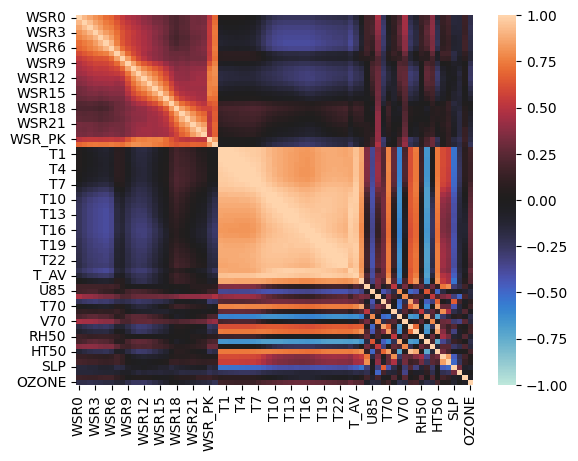

In [127]:
#ヒートマップ
import seaborn as sns
import matplotlib.pyplot as plt
df_corr = train.drop('Date', axis=1).corr()
sns.heatmap(df_corr, vmax=1, vmin=-1, center=0)

In [128]:
wsr = ['WSR0', 'WSR1','WSR2','WSR3','WSR4','WSR4','WSR5','WSR6','WSR7','WSR8','WSR9','WSR10','WSR11','WSR12','WSR13','WSR14','WSR15','WSR16','WSR17','WSR18','WSR19','WSR20','WSR21','WSR22','WSR23']

In [129]:
WSR = pd.concat((train[wsr], test[wsr]), axis=0)

In [130]:
WSR = WSR.fillna(0)

In [131]:
WSR.columns.tolist()

['WSR0',
 'WSR1',
 'WSR2',
 'WSR3',
 'WSR4',
 'WSR4',
 'WSR5',
 'WSR6',
 'WSR7',
 'WSR8',
 'WSR9',
 'WSR10',
 'WSR11',
 'WSR12',
 'WSR13',
 'WSR14',
 'WSR15',
 'WSR16',
 'WSR17',
 'WSR18',
 'WSR19',
 'WSR20',
 'WSR21',
 'WSR22',
 'WSR23']

# 時系列クラスタリングを試す

In [132]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tslearn.clustering import TimeSeriesKMeans
from tslearn.utils import to_time_series_dataset
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

In [133]:
time_np = to_time_series_dataset(WSR)

fig, ax = plt.subplots(figsize=(20,8))

for i, x in enumerate(time_np[:]):
    ax.plot(x, label='shop'+str(i))

ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12456 (\N{KATAKANA LETTER E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12523 (\N{KATAKANA LETTER RU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12508 (\N{KATAKANA LETTER BO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12540 (\N{KATAKANA-HIRAGANA PROLONGED SOUND MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27861 (\N{CJK UNIFIED IDEOGRAPH-6CD5}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/pyt

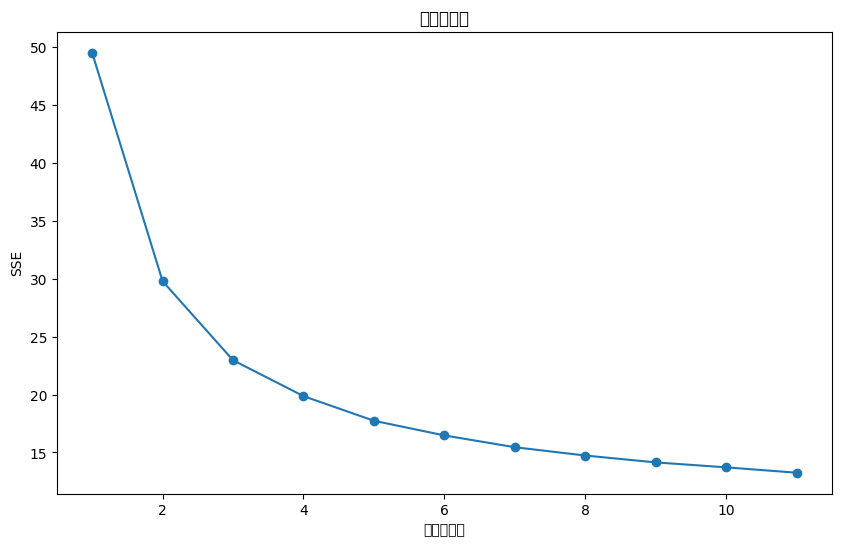

In [134]:
inertia = []
for n_clusters in range(1,12):
    km = TimeSeriesKMeans(n_clusters=n_clusters, metric='euclidean', random_state=0)
    km.fit(time_np)
    inertia.append(km.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1,12), inertia, marker='o')
plt.xlabel('クラスタ数')
plt.ylabel('SSE')
plt.title('エルボー法')
plt.show()

[6 7 6 ... 5 3 6]


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26178 (\N{CJK UNIFIED IDEOGRAPH-6642}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 31995 (\N{CJK UNIFIED IDEOGRAPH-7CFB}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 21015 (\N{CJK UNIFIED IDEOGRAPH-5217}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12463 (\N{KATAKANA LETTER KU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12521 (\N{KATAKANA LETTER RA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python

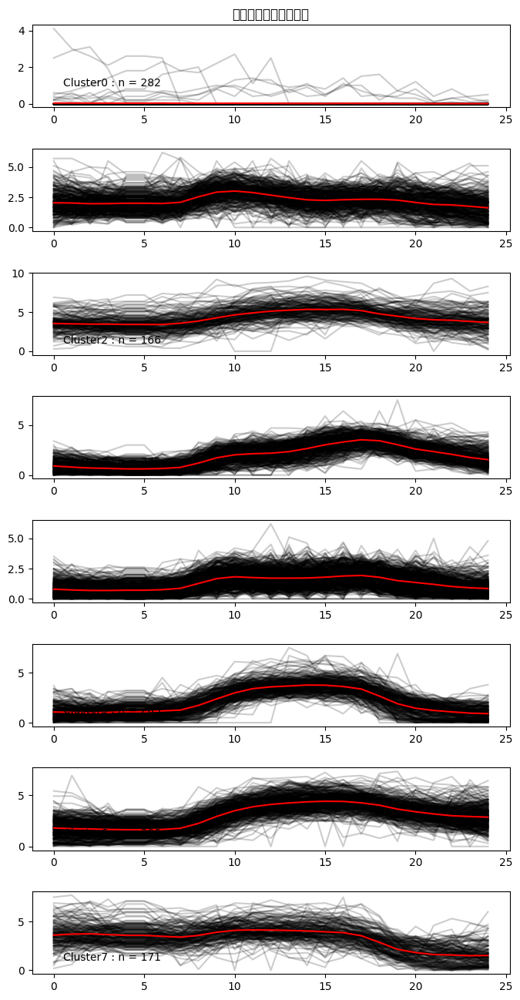

In [137]:
n = 8
km_euclidean = TimeSeriesKMeans(n_clusters=n, metric='euclidean', random_state=0)
labels_euclidean = km_euclidean.fit_predict(time_np)
print(labels_euclidean)

fig, axes = plt.subplots(n, figsize=(8,16))
plt.subplots_adjust(hspace=0.5)
for i in range(n):
    ax = axes[i]

    for x in time_np[labels_euclidean == i]:
        ax.plot(x.ravel(), 'k-', alpha=0.2)
    ax.plot(km_euclidean.cluster_centers_[i].ravel(), 'r-')

    datanum = np.count_nonzero(labels_euclidean == i)
    ax.text(0.5, (0.7+0.25), f'Cluster{(i)} : n = {datanum}')
    if i == 0:
        ax.set_title('時系列クラスタリング')
plt.show()

In [138]:
n = 8
km_euclidean = TimeSeriesKMeans(n_clusters=n, metric='euclidean', random_state=0)
labels_euclidean = km_euclidean.fit_predict(WSR)
print(labels_euclidean)

# colors = pd.DataFrame(labels_euclidean).replace({0:'r', 1:'b', 2:'g', 3:'black'})

# fig = plt.figure(figsize=(20,8))
# index = 0
# for shop in WSR.T.columns:
#     plt.plot(WSR.T.index, WSR.T[shop], label='shop'+str(shop)+'cluster'+str(labels_euclidean[index]), color=colors[0][index])
#     index += 1
# plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
# plt.title('時系列クラスタリング')
# plt.show()
#[2 2 2 2 0 0 3 0 2 2 2 2 0 2 0 0 0 2 0 0 2 0 0 2 0 1 0 3 1 0 0 1 2 2 2 0 2
# 0 0 2 2 0 3 0 0 0 0 0 2 2 0 0 0 0 1 0 0 3 0 0]


[6 7 6 ... 5 3 6]


In [139]:
print(labels_euclidean)

[6 7 6 ... 5 3 6]


In [140]:
labels_euclidean

array([6, 7, 6, ..., 5, 3, 6])

In [141]:
WSR['wind'] = labels_euclidean

In [142]:
WSR

,WSR0,WSR1,WSR2,WSR3,WSR4,WSR4,WSR5,WSR6,WSR7,WSR8,...,WSR15,WSR16,WSR17,WSR18,WSR19,WSR20,WSR21,WSR22,WSR23,wind
id,,,,,,,,,,,,,,,,,,,,,
0,0.8,1.8,2.4,2.1,2.0,2.0,2.1,1.5,1.7,1.9,...,4.7,4.3,3.5,3.5,2.9,3.2,3.2,2.8,2.6,6
1,2.8,3.2,3.3,2.7,3.3,3.3,3.2,2.9,2.8,3.1,...,5.1,3.8,3.0,2.6,3.0,2.2,2.3,2.5,2.8,7
2,2.9,2.8,2.6,2.1,2.2,2.2,2.5,2.5,2.7,2.2,...,5.4,5.2,4.4,3.5,2.7,2.9,3.9,4.1,4.6,6
3,4.7,3.8,3.7,3.8,2.9,2.9,3.1,2.8,2.5,2.4,...,3.8,2.8,2.4,1.9,3.2,4.1,3.9,4.5,4.3,1
4,2.6,2.1,1.6,1.4,0.9,0.9,1.5,1.2,1.4,1.3,...,3.1,2.7,3.0,2.4,2.8,2.5,2.5,3.7,3.4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2529,0.3,0.4,0.5,0.5,0.2,0.2,0.3,0.4,0.4,1.3,...,3.8,3.5,2.0,1.7,1.5,1.3,1.3,1.3,1.1,5
2530,1.0,1.4,1.1,1.7,1.5,1.5,1.7,1.8,1.5,2.1,...,4.7,3.7,3.6,2.7,3.1,2.1,1.8,1.6,1.1,6
2531,0.8,0.8,1.2,0.9,0.4,0.4,0.6,0.8,1.1,1.5,...,3.7,3.3,3.0,2.3,1.3,1.2,0.8,1.6,1.8,5


In [143]:
tem = ['T0', 'T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'T10', 'T11', 'T12', 'T13', 'T14', 'T15', 'T16', 'T17', 'T18', 'T19', 'T20', 'T21', 'T22', 'T23']

In [144]:
Templeture = pd.concat((train[tem], test[tem]), axis=0)

In [145]:
Templeture = Templeture.fillna(0)

In [146]:
time_np = to_time_series_dataset(Templeture)

fig, ax = plt.subplots(figsize=(20,8))

for i, x in enumerate(time_np[:]):
    ax.plot(x, label='shop'+str(i))

ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12456 (\N{KATAKANA LETTER E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12523 (\N{KATAKANA LETTER RU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12508 (\N{KATAKANA LETTER BO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12540 (\N{KATAKANA-HIRAGANA PROLONGED SOUND MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27861 (\N{CJK UNIFIED IDEOGRAPH-6CD5}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/pyt

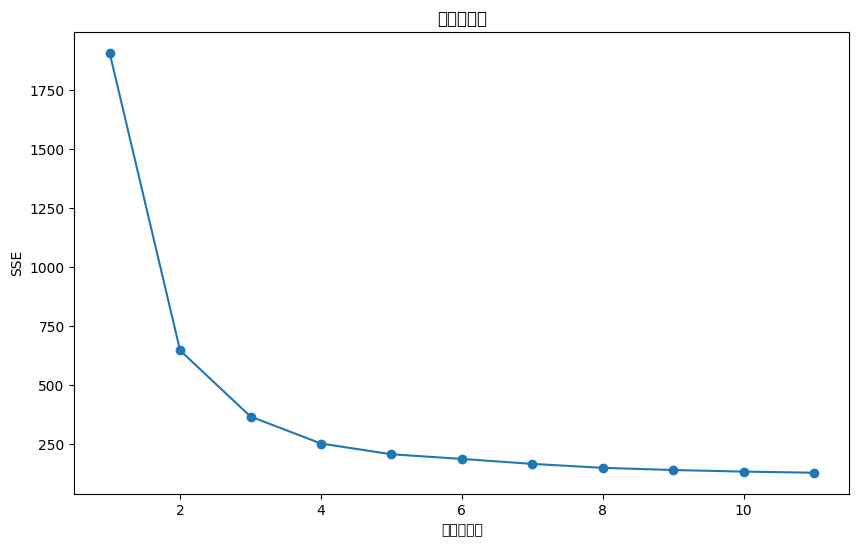

In [147]:
inertia = []
for n_clusters in range(1,12):
    km = TimeSeriesKMeans(n_clusters=n_clusters, metric='euclidean', random_state=0)
    km.fit(time_np)
    inertia.append(km.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1,12), inertia, marker='o')
plt.xlabel('クラスタ数')
plt.ylabel('SSE')
plt.title('エルボー法')
plt.show()

In [148]:
n = 8
km_euclidean = TimeSeriesKMeans(n_clusters=n, metric='euclidean', random_state=0)
labels_euclidean = km_euclidean.fit_predict(Templeture)
print(labels_euclidean)

# colors = pd.DataFrame(labels_euclidean).replace({0:'r', 1:'b', 2:'g', 3:'black'})

# fig = plt.figure(figsize=(20,8))
# index = 0
# for shop in Templeture.T.columns:
#     plt.plot(Templeture.T.index, Templeture.T[shop], label='shop'+str(shop)+'cluster'+str(labels_euclidean[index]), color=colors[0][index])
#     index += 1
# plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
# plt.title('時系列クラスタリング')
# plt.show()
#[2 2 2 2 0 0 3 0 2 2 2 2 0 2 0 0 0 2 0 0 2 0 0 2 0 1 0 3 1 0 0 1 2 2 2 0 2
# 0 0 2 2 0 3 0 0 0 0 0 2 2 0 0 0 0 1 0 0 3 0 0]

[2 4 4 ... 4 1 1]


In [149]:
Templeture['templeture'] = labels_euclidean

In [150]:
Templeture

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,...,T15,T16,T17,T18,T19,T20,T21,T22,T23,templeture
id,,,,,,,,,,,,,,,,,,,,,
0,5.2,6.1,6.1,6.1,6.1,5.6,5.2,5.4,7.2,10.6,...,18.9,18.3,17.3,16.8,16.1,15.4,14.9,14.8,15.0,2
1,15.1,15.3,15.6,15.6,15.9,16.2,16.2,16.2,16.6,17.8,...,22.1,20.8,19.1,18.1,17.2,16.5,16.1,16.0,16.2,4
2,16.6,16.7,16.7,16.8,16.8,16.8,16.9,16.9,17.1,17.6,...,22.2,21.3,19.8,18.6,18.0,18.0,18.2,18.3,18.4,4
3,18.3,18.2,18.3,18.4,18.6,18.6,18.5,18.7,18.6,18.8,...,19.2,18.9,18.8,18.6,18.5,18.3,18.5,18.8,18.9,7
4,18.8,18.6,18.5,18.5,18.6,18.9,19.2,19.4,19.8,20.5,...,26.0,25.6,24.2,22.9,21.6,20.0,19.5,19.1,19.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2529,2.8,2.3,1.6,1.2,1.3,1.3,1.2,1.1,3.8,7.6,...,14.8,14.2,12.9,11.3,9.9,8.8,7.9,7.3,7.0,6
2530,7.0,6.9,7.1,7.6,7.7,7.7,7.7,7.8,9.4,12.4,...,17.6,16.9,15.8,15.4,15.1,15.0,14.8,15.1,15.3,2
2531,15.3,14.8,15.0,14.8,14.2,14.2,14.9,15.6,17.1,18.6,...,20.6,20.0,18.9,18.2,18.1,18.5,18.7,18.4,18.2,4


In [151]:
train_new = train
test_new = test

In [152]:
df_one_hot_encoded_wind = pd.get_dummies(WSR['wind'],  drop_first=True)
df_one_hot_encoded_wind = df_one_hot_encoded_wind.rename(columns={1: 'wind_1', 2: 'wind_2', 3: 'wind_3'})
df_one_hot_encoded_wind

,wind_1,wind_2,wind_3,4,5,6,7
id,,,,,,,
0,False,False,False,False,False,True,False
1,False,False,False,False,False,False,True
2,False,False,False,False,False,True,False
3,True,False,False,False,False,False,False
4,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...
2529,False,False,False,False,True,False,False
2530,False,False,False,False,False,True,False
2531,False,False,False,False,True,False,False


In [153]:
df_one_hot_encoded_t = pd.get_dummies(Templeture['templeture'],  drop_first=True)
df_one_hot_encoded_t = df_one_hot_encoded_t.rename(columns={1: 'templture_1', 2: 'templture_2', 3: 'templture_3'})
df_one_hot_encoded_t

,templture_1,templture_2,templture_3,4,5,6,7
id,,,,,,,
0,False,True,False,False,False,False,False
1,False,False,False,True,False,False,False
2,False,False,False,True,False,False,False
3,False,False,False,False,False,False,True
4,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...
2529,False,False,False,False,False,True,False
2530,False,True,False,False,False,False,False
2531,False,False,False,True,False,False,False


In [154]:
train_new = pd.concat([train_new, df_one_hot_encoded_wind.head(1267)], axis=1)
test_new =pd.concat([test_new, df_one_hot_encoded_wind.tail(1267)], axis=1)

In [155]:
train_new = train_new.drop(wsr, axis=1)
test_new = test_new.drop(wsr, axis=1)

In [156]:
train_new

,Date,WSR_PK,WSR_AV,T0,T1,T2,T3,T4,T5,T6,...,SLP_,Precp,OZONE,wind_1,wind_2,wind_3,4,5,6,7
id,,,,,,,,,,,,,,,,,,,,,
0,1998/1/1,5.5,3.1,5.2,6.1,6.1,6.1,6.1,5.6,5.2,...,-55.0,0.00,0,False,False,False,False,False,True,False
1,1998/1/2,5.5,3.4,15.1,15.3,15.6,15.6,15.9,16.2,16.2,...,-55.0,0.00,0,False,False,False,False,False,False,True
2,1998/1/3,5.6,3.5,16.6,16.7,16.7,16.8,16.8,16.8,16.9,...,-40.0,0.00,0,False,False,False,False,False,True,False
3,1998/1/4,4.7,3.2,18.3,18.2,18.3,18.4,18.6,18.6,18.5,...,-40.0,2.08,0,True,False,False,False,False,False,False
4,1998/1/5,3.7,2.3,18.8,18.6,18.5,18.5,18.6,18.9,19.2,...,NaN,0.58,0,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1262,2001/6/29,3.3,1.7,23.2,23.7,23.6,23.5,23.6,23.9,25.1,...,-25.0,0.05,0,False,False,False,False,True,False,False
1263,2001/6/30,3.3,2.0,24.1,24.1,23.8,23.8,23.9,24.1,25.1,...,-15.0,0.18,0,False,False,True,False,False,False,False
1264,2001/7/1,4.1,2.0,23.4,23.8,23.7,23.4,23.3,23.1,22.7,...,-20.0,0.23,0,False,False,False,False,True,False,False


In [157]:
test_new

,Date,WSR_PK,WSR_AV,T0,T1,T2,T3,T4,T5,T6,...,SLP,SLP_,Precp,wind_1,wind_2,wind_3,4,5,6,7
id,,,,,,,,,,,,,,,,,,,,,
1267,2001/7/4,2.2,1.1,23.6,23.2,23.4,23.3,23.0,23.1,23.4,...,10200.0,10.0,0.08,False,False,False,True,False,False,False
1268,2001/7/5,3.4,1.6,25.5,24.9,24.5,24.3,23.9,23.9,24.8,...,10180.0,-20.0,0.00,False,False,False,True,False,False,False
1269,2001/7/6,3.1,1.5,26.2,25.6,25.4,25.0,25.2,24.9,25.6,...,10165.0,-15.0,0.00,False,False,False,True,False,False,False
1270,2001/7/7,4.3,1.4,26.9,26.4,25.9,25.7,25.2,25.1,25.9,...,10175.0,10.0,0.00,False,False,False,True,False,False,False
1271,2001/7/8,3.5,1.5,25.6,24.8,24.3,24.3,23.9,23.8,25.1,...,10180.0,5.0,0.00,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2529,2004/12/27,3.9,1.6,2.8,2.3,1.6,1.2,1.3,1.3,1.2,...,10295.0,65.0,0.00,False,False,False,False,True,False,False
2530,2004/12/28,5.0,2.6,7.0,6.9,7.1,7.6,7.7,7.7,7.7,...,10310.0,15.0,0.00,False,False,False,False,False,True,False
2531,2004/12/29,3.9,1.9,15.3,14.8,15.0,14.8,14.2,14.2,14.9,...,10275.0,-35.0,0.00,False,False,False,False,True,False,False


In [158]:
train_new = pd.concat([train_new, df_one_hot_encoded_t.head(1267)], axis=1)
test_new =pd.concat([test_new, df_one_hot_encoded_t.tail(1267)], axis=1)
train_new = train_new.drop(tem, axis=1)
test_new = test_new.drop(tem, axis=1)

In [159]:
train_new

,Date,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,...,5,6,7,templture_1,templture_2,templture_3,4,5,6,7
id,,,,,,,,,,,,,,,,,,,,,
0,1998/1/1,5.5,3.1,19.1,12.5,6.7,0.11,3.83,0.14,1612.0,...,False,True,False,False,True,False,False,False,False,False
1,1998/1/2,5.5,3.4,22.4,17.8,9.0,0.25,-0.41,9.53,1594.5,...,False,False,True,False,False,False,True,False,False,False
2,1998/1/3,5.6,3.5,22.2,18.7,9.0,0.56,0.89,10.17,1568.5,...,False,True,False,False,False,False,True,False,False,False
3,1998/1/4,4.7,3.2,19.6,18.7,9.9,0.89,-0.34,8.58,1546.5,...,False,False,False,False,False,False,False,False,False,True
4,1998/1/5,3.7,2.3,26.0,21.1,NaN,NaN,NaN,NaN,NaN,...,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1262,2001/6/29,3.3,1.7,30.6,25.7,17.4,0.52,0.84,1.72,1579.5,...,True,False,False,False,False,False,False,True,False,False
1263,2001/6/30,3.3,2.0,31.7,26.9,16.0,0.84,0.01,2.68,1561.5,...,False,False,False,False,False,False,False,True,False,False
1264,2001/7/1,4.1,2.0,27.9,24.8,16.5,0.79,1.90,1.88,1555.0,...,True,False,False,False,False,False,False,True,False,False


<Axes: >

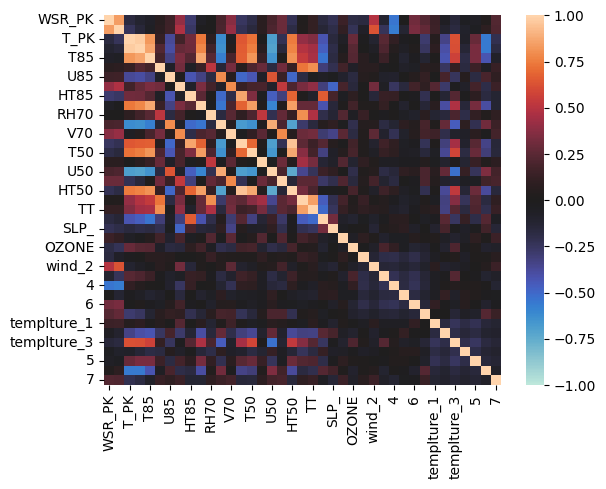

In [160]:
#ヒートマップ
import seaborn as sns
import matplotlib.pyplot as plt
df_corr = train_new.drop('Date', axis=1).corr()
sns.heatmap(df_corr, vmax=1, vmin=-1, center=0)

In [161]:
test_new

,Date,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,...,5,6,7,templture_1,templture_2,templture_3,4,5,6,7
id,,,,,,,,,,,,,,,,,,,,,
1267,2001/7/4,2.2,1.1,31.4,26.7,16.5,0.82,-0.18,0.90,1589.5,...,False,False,False,False,False,False,False,True,False,False
1268,2001/7/5,3.4,1.6,33.7,28.7,17.8,0.76,2.17,-0.19,1580.0,...,False,False,False,False,False,True,False,False,False,False
1269,2001/7/6,3.1,1.5,33.5,28.9,18.1,0.89,-1.00,-1.62,1571.5,...,False,False,False,False,False,True,False,False,False,False
1270,2001/7/7,4.3,1.4,32.5,28.4,18.7,0.65,-2.33,2.54,1576.5,...,False,False,False,False,False,True,False,False,False,False
1271,2001/7/8,3.5,1.5,33.3,28.5,17.8,0.72,-1.63,3.01,1579.0,...,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2529,2004/12/27,3.9,1.6,14.8,7.7,5.5,0.33,-2.25,-1.92,1576.0,...,True,False,False,False,False,False,False,False,True,False
2530,2004/12/28,5.0,2.6,18.4,12.9,5.8,0.27,-2.45,4.71,1600.5,...,False,True,False,False,True,False,False,False,False,False
2531,2004/12/29,3.9,1.9,20.6,17.7,7.5,0.79,7.57,3.13,1591.0,...,True,False,False,False,False,False,True,False,False,False


In [162]:
# Dateを分割して設定
train_new['month'] = train_new['Date'].apply(lambda x : x.split('/')[1])
train_new['day'] = train_new['Date'].apply(lambda x : x.split('/')[2])
test_new['month'] = test_new['Date'].apply(lambda x : x.split('/')[1])
test_new['day'] = test_new['Date'].apply(lambda x : x.split('/')[2])

# 新規で定義したカラムのデータ型はobject型になってしまうため、int型へ変換する
train_new['day'] = train_new['day'].astype(np.int64)
train_new['month'] = train_new['month'].astype(np.int64)
test_new['day'] = test_new['day'].astype(np.int64)
test_new['month'] = test_new['month'].astype(np.int64)

train_new = train_new.drop('Date', axis=1)
test_new = test_new.drop('Date', axis=1)

# 学習

In [163]:
data_x = train_new.drop('OZONE', axis=1)
data_y = train_new[['OZONE']]

In [164]:
from sklearn.model_selection import StratifiedKFold
# optuna経由でLightGBMをインポート
# from optuna.integration import lightgbm as lgb
from sklearn import metrics
import lightgbm as lgb
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score

# kfoldの分割数
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=2)

lgbm_params = {

    'random_state': 42,
    'objective': 'binary',
    'metric': 'auc',
    'class_weight': 'balanced',
    'is_unbalance': True,
    'verbose': -1,
    }

ba_list = []

# kfoldで分割
for train_index, test_index in skf.split(data_x, data_y):

    X_train = data_x.iloc[train_index]
    y_train = data_y.iloc[train_index]
    X_test = data_x.iloc[test_index]
    y_test = data_y.iloc[test_index]


    # データセットを生成する
    lgb_train = lgb.Dataset(X_train.to_numpy(), y_train)
    lgb_eval = lgb.Dataset(X_test.to_numpy(), y_test, reference=lgb_train)

    model = lgb.train(lgbm_params, lgb_train)

    Y_pred = model.predict(X_test, num_iteration=model.best_iteration)
    y_pred = np.where(Y_pred < 0.5, 0, 1)
    ba = balanced_accuracy_score(y_test, y_pred)
    print(ba)
    ba_list.append(ba)
print(f"Balanced Accuracy: {np.mean(ba_list)}")

0.6624216300940439
0.7022397891963109
0.7532467532467533
0.7348484848484849
0.7803030303030303
Balanced Accuracy: 0.7266119375377247


In [165]:
import optuna.integration.lightgbm as lgb_o
import optuna
from sklearn.metrics import roc_auc_score


def objective(trial):
    params = {
        'objective': 'cross_entropy',
        'metric': 'auc',
        'boosting': 'gbdt',
        'learning_rate': 0.05,
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'seed': 0,
        'verbosity': -1,
        "verbose_eval": False,
    }

    # データセットを生成する
    lgb_train = lgb.Dataset(X_train.to_numpy(), y_train, free_raw_data=False)
    lgb_eval = lgb.Dataset(X_test.to_numpy(), y_test, reference=lgb_train, free_raw_data=False)

    # Optunaでのパラメータ探索
    model = lgb_o.train(params, lgb_train,
                  valid_sets=[lgb_train, lgb_eval],
                    num_boost_round=100,   # 計算回数
                    callbacks=[lgb.early_stopping(stopping_rounds=25, verbose=-1),
                               lgb.log_evaluation(10)],         # アーリーストッピング設定
               )
    # model = lgb_o.train(params, lgb_train, valid_sets=lgb_eval,
    #                  num_boost_round=1000, early_stopping_rounds=100)

    y_prob = model.predict(X_test)
    y_pred = np.round(y_prob)
    return roc_auc_score(
        np.round(y_test.values),
        np.round(y_pred)
    )


study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)


[I 2024-05-23 14:17:40,878] A new study created in memory with name: no-name-a12532f8-b49b-4549-8995-c34819de05c7
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('f

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.970367	valid_1's auc: 0.89512
[20]	valid_0's auc: 0.981871	valid_1's auc: 0.890791
[30]	valid_0's auc: 0.989238	valid_1's auc: 0.893546
Early stopping, best iteration is:
[6]	valid_0's auc: 0.964312	valid_1's auc: 0.896694
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968679	valid_1's auc: 0.886167
[20]	valid_0's auc: 0.982958	valid_1's auc: 0.882723
[30]	valid_0's auc: 0.989687	valid_1's auc: 0.885085
[40]	valid_0's auc: 0.994412	valid_1's auc: 0.889807
[50]	valid_0's auc: 0.997571	valid_1's auc: 0.884494


feature_fraction, val_score: 0.904565:  43%|####2     | 3/7 [00:00<00:00,  7.89it/s]

[60]	valid_0's auc: 0.999077	valid_1's auc: 0.885872
Early stopping, best iteration is:
[39]	valid_0's auc: 0.994194	valid_1's auc: 0.890201
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.977759	valid_1's auc: 0.90122
[20]	valid_0's auc: 0.986572	valid_1's auc: 0.894923
[30]	valid_0's auc: 0.992214	valid_1's auc: 0.891381
Early stopping, best iteration is:
[5]	valid_0's auc: 0.969857	valid_1's auc: 0.904565
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.977212	valid_1's auc: 0.886757
[20]	valid_0's auc: 0.983541	valid_1's auc: 0.896202
[30]	valid_0's auc: 0.990477	valid_1's auc: 0.895907
[40]	valid_0's auc: 0.995178	valid_1's auc: 0.893743


feature_fraction, val_score: 0.904565:  57%|#####7    | 4/7 [00:00<00:00,  9.18it/s]

Early stopping, best iteration is:
[24]	valid_0's auc: 0.987258	valid_1's auc: 0.902204
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974418	valid_1's auc: 0.884888
[20]	valid_0's auc: 0.984646	valid_1's auc: 0.893939
[30]	valid_0's auc: 0.992153	valid_1's auc: 0.891381
[40]	valid_0's auc: 0.996101	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.997729	valid_1's auc: 0.897088
[60]	valid_0's auc: 0.9987	valid_1's auc: 0.906926
[70]	valid_0's auc: 0.999514	valid_1's auc: 0.908107
[80]	valid_0's auc: 0.999757	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.999915	valid_1's auc: 0.898072

feature_fraction, val_score: 0.909288:  71%|#######1  | 5/7 [00:00<00:00,  8.13it/s]


Early stopping, best iteration is:
[66]	valid_0's auc: 0.999259	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.909288:  86%|########5 | 6/7 [00:00<00:00,  7.12it/s][I 2024-05-23 14:17:41,684] Trial 5 finished with value: 0.9016135379771744 and parameters: {'feature_fraction': 1.0}. Best is trial 4 with value: 0.9092876820149547.


[10]	valid_0's auc: 0.965132	valid_1's auc: 0.893152
[20]	valid_0's auc: 0.981209	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.988132	valid_1's auc: 0.899843
[40]	valid_0's auc: 0.994352	valid_1's auc: 0.896497
[50]	valid_0's auc: 0.997668	valid_1's auc: 0.890791
Early stopping, best iteration is:
[34]	valid_0's auc: 0.991497	valid_1's auc: 0.901614


feature_fraction, val_score: 0.909288:  86%|########5 | 6/7 [00:00<00:00,  7.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499


feature_fraction, val_score: 0.909976: 100%|##########| 7/7 [00:00<00:00,  8.03it/s]


[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976


num_leaves, val_score: 0.909976:   5%|5         | 1/20 [00:00<00:01, 12.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499


num_leaves, val_score: 0.909976:  10%|#         | 2/20 [00:00<00:01, 12.94it/s]

[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499


num_leaves, val_score: 0.909976:  20%|##        | 4/20 [00:00<00:01, 12.12it/s]

[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973374	valid_1's auc: 0.897875


num_leaves, val_score: 0.912141:  25%|##5       | 5/20 [00:00<00:01, 12.12it/s]

[20]	valid_0's auc: 0.981707	valid_1's auc: 0.902302
[30]	valid_0's auc: 0.988643	valid_1's auc: 0.901417
[40]	valid_0's auc: 0.992675	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.979787	valid_1's auc: 0.912141


num_leaves, val_score: 0.912141:  30%|###       | 6/20 [00:00<00:01, 10.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951485	valid_1's auc: 0.839827
[20]	valid_0's auc: 0.962751	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.969426	valid_1's auc: 0.884494
[40]	valid_0's auc: 0.975779	valid_1's auc: 0.884002
[50]	valid_0's auc: 0.980632	valid_1's auc: 0.892168
[60]	valid_0's auc: 0.984051	valid_1's auc: 0.892759
[70]	valid_0's auc: 0.987148	valid_1's auc: 0.892956
Early stopping, best iteration is:
[52]	valid_0's auc: 0.981093	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912141:  35%|###5      | 7/20 [00:00<00:01, 10.54it/s]

[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976


num_leaves, val_score: 0.912141:  40%|####      | 8/20 [00:00<00:01, 10.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778

num_leaves, val_score: 0.912141:  45%|####5     | 9/20 [00:00<00:01, 10.98it/s]


Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041


num_leaves, val_score: 0.912141:  55%|#####5    | 11/20 [00:00<00:00, 10.93it/s]

[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778

num_leaves, val_score: 0.912141:  65%|######5   | 13/20 [00:01<00:00, 11.02it/s]


Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041


num_leaves, val_score: 0.912141:  70%|#######   | 14/20 [00:01<00:00, 10.97it/s]

[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976


num_leaves, val_score: 0.912141:  75%|#######5  | 15/20 [00:01<00:00, 10.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973374	valid_1's auc: 0.897875
[20]	valid_0's auc: 0.981707	valid_1's auc: 0.902302
[30]	valid_0's auc: 0.988643	valid_1's auc: 0.901417
[40]	valid_0's auc: 0.992675	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.979787	valid_1's auc: 0.912141
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942259	valid_1's auc: 0.83107


num_leaves, val_score: 0.912141:  80%|########  | 16/20 [00:01<00:00,  9.84it/s][I 2024-05-23 14:17:43,288] Trial 22 finished with value: 0.8931523022432113 and parameters: {'num_leaves': 6}. Best is trial 11 with value: 0.9121408894136167.


[20]	valid_0's auc: 0.955354	valid_1's auc: 0.863046
[30]	valid_0's auc: 0.963687	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.9701	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.974838	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.978148	valid_1's auc: 0.890397
[70]	valid_0's auc: 0.980711	valid_1's auc: 0.887643
[80]	valid_0's auc: 0.984488	valid_1's auc: 0.890397
Early stopping, best iteration is:
[57]	valid_0's auc: 0.977115	valid_1's auc: 0.893152


num_leaves, val_score: 0.912141:  85%|########5 | 17/20 [00:01<00:00,  9.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976


num_leaves, val_score: 0.912141:  90%|######### | 18/20 [00:01<00:00,  9.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041
[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975008	valid_1's auc: 0.906041


num_leaves, val_score: 0.912141:  95%|#########5| 19/20 [00:01<00:00,  9.95it/s]

[20]	valid_0's auc: 0.983346	valid_1's auc: 0.902499
[30]	valid_0's auc: 0.99055	valid_1's auc: 0.903778
Early stopping, best iteration is:
[6]	valid_0's auc: 0.971983	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934801	valid_1's auc: 0.865506
[20]	valid_0's auc: 0.948521	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.957407	valid_1's auc: 0.886954


num_leaves, val_score: 0.912141: 100%|##########| 20/20 [00:01<00:00, 10.60it/s]


[40]	valid_0's auc: 0.963213	valid_1's auc: 0.882723
[50]	valid_0's auc: 0.967683	valid_1's auc: 0.885183
Early stopping, best iteration is:
[29]	valid_0's auc: 0.957127	valid_1's auc: 0.889512


bagging, val_score: 0.912141:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967756	valid_1's auc: 0.904565
[20]	valid_0's auc: 0.980832	valid_1's auc: 0.897875


bagging, val_score: 0.912141:  10%|#         | 1/10 [00:00<00:01,  8.82it/s]

[30]	valid_0's auc: 0.987294	valid_1's auc: 0.895514
Early stopping, best iteration is:
[11]	valid_0's auc: 0.969748	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934995	valid_1's auc: 0.865998


bagging, val_score: 0.912141:  20%|##        | 2/10 [00:00<00:00,  9.22it/s]

[20]	valid_0's auc: 0.957103	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.965612	valid_1's auc: 0.88961
[40]	valid_0's auc: 0.969317	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.975014	valid_1's auc: 0.88843
Early stopping, best iteration is:
[25]	valid_0's auc: 0.963759	valid_1's auc: 0.893743
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917826	valid_1's auc: 0.879772
[20]	valid_0's auc: 0.935293	valid_1's auc: 0.876427
[30]	valid_0's auc: 0.955688	valid_1's auc: 0.889217


bagging, val_score: 0.912141:  30%|###       | 3/10 [00:00<00:00,  8.40it/s]

[40]	valid_0's auc: 0.963717	valid_1's auc: 0.90673
[50]	valid_0's auc: 0.968527	valid_1's auc: 0.908304
[60]	valid_0's auc: 0.973933	valid_1's auc: 0.907713
[70]	valid_0's auc: 0.97952	valid_1's auc: 0.90673
Early stopping, best iteration is:
[48]	valid_0's auc: 0.96826	valid_1's auc: 0.908697


bagging, val_score: 0.920602:  40%|####      | 4/10 [00:00<00:00,  8.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973058	valid_1's auc: 0.904959
[20]	valid_0's auc: 0.983067	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.95748	valid_1's auc: 0.920602
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.920602:  50%|#####     | 5/10 [00:00<00:00,  8.72it/s]

[10]	valid_0's auc: 0.972845	valid_1's auc: 0.899843
[20]	valid_0's auc: 0.983687	valid_1's auc: 0.894923
Early stopping, best iteration is:
[3]	valid_0's auc: 0.953981	valid_1's auc: 0.909091
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952426	valid_1's auc: 0.857536


bagging, val_score: 0.920602:  60%|######    | 6/10 [00:00<00:00,  8.85it/s]

[20]	valid_0's auc: 0.970039	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.979696	valid_1's auc: 0.891775
[40]	valid_0's auc: 0.984913	valid_1's auc: 0.886265
[50]	valid_0's auc: 0.990015	valid_1's auc: 0.887643
[60]	valid_0's auc: 0.993866	valid_1's auc: 0.885478
Early stopping, best iteration is:
[35]	valid_0's auc: 0.982533	valid_1's auc: 0.894136
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947039	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.964446	valid_1's auc: 0.882723
[30]	valid_0's auc: 0.975463	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.98444	valid_1's auc: 0.880362
[50]	valid_0's auc: 0.988946	valid_1's auc: 0.887052


bagging, val_score: 0.920602:  70%|#######   | 7/10 [00:00<00:00,  7.54it/s]

[60]	valid_0's auc: 0.993186	valid_1's auc: 0.889217
[70]	valid_0's auc: 0.995408	valid_1's auc: 0.883707
Early stopping, best iteration is:
[54]	valid_0's auc: 0.991594	valid_1's auc: 0.890791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944573	valid_1's auc: 0.878001


bagging, val_score: 0.920602:  80%|########  | 8/10 [00:00<00:00,  8.00it/s]

[20]	valid_0's auc: 0.965047	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.974595	valid_1's auc: 0.879772
Early stopping, best iteration is:
[14]	valid_0's auc: 0.953003	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.920602:  90%|######### | 9/10 [00:01<00:00,  8.00it/s]

[10]	valid_0's auc: 0.931036	valid_1's auc: 0.894333
[20]	valid_0's auc: 0.953435	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.966292	valid_1's auc: 0.89512
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909384	valid_1's auc: 0.905057
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.960395	valid_1's auc: 0.865407
[20]	valid_0's auc: 0.976107	valid_1's auc: 0.864817
[30]	valid_0's auc: 0.982824	valid_1's auc: 0.86403
Early stopping, best iteration is:
[11]	valid_0's auc: 0.961172	valid_1's auc: 0.871015


feature_fraction_stage2, val_score: 0.920602:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.97369	valid_1's auc: 0.888823


feature_fraction_stage2, val_score: 0.920602:  33%|###3      | 2/6 [00:00<00:00,  7.17it/s]

[20]	valid_0's auc: 0.981591	valid_1's auc: 0.895514
[30]	valid_0's auc: 0.987209	valid_1's auc: 0.896694
[40]	valid_0's auc: 0.991643	valid_1's auc: 0.89571
[50]	valid_0's auc: 0.994898	valid_1's auc: 0.890397
Early stopping, best iteration is:
[33]	valid_0's auc: 0.989092	valid_1's auc: 0.902204
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973854	valid_1's auc: 0.895907
[20]	valid_0's auc: 0.982709	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.988922	valid_1's auc: 0.90181
Early stopping, best iteration is:
[14]	valid_0's auc: 0.980407	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.920602:  50%|#####     | 3/6 [00:00<00:00,  7.80it/s]

[10]	valid_0's auc: 0.97375	valid_1's auc: 0.892562
[20]	valid_0's auc: 0.981719	valid_1's auc: 0.895514
[30]	valid_0's auc: 0.987902	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.992226	valid_1's auc: 0.895514
[50]	valid_0's auc: 0.995068	valid_1's auc: 0.896104
Early stopping, best iteration is:
[33]	valid_0's auc: 0.989651	valid_1's auc: 0.900433
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.976745	valid_1's auc: 0.912141
[20]	valid_0's auc: 0.984598	valid_1's auc: 0.90732


feature_fraction_stage2, val_score: 0.920602:  67%|######6   | 4/6 [00:00<00:00,  7.80it/s]

[30]	valid_0's auc: 0.989833	valid_1's auc: 0.900039
Early stopping, best iteration is:
[6]	valid_0's auc: 0.972602	valid_1's auc: 0.917257


feature_fraction_stage2, val_score: 0.924538: 100%|##########| 6/6 [00:00<00:00,  9.03it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975032	valid_1's auc: 0.91283
[20]	valid_0's auc: 0.98365	valid_1's auc: 0.905549
Early stopping, best iteration is:
[4]	valid_0's auc: 0.960553	valid_1's auc: 0.924538
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975906	valid_1's auc: 0.909681
[20]	valid_0's auc: 0.983213	valid_1's auc: 0.906139
[30]	valid_0's auc: 0.989286	valid_1's auc: 0.898072
Early stopping, best iteration is:
[6]	valid_0's auc: 0.972955	valid_1's auc: 0.919913


regularization_factors, val_score: 0.924538:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.924538:  10%|#         | 2/20 [00:00<00:01,  9.48it/s]

[10]	valid_0's auc: 0.978518	valid_1's auc: 0.887643
[20]	valid_0's auc: 0.986383	valid_1's auc: 0.896104
Early stopping, best iteration is:
[3]	valid_0's auc: 0.959563	valid_1's auc: 0.903286
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968709	valid_1's auc: 0.881936
[20]	valid_0's auc: 0.975512	valid_1's auc: 0.897383
[30]	valid_0's auc: 0.983954	valid_1's auc: 0.891775
Early stopping, best iteration is:
[14]	valid_0's auc: 0.974667	valid_1's auc: 0.900138
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.924538:  20%|##        | 4/20 [00:00<00:01,  9.16it/s]

[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.986152	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932281	valid_1's auc: 0.866194
[20]	valid_0's auc: 0.940024	valid_1's auc: 0.87013
[30]	valid_0's auc: 0.942897	valid_1's auc: 0.878788
[40]	valid_0's auc: 0.947981	valid_1's auc: 0.883904
[50]	valid_0's auc: 0.951637	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.952906	valid_1's auc: 0.87741
Early stopping, best iteration is:
[40]	valid_0's auc: 0.947981	valid_1's auc: 0.883904
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.924538:  30%|###       | 6/20 [00:00<00:01, 10.15it/s]

[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.986152	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.986152	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978178	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.985812	valid_1's auc: 0.894333
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958403	valid_1's auc: 0.906238

regularization_factors, val_score: 0.924538:  45%|####5     | 9/20 [00:00<00:01, 10.69it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.986152	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978591	valid_1's auc: 0.887839
[20]	valid_0's auc: 0.985995	valid_1's auc: 0.897285
Early stopping, best iteration is:
[3]	valid_0's auc: 0.959636	valid_1's auc: 0.903286


regularization_factors, val_score: 0.924538:  55%|#####5    | 11/20 [00:01<00:00, 10.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.986152	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927197	valid_1's auc: 0.851043
[20]	valid_0's auc: 0.937668	valid_1's auc: 0.870622
[30]	valid_0's auc: 0.939794	valid_1's auc: 0.87987
[40]	valid_0's auc: 0.945393	valid_1's auc: 0.884298
[50]	valid_0's auc: 0.948934	valid_1's auc: 0.878001
[60]	valid_0's auc: 0.950878	valid_1's auc: 0.879969
Early stopping, best iteration is:
[40]	valid_0's auc: 0.945393	valid_1's auc: 0.884298
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978166	valid_1's auc: 0.895317


regularization_factors, val_score: 0.924538:  65%|######5   | 13/20 [00:01<00:00, 10.92it/s]

[20]	valid_0's auc: 0.985812	valid_1's auc: 0.894333
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958318	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937103	valid_1's auc: 0.852715
[20]	valid_0's auc: 0.953914	valid_1's auc: 0.881248
[30]	valid_0's auc: 0.961348	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.967434	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.973647	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.977735	valid_1's auc: 0.890201
Early stopping, best iteration is:
[42]	valid_0's auc: 0.968831	valid_1's auc: 0.893546


regularization_factors, val_score: 0.924538:  75%|#######5  | 15/20 [00:01<00:00,  9.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.98614	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.986152	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238


regularization_factors, val_score: 0.924538:  80%|########  | 16/20 [00:01<00:00,  7.75it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974382	valid_1's auc: 0.876033
[20]	valid_0's auc: 0.982095	valid_1's auc: 0.886462
[30]	valid_0's auc: 0.988108	valid_1's auc: 0.889414
[40]	valid_0's auc: 0.992566	valid_1's auc: 0.888233
[50]	valid_0's auc: 0.995044	valid_1's auc: 0.890988
[60]	valid_0's auc: 0.997024	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.998105	valid_1's auc: 0.89512
[80]	valid_0's auc: 0.999077	valid_1's auc: 0.890201
[90]	valid_0's auc: 0.999514	valid_1's auc: 0.887052
Early stopping, best iteration is:
[67]	valid_0's auc: 0.997899	valid_1's auc: 0.897481


regularization_factors, val_score: 0.924538:  90%|######### | 18/20 [00:01<00:00,  8.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.986152	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978409	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.98614	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978397	valid_1's auc: 0.895514


regularization_factors, val_score: 0.924538: 100%|##########| 20/20 [00:02<00:00,  9.31it/s]


[20]	valid_0's auc: 0.98614	valid_1's auc: 0.895907
Early stopping, best iteration is:
[3]	valid_0's auc: 0.958415	valid_1's auc: 0.906238
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973252	valid_1's auc: 0.878591
[20]	valid_0's auc: 0.981646	valid_1's auc: 0.88351
[30]	valid_0's auc: 0.987112	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.991619	valid_1's auc: 0.883117
[50]	valid_0's auc: 0.994084	valid_1's auc: 0.882527
[60]	valid_0's auc: 0.996162	valid_1's auc: 0.886659
Early stopping, best iteration is:
[35]	valid_0's auc: 0.989699	valid_1's auc: 0.890594


min_child_samples, val_score: 0.924931:  60%|######    | 3/5 [00:00<00:00, 13.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.976496	valid_1's auc: 0.908205
[20]	valid_0's auc: 0.984136	valid_1's auc: 0.902204
Early stopping, best iteration is:
[4]	valid_0's auc: 0.961196	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934406	valid_1's auc: 0.896006
[20]	valid_0's auc: 0.940656	valid_1's auc: 0.895022
[30]	valid_0's auc: 0.949499	valid_1's auc: 0.893349
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940698	valid_1's auc: 0.903778
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954236	valid_1's auc: 0.915092
[20]	valid_0's auc: 0.967015	valid_1's auc: 0.914502
Early stopping, best iteration is:
[3]	valid_0's auc: 0.932165	valid_1's auc: 0.922275


min_child_samples, val_score: 0.924931: 100%|##########| 5/5 [00:00<00:00, 12.71it/s]
[I 2024-05-23 14:17:48,055] Trial 0 finished with value: 0.5 and parameters: {'lambda_l1': 7.126845035089092e-06, 'lambda_l2': 0.873547768844963, 'num_leaves': 42, 'feature_fraction': 0.7606090837687516, 'bagging_fraction': 0.9521671338313009, 'bagging_freq': 0, 'min_child_samples': 28}. Best is trial 0 with value: 0.5.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('l

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978925	valid_1's auc: 0.887249
[20]	valid_0's auc: 0.982812	valid_1's auc: 0.886757
[30]	valid_0's auc: 0.989772	valid_1's auc: 0.887446
Early stopping, best iteration is:
[6]	valid_0's auc: 0.974133	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978548	valid_1's auc: 0.903089
[20]	valid_0's auc: 0.984124	valid_1's auc: 0.906336
[30]	valid_0's auc: 0.990829	valid_1's auc: 0.899646
Early stopping, best iteration is:
[6]	valid_0's auc: 0.975062	valid_1's auc: 0.909386


feature_fraction, val_score: 0.906434:  29%|##8       | 2/7 [00:00<00:00, 12.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912281	valid_1's auc: 0.897088
[20]	valid_0's auc: 0.935439	valid_1's auc: 0.888233
[30]	valid_0's auc: 0.949797	valid_1's auc: 0.884494
Early stopping, best iteration is:
[5]	valid_0's auc: 0.878974	valid_1's auc: 0.906434
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902271	valid_1's auc: 0.891775
[20]	valid_0's auc: 0.935178	valid_1's auc: 0.897088
[30]	valid_0's auc: 0.949171	valid_1's auc: 0.89512
Early stopping, best iteration is:
[13]	valid_0's auc: 0.914868	valid_1's auc: 0.906336
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333


feature_fraction, val_score: 0.909878:  57%|#####7    | 4/7 [00:00<00:00,  9.09it/s]

[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.904695	valid_1's auc: 0.874754
[20]	valid_0's auc: 0.929226	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.944488	valid_1's auc: 0.878985
[40]	valid_0's auc: 0.953465	valid_1's auc: 0.886265
[50]	valid_0's auc: 0.964422	valid_1's auc: 0.890594
[60]	valid_0's auc: 0.973082	valid_1's auc: 0.892759
[70]	valid_0's auc: 0.979532	valid_1's auc: 0.893546
Early stopping, best iteration is:
[53]	valid_0's auc: 0.96679	valid_1's auc: 0.895514


feature_fraction, val_score: 0.909878:  71%|#######1  | 5/7 [00:00<00:00,  7.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89434	valid_1's auc: 0.870622
[20]	valid_0's auc: 0.921488	valid_1's auc: 0.860193
[30]	valid_0's auc: 0.942733	valid_1's auc: 0.875443
[40]	valid_0's auc: 0.954315	valid_1's auc: 0.878788
[50]	valid_0's auc: 0.966438	valid_1's auc: 0.890201
[60]	valid_0's auc: 0.975949	valid_1's auc: 0.889217
[70]	valid_0's auc: 0.980018	valid_1's auc: 0.893939
[80]	valid_0's auc: 0.982654	valid_1's auc: 0.893152
[90]	valid_0's auc: 0.986857	valid_1's auc: 0.896104
[100]	valid_0's auc: 0.989323	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.989323	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912341	valid_1's auc: 0.885085


feature_fraction, val_score: 0.909878: 100%|##########| 7/7 [00:00<00:00,  9.33it/s]


[20]	valid_0's auc: 0.934412	valid_1's auc: 0.868261
[30]	valid_0's auc: 0.949299	valid_1's auc: 0.879477
Early stopping, best iteration is:
[5]	valid_0's auc: 0.881731	valid_1's auc: 0.896202
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90362	valid_1's auc: 0.878296
[20]	valid_0's auc: 0.934595	valid_1's auc: 0.876131
[30]	valid_0's auc: 0.949329	valid_1's auc: 0.880362
Early stopping, best iteration is:
[5]	valid_0's auc: 0.875105	valid_1's auc: 0.884101


num_leaves, val_score: 0.909878:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188


num_leaves, val_score: 0.909878:   5%|5         | 1/20 [00:00<00:02,  7.88it/s]

[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123


num_leaves, val_score: 0.909878:  10%|#         | 2/20 [00:00<00:02,  7.37it/s]

[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.909878:  15%|#5        | 3/20 [00:00<00:02,  6.91it/s]

[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872


num_leaves, val_score: 0.909878:  20%|##        | 4/20 [00:00<00:02,  6.74it/s]

[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123


num_leaves, val_score: 0.909878:  25%|##5       | 5/20 [00:00<00:02,  6.93it/s]

[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  30%|###       | 6/20 [00:00<00:01,  7.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188

num_leaves, val_score: 0.909878:  35%|###5      | 7/20 [00:00<00:01,  7.23it/s]


[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188


num_leaves, val_score: 0.909878:  40%|####      | 8/20 [00:01<00:01,  7.25it/s]

[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  45%|####5     | 9/20 [00:01<00:01,  7.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901342	valid_1's auc: 0.880756
[20]	valid_0's auc: 0.9271	valid_1's auc: 0.878493
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.891775
[40]	valid_0's auc: 0.949517	valid_1's auc: 0.891381
[50]	valid_0's auc: 0.957832	valid_1's auc: 0.903778
[60]	valid_0's auc: 0.965023	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.970203	valid_1's auc: 0.898465


num_leaves, val_score: 0.909878:  50%|#####     | 10/20 [00:01<00:01,  7.52it/s]

Early stopping, best iteration is:
[53]	valid_0's auc: 0.959302	valid_1's auc: 0.908304
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188


num_leaves, val_score: 0.909878:  55%|#####5    | 11/20 [00:01<00:01,  7.00it/s]

[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  60%|######    | 12/20 [00:01<00:01,  6.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872


num_leaves, val_score: 0.909878:  65%|######5   | 13/20 [00:01<00:01,  6.73it/s]

[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433


num_leaves, val_score: 0.909878:  70%|#######   | 14/20 [00:02<00:00,  6.56it/s]

Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  80%|########  | 16/20 [00:02<00:00,  6.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965


num_leaves, val_score: 0.909878:  85%|########5 | 17/20 [00:02<00:00,  6.25it/s]

[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333


num_leaves, val_score: 0.909878:  95%|#########5| 19/20 [00:02<00:00,  6.49it/s]

[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878: 100%|##########| 20/20 [00:02<00:00,  6.79it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902933	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.932803	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.946256	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954097	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.967264	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.976301	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.980905	valid_1's auc: 0.900433
Early stopping, best iteration is:
[51]	valid_0's auc: 0.96826	valid_1's auc: 0.909878


bagging, val_score: 0.909878:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884956	valid_1's auc: 0.850748
[20]	valid_0's auc: 0.908181	valid_1's auc: 0.870228
[30]	valid_0's auc: 0.933902	valid_1's auc: 0.874852

bagging, val_score: 0.910173:  20%|##        | 2/10 [00:00<00:01,  7.92it/s]


[40]	valid_0's auc: 0.946827	valid_1's auc: 0.85852
[50]	valid_0's auc: 0.955451	valid_1's auc: 0.863636
Early stopping, best iteration is:
[29]	valid_0's auc: 0.931691	valid_1's auc: 0.874852
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95737	valid_1's auc: 0.896989
[20]	valid_0's auc: 0.972961	valid_1's auc: 0.910173
[30]	valid_0's auc: 0.982994	valid_1's auc: 0.904172
[40]	valid_0's auc: 0.987804	valid_1's auc: 0.899646
Early stopping, best iteration is:
[20]	valid_0's auc: 0.972961	valid_1's auc: 0.910173


bagging, val_score: 0.913813:  40%|####      | 4/10 [00:00<00:00,  7.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955263	valid_1's auc: 0.895022
[20]	valid_0's auc: 0.972299	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.981767	valid_1's auc: 0.902991
[40]	valid_0's auc: 0.988011	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.992044	valid_1's auc: 0.901417
Early stopping, best iteration is:
[26]	valid_0's auc: 0.978889	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956817	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.971491	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.980541	valid_1's auc: 0.898662
Early stopping, best iteration is:
[5]	valid_0's auc: 0.949475	valid_1's auc: 0.913813


bagging, val_score: 0.913813:  50%|#####     | 5/10 [00:00<00:00,  7.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952633	valid_1's auc: 0.902302
[20]	valid_0's auc: 0.969438	valid_1's auc: 0.906041
[30]	valid_0's auc: 0.978652	valid_1's auc: 0.900236
[40]	valid_0's auc: 0.986881	valid_1's auc: 0.899843
Early stopping, best iteration is:
[15]	valid_0's auc: 0.962885	valid_1's auc: 0.91096
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959623	valid_1's auc: 0.903876
[20]	valid_0's auc: 0.975421	valid_1's auc: 0.900826
[30]	valid_0's auc: 0.982885	valid_1's auc: 0.905352
Early stopping, best iteration is:
[5]	valid_0's auc: 0.950088	valid_1's auc: 0.911157


bagging, val_score: 0.913813:  70%|#######   | 7/10 [00:00<00:00,  8.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956842	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.971649	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.981257	valid_1's auc: 0.902204
Early stopping, best iteration is:
[5]	valid_0's auc: 0.949481	valid_1's auc: 0.913617
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953386	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.970762	valid_1's auc: 0.905254
[30]	valid_0's auc: 0.980553	valid_1's auc: 0.903778


bagging, val_score: 0.913813:  90%|######### | 9/10 [00:01<00:00,  7.82it/s]

[40]	valid_0's auc: 0.986869	valid_1's auc: 0.902597
Early stopping, best iteration is:
[15]	valid_0's auc: 0.963668	valid_1's auc: 0.910173
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.960285	valid_1's auc: 0.901515
[20]	valid_0's auc: 0.97177	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.980164	valid_1's auc: 0.890988
Early stopping, best iteration is:
[8]	valid_0's auc: 0.957686	valid_1's auc: 0.904664
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944786	valid_1's auc: 0.868261


bagging, val_score: 0.913813: 100%|##########| 10/10 [00:01<00:00,  7.03it/s]


[20]	valid_0's auc: 0.965667	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.972894	valid_1's auc: 0.873278
[40]	valid_0's auc: 0.980049	valid_1's auc: 0.867769
[50]	valid_0's auc: 0.985624	valid_1's auc: 0.880362
[60]	valid_0's auc: 0.990513	valid_1's auc: 0.886659
[70]	valid_0's auc: 0.994582	valid_1's auc: 0.886462
[80]	valid_0's auc: 0.997097	valid_1's auc: 0.888233
[90]	valid_0's auc: 0.998324	valid_1's auc: 0.891185
[100]	valid_0's auc: 0.999247	valid_1's auc: 0.887839
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.999247	valid_1's auc: 0.887839


feature_fraction_stage2, val_score: 0.913813:  17%|#6        | 1/6 [00:00<00:00,  8.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957625	valid_1's auc: 0.901023
[20]	valid_0's auc: 0.971418	valid_1's auc: 0.901417
[30]	valid_0's auc: 0.980692	valid_1's auc: 0.897285
Early stopping, best iteration is:
[5]	valid_0's auc: 0.947932	valid_1's auc: 0.911551
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.972517	valid_1's auc: 0.91283
[30]	valid_0's auc: 0.980285	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.987063	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991206	valid_1's auc: 0.906533
Early stopping, best iteration is:
[25]	valid_0's auc: 0.976556	valid_1's auc: 0.914601


feature_fraction_stage2, val_score: 0.914601:  50%|#####     | 3/6 [00:00<00:00,  7.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957048	valid_1's auc: 0.900531
[20]	valid_0's auc: 0.972773	valid_1's auc: 0.906336
[30]	valid_0's auc: 0.981263	valid_1's auc: 0.905549
Early stopping, best iteration is:
[13]	valid_0's auc: 0.963826	valid_1's auc: 0.913912
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956222	valid_1's auc: 0.895022
[20]	valid_0's auc: 0.972408	valid_1's auc: 0.90368
[30]	valid_0's auc: 0.980273	valid_1's auc: 0.901614


feature_fraction_stage2, val_score: 0.914601:  83%|########3 | 5/6 [00:00<00:00,  7.13it/s]

[40]	valid_0's auc: 0.986274	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.991351	valid_1's auc: 0.90122
Early stopping, best iteration is:
[25]	valid_0's auc: 0.976593	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956915	valid_1's auc: 0.906139
[20]	valid_0's auc: 0.972074	valid_1's auc: 0.902794
[30]	valid_0's auc: 0.979538	valid_1's auc: 0.904565
Early stopping, best iteration is:
[5]	valid_0's auc: 0.949475	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956344	valid_1's auc: 0.89758
[20]	valid_0's auc: 0.971643	valid_1's auc: 0.898367


feature_fraction_stage2, val_score: 0.914601: 100%|##########| 6/6 [00:00<00:00,  7.95it/s]


[30]	valid_0's auc: 0.981215	valid_1's auc: 0.900138
Early stopping, best iteration is:
[13]	valid_0's auc: 0.962448	valid_1's auc: 0.906041


regularization_factors, val_score: 0.914601:   5%|5         | 1/20 [00:00<00:02,  7.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952742	valid_1's auc: 0.871802
[20]	valid_0's auc: 0.960644	valid_1's auc: 0.896596
[30]	valid_0's auc: 0.970641	valid_1's auc: 0.897776
[40]	valid_0's auc: 0.977741	valid_1's auc: 0.901122
[50]	valid_0's auc: 0.983037	valid_1's auc: 0.89571
[60]	valid_0's auc: 0.988096	valid_1's auc: 0.898662
Early stopping, best iteration is:
[39]	valid_0's auc: 0.976945	valid_1's auc: 0.904467
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937279	valid_1's auc: 0.859898
[20]	valid_0's auc: 0.943851	valid_1's auc: 0.874459
[30]	valid_0's auc: 0.949353	valid_1's auc: 0.877214
[40]	valid_0's auc: 0.954194	valid_1's auc: 0.878001
[50]	valid_0's auc: 0.959192	valid_1's auc: 0.882133


regularization_factors, val_score: 0.914601:  10%|#         | 2/20 [00:00<00:02,  6.66it/s]

[60]	valid_0's auc: 0.963243	valid_1's auc: 0.881739
[70]	valid_0's auc: 0.966547	valid_1's auc: 0.878001
[80]	valid_0's auc: 0.970374	valid_1's auc: 0.87741
Early stopping, best iteration is:
[59]	valid_0's auc: 0.96345	valid_1's auc: 0.88233
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.97253	valid_1's auc: 0.912633


regularization_factors, val_score: 0.914601:  15%|#5        | 3/20 [00:00<00:02,  7.18it/s]

[30]	valid_0's auc: 0.98031	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.987124	valid_1's auc: 0.909484
Early stopping, best iteration is:
[15]	valid_0's auc: 0.966341	valid_1's auc: 0.914404


regularization_factors, val_score: 0.914601:  20%|##        | 4/20 [00:00<00:02,  7.53it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.97253	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.98031	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.987124	valid_1's auc: 0.909484
Early stopping, best iteration is:
[15]	valid_0's auc: 0.966341	valid_1's auc: 0.914404
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959138	valid_1's auc: 0.908894
[20]	valid_0's auc: 0.97276	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.980613	valid_1's auc: 0.905549
[40]	valid_0's auc: 0.986493	valid_1's auc: 0.904762


regularization_factors, val_score: 0.914601:  30%|###       | 6/20 [00:00<00:01,  7.70it/s]

Early stopping, best iteration is:
[17]	valid_0's auc: 0.969213	valid_1's auc: 0.91283
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959138	valid_1's auc: 0.908894
[20]	valid_0's auc: 0.97276	valid_1's auc: 0.912436
[30]	valid_0's auc: 0.980613	valid_1's auc: 0.905549
[40]	valid_0's auc: 0.986493	valid_1's auc: 0.904959
Early stopping, best iteration is:
[17]	valid_0's auc: 0.969213	valid_1's auc: 0.91283
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732


regularization_factors, val_score: 0.914601:  35%|###5      | 7/20 [00:01<00:01,  7.94it/s]

[20]	valid_0's auc: 0.97253	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.98031	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.987124	valid_1's auc: 0.909484
Early stopping, best iteration is:
[15]	valid_0's auc: 0.966353	valid_1's auc: 0.914404
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.972517	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.980285	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.987063	valid_1's auc: 0.909484
[50]	valid_0's auc: 0.991206	valid_1's auc: 0.906336
Early stopping, best iteration is:
[25]	valid_0's auc: 0.976556	valid_1's auc: 0.914404


regularization_factors, val_score: 0.914601:  50%|#####     | 10/20 [00:01<00:01,  8.03it/s][I 2024-05-23 14:17:55,278] Trial 52 finished with value: 0.9144037780401417 and parameters: {'lambda_l1': 0.003115673598744853, 'lambda_l2': 3.363701503231887e-06}. Best is trial 45 with value: 0.9144037780401417.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.97253	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.980237	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.987076	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991254	valid_1's auc: 0.907123
Early stopping, best iteration is:
[25]	valid_0's auc: 0.976556	valid_1's auc: 0.914404
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.972554	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.980261	valid_1's auc: 0.908697
[40]	valid_0's auc: 0.987076	valid_1's auc: 0.909484
Early stopping, best iteration is:
[15]	valid_0's auc: 0.96628	valid_1's auc: 0.914404


regularization_factors, val_score: 0.914601:  55%|#####5    | 11/20 [00:01<00:01,  8.00it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.908894
[20]	valid_0's auc: 0.97276	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.980638	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.986201	valid_1's auc: 0.902794
Early stopping, best iteration is:
[17]	valid_0's auc: 0.969226	valid_1's auc: 0.91283
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.972517	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.980298	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.987088	valid_1's auc: 0.909484


regularization_factors, val_score: 0.914601:  65%|######5   | 13/20 [00:01<00:00,  8.02it/s]

[50]	valid_0's auc: 0.991206	valid_1's auc: 0.906336
Early stopping, best iteration is:
[25]	valid_0's auc: 0.976556	valid_1's auc: 0.914404
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.908894
[20]	valid_0's auc: 0.972517	valid_1's auc: 0.912239
[30]	valid_0's auc: 0.980589	valid_1's auc: 0.907517
Early stopping, best iteration is:
[9]	valid_0's auc: 0.95881	valid_1's auc: 0.912633
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.907123


regularization_factors, val_score: 0.914601:  75%|#######5  | 15/20 [00:01<00:00,  8.03it/s]

[20]	valid_0's auc: 0.97276	valid_1's auc: 0.912043
[30]	valid_0's auc: 0.980468	valid_1's auc: 0.905352
[40]	valid_0's auc: 0.986699	valid_1's auc: 0.906533
Early stopping, best iteration is:
[17]	valid_0's auc: 0.969201	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.972493	valid_1's auc: 0.911846
[30]	valid_0's auc: 0.980443	valid_1's auc: 0.906926
[40]	valid_0's auc: 0.985654	valid_1's auc: 0.907517
Early stopping, best iteration is:
[17]	valid_0's auc: 0.969068	valid_1's auc: 0.912633


regularization_factors, val_score: 0.914601:  85%|########5 | 17/20 [00:02<00:00,  7.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.97253	valid_1's auc: 0.912436
[30]	valid_0's auc: 0.98031	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.987124	valid_1's auc: 0.909484
Early stopping, best iteration is:
[15]	valid_0's auc: 0.966341	valid_1's auc: 0.914404
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.97253	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.98031	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.987124	valid_1's auc: 0.909484
Early stopping, best iteration is:
[15]	valid_0's auc: 0.966353	valid_1's auc: 0.914404


[I 2024-05-23 14:17:56,162] Trial 59 finished with value: 0.9144037780401417 and parameters: {'lambda_l1': 5.302328255397377e-05, 'lambda_l2': 5.0494156674353194e-05}. Best is trial 45 with value: 0.9144037780401417.
regularization_factors, val_score: 0.914601:  90%|######### | 18/20 [00:02<00:00,  7.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.97253	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.98031	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.987124	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.99123	valid_1's auc: 0.902794
Early stopping, best iteration is:
[25]	valid_0's auc: 0.976556	valid_1's auc: 0.914601
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959138	valid_1's auc: 0.908894
[20]	valid_0's auc: 0.97276	valid_1's auc: 0.912633


regularization_factors, val_score: 0.914601: 100%|##########| 20/20 [00:02<00:00,  7.63it/s]


[30]	valid_0's auc: 0.980613	valid_1's auc: 0.905549
[40]	valid_0's auc: 0.986493	valid_1's auc: 0.904959
Early stopping, best iteration is:
[17]	valid_0's auc: 0.969213	valid_1's auc: 0.91283
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959101	valid_1's auc: 0.907123
[20]	valid_0's auc: 0.97276	valid_1's auc: 0.912043
[30]	valid_0's auc: 0.980626	valid_1's auc: 0.907123
[40]	valid_0's auc: 0.986432	valid_1's auc: 0.90732
Early stopping, best iteration is:
[17]	valid_0's auc: 0.969213	valid_1's auc: 0.91342


min_child_samples, val_score: 0.915388:  40%|####      | 2/5 [00:00<00:00,  8.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957388	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.970046	valid_1's auc: 0.904368
[30]	valid_0's auc: 0.978506	valid_1's auc: 0.906533
Early stopping, best iteration is:
[14]	valid_0's auc: 0.964865	valid_1's auc: 0.915388
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984106	valid_1's auc: 0.896104
[20]	valid_0's auc: 0.991558	valid_1's auc: 0.888036
[30]	valid_0's auc: 0.996344	valid_1's auc: 0.891185
Early stopping, best iteration is:
[9]	valid_0's auc: 0.98232	valid_1's auc: 0.897285


min_child_samples, val_score: 0.915388:  60%|######    | 3/5 [00:00<00:00,  6.17it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999174	valid_1's auc: 0.855765
[20]	valid_0's auc: 0.999976	valid_1's auc: 0.872294
[30]	valid_0's auc: 1	valid_1's auc: 0.882527
[40]	valid_0's auc: 1	valid_1's auc: 0.897481
Early stopping, best iteration is:
[24]	valid_0's auc: 1	valid_1's auc: 0.874852


min_child_samples, val_score: 0.915388:  80%|########  | 4/5 [00:00<00:00,  6.17it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933611	valid_1's auc: 0.886462
[20]	valid_0's auc: 0.943255	valid_1's auc: 0.894136
[30]	valid_0's auc: 0.950349	valid_1's auc: 0.899547
Early stopping, best iteration is:
[14]	valid_0's auc: 0.938682	valid_1's auc: 0.904467
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.842975
[20]	valid_0's auc: 1	valid_1's auc: 0.890791


min_child_samples, val_score: 0.915388: 100%|##########| 5/5 [00:00<00:00,  6.70it/s]
[I 2024-05-23 14:17:57,357] Trial 1 finished with value: 0.5 and parameters: {'lambda_l1': 0.0008505117972759462, 'lambda_l2': 5.575121041817103e-05, 'num_leaves': 483, 'feature_fraction': 0.7104947564367969, 'bagging_fraction': 0.5216409865558257, 'bagging_freq': 5, 'min_child_samples': 46}. Best is trial 0 with value: 0.5.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_logunifo

[30]	valid_0's auc: 1	valid_1's auc: 0.909878
Early stopping, best iteration is:
[8]	valid_0's auc: 1	valid_1's auc: 0.848288


feature_fraction, val_score: 0.871901:  14%|#4        | 1/7 [00:00<00:00,  7.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941172	valid_1's auc: 0.837957
[20]	valid_0's auc: 0.95157	valid_1's auc: 0.856651
[30]	valid_0's auc: 0.957686	valid_1's auc: 0.86767
[40]	valid_0's auc: 0.967343	valid_1's auc: 0.869933
[50]	valid_0's auc: 0.971127	valid_1's auc: 0.869933
[60]	valid_0's auc: 0.975427	valid_1's auc: 0.868359
[70]	valid_0's auc: 0.976654	valid_1's auc: 0.867965
Early stopping, best iteration is:
[46]	valid_0's auc: 0.970459	valid_1's auc: 0.871901


feature_fraction, val_score: 0.885675:  29%|##8       | 2/7 [00:00<00:00,  7.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941348	valid_1's auc: 0.86462
[20]	valid_0's auc: 0.951819	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.956502	valid_1's auc: 0.881346
[40]	valid_0's auc: 0.963899	valid_1's auc: 0.877017
[50]	valid_0's auc: 0.967507	valid_1's auc: 0.884298
Early stopping, best iteration is:
[26]	valid_0's auc: 0.956143	valid_1's auc: 0.885675


feature_fraction, val_score: 0.885675:  43%|####2     | 3/7 [00:00<00:00,  8.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949013	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.956113	valid_1's auc: 0.863833
[30]	valid_0's auc: 0.961713	valid_1's auc: 0.871311
[40]	valid_0's auc: 0.968825	valid_1's auc: 0.876623
[50]	valid_0's auc: 0.971679	valid_1's auc: 0.880165
[60]	valid_0's auc: 0.975244	valid_1's auc: 0.877017
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96993	valid_1's auc: 0.881149


feature_fraction, val_score: 0.885675:  57%|#####7    | 4/7 [00:00<00:00,  9.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937698	valid_1's auc: 0.842582
[20]	valid_0's auc: 0.956617	valid_1's auc: 0.85793
[30]	valid_0's auc: 0.958536	valid_1's auc: 0.854585
Early stopping, best iteration is:
[14]	valid_0's auc: 0.953337	valid_1's auc: 0.862849


feature_fraction, val_score: 0.885675:  71%|#######1  | 5/7 [00:00<00:00,  9.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936283	valid_1's auc: 0.833432
[20]	valid_0's auc: 0.951521	valid_1's auc: 0.85734
[30]	valid_0's auc: 0.956769	valid_1's auc: 0.856749
Early stopping, best iteration is:
[14]	valid_0's auc: 0.952511	valid_1's auc: 0.861669
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926401	valid_1's auc: 0.816804
[20]	valid_0's auc: 0.943802	valid_1's auc: 0.842483
[30]	valid_0's auc: 0.95225	valid_1's auc: 0.83963
[40]	valid_0's auc: 0.965454	valid_1's auc: 0.843959
[50]	valid_0's auc: 0.971625	valid_1's auc: 0.854782
[60]	valid_0's auc: 0.975597	valid_1's auc: 0.850846


feature_fraction, val_score: 0.885675:  86%|########5 | 6/7 [00:00<00:00,  8.03it/s]

[70]	valid_0's auc: 0.97703	valid_1's auc: 0.850059
Early stopping, best iteration is:
[50]	valid_0's auc: 0.971625	valid_1's auc: 0.854782
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988


feature_fraction, val_score: 0.892365: 100%|##########| 7/7 [00:00<00:00,  8.45it/s]


[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


num_leaves, val_score: 0.892365:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061


num_leaves, val_score: 0.892365:   5%|5         | 1/20 [00:00<00:02,  9.21it/s]

[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


num_leaves, val_score: 0.892365:  15%|#5        | 3/20 [00:00<00:02,  8.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920869	valid_1's auc: 0.871114
[20]	valid_0's auc: 0.93406	valid_1's auc: 0.881444
[30]	valid_0's auc: 0.939848	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.946298	valid_1's auc: 0.886068
[50]	valid_0's auc: 0.953829	valid_1's auc: 0.886068
Early stopping, best iteration is:
[25]	valid_0's auc: 0.940935	valid_1's auc: 0.888233
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117


num_leaves, val_score: 0.892365:  20%|##        | 4/20 [00:00<00:01,  9.83it/s]

[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.892365:  25%|##5       | 5/20 [00:00<00:01,  9.34it/s]

[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


num_leaves, val_score: 0.892365:  30%|###       | 6/20 [00:00<00:01,  8.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217


num_leaves, val_score: 0.892365:  40%|####      | 8/20 [00:00<00:01,  8.55it/s]

Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


[I 2024-05-23 14:17:59,109] Trial 14 finished with value: 0.8923652105470288 and parameters: {'num_leaves': 208}. Best is trial 7 with value: 0.8923652105470288.
num_leaves, val_score: 0.892365:  40%|####      | 8/20 [00:00<00:01,  8.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872


num_leaves, val_score: 0.892365:  45%|####5     | 9/20 [00:01<00:01,  8.45it/s]

[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


num_leaves, val_score: 0.892365:  50%|#####     | 10/20 [00:01<00:01,  8.32it/s]

Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.892365:  60%|######    | 12/20 [00:01<00:00,  8.39it/s]

[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


[I 2024-05-23 14:17:59,592] Trial 18 finished with value: 0.8923652105470288 and parameters: {'num_leaves': 244}. Best is trial 7 with value: 0.8923652105470288.
num_leaves, val_score: 0.892365:  70%|#######   | 14/20 [00:01<00:00,  8.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


num_leaves, val_score: 0.892365:  75%|#######5  | 15/20 [00:01<00:00,  8.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217


num_leaves, val_score: 0.892365:  85%|########5 | 17/20 [00:02<00:00,  7.97it/s]

Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061


num_leaves, val_score: 0.892365:  90%|######### | 18/20 [00:02<00:00,  7.94it/s]

[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462


num_leaves, val_score: 0.892365: 100%|##########| 20/20 [00:02<00:00,  8.26it/s]


[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940692	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.953416	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95932	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.965758	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.97075	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.973568	valid_1's auc: 0.889217
Early stopping, best iteration is:
[43]	valid_0's auc: 0.96747	valid_1's auc: 0.892365


bagging, val_score: 0.892365:  10%|#         | 1/10 [00:00<00:01,  6.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946298	valid_1's auc: 0.866293
[20]	valid_0's auc: 0.955117	valid_1's auc: 0.878788
[30]	valid_0's auc: 0.958615	valid_1's auc: 0.881739
[40]	valid_0's auc: 0.964822	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.970264	valid_1's auc: 0.88292
[60]	valid_0's auc: 0.972572	valid_1's auc: 0.88351
[70]	valid_0's auc: 0.976216	valid_1's auc: 0.88351
[80]	valid_0's auc: 0.977565	valid_1's auc: 0.88292
Early stopping, best iteration is:
[58]	valid_0's auc: 0.971831	valid_1's auc: 0.884888
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897929	valid_1's auc: 0.862161
[20]	valid_0's auc: 0.909888	valid_1's auc: 0.873573
[30]	valid_0's auc: 0.922587	valid_1's auc: 0.872688
[40]	valid_0's auc: 0.924907	valid_1's auc: 0.87013
[50]	valid_0's auc: 0.92962	valid_1's auc: 0.872688
[60]	valid_0's auc: 0.934382	valid_1's auc: 0.878591


bagging, val_score: 0.902401:  30%|###       | 3/10 [00:00<00:00,  7.35it/s]

[70]	valid_0's auc: 0.94031	valid_1's auc: 0.881936
[80]	valid_0's auc: 0.943517	valid_1's auc: 0.88351
[90]	valid_0's auc: 0.94642	valid_1's auc: 0.88902
[100]	valid_0's auc: 0.949141	valid_1's auc: 0.891775
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.949141	valid_1's auc: 0.891775
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917844	valid_1's auc: 0.878099
[20]	valid_0's auc: 0.929523	valid_1's auc: 0.87928
[30]	valid_0's auc: 0.942551	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.949499	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.952068	valid_1's auc: 0.896694
Early stopping, best iteration is:
[34]	valid_0's auc: 0.944701	valid_1's auc: 0.902401


bagging, val_score: 0.902401:  40%|####      | 4/10 [00:00<00:00,  7.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916799	valid_1's auc: 0.869638
[20]	valid_0's auc: 0.928618	valid_1's auc: 0.875344
[30]	valid_0's auc: 0.940456	valid_1's auc: 0.886757
[40]	valid_0's auc: 0.948448	valid_1's auc: 0.888823
[50]	valid_0's auc: 0.950374	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.955153	valid_1's auc: 0.892365
[70]	valid_0's auc: 0.957826	valid_1's auc: 0.894333
[80]	valid_0's auc: 0.959138	valid_1's auc: 0.895514
[90]	valid_0's auc: 0.960632	valid_1's auc: 0.89512
[100]	valid_0's auc: 0.962211	valid_1's auc: 0.897481
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.962223	valid_1's auc: 0.897481
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916799	valid_1's auc: 0.869638
[20]	valid_0's auc: 0.928011	valid_1's auc: 0.875738
[30]	valid_0's auc: 0.940528	valid_1's auc: 0.887249
[40]	valid_0's auc: 0.948217	valid_1's auc: 0.889217
[50]	valid_0's auc: 0.950264	valid_

bagging, val_score: 0.902401:  60%|######    | 6/10 [00:00<00:00,  6.83it/s]


[70]	valid_0's auc: 0.957534	valid_1's auc: 0.894333
[80]	valid_0's auc: 0.959538	valid_1's auc: 0.89512
[90]	valid_0's auc: 0.961713	valid_1's auc: 0.897088
[100]	valid_0's auc: 0.962891	valid_1's auc: 0.899055
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.962964	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915099	valid_1's auc: 0.871212
[20]	valid_0's auc: 0.927908	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.940692	valid_1's auc: 0.886462
[40]	valid_0's auc: 0.947398	valid_1's auc: 0.888627
[50]	valid_0's auc: 0.950112	valid_1's auc: 0.89512
[60]	valid_0's auc: 0.955336	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.957279	valid_1's auc: 0.898662
[80]	valid_0's auc: 0.958518	valid_1's auc: 0.90122
[90]	valid_0's auc: 0.959235	valid_1's auc: 0.899252
[100]	valid_0's auc: 0.96164	valid_1's auc: 0.901023
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.961664	valid_1's auc: 0.901

bagging, val_score: 0.902401:  70%|#######   | 7/10 [00:01<00:00,  6.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916799	valid_1's auc: 0.869638
[20]	valid_0's auc: 0.928011	valid_1's auc: 0.875738
[30]	valid_0's auc: 0.93997	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.947987	valid_1's auc: 0.889414
[50]	valid_0's auc: 0.950653	valid_1's auc: 0.893152
[60]	valid_0's auc: 0.954631	valid_1's auc: 0.893546
[70]	valid_0's auc: 0.95717	valid_1's auc: 0.894333
[80]	valid_0's auc: 0.95904	valid_1's auc: 0.895317
[90]	valid_0's auc: 0.961263	valid_1's auc: 0.896694
[100]	valid_0's auc: 0.962599	valid_1's auc: 0.899646
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.962648	valid_1's auc: 0.899843
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921069	valid_1's auc: 0.87682
[20]	valid_0's auc: 0.935572	valid_1's auc: 0.880264
[30]	valid_0's auc: 0.945946	valid_1's auc: 0.889414
[40]	valid_0's auc: 0.950495	valid_1's auc: 0.890004


bagging, val_score: 0.902401:  90%|######### | 9/10 [00:01<00:00,  7.46it/s]

[50]	valid_0's auc: 0.955062	valid_1's auc: 0.890594
Early stopping, best iteration is:
[26]	valid_0's auc: 0.944349	valid_1's auc: 0.892168
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919368	valid_1's auc: 0.88046
[20]	valid_0's auc: 0.932827	valid_1's auc: 0.887348
[30]	valid_0's auc: 0.944349	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.950106	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.955196	valid_1's auc: 0.891972
Early stopping, best iteration is:
[29]	valid_0's auc: 0.944883	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915111	valid_1's auc: 0.871212


bagging, val_score: 0.902401: 100%|##########| 10/10 [00:01<00:00,  7.06it/s]


[20]	valid_0's auc: 0.927944	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.940431	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.946906	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.948673	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.954315	valid_1's auc: 0.894136
[70]	valid_0's auc: 0.956332	valid_1's auc: 0.898662
[80]	valid_0's auc: 0.957643	valid_1's auc: 0.899449
[90]	valid_0's auc: 0.958603	valid_1's auc: 0.897875
[100]	valid_0's auc: 0.961057	valid_1's auc: 0.899252
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.961057	valid_1's auc: 0.899252


feature_fraction_stage2, val_score: 0.902401:  17%|#6        | 1/6 [00:00<00:00,  9.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915682	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.930975	valid_1's auc: 0.878788
[30]	valid_0's auc: 0.942994	valid_1's auc: 0.88902
[40]	valid_0's auc: 0.949833	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.952189	valid_1's auc: 0.888036
Early stopping, best iteration is:
[34]	valid_0's auc: 0.945411	valid_1's auc: 0.893939


feature_fraction_stage2, val_score: 0.902401:  33%|###3      | 2/6 [00:00<00:00,  9.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917419	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.929936	valid_1's auc: 0.877115
[30]	valid_0's auc: 0.94297	valid_1's auc: 0.890397
[40]	valid_0's auc: 0.949602	valid_1's auc: 0.891381
[50]	valid_0's auc: 0.9529	valid_1's auc: 0.893546
Early stopping, best iteration is:
[34]	valid_0's auc: 0.945982	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.902401:  50%|#####     | 3/6 [00:00<00:00,  9.82it/s]

[10]	valid_0's auc: 0.917947	valid_1's auc: 0.849862
[20]	valid_0's auc: 0.930313	valid_1's auc: 0.872786
[30]	valid_0's auc: 0.943006	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.949414	valid_1's auc: 0.891185
[50]	valid_0's auc: 0.953507	valid_1's auc: 0.890988
[60]	valid_0's auc: 0.957546	valid_1's auc: 0.890988
Early stopping, best iteration is:
[39]	valid_0's auc: 0.948989	valid_1's auc: 0.893349


feature_fraction_stage2, val_score: 0.902401:  67%|######6   | 4/6 [00:00<00:00,  9.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917814	valid_1's auc: 0.878099
[20]	valid_0's auc: 0.929062	valid_1's auc: 0.880067
[30]	valid_0's auc: 0.942848	valid_1's auc: 0.895317
[40]	valid_0's auc: 0.951339	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.953763	valid_1's auc: 0.898072
Early stopping, best iteration is:
[34]	valid_0's auc: 0.946578	valid_1's auc: 0.901417


feature_fraction_stage2, val_score: 0.902401:  83%|########3 | 5/6 [00:00<00:00,  9.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91519	valid_1's auc: 0.873573
[20]	valid_0's auc: 0.927835	valid_1's auc: 0.876033
[30]	valid_0's auc: 0.94181	valid_1's auc: 0.893349
[40]	valid_0's auc: 0.950118	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.953258	valid_1's auc: 0.896104
Early stopping, best iteration is:
[34]	valid_0's auc: 0.943972	valid_1's auc: 0.898072


feature_fraction_stage2, val_score: 0.902401: 100%|##########| 6/6 [00:00<00:00,  9.69it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916034	valid_1's auc: 0.87564
[20]	valid_0's auc: 0.926754	valid_1's auc: 0.873081
[30]	valid_0's auc: 0.939885	valid_1's auc: 0.888627
[40]	valid_0's auc: 0.94761	valid_1's auc: 0.892562
[50]	valid_0's auc: 0.951321	valid_1's auc: 0.890397
Early stopping, best iteration is:
[34]	valid_0's auc: 0.941998	valid_1's auc: 0.893939


regularization_factors, val_score: 0.902401:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959053	valid_1's auc: 0.86954
[20]	valid_0's auc: 0.976265	valid_1's auc: 0.881739
[30]	valid_0's auc: 0.986031	valid_1's auc: 0.892365
[40]	valid_0's auc: 0.991133	valid_1's auc: 0.890594
[50]	valid_0's auc: 0.995044	valid_1's auc: 0.885872


regularization_factors, val_score: 0.902401:  10%|#         | 2/20 [00:00<00:02,  7.05it/s]

[60]	valid_0's auc: 0.997206	valid_1's auc: 0.891185
Early stopping, best iteration is:
[36]	valid_0's auc: 0.988193	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910817	valid_1's auc: 0.86039
[20]	valid_0's auc: 0.918384	valid_1's auc: 0.863243
[30]	valid_0's auc: 0.928224	valid_1's auc: 0.874656
[40]	valid_0's auc: 0.93177	valid_1's auc: 0.882723
[50]	valid_0's auc: 0.933702	valid_1's auc: 0.88351
[60]	valid_0's auc: 0.934825	valid_1's auc: 0.880362
Early stopping, best iteration is:
[35]	valid_0's auc: 0.930738	valid_1's auc: 0.883707
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96724	valid_1's auc: 0.831169
[20]	valid_0's auc: 0.981512	valid_1's auc: 0.862062
[30]	valid_0's auc: 0.992469	valid_1's auc: 0.872491


regularization_factors, val_score: 0.902401:  15%|#5        | 3/20 [00:00<00:02,  6.22it/s]

[40]	valid_0's auc: 0.995979	valid_1's auc: 0.879378
[50]	valid_0's auc: 0.997971	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.99915	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.999393	valid_1's auc: 0.887643
[80]	valid_0's auc: 0.99966	valid_1's auc: 0.890397
[90]	valid_0's auc: 0.999915	valid_1's auc: 0.885872
[100]	valid_0's auc: 0.999939	valid_1's auc: 0.889414
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.999939	valid_1's auc: 0.886659
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930701	valid_1's auc: 0.87013


regularization_factors, val_score: 0.902401:  20%|##        | 4/20 [00:00<00:02,  5.92it/s]

[20]	valid_0's auc: 0.938415	valid_1's auc: 0.869146
[30]	valid_0's auc: 0.94928	valid_1's auc: 0.886856
[40]	valid_0's auc: 0.955749	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.961591	valid_1's auc: 0.893349
[60]	valid_0's auc: 0.966341	valid_1's auc: 0.887839
[70]	valid_0's auc: 0.969244	valid_1's auc: 0.891185
[80]	valid_0's auc: 0.97273	valid_1's auc: 0.892168
[90]	valid_0's auc: 0.976678	valid_1's auc: 0.890594
Early stopping, best iteration is:
[74]	valid_0's auc: 0.970301	valid_1's auc: 0.893939
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9673	valid_1's auc: 0.831169
[20]	valid_0's auc: 0.981512	valid_1's auc: 0.861865


regularization_factors, val_score: 0.902401:  25%|##5       | 5/20 [00:00<00:02,  5.80it/s]

[30]	valid_0's auc: 0.992347	valid_1's auc: 0.871901
[40]	valid_0's auc: 0.995591	valid_1's auc: 0.874852
[50]	valid_0's auc: 0.998117	valid_1's auc: 0.879575
[60]	valid_0's auc: 0.999113	valid_1's auc: 0.878198
Early stopping, best iteration is:
[35]	valid_0's auc: 0.99389	valid_1's auc: 0.88292
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914157	valid_1's auc: 0.87318
[20]	valid_0's auc: 0.925254	valid_1's auc: 0.87564
[30]	valid_0's auc: 0.936915	valid_1's auc: 0.891775
[40]	valid_0's auc: 0.944343	valid_1's auc: 0.895514
[50]	valid_0's auc: 0.946997	valid_1's auc: 0.895514
[60]	valid_0's auc: 0.949766	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.952402	valid_1's auc: 0.897285
[80]	valid_0's auc: 0.953677	valid_1's auc: 0.896497


regularization_factors, val_score: 0.902401:  25%|##5       | 5/20 [00:00<00:02,  5.80it/s]

[90]	valid_0's auc: 0.955882	valid_1's auc: 0.898859
[100]	valid_0's auc: 0.956805	valid_1's auc: 0.899646
Did not meet early stopping. Best iteration is:
[96]	valid_0's auc: 0.956915	valid_1's auc: 0.899646


regularization_factors, val_score: 0.902401:  35%|###5      | 7/20 [00:01<00:01,  6.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936617	valid_1's auc: 0.879969
[20]	valid_0's auc: 0.950386	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.96113	valid_1's auc: 0.890004
[40]	valid_0's auc: 0.96758	valid_1's auc: 0.891775
[50]	valid_0's auc: 0.972524	valid_1's auc: 0.886462
Early stopping, best iteration is:
[34]	valid_0's auc: 0.963923	valid_1's auc: 0.893939
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968211	valid_1's auc: 0.851043
[20]	valid_0's auc: 0.981221	valid_1's auc: 0.868359
[30]	valid_0's auc: 0.991485	valid_1's auc: 0.867965


regularization_factors, val_score: 0.902401:  40%|####      | 8/20 [00:01<00:02,  5.77it/s]

[40]	valid_0's auc: 0.995481	valid_1's auc: 0.881346
[50]	valid_0's auc: 0.997947	valid_1's auc: 0.874852
[60]	valid_0's auc: 0.998943	valid_1's auc: 0.885675
[70]	valid_0's auc: 0.999332	valid_1's auc: 0.878788
[80]	valid_0's auc: 0.99966	valid_1's auc: 0.882133
Early stopping, best iteration is:
[58]	valid_0's auc: 0.998895	valid_1's auc: 0.886068
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967203	valid_1's auc: 0.830185
[20]	valid_0's auc: 0.981901	valid_1's auc: 0.860685


regularization_factors, val_score: 0.902401:  45%|####5     | 9/20 [00:01<00:02,  5.36it/s]

[30]	valid_0's auc: 0.992432	valid_1's auc: 0.872098
[40]	valid_0's auc: 0.99587	valid_1's auc: 0.881936
[50]	valid_0's auc: 0.998142	valid_1's auc: 0.88233
[60]	valid_0's auc: 0.999283	valid_1's auc: 0.885085
Early stopping, best iteration is:
[35]	valid_0's auc: 0.994048	valid_1's auc: 0.887249
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.964725	valid_1's auc: 0.868162
[20]	valid_0's auc: 0.979484	valid_1's auc: 0.876623


regularization_factors, val_score: 0.902401:  50%|#####     | 10/20 [00:01<00:02,  4.93it/s]

[30]	valid_0's auc: 0.990659	valid_1's auc: 0.878591
[40]	valid_0's auc: 0.994971	valid_1's auc: 0.878394
[50]	valid_0's auc: 0.997619	valid_1's auc: 0.882527
[60]	valid_0's auc: 0.998943	valid_1's auc: 0.893349
[70]	valid_0's auc: 0.999283	valid_1's auc: 0.889414
[80]	valid_0's auc: 0.999526	valid_1's auc: 0.890201
Early stopping, best iteration is:
[61]	valid_0's auc: 0.998834	valid_1's auc: 0.893743
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967203	valid_1's auc: 0.830185

regularization_factors, val_score: 0.902401:  55%|#####5    | 11/20 [00:02<00:01,  4.82it/s]


[20]	valid_0's auc: 0.981901	valid_1's auc: 0.860685
[30]	valid_0's auc: 0.992432	valid_1's auc: 0.872098
[40]	valid_0's auc: 0.995846	valid_1's auc: 0.882133
[50]	valid_0's auc: 0.997984	valid_1's auc: 0.881936
[60]	valid_0's auc: 0.999186	valid_1's auc: 0.882723
Early stopping, best iteration is:
[35]	valid_0's auc: 0.994048	valid_1's auc: 0.887249
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.902401:  60%|######    | 12/20 [00:02<00:01,  5.11it/s]

[10]	valid_0's auc: 0.968138	valid_1's auc: 0.850649
[20]	valid_0's auc: 0.980237	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.991363	valid_1's auc: 0.888823
[40]	valid_0's auc: 0.995056	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.997753	valid_1's auc: 0.884298
[60]	valid_0's auc: 0.998931	valid_1's auc: 0.895317
Early stopping, best iteration is:
[35]	valid_0's auc: 0.993514	valid_1's auc: 0.898268
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967264	valid_1's auc: 0.829988
[20]	valid_0's auc: 0.981609	valid_1's auc: 0.861078


regularization_factors, val_score: 0.902401:  65%|######5   | 13/20 [00:02<00:01,  5.16it/s]

[30]	valid_0's auc: 0.992457	valid_1's auc: 0.872688
[40]	valid_0's auc: 0.996368	valid_1's auc: 0.87741
[50]	valid_0's auc: 0.998494	valid_1's auc: 0.880362
[60]	valid_0's auc: 0.999271	valid_1's auc: 0.879772
Early stopping, best iteration is:
[35]	valid_0's auc: 0.994242	valid_1's auc: 0.884494
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969049	valid_1's auc: 0.858619
[20]	valid_0's auc: 0.983371	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.993562	valid_1's auc: 0.877804
[40]	valid_0's auc: 0.996538	valid_1's auc: 0.881543
[50]	valid_0's auc: 0.998846	valid_1's auc: 0.886265


regularization_factors, val_score: 0.902401:  70%|#######   | 14/20 [00:02<00:01,  5.37it/s]

[60]	valid_0's auc: 0.999417	valid_1's auc: 0.885872
Early stopping, best iteration is:
[44]	valid_0's auc: 0.997449	valid_1's auc: 0.889414
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.962466	valid_1's auc: 0.847107
[20]	valid_0's auc: 0.976508	valid_1's auc: 0.870523
[30]	valid_0's auc: 0.987173	valid_1's auc: 0.884888
[40]	valid_0's auc: 0.992117	valid_1's auc: 0.886462
[50]	valid_0's auc: 0.996052	valid_1's auc: 0.885085


regularization_factors, val_score: 0.902401:  75%|#######5  | 15/20 [00:02<00:00,  5.59it/s]

[60]	valid_0's auc: 0.998008	valid_1's auc: 0.892759
Early stopping, best iteration is:
[35]	valid_0's auc: 0.989116	valid_1's auc: 0.893546


regularization_factors, val_score: 0.902401:  80%|########  | 16/20 [00:02<00:00,  6.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968661	valid_1's auc: 0.877312
[20]	valid_0's auc: 0.981439	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.991546	valid_1's auc: 0.87682
Early stopping, best iteration is:
[9]	valid_0's auc: 0.963097	valid_1's auc: 0.88538
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967203	valid_1's auc: 0.830185
[20]	valid_0's auc: 0.981901	valid_1's auc: 0.860685
[30]	valid_0's auc: 0.992432	valid_1's auc: 0.871901
[40]	valid_0's auc: 0.996149	valid_1's auc: 0.877804


regularization_factors, val_score: 0.902401:  90%|######### | 18/20 [00:03<00:00,  6.70it/s]

[50]	valid_0's auc: 0.99819	valid_1's auc: 0.877017
[60]	valid_0's auc: 0.999065	valid_1's auc: 0.874459
Early stopping, best iteration is:
[35]	valid_0's auc: 0.994036	valid_1's auc: 0.887249
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958591	valid_1's auc: 0.866686
[20]	valid_0's auc: 0.975913	valid_1's auc: 0.859504
[30]	valid_0's auc: 0.988412	valid_1's auc: 0.858127
Early stopping, best iteration is:
[9]	valid_0's auc: 0.95457	valid_1's auc: 0.87377


[I 2024-05-23 14:18:05,786] Trial 60 finished with value: 0.8737701692247147 and parameters: {'lambda_l1': 0.00861513816285531, 'lambda_l2': 0.2612058388612923}. Best is trial 48 with value: 0.8996458087367178.
regularization_factors, val_score: 0.902401:  90%|######### | 18/20 [00:03<00:00,  6.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94979	valid_1's auc: 0.861078
[20]	valid_0's auc: 0.965478	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.975366	valid_1's auc: 0.893743
[40]	valid_0's auc: 0.982338	valid_1's auc: 0.893546
[50]	valid_0's auc: 0.987148	valid_1's auc: 0.885478


regularization_factors, val_score: 0.902401:  95%|#########5| 19/20 [00:03<00:00,  5.08it/s]

Early stopping, best iteration is:
[33]	valid_0's auc: 0.976848	valid_1's auc: 0.898465
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967203	valid_1's auc: 0.830382
[20]	valid_0's auc: 0.981901	valid_1's auc: 0.861275
[30]	valid_0's auc: 0.99242	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.995919	valid_1's auc: 0.879181


regularization_factors, val_score: 0.902401: 100%|##########| 20/20 [00:04<00:00,  4.59it/s]


[50]	valid_0's auc: 0.998202	valid_1's auc: 0.883904
[60]	valid_0's auc: 0.99921	valid_1's auc: 0.886856
Early stopping, best iteration is:
[35]	valid_0's auc: 0.994084	valid_1's auc: 0.887839


min_child_samples, val_score: 0.902401:  20%|##        | 1/5 [00:00<00:00,  4.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922199	valid_1's auc: 0.877607
[20]	valid_0's auc: 0.936654	valid_1's auc: 0.871704
[30]	valid_0's auc: 0.949487	valid_1's auc: 0.883314
[40]	valid_0's auc: 0.955961	valid_1's auc: 0.890791
[50]	valid_0's auc: 0.958561	valid_1's auc: 0.893546
[60]	valid_0's auc: 0.963085	valid_1's auc: 0.893349
[70]	valid_0's auc: 0.965551	valid_1's auc: 0.894136
[80]	valid_0's auc: 0.967944	valid_1's auc: 0.89512
[90]	valid_0's auc: 0.970021	valid_1's auc: 0.895514
[100]	valid_0's auc: 0.970677	valid_1's auc: 0.896694
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.97075	valid_1's auc: 0.897088
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902162	valid_1's auc: 0.872393
[20]	valid_0's auc: 0.917224	valid_1's auc: 0.871311
[30]	valid_0's auc: 0.928181	valid_1's auc: 0.88351
[40]	valid_0's auc: 0.933568	valid_1's auc: 0.88843


min_child_samples, val_score: 0.903975:  60%|######    | 3/5 [00:00<00:00,  6.73it/s]

[50]	valid_0's auc: 0.937473	valid_1's auc: 0.890004
[60]	valid_0's auc: 0.941445	valid_1's auc: 0.892759
[70]	valid_0's auc: 0.943055	valid_1's auc: 0.891775
[80]	valid_0's auc: 0.943444	valid_1's auc: 0.890594
Early stopping, best iteration is:
[63]	valid_0's auc: 0.94082	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908138	valid_1's auc: 0.889807
[20]	valid_0's auc: 0.920869	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.933246	valid_1's auc: 0.894333
[40]	valid_0's auc: 0.941992	valid_1's auc: 0.89453
[50]	valid_0's auc: 0.945254	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.949548	valid_1's auc: 0.898268
[70]	valid_0's auc: 0.952092	valid_1's auc: 0.900826
[80]	valid_0's auc: 0.953756	valid_1's auc: 0.902597
[90]	valid_0's auc: 0.956137	valid_1's auc: 0.902401
[100]	valid_0's auc: 0.95819	valid_1's auc: 0.902794
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.958214	valid_1's auc: 0.903975


min_child_samples, val_score: 0.903975: 100%|##########| 5/5 [00:00<00:00,  7.58it/s][I 2024-05-23 14:18:07,757] Trial 67 finished with value: 0.8935458480913027 and parameters: {'min_child_samples': 10}. Best is trial 65 with value: 0.9039748130657221.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.880079	valid_1's auc: 0.848977
[20]	valid_0's auc: 0.895263	valid_1's auc: 0.859406
[30]	valid_0's auc: 0.903231	valid_1's auc: 0.866883
[40]	valid_0's auc: 0.911449	valid_1's auc: 0.873081
[50]	valid_0's auc: 0.91502	valid_1's auc: 0.876427
[60]	valid_0's auc: 0.919034	valid_1's auc: 0.878198
[70]	valid_0's auc: 0.921537	valid_1's auc: 0.880362
[80]	valid_0's auc: 0.923346	valid_1's auc: 0.879772
[90]	valid_0's auc: 0.926092	valid_1's auc: 0.880362
[100]	valid_0's auc: 0.928551	valid_1's auc: 0.880559
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.928637	valid_1's auc: 0.880559
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920765	valid_1's auc: 0.879772
[20]	valid_0's auc: 0.933647	valid_1's auc: 0.869048
[30]	valid_0's auc: 0.946244	valid_1's auc: 0.887249
[40]	valid_0's auc: 0.952372	valid_1's auc: 0.889807
[50]	valid_0's auc: 0.955342	valid_

min_child_samples, val_score: 0.903975: 100%|##########| 5/5 [00:00<00:00,  7.01it/s]
[I 2024-05-23 14:18:07,771] Trial 2 finished with value: 0.6753246753246753 and parameters: {'lambda_l1': 5.561905909844147, 'lambda_l2': 8.827608828684038e-07, 'num_leaves': 430, 'feature_fraction': 0.618546854926085, 'bagging_fraction': 0.9659658645585737, 'bagging_freq': 5, 'min_child_samples': 15}. Best is trial 2 with value: 0.6753246753246753.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923535	valid_1's auc: 0.84573
[20]	valid_0's auc: 0.948236	valid_1's auc: 0.878886
[30]	valid_0's auc: 0.96566	valid_1's auc: 0.893152
[40]	valid_0's auc: 0.973204	valid_1's auc: 0.883314
[50]	valid_0's auc: 0.981682	valid_1's auc: 0.88351
Early stopping, best iteration is:
[30]	valid_0's auc: 0.96566	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928454	valid_1's auc: 0.865604
[20]	valid_0's auc: 0.952803	valid_1's auc: 0.899449
[30]	valid_0's auc: 0.967385	valid_1's auc: 0.898662
[40]	valid_0's auc: 0.975087	valid_1's auc: 0.886856
Early stopping, best iteration is:
[15]	valid_0's auc: 0.94645	valid_1's auc: 0.908304


feature_fraction, val_score: 0.908304:  43%|####2     | 3/7 [00:00<00:00,  5.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919544	valid_1's auc: 0.847796
[20]	valid_0's auc: 0.947142	valid_1's auc: 0.876427
[30]	valid_0's auc: 0.966025	valid_1's auc: 0.877607
[40]	valid_0's auc: 0.974491	valid_1's auc: 0.875836
[50]	valid_0's auc: 0.982994	valid_1's auc: 0.881149
[60]	valid_0's auc: 0.986918	valid_1's auc: 0.890397
[70]	valid_0's auc: 0.992663	valid_1's auc: 0.885281
[80]	valid_0's auc: 0.994558	valid_1's auc: 0.890791
Early stopping, best iteration is:
[63]	valid_0's auc: 0.988934	valid_1's auc: 0.890791


feature_fraction, val_score: 0.913813:  71%|#######1  | 5/7 [00:00<00:00,  6.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90962	valid_1's auc: 0.837367
[20]	valid_0's auc: 0.943589	valid_1's auc: 0.874951
[30]	valid_0's auc: 0.962502	valid_1's auc: 0.87987
[40]	valid_0's auc: 0.971819	valid_1's auc: 0.860094
[50]	valid_0's auc: 0.980492	valid_1's auc: 0.861275
Early stopping, best iteration is:
[30]	valid_0's auc: 0.962502	valid_1's auc: 0.87987
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813


feature_fraction, val_score: 0.913813: 100%|##########| 7/7 [00:00<00:00,  7.44it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931521	valid_1's auc: 0.886462
[20]	valid_0's auc: 0.950701	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.965575	valid_1's auc: 0.903188
[40]	valid_0's auc: 0.974273	valid_1's auc: 0.901023
[50]	valid_0's auc: 0.980747	valid_1's auc: 0.893349
Early stopping, best iteration is:
[28]	valid_0's auc: 0.963365	valid_1's auc: 0.906926
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934977	valid_1's auc: 0.871704
[20]	valid_0's auc: 0.951892	valid_1's auc: 0.885675
[30]	valid_0's auc: 0.967592	valid_1's auc: 0.878985
[40]	valid_0's auc: 0.974831	valid_1's auc: 0.877017
Early stopping, best iteration is:
[15]	valid_0's auc: 0.949815	valid_1's auc: 0.891775


num_leaves, val_score: 0.913813:  10%|#         | 2/20 [00:00<00:01, 13.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681


num_leaves, val_score: 0.913813:  20%|##        | 4/20 [00:00<00:01, 12.48it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911285	valid_1's auc: 0.873475
[20]	valid_0's auc: 0.928466	valid_1's auc: 0.893152
[30]	valid_0's auc: 0.943541	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.953495	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.962357	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.966256	valid_1's auc: 0.896497
[70]	valid_0's auc: 0.9729	valid_1's auc: 0.894136
[80]	valid_0's auc: 0.975232	valid_1's auc: 0.89571
Early stopping, best iteration is:
[62]	valid_0's auc: 0.967774	valid_1

num_leaves, val_score: 0.913813:  35%|###5      | 7/20 [00:00<00:01, 11.32it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813


num_leaves, val_score: 0.913813:  45%|####5     | 9/20 [00:00<00:00, 11.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopp

num_leaves, val_score: 0.913813:  60%|######    | 12/20 [00:01<00:00, 11.53it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449


num_leaves, val_score: 0.913813:  75%|#######5  | 15/20 [00:01<00:00, 11.74it/s]

[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813


num_leaves, val_score: 0.913813:  85%|########5 | 17/20 [00:01<00:00, 11.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.913813:  95%|#########5| 19/20 [00:01<00:00, 11.27it/s]

[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.913813: 100%|##########| 20/20 [00:01<00:00, 11.32it/s]


[10]	valid_0's auc: 0.92911	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.948351	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.964069	valid_1's auc: 0.906533
[40]	valid_0's auc: 0.97539	valid_1's auc: 0.909681
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948448	valid_1's auc: 0.913813


bagging, val_score: 0.920996:  10%|#         | 1/10 [00:00<00:00, 10.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917103	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.939198	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.954503	valid_1's auc: 0.887643
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894801	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.920996:  20%|##        | 2/10 [00:00<00:00, 11.64it/s]

[10]	valid_0's auc: 0.917127	valid_1's auc: 0.902401
[20]	valid_0's auc: 0.935226	valid_1's auc: 0.889217
[30]	valid_0's auc: 0.952244	valid_1's auc: 0.892365
Early stopping, best iteration is:
[5]	valid_0's auc: 0.892153	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954595	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.970446	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.979569	valid_1's auc: 0.899646
Early stopping, best iteration is:
[8]	valid_0's auc: 0.953149	valid_1's auc: 0.911452

bagging, val_score: 0.920996:  30%|###       | 3/10 [00:00<00:00, 11.64it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926906	valid_1's auc: 0.887643
[20]	valid_0's auc: 0.945582	valid_1's auc: 0.901417
[30]	valid_0's auc: 0.953307	valid_1's auc: 0.893152
[40]	valid_0's auc: 0.958761	valid_1's auc: 0.896301
Early stopping, best iteration is:
[15]	valid_0's auc: 0.940814	valid_1's auc: 0.90673


bagging, val_score: 0.920996:  40%|####      | 4/10 [00:00<00:00, 11.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936137	valid_1's auc: 0.899843
[20]	valid_0's auc: 0.9501	valid_1's auc: 0.912239
[30]	valid_0's auc: 0.965247	valid_1's auc: 0.907517
[40]	valid_0's auc: 0.974528	valid_1's auc: 0.895907
Early stopping, best iteration is:
[18]	valid_0's auc: 0.949128	valid_1's auc: 0.918142

bagging, val_score: 0.920996:  60%|######    | 6/10 [00:00<00:00, 10.92it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93502	valid_1's auc: 0.909878
[20]	valid_0's auc: 0.951813	valid_1's auc: 0.91342
[30]	valid_0's auc: 0.966899	valid_1's auc: 0.903384
Early stopping, best iteration is:
[13]	valid_0's auc: 0.938123	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946845	valid_1's auc: 0.887052


bagging, val_score: 0.920996:  60%|######    | 6/10 [00:00<00:00, 10.92it/s]

[20]	valid_0's auc: 0.958202	valid_1's auc: 0.905746
[30]	valid_0's auc: 0.971467	valid_1's auc: 0.902597
[40]	valid_0's auc: 0.977832	valid_1's auc: 0.891775
Early stopping, best iteration is:
[18]	valid_0's auc: 0.958202	valid_1's auc: 0.910665


[I 2024-05-23 14:18:11,165] Trial 33 finished with value: 0.9106650924832743 and parameters: {'bagging_fraction': 0.8189171050036457, 'bagging_freq': 7}. Best is trial 27 with value: 0.920995670995671.
bagging, val_score: 0.920996:  80%|########  | 8/10 [00:00<00:00, 10.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925442	valid_1's auc: 0.885478
[20]	valid_0's auc: 0.946493	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.962199	valid_1's auc: 0.889807
Early stopping, best iteration is:
[6]	valid_0's auc: 0.91174	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.920996:  90%|######### | 9/10 [00:00<00:00, 10.29it/s]

[10]	valid_0's auc: 0.927063	valid_1's auc: 0.879477
[20]	valid_0's auc: 0.94942	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.959866	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.970738	valid_1's auc: 0.88233
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94744	valid_1's auc: 0.890791


bagging, val_score: 0.920996: 100%|##########| 10/10 [00:00<00:00, 10.21it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946644	valid_1's auc: 0.897285
[20]	valid_0's auc: 0.955797	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.968151	valid_1's auc: 0.905352
[40]	valid_0's auc: 0.976568	valid_1's auc: 0.898465
Early stopping, best iteration is:
[18]	valid_0's auc: 0.955263	valid_1's auc: 0.909288


feature_fraction_stage2, val_score: 0.920996:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds

feature_fraction_stage2, val_score: 0.920996:  33%|###3      | 1/3 [00:00<00:00, 10.72it/s]


[10]	valid_0's auc: 0.920292	valid_1's auc: 0.881543
[20]	valid_0's auc: 0.940316	valid_1's auc: 0.887643
[30]	valid_0's auc: 0.953459	valid_1's auc: 0.879575
[40]	valid_0's auc: 0.965211	valid_1's auc: 0.87623
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940468	valid_1's auc: 0.890988
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927221	valid_1's auc: 0.897285


feature_fraction_stage2, val_score: 0.920996:  67%|######6   | 2/3 [00:00<00:00, 12.41it/s]

[20]	valid_0's auc: 0.943195	valid_1's auc: 0.898072
[30]	valid_0's auc: 0.957018	valid_1's auc: 0.888233
Early stopping, best iteration is:
[5]	valid_0's auc: 0.91423	valid_1's auc: 0.900433
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920474	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.94232	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.956568	valid_1's auc: 0.878001
[40]	valid_0's auc: 0.966486	valid_1's auc: 0.87741

feature_fraction_stage2, val_score: 0.920996: 100%|##########| 3/3 [00:00<00:00, 12.01it/s]



Early stopping, best iteration is:
[18]	valid_0's auc: 0.942253	valid_1's auc: 0.892562


regularization_factors, val_score: 0.920996:   5%|5         | 1/20 [00:00<00:01, 11.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996


regularization_factors, val_score: 0.920996:  10%|#         | 2/20 [00:00<00:01, 11.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597


regularization_factors, val_score: 0.920996:  15%|#5        | 3/20 [00:00<00:01, 11.54it/s]

[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890201
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996


regularization_factors, val_score: 0.920996:  20%|##        | 4/20 [00:00<00:01, 11.63it/s][I 2024-05-23 14:18:12,174] Trial 44 finished with value: 0.920995670995671 and parameters: {'lambda_l1': 0.00011530391969182877, 'lambda_l2': 6.688336592686993e-07}. Best is trial 40 with value: 0.920995670995671.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996


regularization_factors, val_score: 0.920996:  35%|###5      | 7/20 [00:00<00:01, 11.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954625	valid_1's auc: 0.890201
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996


regularization_factors, val_score: 0.920996:  40%|####      | 8/20 [00:00<00:00, 12.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91706	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938907	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894844	valid_1's auc: 0.920996


regularization_factors, val_score: 0.920996:  50%|#####     | 10/20 [00:00<00:00, 12.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917042	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.938457	valid_1's auc: 0.899843
[30]	valid_0's auc: 0.953592	valid_1's auc: 0.886856
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894813	valid_1's auc: 0.920799
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917012	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938919	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894874	valid_1's auc: 0.920799


regularization_factors, val_score: 0.920996:  55%|#####5    | 11/20 [00:00<00:00, 12.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917012	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938919	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894904	valid_1's auc: 0.920799


regularization_factors, val_score: 0.920996:  65%|######5   | 13/20 [00:01<00:00, 12.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917103	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.93921	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.954516	valid_1's auc: 0.887643
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894874	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915548	valid_1's auc: 0.898268
[20]	valid_0's auc: 0.935093	valid_1's auc: 0.892759
[30]	valid_0's auc: 0.951442	valid_1's auc: 0.880559
Early stopping, best iteration is:
[5]	valid_0's auc: 0.892602	valid_1's auc: 0.914207


regularization_factors, val_score: 0.920996:  70%|#######   | 14/20 [00:01<00:00, 12.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917012	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938919	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894892	valid_1's auc: 0.920799


regularization_factors, val_score: 0.920996:  75%|#######5  | 15/20 [00:01<00:00, 12.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916994	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.939866	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.954491	valid_1's auc: 0.888233
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894838	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917012	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938919	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894904	valid_1's auc: 0.920799


regularization_factors, val_score: 0.920996:  80%|########  | 16/20 [00:01<00:00, 12.48it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902794	valid_1's auc: 0.890791
[20]	valid_0's auc: 0.918882	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.926936	valid_1's auc: 0.883117


regularization_factors, val_score: 0.920996:  95%|#########5| 19/20 [00:01<00:00, 12.58it/s]

[40]	valid_0's auc: 0.930653	valid_1's auc: 0.885478
Early stopping, best iteration is:
[15]	valid_0's auc: 0.910671	valid_1's auc: 0.899843
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917103	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.939198	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.954552	valid_1's auc: 0.887839
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894813	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917012	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.938919	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.954613	valid_1's auc: 0.890397
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894874	valid_1's auc: 0.920799
Training until validation scores don't improve for 25 rounds

regularization_factors, val_score: 0.920996: 100%|##########| 20/20 [00:01<00:00, 12.50it/s]



[10]	valid_0's auc: 0.917091	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.939198	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.954552	valid_1's auc: 0.887839
Early stopping, best iteration is:
[5]	valid_0's auc: 0.894838	valid_1's auc: 0.920996


min_child_samples, val_score: 0.920996:  20%|##        | 1/5 [00:00<00:00, 10.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936568	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.964027	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.97867	valid_1's auc: 0.890004
[40]	valid_0's auc: 0.986748	valid_1's auc: 0.887643
Early stopping, best iteration is:
[18]	valid_0's auc: 0.960103	valid_1's auc: 0.903384
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959897	valid_1's auc: 0.877607
[20]	valid_0's auc: 0.9858	valid_1's auc: 0.879181


min_child_samples, val_score: 0.920996:  40%|####      | 2/5 [00:00<00:00, 10.19it/s]

[30]	valid_0's auc: 0.993696	valid_1's auc: 0.879772
Early stopping, best iteration is:
[12]	valid_0's auc: 0.963201	valid_1's auc: 0.885281
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894862	valid_1's auc: 0.87318


min_child_samples, val_score: 0.920996:  80%|########  | 4/5 [00:00<00:00, 13.42it/s]

[20]	valid_0's auc: 0.91355	valid_1's auc: 0.88292
[30]	valid_0's auc: 0.926985	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.886499	valid_1's auc: 0.893939
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916696	valid_1's auc: 0.894726
[20]	valid_0's auc: 0.936878	valid_1's auc: 0.898072
[30]	valid_0's auc: 0.951752	valid_1's auc: 0.883117
Early stopping, best iteration is:
[6]	valid_0's auc: 0.901221	valid_1's auc: 0.907123
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971333	valid_1's auc: 0.895218
[20]	valid_0's auc: 0.993817	valid_1's auc: 0.894136
[30]	valid_0's auc: 0.999138	valid_1's auc: 0.890594
[40]	valid_0's auc: 0.999866	valid_1's auc: 0.879969
Early stopping, best iteration is:
[15]	valid_0's auc: 0.984124	valid_1's auc: 0.896497


min_child_samples, val_score: 0.920996: 100%|##########| 5/5 [00:00<00:00, 11.14it/s]
[I 2024-05-23 14:18:13,809] Trial 3 finished with value: 0.5 and parameters: {'lambda_l1': 5.078120700750352e-08, 'lambda_l2': 0.002333587891017482, 'num_leaves': 352, 'feature_fraction': 0.47016678145401297, 'bagging_fraction': 0.8025372840019696, 'bagging_freq': 10, 'min_child_samples': 48}. Best is trial 2 with value: 0.6753246753246753.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981148	valid_1's auc: 0.850059
[20]	valid_0's auc: 0.991011	valid_1's auc: 0.866096
[30]	valid_0's auc: 0.997145	valid_1's auc: 0.890397
[40]	valid_0's auc: 0.999138	valid_1's auc: 0.889807
[50]	valid_0's auc: 0.999672	valid_1's auc: 0.888233


feature_fraction, val_score: 0.893546:  14%|#4        | 1/7 [00:00<00:01,  5.26it/s]

Early stopping, best iteration is:
[34]	valid_0's auc: 0.997874	valid_1's auc: 0.893546
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.983419	valid_1's auc: 0.849469
[20]	valid_0's auc: 0.991789	valid_1's auc: 0.862652
[30]	valid_0's auc: 0.997024	valid_1's auc: 0.87623
[40]	valid_0's auc: 0.999235	valid_1's auc: 0.879181
[50]	valid_0's auc: 0.999769	valid_1's auc: 0.882527
[60]	valid_0's auc: 0.999879	valid_1's auc: 0.887446
[70]	valid_0's auc: 0.999891	valid_1's auc: 0.884494


feature_fraction, val_score: 0.893546:  29%|##8       | 2/7 [00:00<00:01,  4.60it/s]

[80]	valid_0's auc: 0.999939	valid_1's auc: 0.881346
Early stopping, best iteration is:
[61]	valid_0's auc: 0.999879	valid_1's auc: 0.889217
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.983632	valid_1's auc: 0.865506
[20]	valid_0's auc: 0.991303	valid_1's auc: 0.865014
[30]	valid_0's auc: 0.996854	valid_1's auc: 0.871704
[40]	valid_0's auc: 0.998943	valid_1's auc: 0.868556
[50]	valid_0's auc: 0.999769	valid_1's auc: 0.863833


feature_fraction, val_score: 0.893546:  43%|####2     | 3/7 [00:00<00:00,  4.88it/s]

Early stopping, best iteration is:
[30]	valid_0's auc: 0.996854	valid_1's auc: 0.871704
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317


feature_fraction, val_score: 0.898072:  57%|#####7    | 4/7 [00:00<00:00,  5.00it/s]

[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072


[I 2024-05-23 14:18:14,633] Trial 3 finished with value: 0.8980716253443526 and parameters: {'feature_fraction': 0.5}. Best is trial 3 with value: 0.8980716253443526.
feature_fraction, val_score: 0.898072:  57%|#####7    | 4/7 [00:00<00:00,  5.00it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.985162	valid_1's auc: 0.862849


feature_fraction, val_score: 0.898072:  71%|#######1  | 5/7 [00:00<00:00,  5.81it/s]

[20]	valid_0's auc: 0.992275	valid_1's auc: 0.867375
[30]	valid_0's auc: 0.997753	valid_1's auc: 0.868949
Early stopping, best iteration is:
[14]	valid_0's auc: 0.990003	valid_1's auc: 0.873475
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.983887	valid_1's auc: 0.861275
[20]	valid_0's auc: 0.992226	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.99638	valid_1's auc: 0.88292
Early stopping, best iteration is:
[14]	valid_0's auc: 0.989888	valid_1's auc: 0.888036


feature_fraction, val_score: 0.898072:  86%|########5 | 6/7 [00:01<00:00,  6.41it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.980735	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.989833	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.996915	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.9987	valid_1's auc: 0.883904


feature_fraction, val_score: 0.898072: 100%|##########| 7/7 [00:01<00:00,  5.61it/s]


[50]	valid_0's auc: 0.999563	valid_1's auc: 0.884298
[60]	valid_0's auc: 0.999854	valid_1's auc: 0.885281
[70]	valid_0's auc: 0.999976	valid_1's auc: 0.887643
[80]	valid_0's auc: 0.999988	valid_1's auc: 0.885872
[90]	valid_0's auc: 1	valid_1's auc: 0.886265
Early stopping, best iteration is:
[66]	valid_0's auc: 0.999915	valid_1's auc: 0.891381


num_leaves, val_score: 0.898072:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957558	valid_1's auc: 0.861865
[20]	valid_0's auc: 0.973981	valid_1's auc: 0.873278
[30]	valid_0's auc: 0.98444	valid_1's auc: 0.884101
[40]	valid_0's auc: 0.989554	valid_1's auc: 0.890594
[50]	valid_0's auc: 0.993914	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.995166	valid_1's auc: 0.895317


num_leaves, val_score: 0.898072:   5%|5         | 1/20 [00:00<00:02,  6.41it/s]

[70]	valid_0's auc: 0.997121	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.998421	valid_1's auc: 0.89453
Early stopping, best iteration is:
[56]	valid_0's auc: 0.994971	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562


num_leaves, val_score: 0.898072:  10%|#         | 2/20 [00:00<00:03,  5.58it/s]

[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975779	valid_1's auc: 0.851633
[20]	valid_0's auc: 0.985509	valid_1's auc: 0.869933
[30]	valid_0's auc: 0.993234	valid_1's auc: 0.877607
[40]	valid_0's auc: 0.99683	valid_1's auc: 0.883707
[50]	valid_0's auc: 0.998384	valid_1's auc: 0.887249
[60]	valid_0's auc: 0.999004	valid_1's auc: 0.889807
[70]	valid_0's auc: 0.999393	valid_1's auc: 0.88843
[80]	valid_0's auc: 0.999903	valid_1's auc: 0.892168


num_leaves, val_score: 0.898072:  15%|#5        | 3/20 [00:00<00:03,  4.76it/s]

[90]	valid_0's auc: 0.999964	valid_1's auc: 0.887052
[100]	valid_0's auc: 0.999964	valid_1's auc: 0.886462
Did not meet early stopping. Best iteration is:
[89]	valid_0's auc: 0.999964	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514


num_leaves, val_score: 0.898072:  20%|##        | 4/20 [00:00<00:03,  4.75it/s]

[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317


num_leaves, val_score: 0.898072:  25%|##5       | 5/20 [00:01<00:03,  4.59it/s]

[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726


num_leaves, val_score: 0.898072:  30%|###       | 6/20 [00:01<00:03,  4.51it/s]

[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726


num_leaves, val_score: 0.898072:  35%|###5      | 7/20 [00:01<00:02,  4.64it/s]

[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317


num_leaves, val_score: 0.898072:  40%|####      | 8/20 [00:01<00:02,  4.85it/s]

[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514


num_leaves, val_score: 0.898072:  45%|####5     | 9/20 [00:01<00:02,  4.91it/s]

[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562


num_leaves, val_score: 0.898072:  50%|#####     | 10/20 [00:02<00:02,  4.99it/s]

[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072

num_leaves, val_score: 0.898072:  55%|#####5    | 11/20 [00:02<00:01,  5.04it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562


num_leaves, val_score: 0.898072:  60%|######    | 12/20 [00:02<00:01,  4.91it/s]

[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365


num_leaves, val_score: 0.898072:  65%|######5   | 13/20 [00:02<00:01,  4.98it/s]

Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514


num_leaves, val_score: 0.898072:  70%|#######   | 14/20 [00:02<00:01,  5.08it/s]

[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072


[I 2024-05-23 14:18:17,918] Trial 20 finished with value: 0.8980716253443526 and parameters: {'num_leaves': 35}. Best is trial 8 with value: 0.8980716253443526.
num_leaves, val_score: 0.898072:  70%|#######   | 14/20 [00:02<00:01,  5.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562


num_leaves, val_score: 0.898072:  75%|#######5  | 15/20 [00:03<00:00,  5.12it/s]

[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365


num_leaves, val_score: 0.898072:  80%|########  | 16/20 [00:03<00:00,  5.11it/s]

Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562


num_leaves, val_score: 0.898072:  85%|########5 | 17/20 [00:03<00:00,  4.99it/s]

[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  90%|######### | 18/20 [00:03<00:00,  5.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985


num_leaves, val_score: 0.898072:  95%|#########5| 19/20 [00:03<00:00,  5.11it/s]

[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981767	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.991023	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.996332	valid_1's auc: 0.891972


num_leaves, val_score: 0.898072: 100%|##########| 20/20 [00:04<00:00,  4.98it/s]


[40]	valid_0's auc: 0.99887	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.99966	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.999915	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.892562
[80]	valid_0's auc: 1	valid_1's auc: 0.892365
Early stopping, best iteration is:
[59]	valid_0's auc: 0.999891	valid_1's auc: 0.898072


bagging, val_score: 0.898072:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984002	valid_1's auc: 0.876722
[20]	valid_0's auc: 0.993854	valid_1's auc: 0.874065
[30]	valid_0's auc: 0.997388	valid_1's auc: 0.878788
Early stopping, best iteration is:
[7]	valid_0's auc: 0.977018	valid_1's auc: 0.891775

bagging, val_score: 0.914797:  20%|##        | 2/10 [00:00<00:00,  9.26it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932876	valid_1's auc: 0.894726
[20]	valid_0's auc: 0.955257	valid_1's auc: 0.906139
[30]	valid_0's auc: 0.968855	valid_1's auc: 0.897678
[40]	valid_0's auc: 0.98246	valid_1's auc: 0.891972
Early stopping, best iteration is:
[16]	valid_0's auc: 0.948637	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92993	valid_1's auc: 0.869933
[20]	valid_0's auc: 0.951613	valid_1's auc: 0.891775
[30]	valid_0's auc: 0.969784	valid_1's auc: 0.894923


bagging, val_score: 0.914797:  30%|###       | 3/10 [00:00<00:00,  8.56it/s]

[40]	valid_0's auc: 0.98252	valid_1's auc: 0.890004
[50]	valid_0's auc: 0.988946	valid_1's auc: 0.893349
Early stopping, best iteration is:
[26]	valid_0's auc: 0.964841	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927932	valid_1's auc: 0.881051
[20]	valid_0's auc: 0.949851	valid_1's auc: 0.905844
[30]	valid_0's auc: 0.963741	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.973167	valid_1's auc: 0.891185
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946195	valid_1's auc: 0.911157


bagging, val_score: 0.914797:  60%|######    | 6/10 [00:00<00:00,  8.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927932	valid_1's auc: 0.881051
[20]	valid_0's auc: 0.949851	valid_1's auc: 0.905844
[30]	valid_0's auc: 0.963741	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.973167	valid_1's auc: 0.891185
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946195	valid_1's auc: 0.911157
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928211	valid_1's auc: 0.88046
[20]	valid_0's auc: 0.953015	valid_1's auc: 0.898367
[30]	valid_0's auc: 0.966292	valid_1's auc: 0.897285
[40]	valid_0's auc: 0.97471	valid_1's auc: 0.880362
Early stopping, best iteration is:
[15]	valid_0's auc: 0.940984	valid_1's auc: 0.905254


bagging, val_score: 0.914797:  80%|########  | 8/10 [00:00<00:00,  8.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927932	valid_1's auc: 0.881051
[20]	valid_0's auc: 0.949851	valid_1's auc: 0.905844
[30]	valid_0's auc: 0.963741	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.973167	valid_1's auc: 0.891185
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946195	valid_1's auc: 0.911157
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931029	valid_1's auc: 0.879181
[20]	valid_0's auc: 0.951254	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.966414	valid_1's auc: 0.897285
[40]	valid_0's auc: 0.974807	valid_1's auc: 0.885085
[50]	valid_0's auc: 0.981099	valid_1's auc: 0.892168
Early stopping, best iteration is:
[26]	valid_0's auc: 0.964081	valid_1's auc: 0.903975


bagging, val_score: 0.914797: 100%|##########| 10/10 [00:01<00:00,  8.64it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928211	valid_1's auc: 0.88046
[20]	valid_0's auc: 0.953015	valid_1's auc: 0.898367
[30]	valid_0's auc: 0.966341	valid_1's auc: 0.900236
[40]	valid_0's auc: 0.97386	valid_1's auc: 0.887446
Early stopping, best iteration is:
[15]	valid_0's auc: 0.940984	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946025	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.975257	valid_1's auc: 0.896104
[30]	valid_0's auc: 0.986347	valid_1's auc: 0.892562
Early stopping, best iteration is:
[11]	valid_0's auc: 0.954643	valid_1's auc: 0.90673


feature_fraction_stage2, val_score: 0.914797:  33%|###3      | 2/6 [00:00<00:00,  8.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926128	valid_1's auc: 0.890988
[20]	valid_0's auc: 0.951813	valid_1's auc: 0.904762
[30]	valid_0's auc: 0.971406	valid_1's auc: 0.906336
[40]	valid_0's auc: 0.982496	valid_1's auc: 0.900039
[50]	valid_0's auc: 0.988643	valid_1's auc: 0.899055
Early stopping, best iteration is:
[26]	valid_0's auc: 0.966414	valid_1's auc: 0.910862
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933665	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.95287	valid_1's auc: 0.909484
[30]	valid_0's auc: 0.970106	valid_1's auc: 0.905352
Early stopping, best iteration is:
[14]	valid_0's auc: 0.941111	valid_1's auc: 0.914404


feature_fraction_stage2, val_score: 0.921094:  67%|######6   | 4/6 [00:00<00:00,  9.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928715	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.953392	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.971029	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.981925	valid_1's auc: 0.897285
[50]	valid_0's auc: 0.989359	valid_1's auc: 0.901614
Early stopping, best iteration is:
[26]	valid_0's auc: 0.967349	valid_1's auc: 0.915388
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934619	valid_1's auc: 0.907025
[20]	valid_0's auc: 0.954971	valid_1's auc: 0.916962
[30]	valid_0's auc: 0.970046	valid_1's auc: 0.91342
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937917	valid_1's auc: 0.921094


feature_fraction_stage2, val_score: 0.927784: 100%|##########| 6/6 [00:00<00:00,  9.37it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937795	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.952596	valid_1's auc: 0.914601
[30]	valid_0's auc: 0.970902	valid_1's auc: 0.90791
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937492	valid_1's auc: 0.927784
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929566	valid_1's auc: 0.878591
[20]	valid_0's auc: 0.95423	valid_1's auc: 0.894923
[30]	valid_0's auc: 0.969596	valid_1's auc: 0.894136
[40]	valid_0's auc: 0.982156	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.987938	valid_1's auc: 0.895907
Early stopping, best iteration is:
[26]	valid_0's auc: 0.966377	valid_1's auc: 0.900039


regularization_factors, val_score: 0.927784:  10%|#         | 2/20 [00:00<00:02,  8.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933094	valid_1's auc: 0.904762
[20]	valid_0's auc: 0.957528	valid_1's auc: 0.904959
[30]	valid_0's auc: 0.971637	valid_1's auc: 0.897875
Early stopping, best iteration is:
[9]	valid_0's auc: 0.927981	valid_1's auc: 0.910272
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882782	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.898129	valid_1's auc: 0.863932
Early stopping, best iteration is:
[3]	valid_0's auc: 0.869596	valid_1's auc: 0.871802
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.927784:  20%|##        | 4/20 [00:00<00:01,  8.92it/s]

[10]	valid_0's auc: 0.933028	valid_1's auc: 0.904565
[20]	valid_0's auc: 0.957534	valid_1's auc: 0.904762
[30]	valid_0's auc: 0.971613	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.984841	valid_1's auc: 0.893546
Early stopping, best iteration is:
[15]	valid_0's auc: 0.94693	valid_1's auc: 0.910272
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888041	valid_1's auc: 0.874557
[20]	valid_0's auc: 0.905339	valid_1's auc: 0.869146
[30]	valid_0's auc: 0.918968	valid_1's auc: 0.863243
Early stopping, best iteration is:
[6]	valid_0's auc: 0.873076	valid_1's auc: 0.881838


regularization_factors, val_score: 0.927784:  30%|###       | 6/20 [00:00<00:01,  9.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933082	valid_1's auc: 0.905352
[20]	valid_0's auc: 0.95915	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.973981	valid_1's auc: 0.890594
Early stopping, best iteration is:
[8]	valid_0's auc: 0.919727	valid_1's auc: 0.910763
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932961	valid_1's auc: 0.904959
[20]	valid_0's auc: 0.958245	valid_1's auc: 0.904368
[30]	valid_0's auc: 0.974188	valid_1's auc: 0.903188
[40]	valid_0's auc: 0.986711	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.992967	valid_1's auc: 0.893546
Early stopping, best iteration is:
[26]	valid_0's auc: 0.969499	valid_1's auc: 0.911452


regularization_factors, val_score: 0.927784:  40%|####      | 8/20 [00:00<00:01,  8.57it/s][I 2024-05-23 14:18:21,807] Trial 50 finished with value: 0.9100747737111373 and parameters: {'lambda_l1': 4.15200624935625e-06, 'lambda_l2': 7.499819530589896e-06}. Best is trial 48 with value: 0.911452184179457.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933082	valid_1's auc: 0.905352
[20]	valid_0's auc: 0.95915	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.973957	valid_1's auc: 0.890791
Early stopping, best iteration is:
[8]	valid_0's auc: 0.919727	valid_1's auc: 0.910763
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933046	valid_1's auc: 0.904565
[20]	valid_0's auc: 0.957546	valid_1's auc: 0.904762
[30]	valid_0's auc: 0.971625	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.984853	valid_1's auc: 0.893546
Early stopping, best iteration is:
[15]	valid_0's auc: 0.946942	valid_1's auc: 0.910075


regularization_factors, val_score: 0.927784:  50%|#####     | 10/20 [00:01<00:01,  8.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93307	valid_1's auc: 0.904368
[20]	valid_0's auc: 0.95737	valid_1's auc: 0.906336
[30]	valid_0's auc: 0.969875	valid_1's auc: 0.897481
[40]	valid_0's auc: 0.983869	valid_1's auc: 0.886659
Early stopping, best iteration is:
[15]	valid_0's auc: 0.946802	valid_1's auc: 0.910862
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932973	valid_1's auc: 0.904368
[20]	valid_0's auc: 0.956994	valid_1's auc: 0.904959
[30]	valid_0's auc: 0.971455	valid_1's auc: 0.897875
Early stopping, best iteration is:
[8]	valid_0's auc: 0.919739	valid_1's auc: 0.910763
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.927784:  60%|######    | 12/20 [00:01<00:00,  8.59it/s]

[10]	valid_0's auc: 0.932244	valid_1's auc: 0.907713
[20]	valid_0's auc: 0.955232	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.970191	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.984027	valid_1's auc: 0.898662
[50]	valid_0's auc: 0.991291	valid_1's auc: 0.896301
Early stopping, best iteration is:
[26]	valid_0's auc: 0.966657	valid_1's auc: 0.915388
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93078	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.953738	valid_1's auc: 0.892365
[30]	valid_0's auc: 0.972511	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.984756	valid_1's auc: 0.894136
[50]	valid_0's auc: 0.9901	valid_1's auc: 0.902007
Early stopping, best iteration is:
[26]	valid_0's auc: 0.967671	valid_1's auc: 0.902401


regularization_factors, val_score: 0.927784:  70%|#######   | 14/20 [00:01<00:00,  9.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932378	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.953945	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.969724	valid_1's auc: 0.890201
Early stopping, best iteration is:
[9]	valid_0's auc: 0.927319	valid_1's auc: 0.910468
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933252	valid_1's auc: 0.911846
[20]	valid_0's auc: 0.952123	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.971309	valid_1's auc: 0.904565
Early stopping, best iteration is:
[13]	valid_0's auc: 0.938597	valid_1's auc: 0.914994
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.927784:  80%|########  | 16/20 [00:01<00:00,  9.06it/s]

[10]	valid_0's auc: 0.93256	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.954018	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.969748	valid_1's auc: 0.890594
Early stopping, best iteration is:
[9]	valid_0's auc: 0.927561	valid_1's auc: 0.910468
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933022	valid_1's auc: 0.905155
[20]	valid_0's auc: 0.956981	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.972706	valid_1's auc: 0.905352
[40]	valid_0's auc: 0.986237	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.992578	valid_1's auc: 0.890397
Early stopping, best iteration is:
[26]	valid_0's auc: 0.968333	valid_1's auc: 0.913223


regularization_factors, val_score: 0.927784:  90%|######### | 18/20 [00:02<00:00,  8.73it/s][I 2024-05-23 14:18:22,932] Trial 60 finished with value: 0.91086186540732 and parameters: {'lambda_l1': 5.191658764336107e-07, 'lambda_l2': 0.022517455564946}. Best is trial 53 with value: 0.91538764266037.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925885	valid_1's auc: 0.880165
[20]	valid_0's auc: 0.944889	valid_1's auc: 0.884691
[30]	valid_0's auc: 0.960121	valid_1's auc: 0.892168
[40]	valid_0's auc: 0.972378	valid_1's auc: 0.883117
[50]	valid_0's auc: 0.9772	valid_1's auc: 0.892365
Early stopping, best iteration is:
[26]	valid_0's auc: 0.956587	valid_1's auc: 0.89512
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933022	valid_1's auc: 0.905549
[20]	valid_0's auc: 0.957346	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.969548	valid_1's auc: 0.893743
[40]	valid_0's auc: 0.984743	valid_1's auc: 0.883904
Early stopping, best iteration is:
[15]	valid_0's auc: 0.946827	valid_1's auc: 0.910862


regularization_factors, val_score: 0.927784: 100%|##########| 20/20 [00:02<00:00,  8.97it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93307	valid_1's auc: 0.905352
[20]	valid_0's auc: 0.959113	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.973969	valid_1's auc: 0.890594
Early stopping, best iteration is:
[8]	valid_0's auc: 0.919727	valid_1's auc: 0.910763
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92679	valid_1's auc: 0.900335
[20]	valid_0's auc: 0.950355	valid_1's auc: 0.891381
[30]	valid_0's auc: 0.963255	valid_1's auc: 0.899646
Early stopping, best iteration is:
[8]	valid_0's auc: 0.917753	valid_1's auc: 0.907418


min_child_samples, val_score: 0.927784:  40%|####      | 2/5 [00:00<00:00, 13.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923662	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.935888	valid_1's auc: 0.907713
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.894726
Early stopping, best iteration is:
[13]	valid_0's auc: 0.923893	valid_1's auc: 0.913026
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893781	valid_1's auc: 0.876033
[20]	valid_0's auc: 0.913131	valid_1's auc: 0.887741
[30]	valid_0's auc: 0.931898	valid_1's auc: 0.884298
[40]	valid_0's auc: 0.946067	valid_1's auc: 0.880559
Early stopping, best iteration is:
[18]	valid_0's auc: 0.908831	valid_1's auc: 0.888823
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.843583	valid_1's auc: 0.806966
[20]	valid_0's auc: 0.865752	valid_1's auc: 0.843369
[30]	valid_0's auc: 0.892135	valid_1's auc: 0.855569
[40]	valid_0's auc: 0.906341	valid_1's auc: 0.86462
[50]	valid_0's auc: 0.910033	valid_1's auc: 0.87013
[60]	va

min_child_samples, val_score: 0.927784: 100%|##########| 5/5 [00:00<00:00, 11.13it/s]
[I 2024-05-23 14:18:23,601] Trial 4 finished with value: 0.5 and parameters: {'lambda_l1': 0.46607242739523336, 'lambda_l2': 0.00010807823930131871, 'num_leaves': 437, 'feature_fraction': 0.6787270652633526, 'bagging_fraction': 0.7582949035725293, 'bagging_freq': 1, 'min_child_samples': 14}. Best is trial 2 with value: 0.6753246753246753.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.su

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938421	valid_1's auc: 0.899154
[20]	valid_0's auc: 0.959247	valid_1's auc: 0.915978
[30]	valid_0's auc: 0.979466	valid_1's auc: 0.913223
Early stopping, best iteration is:
[13]	valid_0's auc: 0.942557	valid_1's auc: 0.920701
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954224	valid_1's auc: 0.908501
[20]	valid_0's auc: 0.972615	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.986432	valid_1's auc: 0.898465
Early stopping, best iteration is:
[9]	valid_0's auc: 0.951479	valid_1's auc: 0.910862


feature_fraction, val_score: 0.892956:  29%|##8       | 2/7 [00:00<00:00,  9.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.864531	valid_1's auc: 0.850551
[20]	valid_0's auc: 0.897643	valid_1's auc: 0.87987
[30]	valid_0's auc: 0.912026	valid_1's auc: 0.878394
[40]	valid_0's auc: 0.92481	valid_1's auc: 0.887643
[50]	valid_0's auc: 0.934176	valid_1's auc: 0.890201
[60]	valid_0's auc: 0.943128	valid_1's auc: 0.893743
[70]	valid_0's auc: 0.949639	valid_1's auc: 0.896301
[80]	valid_0's auc: 0.95519	valid_1's auc: 0.90181
[90]	valid_0's auc: 0.9587	valid_1's auc: 0.896891
[100]	valid_0's auc: 0.961154	valid_1's auc: 0.892956
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.961154	valid_1's auc: 0.892956
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.86597	valid_1's auc: 0.856454
[20]	valid_0's auc: 0.899611	valid_1's auc: 0.863932
[30]	valid_0's auc: 0.909894	valid_1's auc: 0.861177
[40]	valid_0's auc: 0.924045	valid_1's auc: 0.875049
[50]	valid_0's auc: 0.934759	valid_1's a

feature_fraction, val_score: 0.905352:  57%|#####7    | 4/7 [00:00<00:00,  9.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878372	valid_1's auc: 0.85852
[20]	valid_0's auc: 0.909141	valid_1's auc: 0.881838
[30]	valid_0's auc: 0.914619	valid_1's auc: 0.880952
[40]	valid_0's auc: 0.927586	valid_1's auc: 0.888233
[50]	valid_0's auc: 0.936714	valid_1's auc: 0.892168
[60]	valid_0's auc: 0.946395	valid_1's auc: 0.8980

feature_fraction, val_score: 0.905352:  86%|########5 | 6/7 [00:00<00:00,  9.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882448	valid_1's auc: 0.851043
[20]	valid_0's auc: 0.907762	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.914862	valid_1's auc: 0.879575
[40]	valid_0's auc: 0.92823	valid_1's auc: 0.891185
[50]	valid_0's auc: 0.936672	valid_1's auc: 0.890791
[60]	valid_0's auc: 0.946517	valid_1's auc: 0.89512
[70]	valid_0's auc: 0.952712	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.956805	valid_1's auc: 0.905155
[90]	valid_0's auc: 0.960267	valid_1's auc: 0.896104
[100]	valid_0's auc: 0.963377	valid_1's auc: 0.896694
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.963377	valid_1's auc: 0.896694
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.866851	valid_1's auc: 0.858914
[20]	valid_0's auc: 0.901646	valid_1's auc: 0.864719
[30]	valid_0's auc: 0.912032	valid_1's auc: 0.86157
[40]	valid_0's auc: 0.922308	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.935002	valid_1

feature_fraction, val_score: 0.905352: 100%|##########| 7/7 [00:00<00:00,  9.36it/s]


[20]	valid_0's auc: 0.902642	valid_1's auc: 0.876131
[30]	valid_0's auc: 0.913756	valid_1's auc: 0.872983
[40]	valid_0's auc: 0.924883	valid_1's auc: 0.884199
[50]	valid_0's auc: 0.936459	valid_1's auc: 0.893349
[60]	valid_0's auc: 0.945995	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.952129	valid_1's auc: 0.898268
[80]	valid_0's auc: 0.955688	valid_1's auc: 0.898662
[90]	valid_0's auc: 0.959611	valid_1's auc: 0.897481
[100]	valid_0's auc: 0.962745	valid_1's auc: 0.900826
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.962745	valid_1's auc: 0.900826


num_leaves, val_score: 0.905352:   5%|5         | 1/20 [00:00<00:02,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


num_leaves, val_score: 0.905352:  10%|#         | 2/20 [00:00<00:02,  8.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.9022

num_leaves, val_score: 0.905352:  15%|#5        | 3/20 [00:00<00:02,  8.25it/s]

Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870829	valid_1's auc: 0.862849
[20]	valid_0's auc: 0.905339	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.910203	valid_1's auc: 0.875541
[40]	valid_0's auc: 0.922217	valid_1's auc: 0.880854
[50]	valid_0's auc: 0.932827	valid_1's auc: 0.889807
[60]	valid_0's auc: 0.940626	valid_1's auc: 0.890201
[70]	valid_0's auc: 0.946323	valid_1's auc: 0.895317
[80]	valid_0's auc: 0.949578	valid_1's auc: 0.893939
[90]	valid_0's auc: 0.954133	valid_1's auc: 0.887839


num_leaves, val_score: 0.905352:  20%|##        | 4/20 [00:00<00:01,  8.62it/s]

Early stopping, best iteration is:
[72]	valid_0's auc: 0.946954	valid_1's auc: 0.896694
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204


num_leaves, val_score: 0.905352:  25%|##5       | 5/20 [00:00<00:01,  8.43it/s]

[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447


num_leaves, val_score: 0.905352:  30%|###       | 6/20 [00:00<00:01,  8.29it/s]

[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds

num_leaves, val_score: 0.905352:  35%|###5      | 7/20 [00:00<00:01,  8.20it/s]


[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


num_leaves, val_score: 0.905352:  40%|####      | 8/20 [00:00<00:01,  8.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


[I 2024-05-23 14:18:25,322] Trial 14 finished with value: 0.9053522235340418 and parameters: {'num_leaves': 44}. Best is trial 7 with value: 0.9053522235340418.
num_leaves, val_score: 0.905352:  45%|####5     | 9/20 [00:01<00:01,  8.31it/s][I 2024-05-23 14:18:25,444] Trial 15 finished with value: 0.9053522235340418 and parameters: {'num_leaves': 169}. Best is trial 7 with value: 0.9053522235340418.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


num_leaves, val_score: 0.905352:  50%|#####     | 10/20 [00:01<00:01,  8.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


[I 2024-05-23 14:18:25,563] Trial 16 finished with value: 0.9053522235340418 and parameters: {'num_leaves': 81}. Best is trial 7 with value: 0.9053522235340418.
num_leaves, val_score: 0.905352:  50%|#####     | 10/20 [00:01<00:01,  8.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


num_leaves, val_score: 0.905352:  55%|#####5    | 11/20 [00:01<00:01,  8.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252


num_leaves, val_score: 0.905352:  60%|######    | 12/20 [00:01<00:01,  7.76it/s]

[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959


num_leaves, val_score: 0.905352:  65%|######5   | 13/20 [00:01<00:00,  7.73it/s]

[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.905352:  70%|#######   | 14/20 [00:01<00:00,  7.60it/s]

[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	

num_leaves, val_score: 0.905352:  75%|#######5  | 15/20 [00:01<00:00,  7.65it/s]

Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


num_leaves, val_score: 0.905352:  80%|########  | 16/20 [00:01<00:00,  7.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264


num_leaves, val_score: 0.905352:  85%|########5 | 17/20 [00:02<00:00,  7.62it/s]

[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252


num_leaves, val_score: 0.905352:  90%|######### | 18/20 [00:02<00:00,  7.57it/s]

[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


num_leaves, val_score: 0.905352:  95%|#########5| 19/20 [00:02<00:00,  7.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.951898	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870902	valid_1's auc: 0.860193
[20]	valid_0's auc: 0.90526	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.912208	valid_1's auc: 0.880264
[40]	valid_0's auc: 0.927865	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.937054	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.947076	valid_1's auc: 0.9022

num_leaves, val_score: 0.905352: 100%|##########| 20/20 [00:02<00:00,  7.87it/s]


[80]	valid_0's auc: 0.955785	valid_1's auc: 0.899252
[90]	valid_0's auc: 0.959976	valid_1's auc: 0.892168
Early stopping, best iteration is:
[74]	valid_0's auc: 0.953416	valid_1's auc: 0.905352


bagging, val_score: 0.905352:  10%|#         | 1/10 [00:00<00:00, 10.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9286	valid_1's auc: 0.878886
[20]	valid_0's auc: 0.943668	valid_1's auc: 0.884101
[30]	valid_0's auc: 0.953532	valid_1's auc: 0.885085
Early stopping, best iteration is:
[5]	valid_0's auc: 0.923541	valid_1's auc: 0.891873


bagging, val_score: 0.905352:  20%|##        | 2/10 [00:00<00:00, 12.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.865284	valid_1's auc: 0.870819
[20]	valid_0's auc: 0.884148	valid_1's auc: 0.872196
Early stopping, best iteration is:
[4]	valid_0's auc: 0.842994	valid_1's auc: 0.892267
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94597	valid_1's auc: 0.878198
[20]	valid_0's auc: 0.955002	valid_1's auc: 0.902302
[30]	valid_0's auc: 0.96317	valid_1's auc: 0.905057


bagging, val_score: 0.908599:  30%|###       | 3/10 [00:00<00:00, 12.46it/s]

[40]	valid_0's auc: 0.970167	valid_1's auc: 0.904172
[50]	valid_0's auc: 0.975597	valid_1's auc: 0.902401
Early stopping, best iteration is:
[25]	valid_0's auc: 0.960626	valid_1's auc: 0.908599
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.908599:  40%|####      | 4/10 [00:00<00:00,  9.34it/s]

[10]	valid_0's auc: 0.945624	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.956149	valid_1's auc: 0.901712
[30]	valid_0's auc: 0.964118	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.971843	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.97765	valid_1's auc: 0.898662
Early stopping, best iteration is:
[29]	valid_0's auc: 0.963438	valid_1's auc: 0.905352


[I 2024-05-23 14:18:27,335] Trial 30 finished with value: 0.9053522235340418 and parameters: {'bagging_fraction': 0.9971055276066505, 'bagging_freq': 1}. Best is trial 29 with value: 0.9085989767807949.
bagging, val_score: 0.908599:  40%|####      | 4/10 [00:00<00:00,  9.34it/s]

Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.908599:  50%|#####     | 5/10 [00:00<00:00,  8.67it/s]

[10]	valid_0's auc: 0.947689	valid_1's auc: 0.883314
[20]	valid_0's auc: 0.955378	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.963863	valid_1's auc: 0.903384
[40]	valid_0's auc: 0.97041	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.976957	valid_1's auc: 0.897285
Early stopping, best iteration is:
[30]	valid_0's auc: 0.963863	valid_1's auc: 0.903384


[I 2024-05-23 14:18:27,467] Trial 31 finished with value: 0.9033844942935852 and parameters: {'bagging_fraction': 0.9813543309629075, 'bagging_freq': 1}. Best is trial 29 with value: 0.9085989767807949.
bagging, val_score: 0.908599:  60%|######    | 6/10 [00:00<00:00,  8.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920972	valid_1's auc: 0.863144
[20]	valid_0's auc: 0.940389	valid_1's auc: 0.880756
[30]	valid_0's auc: 0.94795	valid_1's auc: 0.88351
[40]	valid_0's auc: 0.956004	valid_1's auc: 0.883314
Early stopping, best iteration is:
[24]	valid_0's auc: 0.943425	valid_1's auc: 0.884888


bagging, val_score: 0.908599:  70%|#######   | 7/10 [00:00<00:00,  9.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.898828	valid_1's auc: 0.878296
[20]	valid_0's auc: 0.899721	valid_1's auc: 0.872098
[30]	valid_0's auc: 0.922502	valid_1's auc: 0.881346
Early stopping, best iteration is:
[6]	valid_0's auc: 0.890155	valid_1's auc: 0.892464
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934036	valid_1's auc: 0.875738
[20]	valid_0's auc: 0.952189	valid_1's auc: 0.88843
[30]	valid_0's auc: 0.959071	valid_1's auc: 0.884691


bagging, val_score: 0.908599:  80%|########  | 8/10 [00:00<00:00,  9.94it/s]

[40]	valid_0's auc: 0.96526	valid_1's auc: 0.877804
Early stopping, best iteration is:
[18]	valid_0's auc: 0.949985	valid_1's auc: 0.894628
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911825	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.934212	valid_1's auc: 0.863636
[30]	valid_0's auc: 0.945903	valid_1's auc: 0.878985


bagging, val_score: 0.908599:  90%|######### | 9/10 [00:00<00:00,  9.76it/s]

[40]	valid_0's auc: 0.94826	valid_1's auc: 0.885478
[50]	valid_0's auc: 0.957115	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.962763	valid_1's auc: 0.884101
[70]	valid_0's auc: 0.968005	valid_1's auc: 0.878985
Early stopping, best iteration is:
[45]	valid_0's auc: 0.954722	valid_1's auc: 0.888233
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936587	valid_1's auc: 0.871802
[20]	valid_0's auc: 0.95078	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.959459	valid_1's auc: 0.887839


bagging, val_score: 0.908599: 100%|##########| 10/10 [00:01<00:00,  9.76it/s]


[40]	valid_0's auc: 0.965636	valid_1's auc: 0.891578
Early stopping, best iteration is:
[18]	valid_0's auc: 0.949554	valid_1's auc: 0.899843


feature_fraction_stage2, val_score: 0.908599:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945982	valid_1's auc: 0.877804
[20]	valid_0's auc: 0.955074	valid_1's auc: 0.901122


feature_fraction_stage2, val_score: 0.908599:  17%|#6        | 1/6 [00:00<00:00, 10.65it/s]

[30]	valid_0's auc: 0.964203	valid_1's auc: 0.902696
[40]	valid_0's auc: 0.971042	valid_1's auc: 0.901023
[50]	valid_0's auc: 0.977212	valid_1's auc: 0.896104
Early stopping, best iteration is:
[25]	valid_0's auc: 0.960844	valid_1's auc: 0.904664
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945703	valid_1's auc: 0.890791
[20]	valid_0's auc: 0.955773	valid_1's auc: 0.897186
[30]	valid_0's auc: 0.961664	valid_1's auc: 0.901909
[40]	valid_0's auc: 0.970434	valid_1's auc: 0.898465
[50]	valid_0's auc: 0.977006	valid_1's auc: 0.893152


feature_fraction_stage2, val_score: 0.908599:  33%|###3      | 2/6 [00:00<00:00, 10.77it/s]

Early stopping, best iteration is:
[31]	valid_0's auc: 0.962697	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944664	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.955463	valid_1's auc: 0.89758


feature_fraction_stage2, val_score: 0.908599:  50%|#####     | 3/6 [00:00<00:00, 10.77it/s]

[30]	valid_0's auc: 0.962417	valid_1's auc: 0.900728
[40]	valid_0's auc: 0.968673	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.975767	valid_1's auc: 0.89571
Early stopping, best iteration is:
[25]	valid_0's auc: 0.958694	valid_1's auc: 0.902499
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946711	valid_1's auc: 0.888135
[20]	valid_0's auc: 0.955639	valid_1's auc: 0.900728
[30]	valid_0's auc: 0.964081	valid_1's auc: 0.904664
[40]	valid_0's auc: 0.971285	valid_1's auc: 0.900826


feature_fraction_stage2, val_score: 0.908599:  67%|######6   | 4/6 [00:00<00:00,  9.50it/s]

[50]	valid_0's auc: 0.976666	valid_1's auc: 0.90122
Early stopping, best iteration is:
[33]	valid_0's auc: 0.966365	valid_1's auc: 0.905647
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945041	valid_1's auc: 0.889414


feature_fraction_stage2, val_score: 0.908599:  83%|########3 | 5/6 [00:00<00:00,  9.35it/s]

[20]	valid_0's auc: 0.955621	valid_1's auc: 0.901318
[30]	valid_0's auc: 0.963122	valid_1's auc: 0.903876
[40]	valid_0's auc: 0.970459	valid_1's auc: 0.899252
[50]	valid_0's auc: 0.976617	valid_1's auc: 0.898268
Early stopping, best iteration is:
[25]	valid_0's auc: 0.95915	valid_1's auc: 0.905844
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945375	valid_1's auc: 0.884789
[20]	valid_0's auc: 0.956137	valid_1's auc: 0.900925
[30]	valid_0's auc: 0.964403	valid_1's auc: 0.898859


feature_fraction_stage2, val_score: 0.908599: 100%|##########| 6/6 [00:00<00:00,  9.50it/s]


[40]	valid_0's auc: 0.971157	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.976508	valid_1's auc: 0.899055
Early stopping, best iteration is:
[25]	valid_0's auc: 0.960043	valid_1's auc: 0.90122


regularization_factors, val_score: 0.908599:   5%|5         | 1/20 [00:00<00:02,  7.25it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944889	valid_1's auc: 0.866785
[20]	valid_0's auc: 0.956435	valid_1's auc: 0.892562
[30]	valid_0's auc: 0.963626	valid_1's auc: 0.897285
[40]	valid_0's auc: 0.969663	valid_1's auc: 0.897875
[50]	valid_0's auc: 0.975931	valid_1's auc: 0.901023
[60]	valid_0's auc: 0.98178	valid_1's auc: 0.899055
[70]	valid_0's auc: 0.985557	valid_1's auc: 0.893349
Early stopping, best iteration is:
[47]	valid_0's auc: 0.974291	valid_1's auc: 0.901417


regularization_factors, val_score: 0.911255:  10%|#         | 2/20 [00:00<00:02,  8.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911452:  15%|#5        | 3/20 [00:00<00:01,  9.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.911452:  20%|##        | 4/20 [00:00<00:01,  9.13it/s]

[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.911452:  25%|##5       | 5/20 [00:00<00:01,  9.77it/s]

[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.911452:  30%|###       | 6/20 [00:00<00:01,  9.78it/s]

[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.911452:  35%|###5      | 7/20 [00:00<00:01,  9.66it/s]

[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  40%|####      | 8/20 [00:00<00:01,  9.27it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911649:  45%|####5     | 9/20 [00:00<00:01,  9.10it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901614
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911649


regularization_factors, val_score: 0.911649:  50%|#####     | 10/20 [00:01<00:01,  9.10it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911649:  55%|#####5    | 11/20 [00:01<00:00,  9.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911649:  60%|######    | 12/20 [00:01<00:00,  9.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911649:  65%|######5   | 13/20 [00:01<00:00,  9.03it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911649:  70%|#######   | 14/20 [00:01<00:00,  8.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911649:  75%|#######5  | 15/20 [00:01<00:00,  8.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911649:  80%|########  | 16/20 [00:01<00:00,  8.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911649:  85%|########5 | 17/20 [00:01<00:00,  8.36it/s][I 2024-05-23 14:18:30,487] Trial 59 finished with value: 0.9112554112554112 and parameters: {'lambda_l1': 3.1916114097748313e-07, 'lambda_l2': 3.2399002352275984e-07}. Best is trial 51 with value: 0.9116489571035026.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903384
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.958093	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911649:  85%|########5 | 17/20 [00:01<00:00,  8.36it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930471	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.938227	valid_1's auc: 0.871311
[30]	valid_0's auc: 0.946177	valid_1's auc: 0.877804
[40]	valid_0's auc: 0.952329	valid_1's auc: 0.879378
[50]	valid_0's auc: 0.956787	valid_1's auc: 0.881936
[60]	valid_0's auc: 0.962126	valid_1's auc: 0.884494
[70]	valid_0's auc: 0.966207	valid_1's auc: 0.884298
[80]	valid_0's auc: 0.970592	valid_1's auc: 0.88351


regularization_factors, val_score: 0.911649:  90%|######### | 18/20 [00:02<00:00,  7.85it/s]

Early stopping, best iteration is:
[60]	valid_0's auc: 0.962126	valid_1's auc: 0.884494
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951959	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.964179	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.971904	valid_1's auc: 0.901614


regularization_factors, val_score: 0.911649:  95%|#########5| 19/20 [00:02<00:00,  8.05it/s]

[40]	valid_0's auc: 0.978208	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960832	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95194	valid_1's auc: 0.903581
[20]	valid_0's auc: 0.964154	valid_1's auc: 0.905352


regularization_factors, val_score: 0.911649: 100%|##########| 20/20 [00:02<00:00,  8.81it/s]


[30]	valid_0's auc: 0.971904	valid_1's auc: 0.90122
[40]	valid_0's auc: 0.977965	valid_1's auc: 0.901417
Early stopping, best iteration is:
[15]	valid_0's auc: 0.960844	valid_1's auc: 0.911452


min_child_samples, val_score: 0.911649:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93451	valid_1's auc: 0.878493
[20]	valid_0's auc: 0.943589	valid_1's auc: 0.890397
[30]	valid_0's auc: 0.949353	valid_1's auc: 0.897186


min_child_samples, val_score: 0.911649:  20%|##        | 1/5 [00:00<00:00,  9.60it/s]

[40]	valid_0's auc: 0.958117	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.966001	valid_1's auc: 0.885281
Early stopping, best iteration is:
[31]	valid_0's auc: 0.951272	valid_1's auc: 0.89758
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.986863	valid_1's auc: 0.900433
[20]	valid_0's auc: 0.993805	valid_1's auc: 0.892168


min_child_samples, val_score: 0.911649:  40%|####      | 2/5 [00:00<00:00,  7.92it/s]

[30]	valid_0's auc: 0.997121	valid_1's auc: 0.892168
Early stopping, best iteration is:
[6]	valid_0's auc: 0.981968	valid_1's auc: 0.909091
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.897481
[20]	valid_0's auc: 1	valid_1's auc: 0.904565
[30]	valid_0's auc: 1	valid_1's auc: 0.904762


min_child_samples, val_score: 0.911649:  60%|######    | 3/5 [00:00<00:00,  5.30it/s]

Early stopping, best iteration is:
[8]	valid_0's auc: 0.999964	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958542	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.972414	valid_1's auc: 0.909484
[30]	valid_0's auc: 0.979289	valid_1's auc: 0.901417


min_child_samples, val_score: 0.913026:  80%|########  | 4/5 [00:00<00:00,  6.16it/s]

[40]	valid_0's auc: 0.985132	valid_1's auc: 0.902597
Early stopping, best iteration is:
[19]	valid_0's auc: 0.971321	valid_1's auc: 0.913026
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.998822	valid_1's auc: 0.855372
[20]	valid_0's auc: 0.999854	valid_1's auc: 0.874262
[30]	valid_0's auc: 1	valid_1's auc: 0.885281
[40]	valid_0's auc: 1	valid_1's auc: 0.890004


min_child_samples, val_score: 0.913026: 100%|##########| 5/5 [00:01<00:00,  4.96it/s]
[I 2024-05-23 14:18:31,879] Trial 5 finished with value: 0.5 and parameters: {'lambda_l1': 0.06122615469931234, 'lambda_l2': 1.4213053532868642, 'num_leaves': 76, 'feature_fraction': 0.6582418298300063, 'bagging_fraction': 0.44347537031612755, 'bagging_freq': 4, 'min_child_samples': 63}. Best is trial 2 with value: 0.6753246753246753.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.sugges

[50]	valid_0's auc: 1	valid_1's auc: 0.891972
Early stopping, best iteration is:
[27]	valid_0's auc: 1	valid_1's auc: 0.87682


feature_fraction, val_score: 0.897186:  14%|#4        | 1/7 [00:00<00:00, 11.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936726	valid_1's auc: 0.886954
[20]	valid_0's auc: 0.948928	valid_1's auc: 0.882625
[30]	valid_0's auc: 0.959526	valid_1's auc: 0.885478
Early stopping, best iteration is:
[13]	valid_0's auc: 0.942879	valid_1's auc: 0.897186
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929784	valid_1's auc: 0.868654


feature_fraction, val_score: 0.897186:  29%|##8       | 2/7 [00:00<00:00,  8.92it/s]

[20]	valid_0's auc: 0.945551	valid_1's auc: 0.886954
[30]	valid_0's auc: 0.956969	valid_1's auc: 0.890397
[40]	valid_0's auc: 0.965636	valid_1's auc: 0.883117
[50]	valid_0's auc: 0.974856	valid_1's auc: 0.874262
Early stopping, best iteration is:
[31]	valid_0's auc: 0.958032	valid_1's auc: 0.892365


feature_fraction, val_score: 0.918831:  43%|####2     | 3/7 [00:00<00:00,  8.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942186	valid_1's auc: 0.907123
[20]	valid_0's auc: 0.955305	valid_1's auc: 0.908599
[30]	valid_0's auc: 0.963456	valid_1's auc: 0.901417
[40]	valid_0's auc: 0.970039	valid_1's auc: 0.898662
Early stopping, best iteration is:
[15]	valid_0's auc: 0.950477	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941172	valid_1's auc: 0.916568


feature_fraction, val_score: 0.918831:  57%|#####7    | 4/7 [00:00<00:00, 10.65it/s]

[20]	valid_0's auc: 0.956848	valid_1's auc: 0.910075
[30]	valid_0's auc: 0.963395	valid_1's auc: 0.903384
Early stopping, best iteration is:
[13]	valid_0's auc: 0.947367	valid_1's auc: 0.918733
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241


feature_fraction, val_score: 0.928079:  86%|########5 | 6/7 [00:00<00:00, 11.14it/s]

[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939192	valid_1's auc: 0.891185
[20]	valid_0's auc: 0.957668	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.96447	valid_1's auc: 0.898662
Early stopping, best iteration is:
[14]	valid_0's auc: 0.948497	valid_1's auc: 0.906336


feature_fraction, val_score: 0.928079: 100%|##########| 7/7 [00:00<00:00, 10.69it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938828	valid_1's auc: 0.891185
[20]	valid_0's auc: 0.951121	valid_1's auc: 0.896202
[30]	valid_0's auc: 0.959587	valid_1's auc: 0.898268
[40]	valid_0's auc: 0.967373	valid_1's auc: 0.885085
Early stopping, best iteration is:
[15]	valid_0's auc: 0.945545	valid_1's auc: 0.902696


num_leaves, val_score: 0.928079:   5%|5         | 1/20 [00:00<00:01, 10.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928

num_leaves, val_score: 0.928079:  10%|#         | 2/20 [00:00<00:01, 11.75it/s]


[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468


num_leaves, val_score: 0.928079:  20%|##        | 4/20 [00:00<00:01, 12.42it/s]

[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.84928	valid_1's auc: 0.787584
[20]	valid_0's auc: 0.880777	valid_1's auc: 0.822019
[30]	valid_0's auc: 0.887877	valid_1's auc: 0.830775
[40]	valid_0's auc: 0.897814	valid_1's auc: 0.846714
[50]	valid_0's auc: 0.905527	valid_1's auc: 0.853994
[60]	valid_0's auc: 0.914485	valid_1's auc: 0.863735
[70]	valid_0's auc: 0.917042	valid_1's auc: 0.865407
[80]	valid_0's auc: 0.918937	valid_1's auc: 0.871999
[90]	valid_0's auc: 0.922308	valid_1's auc: 0.878198
[100]	valid_0's auc: 0.92529	valid_1's auc: 0.87987
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.92529	valid_1's auc: 0.87987


num_leaves, val_score: 0.928079:  25%|##5       | 5/20 [00:00<00:01, 12.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


num_leaves, val_score: 0.928079:  30%|###       | 6/20 [00:00<00:01, 12.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241


num_leaves, val_score: 0.928079:  35%|###5      | 7/20 [00:00<00:01, 12.11it/s]

[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241


num_leaves, val_score: 0.928079:  45%|####5     | 9/20 [00:00<00:00, 11.85it/s]

[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


num_leaves, val_score: 0.928079:  50%|#####     | 10/20 [00:00<00:00, 11.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


num_leaves, val_score: 0.928079:  55%|#####5    | 11/20 [00:00<00:00, 11.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241


num_leaves, val_score: 0.928079:  60%|######    | 12/20 [00:01<00:00, 11.73it/s]

[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468


num_leaves, val_score: 0.928079:  70%|#######   | 14/20 [00:01<00:00, 11.45it/s]

[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


[I 2024-05-23 14:18:33,752] Trial 20 finished with value: 0.9280794962613145 and parameters: {'num_leaves': 147}. Best is trial 7 with value: 0.9280794962613145.
num_leaves, val_score: 0.928079:  70%|#######   | 14/20 [00:01<00:00, 11.45it/s][I 2024-05-23 14:18:33,846] Trial 21 finished with value: 0.9280794962613145 and parameters: {'num_leaves': 95}. Best is trial 7 with value: 0.9280794962613145.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


num_leaves, val_score: 0.928079:  80%|########  | 16/20 [00:01<00:00, 10.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.928079:  85%|########5 | 17/20 [00:01<00:00, 10.99it/s]

[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.928079:  90%|######### | 18/20 [00:01<00:00, 10.50it/s]

[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds

num_leaves, val_score: 0.928079:  95%|#########5| 19/20 [00:01<00:00, 10.50it/s]


[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


num_leaves, val_score: 0.928079: 100%|##########| 20/20 [00:01<00:00, 11.04it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959077	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.96546	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.970683	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


bagging, val_score: 0.928079:  10%|#         | 1/10 [00:00<00:00, 10.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935415	valid_1's auc: 0.881149
[20]	valid_0's auc: 0.948958	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.957164	valid_1's auc: 0.887643
Early stopping, best iteration is:
[14]	valid_0's auc: 0.94433	valid_1's auc: 0.900925


bagging, val_score: 0.928079:  20%|##        | 2/10 [00:00<00:00, 12.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87307	valid_1's auc: 0.860488
[20]	valid_0's auc: 0.888533	valid_1's auc: 0.861865
[30]	valid_0's auc: 0.911886	valid_1's auc: 0.865112
Early stopping, best iteration is:
[5]	valid_0's auc: 0.848776	valid_1's auc: 0.87377
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946408	valid_1's auc: 0.904368
[20]	valid_0's auc: 0.956386	valid_1's auc: 0.901909
[30]	valid_0's auc: 0.966614	valid_1's auc: 0.906533


bagging, val_score: 0.928079:  30%|###       | 3/10 [00:00<00:00, 12.02it/s]

[40]	valid_0's auc: 0.974613	valid_1's auc: 0.898072
Early stopping, best iteration is:
[16]	valid_0's auc: 0.952967	valid_1's auc: 0.911747
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87061	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.887148	valid_1's auc: 0.857635
[30]	valid_0's auc: 0.908539	valid_1's auc: 0.854486
[40]	valid_0's auc: 0.916769	valid_1's auc: 0.862259


bagging, val_score: 0.928079:  40%|####      | 4/10 [00:00<00:00, 10.18it/s]

[50]	valid_0's auc: 0.923061	valid_1's auc: 0.867965
[60]	valid_0's auc: 0.933611	valid_1's auc: 0.877214
[70]	valid_0's auc: 0.945509	valid_1's auc: 0.881739
[80]	valid_0's auc: 0.951473	valid_1's auc: 0.879772
[90]	valid_0's auc: 0.95672	valid_1's auc: 0.885478
[100]	valid_0's auc: 0.963851	valid_1's auc: 0.880756
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.963851	valid_1's auc: 0.880756
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912293	valid_1's auc: 0.860685
[20]	valid_0's auc: 0.936319	valid_1's auc: 0.875344


bagging, val_score: 0.928079:  50%|#####     | 5/10 [00:00<00:00, 10.18it/s]

[30]	valid_0's auc: 0.946341	valid_1's auc: 0.884298
[40]	valid_0's auc: 0.955937	valid_1's auc: 0.872098
[50]	valid_0's auc: 0.962162	valid_1's auc: 0.873278
Early stopping, best iteration is:
[29]	valid_0's auc: 0.946341	valid_1's auc: 0.886068


bagging, val_score: 0.928079:  60%|######    | 6/10 [00:00<00:00,  9.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921391	valid_1's auc: 0.875148
[20]	valid_0's auc: 0.939678	valid_1's auc: 0.883314
[30]	valid_0's auc: 0.951327	valid_1's auc: 0.886659
[40]	valid_0's auc: 0.957565	valid_1's auc: 0.879772
Early stopping, best iteration is:
[15]	valid_0's auc: 0.937097	valid_1's auc: 0.890791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929074	valid_1's auc: 0.878099
[20]	valid_0's auc: 0.943596	valid_1's auc: 0.896104

bagging, val_score: 0.928079:  70%|#######   | 7/10 [00:00<00:00,  9.29it/s]


[30]	valid_0's auc: 0.956532	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.965539	valid_1's auc: 0.895907
[50]	valid_0's auc: 0.971315	valid_1's auc: 0.888823
Early stopping, best iteration is:
[29]	valid_0's auc: 0.956131	valid_1's auc: 0.899843


bagging, val_score: 0.928079:  80%|########  | 8/10 [00:00<00:00,  9.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914522	valid_1's auc: 0.882133
[20]	valid_0's auc: 0.928946	valid_1's auc: 0.90181
[30]	valid_0's auc: 0.940844	valid_1's auc: 0.900138
[40]	valid_0's auc: 0.947501	valid_1's auc: 0.895809
Early stopping, best iteration is:
[24]	valid_0's auc: 0.932621	valid_1's auc: 0.90427


bagging, val_score: 0.928079:  90%|######### | 9/10 [00:00<00:00,  9.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928861	valid_1's auc: 0.883314
[20]	valid_0's auc: 0.943978	valid_1's auc: 0.895612
[30]	valid_0's auc: 0.953775	valid_1's auc: 0.897186
[40]	valid_0's auc: 0.963043	valid_1's auc: 0.890889
Early stopping, best iteration is:
[15]	valid_0's auc: 0.940875	valid_1's auc: 0.901515


bagging, val_score: 0.928079: 100%|##########| 10/10 [00:01<00:00,  9.92it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893459	valid_1's auc: 0.881149
[20]	valid_0's auc: 0.919387	valid_1's auc: 0.890004
[30]	valid_0's auc: 0.934558	valid_1's auc: 0.891578
Early stopping, best iteration is:
[6]	valid_0's auc: 0.880686	valid_1's auc: 0.898268


feature_fraction_stage2, val_score: 0.928079:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939739	valid_1's auc: 0.898072
[20]	valid_0's auc: 0.953465	valid_1's auc: 0.902302
[30]	valid_0's auc: 0.960899	valid_1's auc: 0.905057

feature_fraction_stage2, val_score: 0.928079:  17%|#6        | 1/6 [00:00<00:00, 11.47it/s]


Early stopping, best iteration is:
[14]	valid_0's auc: 0.946608	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93932	valid_1's auc: 0.897875
[20]	valid_0's auc: 0.953258	valid_1's auc: 0.898367
[30]	valid_0's auc: 0.962405	valid_1's auc: 0.901614


feature_fraction_stage2, val_score: 0.928079:  33%|###3      | 2/6 [00:00<00:00, 11.74it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.946523	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941913	valid_1's auc: 0.903876
[20]	valid_0's auc: 0.955858	valid_1's auc: 0.909189
[30]	valid_0's auc: 0.963778	valid_1's auc: 0.90732


feature_fraction_stage2, val_score: 0.928079:  67%|######6   | 4/6 [00:00<00:00, 11.01it/s]

[40]	valid_0's auc: 0.969718	valid_1's auc: 0.896104
Early stopping, best iteration is:
[15]	valid_0's auc: 0.950762	valid_1's auc: 0.919225
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942496	valid_1's auc: 0.907222
[20]	valid_0's auc: 0.955129	valid_1's auc: 0.909386
[30]	valid_0's auc: 0.96297	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.969918	valid_1's auc: 0.902597
Early stopping, best iteration is:
[15]	valid_0's auc: 0.950386	valid_1's auc: 0.919618
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943225	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.958846	valid_1's auc: 0.918241
[30]	valid_0's auc: 0.965685	valid_1's auc: 0.910075
[40]	valid_0's auc: 0.971467	valid_1's auc: 0.903778
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953817	valid_1's auc: 0.928079


feature_fraction_stage2, val_score: 0.928079: 100%|##########| 6/6 [00:00<00:00, 11.02it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942186	valid_1's auc: 0.907123
[20]	valid_0's auc: 0.955305	valid_1's auc: 0.908599
[30]	valid_0's auc: 0.963359	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.970331	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.950477	valid_1's auc: 0.918831


regularization_factors, val_score: 0.928276:   5%|5         | 1/20 [00:00<00:01,  9.56it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959781	valid_1's auc: 0.914699
[30]	valid_0's auc: 0.966687	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.971133	valid_1's auc: 0.894726
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276


regularization_factors, val_score: 0.928276:  10%|#         | 2/20 [00:00<00:01,  9.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959781	valid_1's auc: 0.914699
[30]	valid_0's auc: 0.966687	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.971133	valid_1's auc: 0.894923
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.928276:  15%|#5        | 3/20 [00:00<00:01,  9.64it/s]

[10]	valid_0's auc: 0.943523	valid_1's auc: 0.911747
[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914896
[30]	valid_0's auc: 0.966553	valid_1's auc: 0.907517
[40]	valid_0's auc: 0.971266	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943523	valid_1's auc: 0.911747


regularization_factors, val_score: 0.928276:  20%|##        | 4/20 [00:00<00:01, 10.19it/s]

[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914896
[30]	valid_0's auc: 0.966553	valid_1's auc: 0.907517
[40]	valid_0's auc: 0.971266	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551


regularization_factors, val_score: 0.928276:  25%|##5       | 5/20 [00:00<00:01, 10.19it/s]

[20]	valid_0's auc: 0.959781	valid_1's auc: 0.914699
[30]	valid_0's auc: 0.966687	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.971133	valid_1's auc: 0.894726
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959781	valid_1's auc: 0.914699


regularization_factors, val_score: 0.928276:  30%|###       | 6/20 [00:00<00:01, 10.39it/s]

[30]	valid_0's auc: 0.966687	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.971133	valid_1's auc: 0.894726
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959781	valid_1's auc: 0.914699
[30]	valid_0's auc: 0.966687	valid_1's auc: 0.908304


regularization_factors, val_score: 0.928276:  35%|###5      | 7/20 [00:00<00:01, 10.39it/s]

[40]	valid_0's auc: 0.971133	valid_1's auc: 0.894726
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943523	valid_1's auc: 0.911747


regularization_factors, val_score: 0.928276:  40%|####      | 8/20 [00:00<00:01,  9.80it/s]

[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914896
[30]	valid_0's auc: 0.966553	valid_1's auc: 0.907517
[40]	valid_0's auc: 0.971266	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943523	valid_1's auc: 0.911747


regularization_factors, val_score: 0.928276:  45%|####5     | 9/20 [00:00<00:01,  9.47it/s]

[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914896
[30]	valid_0's auc: 0.966553	valid_1's auc: 0.907517
[40]	valid_0's auc: 0.971266	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276


regularization_factors, val_score: 0.928276:  50%|#####     | 10/20 [00:01<00:01,  9.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943523	valid_1's auc: 0.911747
[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914896
[30]	valid_0's auc: 0.966553	valid_1's auc: 0.907517
[40]	valid_0's auc: 0.971266	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.928276:  55%|#####5    | 11/20 [00:01<00:00,  9.14it/s]

[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959781	valid_1's auc: 0.914699
[30]	valid_0's auc: 0.966687	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.971133	valid_1's auc: 0.894726
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276


regularization_factors, val_score: 0.928276:  60%|######    | 12/20 [00:01<00:00,  9.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943523	valid_1's auc: 0.911747
[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914896
[30]	valid_0's auc: 0.966553	valid_1's auc: 0.907517
[40]	valid_0's auc: 0.971266	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954267	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.928276:  65%|######5   | 13/20 [00:01<00:00,  9.34it/s]

[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914109
[30]	valid_0's auc: 0.966529	valid_1's auc: 0.909288
[40]	valid_0's auc: 0.971291	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954279	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.928276:  70%|#######   | 14/20 [00:01<00:00,  9.81it/s]

[10]	valid_0's auc: 0.94348	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959599	valid_1's auc: 0.914305
[30]	valid_0's auc: 0.967331	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.97174	valid_1's auc: 0.897678
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954291	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943189	valid_1's auc: 0.914109


regularization_factors, val_score: 0.929260:  75%|#######5  | 15/20 [00:01<00:00,  9.81it/s]

[20]	valid_0's auc: 0.958451	valid_1's auc: 0.916076
[30]	valid_0's auc: 0.964646	valid_1's auc: 0.911452
Early stopping, best iteration is:
[14]	valid_0's auc: 0.952602	valid_1's auc: 0.92926
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943395	valid_1's auc: 0.912928
[20]	valid_0's auc: 0.959247	valid_1's auc: 0.914305


regularization_factors, val_score: 0.929260:  80%|########  | 16/20 [00:01<00:00, 10.30it/s]

[30]	valid_0's auc: 0.966237	valid_1's auc: 0.90673
[40]	valid_0's auc: 0.97174	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.953854	valid_1's auc: 0.928079
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940061	valid_1's auc: 0.888725
[20]	valid_0's auc: 0.951242	valid_1's auc: 0.903286
[30]	valid_0's auc: 0.956623	valid_1's auc: 0.899154
[40]	valid_0's auc: 0.962259	valid_1's auc: 0.89876
Early stopping, best iteration is:
[15]	valid_0's auc: 0.947659	valid_1's auc: 0.913715


[I 2024-05-23 14:18:37,649] Trial 59 finished with value: 0.9137150728059819 and parameters: {'lambda_l1': 1.3175188943639506, 'lambda_l2': 2.776004464820586e-06}. Best is trial 57 with value: 0.9292601338055884.
regularization_factors, val_score: 0.929260:  90%|######### | 18/20 [00:01<00:00, 10.55it/s][I 2024-05-23 14:18:37,746] Trial 60 finished with value: 0.9007280598189689 and parameters: {'lambda_l1': 3.5095532037888904e-07, 'lambda_l2': 4.085241447026522}. Best is trial 57 with value: 0.9292601338055884.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933538	valid_1's auc: 0.87377
[20]	valid_0's auc: 0.946013	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.951947	valid_1's auc: 0.891283
[40]	valid_0's auc: 0.958044	valid_1's auc: 0.890299
Early stopping, best iteration is:
[15]	valid_0's auc: 0.942126	valid_1's auc: 0.900728


regularization_factors, val_score: 0.929260:  95%|#########5| 19/20 [00:01<00:00, 10.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94348	valid_1's auc: 0.911551
[20]	valid_0's auc: 0.959781	valid_1's auc: 0.914699
[30]	valid_0's auc: 0.966699	valid_1's auc: 0.908501
[40]	valid_0's auc: 0.971096	valid_1's auc: 0.894923
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954279	valid_1's auc: 0.928276
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943492	valid_1's auc: 0.911551


regularization_factors, val_score: 0.929260: 100%|##########| 20/20 [00:02<00:00,  9.98it/s]


[20]	valid_0's auc: 0.959538	valid_1's auc: 0.914109
[30]	valid_0's auc: 0.966529	valid_1's auc: 0.909288
[40]	valid_0's auc: 0.971291	valid_1's auc: 0.898662
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954279	valid_1's auc: 0.928276


min_child_samples, val_score: 0.929260:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999939	valid_1's auc: 0.884002
[20]	valid_0's auc: 1	valid_1's auc: 0.878591
[30]	valid_0's auc: 1	valid_1's auc: 0.881543


min_child_samples, val_score: 0.929260:  20%|##        | 1/5 [00:00<00:00,  5.66it/s]

Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.886757
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933556	valid_1's auc: 0.89207
[20]	valid_0's auc: 0.943122	valid_1's auc: 0.900925


min_child_samples, val_score: 0.929260:  60%|######    | 3/5 [00:00<00:00,  9.14it/s]

[30]	valid_0's auc: 0.948466	valid_1's auc: 0.89571
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937437	valid_1's auc: 0.909091
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957006	valid_1's auc: 0.89512
[20]	valid_0's auc: 0.969699	valid_1's auc: 0.893251
[30]	valid_0's auc: 0.975712	valid_1's auc: 0.885085
Early stopping, best iteration is:
[14]	valid_0's auc: 0.965193	valid_1's auc: 0.900728
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.997522	valid_1's auc: 0.878689
[20]	valid_0's auc: 0.999745	valid_1's auc: 0.87682


min_child_samples, val_score: 0.929260:  80%|########  | 4/5 [00:00<00:00,  6.60it/s][I 2024-05-23 14:18:38,532] Trial 66 finished with value: 0.8860684769775679 and parameters: {'min_child_samples': 10}. Best is trial 64 with value: 0.9090909090909091.


[30]	valid_0's auc: 0.999988	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.999976	valid_1's auc: 0.883904
[50]	valid_0's auc: 1	valid_1's auc: 0.885281
Early stopping, best iteration is:
[31]	valid_0's auc: 1	valid_1's auc: 0.886068


min_child_samples, val_score: 0.929260:  80%|########  | 4/5 [00:00<00:00,  6.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.979885	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.989323	valid_1's auc: 0.880559


min_child_samples, val_score: 0.929260: 100%|##########| 5/5 [00:00<00:00,  6.69it/s]
[I 2024-05-23 14:18:38,707] Trial 6 finished with value: 0.5 and parameters: {'lambda_l1': 0.12387306621053937, 'lambda_l2': 0.03760934763380711, 'num_leaves': 143, 'feature_fraction': 0.44173892423161626, 'bagging_fraction': 0.9170176951791902, 'bagging_freq': 4, 'min_child_samples': 69}. Best is trial 2 with value: 0.6753246753246753.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.sugg

[30]	valid_0's auc: 0.993939	valid_1's auc: 0.884101
[40]	valid_0's auc: 0.996307	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.998409	valid_1's auc: 0.886856
Early stopping, best iteration is:
[27]	valid_0's auc: 0.992675	valid_1's auc: 0.888627


feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.835396	valid_1's auc: 0.811196
[20]	valid_0's auc: 0.87372	valid_1's auc: 0.850846
[30]	valid_0's auc: 0.885181	valid_1's auc: 0.848288
[40]	valid_0's auc: 0.908151	valid_1's auc: 0.864817
[50]	valid_0's auc: 0.917583	valid_1's auc: 0.865604
[60]	valid_0's auc: 0.928175	valid_1's auc: 0.867178
[70]	valid_0's auc: 0.934042	valid_1's auc: 0.871507
[80]	valid_0's auc: 0.938731	valid_1's auc: 0.870327
[90]	valid_0's auc: 0.94218	valid_1's auc: 0.86344
[100]	valid_0's auc: 0.946675	valid_1's auc: 0.866194
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.946675	valid_1's auc: 0.866194


feature_fraction, val_score: 0.886856:  29%|##8       | 2/7 [00:00<00:00,  8.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.838366	valid_1's auc: 0.822216
[20]	valid_0's auc: 0.878318	valid_1's auc: 0.841991
[30]	valid_0's auc: 0.892967	valid_1's auc: 0.855667
[40]	valid_0's auc: 0.907191	valid_1's auc: 0.863538
[50]	valid_0's auc: 0.919721	valid_1's auc: 0.871606
[60]	valid_0's auc: 0.9286	valid_1's auc: 0.878886
[70]	valid_0's auc: 0.931552	valid_1's auc: 0.885281
[80]	valid_0's auc: 0.936374	valid_1's auc: 0.881739
[90]	valid_0's auc: 0.939411	valid_1's auc: 0.874262
Early stopping, best iteration is:
[72]	valid_0's auc: 0.932463	valid_1's auc: 0.886856


feature_fraction, val_score: 0.888036:  43%|####2     | 3/7 [00:00<00:00,  8.68it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


feature_fraction, val_score: 0.888036:  57%|#####7    | 4/7 [00:00<00:00,  8.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.840206	valid_1's auc: 0.818871
[20]	valid_0's auc: 0.879156	valid_1's auc: 0.846911
[30]	valid_0's auc: 0.887009	valid_1's auc: 0.860094
[40]	valid_0's auc: 0.909687	valid_1's auc: 0.872688
[50]	valid_0's auc: 0.918937	valid_1's auc: 0.871311
[60]	valid_0's auc: 0.926808	valid_1's auc: 0.879969
[70]	valid_0's auc: 0.931133	valid_1's auc: 0.883904
[80]	valid_0's auc: 0.93508	valid_1's auc: 0.885478
[90]	valid_0's auc: 0.939696	valid_1's auc: 0.874656
[100]	valid_0's auc: 0.944525	valid_1's auc: 0.876033
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.944658	valid_1's auc: 0.874656


[I 2024-05-23 14:18:39,190] Trial 3 finished with value: 0.8746556473829201 and parameters: {'feature_fraction': 0.7}. Best is trial 2 with value: 0.8880362062180244.
feature_fraction, val_score: 0.888036:  57%|#####7    | 4/7 [00:00<00:00,  8.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.838087	valid_1's auc: 0.813558
[20]	valid_0's auc: 0.881944	valid_1's auc: 0.84573
[30]	valid_0's auc: 0.896301	valid_1's auc: 0.856749
[40]	valid_0's auc: 0.910197	valid_1's auc: 0.868556
[50]	valid_0's auc: 0.920838	valid_1's auc: 0.868556
[60]	valid_0's auc: 0.929377	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.931078	valid_1's auc: 0.881936
[80]	valid_0's auc: 0.934844	valid_1's auc: 0.877214


feature_fraction, val_score: 0.888036:  86%|########5 | 6/7 [00:00<00:00,  8.65it/s]

[90]	valid_0's auc: 0.938767	valid_1's auc: 0.867572
Early stopping, best iteration is:
[70]	valid_0's auc: 0.931078	valid_1's auc: 0.881936
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.80546	valid_1's auc: 0.80244
[20]	valid_0's auc: 0.86167	valid_1's auc: 0.849075
[30]	valid_0's auc: 0.876878	valid_1's auc: 0.853011
[40]	valid_0's auc: 0.902429	valid_1's auc: 0.874065
[50]	valid_0's auc: 0.91191	valid_1's auc: 0.874065
[60]	valid_0's auc: 0.92215	valid_1's auc: 0.881543
[70]	valid_0's auc: 0.928017	valid_1's auc: 0.88233
[80]	valid_0's auc: 0.931309	valid_1's auc: 0.883707
[90]	valid_0's auc: 0.936471	valid_1's auc: 0.880952
[100]	valid_0's auc: 0.94014	valid_1's auc: 0.882723
Did not meet early stopping. Best iteration is:
[98]	valid_0's auc: 0.940298	valid_1's auc: 0.881739
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.838761	valid_1's auc: 0.813951
[20]	valid_0's auc: 0.87321	valid_1's auc: 0.861373
[30]	va

feature_fraction, val_score: 0.888036: 100%|##########| 7/7 [00:00<00:00,  8.77it/s]


[90]	valid_0's auc: 0.939356	valid_1's auc: 0.877607
Early stopping, best iteration is:
[70]	valid_0's auc: 0.930902	valid_1's auc: 0.887249


num_leaves, val_score: 0.888036:   5%|5         | 1/20 [00:00<00:01, 10.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.88

num_leaves, val_score: 0.888036:  10%|#         | 2/20 [00:00<00:01, 10.69it/s]

Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548


num_leaves, val_score: 0.888036:  15%|#5        | 3/20 [00:00<00:01, 10.69it/s]

[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175


num_leaves, val_score: 0.888036:  15%|#5        | 3/20 [00:00<00:01, 10.69it/s]

[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  20%|##        | 4/20 [00:00<00:01, 10.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797


num_leaves, val_score: 0.888036:  25%|##5       | 5/20 [00:00<00:01, 10.38it/s]

[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175


num_leaves, val_score: 0.888036:  30%|###       | 6/20 [00:00<00:01, 10.07it/s]

[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548

num_leaves, val_score: 0.888036:  35%|###5      | 7/20 [00:00<00:01, 10.07it/s]


[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175


num_leaves, val_score: 0.888036:  40%|####      | 8/20 [00:00<00:01,  9.87it/s]

[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  45%|####5     | 9/20 [00:00<00:01,  9.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548


num_leaves, val_score: 0.888036:  50%|#####     | 10/20 [00:01<00:01,  9.62it/s]

[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  55%|#####5    | 11/20 [00:01<00:00,  9.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  60%|######    | 12/20 [00:01<00:00,  8.96it/s][I 2024-05-23 14:18:40,783] Trial 18 finished with value: 0.8880362062180244 and parameters: {'num_leaves': 143}. Best is trial 7 with value: 0.8880362062180244.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  65%|######5   | 13/20 [00:01<00:00,  8.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  70%|#######   | 14/20 [00:01<00:00,  9.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  75%|#######5  | 15/20 [00:01<00:00,  9.25it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  80%|########  | 16/20 [00:01<00:00,  9.09it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  85%|########5 | 17/20 [00:01<00:00,  8.89it/s][I 2024-05-23 14:18:41,336] Trial 23 finished with value: 0.8880362062180244 and parameters: {'num_leaves': 255}. Best is trial 7 with value: 0.8880362062180244.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  90%|######### | 18/20 [00:01<00:00,  8.76it/s][I 2024-05-23 14:18:41,456] Trial 24 finished with value: 0.8880362062180244 and parameters: {'num_leaves': 183}. Best is trial 7 with value: 0.8880362062180244.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036:  95%|#########5| 19/20 [00:02<00:00,  8.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


num_leaves, val_score: 0.888036: 100%|##########| 20/20 [00:02<00:00,  9.26it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.803425	valid_1's auc: 0.786797
[20]	valid_0's auc: 0.875323	valid_1's auc: 0.838548
[30]	valid_0's auc: 0.886335	valid_1's auc: 0.855175
[40]	valid_0's auc: 0.905223	valid_1's auc: 0.863735
[50]	valid_0's auc: 0.916101	valid_1's auc: 0.871212
[60]	valid_0's auc: 0.928272	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.929572	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.934382	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.937722	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.930033	valid_1's auc: 0.888036


bagging, val_score: 0.888036:  10%|#         | 1/10 [00:00<00:00, 10.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850999	valid_1's auc: 0.82802
[20]	valid_0's auc: 0.882423	valid_1's auc: 0.864915
[30]	valid_0's auc: 0.905861	valid_1's auc: 0.875344
[40]	valid_0's auc: 0.916338	valid_1's auc: 0.87259
[50]	valid_0's auc: 0.923243	valid_1's auc: 0.876623
[60]	valid_0's auc: 0.92928	valid_1's auc: 0.871901
Early stopping, best iteration is:
[36]	valid_0's auc: 0.915913	valid_1's auc: 0.882428


bagging, val_score: 0.888036:  20%|##        | 2/10 [00:00<00:00,  9.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92297	valid_1's auc: 0.859701
[20]	valid_0's auc: 0.93768	valid_1's auc: 0.870819
[30]	valid_0's auc: 0.950586	valid_1's auc: 0.878296
[40]	valid_0's auc: 0.95881	valid_1's auc: 0.881149
[50]	valid_0's auc: 0.967197	valid_1's auc: 0.869343
Early stopping, best iteration is:
[33]	valid_0's auc: 0.952335	valid_1's auc: 0.884789


bagging, val_score: 0.888036:  30%|###       | 3/10 [00:00<00:00,  9.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9041	valid_1's auc: 0.853404
[20]	valid_0's auc: 0.921318	valid_1's auc: 0.863144
Early stopping, best iteration is:
[1]	valid_0's auc: 0.867282	valid_1's auc: 0.87318
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.888036:  40%|####      | 4/10 [00:00<00:00,  9.95it/s]

[10]	valid_0's auc: 0.857498	valid_1's auc: 0.840319
[20]	valid_0's auc: 0.888679	valid_1's auc: 0.846812
[30]	valid_0's auc: 0.903419	valid_1's auc: 0.85124
[40]	valid_0's auc: 0.91205	valid_1's auc: 0.860291
[50]	valid_0's auc: 0.921792	valid_1's auc: 0.866588
[60]	valid_0's auc: 0.930288	valid_1's auc: 0.872885
[70]	valid_0's auc: 0.933483	valid_1's auc: 0.872885
[80]	valid_0's auc: 0.939131	valid_1's auc: 0.876033
[90]	valid_0's auc: 0.943334	valid_1's auc: 0.873672
[100]	valid_0's auc: 0.944367	valid_1's auc: 0.872885
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.944367	valid_1's auc: 0.872885
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.888036:  50%|#####     | 5/10 [00:00<00:00,  9.95it/s]

[10]	valid_0's auc: 0.883948	valid_1's auc: 0.847599
[20]	valid_0's auc: 0.917273	valid_1's auc: 0.85793
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.938998	valid_1's auc: 0.866293
[50]	valid_0's auc: 0.944792	valid_1's auc: 0.868162
Early stopping, best iteration is:
[25]	valid_0's auc: 0.921227	valid_1's auc: 0.880165


bagging, val_score: 0.891480:  60%|######    | 6/10 [00:00<00:00,  9.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916672	valid_1's auc: 0.859209
[20]	valid_0's auc: 0.935706	valid_1's auc: 0.873081
[30]	valid_0's auc: 0.946924	valid_1's auc: 0.888135
[40]	valid_0's auc: 0.958081	valid_1's auc: 0.887938
[50]	valid_0's auc: 0.966371	valid_1's auc: 0.879969
Early stopping, best iteration is:
[33]	valid_0's auc: 0.951011	valid_1's auc: 0.89148
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918573	valid_1's auc: 0.854683
[20]	valid_0's auc: 0.937771	valid_1's auc: 0.862456
[30]	valid_0's auc: 0.950853	valid_1's auc: 0.883904
[40]	valid_0's auc: 0.959605	valid_1's auc: 0.880952
[50]	valid_0's auc: 0.966766	valid_1's auc: 0.867769
Early stopping, best iteration is:
[34]	valid_0's auc: 0.954528	valid_1's auc: 0.887446


bagging, val_score: 0.891480:  80%|########  | 8/10 [00:00<00:00,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90594	valid_1's auc: 0.835399
[20]	valid_0's auc: 0.921755	valid_1's auc: 0.847599
Early stopping, best iteration is:
[1]	valid_0's auc: 0.867282	valid_1's auc: 0.87318


bagging, val_score: 0.894333:  90%|######### | 9/10 [00:00<00:00,  8.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917698	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927628	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935991	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942933	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951473	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.958142	valid_1's auc: 0.882723
[80]	valid_0's auc: 0.961275	valid_1's auc: 0.884691
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948564	valid_1's auc: 0.894333


bagging, val_score: 0.894333: 100%|##########| 10/10 [00:01<00:00,  9.24it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897765	valid_1's auc: 0.868359
[20]	valid_0's auc: 0.918615	valid_1's auc: 0.877902
[30]	valid_0's auc: 0.928175	valid_1's auc: 0.870228
[40]	valid_0's auc: 0.93638	valid_1's auc: 0.875541
Early stopping, best iteration is:
[23]	valid_0's auc: 0.922988	valid_1's auc: 0.882428


feature_fraction_stage2, val_score: 0.894333:  33%|###3      | 1/3 [00:00<00:00, 11.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902174	valid_1's auc: 0.874656
[20]	valid_0's auc: 0.920553	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.934127	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.939751	valid_1's auc: 0.884298
[50]	valid_0's auc: 0.946043	valid_1's auc: 0.886265
Early stopping, best iteration is:
[25]	valid_0's auc: 0.929541	valid_1's auc: 0.890397
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902174	valid_1's auc: 0.874656
[20]	valid_0's auc: 0.921658	valid_1's auc: 0.881739
[30]	valid_0's auc: 0.932268	valid_1's auc: 0.878493


feature_fraction_stage2, val_score: 0.894333:  67%|######6   | 2/3 [00:00<00:00, 12.07it/s]

[40]	valid_0's auc: 0.938676	valid_1's auc: 0.882231
[50]	valid_0's auc: 0.945478	valid_1's auc: 0.882527
Early stopping, best iteration is:
[25]	valid_0's auc: 0.927209	valid_1's auc: 0.891086
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899192	valid_1's auc: 0.86649
[20]	valid_0's auc: 0.918652	valid_1's auc: 0.874065
[30]	valid_0's auc: 0.931983	valid_1's auc: 0.879378


feature_fraction_stage2, val_score: 0.894333: 100%|##########| 3/3 [00:00<00:00, 11.81it/s]


[40]	valid_0's auc: 0.939824	valid_1's auc: 0.880362
[50]	valid_0's auc: 0.947634	valid_1's auc: 0.88351
Early stopping, best iteration is:
[25]	valid_0's auc: 0.926942	valid_1's auc: 0.889414


regularization_factors, val_score: 0.894333:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88696	valid_1's auc: 0.814837
[20]	valid_0's auc: 0.906329	valid_1's auc: 0.853404
[30]	valid_0's auc: 0.915615	valid_1's auc: 0.857044
[40]	valid_0's auc: 0.920783	valid_1's auc: 0.858815
[50]	valid_0's auc: 0.925029	valid_1's auc: 0.86767
[60]	valid_0's auc: 0.927027	valid_1's auc: 0.866883


regularization_factors, val_score: 0.894333:   5%|5         | 1/20 [00:00<00:02,  7.63it/s]

[70]	valid_0's auc: 0.933149	valid_1's auc: 0.873869
[80]	valid_0's auc: 0.937425	valid_1's auc: 0.87623
[90]	valid_0's auc: 0.94068	valid_1's auc: 0.877804
[100]	valid_0's auc: 0.942223	valid_1's auc: 0.877017
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.942223	valid_1's auc: 0.877017
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888236	valid_1's auc: 0.834514
[20]	valid_0's auc: 0.90065	valid_1's auc: 0.851633
[30]	valid_0's auc: 0.909766	valid_1's auc: 0.853699
[40]	valid_0's auc: 0.918142	valid_1's auc: 0.858225
[50]	valid_0's auc: 0.921452	valid_1's auc: 0.868654
[60]	valid_0's auc: 0.923213	valid_1's auc: 0.866096
[70]	valid_0's auc: 0.926159	valid_1's auc: 0.866686
[80]	valid_0's auc: 0.929961	valid_1's auc: 0.872393


regularization_factors, val_score: 0.894333:  10%|#         | 2/20 [00:00<00:02,  7.54it/s]

[90]	valid_0's auc: 0.931953	valid_1's auc: 0.875541
[100]	valid_0's auc: 0.932694	valid_1's auc: 0.877214
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.932694	valid_1's auc: 0.877214
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.91771	valid_1's auc: 0.866194
[30]	valid_0's auc: 0.92764	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935955	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942909	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.950465	valid_1's auc: 0.885478
[70]	valid_0's auc: 0.957668	valid_1's auc: 0.880756
[80]	valid_0's auc: 0.961215	valid_1's auc: 0.883707

regularization_factors, val_score: 0.895120:  15%|#5        | 3/20 [00:00<00:02,  7.67it/s]


Early stopping, best iteration is:
[57]	valid_0's auc: 0.948345	valid_1's auc: 0.89512
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917637	valid_1's auc: 0.866588
[30]	valid_0's auc: 0.927592	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935919	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942873	valid_1's auc: 0.878394
[60]	valid_0's auc: 0.950282	valid_1's auc: 0.884298
[70]	valid_0's auc: 0.957595	valid_1's auc: 0.884101
[80]	valid_0's auc: 0.962004	valid_1's auc: 0.885281
Early stopping, best iteration is:
[57]	valid_0's auc: 0.947968	valid_1's auc: 0.893152


regularization_factors, val_score: 0.895120:  20%|##        | 4/20 [00:00<00:02,  7.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.856848
[20]	valid_0's auc: 0.917637	valid_1's auc: 0.866588
[30]	valid_0's auc: 0.92758	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935919	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942873	valid_1's auc: 0.878394
[60]	valid_0's auc: 0.950319	valid_1's auc: 0.883707
[70]	valid_0's auc: 0.958518	valid_1's auc: 0.881543


regularization_factors, val_score: 0.895120:  30%|###       | 6/20 [00:00<00:01,  7.35it/s]

[80]	valid_0's auc: 0.962271	valid_1's auc: 0.88292
Early stopping, best iteration is:
[57]	valid_0's auc: 0.947981	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.856848
[20]	valid_0's auc: 0.917637	valid_1's auc: 0.866588
[30]	valid_0's auc: 0.927543	valid_1's auc: 0.862062
[40]	valid_0's auc: 0.936004	valid_1's auc: 0.871409
Early stopping, best iteration is:
[24]	valid_0's auc: 0.922029	valid_1's auc: 0.877706
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917722	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.92764	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.936004	valid_1's auc: 0.873377


regularization_factors, val_score: 0.895120:  40%|####      | 8/20 [00:01<00:01,  7.89it/s]

[50]	valid_0's auc: 0.942909	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.950586	valid_1's auc: 0.885675
[70]	valid_0's auc: 0.957631	valid_1's auc: 0.880952
[80]	valid_0's auc: 0.961239	valid_1's auc: 0.884298
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948369	valid_1's auc: 0.894923
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917722	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927653	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.936004	valid_1's auc: 0.872196
Early stopping, best iteration is:
[24]	valid_0's auc: 0.922101	valid_1's auc: 0.877706
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044


regularization_factors, val_score: 0.895120:  45%|####5     | 9/20 [00:01<00:01,  8.17it/s]

[20]	valid_0's auc: 0.917722	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927653	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.936004	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942909	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.950598	valid_1's auc: 0.885675
[70]	valid_0's auc: 0.957631	valid_1's auc: 0.880952
[80]	valid_0's auc: 0.96119	valid_1's auc: 0.88292
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948369	valid_1's auc: 0.894923
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917698	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.92764	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.936004	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942933	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951497	valid_1's auc: 0.885675
[70]	valid_0's auc: 0.958129	valid_1's auc: 0.88233


regularization_factors, val_score: 0.895120:  50%|#####     | 10/20 [00:01<00:01,  7.94it/s][I 2024-05-23 14:18:44,313] Trial 49 finished with value: 0.8947264856355766 and parameters: {'lambda_l1': 0.0008585980810325317, 'lambda_l2': 0.000996477314633661}. Best is trial 42 with value: 0.8951200314836678.


[80]	valid_0's auc: 0.961822	valid_1's auc: 0.885675
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948637	valid_1's auc: 0.894726


regularization_factors, val_score: 0.895120:  55%|#####5    | 11/20 [00:01<00:01,  7.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899739	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917698	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927628	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935991	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942933	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951473	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.958129	valid_1's auc: 0.882723
[80]	valid_0's auc: 0.961275	valid_1's auc: 0.884691
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948564	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917698	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927616	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935991	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942933	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951473	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.958142	valid_1's auc: 0.88

regularization_factors, val_score: 0.895120:  60%|######    | 12/20 [00:01<00:01,  7.77it/s]

Early stopping, best iteration is:
[57]	valid_0's auc: 0.948564	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917698	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927628	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935991	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942933	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951473	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.958142	valid_1's auc: 0.882723


regularization_factors, val_score: 0.895120:  65%|######5   | 13/20 [00:01<00:00,  7.42it/s]

[80]	valid_0's auc: 0.961275	valid_1's auc: 0.884691
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948564	valid_1's auc: 0.894333


regularization_factors, val_score: 0.895120:  70%|#######   | 14/20 [00:01<00:00,  7.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917698	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927628	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935991	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942933	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951473	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.958142	valid_1's auc: 0.882723
[80]	valid_0's auc: 0.961275	valid_1's auc: 0.884691
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948564	valid_1's auc: 0.894333


regularization_factors, val_score: 0.895120:  75%|#######5  | 15/20 [00:01<00:00,  7.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917291	valid_1's auc: 0.869933
[30]	valid_0's auc: 0.92764	valid_1's auc: 0.863046
[40]	valid_0's auc: 0.936004	valid_1's auc: 0.871802
Early stopping, best iteration is:
[24]	valid_0's auc: 0.921901	valid_1's auc: 0.88046


regularization_factors, val_score: 0.895120:  80%|########  | 16/20 [00:02<00:00,  8.27it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899739	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.917237	valid_1's auc: 0.864817
[30]	valid_0's auc: 0.928321	valid_1's auc: 0.861669
[40]	valid_0's auc: 0.936168	valid_1's auc: 0.870622
Early stopping, best iteration is:
[24]	valid_0's auc: 0.922496	valid_1's auc: 0.878296
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.895120:  85%|########5 | 17/20 [00:02<00:00,  8.14it/s]

[10]	valid_0's auc: 0.899739	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917686	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.927616	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935991	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942946	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951473	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.958129	valid_1's auc: 0.882723
[80]	valid_0's auc: 0.961275	valid_1's auc: 0.884691
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948564	valid_1's auc: 0.894333


regularization_factors, val_score: 0.895120:  90%|######### | 18/20 [00:02<00:00,  8.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917662	valid_1's auc: 0.866588
[30]	valid_0's auc: 0.927568	valid_1's auc: 0.862062
[40]	valid_0's auc: 0.936004	valid_1's auc: 0.871409
Early stopping, best iteration is:
[24]	valid_0's auc: 0.922065	valid_1's auc: 0.877706


regularization_factors, val_score: 0.895120:  95%|#########5| 19/20 [00:02<00:00,  8.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899751	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.917698	valid_1's auc: 0.866391
[30]	valid_0's auc: 0.92764	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.935991	valid_1's auc: 0.873377
[50]	valid_0's auc: 0.942933	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.951485	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.958154	valid_1's auc: 0.882723
[80]	valid_0's auc: 0.961275	valid_1's auc: 0.884691
Early stopping, best iteration is:
[57]	valid_0's auc: 0.948564	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89751	valid_1's auc: 0.851141
[20]	valid_0's auc: 0.914036	valid_1's auc: 0.859603
[30]	valid_0's auc: 0.925752	valid_1's auc: 0.859799
[40]	valid_0's auc: 0.933763	valid_1's auc: 0.870031
[50]	valid_0's auc: 0.940243	valid_1's auc: 0.878001
[60]	valid_0's auc: 0.947246	valid_1's auc: 0.884298


regularization_factors, val_score: 0.895120: 100%|##########| 20/20 [00:02<00:00,  7.81it/s]


[70]	valid_0's auc: 0.955506	valid_1's auc: 0.888233
[80]	valid_0's auc: 0.958858	valid_1's auc: 0.892562
[90]	valid_0's auc: 0.963122	valid_1's auc: 0.892759
[100]	valid_0's auc: 0.966632	valid_1's auc: 0.892365
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.966632	valid_1's auc: 0.892365


min_child_samples, val_score: 0.895120:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972256	valid_1's auc: 0.826348
[20]	valid_0's auc: 0.994364	valid_1's auc: 0.856651
[30]	valid_0's auc: 0.99734	valid_1's auc: 0.878493
[40]	valid_0's auc: 0.999223	valid_1's auc: 0.892168
[50]	valid_0's auc: 0.999551	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.999951	valid_1's auc: 0.89571
[70]	valid_0's auc: 1	valid_1's auc: 0.893743


min_child_samples, val_score: 0.897875:  20%|##        | 1/5 [00:00<00:01,  3.18it/s]

Early stopping, best iteration is:
[45]	valid_0's auc: 0.999599	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901713	valid_1's auc: 0.85547
[20]	valid_0's auc: 0.91765	valid_1's auc: 0.868851


min_child_samples, val_score: 0.897875:  40%|####      | 2/5 [00:00<00:00,  3.18it/s]

[30]	valid_0's auc: 0.926389	valid_1's auc: 0.856257
[40]	valid_0's auc: 0.936635	valid_1's auc: 0.866686
Early stopping, best iteration is:
[24]	valid_0's auc: 0.918743	valid_1's auc: 0.871409
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919587	valid_1's auc: 0.856454
[20]	valid_0's auc: 0.94328	valid_1's auc: 0.883707
[30]	valid_0's auc: 0.958342	valid_1's auc: 0.879575
[40]	valid_0's auc: 0.966256	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.975038	valid_1's auc: 0.873869


min_child_samples, val_score: 0.897875:  60%|######    | 3/5 [00:00<00:00,  6.27it/s]

[60]	valid_0's auc: 0.980103	valid_1's auc: 0.87682
Early stopping, best iteration is:
[36]	valid_0's auc: 0.963225	valid_1's auc: 0.891972
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957097	valid_1's auc: 0.861865
[20]	valid_0's auc: 0.976277	valid_1's auc: 0.863932
[30]	valid_0's auc: 0.98447	valid_1's auc: 0.864522
[40]	valid_0's auc: 0.990131	valid_1's auc: 0.876328
[50]	valid_0's auc: 0.993538	valid_1's auc: 0.873377
[60]	valid_0's auc: 0.996149	valid_1's auc: 0.876623
[70]	valid_0's auc: 0.998919	valid_1's auc: 0.878591
[80]	valid_0's auc: 0.999405	valid_1's auc: 0.886856
[90]	valid_0's auc: 0.999623	valid_1's auc: 0.886856
[100]	valid_0's auc: 0.999842	valid_1's auc: 0.89512
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.999842	valid_1's auc: 0.89512


min_child_samples, val_score: 0.897875:  80%|########  | 4/5 [00:00<00:00,  5.03it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.982271	valid_1's auc: 0.880657


min_child_samples, val_score: 0.897875: 100%|##########| 5/5 [00:00<00:00,  5.10it/s]
[I 2024-05-23 14:18:46,590] Trial 7 finished with value: 0.698051948051948 and parameters: {'lambda_l1': 8.846495437063176e-05, 'lambda_l2': 0.00028239799114640035, 'num_leaves': 388, 'feature_fraction': 0.9756749087227342, 'bagging_fraction': 0.4202798212802857, 'bagging_freq': 4, 'min_child_samples': 99}. Best is trial 7 with value: 0.698051948051948.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambd

[20]	valid_0's auc: 0.999308	valid_1's auc: 0.865309
[30]	valid_0's auc: 0.999551	valid_1's auc: 0.872196
Early stopping, best iteration is:
[5]	valid_0's auc: 0.951449	valid_1's auc: 0.891775


feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901087	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.926298	valid_1's auc: 0.875246
[30]	valid_0's auc: 0.935749	valid_1's auc: 0.884298
[40]	valid_0's auc: 0.945272	valid_1's auc: 0.884494
[50]	valid_0's auc: 0.952323	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.959526	valid_1's auc: 0.896891
[70]	valid_0's auc: 0.961445	valid_1's auc: 0.894726


feature_fraction, val_score: 0.891381:  29%|##8       | 2/7 [00:00<00:00,  6.92it/s]

[80]	valid_0's auc: 0.966365	valid_1's auc: 0.896301
[90]	valid_0's auc: 0.970604	valid_1's auc: 0.885675
[100]	valid_0's auc: 0.97403	valid_1's auc: 0.891381
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.97403	valid_1's auc: 0.891381
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894995	valid_1's auc: 0.864227
[20]	valid_0's auc: 0.923195	valid_1's auc: 0.875246
[30]	valid_0's auc: 0.932681	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.94136	valid_1's auc: 0.879378
Early stopping, best iteration is:
[15]	valid_0's auc: 0.911382	valid_1's auc: 0.883117
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[7

feature_fraction, val_score: 0.905746:  43%|####2     | 3/7 [00:00<00:00,  8.96it/s]

[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8884	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.920729	valid_1's auc: 0.87377
[30]	valid_0's auc: 0.931728	valid_1's auc: 0.881149
[40]	valid_0's auc: 0.94201	valid_1's auc: 0.882723
[50]	valid_0's auc: 0.952013	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.958032	valid_1's auc: 0.894136
[70]	valid_0's auc: 0.960364	valid_1's auc: 0.89453
[80]	valid_0's auc: 0.965855	valid_1's auc: 0.894333
[90]	valid_0's auc: 0.970228	valid_1's auc: 0.884494

feature_fraction, val_score: 0.905746:  43%|####2     | 3/7 [00:00<00:00,  8.96it/s]


[100]	valid_0's auc: 0.973131	valid_1's auc: 0.885085
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.973131	valid_1's auc: 0.885085


feature_fraction, val_score: 0.905746:  57%|#####7    | 4/7 [00:00<00:00,  8.35it/s]

Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.905746:  71%|#######1  | 5/7 [00:00<00:00,  8.35it/s]

[10]	valid_0's auc: 0.906899	valid_1's auc: 0.856356
[20]	valid_0's auc: 0.922363	valid_1's auc: 0.875246
[30]	valid_0's auc: 0.933319	valid_1's auc: 0.882527
[40]	valid_0's auc: 0.94277	valid_1's auc: 0.884691
[50]	valid_0's auc: 0.95126	valid_1's auc: 0.886659
Early stopping, best iteration is:
[34]	valid_0's auc: 0.936423	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891783	valid_1's auc: 0.853011
[20]	valid_0's auc: 0.919957	valid_1's auc: 0.866686
[30]	valid_0's auc: 0.930428	valid_1's auc: 0.879378
[40]	valid_0's auc: 0.943565	valid_1's auc: 0.88233
[50]	valid_0's auc: 0.950234	valid_1's auc: 0.894726
[60]	valid_0's auc: 0.957437	valid_1's auc: 0.900039
[70]	valid_0's auc: 0.960571	valid_1's auc: 0.902401


feature_fraction, val_score: 0.905746:  86%|########5 | 6/7 [00:00<00:00,  8.77it/s]

[80]	valid_0's auc: 0.96645	valid_1's auc: 0.899843
[90]	valid_0's auc: 0.970046	valid_1's auc: 0.889807
[100]	valid_0's auc: 0.973823	valid_1's auc: 0.890594
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.973823	valid_1's auc: 0.890594


feature_fraction, val_score: 0.905746: 100%|##########| 7/7 [00:00<00:00,  8.39it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887215	valid_1's auc: 0.834514
[20]	valid_0's auc: 0.918882	valid_1's auc: 0.871212
[30]	valid_0's auc: 0.930446	valid_1's auc: 0.884888
[40]	valid_0's auc: 0.940759	valid_1's auc: 0.886068
[50]	valid_0's auc: 0.952493	valid_1's auc: 0.88843
[60]	valid_0's auc: 0.958907	valid_1's auc: 0.892759
[70]	valid_0's auc: 0.962041	valid_1's auc: 0.893152
[80]	valid_0's auc: 0.967191	valid_1's auc: 0.885281
[90]	valid_0's auc: 0.971734	valid_1's auc: 0.87564
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962903	valid_1's auc: 0.89571


num_leaves, val_score: 0.905746:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875


num_leaves, val_score: 0.905746:  10%|#         | 2/20 [00:00<00:01,  9.76it/s]

Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's

num_leaves, val_score: 0.905746:  20%|##        | 4/20 [00:00<00:01,  9.23it/s]

[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's

num_leaves, val_score: 0.905746:  25%|##5       | 5/20 [00:00<00:01,  8.53it/s]

[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.9

num_leaves, val_score: 0.905746:  35%|###5      | 7/20 [00:00<00:01,  8.66it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.8976

num_leaves, val_score: 0.905746:  40%|####      | 8/20 [00:00<00:01,  8.74it/s]

[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746


num_leaves, val_score: 0.905746:  45%|####5     | 9/20 [00:01<00:01,  8.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265


num_leaves, val_score: 0.905746:  50%|#####     | 10/20 [00:01<00:01,  8.71it/s]

[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746


num_leaves, val_score: 0.905746:  55%|#####5    | 11/20 [00:01<00:01,  8.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912

num_leaves, val_score: 0.907713:  60%|######    | 12/20 [00:01<00:00,  9.08it/s]


[20]	valid_0's auc: 0.913119	valid_1's auc: 0.875836
[30]	valid_0's auc: 0.925606	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.937838	valid_1's auc: 0.896104
[50]	valid_0's auc: 0.944124	valid_1's auc: 0.897678
[60]	valid_0's auc: 0.950926	valid_1's auc: 0.897875
[70]	valid_0's auc: 0.955773	valid_1's auc: 0.904762
[80]	valid_0's auc: 0.960984	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.965831	valid_1's auc: 0.896301
Early stopping, best iteration is:
[74]	valid_0's auc: 0.957704	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  65%|######5   | 13/20 [00:01<00:00,  8.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.945363	valid_1's auc: 0.899252
[60]	valid_0's auc: 0.953611	valid_1's auc: 0.898268
[70]	valid_0's auc: 0.95921	valid_1's auc: 0.90122
[80]	valid_0's auc: 0.96413	valid_1's auc: 0.902204
[90]	valid_0's auc: 0.969475	valid_1's auc: 0.896104
[100]	valid_0's auc: 0.972475	valid_1's auc: 0.898662
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.972475	valid_1's auc: 0.898662
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1'

num_leaves, val_score: 0.907713:  70%|#######   | 14/20 [00:01<00:00,  8.43it/s]

Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565


num_leaves, val_score: 0.907713:  75%|#######5  | 15/20 [00:01<00:00,  8.03it/s]

[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds

num_leaves, val_score: 0.907713:  80%|########  | 16/20 [00:01<00:00,  7.90it/s]


[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]

num_leaves, val_score: 0.907713:  85%|########5 | 17/20 [00:02<00:00,  7.75it/s]

Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565


num_leaves, val_score: 0.907713:  90%|######### | 18/20 [00:02<00:00,  7.48it/s]

[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746


num_leaves, val_score: 0.907713:  95%|#########5| 19/20 [00:02<00:00,  7.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.959405	valid_1's auc: 0.901023
[80]	valid_0's auc: 0.964106	valid_1's auc: 0.904565
[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889292	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.913167	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.926772	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.939623	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.94563	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.953902	valid_1's auc: 0.8976

num_leaves, val_score: 0.907713: 100%|##########| 20/20 [00:02<00:00,  8.19it/s]


[90]	valid_0's auc: 0.969888	valid_1's auc: 0.897875
Early stopping, best iteration is:
[73]	valid_0's auc: 0.960462	valid_1's auc: 0.905746


bagging, val_score: 0.907713:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932487	valid_1's auc: 0.874754
[20]	valid_0's auc: 0.942429	valid_1's auc: 0.895907
[30]	valid_0's auc: 0.9514	valid_1's auc: 0.898072
[40]	valid_0's auc: 0.955852	valid_1's auc: 0.900826


bagging, val_score: 0.907713:  10%|#         | 1/10 [00:00<00:00,  9.33it/s]

[50]	valid_0's auc: 0.961512	valid_1's auc: 0.900826
Early stopping, best iteration is:
[25]	valid_0's auc: 0.948697	valid_1's auc: 0.902007
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.885029	valid_1's auc: 0.884101


bagging, val_score: 0.907713:  20%|##        | 2/10 [00:00<00:00,  9.33it/s]

[20]	valid_0's auc: 0.91027	valid_1's auc: 0.892168
[30]	valid_0's auc: 0.927373	valid_1's auc: 0.892759
[40]	valid_0's auc: 0.93556	valid_1's auc: 0.889414
Early stopping, best iteration is:
[15]	valid_0's auc: 0.900528	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929213	valid_1's auc: 0.880165
[20]	valid_0's auc: 0.94614	valid_1's auc: 0.893546


bagging, val_score: 0.907713:  30%|###       | 3/10 [00:00<00:00, 10.51it/s]

[30]	valid_0's auc: 0.954297	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.962921	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946705	valid_1's auc: 0.897481


bagging, val_score: 0.907713:  40%|####      | 4/10 [00:00<00:00, 10.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915093	valid_1's auc: 0.876328
[20]	valid_0's auc: 0.934315	valid_1's auc: 0.891677
[30]	valid_0's auc: 0.943353	valid_1's auc: 0.894136
[40]	valid_0's auc: 0.949438	valid_1's auc: 0.891381
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93007	valid_1's auc: 0.90368


bagging, val_score: 0.907713:  50%|#####     | 5/10 [00:00<00:00, 11.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908922	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.925679	valid_1's auc: 0.886068
[30]	valid_0's auc: 0.941549	valid_1's auc: 0.881149
Early stopping, best iteration is:
[6]	valid_0's auc: 0.901178	valid_1's auc: 0.887348


bagging, val_score: 0.907713:  60%|######    | 6/10 [00:00<00:00, 11.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.865211
[20]	valid_0's auc: 0.930246	valid_1's auc: 0.895415
[30]	valid_0's auc: 0.939356	valid_1's auc: 0.898662
[40]	valid_0's auc: 0.950173	valid_1's auc: 0.902794
[50]	valid_0's auc: 0.955396	valid_1's auc: 0.902991
[60]	valid_0's auc: 0.960534	valid_1's auc: 0.903581
Early stopping, best iteration is:
[37]	valid_0's auc: 0.947349	valid_1's auc: 0.905746


bagging, val_score: 0.907713:  70%|#######   | 7/10 [00:00<00:00, 11.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914236	valid_1's auc: 0.883215
[20]	valid_0's auc: 0.937571	valid_1's auc: 0.892168
[30]	valid_0's auc: 0.945351	valid_1's auc: 0.888627
[40]	valid_0's auc: 0.95256	valid_1's auc: 0.884298
Early stopping, best iteration is:
[17]	valid_0's auc: 0.935493	valid_1's auc: 0.896006
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907185	valid_1's auc: 0.886757
[20]	valid_0's auc: 0.925952	valid_1's auc: 0.883707


bagging, val_score: 0.907713:  80%|########  | 8/10 [00:00<00:00, 11.93it/s]

[30]	valid_0's auc: 0.941178	valid_1's auc: 0.874656
[40]	valid_0's auc: 0.947738	valid_1's auc: 0.880952
Early stopping, best iteration is:
[17]	valid_0's auc: 0.923474	valid_1's auc: 0.891185
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891801	valid_1's auc: 0.862554
[20]	valid_0's auc: 0.910027	valid_1's auc: 0.887446


bagging, val_score: 0.907713:  90%|######### | 9/10 [00:00<00:00, 10.53it/s]

[30]	valid_0's auc: 0.925466	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.935621	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.94393	valid_1's auc: 0.898465
[60]	valid_0's auc: 0.948788	valid_1's auc: 0.903975
[70]	valid_0's auc: 0.955773	valid_1's auc: 0.90181
[80]	valid_0's auc: 0.958469	valid_1's auc: 0.895317
[90]	valid_0's auc: 0.961968	valid_1's auc: 0.888036
Early stopping, best iteration is:
[67]	valid_0's auc: 0.953453	valid_1's auc: 0.906336
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877546	valid_1's auc: 0.841204


bagging, val_score: 0.907713: 100%|##########| 10/10 [00:00<00:00, 10.71it/s]


[20]	valid_0's auc: 0.906359	valid_1's auc: 0.872294
[30]	valid_0's auc: 0.918992	valid_1's auc: 0.874656
[40]	valid_0's auc: 0.929171	valid_1's auc: 0.886659
[50]	valid_0's auc: 0.938779	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.945254	valid_1's auc: 0.900236
[70]	valid_0's auc: 0.951108	valid_1's auc: 0.895317
[80]	valid_0's auc: 0.954777	valid_1's auc: 0.894923
Early stopping, best iteration is:
[60]	valid_0's auc: 0.945254	valid_1's auc: 0.900236


feature_fraction_stage2, val_score: 0.907713:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909942	valid_1's auc: 0.859898


feature_fraction_stage2, val_score: 0.907713:  33%|###3      | 1/3 [00:00<00:00,  9.96it/s]

[20]	valid_0's auc: 0.9228	valid_1's auc: 0.875738
[30]	valid_0's auc: 0.930793	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.93921	valid_1's auc: 0.889217
[50]	valid_0's auc: 0.946365	valid_1's auc: 0.897285
[60]	valid_0's auc: 0.95352	valid_1's auc: 0.896891
[70]	valid_0's auc: 0.957911	valid_1's auc: 0.900039
[80]	valid_0's auc: 0.964227	valid_1's auc: 0.905746
[90]	valid_0's auc: 0.96707	valid_1's auc: 0.898662
[100]	valid_0's auc: 0.970641	valid_1's auc: 0.898859
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.970641	valid_1's auc: 0.898859
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.898081	valid_1's auc: 0.849075
[20]	valid_0's auc: 0.915244	valid_1's auc: 0.883412
[30]	valid_0's auc: 0.928084	valid_1's auc: 0.883314


feature_fraction_stage2, val_score: 0.907713:  67%|######6   | 2/3 [00:00<00:00,  9.96it/s]

[40]	valid_0's auc: 0.93915	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.946122	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.953234	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.957498	valid_1's auc: 0.900433
[80]	valid_0's auc: 0.962296	valid_1's auc: 0.90122
[90]	valid_0's auc: 0.966256	valid_1's auc: 0.89453
[100]	valid_0's auc: 0.968503	valid_1's auc: 0.899646
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.968503	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909942	valid_1's auc: 0.859898
[20]	valid_0's auc: 0.92136	valid_1's auc: 0.875049


feature_fraction_stage2, val_score: 0.907713: 100%|##########| 3/3 [00:00<00:00, 11.91it/s]


Early stopping, best iteration is:
[3]	valid_0's auc: 0.885181	valid_1's auc: 0.883609


regularization_factors, val_score: 0.907713:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401


regularization_factors, val_score: 0.907910:   5%|5         | 1/20 [00:00<00:02,  8.73it/s]

[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478


regularization_factors, val_score: 0.907910:  10%|#         | 2/20 [00:00<00:02,  8.34it/s][I 2024-05-23 14:18:51,335] Trial 41 finished with value: 0.9079102715466352 and parameters: {'lambda_l1': 1.022925610292488e-08, 'lambda_l2': 7.53408219909769e-07}. Best is trial 40 with value: 0.9079102715466352.


[40]	valid_0's auc: 0.942612	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951169	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956988	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962782	valid_1's auc: 0.906139
[80]	valid_0's auc: 0.966899	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971661	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.963025	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  10%|#         | 2/20 [00:00<00:02,  8.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512


regularization_factors, val_score: 0.907910:  15%|#5        | 3/20 [00:00<00:01,  8.77it/s]

[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206

regularization_factors, val_score: 0.907910:  20%|##        | 4/20 [00:00<00:01,  8.97it/s]


[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527


regularization_factors, val_score: 0.907910:  25%|##5       | 5/20 [00:00<00:01,  9.17it/s]

[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902597
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  30%|###       | 6/20 [00:00<00:01,  8.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  35%|###5      | 7/20 [00:00<00:01,  9.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942612	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951169	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956988	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962782	valid_1's auc: 0.906139
[80]	valid_0's auc: 0.966899	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971649	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.963025	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  40%|####      | 8/20 [00:00<00:01,  9.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  45%|####5     | 9/20 [00:00<00:01,  9.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  50%|#####     | 10/20 [00:01<00:01,  9.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  55%|#####5    | 11/20 [00:01<00:00,  9.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930951	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  60%|######    | 12/20 [00:01<00:00,  8.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  65%|######5   | 13/20 [00:01<00:00,  9.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  70%|#######   | 14/20 [00:01<00:00,  8.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89021	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.913337	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.925156	valid_1's auc: 0.883117
[40]	valid_0's auc: 0.939526	valid_1's auc: 0.892562
[50]	valid_0's auc: 0.947391	valid_1's auc: 0.895907
[60]	valid_0's auc: 0.953744	valid_1's auc: 0.894136
[70]	valid_0's auc: 0.958214	valid_1's auc: 0.899646
[80]	valid_0's auc: 0.962988	valid_1's auc: 0.898859
[90]	valid_0's auc: 0.968357	valid_1's auc: 0.892562
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95921	valid_1's auc: 0.903188


regularization_factors, val_score: 0.907910:  75%|#######5  | 15/20 [00:01<00:00,  8.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  80%|########  | 16/20 [00:01<00:00,  8.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891461	valid_1's auc: 0.846419
[20]	valid_0's auc: 0.91607	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930659	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942794	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.950902	valid_1's auc: 0.898268
[60]	valid_0's auc: 0.957473	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.962782	valid_1's auc: 0.900039
[80]	valid_0's auc: 0.96549	valid_1's auc: 0.893546
[90]	valid_0's auc: 0.971479	valid_1's auc: 0.889414
Early stopping, best iteration is:
[72]	valid_0's auc: 0.963061	valid_1's auc: 0.902007


regularization_factors, val_score: 0.907910:  85%|########5 | 17/20 [00:01<00:00,  8.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  90%|######### | 18/20 [00:02<00:00,  8.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


regularization_factors, val_score: 0.907910:  95%|#########5| 19/20 [00:02<00:00,  8.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942612	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951169	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956988	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962782	valid_1's auc: 0.906139
[80]	valid_0's auc: 0.966899	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971661	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.963025	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891485	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930926	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942575	valid_1's auc: 0.894923
[50]	valid_0's auc: 0.95106	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956963	valid_1's auc: 0.89944

min_child_samples, val_score: 0.907910:  20%|##        | 1/5 [00:00<00:00,  9.66it/s][I 2024-05-23 14:18:53,472] Trial 60 finished with value: 0.8913813459268005 and parameters: {'min_child_samples': 100}. Best is trial 60 with value: 0.8913813459268005.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.831704	valid_1's auc: 0.800079
[20]	valid_0's auc: 0.878275	valid_1's auc: 0.854683
[30]	valid_0's auc: 0.892736	valid_1's auc: 0.866785
[40]	valid_0's auc: 0.912141	valid_1's auc: 0.889414
[50]	valid_0's auc: 0.922174	valid_1's auc: 0.892168
[60]	valid_0's auc: 0.930058	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.936848	valid_1's auc: 0.893939
[80]	valid_0's auc: 0.940115	valid_1's auc: 0.894333
[90]	valid_0's auc: 0.946189	valid_1's auc: 0.893152
[100]	valid_0's auc: 0.949566	valid_1's auc: 0.891381
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.949566	valid_1's auc: 0.891381


min_child_samples, val_score: 0.907910:  40%|####      | 2/5 [00:00<00:00,  9.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909772	valid_1's auc: 0.847403
[20]	valid_0's auc: 0.936435	valid_1's auc: 0.880756
[30]	valid_0's auc: 0.949766	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.959544	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.966559	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.969681	valid_1's auc: 0.894923
[70]	valid_0's auc: 0.973775	valid_1's auc: 0.901614
[80]	valid_0's auc: 0.977042	valid_1's auc: 0.899843
[90]	valid_0's auc: 0.981488	valid_1's auc: 0.900826
Early stopping, best iteration is:
[73]	valid_0's auc: 0.974904	valid_1's auc: 0.904565


min_child_samples, val_score: 0.907910:  60%|######    | 3/5 [00:00<00:00,  9.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891497	valid_1's auc: 0.847206
[20]	valid_0's auc: 0.916095	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.930963	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.942599	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.951072	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.956975	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.962745	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.966839	valid_1's auc: 0.902401
[90]	valid_0's auc: 0.971637	valid_1's auc: 0.897481
Early stopping, best iteration is:
[72]	valid_0's auc: 0.962964	valid_1's auc: 0.90791


min_child_samples, val_score: 0.907910:  80%|########  | 4/5 [00:00<00:00,  9.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907379	valid_1's auc: 0.832349
[20]	valid_0's auc: 0.941944	valid_1's auc: 0.871114
[30]	valid_0's auc: 0.959866	valid_1's auc: 0.887249
[40]	valid_0's auc: 0.972074	valid_1's auc: 0.902991
[50]	valid_0's auc: 0.978998	valid_1's auc: 0.897285
[60]	valid_0's auc: 0.982083	valid_1's auc: 0.899055
Early stopping, best iteration is:
[43]	valid_0's auc: 0.97403	valid_1's auc: 0.905746


min_child_samples, val_score: 0.907910: 100%|##########| 5/5 [00:00<00:00,  9.84it/s]
[I 2024-05-23 14:18:53,885] Trial 8 finished with value: 0.7023809523809524 and parameters: {'lambda_l1': 1.205302428516963, 'lambda_l2': 0.005719199920941797, 'num_leaves': 345, 'feature_fraction': 0.7294252503018636, 'bagging_fraction': 0.4666930718919722, 'bagging_freq': 4, 'min_child_samples': 50}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917637	valid_1's auc: 0.831267
[20]	valid_0's auc: 0.937619	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.951655	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.964798	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.974212	valid_1's auc: 0.892168
[60]	valid_0's auc: 0.979763	valid_1's auc: 0.895907
Early stopping, best iteration is:
[39]	valid_0's auc: 0.963219	valid_1's auc: 0.901023


feature_fraction, val_score: 0.905549:  14%|#4        | 1/7 [00:00<00:00, 15.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.904792	valid_1's auc: 0.899252
[20]	valid_0's auc: 0.924683	valid_1's auc: 0.891972
[30]	valid_0's auc: 0.945648	valid_1's auc: 0.897481
Early stopping, best iteration is:
[5]	valid_0's auc: 0.885855	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266


feature_fraction, val_score: 0.907713:  29%|##8       | 2/7 [00:00<00:00, 14.32it/s]

[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891455	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.919217	valid_1's auc: 0.883314
[30]	valid_0's auc: 0.9359	valid_1's auc: 0.877804
[40]	valid_0's auc: 0.950076	valid_1's auc: 0.878198
Early stopping, best iteration is:
[19]	valid_0's auc: 0.918293	valid_1's auc: 0.884888


feature_fraction, val_score: 0.907713:  57%|#####7    | 4/7 [00:00<00:00, 12.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.895129	valid_1's auc: 0.900826
[20]	valid_0's auc: 0.921634	valid_1's auc: 0.892365
[30]	valid_0's auc: 0.944142	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.956283	valid_1's auc: 0.879575
Early stopping, best iteration is:
[15]	valid_0's auc: 0.911078	valid_1's auc: 0.906336
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892803	valid_1's auc: 0.877115
[20]	valid_0's auc: 0.918117	valid_1's auc: 0.877706
[30]	valid_0's auc: 0.936903	valid_1's auc: 0.877804
[40]	valid_0's auc: 0.950683	valid_1's auc: 0.884101
[50]	valid_0's auc: 0.962466	valid_1's auc: 0.880756
[60]	valid_0's auc: 0.970301	valid_1's auc: 0.892365
[70]	valid_0's auc: 0.977224	valid_1's auc: 0.898465
[80]	valid_0's auc: 0.98461	valid_1's auc: 0.894136
[90]	valid_0's auc: 0.988764	valid_1's auc: 0.893743

feature_fraction, val_score: 0.907713:  71%|#######1  | 5/7 [00:00<00:00, 12.82it/s]


Early stopping, best iteration is:
[71]	valid_0's auc: 0.977722	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889165	valid_1's auc: 0.893349
[20]	valid_0's auc: 0.919241	valid_1's auc: 0.903188


feature_fraction, val_score: 0.907713:  86%|########5 | 6/7 [00:00<00:00,  9.65it/s]

[30]	valid_0's auc: 0.94116	valid_1's auc: 0.896104
[40]	valid_0's auc: 0.950434	valid_1's auc: 0.887446
Early stopping, best iteration is:
[19]	valid_0's auc: 0.918949	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.890957	valid_1's auc: 0.87928
[20]	valid_0's auc: 0.914412	valid_1's auc: 0.867867
[30]	valid_0's auc: 0.932839	valid_1's auc: 0.876427
[40]	valid_0's auc: 0.947197	valid_1's auc: 0.887052
[50]	valid_0's auc: 0.961616	valid_1's auc: 0.879969
[60]	valid_0's auc: 0.971698	valid_1's auc: 0.890594
[70]	valid_0's auc: 0.979763	valid_1's auc: 0.894136
[80]	valid_0's auc: 0.986371	valid_1's auc: 0.892365


feature_fraction, val_score: 0.907713: 100%|##########| 7/7 [00:00<00:00,  8.74it/s]


[90]	valid_0's auc: 0.990865	valid_1's auc: 0.894726
[100]	valid_0's auc: 0.991716	valid_1's auc: 0.893546
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.991716	valid_1's auc: 0.893546


num_leaves, val_score: 0.907713:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  10%|#         | 2/20 [00:00<00:01, 14.41it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  15%|#5        | 3/20 [00:00<00:01, 14.41it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  20%|##        | 4/20 [00:00<00:01, 13.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.812839	valid_1's auc: 0.785026
[20]	valid_0's auc: 0.840613	valid_1's auc: 0.792109
[30]	valid_0's auc: 0.867634	valid_1's auc: 0.810901
[40]	valid_0's auc: 0.880583	valid_1's auc: 0.836482
[50]	valid_0's auc: 0.885369	valid_1's auc: 0.843369
[60]	valid_0's auc: 0.889226	valid_1's auc: 0.841204
[70]	valid_0's auc: 0.900753	valid_1's auc: 0.852224
[80]	valid_0's auc: 0.906729	valid_1's auc: 0.858127
[90]	valid_0's auc: 0.911509	valid_1's auc: 0.866785
[100]	valid_0's auc: 0.916538	valid_1's auc: 0.867572
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.916538	valid_1's auc: 0.867572


num_leaves, val_score: 0.907713:  25%|##5       | 5/20 [00:00<00:01, 13.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  30%|###       | 6/20 [00:00<00:01, 13.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


[I 2024-05-23 14:18:55,148] Trial 12 finished with value: 0.9077134986225895 and parameters: {'num_leaves': 243}. Best is trial 7 with value: 0.9077134986225895.
num_leaves, val_score: 0.907713:  35%|###5      | 7/20 [00:00<00:00, 13.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  40%|####      | 8/20 [00:00<00:00, 13.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  45%|####5     | 9/20 [00:00<00:00, 13.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  45%|####5     | 9/20 [00:00<00:00, 13.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  50%|#####     | 10/20 [00:00<00:00, 13.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


[I 2024-05-23 14:18:55,528] Trial 17 finished with value: 0.9077134986225895 and parameters: {'num_leaves': 85}. Best is trial 7 with value: 0.9077134986225895.
num_leaves, val_score: 0.907713:  60%|######    | 12/20 [00:00<00:00, 13.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  65%|######5   | 13/20 [00:00<00:00, 13.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  70%|#######   | 14/20 [00:01<00:00, 12.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


[I 2024-05-23 14:18:55,766] Trial 20 finished with value: 0.9077134986225895 and parameters: {'num_leaves': 256}. Best is trial 7 with value: 0.9077134986225895.
num_leaves, val_score: 0.907713:  70%|#######   | 14/20 [00:01<00:00, 12.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


[I 2024-05-23 14:18:55,839] Trial 21 finished with value: 0.9077134986225895 and parameters: {'num_leaves': 139}. Best is trial 7 with value: 0.9077134986225895.
num_leaves, val_score: 0.907713:  75%|#######5  | 15/20 [00:01<00:00, 12.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


num_leaves, val_score: 0.907713:  80%|########  | 16/20 [00:01<00:00, 12.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594


num_leaves, val_score: 0.907713:  85%|########5 | 17/20 [00:01<00:00, 12.60it/s]

[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594


num_leaves, val_score: 0.907713:  95%|#########5| 19/20 [00:01<00:00, 12.41it/s]

[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.907713: 100%|##########| 20/20 [00:01<00:00, 12.98it/s]


[10]	valid_0's auc: 0.896392	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.923462	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.941858	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876295	valid_1's auc: 0.907713


bagging, val_score: 0.907713:  10%|#         | 1/10 [00:00<00:00,  9.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981731	valid_1's auc: 0.90063
[20]	valid_0's auc: 0.989074	valid_1's auc: 0.902007
Early stopping, best iteration is:
[3]	valid_0's auc: 0.970258	valid_1's auc: 0.906926
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893957	valid_1's auc: 0.896497


bagging, val_score: 0.907713:  20%|##        | 2/10 [00:00<00:00,  9.76it/s]

[20]	valid_0's auc: 0.923972	valid_1's auc: 0.892759
[30]	valid_0's auc: 0.944592	valid_1's auc: 0.88961
Early stopping, best iteration is:
[5]	valid_0's auc: 0.867592	valid_1's auc: 0.906434
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963353	valid_1's auc: 0.889807


bagging, val_score: 0.907713:  30%|###       | 3/10 [00:00<00:00,  9.54it/s]

[20]	valid_0's auc: 0.975062	valid_1's auc: 0.887643
[30]	valid_0's auc: 0.984671	valid_1's auc: 0.895317
[40]	valid_0's auc: 0.991449	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.995141	valid_1's auc: 0.886462
Early stopping, best iteration is:
[25]	valid_0's auc: 0.980213	valid_1's auc: 0.897678
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919168	valid_1's auc: 0.912436

bagging, val_score: 0.916962:  40%|####      | 4/10 [00:00<00:00,  9.65it/s]


[20]	valid_0's auc: 0.943407	valid_1's auc: 0.905352
[30]	valid_0's auc: 0.958275	valid_1's auc: 0.894726
Early stopping, best iteration is:
[14]	valid_0's auc: 0.92334	valid_1's auc: 0.916962


bagging, val_score: 0.916962:  50%|#####     | 5/10 [00:00<00:00,  9.48it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.898585	valid_1's auc: 0.878198
[20]	valid_0's auc: 0.923383	valid_1's auc: 0.889807
Early stopping, best iteration is:
[3]	valid_0's auc: 0.854783	valid_1's auc: 0.895612


bagging, val_score: 0.916962:  60%|######    | 6/10 [00:00<00:00,  9.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.905254
[20]	valid_0's auc: 0.962041	valid_1's auc: 0.90063
[30]	valid_0's auc: 0.976368	valid_1's auc: 0.899252
Early stopping, best iteration is:
[9]	valid_0's auc: 0.937036	valid_1's auc: 0.91037


bagging, val_score: 0.916962:  70%|#######   | 7/10 [00:00<00:00,  9.09it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937255	valid_1's auc: 0.902893
[20]	valid_0's auc: 0.962563	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.976696	valid_1's auc: 0.889807
Early stopping, best iteration is:
[9]	valid_0's auc: 0.935591	valid_1's auc: 0.905844


bagging, val_score: 0.916962:  80%|########  | 8/10 [00:00<00:00,  9.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932858	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.961275	valid_1's auc: 0.898859
[30]	valid_0's auc: 0.976654	valid_1's auc: 0.892562
Early stopping, best iteration is:
[9]	valid_0's auc: 0.931327	valid_1's auc: 0.911846


bagging, val_score: 0.916962:  90%|######### | 9/10 [00:00<00:00,  9.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937674	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.959174	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.976168	valid_1's auc: 0.896104
Early stopping, best iteration is:
[9]	valid_0's auc: 0.937	valid_1's auc: 0.913223


bagging, val_score: 0.916962: 100%|##########| 10/10 [00:01<00:00,  9.30it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934449	valid_1's auc: 0.905352
[20]	valid_0's auc: 0.96198	valid_1's auc: 0.892956
[30]	valid_0's auc: 0.977892	valid_1's auc: 0.894923
Early stopping, best iteration is:
[9]	valid_0's auc: 0.93321	valid_1's auc: 0.910468


feature_fraction_stage2, val_score: 0.916962:  17%|#6        | 1/6 [00:00<00:00, 10.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926438	valid_1's auc: 0.903876
[20]	valid_0's auc: 0.946729	valid_1's auc: 0.900433
[30]	valid_0's auc: 0.957959	valid_1's auc: 0.890201
Early stopping, best iteration is:
[13]	valid_0's auc: 0.930787	valid_1's auc: 0.905844


feature_fraction_stage2, val_score: 0.916962:  33%|###3      | 2/6 [00:00<00:00, 11.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926438	valid_1's auc: 0.903876
[20]	valid_0's auc: 0.946511	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.959138	valid_1's auc: 0.893349
Early stopping, best iteration is:
[13]	valid_0's auc: 0.930787	valid_1's auc: 0.905844
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921737	valid_1's auc: 0.908107


feature_fraction_stage2, val_score: 0.918142:  50%|#####     | 3/6 [00:00<00:00, 11.07it/s]

[20]	valid_0's auc: 0.943316	valid_1's auc: 0.913813
[30]	valid_0's auc: 0.956241	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.970872	valid_1's auc: 0.894726
Early stopping, best iteration is:
[18]	valid_0's auc: 0.941616	valid_1's auc: 0.918142


feature_fraction_stage2, val_score: 0.918142:  67%|######6   | 4/6 [00:00<00:00, 10.48it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927774	valid_1's auc: 0.907123
[20]	valid_0's auc: 0.946201	valid_1's auc: 0.904959
[30]	valid_0's auc: 0.959429	valid_1's auc: 0.895514
Early stopping, best iteration is:
[6]	valid_0's auc: 0.905843	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921664	valid_1's auc: 0.913617


feature_fraction_stage2, val_score: 0.918536:  83%|########3 | 5/6 [00:00<00:00, 10.48it/s]

[20]	valid_0's auc: 0.94464	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.95915	valid_1's auc: 0.894726
Early stopping, best iteration is:
[14]	valid_0's auc: 0.926924	valid_1's auc: 0.918536
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.919126: 100%|##########| 6/6 [00:00<00:00,  9.84it/s]


[10]	valid_0's auc: 0.922678	valid_1's auc: 0.908894
[20]	valid_0's auc: 0.944239	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.958427	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.971042	valid_1's auc: 0.896694
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942636	valid_1's auc: 0.919126


regularization_factors, val_score: 0.919126:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922065	valid_1's auc: 0.908697
[20]	valid_0's auc: 0.94591	valid_1's auc: 0.907713
[30]	valid_0's auc: 0.958105	valid_1's auc: 0.897875
Early stopping, best iteration is:
[14]	valid_0's auc: 0.927592	valid_1's auc: 0.914699


regularization_factors, val_score: 0.919126:  10%|#         | 2/20 [00:00<00:02,  7.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923705	valid_1's auc: 0.908501
[20]	valid_0's auc: 0.944057	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.957716	valid_1's auc: 0.902794
[40]	valid_0's auc: 0.969924	valid_1's auc: 0.897678
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942393	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905187	valid_1's auc: 0.873475
[20]	valid_0's auc: 0.920644	valid_1's auc: 0.876033
[30]	valid_0's auc: 0.930349	valid_1's auc: 0.875836
[40]	valid_0's auc: 0.940468	valid_1's auc: 0.876033
[50]	valid_0's auc: 0.947938	valid_1's auc: 0.884691
[60]	valid_0's auc: 0.9544	valid_1's auc: 0.893546
[70]	valid_0's auc: 0.960437	valid_1's auc: 0.896104


regularization_factors, val_score: 0.919126:  15%|#5        | 3/20 [00:00<00:02,  6.76it/s]

[80]	valid_0's auc: 0.963753	valid_1's auc: 0.893152
[90]	valid_0's auc: 0.966353	valid_1's auc: 0.892365
Early stopping, best iteration is:
[72]	valid_0's auc: 0.961409	valid_1's auc: 0.896694
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914923	valid_1's auc: 0.885675
[20]	valid_0's auc: 0.918178	valid_1's auc: 0.878886
[30]	valid_0's auc: 0.928412	valid_1's auc: 0.879969
Early stopping, best iteration is:
[6]	valid_0's auc: 0.899332	valid_1's auc: 0.892365


regularization_factors, val_score: 0.919126:  20%|##        | 4/20 [00:00<00:02,  6.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922867	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943851	valid_1's auc: 0.915191


regularization_factors, val_score: 0.919126:  30%|###       | 6/20 [00:00<00:01,  8.35it/s]

[30]	valid_0's auc: 0.959131	valid_1's auc: 0.905943
[40]	valid_0's auc: 0.971467	valid_1's auc: 0.897678
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942478	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922703	valid_1's auc: 0.908894
[20]	valid_0's auc: 0.946371	valid_1's auc: 0.908107
[30]	valid_0's auc: 0.959101	valid_1's auc: 0.90181
Early stopping, best iteration is:
[14]	valid_0's auc: 0.927568	valid_1's auc: 0.915486
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922848	valid_1's auc: 0.909288


regularization_factors, val_score: 0.919126:  40%|####      | 8/20 [00:00<00:01,  8.45it/s]

[20]	valid_0's auc: 0.943875	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959119	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.971455	valid_1's auc: 0.898072
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942442	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9228	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.946152	valid_1's auc: 0.909484
[30]	valid_0's auc: 0.959636	valid_1's auc: 0.897481
Early stopping, best iteration is:
[14]	valid_0's auc: 0.927762	valid_1's auc: 0.915289


regularization_factors, val_score: 0.919126:  50%|#####     | 10/20 [00:01<00:01,  8.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922855	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943863	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.95918	valid_1's auc: 0.905943
[40]	valid_0's auc: 0.971442	valid_1's auc: 0.898072
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942478	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922879	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943863	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959131	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.971455	valid_1's auc: 0.898268
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942502	valid_1's auc: 0.919126


regularization_factors, val_score: 0.919126:  55%|#####5    | 11/20 [00:01<00:01,  8.31it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92283	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.944118	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959593	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.97171	valid_1's auc: 0.895317
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942478	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922855	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943875	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959168	valid_1's auc: 0.905943
[40]	valid_0's auc: 0.971479	valid_1's auc: 0.898072
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942478	valid_1's auc: 0.91893


regularization_factors, val_score: 0.919126:  70%|#######   | 14/20 [00:01<00:00,  7.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922745	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943875	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959119	valid_1's auc: 0.905943
[40]	valid_0's auc: 0.971394	valid_1's auc: 0.897678
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942466	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922879	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943851	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959119	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.971455	valid_1's auc: 0.898268
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942502	valid_1's auc: 0.919126


regularization_factors, val_score: 0.919126:  80%|########  | 16/20 [00:01<00:00,  8.09it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922763	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.946408	valid_1's auc: 0.909288
[30]	valid_0's auc: 0.959648	valid_1's auc: 0.897088
Early stopping, best iteration is:
[14]	valid_0's auc: 0.927665	valid_1's auc: 0.915092
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922879	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943851	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959119	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.971418	valid_1's auc: 0.898268
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942502	valid_1's auc: 0.919126


regularization_factors, val_score: 0.919126:  90%|######### | 18/20 [00:02<00:00,  8.09it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922855	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.944106	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959192	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.971479	valid_1's auc: 0.898072
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942429	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9228	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.946043	valid_1's auc: 0.909484
[30]	valid_0's auc: 0.959478	valid_1's auc: 0.897285
Early stopping, best iteration is:
[14]	valid_0's auc: 0.927738	valid_1's auc: 0.915289


regularization_factors, val_score: 0.919126: 100%|##########| 20/20 [00:02<00:00,  8.05it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922867	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.943851	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959156	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.97143	valid_1's auc: 0.897678
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942478	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92283	valid_1's auc: 0.909288
[20]	valid_0's auc: 0.944118	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.959581	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.97171	valid_1's auc: 0.895317
Early stopping, best iteration is:
[18]	valid_0's auc: 0.942478	valid_1's auc: 0.91893


min_child_samples, val_score: 0.919126:  40%|####      | 2/5 [00:00<00:00,  7.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947367	valid_1's auc: 0.906631
[20]	valid_0's auc: 0.979217	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.989699	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.995396	valid_1's auc: 0.897678
Early stopping, best iteration is:
[15]	valid_0's auc: 0.964671	valid_1's auc: 0.918142
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914704	valid_1's auc: 0.886265
[20]	valid_0's auc: 0.924956	valid_1's auc: 0.894431
[30]	valid_0's auc: 0.938725	valid_1's auc: 0.883117
[40]	valid_0's auc: 0.951029	valid_1's auc: 0.880952
Early stopping, best iteration is:
[19]	valid_0's auc: 0.92461	valid_1's auc: 0.895415


min_child_samples, val_score: 0.919126:  80%|########  | 4/5 [00:00<00:00,  8.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877965	valid_1's auc: 0.858717
[20]	valid_0's auc: 0.883444	valid_1's auc: 0.862456
[30]	valid_0's auc: 0.908709	valid_1's auc: 0.87259
[40]	valid_0's auc: 0.921263	valid_1's auc: 0.878788
[50]	valid_0's auc: 0.92843	valid_1's auc: 0.88961
[60]	valid_0's auc: 0.936374	valid_1's auc: 0.89512
[70]	valid_0's auc: 0.942077	valid_1's auc: 0.892956
[80]	valid_0's auc: 0.947312	valid_1's auc: 0.89571
[90]	valid_0's auc: 0.953872	valid_1's auc: 0.891381
[100]	valid_0's auc: 0.958397	valid_1's auc: 0.894333
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.958397	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931145	valid_1's auc: 0.911846
[20]	valid_0's auc: 0.949936	valid_1's auc: 0.901909
[30]	valid_0's auc: 0.964179	valid_1's auc: 0.890201
Early stopping, best iteration is:
[14]	valid_0's auc: 0.933987	valid_1's auc: 0.913518


min_child_samples, val_score: 0.919126: 100%|##########| 5/5 [00:00<00:00,  7.85it/s]
[I 2024-05-23 14:19:01,096] Trial 9 finished with value: 0.5 and parameters: {'lambda_l1': 0.050175263145382135, 'lambda_l2': 0.014841360592736193, 'num_leaves': 448, 'feature_fraction': 0.7504044893792023, 'bagging_fraction': 0.4425887951637539, 'bagging_freq': 8, 'min_child_samples': 29}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.sug

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959381	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.985885	valid_1's auc: 0.872688
[30]	valid_0's auc: 0.995251	valid_1's auc: 0.872098
Early stopping, best iteration is:
[9]	valid_0's auc: 0.956326	valid_1's auc: 0.901417


feature_fraction, val_score: 0.891381:  14%|#4        | 1/7 [00:00<00:00,  8.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894267	valid_1's auc: 0.856257
[20]	valid_0's auc: 0.91355	valid_1's auc: 0.878591
[30]	valid_0's auc: 0.927762	valid_1's auc: 0.884494
[40]	valid_0's auc: 0.936204	valid_1's auc: 0.887643
[50]	valid_0's auc: 0.947197	valid_1's auc: 0.888627
[60]	valid_0's auc: 0.951157	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.956854	valid_1's auc: 0.888233
[80]	valid_0's auc: 0.962709	valid_1's auc: 0.884101
Early stopping, best iteration is:
[58]	valid_0's auc: 0.951582	valid_1's auc: 0.891381
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89519	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.919162	valid_1's auc: 0.876328
[30]	valid_0's auc: 0.934564	valid_1's auc: 0.881739
[40]	valid_0's auc: 0.942654	valid_1's auc: 0.889414
[50]	valid_0's auc: 0.950155	valid_1's auc: 0.891972
[60]	valid_0's auc: 0.957668	valid_1's auc: 0.89453
[70]	valid_0's auc: 0.963025	valid_1's auc: 0.88823

feature_fraction, val_score: 0.895317:  43%|####2     | 3/7 [00:00<00:00,  7.17it/s]

[90]	valid_0's auc: 0.969912	valid_1's auc: 0.888627
[100]	valid_0's auc: 0.972827	valid_1's auc: 0.887446
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.972827	valid_1's auc: 0.887446
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894315	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.920717	valid_1's auc: 0.882527
[30]	valid_0's auc: 0.932542	valid_1's auc: 0.882133
[40]	valid_0's auc: 0.942265	valid_1's auc: 0.890397
[50]	valid_0's auc: 0.95078	valid_1's auc: 0.89512
[60]	valid_0's auc: 0.954838	valid_1's auc: 0.891185
[70]	valid_0's auc: 0.959235	valid_1's auc: 0.888627
Early stopping, best iteration is:
[47]	valid_0's auc: 0.948582	valid_1's auc: 0.895317
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89505	valid_1's auc: 0.859012
[20]	valid_0's auc: 0.921324	valid_1's auc: 0.890496
[30]	valid_0's auc: 0.938621	valid_1's auc: 0.886954
[40]	valid_0's auc: 0.944628	valid_1's auc: 0.890299
[

feature_fraction, val_score: 0.905943:  86%|########5 | 6/7 [00:00<00:00,  9.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896034	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.920516	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.934388	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.943328	valid_1's auc: 0.893349
[50]	valid_0's auc: 0.950313	valid_1's auc: 0.903384
[60]	valid_0's auc: 0.955803	valid_1's auc: 0.899843
[70]	valid_0's auc: 0.960261	valid_1's auc: 0.891775
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949426	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's a

feature_fraction, val_score: 0.905943: 100%|##########| 7/7 [00:00<00:00,  9.17it/s]


[10]	valid_0's auc: 0.89819	valid_1's auc: 0.858914
[20]	valid_0's auc: 0.921269	valid_1's auc: 0.884298
[30]	valid_0's auc: 0.939854	valid_1's auc: 0.890299
[40]	valid_0's auc: 0.944051	valid_1's auc: 0.893447
[50]	valid_0's auc: 0.951449	valid_1's auc: 0.898367
[60]	valid_0's auc: 0.959186	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.963729	valid_1's auc: 0.892562
[80]	valid_0's auc: 0.967555	valid_1's auc: 0.896891
Early stopping, best iteration is:
[60]	valid_0's auc: 0.959186	valid_1's auc: 0.899646


num_leaves, val_score: 0.905943:   5%|5         | 1/20 [00:00<00:01,  9.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  10%|#         | 2/20 [00:00<00:01, 10.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  15%|#5        | 3/20 [00:00<00:01, 10.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  20%|##        | 4/20 [00:00<00:01,  9.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  25%|##5       | 5/20 [00:00<00:01,  9.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  30%|###       | 6/20 [00:00<00:01,  9.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  30%|###       | 6/20 [00:00<00:01,  9.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  40%|####      | 8/20 [00:00<00:01,  8.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  45%|####5     | 9/20 [00:00<00:01,  9.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  50%|#####     | 10/20 [00:01<00:01,  9.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  55%|#####5    | 11/20 [00:01<00:00,  9.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  60%|######    | 12/20 [00:01<00:00,  9.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  65%|######5   | 13/20 [00:01<00:00,  8.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


[I 2024-05-23 14:19:03,365] Trial 19 finished with value: 0.9059425423061787 and parameters: {'num_leaves': 194}. Best is trial 7 with value: 0.9059425423061787.
num_leaves, val_score: 0.905943:  70%|#######   | 14/20 [00:01<00:00,  8.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.831479	valid_1's auc: 0.805687
[20]	valid_0's auc: 0.869657	valid_1's auc: 0.833628
[30]	valid_0's auc: 0.887027	valid_1's auc: 0.848288
[40]	valid_0's auc: 0.897067	valid_1's auc: 0.853896
[50]	valid_0's auc: 0.904294	valid_1's auc: 0.85852
[60]	valid_0's auc: 0.908278	valid_1's auc: 0.864915
[70]	valid_0's auc: 0.911643	valid_1's auc: 0.867965
[80]	valid_0's auc: 0.916939	valid_1's auc: 0.873278
[90]	valid_0's auc: 0.919119	valid_1's auc: 0.874262
[100]	valid_0's auc: 0.924075	valid_1's auc: 0.870523
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.924075	valid_1's auc: 0.870523


num_leaves, val_score: 0.905943:  75%|#######5  | 15/20 [00:01<00:00,  9.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512


num_leaves, val_score: 0.905943:  80%|########  | 16/20 [00:01<00:00,  9.47it/s]

[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  85%|########5 | 17/20 [00:01<00:00,  9.45it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.905943:  90%|######### | 18/20 [00:01<00:00,  9.41it/s]

[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  95%|#########5| 19/20 [00:02<00:00,  9.40it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943: 100%|##########| 20/20 [00:02<00:00,  9.30it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896514	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.925946	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.937783	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946195	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.950203	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.955973	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.960905	valid_1's auc: 0.88902
Early stopping, best iteration is:
[49]	valid_0's auc: 0.950459	valid_1's auc: 0.905943


bagging, val_score: 0.911059:  10%|#         | 1/10 [00:00<00:00,  9.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89259	valid_1's auc: 0.865309
[20]	valid_0's auc: 0.922745	valid_1's auc: 0.893251
[30]	valid_0's auc: 0.936502	valid_1's auc: 0.899351
[40]	valid_0's auc: 0.944361	valid_1's auc: 0.902204
[50]	valid_0's auc: 0.952688	valid_1's auc: 0.911059
[60]	valid_0's auc: 0.957449	valid_1's auc: 0.903975
[70]	valid_0's auc: 0.961543	valid_1's auc: 0.899055
Early stopping, best iteration is:
[48]	valid_0's auc: 0.951175	valid_1's auc: 0.911059


bagging, val_score: 0.911649:  20%|##        | 2/10 [00:00<00:00,  8.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89253	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.922824	valid_1's auc: 0.893447
[30]	valid_0's auc: 0.934801	valid_1's auc: 0.901909
[40]	valid_0's auc: 0.943923	valid_1's auc: 0.902991
[50]	valid_0's auc: 0.950052	valid_1's auc: 0.908697
[60]	valid_0's auc: 0.956113	valid_1's auc: 0.904172
[70]	valid_0's auc: 0.960377	valid_1's auc: 0.90063
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949845	valid_1's auc: 0.911649


bagging, val_score: 0.911649:  30%|###       | 3/10 [00:00<00:00,  8.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.895694	valid_1's auc: 0.859799
[20]	valid_0's auc: 0.918603	valid_1's auc: 0.889512
[30]	valid_0's auc: 0.933416	valid_1's auc: 0.90427
[40]	valid_0's auc: 0.941081	valid_1's auc: 0.902991
[50]	valid_0's auc: 0.947458	valid_1's auc: 0.903384
Early stopping, best iteration is:
[31]	valid_0's auc: 0.934012	valid_1's auc: 0.905647


bagging, val_score: 0.911649:  40%|####      | 4/10 [00:00<00:00,  9.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89338	valid_1's auc: 0.865014
[20]	valid_0's auc: 0.921646	valid_1's auc: 0.895022
[30]	valid_0's auc: 0.936963	valid_1's auc: 0.906238
[40]	valid_0's auc: 0.942818	valid_1's auc: 0.907713
[50]	valid_0's auc: 0.948637	valid_1's auc: 0.908697
Early stopping, best iteration is:
[31]	valid_0's auc: 0.93723	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896016	valid_1's auc: 0.86039
[20]	valid_0's auc: 0.92311	valid_1's auc: 0.895218


bagging, val_score: 0.911649:  50%|#####     | 5/10 [00:00<00:00,  9.77it/s]

[30]	valid_0's auc: 0.936028	valid_1's auc: 0.906631
[40]	valid_0's auc: 0.942757	valid_1's auc: 0.909091
[50]	valid_0's auc: 0.948466	valid_1's auc: 0.90673
[60]	valid_0's auc: 0.953076	valid_1's auc: 0.90181
Early stopping, best iteration is:
[39]	valid_0's auc: 0.940899	valid_1's auc: 0.910862
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892754	valid_1's auc: 0.868261


bagging, val_score: 0.911649:  60%|######    | 6/10 [00:00<00:00,  9.74it/s]

[20]	valid_0's auc: 0.921695	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.936647	valid_1's auc: 0.905057
[40]	valid_0's auc: 0.943134	valid_1's auc: 0.90122
[50]	valid_0's auc: 0.949918	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.955166	valid_1's auc: 0.90122
[70]	valid_0's auc: 0.959654	valid_1's auc: 0.897481
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949189	valid_1's auc: 0.908697
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89253	valid_1's auc: 0.865702
[20]	valid_0's auc: 0.922156	valid_1's auc: 0.892464

bagging, val_score: 0.911649:  70%|#######   | 7/10 [00:00<00:00,  9.64it/s]


[30]	valid_0's auc: 0.934935	valid_1's auc: 0.902302
[40]	valid_0's auc: 0.943425	valid_1's auc: 0.904368
[50]	valid_0's auc: 0.949912	valid_1's auc: 0.909091
[60]	valid_0's auc: 0.954783	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.959812	valid_1's auc: 0.896301
Early stopping, best iteration is:
[48]	valid_0's auc: 0.950131	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.911649:  80%|########  | 8/10 [00:00<00:00,  9.52it/s]

[10]	valid_0's auc: 0.892688	valid_1's auc: 0.865506
[20]	valid_0's auc: 0.92277	valid_1's auc: 0.894628
[30]	valid_0's auc: 0.936562	valid_1's auc: 0.89876
[40]	valid_0's auc: 0.943911	valid_1's auc: 0.901023
[50]	valid_0's auc: 0.952129	valid_1's auc: 0.911452
[60]	valid_0's auc: 0.957534	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.961445	valid_1's auc: 0.895907
Early stopping, best iteration is:
[50]	valid_0's auc: 0.952129	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.911649:  90%|######### | 9/10 [00:00<00:00,  9.52it/s]

[10]	valid_0's auc: 0.915323	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932633	valid_1's auc: 0.872688
[30]	valid_0's auc: 0.942909	valid_1's auc: 0.881051
Early stopping, best iteration is:
[5]	valid_0's auc: 0.898142	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884853	valid_1's auc: 0.851043
[20]	valid_0's auc: 0.913793	valid_1's auc: 0.875049
[30]	valid_0's auc: 0.924075	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.929797	valid_1's auc: 0.883314


bagging, val_score: 0.911649: 100%|##########| 10/10 [00:00<00:00, 10.01it/s]


[50]	valid_0's auc: 0.939441	valid_1's auc: 0.882723
Early stopping, best iteration is:
[30]	valid_0's auc: 0.924075	valid_1's auc: 0.885281


feature_fraction_stage2, val_score: 0.911649:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89253	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.922593	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.93536	valid_1's auc: 0.899547
[40]	valid_0's auc: 0.943183	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.950301	valid_1's auc: 0.912436
[60]	valid_0's auc: 0.95505	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.95969	valid_1's auc: 0.897088


feature_fraction_stage2, val_score: 0.913813:  17%|#6        | 1/6 [00:00<00:00, 10.58it/s]

Early stopping, best iteration is:
[48]	valid_0's auc: 0.9499	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.890471	valid_1's auc: 0.850256
[20]	valid_0's auc: 0.919538	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.935232	valid_1's auc: 0.887151
[40]	valid_0's auc: 0.941804	valid_1's auc: 0.888135
[50]	valid_0's auc: 0.949098	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.955919	valid_1's auc: 0.895907
[70]	valid_0's auc: 0.961154	valid_1's auc: 0.897481
[80]	valid_0's auc: 0.964774	valid_1's auc: 0.89453

feature_fraction_stage2, val_score: 0.913813:  33%|###3      | 2/6 [00:00<00:00,  9.83it/s]


[90]	valid_0's auc: 0.968916	valid_1's auc: 0.890397
Early stopping, best iteration is:
[69]	valid_0's auc: 0.960304	valid_1's auc: 0.898662
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893295	valid_1's auc: 0.857241
[20]	valid_0's auc: 0.920668	valid_1's auc: 0.888823
[30]	valid_0's auc: 0.935493	valid_1's auc: 0.896202
[40]	valid_0's auc: 0.943243	valid_1's auc: 0.901614
[50]	valid_0's auc: 0.947325	valid_1's auc: 0.910665
[60]	valid_0's auc: 0.954315	valid_1's auc: 0.905352


feature_fraction_stage2, val_score: 0.913813:  50%|#####     | 3/6 [00:00<00:00,  9.89it/s]

[70]	valid_0's auc: 0.958081	valid_1's auc: 0.901614
Early stopping, best iteration is:
[48]	valid_0's auc: 0.947009	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894285	valid_1's auc: 0.865112
[20]	valid_0's auc: 0.92334	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.936745	valid_1's auc: 0.896301
[40]	valid_0's auc: 0.944106	valid_1's auc: 0.897678
[50]	valid_0's auc: 0.950823	valid_1's auc: 0.905746


feature_fraction_stage2, val_score: 0.913813:  67%|######6   | 4/6 [00:00<00:00,  9.86it/s]

[60]	valid_0's auc: 0.957316	valid_1's auc: 0.905155
[70]	valid_0's auc: 0.961701	valid_1's auc: 0.902991
Early stopping, best iteration is:
[50]	valid_0's auc: 0.950823	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892032	valid_1's auc: 0.852322
[20]	valid_0's auc: 0.920875	valid_1's auc: 0.883215
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.890201
[40]	valid_0's auc: 0.94393	valid_1's auc: 0.892956
[50]	valid_0's auc: 0.951236	valid_1's auc: 0.900826
[60]	valid_0's auc: 0.957534	valid_1's auc: 0.898465
[70]	valid_0's auc: 0.962879	valid_1's auc: 0.897285


feature_fraction_stage2, val_score: 0.913813:  83%|########3 | 5/6 [00:00<00:00,  9.86it/s]

Early stopping, best iteration is:
[48]	valid_0's auc: 0.950252	valid_1's auc: 0.902007
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891072	valid_1's auc: 0.854683
[20]	valid_0's auc: 0.922672	valid_1's auc: 0.889118
[30]	valid_0's auc: 0.934728	valid_1's auc: 0.897776
[40]	valid_0's auc: 0.942381	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.948879	valid_1's auc: 0.905746


feature_fraction_stage2, val_score: 0.913813: 100%|##########| 6/6 [00:00<00:00,  9.76it/s]


[60]	valid_0's auc: 0.953963	valid_1's auc: 0.900433
[70]	valid_0's auc: 0.959059	valid_1's auc: 0.897285
Early stopping, best iteration is:
[48]	valid_0's auc: 0.948503	valid_1's auc: 0.909091


regularization_factors, val_score: 0.913813:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892505	valid_1's auc: 0.866293
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935421	valid_1's auc: 0.899547
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.900826


regularization_factors, val_score: 0.913813:   5%|5         | 1/20 [00:00<00:02,  8.92it/s]

[50]	valid_0's auc: 0.950361	valid_1's auc: 0.912239
[60]	valid_0's auc: 0.955184	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.959787	valid_1's auc: 0.898662
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949948	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892584	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893644

regularization_factors, val_score: 0.913813:  10%|#         | 2/20 [00:00<00:01,  9.14it/s]


[30]	valid_0's auc: 0.935943	valid_1's auc: 0.901318
[40]	valid_0's auc: 0.943353	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.950811	valid_1's auc: 0.90791
[60]	valid_0's auc: 0.956483	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.959642	valid_1's auc: 0.896104
Early stopping, best iteration is:
[48]	valid_0's auc: 0.950434	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89341	valid_1's auc: 0.860488
[20]	valid_0's auc: 0.92212	valid_1's auc: 0.887741
[30]	valid_0's auc: 0.934315	valid_1's auc: 0.896989

regularization_factors, val_score: 0.913813:  15%|#5        | 3/20 [00:00<00:01,  9.35it/s]


[40]	valid_0's auc: 0.940899	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.948728	valid_1's auc: 0.904368
[60]	valid_0's auc: 0.953854	valid_1's auc: 0.903384
[70]	valid_0's auc: 0.958561	valid_1's auc: 0.898662
Early stopping, best iteration is:
[48]	valid_0's auc: 0.9484	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891515	valid_1's auc: 0.851928


regularization_factors, val_score: 0.913813:  20%|##        | 4/20 [00:00<00:01,  9.35it/s]

[20]	valid_0's auc: 0.915512	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.922138	valid_1's auc: 0.875443
[40]	valid_0's auc: 0.929493	valid_1's auc: 0.886265
[50]	valid_0's auc: 0.936678	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.940219	valid_1's auc: 0.884888
[70]	valid_0's auc: 0.944312	valid_1's auc: 0.888627
Early stopping, best iteration is:
[50]	valid_0's auc: 0.936678	valid_1's auc: 0.891381
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89256	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893447


regularization_factors, val_score: 0.913813:  25%|##5       | 5/20 [00:00<00:01,  9.58it/s]

[30]	valid_0's auc: 0.935955	valid_1's auc: 0.901318
[40]	valid_0's auc: 0.943328	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.950823	valid_1's auc: 0.90791
[60]	valid_0's auc: 0.956471	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.959666	valid_1's auc: 0.896104
Early stopping, best iteration is:
[48]	valid_0's auc: 0.950434	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89375	valid_1's auc: 0.861472


regularization_factors, val_score: 0.913813:  30%|###       | 6/20 [00:00<00:01,  9.29it/s]

[20]	valid_0's auc: 0.922363	valid_1's auc: 0.887938
[30]	valid_0's auc: 0.934485	valid_1's auc: 0.897776
[40]	valid_0's auc: 0.942879	valid_1's auc: 0.90181
[50]	valid_0's auc: 0.949596	valid_1's auc: 0.908894
[60]	valid_0's auc: 0.95409	valid_1's auc: 0.900433
[70]	valid_0's auc: 0.957892	valid_1's auc: 0.897285
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949317	valid_1's auc: 0.910075


regularization_factors, val_score: 0.913813:  35%|###5      | 7/20 [00:00<00:01,  8.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892517	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.922606	valid_1's auc: 0.894038
[30]	valid_0's auc: 0.935384	valid_1's auc: 0.899351
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.95024	valid_1's auc: 0.912633
[60]	valid_0's auc: 0.955038	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.959678	valid_1's auc: 0.896891
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949924	valid_1's auc: 0.913813


regularization_factors, val_score: 0.913813:  40%|####      | 8/20 [00:00<00:01,  8.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892566	valid_1's auc: 0.866293
[20]	valid_0's auc: 0.922678	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935408	valid_1's auc: 0.899547
[40]	valid_0's auc: 0.94317	valid_1's auc: 0.900826
[50]	valid_0's auc: 0.950361	valid_1's auc: 0.912436
[60]	valid_0's auc: 0.955184	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.959787	valid_1's auc: 0.898662
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949961	valid_1's auc: 0.91342


regularization_factors, val_score: 0.913813:  45%|####5     | 9/20 [00:01<00:01,  8.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89253	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.922751	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935967	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.943401	valid_1's auc: 0.900236
[50]	valid_0's auc: 0.950823	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.956496	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.959727	valid_1's auc: 0.896104
Early stopping, best iteration is:
[48]	valid_0's auc: 0.950446	valid_1's auc: 0.908107


regularization_factors, val_score: 0.913813:  50%|#####     | 10/20 [00:01<00:01,  8.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892517	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.922606	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935384	valid_1's auc: 0.899351
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.95024	valid_1's auc: 0.912633
[60]	valid_0's auc: 0.955038	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.959678	valid_1's auc: 0.896891
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949924	valid_1's auc: 0.913813


regularization_factors, val_score: 0.913813:  55%|#####5    | 11/20 [00:01<00:01,  8.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892505	valid_1's auc: 0.866293
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935421	valid_1's auc: 0.899547
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.900826
[50]	valid_0's auc: 0.950361	valid_1's auc: 0.912239
[60]	valid_0's auc: 0.955184	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.959787	valid_1's auc: 0.898662
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949948	valid_1's auc: 0.91342


regularization_factors, val_score: 0.913813:  60%|######    | 12/20 [00:01<00:00,  8.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892584	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893644
[30]	valid_0's auc: 0.935943	valid_1's auc: 0.901318
[40]	valid_0's auc: 0.943353	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.950811	valid_1's auc: 0.90791
[60]	valid_0's auc: 0.956483	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.959642	valid_1's auc: 0.896104
Early stopping, best iteration is:
[48]	valid_0's auc: 0.950434	valid_1's auc: 0.90791


regularization_factors, val_score: 0.913813:  65%|######5   | 13/20 [00:01<00:00,  9.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892517	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.922606	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935384	valid_1's auc: 0.899351
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.95024	valid_1's auc: 0.912633
[60]	valid_0's auc: 0.955038	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.959678	valid_1's auc: 0.896891
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949924	valid_1's auc: 0.913813


regularization_factors, val_score: 0.913813:  70%|#######   | 14/20 [00:01<00:00,  9.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892572	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.922678	valid_1's auc: 0.893447
[30]	valid_0's auc: 0.935955	valid_1's auc: 0.901318
[40]	valid_0's auc: 0.943365	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.950823	valid_1's auc: 0.90791
[60]	valid_0's auc: 0.956459	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.959666	valid_1's auc: 0.896104
Early stopping, best iteration is:
[48]	valid_0's auc: 0.950422	valid_1's auc: 0.90791


regularization_factors, val_score: 0.913813:  75%|#######5  | 15/20 [00:01<00:00,  9.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892505	valid_1's auc: 0.866293
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935421	valid_1's auc: 0.899547
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.900826
[50]	valid_0's auc: 0.950361	valid_1's auc: 0.912239
[60]	valid_0's auc: 0.955184	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.959787	valid_1's auc: 0.898662
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949948	valid_1's auc: 0.91342


regularization_factors, val_score: 0.913813:  80%|########  | 16/20 [00:01<00:00,  9.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892584	valid_1's auc: 0.865702
[20]	valid_0's auc: 0.922654	valid_1's auc: 0.893644
[30]	valid_0's auc: 0.935384	valid_1's auc: 0.899154
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.900826
[50]	valid_0's auc: 0.951029	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.955949	valid_1's auc: 0.906533
[70]	valid_0's auc: 0.960152	valid_1's auc: 0.900039
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949718	valid_1's auc: 0.913026


regularization_factors, val_score: 0.913813:  85%|########5 | 17/20 [00:01<00:00,  8.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892584	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893644
[30]	valid_0's auc: 0.935943	valid_1's auc: 0.901318
[40]	valid_0's auc: 0.943353	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.950811	valid_1's auc: 0.90791
[60]	valid_0's auc: 0.956483	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.959642	valid_1's auc: 0.896104
Early stopping, best iteration is:
[48]	valid_0's auc: 0.950434	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892505	valid_1's auc: 0.866293
[20]	valid_0's auc: 0.922666	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935421	valid_1's auc: 0.899547
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.900826
[50]	valid_0's auc: 0.950361	valid_1's auc: 0.912239
[60]	valid_0's auc: 0.955184	valid_1's auc: 0.904368


regularization_factors, val_score: 0.913813:  90%|######### | 18/20 [00:02<00:00,  8.31it/s]

[70]	valid_0's auc: 0.959787	valid_1's auc: 0.898662
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949948	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892517	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.922606	valid_1's auc: 0.893841
[30]	valid_0's auc: 0.935384	valid_1's auc: 0.899351
[40]	valid_0's auc: 0.943158	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.95024	valid_1's auc: 0.912633
[60]	valid_0's auc: 0.955038	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.959678	valid_1's auc: 0.896891
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949924	valid_1's auc: 0.913813


regularization_factors, val_score: 0.913813:  95%|#########5| 19/20 [00:02<00:00,  8.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892517	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.922606	valid_1's auc: 0.894038
[30]	valid_0's auc: 0.935384	valid_1's auc: 0.899351


regularization_factors, val_score: 0.913813: 100%|##########| 20/20 [00:02<00:00,  8.85it/s]


[40]	valid_0's auc: 0.943158	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.95024	valid_1's auc: 0.912633
[60]	valid_0's auc: 0.955038	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.959678	valid_1's auc: 0.896891
Early stopping, best iteration is:
[48]	valid_0's auc: 0.949924	valid_1's auc: 0.913813


min_child_samples, val_score: 0.913813:  20%|##        | 1/5 [00:00<00:00,  8.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919125	valid_1's auc: 0.854683
[20]	valid_0's auc: 0.943838	valid_1's auc: 0.888627
[30]	valid_0's auc: 0.956064	valid_1's auc: 0.893349
[40]	valid_0's auc: 0.965636	valid_1's auc: 0.887249
Early stopping, best iteration is:
[15]	valid_0's auc: 0.937589	valid_1's auc: 0.895514
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978955	valid_1's auc: 0.826938
[20]	valid_0's auc: 0.995166	valid_1's auc: 0.868556
[30]	valid_0's auc: 0.998907	valid_1's auc: 0.87564


min_child_samples, val_score: 0.913813:  20%|##        | 1/5 [00:00<00:00,  8.69it/s]

[40]	valid_0's auc: 0.999356	valid_1's auc: 0.883904
[50]	valid_0's auc: 0.999854	valid_1's auc: 0.895514
[60]	valid_0's auc: 1	valid_1's auc: 0.891972
[70]	valid_0's auc: 1	valid_1's auc: 0.892168
Early stopping, best iteration is:
[50]	valid_0's auc: 0.999854	valid_1's auc: 0.895514


min_child_samples, val_score: 0.913813:  40%|####      | 2/5 [00:00<00:00,  5.17it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892615	valid_1's auc: 0.863636
[20]	valid_0's auc: 0.914412	valid_1's auc: 0.884494
[30]	valid_0's auc: 0.922557	valid_1's auc: 0.882527
[40]	valid_0's auc: 0.933489	valid_1's auc: 0.885085
[50]	valid_0's auc: 0.940407	valid_1's auc: 0.884494
[60]	valid_0's auc: 0.946778	valid_1's auc: 0.887249
[70]	valid_0's auc: 0.951953	valid_1's auc: 0.886265
[80]	valid_0's auc: 0.956162	valid_1's auc: 0.890201
[90]	valid_0's auc: 0.961409	valid_1's auc: 0.880362


min_child_samples, val_score: 0.913813:  60%|######    | 3/5 [00:00<00:00,  6.26it/s]

[100]	valid_0's auc: 0.965697	valid_1's auc: 0.879772
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.965697	valid_1's auc: 0.879772
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.992542	valid_1's auc: 0.838941
[20]	valid_0's auc: 0.999065	valid_1's auc: 0.873081
[30]	valid_0's auc: 0.999964	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.999976	valid_1's auc: 0.87682


min_child_samples, val_score: 0.913813:  80%|########  | 4/5 [00:00<00:00,  4.97it/s]

[50]	valid_0's auc: 1	valid_1's auc: 0.885085
[60]	valid_0's auc: 1	valid_1's auc: 0.883117
Early stopping, best iteration is:
[35]	valid_0's auc: 1	valid_1's auc: 0.878985
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950325	valid_1's auc: 0.885675
[20]	valid_0's auc: 0.971345	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.982933	valid_1's auc: 0.888036
[40]	valid_0's auc: 0.987258	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.992615	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.995785	valid_1's auc: 0.90673
[70]	valid_0's auc: 0.996854	valid_1's auc: 0.906139


min_child_samples, val_score: 0.913813: 100%|##########| 5/5 [00:00<00:00,  5.19it/s]
[I 2024-05-23 14:19:08,959] Trial 10 finished with value: 0.566017316017316 and parameters: {'lambda_l1': 0.0008988998376329735, 'lambda_l2': 1.945314940440753e-08, 'num_leaves': 257, 'feature_fraction': 0.8839818984697574, 'bagging_fraction': 0.5832738544793077, 'bagging_freq': 2, 'min_child_samples': 85}. Best is trial 8 with value: 0.7023809523809524.


[80]	valid_0's auc: 0.998202	valid_1's auc: 0.906533
[90]	valid_0's auc: 0.999514	valid_1's auc: 0.907517
[100]	valid_0's auc: 0.999684	valid_1's auc: 0.90181
Did not meet early stopping. Best iteration is:
[98]	valid_0's auc: 0.999696	valid_1's auc: 0.902597


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.890452	valid_1's auc: 0.869835
[20]	valid_0's auc: 0.911558	valid_1's auc: 0.873967


feature_fraction, val_score: 0.905943:  29%|##8       | 2/7 [00:00<00:00,  9.39it/s]

[30]	valid_0's auc: 0.930671	valid_1's auc: 0.876722
Early stopping, best iteration is:
[6]	valid_0's auc: 0.880662	valid_1's auc: 0.881936
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.890677	valid_1's auc: 0.863144


feature_fraction, val_score: 0.905943:  57%|#####7    | 4/7 [00:00<00:00,  8.50it/s]

[20]	valid_0's auc: 0.914273	valid_1's auc: 0.866982
[30]	valid_0's auc: 0.929967	valid_1's auc: 0.867572
[40]	valid_0's auc: 0.939921	valid_1's auc: 0.883117
[50]	valid_0's auc: 0.947331	valid_1's auc: 0.885478
[60]	valid_0's auc: 0.952123	valid_1's auc: 0.891185
[70]	valid_0's auc: 0.959028	valid_1's auc: 0.886659
[80]	valid_0's auc: 0.963596	valid_1's auc: 0.881543
Early stopping, best iteration is:
[61]	valid_0's auc: 0.953422	valid_1's auc: 0.893939
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888758	valid_1's auc: 0.872393
[20]	valid_0's auc: 0.911169	valid_1's auc: 0.882133
[30]	valid_0's auc: 0.927665	valid_1's auc: 0.876427
Early stopping, best iteration is:
[5]	valid_0's auc: 0.879757	valid_1's auc: 0.891086
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891552	valid_1's auc: 0.862849
[20]	valid_0's auc: 0.915585	valid_1's auc: 0.868359
[30]	valid_0's auc: 0.931084	valid_1's auc: 0.877214


feature_fraction, val_score: 0.905943:  86%|########5 | 6/7 [00:00<00:00,  9.42it/s]

[40]	valid_0's auc: 0.941707	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.947889	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.953477	valid_1's auc: 0.887839
[70]	valid_0's auc: 0.95881	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.964227	valid_1's auc: 0.882133
Early stopping, best iteration is:
[62]	valid_0's auc: 0.95485	valid_1's auc: 0.892168
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894825	valid_1's auc: 0.872491
[20]	valid_0's auc: 0.913939	valid_1's auc: 0.876131
Early stopping, best iteration is:
[4]	valid_0's auc: 0.868788	valid_1's auc: 0.887052
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.895002	valid_1's auc: 0.873278
[20]	valid_0's auc: 0.913131	valid_1's auc: 0.874557
Early stopping, best iteration is:
[3]	valid_0's auc: 0.871904	valid_1's auc: 0.894136


num_leaves, val_score: 0.905943:  10%|#         | 2/20 [00:00<00:01,  9.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.8976

num_leaves, val_score: 0.905943:  15%|#5        | 3/20 [00:00<00:01,  8.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.8976

num_leaves, val_score: 0.905943:  25%|##5       | 5/20 [00:00<00:01,  8.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912232	valid_1's auc: 0.878788
[30]	valid_0's auc: 0.932584	valid_1's auc: 0.873475
[40]	valid_0's auc: 0.940674	valid_1's auc: 0.887052
[50]	valid_0's auc: 0.943553	valid_1's auc: 0.892759
[60]	valid_0's auc: 0.950155	valid_1's auc: 0.896694
[70]	valid_0's auc: 0.95655	valid_1's auc: 0.891972
[80]	valid_0's auc: 0.96249	valid_1's auc: 0.887839
Early stopping, best iteration is:
[63]	valid_0's auc: 0.952609	valid_1's auc: 0.897481
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.89767

num_leaves, val_score: 0.905943:  35%|###5      | 7/20 [00:00<00:01,  8.28it/s]

Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988


num_leaves, val_score: 0.905943:  45%|####5     | 9/20 [00:01<00:01,  7.85it/s]

[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  50%|#####     | 10/20 [00:01<00:01,  7.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.8976

num_leaves, val_score: 0.905943:  60%|######    | 12/20 [00:01<00:01,  7.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991


num_leaves, val_score: 0.905943:  70%|#######   | 14/20 [00:01<00:00,  7.52it/s]

[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  75%|#######5  | 15/20 [00:01<00:00,  7.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991

num_leaves, val_score: 0.905943:  85%|########5 | 17/20 [00:02<00:00,  7.19it/s]


[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943


num_leaves, val_score: 0.905943:  90%|######### | 18/20 [00:02<00:00,  7.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.8976

num_leaves, val_score: 0.905943: 100%|##########| 20/20 [00:02<00:00,  7.69it/s]


[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873738	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.94543	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964519	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943


bagging, val_score: 0.905943:  10%|#         | 1/10 [00:00<00:01,  6.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913896	valid_1's auc: 0.846517
[20]	valid_0's auc: 0.925211	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.938822	valid_1's auc: 0.869835
[40]	valid_0's auc: 0.950932	valid_1's auc: 0.87013
[50]	valid_0's auc: 0.961883	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.97041	valid_1's auc: 0.874065
[70]	valid_0's auc: 0.975159	valid_1's auc: 0.872294
Early stopping, best iteration is:
[49]	valid_0's auc: 0.961737	valid_1's auc: 0.879969
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.857826	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.899836	valid_1's auc: 0.855667
[30]	valid_0's auc: 0.913586	valid_1's auc: 0.863932
[40]	valid_0's auc: 0.923577	valid_1's auc: 0.874557
[50]	valid_0's auc: 0.930829	valid_1's auc: 0.875935
[60]	valid_0's auc: 0.937243	valid_1's auc: 0.877214
[70]	valid_0's auc: 0.939368	valid_1's auc: 0.878591


bagging, val_score: 0.905943:  30%|###       | 3/10 [00:00<00:00,  7.36it/s]

[80]	valid_0's auc: 0.946292	valid_1's auc: 0.878788
[90]	valid_0's auc: 0.95007	valid_1's auc: 0.878788
[100]	valid_0's auc: 0.952232	valid_1's auc: 0.87564
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.952232	valid_1's auc: 0.87564
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926802	valid_1's auc: 0.856356
[20]	valid_0's auc: 0.938943	valid_1's auc: 0.869048
[30]	valid_0's auc: 0.951357	valid_1's auc: 0.878099
[40]	valid_0's auc: 0.961889	valid_1's auc: 0.878296
[50]	valid_0's auc: 0.970027	valid_1's auc: 0.875246
Early stopping, best iteration is:
[33]	valid_0's auc: 0.954497	valid_1's auc: 0.886167
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.905943:  40%|####      | 4/10 [00:00<00:00,  7.61it/s]

[10]	valid_0's auc: 0.856666	valid_1's auc: 0.815525
[20]	valid_0's auc: 0.885582	valid_1's auc: 0.83658
[30]	valid_0's auc: 0.901737	valid_1's auc: 0.852912
[40]	valid_0's auc: 0.911959	valid_1's auc: 0.856553
[50]	valid_0's auc: 0.922672	valid_1's auc: 0.86403
[60]	valid_0's auc: 0.929092	valid_1's auc: 0.869146
[70]	valid_0's auc: 0.932366	valid_1's auc: 0.871311
[80]	valid_0's auc: 0.939666	valid_1's auc: 0.873672
[90]	valid_0's auc: 0.943237	valid_1's auc: 0.872885
[100]	valid_0's auc: 0.944464	valid_1's auc: 0.869343
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.944464	valid_1's auc: 0.869343
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886729	valid_1's auc: 0.85547
[20]	valid_0's auc: 0.922429	valid_1's auc: 0.860685
[30]	valid_0's auc: 0.93256	valid_1's auc: 0.883117
[40]	valid_0's auc: 0.939982	valid_1's auc: 0.878296
[50]	valid_0's auc: 0.948406	valid_1's auc: 0.876919
Early stopping, best iteration is:
[30]	valid

bagging, val_score: 0.905943:  70%|#######   | 7/10 [00:00<00:00,  8.09it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896162	valid_1's auc: 0.85734
[20]	valid_0's auc: 0.918196	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.929766	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.938421	valid_1's auc: 0.87377
Early stopping, best iteration is:
[24]	valid_0's auc: 0.922691	valid_1's auc: 0.88351
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916216	valid_1's auc: 0.862357
[20]	valid_0's auc: 0.919945	valid_1's auc: 0.866096
[30]	valid_0's auc: 0.937631	valid_1's auc: 0.871999
Early stopping, best iteration is:
[5]	valid_0's auc: 0.901348	valid_1's auc: 0.884101
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886596	valid_1's auc: 0.854486
[20]	valid_0's auc: 0.912032	valid_1's auc: 0.87377


bagging, val_score: 0.905943:  90%|######### | 9/10 [00:01<00:00,  9.29it/s]

[30]	valid_0's auc: 0.923583	valid_1's auc: 0.880657
[40]	valid_0's auc: 0.934582	valid_1's auc: 0.882035
[50]	valid_0's auc: 0.941227	valid_1's auc: 0.881543
Early stopping, best iteration is:
[33]	valid_0's auc: 0.927051	valid_1's auc: 0.886364
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90727	valid_1's auc: 0.849862
[20]	valid_0's auc: 0.923681	valid_1's auc: 0.859209
Early stopping, best iteration is:
[3]	valid_0's auc: 0.893398	valid_1's auc: 0.883215
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886468	valid_1's auc: 0.838745
[20]	valid_0's auc: 0.905156	valid_1's auc: 0.863341
[30]	valid_0's auc: 0.919417	valid_1's auc: 0.880067
[40]	valid_0's auc: 0.931631	valid_1's auc: 0.882428


bagging, val_score: 0.905943: 100%|##########| 10/10 [00:01<00:00,  8.33it/s]


[50]	valid_0's auc: 0.941986	valid_1's auc: 0.884396
[60]	valid_0's auc: 0.947659	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.954595	valid_1's auc: 0.886068
[80]	valid_0's auc: 0.958336	valid_1's auc: 0.888036
[90]	valid_0's auc: 0.963097	valid_1's auc: 0.887052
[100]	valid_0's auc: 0.966657	valid_1's auc: 0.883707
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.966657	valid_1's auc: 0.883707


feature_fraction_stage2, val_score: 0.905943:  33%|###3      | 1/3 [00:00<00:00,  8.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891108	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.913453	valid_1's auc: 0.868261
[30]	valid_0's auc: 0.931661	valid_1's auc: 0.867769
[40]	valid_0's auc: 0.941045	valid_1's auc: 0.882723
[50]	valid_0's auc: 0.945551	valid_1's auc: 0.885675
[60]	valid_0's auc: 0.950963	valid_1's auc: 0.890004
[70]	valid_0's auc: 0.957	valid_1's auc: 0.886068
[80]	valid_0's auc: 0.963814	valid_1's auc: 0.873869
Early stopping, best iteration is:
[61]	valid_0's auc: 0.952032	valid_1's auc: 0.892168
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891552	valid_1's auc: 0.862849
[20]	valid_0's auc: 0.915585	valid_1's auc: 0.868359
[30]	valid_0's auc: 0.931278	valid_1's auc: 0.87741
[40]	valid_0's auc: 0.941743	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.947586	valid_1's auc: 0.88902
[60]	valid_0's auc: 0.953623	valid_1's auc: 0.896104
[70]	valid_0's auc: 0.959113	valid_1's auc: 0.888036


feature_fraction_stage2, val_score: 0.905943:  67%|######6   | 2/3 [00:00<00:00,  8.09it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884974	valid_1's auc: 0.859012
[20]	valid_0's auc: 0.916714	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.933246	valid_1's auc: 0.874951
[40]	valid_0's auc: 0.94113	valid_1's auc: 0.88597
[50]	valid_0's auc: 0.946177	valid_1's auc: 0.884691
[60]	valid_0's auc: 0.952074	valid_1's auc: 0.893349
[70]	valid_0's auc: 0.957838	valid_1's auc: 0.887052
[80]	valid_0's auc: 0.964446	valid_1's auc: 0.879181
Early stopping, best iteration is:
[62]	valid_0's auc: 0.953908	valid_1's auc: 0.895317


regularization_factors, val_score: 0.905943:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87338	valid_1's auc: 0.852715


regularization_factors, val_score: 0.905943:   5%|5         | 1/20 [00:00<00:02,  6.64it/s]

[20]	valid_0's auc: 0.912511	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.932013	valid_1's auc: 0.872688
[40]	valid_0's auc: 0.94136	valid_1's auc: 0.884888
[50]	valid_0's auc: 0.945794	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.951965	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.959028	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.965369	valid_1's auc: 0.887249
Early stopping, best iteration is:
[64]	valid_0's auc: 0.955305	valid_1's auc: 0.90122
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.856915	valid_1's auc: 0.802145
[20]	valid_0's auc: 0.894631	valid_1's auc: 0.841991
[30]	valid_0's auc: 0.908564	valid_1's auc: 0.841991
[40]	valid_0's auc: 0.911886	valid_1's auc: 0.852027
[50]	valid_0's auc: 0.920443	valid_1's auc: 0.862751
[60]	valid_0's auc: 0.921998	valid_1's auc: 0.864128


regularization_factors, val_score: 0.905943:  15%|#5        | 3/20 [00:00<00:02,  6.83it/s]

[70]	valid_0's auc: 0.924926	valid_1's auc: 0.862948
[80]	valid_0's auc: 0.928138	valid_1's auc: 0.869048
[90]	valid_0's auc: 0.930003	valid_1's auc: 0.870819
[100]	valid_0's auc: 0.932791	valid_1's auc: 0.870819
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.932791	valid_1's auc: 0.870819
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877534	valid_1's auc: 0.851732
[20]	valid_0's auc: 0.904932	valid_1's auc: 0.859799
[30]	valid_0's auc: 0.920334	valid_1's auc: 0.85242
Early stopping, best iteration is:
[6]	valid_0's auc: 0.873198	valid_1's auc: 0.864423
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873186	valid_1's auc: 0.852715
[20]	valid_0's auc: 0.912511	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.93205	valid_1's auc: 0.873081
[40]	valid_0's auc: 0.94136	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.945733	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.952038	valid_1's auc: 0.898072


regularization_factors, val_score: 0.905943:  25%|##5       | 5/20 [00:00<00:01,  8.41it/s]

[70]	valid_0's auc: 0.958785	valid_1's auc: 0.89453
[80]	valid_0's auc: 0.964871	valid_1's auc: 0.886068
[90]	valid_0's auc: 0.969183	valid_1's auc: 0.886068
Early stopping, best iteration is:
[65]	valid_0's auc: 0.956247	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875925	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.909402	valid_1's auc: 0.871311
[30]	valid_0's auc: 0.924646	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.936204	valid_1's auc: 0.88902
[50]	valid_0's auc: 0.941609	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.947483	valid_1's auc: 0.896301
[70]	valid_0's auc: 0.952918	valid_1's auc: 0.893349
[80]	valid_0's auc: 0.958615	valid_1's auc: 0.888627
Early stopping, best iteration is:
[63]	valid_0's auc: 0.949718	valid_1's auc: 0.901023
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873969	valid_1's auc: 0.852125


regularization_factors, val_score: 0.905943:  35%|###5      | 7/20 [00:00<00:01,  8.01it/s]

[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931691	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.945454	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951734	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958251	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964531	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884002	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.904015	valid_1's auc: 0.854683
[30]	valid_0's auc: 0.91904	valid_1's auc: 0.849961
Early stopping, best iteration is:
[7]	valid_0's auc: 0.876732	valid_1's auc: 0.86462


regularization_factors, val_score: 0.905943:  40%|####      | 8/20 [00:00<00:01,  8.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873143	valid_1's auc: 0.850945
[20]	valid_0's auc: 0.912821	valid_1's auc: 0.878886
[30]	valid_0's auc: 0.93157	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.941573	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.945612	valid_1's auc: 0.893939
[60]	valid_0's auc: 0.951916	valid_1's auc: 0.897285
[70]	valid_0's auc: 0.957941	valid_1's auc: 0.892956
[80]	valid_0's auc: 0.96447	valid_1's auc: 0.879378
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954516	valid_1's auc: 0.901417
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87338	valid_1's auc: 0.852715
[20]	valid_0's auc: 0.913003	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931831	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.94119	valid_1's auc: 0.891578


regularization_factors, val_score: 0.905943:  45%|####5     | 9/20 [00:01<00:01,  7.70it/s]

[50]	valid_0's auc: 0.944561	valid_1's auc: 0.898268
[60]	valid_0's auc: 0.951807	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.957692	valid_1's auc: 0.894136
[80]	valid_0's auc: 0.964239	valid_1's auc: 0.883904
Early stopping, best iteration is:
[63]	valid_0's auc: 0.953848	valid_1's auc: 0.902794
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87338	valid_1's auc: 0.852715
[20]	valid_0's auc: 0.912511	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.93205	valid_1's auc: 0.872688
[40]	valid_0's auc: 0.94136	valid_1's auc: 0.884888
[50]	valid_0's auc: 0.94577	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.951989	valid_1's auc: 0.897285
[70]	valid_0's auc: 0.95881	valid_1's auc: 0.894726
[80]	valid_0's auc: 0.964786	valid_1's auc: 0.882723
Early stopping, best iteration is:
[64]	valid_0's auc: 0.955354	valid_1's auc: 0.901417


regularization_factors, val_score: 0.905943:  55%|#####5    | 11/20 [00:01<00:01,  7.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873143	valid_1's auc: 0.850945
[20]	valid_0's auc: 0.912542	valid_1's auc: 0.878886
[30]	valid_0's auc: 0.931436	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.940802	valid_1's auc: 0.891972
[50]	valid_0's auc: 0.9441	valid_1's auc: 0.897088
[60]	valid_0's auc: 0.951078	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.957473	valid_1's auc: 0.898465
[80]	valid_0's auc: 0.963413	valid_1's auc: 0.890791
Early stopping, best iteration is:
[63]	valid_0's auc: 0.953799	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873969	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931704	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941573	valid_1's auc: 0.890988


regularization_factors, val_score: 0.905943:  60%|######    | 12/20 [00:01<00:01,  6.79it/s]

[50]	valid_0's auc: 0.945454	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951722	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958251	valid_1's auc: 0.897875
[80]	valid_0's auc: 0.964531	valid_1's auc: 0.886659
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873186	valid_1's auc: 0.853109
[20]	valid_0's auc: 0.912511	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.93205	valid_1's auc: 0.873081
[40]	valid_0's auc: 0.94136	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.945733	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.952038	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.958785	valid_1's auc: 0.89453
[80]	valid_0's auc: 0.964871	valid_1's auc: 0.886068
[90]	valid_0's auc: 0.969183	valid_1's auc: 0.886068
Early stopping, best iteration is:
[65]	valid_0's auc: 0.956247	valid_1's auc: 0.90181


regularization_factors, val_score: 0.905943:  70%|#######   | 14/20 [00:01<00:00,  6.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873216	valid_1's auc: 0.851141
[20]	valid_0's auc: 0.912615	valid_1's auc: 0.88046
[30]	valid_0's auc: 0.933149	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.941124	valid_1's auc: 0.891775
[50]	valid_0's auc: 0.945424	valid_1's auc: 0.893349
[60]	valid_0's auc: 0.951892	valid_1's auc: 0.896301
[70]	valid_0's auc: 0.958032	valid_1's auc: 0.893546
[80]	valid_0's auc: 0.963523	valid_1's auc: 0.884691
Early stopping, best iteration is:
[63]	valid_0's auc: 0.953775	valid_1's auc: 0.90063
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873143	valid_1's auc: 0.850945
[20]	valid_0's auc: 0.91208	valid_1's auc: 0.87072
[30]	valid_0's auc: 0.931527	valid_1's auc: 0.877214
[40]	valid_0's auc: 0.940717	valid_1's auc: 0.891381
[50]	valid_0's auc: 0.944598	valid_1's auc: 0.894923
[60]	valid_0's auc: 0.950872	valid_1's auc: 0.902597


regularization_factors, val_score: 0.906139:  80%|########  | 16/20 [00:02<00:00,  7.01it/s]

[70]	valid_0's auc: 0.957067	valid_1's auc: 0.893349
[80]	valid_0's auc: 0.962903	valid_1's auc: 0.88292
Early stopping, best iteration is:
[63]	valid_0's auc: 0.95341	valid_1's auc: 0.906139
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875129	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.909857	valid_1's auc: 0.858028
[30]	valid_0's auc: 0.925752	valid_1's auc: 0.869638
[40]	valid_0's auc: 0.936811	valid_1's auc: 0.884199
[50]	valid_0's auc: 0.944021	valid_1's auc: 0.88292
[60]	valid_0's auc: 0.948734	valid_1's auc: 0.893152
[70]	valid_0's auc: 0.954437	valid_1's auc: 0.888823
[80]	valid_0's auc: 0.96	valid_1's auc: 0.885478
Early stopping, best iteration is:
[62]	valid_0's auc: 0.950471	valid_1's auc: 0.897875


regularization_factors, val_score: 0.906139:  85%|########5 | 17/20 [00:02<00:00,  6.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873969	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931691	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941573	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.945454	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951734	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958239	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964762	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87338	valid_1's auc: 0.852715
[20]	valid_0's auc: 0.912511	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.932038	valid_1's auc: 0.872688
[40]	valid_0's auc: 0.94136	valid_1's auc: 0.884888
[50]	valid_0's auc: 0.945782	valid_1's auc: 0.891185


regularization_factors, val_score: 0.906139:  95%|#########5| 19/20 [00:02<00:00,  7.18it/s]

[60]	valid_0's auc: 0.951977	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.958797	valid_1's auc: 0.894726
[80]	valid_0's auc: 0.964762	valid_1's auc: 0.882723
Early stopping, best iteration is:
[64]	valid_0's auc: 0.955317	valid_1's auc: 0.901417
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875767	valid_1's auc: 0.854093
[20]	valid_0's auc: 0.910689	valid_1's auc: 0.87013
[30]	valid_0's auc: 0.930015	valid_1's auc: 0.862652
[40]	valid_0's auc: 0.93867	valid_1's auc: 0.881543
[50]	valid_0's auc: 0.944197	valid_1's auc: 0.882133
[60]	valid_0's auc: 0.949657	valid_1's auc: 0.887052
[70]	valid_0's auc: 0.95502	valid_1's auc: 0.885281
[80]	valid_0's auc: 0.96068	valid_1's auc: 0.878788
Early stopping, best iteration is:
[63]	valid_0's auc: 0.952196	valid_1's auc: 0.890988


regularization_factors, val_score: 0.906139: 100%|##########| 20/20 [00:02<00:00,  7.27it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873969	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.912973	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931691	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.945454	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.951746	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.958275	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.964531	valid_1's auc: 0.886068
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954309	valid_1's auc: 0.905943


min_child_samples, val_score: 0.906139:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949505	valid_1's auc: 0.878493
[20]	valid_0's auc: 0.977431	valid_1's auc: 0.854978
[30]	valid_0's auc: 0.985059	valid_1's auc: 0.870917
[40]	valid_0's auc: 0.99389	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.998251	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.998372	valid_1's auc: 0.898859


min_child_samples, val_score: 0.906139:  20%|##        | 1/5 [00:00<00:01,  3.57it/s]

[70]	valid_0's auc: 0.998579	valid_1's auc: 0.896694
Early stopping, best iteration is:
[52]	valid_0's auc: 0.998117	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959745	valid_1's auc: 0.871901
[20]	valid_0's auc: 0.989238	valid_1's auc: 0.864719
[30]	valid_0's auc: 0.995384	valid_1's auc: 0.879181


min_child_samples, val_score: 0.906139:  40%|####      | 2/5 [00:00<00:00,  3.81it/s]

[40]	valid_0's auc: 0.998567	valid_1's auc: 0.862357
[50]	valid_0's auc: 0.999976	valid_1's auc: 0.860882
Early stopping, best iteration is:
[30]	valid_0's auc: 0.995384	valid_1's auc: 0.879181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929469	valid_1's auc: 0.872294
[20]	valid_0's auc: 0.957583	valid_1's auc: 0.88902
[30]	valid_0's auc: 0.973702	valid_1's auc: 0.871901
[40]	valid_0's auc: 0.98382	valid_1's auc: 0.866588


min_child_samples, val_score: 0.906139:  60%|######    | 3/5 [00:00<00:00,  4.87it/s]

Early stopping, best iteration is:
[17]	valid_0's auc: 0.950349	valid_1's auc: 0.892956
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878658	valid_1's auc: 0.830677
[20]	valid_0's auc: 0.914054	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.930452	valid_1's auc: 0.859799
[40]	valid_0's auc: 0.937741	valid_1's auc: 0.873573


min_child_samples, val_score: 0.906139:  80%|########  | 4/5 [00:00<00:00,  5.35it/s]

[50]	valid_0's auc: 0.942241	valid_1's auc: 0.882133
[60]	valid_0's auc: 0.948114	valid_1's auc: 0.882527
[70]	valid_0's auc: 0.955396	valid_1's auc: 0.885281
[80]	valid_0's auc: 0.960377	valid_1's auc: 0.883707
Early stopping, best iteration is:
[62]	valid_0's auc: 0.950033	valid_1's auc: 0.88961


min_child_samples, val_score: 0.906139: 100%|##########| 5/5 [00:00<00:00,  5.45it/s]
[I 2024-05-23 14:19:17,594] Trial 11 finished with value: 0.6774891774891776 and parameters: {'lambda_l1': 2.0096097844266857e-05, 'lambda_l2': 1.0243430511912196e-05, 'num_leaves': 321, 'feature_fraction': 0.9960229160795455, 'bagging_fraction': 0.6270452036582658, 'bagging_freq': 7, 'min_child_samples': 95}. Best is trial 8 with value: 0.7023809523809524.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905436	valid_1's auc: 0.867178
[20]	valid_0's auc: 0.930653	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.951248	valid_1's auc: 0.864423
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893878	valid_1's auc: 0.870228


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.880613	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.904531	valid_1's auc: 0.861669
[30]	valid_0's auc: 0.916556	valid_1's auc: 0.874852
[40]	valid_0's auc: 0.930592	valid_1's auc: 0.875246
[50]	valid_0's auc: 0.939192	valid_1's auc: 0.880952
[60]	valid_0's auc: 0.945788	valid_1's auc: 0.885872
[70]	valid_0's auc: 0.950938	valid_1's auc: 0.877214
[80]	valid_0's auc: 0.952542	valid_1's auc: 0.875443

feature_fraction, val_score: 0.891775:  29%|##8       | 2/7 [00:00<00:00, 11.83it/s]


Early stopping, best iteration is:
[61]	valid_0's auc: 0.945934	valid_1's auc: 0.886265
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.85188	valid_1's auc: 0.832251
[20]	valid_0's auc: 0.887094	valid_1's auc: 0.864915
[30]	valid_0's auc: 0.909317	valid_1's auc: 0.87564
[40]	valid_0's auc: 0.923838	valid_1's auc: 0.879969
[50]	valid_0's auc: 0.932754	valid_1's auc: 0.881739
[60]	valid_0's auc: 0.941014	valid_1's auc: 0.891185
[70]	valid_0's auc: 0.948339	valid_1's auc: 0.882527
[80]	valid_0's auc: 0.950173	valid_1's auc: 0.881346
Early stopping, best iteration is:
[59]	valid_0's auc: 0.940698	valid_1's auc: 0.891775
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884585	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.899575	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.919623	valid_1's auc: 0.877312


feature_fraction, val_score: 0.896301:  43%|####2     | 3/7 [00:00<00:00, 11.83it/s]

[40]	valid_0's auc: 0.933143	valid_1's auc: 0.881248
[50]	valid_0's auc: 0.938804	valid_1's auc: 0.890988
[60]	valid_0's auc: 0.945193	valid_1's auc: 0.892562
[70]	valid_0's auc: 0.950477	valid_1's auc: 0.885675
Early stopping, best iteration is:
[54]	valid_0's auc: 0.942022	valid_1's auc: 0.896301


feature_fraction, val_score: 0.896301:  57%|#####7    | 4/7 [00:00<00:00, 10.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879004	valid_1's auc: 0.846222
[20]	valid_0's auc: 0.899174	valid_1's auc: 0.858127
[30]	valid_0's auc: 0.918609	valid_1's auc: 0.865112
[40]	valid_0's auc: 0.931758	valid_1's auc: 0.871212
[50]	valid_0's auc: 0.938658	valid_1's auc: 0.882035
[60]	valid_0's auc: 0.942387	valid_1's auc: 0.891283
[70]	valid_0's auc: 0.948108	valid_1's auc: 0.880756
Early stopping, best iteration is:
[54]	valid_0's auc: 0.941925	valid_1's auc: 0.89148
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874862	valid_1's auc: 0.852912
[20]	valid_0's auc: 0.90068	valid_1's auc: 0.870917
[30]	valid_0's auc: 0.915348	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.929001	valid_1's auc: 0.879969
[50]	valid_0's auc: 0.934564	valid_1's auc: 0.887839
[60]	valid_0's auc: 0.942727	valid_1's auc: 0.893939


feature_fraction, val_score: 0.896301:  71%|#######1  | 5/7 [00:00<00:00, 10.98it/s]

[70]	valid_0's auc: 0.948788	valid_1's auc: 0.889414
[80]	valid_0's auc: 0.951327	valid_1's auc: 0.887446
Early stopping, best iteration is:
[57]	valid_0's auc: 0.941209	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886

feature_fraction, val_score: 0.899646:  86%|########5 | 6/7 [00:00<00:00, 10.89it/s]


[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884428	valid_1's auc: 0.850453
[20]	valid_0's auc: 0.902132	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.915955	valid_1's auc: 0.87013
[40]	valid_0's auc: 0.926256	valid_1's auc: 0.875049
[50]	valid_0's auc: 0.935366	valid_1's auc: 0.891578
[60]	valid_0's auc: 0.941889	valid_1's auc: 0.891775
[70]	valid_0's auc: 0.949784	valid_1's auc: 0.893152


feature_fraction, val_score: 0.899646: 100%|##########| 7/7 [00:00<00:00, 10.45it/s]


[80]	valid_0's auc: 0.953343	valid_1's auc: 0.891775
[90]	valid_0's auc: 0.957899	valid_1's auc: 0.890397
[100]	valid_0's auc: 0.963741	valid_1's auc: 0.887643
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.963741	valid_1's auc: 0.887643


num_leaves, val_score: 0.899646:   5%|5         | 1/20 [00:00<00:01, 10.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  10%|#         | 2/20 [00:00<00:01, 10.67it/s]

[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814


num_leaves, val_score: 0.899646:  15%|#5        | 3/20 [00:00<00:01, 10.67it/s]

[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823


num_leaves, val_score: 0.899646:  20%|##        | 4/20 [00:00<00:01, 10.08it/s]

[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  25%|##5       | 5/20 [00:00<00:01, 10.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646

num_leaves, val_score: 0.899646:  30%|###       | 6/20 [00:00<00:01, 10.06it/s]


[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.899646:  35%|###5      | 7/20 [00:00<00:01, 10.06it/s]

[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168


num_leaves, val_score: 0.899646:  40%|####      | 8/20 [00:00<00:01, 10.15it/s]

[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244


num_leaves, val_score: 0.899646:  45%|####5     | 9/20 [00:00<00:01, 10.15it/s]

[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  50%|#####     | 10/20 [00:01<00:01,  9.74it/s]

[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  55%|#####5    | 11/20 [00:01<00:00,  9.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814


num_leaves, val_score: 0.899646:  60%|######    | 12/20 [00:01<00:00,  9.03it/s]

[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


[I 2024-05-23 14:19:19,593] Trial 18 finished with value: 0.8996458087367178 and parameters: {'num_leaves': 188}. Best is trial 7 with value: 0.8996458087367178.
num_leaves, val_score: 0.899646:  65%|######5   | 13/20 [00:01<00:00,  8.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  70%|#######   | 14/20 [00:01<00:00,  8.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  75%|#######5  | 15/20 [00:01<00:00,  9.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  80%|########  | 16/20 [00:01<00:00,  9.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877698	valid_1's auc: 0.842582
[20]	valid_0's auc: 0.896878	valid_1's auc: 0.866194
[30]	valid_0's auc: 0.911376	valid_1's auc: 0.869441
[40]	valid_0's auc: 0.922217	valid_1's auc: 0.874852
[50]	valid_0's auc: 0.926523	valid_1's auc: 0.886856
[60]	valid_0's auc: 0.931054	valid_1's auc: 0.894136
[70]	valid_0's auc: 0.937698	valid_1's auc: 0.884691
[80]	valid_0's auc: 0.938791	valid_1's auc: 0.880362
Early stopping, best iteration is:
[56]	valid_0's auc: 0.929098	valid_1's auc: 0.895514


num_leaves, val_score: 0.899646:  85%|########5 | 17/20 [00:01<00:00,  9.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


num_leaves, val_score: 0.899646:  90%|######### | 18/20 [00:01<00:00,  8.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646


[I 2024-05-23 14:19:20,269] Trial 24 finished with value: 0.8996458087367178 and parameters: {'num_leaves': 118}. Best is trial 7 with value: 0.8996458087367178.
num_leaves, val_score: 0.899646:  90%|######### | 18/20 [00:01<00:00,  8.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168


num_leaves, val_score: 0.899646: 100%|##########| 20/20 [00:02<00:00,  9.15it/s]

[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88543	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.90348	valid_1's auc: 0.869244
[30]	valid_0's auc: 0.921057	valid_1's auc: 0.878886
[40]	valid_0's auc: 0.933076	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.938749	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.950744	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.953015	valid_1's auc: 0.892365
Early stopping, best iteration is:
[60]	valid_0's auc: 0.94512	valid_1's auc: 0.899646



bagging, val_score: 0.899646:  20%|##        | 2/10 [00:00<00:00,  8.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922314	valid_1's auc: 0.85488
[20]	valid_0's auc: 0.941215	valid_1's auc: 0.883314
[30]	valid_0's auc: 0.951418	valid_1's auc: 0.887839
Early stopping, best iteration is:
[14]	valid_0's auc: 0.933884	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871509	valid_1's auc: 0.86098
[20]	valid_0's auc: 0.905642	valid_1's auc: 0.873672
[30]	valid_0's auc: 0.919587	valid_1's auc: 0.878198
[40]	valid_0's auc: 0.927288	valid_1's auc: 0.88292
[50]	valid_0's auc: 0.936253	valid_1's auc: 0.884298
[60]	valid_0's auc: 0.941488	valid_1's auc: 0.882527
[70]	valid_0's auc: 0.945132	valid_1's auc: 0.877607
Early stopping, best iteration is:
[48]	valid_0's auc: 0.934516	valid_1's auc: 0.886068


bagging, val_score: 0.902204:  40%|####      | 4/10 [00:00<00:00,  8.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886735	valid_1's auc: 0.853306
[20]	valid_0's auc: 0.910319	valid_1's auc: 0.882133
[30]	valid_0's auc: 0.924555	valid_1's auc: 0.882428
[40]	valid_0's auc: 0.939053	valid_1's auc: 0.897776
[50]	valid_0's auc: 0.946863	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.954394	valid_1's auc: 0.894726
Early stopping, best iteration is:
[43]	valid_0's auc: 0.940486	valid_1's auc: 0.902204
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886954	valid_1's auc: 0.853798
[20]	valid_0's auc: 0.911029	valid_1's auc: 0.88538
[30]	valid_0's auc: 0.924701	valid_1's auc: 0.883904
[40]	valid_0's auc: 0.939393	valid_1's auc: 0.89571
[50]	valid_0's auc: 0.947434	valid_1's auc: 0.893349
[60]	valid_0's auc: 0.953702	valid_1's auc: 0.892956
Early stopping, best iteration is:
[44]	valid_0's auc: 0.94249	valid_1's auc: 0.899449


bagging, val_score: 0.913420:  60%|######    | 6/10 [00:00<00:00,  9.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905855	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.932147	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.93898	valid_1's auc: 0.888036
[40]	valid_0's auc: 0.949712	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.955961	valid_1's auc: 0.881739
Early stopping, best iteration is:
[25]	valid_0's auc: 0.937546	valid_1's auc: 0.890594
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943942	valid_1's auc: 0.907222
[20]	valid_0's auc: 0.952499	valid_1's auc: 0.895612
[30]	valid_0's auc: 0.963857	valid_1's auc: 0.894628
Early stopping, best iteration is:
[5]	valid_0's auc: 0.933914	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940595	valid_1's auc: 0.893054
[20]	valid_0's auc: 0.954467	valid_1's auc: 0.901417


bagging, val_score: 0.913420:  90%|######### | 9/10 [00:00<00:00, 10.73it/s]

[30]	valid_0's auc: 0.96416	valid_1's auc: 0.896104
[40]	valid_0's auc: 0.972238	valid_1's auc: 0.889217
Early stopping, best iteration is:
[18]	valid_0's auc: 0.952669	valid_1's auc: 0.904172
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94311	valid_1's auc: 0.898859
[20]	valid_0's auc: 0.952366	valid_1's auc: 0.892562
[30]	valid_0's auc: 0.962672	valid_1's auc: 0.896104
Early stopping, best iteration is:
[6]	valid_0's auc: 0.934771	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.952111	valid_1's auc: 0.901318
[30]	valid_0's auc: 0.962223	valid_1's auc: 0.90063
Early stopping, best iteration is:
[14]	valid_0's auc: 0.94761	valid_1's auc: 0.90978


bagging, val_score: 0.913420: 100%|##########| 10/10 [00:01<00:00,  9.86it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943401	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.955876	valid_1's auc: 0.901515
[30]	valid_0's auc: 0.964616	valid_1's auc: 0.909583
[40]	valid_0's auc: 0.972147	valid_1's auc: 0.901515
[50]	valid_0's auc: 0.978366	valid_1's auc: 0.899843
Early stopping, best iteration is:
[29]	valid_0's auc: 0.964458	valid_1's auc: 0.910763


feature_fraction_stage2, val_score: 0.913420:  17%|#6        | 1/6 [00:00<00:00, 13.56it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943219	valid_1's auc: 0.906139
[20]	valid_0's auc: 0.953507	valid_1's auc: 0.896596
[30]	valid_0's auc: 0.962168	valid_1's auc: 0.89817
Early stopping, best iteration is:
[9]	valid_0's auc: 0.943535	valid_1's auc: 0.910468
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944373	valid_1's auc: 0.902499
[20]	valid_0's auc: 0.951345	valid_1's auc: 0.900925


feature_fraction_stage2, val_score: 0.913420:  33%|###3      | 2/6 [00:00<00:00, 13.93it/s]

[30]	valid_0's auc: 0.963498	valid_1's auc: 0.896006
Early stopping, best iteration is:
[9]	valid_0's auc: 0.943893	valid_1's auc: 0.906041
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941118	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952287	valid_1's auc: 0.893644
[30]	valid_0's auc: 0.962393	valid_1's auc: 0.89817


feature_fraction_stage2, val_score: 0.913420:  50%|#####     | 3/6 [00:00<00:00, 13.93it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.944853	valid_1's auc: 0.908599
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944021	valid_1's auc: 0.893841
[20]	valid_0's auc: 0.951552	valid_1's auc: 0.893546
[30]	valid_0's auc: 0.961895	valid_1's auc: 0.893152


feature_fraction_stage2, val_score: 0.913420:  67%|######6   | 4/6 [00:00<00:00, 10.91it/s]

[40]	valid_0's auc: 0.970228	valid_1's auc: 0.892956
Early stopping, best iteration is:
[15]	valid_0's auc: 0.948053	valid_1's auc: 0.901712
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939569	valid_1's auc: 0.895022
[20]	valid_0's auc: 0.94939	valid_1's auc: 0.893447
[30]	valid_0's auc: 0.960735	valid_1's auc: 0.889512
[40]	valid_0's auc: 0.969292	valid_1's auc: 0.894726
Early stopping, best iteration is:
[15]	valid_0's auc: 0.945326	valid_1's auc: 0.897973


feature_fraction_stage2, val_score: 0.913420: 100%|##########| 6/6 [00:00<00:00, 11.12it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943802	valid_1's auc: 0.906434
[20]	valid_0's auc: 0.952451	valid_1's auc: 0.894825
[30]	valid_0's auc: 0.963474	valid_1's auc: 0.896202
Early stopping, best iteration is:
[9]	valid_0's auc: 0.942253	valid_1's auc: 0.91096


regularization_factors, val_score: 0.913420:   5%|5         | 1/20 [00:00<00:02,  9.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342


regularization_factors, val_score: 0.913420:  10%|#         | 2/20 [00:00<00:01, 10.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809


regularization_factors, val_score: 0.913420:  20%|##        | 4/20 [00:00<00:01, 11.75it/s]

[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342


[I 2024-05-23 14:19:22,450] Trial 46 finished with value: 0.9134199134199135 and parameters: {'lambda_l1': 8.724915789437984e-08, 'lambda_l2': 2.1231278356545982e-08}. Best is trial 43 with value: 0.9134199134199135.
regularization_factors, val_score: 0.913420:  25%|##5       | 5/20 [00:00<00:01, 11.75it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342


regularization_factors, val_score: 0.913420:  30%|###       | 6/20 [00:00<00:01, 11.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809


regularization_factors, val_score: 0.913420:  35%|###5      | 7/20 [00:00<00:01, 11.81it/s]

[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809


regularization_factors, val_score: 0.913420:  45%|####5     | 9/20 [00:00<00:00, 11.61it/s]

[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342


regularization_factors, val_score: 0.913420:  45%|####5     | 9/20 [00:00<00:00, 11.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342


regularization_factors, val_score: 0.913420:  55%|#####5    | 11/20 [00:00<00:00, 11.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963614	valid_1's auc: 0.892267
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942903	valid_1's auc: 0.902991


regularization_factors, val_score: 0.913420:  60%|######    | 12/20 [00:01<00:00, 11.07it/s]

[20]	valid_0's auc: 0.951254	valid_1's auc: 0.894431
[30]	valid_0's auc: 0.962071	valid_1's auc: 0.895218
Early stopping, best iteration is:
[5]	valid_0's auc: 0.933611	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943596	valid_1's auc: 0.907222
[20]	valid_0's auc: 0.9514	valid_1's auc: 0.896596

regularization_factors, val_score: 0.913420:  65%|######5   | 13/20 [00:01<00:00, 11.07it/s]


[30]	valid_0's auc: 0.962551	valid_1's auc: 0.895809
Early stopping, best iteration is:
[5]	valid_0's auc: 0.933477	valid_1's auc: 0.91283
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809


regularization_factors, val_score: 0.913420:  70%|#######   | 14/20 [00:01<00:00, 10.83it/s]

[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828


regularization_factors, val_score: 0.913420:  75%|#######5  | 15/20 [00:01<00:00, 10.83it/s]

[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809


regularization_factors, val_score: 0.913420:  80%|########  | 16/20 [00:01<00:00, 10.40it/s]

[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944203	valid_1's auc: 0.907222


regularization_factors, val_score: 0.913420:  85%|########5 | 17/20 [00:01<00:00, 10.40it/s]

[20]	valid_0's auc: 0.953981	valid_1's auc: 0.899154
[30]	valid_0's auc: 0.963596	valid_1's auc: 0.893841
Early stopping, best iteration is:
[5]	valid_0's auc: 0.933878	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809


regularization_factors, val_score: 0.913420:  90%|######### | 18/20 [00:01<00:00, 10.11it/s]

[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828


regularization_factors, val_score: 0.913420:  95%|#########5| 19/20 [00:01<00:00, 10.11it/s]

[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809
[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943966	valid_1's auc: 0.906828
[20]	valid_0's auc: 0.952511	valid_1's auc: 0.895809


regularization_factors, val_score: 0.913420: 100%|##########| 20/20 [00:01<00:00, 10.59it/s]


[30]	valid_0's auc: 0.963662	valid_1's auc: 0.892464
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934024	valid_1's auc: 0.91342


min_child_samples, val_score: 0.913420:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954461	valid_1's auc: 0.911747


min_child_samples, val_score: 0.917946:  20%|##        | 1/5 [00:00<00:00, 11.88it/s]

[20]	valid_0's auc: 0.968843	valid_1's auc: 0.910468
Early stopping, best iteration is:
[4]	valid_0's auc: 0.942041	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.998378	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.999842	valid_1's auc: 0.840024


min_child_samples, val_score: 0.917946:  40%|####      | 2/5 [00:00<00:00,  9.75it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.867965
Early stopping, best iteration is:
[6]	valid_0's auc: 0.993562	valid_1's auc: 0.872786
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935305	valid_1's auc: 0.904664
[20]	valid_0's auc: 0.943529	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.95174	valid_1's auc: 0.901318


min_child_samples, val_score: 0.917946:  60%|######    | 3/5 [00:00<00:00,  9.75it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.940632	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999903	valid_1's auc: 0.897776
[20]	valid_0's auc: 1	valid_1's auc: 0.898662


min_child_samples, val_score: 0.917946:  80%|########  | 4/5 [00:00<00:00,  8.93it/s][I 2024-05-23 14:19:24,443] Trial 66 finished with value: 0.9118457300275482 and parameters: {'min_child_samples': 5}. Best is trial 63 with value: 0.9179456906729634.


[30]	valid_0's auc: 1	valid_1's auc: 0.893743
Early stopping, best iteration is:
[6]	valid_0's auc: 0.986942	valid_1's auc: 0.911846


min_child_samples, val_score: 0.917946: 100%|##########| 5/5 [00:00<00:00,  9.25it/s]
[I 2024-05-23 14:19:24,546] Trial 12 finished with value: 0.5 and parameters: {'lambda_l1': 1.6276810898205552e-05, 'lambda_l2': 0.0024677890403893127, 'num_leaves': 245, 'feature_fraction': 0.881406571697881, 'bagging_fraction': 0.420580978614873, 'bagging_freq': 3, 'min_child_samples': 74}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.s

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.983201	valid_1's auc: 0.884298
[20]	valid_0's auc: 0.992068	valid_1's auc: 0.867769
[30]	valid_0's auc: 0.996647	valid_1's auc: 0.879378
Early stopping, best iteration is:
[7]	valid_0's auc: 0.979994	valid_1's auc: 0.893447


feature_fraction, val_score: 0.910960:  14%|#4        | 1/7 [00:00<00:00, 15.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901719	valid_1's auc: 0.902401
[20]	valid_0's auc: 0.920553	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.940826	valid_1's auc: 0.884691
Early stopping, best iteration is:
[8]	valid_0's auc: 0.895093	valid_1's auc: 0.91096


feature_fraction, val_score: 0.910960:  29%|##8       | 2/7 [00:00<00:00, 16.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916824	valid_1's auc: 0.887544
[20]	valid_0's auc: 0.923164	valid_1's auc: 0.886856
[30]	valid_0's auc: 0.941603	valid_1's auc: 0.88292
Early stopping, best iteration is:
[6]	valid_0's auc: 0.901652	valid_1's auc: 0.897186
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905418	valid_1's auc: 0.881346
[20]	valid_0's auc: 0.919897	valid_1's auc: 0.88292
[30]	valid_0's auc: 0.940534	valid_1's auc: 0.881149
[40]	valid_0's auc: 0.953337	valid_1's auc: 0.885478
[50]	valid_0's auc: 0.96215	valid_1's auc: 0.887643
[60]	valid_0's auc: 0.966462	valid_1's auc: 0.889217


feature_fraction, val_score: 0.910960:  43%|####2     | 3/7 [00:00<00:00, 16.22it/s]

[70]	valid_0's auc: 0.972426	valid_1's auc: 0.889414
[80]	valid_0's auc: 0.977431	valid_1's auc: 0.888036
[90]	valid_0's auc: 0.981354	valid_1's auc: 0.886462
Early stopping, best iteration is:
[66]	valid_0's auc: 0.970641	valid_1's auc: 0.894726


feature_fraction, val_score: 0.910960:  57%|#####7    | 4/7 [00:00<00:00, 10.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.906857	valid_1's auc: 0.88233
[20]	valid_0's auc: 0.915609	valid_1's auc: 0.874164
[30]	valid_0's auc: 0.938105	valid_1's auc: 0.871114
Early stopping, best iteration is:
[9]	valid_0's auc: 0.903596	valid_1's auc: 0.885773
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903316	valid_1's auc: 0.889906
[20]	valid_0's auc: 0.916168	valid_1's auc: 0.882723


feature_fraction, val_score: 0.924931:  86%|########5 | 6/7 [00:00<00:00, 11.73it/s]

[30]	valid_0's auc: 0.936678	valid_1's auc: 0.88233
Early stopping, best iteration is:
[7]	valid_0's auc: 0.890629	valid_1's auc: 0.894825
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931


feature_fraction, val_score: 0.924931: 100%|##########| 7/7 [00:00<00:00, 11.56it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902035	valid_1's auc: 0.884298
[20]	valid_0's auc: 0.913471	valid_1's auc: 0.878198
[30]	valid_0's auc: 0.938725	valid_1's auc: 0.871311
Early stopping, best iteration is:
[8]	valid_0's auc: 0.898002	valid_1's auc: 0.887151


num_leaves, val_score: 0.924931:  10%|#         | 2/20 [00:00<00:01, 15.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931


[I 2024-05-23 14:19:25,347] Trial 8 finished with value: 0.9249311294765841 and parameters: {'num_leaves': 90}. Best is trial 7 with value: 0.9249311294765841.
num_leaves, val_score: 0.924931:  15%|#5        | 3/20 [00:00<00:01, 15.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931


num_leaves, val_score: 0.924931:  20%|##        | 4/20 [00:00<00:01, 13.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931


[I 2024-05-23 14:19:25,579] Trial 11 finished with value: 0.9249311294765841 and parameters: {'num_leaves': 15}. Best is trial 7 with value: 0.9249311294765841.
num_leaves, val_score: 0.924931:  30%|###       | 6/20 [00:00<00:01, 13.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931


num_leaves, val_score: 0.924931:  40%|####      | 8/20 [00:00<00:00, 13.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931


num_leaves, val_score: 0.924931:  45%|####5     | 9/20 [00:00<00:00, 13.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.838846	valid_1's auc: 0.796537


num_leaves, val_score: 0.924931:  55%|#####5    | 11/20 [00:00<00:00, 14.99it/s]

[20]	valid_0's auc: 0.857662	valid_1's auc: 0.813164
Early stopping, best iteration is:
[3]	valid_0's auc: 0.822247	valid_1's auc: 0.828709
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778


num_leaves, val_score: 0.924931:  60%|######    | 12/20 [00:00<00:00, 14.77it/s]

[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778

num_leaves, val_score: 0.924931:  70%|#######   | 14/20 [00:00<00:00, 14.95it/s]


[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931

num_leaves, val_score: 0.924931:  75%|#######5  | 15/20 [00:01<00:00, 14.95it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778


num_leaves, val_score: 0.924931:  85%|########5 | 17/20 [00:01<00:00, 14.89it/s]

[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481

num_leaves, val_score: 0.924931:  90%|######### | 18/20 [00:01<00:00, 14.73it/s]


Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778

num_leaves, val_score: 0.924931: 100%|##########| 20/20 [00:01<00:00, 14.52it/s]



[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909821	valid_1's auc: 0.914994
[20]	valid_0's auc: 0.927464	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.942715	valid_1's auc: 0.897481
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931


bagging, val_score: 0.924931:  10%|#         | 1/10 [00:00<00:00, 11.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954224	valid_1's auc: 0.910567
[20]	valid_0's auc: 0.965685	valid_1's auc: 0.916568
[30]	valid_0's auc: 0.974698	valid_1's auc: 0.910272
Early stopping, best iteration is:
[5]	valid_0's auc: 0.943031	valid_1's auc: 0.920012


bagging, val_score: 0.924931:  20%|##        | 2/10 [00:00<00:00, 11.66it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.870951	valid_1's auc: 0.832054
[20]	valid_0's auc: 0.896398	valid_1's auc: 0.865211
[30]	valid_0's auc: 0.92181	valid_1's auc: 0.87682
[40]	valid_0's auc: 0.935014	valid_1's auc: 0.872491
[50]	valid_0's auc: 0.945035	valid_1's auc: 0.873475
Early stopping, best iteration is:
[26]	valid_0's auc: 0.91635	valid_1's auc: 0.878198
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919964	valid_1's auc: 0.865211
[20]	valid_0's auc: 0.943486	valid_1's auc: 0.881346
[30]	valid_0's auc: 0.953198	valid_1's auc: 0.890397
[40]	valid_0's auc: 0.964652	valid_1's auc: 0.881739

bagging, val_score: 0.924931:  30%|###       | 3/10 [00:00<00:00, 11.66it/s]


[50]	valid_0's auc: 0.972499	valid_1's auc: 0.88233
[60]	valid_0's auc: 0.979119	valid_1's auc: 0.885478
Early stopping, best iteration is:
[35]	valid_0's auc: 0.960206	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955718	valid_1's auc: 0.90427


bagging, val_score: 0.924931:  40%|####      | 4/10 [00:00<00:00, 10.70it/s]

[20]	valid_0's auc: 0.96939	valid_1's auc: 0.914994
[30]	valid_0's auc: 0.977838	valid_1's auc: 0.911846
[40]	valid_0's auc: 0.982903	valid_1's auc: 0.913026
Early stopping, best iteration is:
[15]	valid_0's auc: 0.96464	valid_1's auc: 0.917749
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88215	valid_1's auc: 0.851535
[20]	valid_0's auc: 0.906802	valid_1's auc: 0.876328
[30]	valid_0's auc: 0.9228	valid_1's auc: 0.883904
[40]	valid_0's auc: 0.930829	valid_1's auc: 0.875049
[50]	valid_0's auc: 0.935967	valid_1's auc: 0.874262
Early stopping, best iteration is:
[26]	valid_0's auc: 0.919563	valid_1's auc: 0.887446


bagging, val_score: 0.924931:  60%|######    | 6/10 [00:00<00:00, 11.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925982	valid_1's auc: 0.860685
[20]	valid_0's auc: 0.943231	valid_1's auc: 0.870917
Early stopping, best iteration is:
[2]	valid_0's auc: 0.873927	valid_1's auc: 0.885773


[I 2024-05-23 14:19:27,139] Trial 32 finished with value: 0.8857733175914995 and parameters: {'bagging_fraction': 0.7228800873989623, 'bagging_freq': 4}. Best is trial 27 with value: 0.9200118063754428.
bagging, val_score: 0.924931:  70%|#######   | 7/10 [00:00<00:00, 11.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917012	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.939459	valid_1's auc: 0.885478
Early stopping, best iteration is:
[3]	valid_0's auc: 0.85949	valid_1's auc: 0.893841
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938974	valid_1's auc: 0.881543
[20]	valid_0's auc: 0.954607	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.964039	valid_1's auc: 0.885675


bagging, val_score: 0.924931:  80%|########  | 8/10 [00:00<00:00, 11.36it/s]

Early stopping, best iteration is:
[5]	valid_0's auc: 0.928242	valid_1's auc: 0.891185
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.906614	valid_1's auc: 0.900335
[20]	valid_0's auc: 0.931078	valid_1's auc: 0.898859


bagging, val_score: 0.924931:  90%|######### | 9/10 [00:00<00:00, 11.36it/s]

[30]	valid_0's auc: 0.943875	valid_1's auc: 0.890791
Early stopping, best iteration is:
[6]	valid_0's auc: 0.885411	valid_1's auc: 0.918733
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94099	valid_1's auc: 0.878985
[20]	valid_0's auc: 0.954655	valid_1's auc: 0.888036
[30]	valid_0's auc: 0.964907	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.973507	valid_1's auc: 0.887052
[50]	valid_0's auc: 0.980115	valid_1's auc: 0.889807


bagging, val_score: 0.924931: 100%|##########| 10/10 [00:00<00:00, 10.46it/s]


[60]	valid_0's auc: 0.985484	valid_1's auc: 0.895317
[70]	valid_0's auc: 0.989141	valid_1's auc: 0.892365
[80]	valid_0's auc: 0.992287	valid_1's auc: 0.891972
Early stopping, best iteration is:
[61]	valid_0's auc: 0.985715	valid_1's auc: 0.898072


feature_fraction_stage2, val_score: 0.924931:  33%|###3      | 2/6 [00:00<00:00, 16.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907537	valid_1's auc: 0.910567
[20]	valid_0's auc: 0.924385	valid_1's auc: 0.904368
[30]	valid_0's auc: 0.940638	valid_1's auc: 0.901614
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908302	valid_1's auc: 0.917355
[20]	valid_0's auc: 0.92444	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.940923	valid_1's auc: 0.902597
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds

feature_fraction_stage2, val_score: 0.924931:  50%|#####     | 3/6 [00:00<00:00, 16.65it/s]


[10]	valid_0's auc: 0.909299	valid_1's auc: 0.917847
[20]	valid_0's auc: 0.926086	valid_1's auc: 0.904762
[30]	valid_0's auc: 0.940923	valid_1's auc: 0.901614
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.924931
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916817	valid_1's auc: 0.884199
[20]	valid_0's auc: 0.923292	valid_1's auc: 0.875443


feature_fraction_stage2, val_score: 0.924931:  83%|########3 | 5/6 [00:00<00:00, 16.43it/s]

[30]	valid_0's auc: 0.938797	valid_1's auc: 0.87623
Early stopping, best iteration is:
[7]	valid_0's auc: 0.903006	valid_1's auc: 0.890693
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.904446	valid_1's auc: 0.907222
[20]	valid_0's auc: 0.92331	valid_1's auc: 0.901614
[30]	valid_0's auc: 0.94031	valid_1's auc: 0.902401
Early stopping, best iteration is:
[7]	valid_0's auc: 0.890701	valid_1's auc: 0.918733
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908005	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.924883	valid_1's auc: 0.911255
[30]	valid_0's auc: 0.939174	valid_1's auc: 0.902597
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893993	valid_1's auc: 0.925718

feature_fraction_stage2, val_score: 0.925718: 100%|##########| 6/6 [00:00<00:00, 16.38it/s]


regularization_factors, val_score: 0.925718:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907993	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925077	valid_1's auc: 0.910862


regularization_factors, val_score: 0.926112:  10%|#         | 2/20 [00:00<00:01, 13.44it/s]

[30]	valid_0's auc: 0.939381	valid_1's auc: 0.902204
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894024	valid_1's auc: 0.926112
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907993	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925077	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.939368	valid_1's auc: 0.902204
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894024	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  15%|#5        | 3/20 [00:00<00:01, 13.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907993	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925077	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.939368	valid_1's auc: 0.902204
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894024	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  20%|##        | 4/20 [00:00<00:01, 12.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908114	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925345	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.939186	valid_1's auc: 0.90063
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.925718
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908126	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925345	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.939186	valid_1's auc: 0.90063


regularization_factors, val_score: 0.926112:  30%|###       | 6/20 [00:00<00:01, 12.69it/s]

Early stopping, best iteration is:
[7]	valid_0's auc: 0.894376	valid_1's auc: 0.925718
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908126	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925345	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.939186	valid_1's auc: 0.90063
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894376	valid_1's auc: 0.925718


regularization_factors, val_score: 0.926112:  35%|###5      | 7/20 [00:00<00:01, 12.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908126	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925333	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.939186	valid_1's auc: 0.90063
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894376	valid_1's auc: 0.925718
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.926112:  45%|####5     | 9/20 [00:00<00:00, 12.99it/s]

[10]	valid_0's auc: 0.908114	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925345	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.939186	valid_1's auc: 0.90063
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.925718
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907993	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925077	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.939356	valid_1's auc: 0.902007
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894024	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  50%|#####     | 10/20 [00:00<00:00, 13.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907993	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925077	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.939356	valid_1's auc: 0.902007
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894024	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  60%|######    | 12/20 [00:00<00:00, 13.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908066	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925247	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.939308	valid_1's auc: 0.90063
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894321	valid_1's auc: 0.925718
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907944	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925624	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.940304	valid_1's auc: 0.90181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893945	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  65%|######5   | 13/20 [00:01<00:00, 13.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908102	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925284	valid_1's auc: 0.910468
[30]	valid_0's auc: 0.939198	valid_1's auc: 0.901023
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894346	valid_1's auc: 0.925718


regularization_factors, val_score: 0.926112:  75%|#######5  | 15/20 [00:01<00:00, 13.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907944	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925636	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.940267	valid_1's auc: 0.90181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893945	valid_1's auc: 0.926112
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907932	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925162	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.939223	valid_1's auc: 0.901614
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893945	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  80%|########  | 16/20 [00:01<00:00, 13.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907993	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925648	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.940231	valid_1's auc: 0.90181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894151	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  85%|########5 | 17/20 [00:01<00:00, 13.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908126	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.925345	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.939186	valid_1's auc: 0.90063
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894388	valid_1's auc: 0.925718
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907932	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925223	valid_1's auc: 0.910862


regularization_factors, val_score: 0.926112:  90%|######### | 18/20 [00:01<00:00, 12.36it/s]

[30]	valid_0's auc: 0.939854	valid_1's auc: 0.901614
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893945	valid_1's auc: 0.926112
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907944	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925636	valid_1's auc: 0.912633


regularization_factors, val_score: 0.926112: 100%|##########| 20/20 [00:01<00:00, 12.60it/s]


[30]	valid_0's auc: 0.940279	valid_1's auc: 0.90181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893945	valid_1's auc: 0.926112
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907993	valid_1's auc: 0.914699
[20]	valid_0's auc: 0.925077	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.939381	valid_1's auc: 0.902204
Early stopping, best iteration is:
[7]	valid_0's auc: 0.894024	valid_1's auc: 0.926112


min_child_samples, val_score: 0.926112:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.960261	valid_1's auc: 0.881149
[20]	valid_0's auc: 0.993987	valid_1's auc: 0.886068
[30]	valid_0's auc: 0.998032	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.999818	valid_1's auc: 0.900039
[50]	valid_0's auc: 0.999988	valid_1's auc: 0.904368
[60]	valid_0's auc: 1	valid_1's auc: 0.911649


min_child_samples, val_score: 0.926112:  20%|##        | 1/5 [00:00<00:01,  3.28it/s]

[70]	valid_0's auc: 0.999951	valid_1's auc: 0.909878
[80]	valid_0's auc: 0.999976	valid_1's auc: 0.905943
Early stopping, best iteration is:
[57]	valid_0's auc: 1	valid_1's auc: 0.911059


min_child_samples, val_score: 0.926112:  40%|####      | 2/5 [00:00<00:00,  3.28it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899939	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.925041	valid_1's auc: 0.908501
[30]	valid_0's auc: 0.944707	valid_1's auc: 0.896104
Early stopping, best iteration is:
[7]	valid_0's auc: 0.876028	valid_1's auc: 0.916273
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884294	valid_1's auc: 0.854978
[20]	valid_0's auc: 0.896386	valid_1's auc: 0.867867
[30]	valid_0's auc: 0.913471	valid_1's auc: 0.875443
[40]	valid_0's auc: 0.922994	valid_1's auc: 0.881149
[50]	valid_0's auc: 0.930544	valid_1's auc: 0.886659
[60]	valid_0's auc: 0.938257	valid_1's auc: 0.891185
[70]	valid_0's auc: 0.944646	valid_1's auc: 0.890004


min_child_samples, val_score: 0.926112:  60%|######    | 3/5 [00:00<00:00,  7.06it/s]

[80]	valid_0's auc: 0.94976	valid_1's auc: 0.888233
[90]	valid_0's auc: 0.955421	valid_1's auc: 0.890791
Early stopping, best iteration is:
[66]	valid_0's auc: 0.942144	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950562	valid_1's auc: 0.893546
[20]	valid_0's auc: 0.980954	valid_1's auc: 0.902597


min_child_samples, val_score: 0.926112:  80%|########  | 4/5 [00:00<00:00,  7.39it/s]

[30]	valid_0's auc: 0.988873	valid_1's auc: 0.898859
Early stopping, best iteration is:
[14]	valid_0's auc: 0.956915	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918852	valid_1's auc: 0.93172
[20]	valid_0's auc: 0.947246	valid_1's auc: 0.907713


min_child_samples, val_score: 0.935458: 100%|##########| 5/5 [00:00<00:00,  7.30it/s]
[I 2024-05-23 14:19:30,215] Trial 13 finished with value: 0.5 and parameters: {'lambda_l1': 2.7006600856205454e-07, 'lambda_l2': 0.07578657084796299, 'num_leaves': 350, 'feature_fraction': 0.5542877197949518, 'bagging_fraction': 0.5322047047167716, 'bagging_freq': 7, 'min_child_samples': 56}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.s

[30]	valid_0's auc: 0.966347	valid_1's auc: 0.898268
Early stopping, best iteration is:
[9]	valid_0's auc: 0.914333	valid_1's auc: 0.935458


feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949207	valid_1's auc: 0.877804
[20]	valid_0's auc: 0.961658	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.977443	valid_1's auc: 0.880559
[40]	valid_0's auc: 0.98348	valid_1's auc: 0.886659
[50]	valid_0's auc: 0.988339	valid_1's auc: 0.890004
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.88961


feature_fraction, val_score: 0.890988:  14%|#4        | 1/7 [00:00<00:00,  6.50it/s]

[70]	valid_0's auc: 0.994194	valid_1's auc: 0.885281
[80]	valid_0's auc: 0.996344	valid_1's auc: 0.887052
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991315	valid_1's auc: 0.890988
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946839	valid_1's auc: 0.871704
[20]	valid_0's auc: 0.965812	valid_1's auc: 0.897875


feature_fraction, val_score: 0.901810:  29%|##8       | 2/7 [00:00<00:00,  6.50it/s]

[30]	valid_0's auc: 0.976848	valid_1's auc: 0.88961
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957844	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948521	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.963923	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.978901	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.9828	valid_1's auc: 0.893939


feature_fraction, val_score: 0.901810:  43%|####2     | 3/7 [00:00<00:00,  8.88it/s]

[50]	valid_0's auc: 0.988217	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.991521	valid_1's auc: 0.892956
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982654	valid_1's auc: 0.89512
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951303	valid_1's auc: 0.878886
[20]	valid_0's auc: 0.965806	valid_1's auc: 0.88843
[30]	valid_0's auc: 0.977334	valid_1's auc: 0.896891


feature_fraction, val_score: 0.905155:  57%|#####7    | 4/7 [00:00<00:00,  8.04it/s]

[40]	valid_0's auc: 0.982314	valid_1's auc: 0.896497
[50]	valid_0's auc: 0.988849	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.992724	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.995554	valid_1's auc: 0.899252
Early stopping, best iteration is:
[49]	valid_0's auc: 0.987914	valid_1's auc: 0.905155
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.905155:  71%|#######1  | 5/7 [00:00<00:00,  8.05it/s]

[10]	valid_0's auc: 0.944179	valid_1's auc: 0.881543
[20]	valid_0's auc: 0.965946	valid_1's auc: 0.889512
[30]	valid_0's auc: 0.976672	valid_1's auc: 0.886954
[40]	valid_0's auc: 0.982344	valid_1's auc: 0.882527
[50]	valid_0's auc: 0.988637	valid_1's auc: 0.885478
Early stopping, best iteration is:
[25]	valid_0's auc: 0.971133	valid_1's auc: 0.891086


feature_fraction, val_score: 0.905155:  86%|########5 | 6/7 [00:00<00:00,  8.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945284	valid_1's auc: 0.866982
[20]	valid_0's auc: 0.964938	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.977224	valid_1's auc: 0.883314
Early stopping, best iteration is:
[14]	valid_0's auc: 0.959824	valid_1's auc: 0.891578


feature_fraction, val_score: 0.909288: 100%|##########| 7/7 [00:00<00:00,  8.38it/s][I 2024-05-23 14:19:31,123] Trial 6 finished with value: 0.9092876820149547 and parameters: {'feature_fraction': 0.6}. Best is trial 6 with value: 0.9092876820149547.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288


num_leaves, val_score: 0.909288:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891


num_leaves, val_score: 0.909288:   5%|5         | 1/20 [00:00<00:03,  5.88it/s]

[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959


num_leaves, val_score: 0.909288:  10%|#         | 2/20 [00:00<00:02,  6.33it/s]

[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123


num_leaves, val_score: 0.909288:  15%|#5        | 3/20 [00:00<00:02,  6.73it/s]

Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.909288:  20%|##        | 4/20 [00:00<00:02,  6.78it/s]

[10]	valid_0's auc: 0.934449	valid_1's auc: 0.860586
[20]	valid_0's auc: 0.954212	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.96382	valid_1's auc: 0.878985
[40]	valid_0's auc: 0.969141	valid_1's auc: 0.880362
[50]	valid_0's auc: 0.975323	valid_1's auc: 0.88961
[60]	valid_0's auc: 0.97935	valid_1's auc: 0.893349
[70]	valid_0's auc: 0.983626	valid_1's auc: 0.896497
[80]	valid_0's auc: 0.987367	valid_1's auc: 0.895317
[90]	valid_0's auc: 0.989614	valid_1's auc: 0.891775
[100]	valid_0's auc: 0.990963	valid_1's auc: 0.890004
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.990963	valid_1's auc: 0.890004
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  25%|##5       | 5/20 [00:00<00:02,  6.67it/s]

[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  30%|###       | 6/20 [00:00<00:02,  6.62it/s][I 2024-05-23 14:19:32,046] Trial 12 finished with value: 0.9092876820149547 and parameters: {'num_leaves': 134}. Best is trial 7 with value: 0.9092876820149547.


[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288


num_leaves, val_score: 0.909288:  35%|###5      | 7/20 [00:01<00:01,  6.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  40%|####      | 8/20 [00:01<00:01,  6.81it/s]

[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  45%|####5     | 9/20 [00:01<00:01,  6.82it/s]

[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123


num_leaves, val_score: 0.909288:  50%|#####     | 10/20 [00:01<00:01,  6.46it/s]

Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571


num_leaves, val_score: 0.909288:  55%|#####5    | 11/20 [00:01<00:01,  6.50it/s]

[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123


num_leaves, val_score: 0.909288:  60%|######    | 12/20 [00:01<00:01,  6.52it/s]

Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  65%|######5   | 13/20 [00:01<00:01,  6.64it/s]

[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.909288:  70%|#######   | 14/20 [00:02<00:00,  6.65it/s]

[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  75%|#######5  | 15/20 [00:02<00:00,  6.53it/s]

[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  80%|########  | 16/20 [00:02<00:00,  6.70it/s]

[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959


num_leaves, val_score: 0.909288:  85%|########5 | 17/20 [00:02<00:00,  6.27it/s]

[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068


num_leaves, val_score: 0.909288:  90%|######### | 18/20 [00:02<00:00,  6.13it/s]

[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481


num_leaves, val_score: 0.909288:  95%|#########5| 19/20 [00:02<00:00,  6.06it/s]

[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.966912	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.977516	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.981852	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991764	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.9944	valid_1's auc: 0.907123
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.909288


bagging, val_score: 0.909288:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924889	valid_1's auc: 0.884888
[20]	valid_0's auc: 0.946231	valid_1's auc: 0.891578
[30]	valid_0's auc: 0.960158	valid_1's auc: 0.886462


bagging, val_score: 0.909288:  10%|#         | 1/10 [00:00<00:01,  8.39it/s]

[40]	valid_0's auc: 0.970203	valid_1's auc: 0.886068
Early stopping, best iteration is:
[15]	valid_0's auc: 0.936423	valid_1's auc: 0.902401
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.909288:  20%|##        | 2/10 [00:00<00:01,  7.71it/s]

[10]	valid_0's auc: 0.976016	valid_1's auc: 0.90181
[20]	valid_0's auc: 0.985818	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.9914	valid_1's auc: 0.900236
Early stopping, best iteration is:
[8]	valid_0's auc: 0.972153	valid_1's auc: 0.905746


bagging, val_score: 0.909288:  20%|##        | 2/10 [00:00<00:01,  7.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9557	valid_1's auc: 0.895022
[20]	valid_0's auc: 0.97287	valid_1's auc: 0.890693
[30]	valid_0's auc: 0.981925	valid_1's auc: 0.889217
Early stopping, best iteration is:
[13]	valid_0's auc: 0.9628	valid_1's auc: 0.901318


bagging, val_score: 0.909288:  40%|####      | 4/10 [00:00<00:00,  7.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916805	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.930574	valid_1's auc: 0.891775
[30]	valid_0's auc: 0.946152	valid_1's auc: 0.894333
Early stopping, best iteration is:
[6]	valid_0's auc: 0.895542	valid_1's auc: 0.899055


bagging, val_score: 0.909288:  50%|#####     | 5/10 [00:00<00:00,  8.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954831	valid_1's auc: 0.890397
[20]	valid_0's auc: 0.967974	valid_1's auc: 0.898859
[30]	valid_0's auc: 0.977759	valid_1's auc: 0.89453
[40]	valid_0's auc: 0.983164	valid_1's auc: 0.882723
Early stopping, best iteration is:
[15]	valid_0's auc: 0.965084	valid_1's auc: 0.909091


bagging, val_score: 0.909288:  60%|######    | 6/10 [00:00<00:00,  8.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952238	valid_1's auc: 0.86157
[20]	valid_0's auc: 0.968242	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.977759	valid_1's auc: 0.889414
Early stopping, best iteration is:
[14]	valid_0's auc: 0.961166	valid_1's auc: 0.896301


bagging, val_score: 0.909288:  70%|#######   | 7/10 [00:00<00:00,  8.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973313	valid_1's auc: 0.900433
[20]	valid_0's auc: 0.983498	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.990021	valid_1's auc: 0.886462
Early stopping, best iteration is:
[8]	valid_0's auc: 0.971521	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds

bagging, val_score: 0.909288:  80%|########  | 8/10 [00:00<00:00,  8.96it/s]


[10]	valid_0's auc: 0.947725	valid_1's auc: 0.872983
[20]	valid_0's auc: 0.962903	valid_1's auc: 0.868359
[30]	valid_0's auc: 0.972511	valid_1's auc: 0.865407
Early stopping, best iteration is:
[5]	valid_0's auc: 0.928509	valid_1's auc: 0.875738
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919374	valid_1's auc: 0.868851
[20]	valid_0's auc: 0.939842	valid_1's auc: 0.879378


bagging, val_score: 0.909288:  90%|######### | 9/10 [00:01<00:00,  9.54it/s]

[30]	valid_0's auc: 0.953501	valid_1's auc: 0.88843
[40]	valid_0's auc: 0.964749	valid_1's auc: 0.886462
[50]	valid_0's auc: 0.973313	valid_1's auc: 0.888036
[60]	valid_0's auc: 0.97822	valid_1's auc: 0.886265
Early stopping, best iteration is:
[43]	valid_0's auc: 0.966632	valid_1's auc: 0.891972
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.909288: 100%|##########| 10/10 [00:01<00:00,  8.90it/s]


[10]	valid_0's auc: 0.953009	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.972208	valid_1's auc: 0.890693
[30]	valid_0's auc: 0.982927	valid_1's auc: 0.888233
[40]	valid_0's auc: 0.98993	valid_1's auc: 0.88843
Early stopping, best iteration is:
[15]	valid_0's auc: 0.964622	valid_1's auc: 0.897186


feature_fraction_stage2, val_score: 0.909288:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.909288:  17%|#6        | 1/6 [00:00<00:00,  8.65it/s]

[10]	valid_0's auc: 0.949645	valid_1's auc: 0.876427
[20]	valid_0's auc: 0.964349	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.97771	valid_1's auc: 0.892168
[40]	valid_0's auc: 0.9828	valid_1's auc: 0.886462
[50]	valid_0's auc: 0.987464	valid_1's auc: 0.893152
Early stopping, best iteration is:
[29]	valid_0's auc: 0.976751	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949207	valid_1's auc: 0.877804
[20]	valid_0's auc: 0.963152	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.976301	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.982776	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.987974	valid_1's auc: 0.90122
[60]	valid_0's auc: 0.992032	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.994497	valid_1's auc: 0.898859
[80]	valid_0's auc: 0.99672	valid_1's auc: 0.897285


feature_fraction_stage2, val_score: 0.909288:  33%|###3      | 2/6 [00:00<00:00,  7.23it/s]

[90]	valid_0's auc: 0.998384	valid_1's auc: 0.89453
Early stopping, best iteration is:
[66]	valid_0's auc: 0.993611	valid_1's auc: 0.903384
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945551	valid_1's auc: 0.887052
[20]	valid_0's auc: 0.966875	valid_1's auc: 0.897285


feature_fraction_stage2, val_score: 0.909288:  50%|#####     | 3/6 [00:00<00:00,  8.00it/s]

[30]	valid_0's auc: 0.979447	valid_1's auc: 0.894333
[40]	valid_0's auc: 0.984245	valid_1's auc: 0.890397
Early stopping, best iteration is:
[18]	valid_0's auc: 0.965575	valid_1's auc: 0.90063
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953331	valid_1's auc: 0.882527
[20]	valid_0's auc: 0.966438	valid_1's auc: 0.890004


feature_fraction_stage2, val_score: 0.909288:  67%|######6   | 4/6 [00:00<00:00,  8.58it/s]

[30]	valid_0's auc: 0.977152	valid_1's auc: 0.890397
[40]	valid_0's auc: 0.982144	valid_1's auc: 0.890988
Early stopping, best iteration is:
[15]	valid_0's auc: 0.961154	valid_1's auc: 0.893546
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952238	valid_1's auc: 0.864227
[20]	valid_0's auc: 0.966669	valid_1's auc: 0.886856
[30]	valid_0's auc: 0.977674	valid_1's auc: 0.891185
[40]	valid_0's auc: 0.981998	valid_1's auc: 0.89571
[50]	valid_0's auc: 0.98727	valid_1's auc: 0.905549
[60]	valid_0's auc: 0.992044	valid_1's auc: 0.904172
[70]	valid_0's auc: 0.995044	valid_1's auc: 0.900433
[80]	valid_0's auc: 0.996696	valid_1's auc: 0.893349
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991789	valid_1's auc: 0.906336


feature_fraction_stage2, val_score: 0.909288: 100%|##########| 6/6 [00:00<00:00,  7.91it/s][I 2024-05-23 14:19:36,143] Trial 42 finished with value: 0.8902007083825265 and parameters: {'feature_fraction': 0.6799999999999999}. Best is trial 41 with value: 0.90633608815427.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951849	valid_1's auc: 0.880264
[20]	valid_0's auc: 0.966268	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.977249	valid_1's auc: 0.886659
[40]	valid_0's auc: 0.982448	valid_1's auc: 0.884298
[50]	valid_0's auc: 0.987647	valid_1's auc: 0.890004
Early stopping, best iteration is:
[33]	valid_0's auc: 0.979204	valid_1's auc: 0.890201


regularization_factors, val_score: 0.909288:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952505	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.983055	valid_1's auc: 0.897285
[50]	valid_0's auc: 0.987853	valid_1's auc: 0.904172


regularization_factors, val_score: 0.909288:   5%|5         | 1/20 [00:00<00:02,  6.65it/s]

[60]	valid_0's auc: 0.991424	valid_1's auc: 0.899843
[70]	valid_0's auc: 0.994412	valid_1's auc: 0.900826
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987853	valid_1's auc: 0.904172
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919696	valid_1's auc: 0.851928
[20]	valid_0's auc: 0.937437	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.946784	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.949098	valid_1's auc: 0.890397
[50]	valid_0's auc: 0.955348	valid_1's auc: 0.897875


regularization_factors, val_score: 0.909288:  10%|#         | 2/20 [00:00<00:02,  7.51it/s]

[60]	valid_0's auc: 0.960449	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.964749	valid_1's auc: 0.890594
Early stopping, best iteration is:
[50]	valid_0's auc: 0.955348	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953258	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.966705	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.978075	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.982302	valid_1's auc: 0.897875
[50]	valid_0's auc: 0.988132	valid_1's auc: 0.905746
[60]	valid_0's auc: 0.991874	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.994789	valid_1's auc: 0.902991
[80]	valid_0's auc: 0.996635	valid_1's auc: 0.892562
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991606	valid_1's auc: 0.905943


regularization_factors, val_score: 0.909288:  15%|#5        | 3/20 [00:00<00:02,  6.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905424	valid_1's auc: 0.85793
[20]	valid_0's auc: 0.920279	valid_1's auc: 0.874557
[30]	valid_0's auc: 0.926359	valid_1's auc: 0.871704


regularization_factors, val_score: 0.909288:  20%|##        | 4/20 [00:00<00:02,  6.88it/s]

[40]	valid_0's auc: 0.929317	valid_1's auc: 0.880854
[50]	valid_0's auc: 0.934613	valid_1's auc: 0.88538
[60]	valid_0's auc: 0.938378	valid_1's auc: 0.887938
[70]	valid_0's auc: 0.940304	valid_1's auc: 0.888331
[80]	valid_0's auc: 0.941761	valid_1's auc: 0.888627
[90]	valid_0's auc: 0.944786	valid_1's auc: 0.887839
Early stopping, best iteration is:
[65]	valid_0's auc: 0.939915	valid_1's auc: 0.890496
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.977018	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.983043	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987853	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.991424	valid_1's auc: 0.899843

regularization_factors, val_score: 0.909288:  20%|##        | 4/20 [00:00<00:02,  6.88it/s]


[70]	valid_0's auc: 0.994376	valid_1's auc: 0.900433
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987853	valid_1's auc: 0.904172


regularization_factors, val_score: 0.909288:  30%|###       | 6/20 [00:00<00:02,  6.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952457	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.966547	valid_1's auc: 0.891381
[30]	valid_0's auc: 0.976034	valid_1's auc: 0.897285
[40]	valid_0's auc: 0.981172	valid_1's auc: 0.892562
[50]	valid_0's auc: 0.987027	valid_1's auc: 0.905943
[60]	valid_0's auc: 0.991218	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.994097	valid_1's auc: 0.90063
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987027	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953271	valid_1's auc: 0.885675
[20]	valid_0's auc: 0.966729	valid_1's auc: 0.888823
[30]	valid_0's auc: 0.978075	valid_1's auc: 0.890201

regularization_factors, val_score: 0.909288:  35%|###5      | 7/20 [00:01<00:02,  6.41it/s]


[40]	valid_0's auc: 0.982314	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.988132	valid_1's auc: 0.905549
[60]	valid_0's auc: 0.991412	valid_1's auc: 0.902007
[70]	valid_0's auc: 0.994631	valid_1's auc: 0.902597
Early stopping, best iteration is:
[50]	valid_0's auc: 0.988132	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95137	valid_1's auc: 0.894333
[20]	valid_0's auc: 0.965903	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.976095	valid_1's auc: 0.893939
[40]	valid_0's auc: 0.981597	valid_1's auc: 0.897678


regularization_factors, val_score: 0.912436:  40%|####      | 8/20 [00:01<00:01,  6.17it/s]

[50]	valid_0's auc: 0.98727	valid_1's auc: 0.912436
[60]	valid_0's auc: 0.991667	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.994303	valid_1's auc: 0.908894
Early stopping, best iteration is:
[50]	valid_0's auc: 0.98727	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952396	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.966997	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.977285	valid_1's auc: 0.899646
[40]	valid_0's auc: 0.981998	valid_1's auc: 0.896891
[50]	valid_0's auc: 0.987088	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.991193	valid_1's auc: 0.905549


regularization_factors, val_score: 0.912436:  50%|#####     | 10/20 [00:01<00:01,  6.65it/s]

[70]	valid_0's auc: 0.994242	valid_1's auc: 0.903975
Early stopping, best iteration is:
[50]	valid_0's auc: 0.987088	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952323	valid_1's auc: 0.895907
[20]	valid_0's auc: 0.965831	valid_1's auc: 0.88961
[30]	valid_0's auc: 0.976981	valid_1's auc: 0.892956
[40]	valid_0's auc: 0.981937	valid_1's auc: 0.895514
Early stopping, best iteration is:
[15]	valid_0's auc: 0.959544	valid_1's auc: 0.901417
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.892168


regularization_factors, val_score: 0.912436:  55%|#####5    | 11/20 [00:01<00:01,  5.84it/s]

[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897678
[40]	valid_0's auc: 0.982812	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987926	valid_1's auc: 0.909878
[60]	valid_0's auc: 0.991922	valid_1's auc: 0.908304
[70]	valid_0's auc: 0.994643	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.905155
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991521	valid_1's auc: 0.910272
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.912436:  60%|######    | 12/20 [00:01<00:01,  5.48it/s]

[10]	valid_0's auc: 0.952517	valid_1's auc: 0.892365
[20]	valid_0's auc: 0.96696	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.982824	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987792	valid_1's auc: 0.906533
[60]	valid_0's auc: 0.991619	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.994935	valid_1's auc: 0.904368
[80]	valid_0's auc: 0.996951	valid_1's auc: 0.892956
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991412	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.912436:  65%|######5   | 13/20 [00:02<00:01,  5.12it/s]

[10]	valid_0's auc: 0.952517	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.96696	valid_1's auc: 0.890791
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897678
[40]	valid_0's auc: 0.982824	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987792	valid_1's auc: 0.906336
[60]	valid_0's auc: 0.991619	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.994935	valid_1's auc: 0.904368
[80]	valid_0's auc: 0.996951	valid_1's auc: 0.892956
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991412	valid_1's auc: 0.907517


regularization_factors, val_score: 0.912436:  70%|#######   | 14/20 [00:02<00:01,  5.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95242	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.96707	valid_1's auc: 0.891578
[30]	valid_0's auc: 0.976289	valid_1's auc: 0.896104
[40]	valid_0's auc: 0.981488	valid_1's auc: 0.892956
[50]	valid_0's auc: 0.987549	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.991363	valid_1's auc: 0.906139
[70]	valid_0's auc: 0.994254	valid_1's auc: 0.906336
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.899055
Early stopping, best iteration is:
[58]	valid_0's auc: 0.990951	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890594


regularization_factors, val_score: 0.912436:  75%|#######5  | 15/20 [00:02<00:00,  5.20it/s]

[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897481
[40]	valid_0's auc: 0.982812	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987926	valid_1's auc: 0.909878
[60]	valid_0's auc: 0.991922	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.994643	valid_1's auc: 0.908697
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.905155
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991521	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890594


regularization_factors, val_score: 0.912436:  80%|########  | 16/20 [00:02<00:00,  5.11it/s]

[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897481
[40]	valid_0's auc: 0.982812	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987926	valid_1's auc: 0.909878
[60]	valid_0's auc: 0.991922	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.994643	valid_1's auc: 0.908697
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.904959
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991521	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897481


regularization_factors, val_score: 0.912436:  85%|########5 | 17/20 [00:02<00:00,  5.12it/s]

[40]	valid_0's auc: 0.982812	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987926	valid_1's auc: 0.909878
[60]	valid_0's auc: 0.991922	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.994643	valid_1's auc: 0.908697
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.904959
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991521	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897088


regularization_factors, val_score: 0.912436:  90%|######### | 18/20 [00:03<00:00,  4.95it/s]

[40]	valid_0's auc: 0.982812	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.987926	valid_1's auc: 0.909878
[60]	valid_0's auc: 0.991922	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.994643	valid_1's auc: 0.908697
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.905155
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991521	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897481


regularization_factors, val_score: 0.912436:  95%|#########5| 19/20 [00:03<00:00,  5.02it/s]

[40]	valid_0's auc: 0.982812	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987926	valid_1's auc: 0.909878
[60]	valid_0's auc: 0.991922	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.994643	valid_1's auc: 0.908697
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.905155
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991521	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952517	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.966948	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.897678
[40]	valid_0's auc: 0.982812	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.987926	valid_1's auc: 0.909878


regularization_factors, val_score: 0.912436: 100%|##########| 20/20 [00:03<00:00,  5.62it/s]


[60]	valid_0's auc: 0.991922	valid_1's auc: 0.908304
[70]	valid_0's auc: 0.994643	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.996575	valid_1's auc: 0.905352
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991521	valid_1's auc: 0.910272


min_child_samples, val_score: 0.912436:  20%|##        | 1/5 [00:00<00:00, 11.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.900188	valid_1's auc: 0.865801
[20]	valid_0's auc: 0.924081	valid_1's auc: 0.886068
[30]	valid_0's auc: 0.936496	valid_1's auc: 0.883314
[40]	valid_0's auc: 0.94212	valid_1's auc: 0.881739
Early stopping, best iteration is:
[15]	valid_0's auc: 0.920231	valid_1's auc: 0.891775
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.988035	valid_1's auc: 0.88902
[20]	valid_0's auc: 0.996368	valid_1's auc: 0.895317
[30]	valid_0's auc: 0.999186	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.999623	valid_1's auc: 0.903975
[50]	valid_0's auc: 0.999903	valid_1's auc: 0.911059


min_child_samples, val_score: 0.912436:  40%|####      | 2/5 [00:00<00:00,  6.39it/s]

[60]	valid_0's auc: 1	valid_1's auc: 0.909288
[70]	valid_0's auc: 1	valid_1's auc: 0.906336
[80]	valid_0's auc: 1	valid_1's auc: 0.898662
Early stopping, best iteration is:
[56]	valid_0's auc: 1	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.995627	valid_1's auc: 0.886954
[20]	valid_0's auc: 0.999526	valid_1's auc: 0.896301
[30]	valid_0's auc: 1	valid_1's auc: 0.902597


min_child_samples, val_score: 0.912436:  60%|######    | 3/5 [00:00<00:00,  5.78it/s]

[40]	valid_0's auc: 1	valid_1's auc: 0.904959
[50]	valid_0's auc: 1	valid_1's auc: 0.902991
Early stopping, best iteration is:
[29]	valid_0's auc: 1	valid_1's auc: 0.902401
Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.912436:  80%|########  | 4/5 [00:00<00:00,  6.20it/s]

[10]	valid_0's auc: 0.933908	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.952487	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.964009	valid_1's auc: 0.891381
[40]	valid_0's auc: 0.970641	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.97788	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.98331	valid_1's auc: 0.896694
[70]	valid_0's auc: 0.98693	valid_1's auc: 0.893349
[80]	valid_0's auc: 0.989942	valid_1's auc: 0.88902
Early stopping, best iteration is:
[59]	valid_0's auc: 0.982909	valid_1's auc: 0.897481


min_child_samples, val_score: 0.912436: 100%|##########| 5/5 [00:00<00:00,  6.72it/s]
[I 2024-05-23 14:19:40,466] Trial 14 finished with value: 0.6569264069264069 and parameters: {'lambda_l1': 0.004544890658402589, 'lambda_l2': 1.0474704142159404e-06, 'num_leaves': 192, 'feature_fraction': 0.9974199320284418, 'bagging_fraction': 0.6669888886302716, 'bagging_freq': 2, 'min_child_samples': 35}. Best is trial 8 with value: 0.7023809523809524.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963547	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.976933	valid_1's auc: 0.891578
[30]	valid_0's auc: 0.986881	valid_1's auc: 0.890397
Early stopping, best iteration is:
[6]	valid_0's auc: 0.951934	valid_1's auc: 0.899449


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.862035	valid_1's auc: 0.845238
[20]	valid_0's auc: 0.884895	valid_1's auc: 0.84937
[30]	valid_0's auc: 0.895639	valid_1's auc: 0.854782
[40]	valid_0's auc: 0.90249	valid_1's auc: 0.859307
[50]	valid_0's auc: 0.907045	valid_1's auc: 0.866982
[60]	valid_0's auc: 0.91621	valid_1's auc: 0.876623
[70]	valid_0's auc: 0.919429	valid_1's auc: 0.875246
[80]	valid_0's auc: 0.923814	valid_1's auc: 0.87682
[90]	valid_0's auc: 0.926608	valid_1's auc: 0.878001
[100]	valid_0's auc: 0.92962	valid_1's auc: 0.880756

feature_fraction, val_score: 0.880756:  29%|##8       | 2/7 [00:00<00:00, 13.19it/s]


Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.92962	valid_1's auc: 0.880756
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878196	valid_1's auc: 0.848682
[20]	valid_0's auc: 0.878469	valid_1's auc: 0.852715
[30]	valid_0's auc: 0.891831	valid_1's auc: 0.848386
[40]	valid_0's auc: 0.901944	valid_1's auc: 0.852715
Early stopping, best iteration is:
[18]	valid_0's auc: 0.868515	valid_1's auc: 0.855962
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878743	valid_1's auc: 0.838745
[20]	valid_0's auc: 0.886523	valid_1's auc: 0.849174
[30]	valid_0's auc: 0.895372	valid_1's auc: 0.846222
[40]	valid_0's auc: 0.904227	valid_1's auc: 0.857044
[50]	valid_0's auc: 0.910872	valid_1's auc: 0.863735
[60]	valid_0's auc: 0.917668	valid_1's auc: 0.874951
[70]	valid_0's auc: 0.923814	valid_1's auc: 0.876131


feature_fraction, val_score: 0.885478:  43%|####2     | 3/7 [00:00<00:00, 13.19it/s]

[80]	valid_0's auc: 0.927294	valid_1's auc: 0.876525
[90]	valid_0's auc: 0.929323	valid_1's auc: 0.881838
[100]	valid_0's auc: 0.930805	valid_1's auc: 0.885478
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930805	valid_1's auc: 0.885478


feature_fraction, val_score: 0.885478:  57%|#####7    | 4/7 [00:00<00:00, 10.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.881099	valid_1's auc: 0.846124
[20]	valid_0's auc: 0.887033	valid_1's auc: 0.849567
[30]	valid_0's auc: 0.895281	valid_1's auc: 0.84878
[40]	valid_0's auc: 0.905976	valid_1's auc: 0.854978
[50]	valid_0's auc: 0.91044	valid_1's auc: 0.861865
[60]	valid_0's auc: 0.917419	valid_1's auc: 0.87013
[70]	valid_0's auc: 0.922715	valid_1's auc: 0.874065
[80]	valid_0's auc: 0.925885	valid_1's auc: 0.874065
[90]	valid_0's auc: 0.928776	valid_1's auc: 0.876427
[100]	valid_0's auc: 0.930975	valid_1's auc: 0.879378
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930975	valid_1's auc: 0.879378
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878743	valid_1's auc: 0.838745
[20]	valid_0's auc: 0.886523	valid_1's auc: 0.849174
[30]	valid_0's auc: 0.896307	valid_1's auc: 0.84514
[40]	valid_0's auc: 0.904646	valid_1's auc: 0.855274
[50]	valid_0's auc: 0.910343	valid_1'

feature_fraction, val_score: 0.885478:  71%|#######1  | 5/7 [00:00<00:00, 10.33it/s]

[60]	valid_0's auc: 0.916338	valid_1's auc: 0.873967
[70]	valid_0's auc: 0.921962	valid_1's auc: 0.876722
[80]	valid_0's auc: 0.925612	valid_1's auc: 0.876525
[90]	valid_0's auc: 0.928637	valid_1's auc: 0.879083
[100]	valid_0's auc: 0.930337	valid_1's auc: 0.883904
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930337	valid_1's auc: 0.883904


feature_fraction, val_score: 0.890102:  86%|########5 | 6/7 [00:00<00:00,  9.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88099	valid_1's auc: 0.841204
[20]	valid_0's auc: 0.882363	valid_1's auc: 0.84878


feature_fraction, val_score: 0.890102: 100%|##########| 7/7 [00:00<00:00,  9.93it/s]

[30]	valid_0's auc: 0.892706	valid_1's auc: 0.840909
[40]	valid_0's auc: 0.90311	valid_1's auc: 0.850157
[50]	valid_0's auc: 0.908521	valid_1's auc: 0.855569
[60]	valid_0's auc: 0.915882	valid_1's auc: 0.872098
[70]	valid_0's auc: 0.921871	valid_1's auc: 0.87564
[80]	valid_0's auc: 0.925569	valid_1's auc: 0.873869
[90]	valid_0's auc: 0.929147	valid_1's auc: 0.881149
[100]	valid_0's auc: 0.929778	valid_1's auc: 0.883117
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.929778	valid_1's auc: 0.883117



num_leaves, val_score: 0.890102:   5%|5         | 1/20 [00:00<00:01, 10.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.890102:  10%|#         | 2/20 [00:00<00:01,  9.45it/s]

[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102


num_leaves, val_score: 0.890102:  15%|#5        | 3/20 [00:00<00:01,  9.06it/s][I 2024-05-23 14:19:41,566] Trial 9 finished with value: 0.8901023219205038 and parameters: {'num_leaves': 94}. Best is trial 7 with value: 0.8901023219205038.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102


num_leaves, val_score: 0.890102:  15%|#5        | 3/20 [00:00<00:01,  9.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102


num_leaves, val_score: 0.890102:  20%|##        | 4/20 [00:00<00:01,  8.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102


num_leaves, val_score: 0.890102:  25%|##5       | 5/20 [00:00<00:01,  8.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986

num_leaves, val_score: 0.890102:  30%|###       | 6/20 [00:00<00:01,  7.98it/s]


[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986


num_leaves, val_score: 0.890102:  35%|###5      | 7/20 [00:00<00:01,  8.12it/s]

[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436


num_leaves, val_score: 0.890102:  40%|####      | 8/20 [00:00<00:01,  8.23it/s]

[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767


num_leaves, val_score: 0.890102:  45%|####5     | 9/20 [00:01<00:01,  8.45it/s]

[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909


num_leaves, val_score: 0.890102:  50%|#####     | 10/20 [00:01<00:01,  8.46it/s]

[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's au

num_leaves, val_score: 0.890102:  55%|#####5    | 11/20 [00:01<00:01,  8.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986


num_leaves, val_score: 0.890102:  60%|######    | 12/20 [00:01<00:01,  7.97it/s]

[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102


num_leaves, val_score: 0.890102:  65%|######5   | 13/20 [00:01<00:00,  8.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436

num_leaves, val_score: 0.890102:  70%|#######   | 14/20 [00:01<00:00,  7.96it/s]


[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986


num_leaves, val_score: 0.890102:  75%|#######5  | 15/20 [00:01<00:00,  7.90it/s]

[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102


num_leaves, val_score: 0.890102:  80%|########  | 16/20 [00:01<00:00,  7.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	vali

num_leaves, val_score: 0.890102:  90%|######### | 18/20 [00:02<00:00,  7.99it/s]

[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1

num_leaves, val_score: 0.890102:  95%|#########5| 19/20 [00:02<00:00,  8.02it/s]

[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.904877	valid_1's auc: 0.851436
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.918312	valid_1's auc: 0.876722
[70]	valid_0's auc: 0.923389	valid_1's auc: 0.882625
[80]	valid_0's auc: 0.926978	valid_1's auc: 0.879673
[90]	valid_0's auc: 0.929681	valid_1's auc: 0.884986
[100]	valid_0's auc: 0.930131	valid_1's auc: 0.890102
Did not meet early stopping. Best iterat

bagging, val_score: 0.890102:  10%|#         | 1/10 [00:00<00:01,  8.36it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.791558	valid_1's auc: 0.742227
[20]	valid_0's auc: 0.839223	valid_1's auc: 0.799193
[30]	valid_0's auc: 0.865217	valid_1's auc: 0.818674
[40]	valid_0's auc: 0.87137	valid_1's auc: 0.827922
[50]	valid_0's auc: 0.878597	valid_1's auc: 0.835399
[60]	valid_0's auc: 0.891442	valid_1's auc: 0.854093
[70]	valid_0's auc: 0.901518	valid_1's auc: 0.858815
[80]	valid_0's auc: 0.908424	valid_1's auc: 0.862062
[90]	valid_0's auc: 0.912517	valid_1's auc: 0.869736
[100]	valid_0's auc: 0.916089	valid_1's auc: 0.872688
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.916089	valid_1's auc: 0.872688
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912821	valid_1's auc: 0.840024
[20]	valid_0's auc: 0.925897	valid_1's auc: 0.864915
[30]	valid_0's auc: 0.93335	valid_1's auc: 0.865998
[40]	valid_0's auc: 0.938239	valid_1's auc: 0.868162
[50]	valid_0's auc: 0.944585	valid_

bagging, val_score: 0.890102:  30%|###       | 3/10 [00:00<00:01,  6.85it/s]

[80]	valid_0's auc: 0.955299	valid_1's auc: 0.881346
[90]	valid_0's auc: 0.958652	valid_1's auc: 0.87741
[100]	valid_0's auc: 0.960911	valid_1's auc: 0.873672
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.960911	valid_1's auc: 0.873672
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882982	valid_1's auc: 0.849075
[20]	valid_0's auc: 0.898706	valid_1's auc: 0.847304
[30]	valid_0's auc: 0.914473	valid_1's auc: 0.85183
Early stopping, best iteration is:
[7]	valid_0's auc: 0.876398	valid_1's auc: 0.864227
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915718	valid_1's auc: 0.829595
[20]	valid_0's auc: 0.928904	valid_1's auc: 0.857044
[30]	valid_0's auc: 0.933501	valid_1's auc: 0.859406
[40]	valid_0's auc: 0.941658	valid_1's auc: 0.865801
[50]	valid_0's auc: 0.945284	valid_1's auc: 0.873278


bagging, val_score: 0.890102:  50%|#####     | 5/10 [00:00<00:00,  8.35it/s]

[60]	valid_0's auc: 0.949232	valid_1's auc: 0.87013
[70]	valid_0's auc: 0.951776	valid_1's auc: 0.868162
Early stopping, best iteration is:
[50]	valid_0's auc: 0.945284	valid_1's auc: 0.873278
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.795372	valid_1's auc: 0.794176
[20]	valid_0's auc: 0.8572	valid_1's auc: 0.824577
[30]	valid_0's auc: 0.871163	valid_1's auc: 0.834022
[40]	valid_0's auc: 0.889657	valid_1's auc: 0.85488
[50]	valid_0's auc: 0.893933	valid_1's auc: 0.854585
[60]	valid_0's auc: 0.903298	valid_1's auc: 0.86344
[70]	valid_0's auc: 0.905569	valid_1's auc: 0.872885
[80]	valid_0's auc: 0.908813	valid_1's auc: 0.872098
[90]	valid_0's auc: 0.909766	valid_1's auc: 0.873869
[100]	valid_0's auc: 0.912827	valid_1's auc: 0.87623
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.91324	valid_1's auc: 0.875443


bagging, val_score: 0.890102:  60%|######    | 6/10 [00:00<00:00,  7.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.895008	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.911527	valid_1's auc: 0.859898
[30]	valid_0's auc: 0.918943	valid_1's auc: 0.864719
[40]	valid_0's auc: 0.927312	valid_1's auc: 0.86954
[50]	valid_0's auc: 0.932432	valid_1's auc: 0.868359
[60]	valid_0's auc: 0.937443	valid_1's auc: 0.874065
[70]	valid_0's auc: 0.940431	valid_1's auc: 0.877804
[80]	valid_0's auc: 0.942496	valid_1's auc: 0.879378
[90]	valid_0's auc: 0.949189	valid_1's auc: 0.87682
[100]	valid_0's auc: 0.952262	valid_1's auc: 0.880362
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.952262	valid_1's auc: 0.880362
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886335	valid_1's auc: 0.83658
[20]	valid_0's auc: 0.90515	valid_1's auc: 0.849961
[30]	valid_0's auc: 0.91423	valid_1's auc: 0.86039
[40]	valid_0's auc: 0.921901	valid_1's auc: 0.863341
[50]	valid_0's auc: 0.926735	valid_1's 

bagging, val_score: 0.890102:  80%|########  | 8/10 [00:01<00:00,  7.19it/s]

[90]	valid_0's auc: 0.94017	valid_1's auc: 0.875246
[100]	valid_0's auc: 0.941251	valid_1's auc: 0.87564
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.941251	valid_1's auc: 0.87564
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897619	valid_1's auc: 0.856946
[20]	valid_0's auc: 0.910094	valid_1's auc: 0.854093
[30]	valid_0's auc: 0.924148	valid_1's auc: 0.857536
[40]	valid_0's auc: 0.932651	valid_1's auc: 0.872786
[50]	valid_0's auc: 0.935038	valid_1's auc: 0.872393
[60]	valid_0's auc: 0.940522	valid_1's auc: 0.871999
[70]	valid_0's auc: 0.944476	valid_1's auc: 0.875836
[80]	valid_0's auc: 0.947027	valid_1's auc: 0.874852
[90]	valid_0's auc: 0.950999	valid_1's auc: 0.87564
[100]	valid_0's auc: 0.953817	valid_1's auc: 0.877017
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.953817	valid_1's auc: 0.877017


bagging, val_score: 0.890102: 100%|##########| 10/10 [00:01<00:00,  7.73it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883073	valid_1's auc: 0.841598
[20]	valid_0's auc: 0.897552	valid_1's auc: 0.853699
[30]	valid_0's auc: 0.908916	valid_1's auc: 0.859603
[40]	valid_0's auc: 0.916168	valid_1's auc: 0.866096
[50]	valid_0's auc: 0.91983	valid_1's auc: 0.872786
[60]	valid_0's auc: 0.921865	valid_1's auc: 0.870819
[70]	valid_0's auc: 0.923948	valid_1's auc: 0.870523
[80]	valid_0's auc: 0.927683	valid_1's auc: 0.876623
[90]	valid_0's auc: 0.929207	valid_1's auc: 0.875443
[100]	valid_0's auc: 0.930981	valid_1's auc: 0.876033
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930981	valid_1's auc: 0.876033
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910677	valid_1's auc: 0.850846
[20]	valid_0's auc: 0.920279	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.928017	valid_1's auc: 0.873869
[40]	valid_0's auc: 0.933872	valid_1's auc: 0.874164
[50]	valid_0's auc: 0.938354	valid_

feature_fraction_stage2, val_score: 0.893743:  33%|###3      | 2/6 [00:00<00:00,  8.73it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.905047	valid_1's auc: 0.849665
[50]	valid_0's auc: 0.911175	valid_1's auc: 0.861767
[60]	valid_0's auc: 0.917552	valid_1's auc: 0.880067
[70]	valid_0's auc: 0.922897	valid_1's auc: 0.882822
[80]	valid_0's auc: 0.926189	valid_1's auc: 0.881444
[90]	valid_0's auc: 0.929323	valid_1's auc: 0.886167
[100]	valid_0's auc: 0.929979	valid_1's auc: 0.890102
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.929979	valid_1's auc: 0.890102
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878476	valid_1's auc: 0.84937
[20]	valid_0's auc: 0.878324	valid_1's auc: 0.852519
[30]	valid_0's auc: 0.892092	valid_1's auc: 0.851928
[40]	valid_0's auc: 0.902848	valid_1's auc: 0.852715
[50]	valid_0's auc: 0.909408	valid

feature_fraction_stage2, val_score: 0.893743:  67%|######6   | 4/6 [00:00<00:00,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.882666	valid_1's auc: 0.843664
[30]	valid_0's auc: 0.895864	valid_1's auc: 0.843369
[40]	valid_0's auc: 0.905187	valid_1's auc: 0.851338
[50]	valid_0's auc: 0.911965	valid_1's auc: 0.863735
[60]	valid_0's auc: 0.918785	valid_1's auc: 0.875541
[70]	valid_0's auc: 0.923887	valid_1's auc: 0.876919
[80]	valid_0's auc: 0.926991	valid_1's auc: 0.875148
[90]	valid_0's auc: 0.929875	valid_1's auc: 0.881051
[100]	valid_0's auc: 0.930701	valid_1's auc: 0.886167
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930701	valid_1's auc: 0.886167
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.881464	valid_1's auc: 0.843074
[30]	valid_0's auc: 0.892457	valid_1's auc: 0.840024
[40]	valid_0's auc: 0.902429	valid_1's auc: 0.85124
[50]	valid_0's auc: 0.909165	valid

feature_fraction_stage2, val_score: 0.893743: 100%|##########| 6/6 [00:00<00:00,  9.48it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876423	valid_1's auc: 0.856651
[20]	valid_0's auc: 0.878633	valid_1's auc: 0.85242
[30]	valid_0's auc: 0.894431	valid_1's auc: 0.848386
Early stopping, best iteration is:
[10]	valid_0's auc: 0.876423	valid_1's auc: 0.856651
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879502	valid_1's auc: 0.840909
[20]	valid_0's auc: 0.887294	valid_1's auc: 0.846616
[30]	valid_0's auc: 0.894273	valid_1's auc: 0.844549
[40]	valid_0's auc: 0.902514	valid_1's auc: 0.852519
[50]	valid_0's auc: 0.910106	valid_1's auc: 0.865506
[60]	valid_0's auc: 0.916647	valid_1's auc: 0.877902
[70]	valid_0's auc: 0.922697	valid_1's auc: 0.879673
[80]	valid_0's auc: 0.926553	valid_1's auc: 0.877706
[90]	valid_0's auc: 0.929025	valid_1's auc: 0.884789
[100]	valid_0's auc: 0.930058	valid_1's auc: 0.888627
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.930058	valid_1's auc: 0.888627

regularization_factors, val_score: 0.910370:   5%|5         | 1/20 [00:00<00:02,  8.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858914
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935955	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.942502	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935056	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890987	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935943	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[

regularization_factors, val_score: 0.910370:  20%|##        | 4/20 [00:00<00:01,  8.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858914
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935955	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.942502	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935056	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935943	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[

regularization_factors, val_score: 0.910370:  30%|###       | 6/20 [00:00<00:01,  8.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890987	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935943	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949286	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935044	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890987	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935943	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[8

regularization_factors, val_score: 0.910370:  40%|####      | 8/20 [00:00<00:01,  8.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935943	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935044	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858914
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935955	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.942502	valid_1's auc: 0.90791
[

regularization_factors, val_score: 0.910370:  45%|####5     | 9/20 [00:01<00:01,  8.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935943	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935044	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858914
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935955	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.942502	valid_1's auc: 0.90791


regularization_factors, val_score: 0.910370:  55%|#####5    | 11/20 [00:01<00:01,  7.69it/s]

[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935056	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935943	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935044	valid_1's auc: 0.91037


regularization_factors, val_score: 0.910370:  60%|######    | 12/20 [00:01<00:01,  7.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858914
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935955	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.942502	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935056	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877437	valid_1's auc: 0.849272
[20]	valid_0's auc: 0.888284	valid_1's auc: 0.860094
[30]	valid_0's auc: 0.901865	valid_1's auc: 0.869048
[40]	valid_0's auc: 0.920492	valid_1's auc: 0.876328
[50]	valid_0's auc: 0.926954	valid_1's auc: 0.88656
[60]	valid_0's auc: 0.934352	valid_1's auc: 0.905451
[70]	valid_0's auc: 0.941616	valid_1's auc: 0.904565

regularization_factors, val_score: 0.910370:  70%|#######   | 14/20 [00:01<00:00,  7.15it/s]

[80]	valid_0's auc: 0.94829	valid_1's auc: 0.905746
[90]	valid_0's auc: 0.954534	valid_1's auc: 0.904565
[100]	valid_0's auc: 0.955166	valid_1's auc: 0.904565
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.955166	valid_1's auc: 0.904565
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878026	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935931	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935032	valid_1's auc: 0.91037


regularization_factors, val_score: 0.910370:  75%|#######5  | 15/20 [00:01<00:00,  7.25it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878026	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935931	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935032	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877449	valid_1's auc: 0.849272
[20]	valid_0's auc: 0.891424	valid_1's auc: 0.859307
[30]	valid_0's auc: 0.903389	valid_1's auc: 0.870228
[40]	valid_0's auc: 0.921354	valid_1's auc: 0.879083
[50]	valid_0's auc: 0.926189	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.934716	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.942271	valid_1's auc: 0.905352

regularization_factors, val_score: 0.910370:  90%|######### | 18/20 [00:02<00:00,  7.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878026	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935931	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935032	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858914
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.9215	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935967	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.942502	valid_1's auc: 0.90791
[80

regularization_factors, val_score: 0.910370: 100%|##########| 20/20 [00:02<00:00,  7.83it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878026	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.903432	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.921464	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935931	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.94249	valid_1's auc: 0.90791
[80]	valid_0's auc: 0.949274	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.935032	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878038	valid_1's auc: 0.847895
[20]	valid_0's auc: 0.890975	valid_1's auc: 0.858914
[30]	valid_0's auc: 0.903444	valid_1's auc: 0.870622
[40]	valid_0's auc: 0.9215	valid_1's auc: 0.87928
[50]	valid_0's auc: 0.927683	valid_1's auc: 0.890299
[60]	valid_0's auc: 0.935967	valid_1's auc: 0.908599
[70]	valid_0's auc: 0.942502	valid_1's auc: 0.90791
[80

min_child_samples, val_score: 0.912436:  40%|####      | 2/5 [00:00<00:00,  8.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87352	valid_1's auc: 0.846911
[20]	valid_0's auc: 0.887574	valid_1's auc: 0.862456
[30]	valid_0's auc: 0.902569	valid_1's auc: 0.867769
[40]	valid_0's auc: 0.919441	valid_1's auc: 0.87682
[50]	valid_0's auc: 0.926116	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.932323	valid_1's auc: 0.902204
[70]	valid_0's auc: 0.940644	valid_1's auc: 0.908304
[80]	valid_0's auc: 0.947428	valid_1's auc: 0.912239
[90]	valid_0's auc: 0.953453	valid_1's auc: 0.909288
[100]	valid_0's auc: 0.955263	valid_1's auc: 0.912436
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.955263	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925995	valid_1's auc: 0.881444
[20]	valid_0's auc: 0.945988	valid_1's auc: 0.869736
[30]	valid_0's auc: 0.959138	valid_1's auc: 0.885872
Early stopping, best iteration is:
[5]	valid_0's auc: 0.896362	valid_1's auc: 0.895514
T

min_child_samples, val_score: 0.912436:  60%|######    | 3/5 [00:00<00:00, 11.27it/s]

[10]	valid_0's auc: 0.898069	valid_1's auc: 0.884494
[20]	valid_0's auc: 0.922205	valid_1's auc: 0.874262
[30]	valid_0's auc: 0.934261	valid_1's auc: 0.878788
Early stopping, best iteration is:
[5]	valid_0's auc: 0.882982	valid_1's auc: 0.894923
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944422	valid_1's auc: 0.88233
[20]	valid_0's auc: 0.979781	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.989614	valid_1's auc: 0.887052


min_child_samples, val_score: 0.912436: 100%|##########| 5/5 [00:00<00:00,  7.36it/s]
[I 2024-05-23 14:19:48,886] Trial 15 finished with value: 0.6774891774891776 and parameters: {'lambda_l1': 4.797003219707159, 'lambda_l2': 0.0010614849256571125, 'num_leaves': 363, 'feature_fraction': 0.8594116833929412, 'bagging_fraction': 0.5130873073833051, 'bagging_freq': 6, 'min_child_samples': 97}. Best is trial 8 with value: 0.7023809523809524.


[40]	valid_0's auc: 0.9987	valid_1's auc: 0.881739
Early stopping, best iteration is:
[18]	valid_0's auc: 0.978184	valid_1's auc: 0.900236
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935518	valid_1's auc: 0.883117
[20]	valid_0's auc: 0.972092	valid_1's auc: 0.891677
[30]	valid_0's auc: 0.980237	valid_1's auc: 0.885872
Early stopping, best iteration is:
[12]	valid_0's auc: 0.944841	valid_1's auc: 0.902991


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871752	valid_1's auc: 0.859996
[20]	valid_0's auc: 0.889578	valid_1's auc: 0.854782
[30]	valid_0's auc: 0.909766	valid_1's auc: 0.871901
[40]	valid_0's auc: 0.926657	valid_1's auc: 0.881149
[50]	valid_0's auc: 0.931819	valid_1's auc: 0.885675
[60]	valid_0's auc: 0.938901	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.945497	valid_1's auc: 0.884101
[80]	valid_0's auc: 0.946869	valid_1's auc: 0.884888
Early stopping, best iteration is:
[56]	valid_0's auc: 0.937856	valid_1's auc: 0.891578
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88266	valid_1's auc: 0.853994
[20]	valid_0's auc: 0.895779	valid_1's auc: 0.871999
[30]	valid_0's auc: 0.910519	valid_1's auc: 0.880067
[40]	valid_0's auc: 0.926827	valid_1's auc: 0.88538
[50]	valid_0's auc: 0.934224	valid_1's auc: 0.894038
[60]	valid_0's auc: 0.941877	valid_1's auc: 0.902499
[70]	valid_0's auc: 0.949104	valid_1's auc: 0.8922

feature_fraction, val_score: 0.903975:  57%|#####7    | 4/7 [00:00<00:00, 10.54it/s]

[30]	valid_0's auc: 0.913726	valid_1's auc: 0.877509
[40]	valid_0's auc: 0.926608	valid_1's auc: 0.88597
[50]	valid_0's auc: 0.934358	valid_1's auc: 0.892857
[60]	valid_0's auc: 0.940966	valid_1's auc: 0.901712
[70]	valid_0's auc: 0.947161	valid_1's auc: 0.891086
[80]	valid_0's auc: 0.947282	valid_1's auc: 0.886659
Early stopping, best iteration is:
[56]	valid_0's auc: 0.938937	valid_1's auc: 0.901909
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875846	valid_1's auc: 0.839237
[20]	valid_0's auc: 0.898858	valid_1's auc: 0.862161
[30]	valid_0's auc: 0.914576	valid_1's auc: 0.878198
[40]	valid_0's auc: 0.928005	valid_1's auc: 0.884494
[50]	valid_0's auc: 0.934261	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.941573	valid_1's auc: 0.903975
[70]	valid_0's auc: 0.948375	valid_1's auc: 0.896301
[80]	valid_0's auc: 0.949116	valid_1's auc: 0.891578
Early stopping, best iteration is:
[60]	valid_0's auc: 0.941573	valid_1's auc: 0.903975
Training until validat

feature_fraction, val_score: 0.903975:  86%|########5 | 6/7 [00:00<00:00, 10.32it/s]

[70]	valid_0's auc: 0.942776	valid_1's auc: 0.884888
[80]	valid_0's auc: 0.943176	valid_1's auc: 0.88233
Early stopping, best iteration is:
[60]	valid_0's auc: 0.935785	valid_1's auc: 0.893349
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875554	valid_1's auc: 0.838745
[20]	valid_0's auc: 0.898488	valid_1's auc: 0.842483
[30]	valid_0's auc: 0.912943	valid_1's auc: 0.863833
[40]	valid_0's auc: 0.926596	valid_1's auc: 0.87564
[50]	valid_0's auc: 0.933076	valid_1's auc: 0.890201
[60]	valid_0's auc: 0.939745	valid_1's auc: 0.897481
[70]	valid_0's auc: 0.948381	valid_1's auc: 0.893743
Early stopping, best iteration is:
[54]	valid_0's auc: 0.937862	valid_1's auc: 0.899252
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838


feature_fraction, val_score: 0.904073: 100%|##########| 7/7 [00:00<00:00, 10.37it/s]


[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:   5%|5         | 1/20 [00:00<00:02,  7.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891

num_leaves, val_score: 0.904073:  15%|#5        | 3/20 [00:00<00:01,  9.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:  20%|##        | 4/20 [00:00<00:01,  9.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:  25%|##5       | 5/20 [00:00<00:01,  8.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:  30%|###       | 6/20 [00:00<00:01,  8.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:  30%|###       | 6/20 [00:00<00:01,  8.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:  35%|###5      | 7/20 [00:00<00:01,  8.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891


num_leaves, val_score: 0.904073:  45%|####5     | 9/20 [00:01<00:01,  8.22it/s][I 2024-05-23 14:19:50,700] Trial 15 finished with value: 0.904073199527745 and parameters: {'num_leaves': 94}. Best is trial 7 with value: 0.904073199527745.


[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:  45%|####5     | 9/20 [00:01<00:01,  8.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033


num_leaves, val_score: 0.904073:  55%|#####5    | 11/20 [00:01<00:01,  8.37it/s]

[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


num_leaves, val_score: 0.904073:  65%|######5   | 13/20 [00:01<00:00,  8.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891

num_leaves, val_score: 0.904073:  75%|#######5  | 15/20 [00:01<00:00,  8.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891

num_leaves, val_score: 0.904073:  85%|########5 | 17/20 [00:02<00:00,  8.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891

num_leaves, val_score: 0.904073:  95%|#########5| 19/20 [00:02<00:00,  8.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891

num_leaves, val_score: 0.904073: 100%|##########| 20/20 [00:02<00:00,  8.52it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.950282	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.950428	valid_1's auc: 0.895317
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073


bagging, val_score: 0.904073:  10%|#         | 1/10 [00:00<00:00, 10.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9129	valid_1's auc: 0.860783
[20]	valid_0's auc: 0.927561	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.944288	valid_1's auc: 0.873081
Early stopping, best iteration is:
[14]	valid_0's auc: 0.924604	valid_1's auc: 0.880952


bagging, val_score: 0.904073:  20%|##        | 2/10 [00:00<00:00,  8.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883213	valid_1's auc: 0.848977
[20]	valid_0's auc: 0.908351	valid_1's auc: 0.862062
[30]	valid_0's auc: 0.914595	valid_1's auc: 0.865801
[40]	valid_0's auc: 0.922897	valid_1's auc: 0.864227
[50]	valid_0's auc: 0.932305	valid_1's auc: 0.873278
[60]	valid_0's auc: 0.939289	valid_1's auc: 0.875836
[70]	valid_0's auc: 0.944622	valid_1's auc: 0.874262
[80]	valid_0's auc: 0.950878	valid_1's auc: 0.878985
[90]	valid_0's auc: 0.956344	valid_1's auc: 0.879181
[100]	valid_0's auc: 0.957911	valid_1's auc: 0.881346
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.957911	valid_1's auc: 0.881346
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932742	valid_1's auc: 0.870031
[20]	valid_0's auc: 0.944992	valid_1's auc: 0.881641
[30]	valid_0's auc: 0.957212	valid_1's auc: 0.892857


bagging, val_score: 0.904073:  30%|###       | 3/10 [00:00<00:00,  7.68it/s]

[40]	valid_0's auc: 0.968138	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.976058	valid_1's auc: 0.892956
Early stopping, best iteration is:
[33]	valid_0's auc: 0.960626	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886019	valid_1's auc: 0.865506
[20]	valid_0's auc: 0.891758	valid_1's auc: 0.86403
[30]	valid_0's auc: 0.912864	valid_1's auc: 0.870228
[40]	valid_0's auc: 0.926213	valid_1's auc: 0.874754
[50]	valid_0's auc: 0.93468	valid_1's auc: 0.874951
[60]	valid_0's auc: 0.944021	valid_1's auc: 0.885577
[70]	valid_0's auc: 0.950319	valid_1's auc: 0.895415


bagging, val_score: 0.904073:  40%|####      | 4/10 [00:00<00:00,  7.63it/s]

[80]	valid_0's auc: 0.956465	valid_1's auc: 0.893152
[90]	valid_0's auc: 0.961992	valid_1's auc: 0.890004
Early stopping, best iteration is:
[73]	valid_0's auc: 0.951291	valid_1's auc: 0.897088


bagging, val_score: 0.904073:  50%|#####     | 5/10 [00:00<00:00,  8.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916975	valid_1's auc: 0.863636
[20]	valid_0's auc: 0.930404	valid_1's auc: 0.87987
[30]	valid_0's auc: 0.944555	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.952615	valid_1's auc: 0.879378
[50]	valid_0's auc: 0.96034	valid_1's auc: 0.874656
Early stopping, best iteration is:
[27]	valid_0's auc: 0.939326	valid_1's auc: 0.889118
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93522	valid_1's auc: 0.870327
[20]	valid_0's auc: 0.94713	valid_1's auc: 0.886757
[30]	valid_0's auc: 0.957765	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.969456	valid_1's auc: 0.892168
[50]	valid_0's auc: 0.976975	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.981816	valid_1's auc: 0.891775

bagging, val_score: 0.904073:  60%|######    | 6/10 [00:00<00:00,  6.44it/s]


[70]	valid_0's auc: 0.986772	valid_1's auc: 0.899646
[80]	valid_0's auc: 0.990695	valid_1's auc: 0.89571
[90]	valid_0's auc: 0.99321	valid_1's auc: 0.892956
[100]	valid_0's auc: 0.995384	valid_1's auc: 0.887839
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.995384	valid_1's auc: 0.887839
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909475	valid_1's auc: 0.876525


bagging, val_score: 0.904073:  70%|#######   | 7/10 [00:00<00:00,  7.23it/s]

[20]	valid_0's auc: 0.92908	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.936903	valid_1's auc: 0.880362
[40]	valid_0's auc: 0.946748	valid_1's auc: 0.883117
Early stopping, best iteration is:
[21]	valid_0's auc: 0.930459	valid_1's auc: 0.892365


bagging, val_score: 0.904073:  80%|########  | 8/10 [00:01<00:00,  7.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920231	valid_1's auc: 0.858127
[20]	valid_0's auc: 0.93375	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.94611	valid_1's auc: 0.885773
[40]	valid_0's auc: 0.952961	valid_1's auc: 0.87377
[50]	valid_0's auc: 0.960808	valid_1's auc: 0.878591
Early stopping, best iteration is:
[26]	valid_0's auc: 0.940267	valid_1's auc: 0.887938
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.904073:  90%|######### | 9/10 [00:01<00:00,  8.19it/s]

[10]	valid_0's auc: 0.89236	valid_1's auc: 0.852617
[20]	valid_0's auc: 0.916514	valid_1's auc: 0.888331
[30]	valid_0's auc: 0.935172	valid_1's auc: 0.893644
[40]	valid_0's auc: 0.937698	valid_1's auc: 0.884494
[50]	valid_0's auc: 0.948278	valid_1's auc: 0.886856
Early stopping, best iteration is:
[25]	valid_0's auc: 0.927804	valid_1's auc: 0.899351


bagging, val_score: 0.904073: 100%|##########| 10/10 [00:01<00:00,  7.76it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923917	valid_1's auc: 0.86767
[20]	valid_0's auc: 0.934242	valid_1's auc: 0.87987
[30]	valid_0's auc: 0.945357	valid_1's auc: 0.894825
[40]	valid_0's auc: 0.960164	valid_1's auc: 0.883707
[50]	valid_0's auc: 0.967173	valid_1's auc: 0.880362
Early stopping, best iteration is:
[25]	valid_0's auc: 0.941099	valid_1's auc: 0.89758


feature_fraction_stage2, val_score: 0.904073:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872821	valid_1's auc: 0.836285
[20]	valid_0's auc: 0.905606	valid_1's auc: 0.855765
[30]	valid_0's auc: 0.91754	valid_1's auc: 0.875049
[40]	valid_0's auc: 0.928357	valid_1's auc: 0.880854
[50]	valid_0's auc: 0.93454	valid_1's auc: 0.890693
[60]	valid_0's auc: 0.941974	valid_1's auc: 0.897776
[70]	valid_0's auc: 0.94925	valid_1's auc: 0.894235
[80]	valid_0's auc: 0.949991	valid_1's auc: 0.89148
Early stopping, best iteration is:
[59]	valid_0's auc: 0.941913	valid_1's auc: 0.897776


feature_fraction_stage2, val_score: 0.904073:  33%|###3      | 2/6 [00:00<00:00,  8.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872821	valid_1's auc: 0.836285
[20]	valid_0's auc: 0.897079	valid_1's auc: 0.857438
[30]	valid_0's auc: 0.917152	valid_1's auc: 0.871999
[40]	valid_0's auc: 0.929645	valid_1's auc: 0.876328
[50]	valid_0's auc: 0.935378	valid_1's auc: 0.888135
[60]	valid_0's auc: 0.942375	valid_1's auc: 0.896793
[70]	valid_0's auc: 0.948886	valid_1's auc: 0.891677
[80]	valid_0's auc: 0.950659	valid_1's auc: 0.889118
Early stopping, best iteration is:
[57]	valid_0's auc: 0.941622	valid_1's auc: 0.89876


feature_fraction_stage2, val_score: 0.904172:  50%|#####     | 3/6 [00:00<00:00,  8.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.949432	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


feature_fraction_stage2, val_score: 0.904172:  67%|######6   | 4/6 [00:00<00:00,  9.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905594	valid_1's auc: 0.855372
[30]	valid_0's auc: 0.917358	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.928454	valid_1's auc: 0.881838
[50]	valid_0's auc: 0.93567	valid_1's auc: 0.894628
[60]	valid_0's auc: 0.943237	valid_1's auc: 0.90368
[70]	valid_0's auc: 0.948618	valid_1's auc: 0.891677
[80]	valid_0's auc: 0.951121	valid_1's auc: 0.889906
Early stopping, best iteration is:
[59]	valid_0's auc: 0.943019	valid_1's auc: 0.904073
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872858	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.905096	valid_1's auc: 0.847304
[30]	valid_0's auc: 0.915633	valid_1's auc: 0.866293
[40]	valid_0's auc: 0.926827	valid_1's auc: 0.871606
[50]	valid_0's auc: 0.933107	valid_1's auc: 0.889512
[60]	valid_0's auc: 0.940176	valid_1's auc: 0.896793
[70]	valid_0's auc: 0.947161	valid_1's auc: 0.8904

feature_fraction_stage2, val_score: 0.904172: 100%|##########| 6/6 [00:00<00:00,  8.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872821	valid_1's auc: 0.836285
[20]	valid_0's auc: 0.899526	valid_1's auc: 0.856257
[30]	valid_0's auc: 0.916811	valid_1's auc: 0.870819
[40]	valid_0's auc: 0.92764	valid_1's auc: 0.876525
[50]	valid_0's auc: 0.934892	valid_1's auc: 0.889709
[60]	valid_0's auc: 0.941051	valid_1's auc: 0.895612
[70]	valid_0's auc: 0.948254	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.949189	valid_1's auc: 0.889414
Early stopping, best iteration is:
[56]	valid_0's auc: 0.939897	valid_1's auc: 0.895612


[I 2024-05-23 14:19:53,962] Trial 42 finished with value: 0.8956119637937819 and parameters: {'feature_fraction': 0.852}. Best is trial 39 with value: 0.9041715859897678.
regularization_factors, val_score: 0.904172:   5%|5         | 1/20 [00:00<00:02,  9.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.85932	valid_1's auc: 0.814837
[20]	valid_0's auc: 0.884373	valid_1's auc: 0.852322
[30]	valid_0's auc: 0.896338	valid_1's auc: 0.866096
[40]	valid_0's auc: 0.905345	valid_1's auc: 0.86462
[50]	valid_0's auc: 0.911357	valid_1's auc: 0.875935
[60]	valid_0's auc: 0.918633	valid_1's auc: 0.872983
[70]	valid_0's auc: 0.921306	valid_1's auc: 0.872983
Early stopping, best iteration is:
[49]	valid_0's auc: 0.910361	valid_1's auc: 0.877509


regularization_factors, val_score: 0.904172:  10%|#         | 2/20 [00:00<00:02,  8.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  15%|#5        | 3/20 [00:00<00:01,  8.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  15%|#5        | 3/20 [00:00<00:01,  8.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  25%|##5       | 5/20 [00:00<00:01,  8.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903975
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.89512
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  30%|###       | 6/20 [00:00<00:01,  8.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  35%|###5      | 7/20 [00:00<00:01,  8.56it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  40%|####      | 8/20 [00:00<00:01,  8.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  45%|####5     | 9/20 [00:01<00:01,  8.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  50%|#####     | 10/20 [00:01<00:01,  8.40it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  55%|#####5    | 11/20 [00:01<00:01,  8.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  60%|######    | 12/20 [00:01<00:00,  8.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  65%|######5   | 13/20 [00:01<00:00,  8.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.864069	valid_1's auc: 0.806179
[20]	valid_0's auc: 0.886389	valid_1's auc: 0.836482
[30]	valid_0's auc: 0.894977	valid_1's auc: 0.855864
[40]	valid_0's auc: 0.903687	valid_1's auc: 0.857832
[50]	valid_0's auc: 0.909019	valid_1's auc: 0.869244
[60]	valid_0's auc: 0.915979	valid_1's auc: 0.871704
[70]	valid_0's auc: 0.918348	valid_1's auc: 0.872491
[80]	valid_0's auc: 0.919514	valid_1's auc: 0.873278
[90]	valid_0's auc: 0.922053	valid_1's auc: 0.874459
[100]	valid_0's auc: 0.922551	valid_1's auc: 0.874262
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.922551	valid_1's auc: 0.874262


regularization_factors, val_score: 0.904172:  70%|#######   | 14/20 [00:01<00:00,  8.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  75%|#######5  | 15/20 [00:01<00:00,  8.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  80%|########  | 16/20 [00:01<00:00,  8.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875846	valid_1's auc: 0.839728
[20]	valid_0's auc: 0.89655	valid_1's auc: 0.852322
[30]	valid_0's auc: 0.914643	valid_1's auc: 0.87013
[40]	valid_0's auc: 0.927343	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.934012	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.940565	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.946845	valid_1's auc: 0.894333
[80]	valid_0's auc: 0.949456	valid_1's auc: 0.890791
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939374	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.89492

regularization_factors, val_score: 0.904172:  85%|########5 | 17/20 [00:02<00:00,  7.97it/s]

Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


regularization_factors, val_score: 0.904172:  90%|######### | 18/20 [00:02<00:00,  8.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756


regularization_factors, val_score: 0.904172: 100%|##########| 20/20 [00:02<00:00,  8.40it/s]


[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875979	valid_1's auc: 0.83963
[20]	valid_0's auc: 0.896562	valid_1's auc: 0.852125
[30]	valid_0's auc: 0.914582	valid_1's auc: 0.869736
[40]	valid_0's auc: 0.926966	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.933756	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.940468	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.946711	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.94942	valid_1's auc: 0.891578
Early stopping, best iteration is:
[58]	valid_0's auc: 0.939472	valid_1's auc: 0.904172


min_child_samples, val_score: 0.904172:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.909878:  40%|####      | 2/5 [00:00<00:00,  9.34it/s]

[10]	valid_0's auc: 0.844853	valid_1's auc: 0.806572
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.849469
[30]	valid_0's auc: 0.897729	valid_1's auc: 0.87377
[40]	valid_0's auc: 0.913653	valid_1's auc: 0.880657
[50]	valid_0's auc: 0.919502	valid_1's auc: 0.896399
[60]	valid_0's auc: 0.924203	valid_1's auc: 0.893644
[70]	valid_0's auc: 0.933143	valid_1's auc: 0.888036
Early stopping, best iteration is:
[51]	valid_0's auc: 0.919575	valid_1's auc: 0.897186
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901203	valid_1's auc: 0.857635
[20]	valid_0's auc: 0.920364	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.934431	valid_1's auc: 0.896301
[40]	valid_0's auc: 0.948138	valid_1's auc: 0.904368
[50]	valid_0's auc: 0.95604	valid_1's auc: 0.903778
[60]	valid_0's auc: 0.962429	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.969839	valid_1's auc: 0.896104
[80]	valid_0's auc: 0.972147	valid_1's auc: 0.889807
Early stopping, best iteration is:
[56]	valid_0's auc: 0.9

min_child_samples, val_score: 0.909878:  60%|######    | 3/5 [00:00<00:00,  4.94it/s]

[70]	valid_0's auc: 0.998166	valid_1's auc: 0.898268
[80]	valid_0's auc: 0.999587	valid_1's auc: 0.900039
Early stopping, best iteration is:
[57]	valid_0's auc: 0.995408	valid_1's auc: 0.902401
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916951	valid_1's auc: 0.858815
[20]	valid_0's auc: 0.939866	valid_1's auc: 0.858127
[30]	valid_0's auc: 0.960747	valid_1's auc: 0.872491
[40]	valid_0's auc: 0.97154	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.978682	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.982824	valid_1's auc: 0.902007


min_child_samples, val_score: 0.909878:  80%|########  | 4/5 [00:00<00:00,  5.05it/s]

[70]	valid_0's auc: 0.988217	valid_1's auc: 0.892956
[80]	valid_0's auc: 0.992056	valid_1's auc: 0.891775
Early stopping, best iteration is:
[57]	valid_0's auc: 0.982545	valid_1's auc: 0.904762
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.966134	valid_1's auc: 0.849469
[20]	valid_0's auc: 0.987319	valid_1's auc: 0.813656


min_child_samples, val_score: 0.909878: 100%|##########| 5/5 [00:00<00:00,  5.27it/s]
[I 2024-05-23 14:19:57,317] Trial 16 finished with value: 0.6547619047619047 and parameters: {'lambda_l1': 1.1448822559866692e-06, 'lambda_l2': 3.097902873449737e-05, 'num_leaves': 306, 'feature_fraction': 0.5496894604757881, 'bagging_fraction': 0.4101005780144473, 'bagging_freq': 3, 'min_child_samples': 80}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'la

[30]	valid_0's auc: 0.99491	valid_1's auc: 0.851436
Early stopping, best iteration is:
[7]	valid_0's auc: 0.957218	valid_1's auc: 0.860586


feature_fraction, val_score: 0.881936:  14%|#4        | 1/7 [00:00<00:00,  9.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908333	valid_1's auc: 0.847599
[20]	valid_0's auc: 0.92212	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.939113	valid_1's auc: 0.880165
[40]	valid_0's auc: 0.952001	valid_1's auc: 0.873869
[50]	valid_0's auc: 0.957455	valid_1's auc: 0.874852
Early stopping, best iteration is:
[26]	valid_0's auc: 0.932451	valid_1's auc: 0.881936
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908169	valid_1's auc: 0.85488
[20]	valid_0's auc: 0.922648	valid_1's auc: 0.867769
[30]	valid_0's auc: 0.932554	valid_1's auc: 0.868359
[40]	valid_0's auc: 0.942369	valid_1's auc: 0.878788
[50]	valid_0's auc: 0.951157	valid_1's auc: 0.87564
[60]	valid_0's auc: 0.95785	valid_1's auc: 0.881346
[70]	valid_0's auc: 0.963207	valid_1's auc: 0.879378
[80]	valid_0's auc: 0.967483	valid_1's auc: 0.87741
Early stopping, best iteration is:
[61]	valid_0's auc: 0.958712	valid_1's auc: 0.882527

feature_fraction, val_score: 0.884494:  43%|####2     | 3/7 [00:00<00:00,  8.04it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911691	valid_1's auc: 0.874557
[20]	valid_0's auc: 0.925369	valid_1's auc: 0.874754
[30]	valid_0's auc: 0.938828	valid_1's auc: 0.875836
Early stopping, best iteration is:
[5]	valid_0's auc: 0.907568	valid_1's auc: 0.884494
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902745	valid_1's auc: 0.84632
[20]	valid_0's auc: 0.923164	valid_1's auc: 0.878198
[30]	valid_0's auc: 0.938075	valid_1's auc: 0.869048
[40]	valid_0's auc: 0.950665	valid_1's auc: 0.865801
[50]	valid_0's auc: 0.956708	valid_1's auc: 0.871704
Early stopping, best iteration is:
[25]	valid_0's auc: 0.928873	valid_1's auc: 0.879477


feature_fraction, val_score: 0.884494:  57%|#####7    | 4/7 [00:00<00:00,  9.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901561	valid_1's auc: 0.848878
[20]	valid_0's auc: 0.923189	valid_1's auc: 0.844845
[30]	valid_0's auc: 0.936872	valid_1's auc: 0.849567
[40]	valid_0's auc: 0.950817	valid_1's auc: 0.85124
[50]	valid_0's auc: 0.956757	valid_1's auc: 0.855765
Early stopping, best iteration is:
[27]	valid_0's auc: 0.929408	valid_1's auc: 0.858127

feature_fraction, val_score: 0.888627:  86%|########5 | 6/7 [00:00<00:00,  8.72it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911388	valid_1's auc: 0.871409
[20]	valid_0's auc: 0.923893	valid_1's auc: 0.878591
[30]	valid_0's auc: 0.938488	valid_1's auc: 0.882723
Early stopping, best iteration is:
[5]	valid_0's auc: 0.903978	valid_1's auc: 0.888627


feature_fraction, val_score: 0.900039: 100%|##########| 7/7 [00:00<00:00,  9.65it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  10%|#         | 2/20 [00:00<00:01, 14.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  15%|#5        | 3/20 [00:00<00:01, 14.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  25%|##5       | 5/20 [00:00<00:01, 14.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91123	valid_1's auc: 0.873475
[20]	valid_0's auc: 0.922211	valid_1's auc: 0.872688
Early stopping, best iteration is:
[4]	valid_0's auc: 0.896162	valid_1's auc: 0.896104
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  30%|###       | 6/20 [00:00<00:01, 13.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  40%|####      | 8/20 [00:00<00:00, 13.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  45%|####5     | 9/20 [00:00<00:00, 13.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  50%|#####     | 10/20 [00:00<00:00, 13.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  60%|######    | 12/20 [00:00<00:00, 13.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  70%|#######   | 14/20 [00:01<00:00, 14.00it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.900039:  75%|#######5  | 15/20 [00:01<00:00, 14.00it/s]

[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.900039:  85%|########5 | 17/20 [00:01<00:00, 13.87it/s]

[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  90%|######### | 18/20 [00:01<00:00, 13.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039: 100%|##########| 20/20 [00:01<00:00, 13.75it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912499	valid_1's auc: 0.873672
[20]	valid_0's auc: 0.923049	valid_1's auc: 0.869343
Early stopping, best iteration is:
[4]	valid_0's auc: 0.899393	valid_1's auc: 0.900039


bagging, val_score: 0.900039:  10%|#         | 1/10 [00:00<00:00, 12.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89239	valid_1's auc: 0.870425
[20]	valid_0's auc: 0.8998	valid_1's auc: 0.861275
Early stopping, best iteration is:
[3]	valid_0's auc: 0.845199	valid_1's auc: 0.874951


bagging, val_score: 0.900039:  20%|##        | 2/10 [00:00<00:01,  7.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941567	valid_1's auc: 0.872688
[20]	valid_0's auc: 0.953319	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.960213	valid_1's auc: 0.893939
[40]	valid_0's auc: 0.967908	valid_1's auc: 0.895317
[50]	valid_0's auc: 0.973107	valid_1's auc: 0.894136
[60]	valid_0's auc: 0.977686	valid_1's auc: 0.896694
[70]	valid_0's auc: 0.981039	valid_1's auc: 0.897481
[80]	valid_0's auc: 0.984926	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.988217	valid_1's auc: 0.897481
Early stopping, best iteration is:
[66]	valid_0's auc: 0.979727	valid_1's auc: 0.898662


[I 2024-05-23 14:19:59,831] Trial 28 finished with value: 0.8986619441164896 and parameters: {'bagging_fraction': 0.9860485751536969, 'bagging_freq': 1}. Best is trial 28 with value: 0.8986619441164896.
bagging, val_score: 0.900039:  20%|##        | 2/10 [00:00<00:01,  7.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917237	valid_1's auc: 0.879083
[20]	valid_0's auc: 0.929961	valid_1's auc: 0.881149


bagging, val_score: 0.908402:  50%|#####     | 5/10 [00:00<00:00, 10.16it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.887738	valid_1's auc: 0.908402
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919642	valid_1's auc: 0.871704
[20]	valid_0's auc: 0.930878	valid_1's auc: 0.868556
[30]	valid_0's auc: 0.944865	valid_1's auc: 0.869736
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909979	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91522	valid_1's auc: 0.871802
[20]	valid_0's auc: 0.928606	valid_1's auc: 0.868359
Early stopping, best iteration is:
[4]	valid_0's auc: 0.903389	valid_1's auc: 0.896989
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.908402:  60%|######    | 6/10 [00:00<00:00,  9.94it/s]

[10]	valid_0's auc: 0.938797	valid_1's auc: 0.863046
[20]	valid_0's auc: 0.94993	valid_1's auc: 0.87623
[30]	valid_0's auc: 0.956368	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.962697	valid_1's auc: 0.888823
[50]	valid_0's auc: 0.969135	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.973447	valid_1's auc: 0.887446
Early stopping, best iteration is:
[41]	valid_0's auc: 0.963802	valid_1's auc: 0.889217
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910465	valid_1's auc: 0.857438
[20]	valid_0's auc: 0.91836	valid_1's auc: 0.867375
[30]	valid_0's auc: 0.93061	valid_1's auc: 0.877214
[40]	valid_0's auc: 0.942253	valid_1's auc: 0.896104
[50]	valid_0's auc: 0.947112	valid_1's auc: 0.897678
[60]	valid_0's auc: 0.953708	valid_1's auc: 0.899449
[70]	valid_0's auc: 0.957303	valid_1's auc: 0.902597


bagging, val_score: 0.908402:  80%|########  | 8/10 [00:00<00:00,  8.52it/s]

[80]	valid_0's auc: 0.960547	valid_1's auc: 0.898268
[90]	valid_0's auc: 0.963668	valid_1's auc: 0.899252
[100]	valid_0's auc: 0.965988	valid_1's auc: 0.902597
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.965988	valid_1's auc: 0.902597
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.906572	valid_1's auc: 0.862751
[20]	valid_0's auc: 0.915512	valid_1's auc: 0.866982
[30]	valid_0's auc: 0.928047	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.939636	valid_1's auc: 0.887643
[50]	valid_0's auc: 0.946329	valid_1's auc: 0.892168
[60]	valid_0's auc: 0.951151	valid_1's auc: 0.890791
[70]	valid_0's auc: 0.955512	valid_1's auc: 0.89571
[80]	valid_0's auc: 0.959514	valid_1's auc: 0.896104
[90]	valid_0's auc: 0.962757	valid_1's auc: 0.892759
[100]	valid_0's auc: 0.965284	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.965284	valid_1's auc: 0.896497


bagging, val_score: 0.908402:  90%|######### | 9/10 [00:01<00:00,  7.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909948	valid_1's auc: 0.841499
[20]	valid_0's auc: 0.927525	valid_1's auc: 0.871507
[30]	valid_0's auc: 0.937492	valid_1's auc: 0.883707
[40]	valid_0's auc: 0.944294	valid_1's auc: 0.89453
[50]	valid_0's auc: 0.950817	valid_1's auc: 0.903188
[60]	valid_0's auc: 0.955542	valid_1's auc: 0.898859
[70]	valid_0's auc: 0.959733	valid_1's auc: 0.902204
[80]	valid_0's auc: 0.963425	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.966268	valid_1's auc: 0.895907
[100]	valid_0's auc: 0.970616	valid_1's auc: 0.891578
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.970616	valid_1's auc: 0.891578
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926523	valid_1's auc: 0.881936
[20]	valid_0's auc: 0.942727	valid_1's auc: 0.87623


bagging, val_score: 0.908402: 100%|##########| 10/10 [00:01<00:00,  8.52it/s]


[30]	valid_0's auc: 0.95109	valid_1's auc: 0.885478
Early stopping, best iteration is:
[5]	valid_0's auc: 0.91765	valid_1's auc: 0.890496


feature_fraction_stage2, val_score: 0.908402:  33%|###3      | 2/6 [00:00<00:00, 13.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9185	valid_1's auc: 0.863833
[20]	valid_0's auc: 0.930544	valid_1's auc: 0.872098
[30]	valid_0's auc: 0.943292	valid_1's auc: 0.87013
Early stopping, best iteration is:
[5]	valid_0's auc: 0.906316	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918548	valid_1's auc: 0.884789
[20]	valid_0's auc: 0.933107	valid_1's auc: 0.879969
Early stopping, best iteration is:
[3]	valid_0's auc: 0.896374	valid_1's auc: 0.898662


feature_fraction_stage2, val_score: 0.908402:  50%|#####     | 3/6 [00:00<00:00, 13.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918397	valid_1's auc: 0.870031
[20]	valid_0's auc: 0.929772	valid_1's auc: 0.870523
[30]	valid_0's auc: 0.943128	valid_1's auc: 0.872491
Early stopping, best iteration is:
[5]	valid_0's auc: 0.903517	valid_1's auc: 0.895809


feature_fraction_stage2, val_score: 0.908402:  83%|########3 | 5/6 [00:00<00:00, 12.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91502	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.924349	valid_1's auc: 0.87013
[30]	valid_0's auc: 0.941288	valid_1's auc: 0.868752
Early stopping, best iteration is:
[5]	valid_0's auc: 0.905047	valid_1's auc: 0.884789
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917455	valid_1's auc: 0.87928
[20]	valid_0's auc: 0.932353	valid_1's auc: 0.88351
Early stopping, best iteration is:
[3]	valid_0's auc: 0.887738	valid_1's auc: 0.908402


feature_fraction_stage2, val_score: 0.908402: 100%|##########| 6/6 [00:00<00:00, 13.26it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914254	valid_1's auc: 0.881641
[20]	valid_0's auc: 0.930544	valid_1's auc: 0.881051
[30]	valid_0's auc: 0.944215	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.905806	valid_1's auc: 0.897481


regularization_factors, val_score: 0.908402:   5%|5         | 1/20 [00:00<00:01, 10.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939332	valid_1's auc: 0.872688
[20]	valid_0's auc: 0.954242	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.967659	valid_1's auc: 0.877017
Early stopping, best iteration is:
[8]	valid_0's auc: 0.938269	valid_1's auc: 0.87741
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.912141:  10%|#         | 2/20 [00:00<00:01, 10.87it/s]

[10]	valid_0's auc: 0.927264	valid_1's auc: 0.891086
[20]	valid_0's auc: 0.944859	valid_1's auc: 0.885675
[30]	valid_0's auc: 0.956915	valid_1's auc: 0.884691
Early stopping, best iteration is:
[5]	valid_0's auc: 0.911649	valid_1's auc: 0.912141
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926602	valid_1's auc: 0.891086


regularization_factors, val_score: 0.912141:  15%|#5        | 3/20 [00:00<00:01, 10.87it/s]

[20]	valid_0's auc: 0.940109	valid_1's auc: 0.884691
[30]	valid_0's auc: 0.953963	valid_1's auc: 0.883707
Early stopping, best iteration is:
[5]	valid_0's auc: 0.912439	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915311	valid_1's auc: 0.875738


regularization_factors, val_score: 0.912141:  20%|##        | 4/20 [00:00<00:01, 10.59it/s]

[20]	valid_0's auc: 0.924276	valid_1's auc: 0.864128
Early stopping, best iteration is:
[3]	valid_0's auc: 0.886754	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92068	valid_1's auc: 0.874754
[20]	valid_0's auc: 0.934012	valid_1's auc: 0.876033
[30]	valid_0's auc: 0.947944	valid_1's auc: 0.881149
Early stopping, best iteration is:
[5]	valid_0's auc: 0.913605	valid_1's auc: 0.89571


regularization_factors, val_score: 0.912141:  25%|##5       | 5/20 [00:00<00:01, 10.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938585	valid_1's auc: 0.868654
[20]	valid_0's auc: 0.956295	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.969025	valid_1's auc: 0.878198


regularization_factors, val_score: 0.912141:  30%|###       | 6/20 [00:00<00:01, 10.32it/s]

[40]	valid_0's auc: 0.978245	valid_1's auc: 0.878985
Early stopping, best iteration is:
[18]	valid_0's auc: 0.955232	valid_1's auc: 0.880756
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939557	valid_1's auc: 0.867178
[20]	valid_0's auc: 0.956186	valid_1's auc: 0.874065
[30]	valid_0's auc: 0.968321	valid_1's auc: 0.877607
[40]	valid_0's auc: 0.977425	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.983413	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.987161	valid_1's auc: 0.893546


regularization_factors, val_score: 0.912141:  30%|###       | 6/20 [00:00<00:01, 10.32it/s][I 2024-05-23 14:20:01,981] Trial 49 finished with value: 0.8939393939393939 and parameters: {'lambda_l1': 1.9119645161232107e-05, 'lambda_l2': 0.0016354858187912571}. Best is trial 44 with value: 0.9121408894136167.


[70]	valid_0's auc: 0.991461	valid_1's auc: 0.885478
[80]	valid_0's auc: 0.995603	valid_1's auc: 0.88351
Early stopping, best iteration is:
[59]	valid_0's auc: 0.987282	valid_1's auc: 0.893939


regularization_factors, val_score: 0.912141:  40%|####      | 8/20 [00:00<00:01,  8.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939453	valid_1's auc: 0.860291
[20]	valid_0's auc: 0.95621	valid_1's auc: 0.875049
[30]	valid_0's auc: 0.969159	valid_1's auc: 0.884101
[40]	valid_0's auc: 0.978488	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.983419	valid_1's auc: 0.885085
[60]	valid_0's auc: 0.987513	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.991473	valid_1's auc: 0.881346
[80]	valid_0's auc: 0.995068	valid_1's auc: 0.87623
Early stopping, best iteration is:
[56]	valid_0's auc: 0.986165	valid_1's auc: 0.890988


regularization_factors, val_score: 0.912141:  45%|####5     | 9/20 [00:01<00:01,  8.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925418	valid_1's auc: 0.879575
[20]	valid_0's auc: 0.938524	valid_1's auc: 0.874459
[30]	valid_0's auc: 0.952111	valid_1's auc: 0.87682
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909602	valid_1's auc: 0.90063


regularization_factors, val_score: 0.912141:  50%|#####     | 10/20 [00:01<00:01,  8.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921761	valid_1's auc: 0.874754
[20]	valid_0's auc: 0.934552	valid_1's auc: 0.871507
[30]	valid_0's auc: 0.948406	valid_1's auc: 0.878394
Early stopping, best iteration is:
[5]	valid_0's auc: 0.913592	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939502	valid_1's auc: 0.859701
[20]	valid_0's auc: 0.956186	valid_1's auc: 0.874852


regularization_factors, val_score: 0.912141:  55%|#####5    | 11/20 [00:01<00:01,  8.35it/s]

[30]	valid_0's auc: 0.969195	valid_1's auc: 0.883314
[40]	valid_0's auc: 0.978573	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.983444	valid_1's auc: 0.884888
[60]	valid_0's auc: 0.987513	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.991947	valid_1's auc: 0.886856
[80]	valid_0's auc: 0.995251	valid_1's auc: 0.882133
Early stopping, best iteration is:
[56]	valid_0's auc: 0.986152	valid_1's auc: 0.890594


regularization_factors, val_score: 0.912141:  60%|######    | 12/20 [00:01<00:00,  8.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913829	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.923517	valid_1's auc: 0.860586
Early stopping, best iteration is:
[4]	valid_0's auc: 0.889475	valid_1's auc: 0.90063
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939557	valid_1's auc: 0.867572


regularization_factors, val_score: 0.912141:  65%|######5   | 13/20 [00:01<00:00,  8.27it/s]

[20]	valid_0's auc: 0.956174	valid_1's auc: 0.873672
[30]	valid_0's auc: 0.968296	valid_1's auc: 0.877804
[40]	valid_0's auc: 0.977437	valid_1's auc: 0.880559
[50]	valid_0's auc: 0.983504	valid_1's auc: 0.887052
[60]	valid_0's auc: 0.986493	valid_1's auc: 0.88961
[70]	valid_0's auc: 0.990987	valid_1's auc: 0.884101
[80]	valid_0's auc: 0.995542	valid_1's auc: 0.880756
Early stopping, best iteration is:
[56]	valid_0's auc: 0.985582	valid_1's auc: 0.891185


[I 2024-05-23 14:20:02,706] Trial 55 finished with value: 0.8911845730027548 and parameters: {'lambda_l1': 0.00012868884393885008, 'lambda_l2': 4.1566150973743345e-06}. Best is trial 44 with value: 0.9121408894136167.
regularization_factors, val_score: 0.912141:  65%|######5   | 13/20 [00:01<00:00,  8.27it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938615	valid_1's auc: 0.861472
[20]	valid_0's auc: 0.956107	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.969165	valid_1's auc: 0.888036


regularization_factors, val_score: 0.912141:  70%|#######   | 14/20 [00:01<00:00,  7.58it/s]

[40]	valid_0's auc: 0.978196	valid_1's auc: 0.879772
[50]	valid_0's auc: 0.98348	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.987051	valid_1's auc: 0.890594
[70]	valid_0's auc: 0.991412	valid_1's auc: 0.886856
[80]	valid_0's auc: 0.995263	valid_1's auc: 0.884298
Early stopping, best iteration is:
[61]	valid_0's auc: 0.987586	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939557	valid_1's auc: 0.867178
[20]	valid_0's auc: 0.956174	valid_1's auc: 0.874065
[30]	valid_0's auc: 0.968321	valid_1's auc: 0.877607
[40]	valid_0's auc: 0.977413	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.983413	valid_1's auc: 0.886462


regularization_factors, val_score: 0.912141:  75%|#######5  | 15/20 [00:01<00:00,  7.00it/s]

[60]	valid_0's auc: 0.9871	valid_1's auc: 0.893152
[70]	valid_0's auc: 0.99157	valid_1's auc: 0.882723
[80]	valid_0's auc: 0.995348	valid_1's auc: 0.881936
Early stopping, best iteration is:
[59]	valid_0's auc: 0.98727	valid_1's auc: 0.893939
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931479	valid_1's auc: 0.860488
[20]	valid_0's auc: 0.952384	valid_1's auc: 0.873081
[30]	valid_0's auc: 0.966863	valid_1's auc: 0.879378
[40]	valid_0's auc: 0.975742	valid_1's auc: 0.879969
[50]	valid_0's auc: 0.981099	valid_1's auc: 0.885478
[60]	valid_0's auc: 0.985084	valid_1's auc: 0.884888
[70]	valid_0's auc: 0.98908	valid_1's auc: 0.880362


regularization_factors, val_score: 0.912141:  85%|########5 | 17/20 [00:02<00:00,  6.64it/s]

[80]	valid_0's auc: 0.992688	valid_1's auc: 0.875836
Early stopping, best iteration is:
[56]	valid_0's auc: 0.983529	valid_1's auc: 0.88902
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90167	valid_1's auc: 0.857832
[20]	valid_0's auc: 0.912572	valid_1's auc: 0.863538
[30]	valid_0's auc: 0.923656	valid_1's auc: 0.858323
Early stopping, best iteration is:
[5]	valid_0's auc: 0.902217	valid_1's auc: 0.889807
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928873	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.949384	valid_1's auc: 0.882133
[30]	valid_0's auc: 0.96365	valid_1's auc: 0.879969
[40]	valid_0's auc: 0.971843	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.979411	valid_1's auc: 0.894726


regularization_factors, val_score: 0.912141:  90%|######### | 18/20 [00:02<00:00,  7.45it/s]

[60]	valid_0's auc: 0.983164	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.986699	valid_1's auc: 0.892168
Early stopping, best iteration is:
[54]	valid_0's auc: 0.981099	valid_1's auc: 0.897481
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928813	valid_1's auc: 0.875738
[20]	valid_0's auc: 0.946808	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.963681	valid_1's auc: 0.876427
[40]	valid_0's auc: 0.971977	valid_1's auc: 0.87682
[50]	valid_0's auc: 0.9798	valid_1's auc: 0.888036
[60]	valid_0's auc: 0.983019	valid_1's auc: 0.887249
[70]	valid_0's auc: 0.985849	valid_1's auc: 0.881739
Early stopping, best iteration is:
[54]	valid_0's auc: 0.981452	valid_1's auc: 0.890004


regularization_factors, val_score: 0.912141: 100%|##########| 20/20 [00:02<00:00,  8.12it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919988	valid_1's auc: 0.875148
[20]	valid_0's auc: 0.934078	valid_1's auc: 0.877017
[30]	valid_0's auc: 0.947142	valid_1's auc: 0.880362
Early stopping, best iteration is:
[5]	valid_0's auc: 0.912815	valid_1's auc: 0.89817


min_child_samples, val_score: 0.915880:  40%|####      | 2/5 [00:00<00:00, 14.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942375	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.957522	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.968904	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.924094	valid_1's auc: 0.91588
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921998	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.93635	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.951236	valid_1's auc: 0.885281
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909979	valid_1's auc: 0.895218
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958457	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.97522	valid_1's auc: 0.871114
[30]	valid_0's auc: 0.985557	valid_1's auc: 0.861078
Early stopping, best iteration is:
[5]	valid_0's auc: 0.938233	valid_1's auc: 0.906828


min_child_samples, val_score: 0.915880:  80%|########  | 4/5 [00:00<00:00, 12.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958093	valid_1's auc: 0.879673
[20]	valid_0's auc: 0.971491	valid_1's auc: 0.86344
[30]	valid_0's auc: 0.983261	valid_1's auc: 0.868162
Early stopping, best iteration is:
[5]	valid_0's auc: 0.942946	valid_1's auc: 0.903778
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899939	valid_1's auc: 0.870523
[20]	valid_0's auc: 0.915232	valid_1's auc: 0.867965

min_child_samples, val_score: 0.915880: 100%|##########| 5/5 [00:00<00:00, 12.44it/s]
[I 2024-05-23 14:20:04,097] Trial 17 finished with value: 0.5 and parameters: {'lambda_l1': 0.00680602863838076, 'lambda_l2': 6.385566462530475, 'num_leaves': 509, 'feature_fraction': 0.8187096559377064, 'bagging_fraction': 0.7213550734070213, 'bagging_freq': 9, 'min_child_samples': 39}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.sugges


[30]	valid_0's auc: 0.928794	valid_1's auc: 0.873672
Early stopping, best iteration is:
[6]	valid_0's auc: 0.890817	valid_1's auc: 0.886167


feature_fraction, val_score: 0.914797:  14%|#4        | 1/7 [00:00<00:00, 13.00it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.914797:  29%|##8       | 2/7 [00:00<00:00, 12.92it/s]

[10]	valid_0's auc: 0.938615	valid_1's auc: 0.868556
[20]	valid_0's auc: 0.951315	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.962029	valid_1's auc: 0.885085
Early stopping, best iteration is:
[14]	valid_0's auc: 0.946031	valid_1's auc: 0.89512
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937498	valid_1's auc: 0.864423
[20]	valid_0's auc: 0.948132	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.959666	valid_1's auc: 0.881543


feature_fraction, val_score: 0.914797:  43%|####2     | 3/7 [00:00<00:00, 12.92it/s]

[40]	valid_0's auc: 0.967586	valid_1's auc: 0.86954
[50]	valid_0's auc: 0.976981	valid_1's auc: 0.865604
Early stopping, best iteration is:
[26]	valid_0's auc: 0.953186	valid_1's auc: 0.884396
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.914797:  57%|#####7    | 4/7 [00:00<00:00,  9.64it/s]

[10]	valid_0's auc: 0.935888	valid_1's auc: 0.851732
[20]	valid_0's auc: 0.943547	valid_1's auc: 0.868261
[30]	valid_0's auc: 0.956793	valid_1's auc: 0.874557
[40]	valid_0's auc: 0.967331	valid_1's auc: 0.867375
[50]	valid_0's auc: 0.975238	valid_1's auc: 0.875246
Early stopping, best iteration is:
[29]	valid_0's auc: 0.954819	valid_1's auc: 0.875935
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9329	valid_1's auc: 0.85793


feature_fraction, val_score: 0.914797:  71%|#######1  | 5/7 [00:00<00:00,  9.64it/s]

[20]	valid_0's auc: 0.950191	valid_1's auc: 0.878394
[30]	valid_0's auc: 0.961925	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.97236	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.977133	valid_1's auc: 0.887643
Early stopping, best iteration is:
[34]	valid_0's auc: 0.966608	valid_1's auc: 0.893546


feature_fraction, val_score: 0.914797:  86%|########5 | 6/7 [00:00<00:00,  9.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935979	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.949481	valid_1's auc: 0.883215
[30]	valid_0's auc: 0.960826	valid_1's auc: 0.89207
[40]	valid_0's auc: 0.968776	valid_1's auc: 0.888627
[50]	valid_0's auc: 0.975906	valid_1's auc: 0.886265
Early stopping, best iteration is:
[31]	valid_0's auc: 0.962271	valid_1's auc: 0.898465


feature_fraction, val_score: 0.914797: 100%|##########| 7/7 [00:00<00:00,  9.71it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938488	valid_1's auc: 0.889807
[20]	valid_0's auc: 0.951121	valid_1's auc: 0.888627
[30]	valid_0's auc: 0.962527	valid_1's auc: 0.888233
Early stopping, best iteration is:
[13]	valid_0's auc: 0.944828	valid_1's auc: 0.896301


num_leaves, val_score: 0.914797:   5%|5         | 1/20 [00:00<00:01, 12.10it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549


num_leaves, val_score: 0.914797:  10%|#         | 2/20 [00:00<00:01, 12.07it/s]

[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872524	valid_1's auc: 0.861669
[20]	valid_0's auc: 0.910993	valid_1's auc: 0.877017
[30]	valid_0's auc: 0.925023	valid_1's auc: 0.881051
[40]	valid_0's auc: 0.931728	valid_1's auc: 0.88656
[50]	valid_0's auc: 0.939071	valid_1's auc: 0.884298


num_leaves, val_score: 0.914797:  15%|#5        | 3/20 [00:00<00:01, 12.07it/s]

[60]	valid_0's auc: 0.942126	valid_1's auc: 0.893546
[70]	valid_0's auc: 0.948205	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.951084	valid_1's auc: 0.887643
Early stopping, best iteration is:
[61]	valid_0's auc: 0.942186	valid_1's auc: 0.895317
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336


num_leaves, val_score: 0.914797:  20%|##        | 4/20 [00:00<00:01, 10.97it/s]

Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954582	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965891	valid_1's auc: 0.905746
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797


num_leaves, val_score: 0.914797:  30%|###       | 6/20 [00:00<00:01, 11.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797


num_leaves, val_score: 0.914797:  35%|###5      | 7/20 [00:00<00:01, 11.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549


num_leaves, val_score: 0.914797:  40%|####      | 8/20 [00:00<00:01, 11.35it/s]

[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797


[I 2024-05-23 14:20:05,665] Trial 15 finished with value: 0.914797323888233 and parameters: {'num_leaves': 51}. Best is trial 7 with value: 0.914797323888233.
num_leaves, val_score: 0.914797:  50%|#####     | 10/20 [00:00<00:00, 11.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797


num_leaves, val_score: 0.914797:  55%|#####5    | 11/20 [00:00<00:00, 11.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549

num_leaves, val_score: 0.914797:  60%|######    | 12/20 [00:01<00:00, 11.51it/s]


[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549


num_leaves, val_score: 0.914797:  65%|######5   | 13/20 [00:01<00:00, 11.51it/s]

[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336


num_leaves, val_score: 0.914797:  75%|#######5  | 15/20 [00:01<00:00, 11.34it/s]

Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797


num_leaves, val_score: 0.914797:  80%|########  | 16/20 [00:01<00:00, 11.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797


num_leaves, val_score: 0.914797:  85%|########5 | 17/20 [00:01<00:00, 11.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549


num_leaves, val_score: 0.914797:  90%|######### | 18/20 [00:01<00:00, 11.31it/s]

[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336


num_leaves, val_score: 0.914797: 100%|##########| 20/20 [00:01<00:00, 11.38it/s]


Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941203	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.954595	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.965867	valid_1's auc: 0.906336
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946711	valid_1's auc: 0.914797


bagging, val_score: 0.914797:  10%|#         | 1/10 [00:00<00:00, 11.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917291	valid_1's auc: 0.889906
[20]	valid_0's auc: 0.941725	valid_1's auc: 0.901417
[30]	valid_0's auc: 0.953022	valid_1's auc: 0.890201
[40]	valid_0's auc: 0.96311	valid_1's auc: 0.890397
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932669	valid_1's auc: 0.909484


bagging, val_score: 0.914797:  20%|##        | 2/10 [00:00<00:00, 10.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88741	valid_1's auc: 0.858815
[20]	valid_0's auc: 0.914206	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.9271	valid_1's auc: 0.885675
[40]	valid_0's auc: 0.936556	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.943857	valid_1's auc: 0.892365
[60]	valid_0's auc: 0.95208	valid_1's auc: 0.886659
[70]	valid_0's auc: 0.955032	valid_1's auc: 0.892365
[80]	valid_0's auc: 0.960194	valid_1's auc: 0.886462
[90]	valid_0's auc: 0.963936	valid_1's auc: 0.883904
Early stopping, best iteration is:
[67]	valid_0's auc: 0.954667	valid_1's auc: 0.892759


bagging, val_score: 0.918339:  30%|###       | 3/10 [00:00<00:00, 10.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946468	valid_1's auc: 0.915584
[20]	valid_0's auc: 0.959636	valid_1's auc: 0.915584
[30]	valid_0's auc: 0.969548	valid_1's auc: 0.908894
Early stopping, best iteration is:
[9]	valid_0's auc: 0.945995	valid_1's auc: 0.918339


bagging, val_score: 0.918339:  40%|####      | 4/10 [00:00<00:00,  8.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951995	valid_1's auc: 0.89758
[20]	valid_0's auc: 0.96427	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.973507	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.980152	valid_1's auc: 0.908107
[50]	valid_0's auc: 0.984743	valid_1's auc: 0.909091
[60]	valid_0's auc: 0.988958	valid_1's auc: 0.90791
[70]	valid_0's auc: 0.99242	valid_1's auc: 0.906533
Early stopping, best iteration is:
[54]	valid_0's auc: 0.986213	valid_1's auc: 0.912633


bagging, val_score: 0.918339:  40%|####      | 4/10 [00:00<00:00,  8.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945241	valid_1's auc: 0.896301
[20]	valid_0's auc: 0.960206	valid_1's auc: 0.905746
[30]	valid_0's auc: 0.971776	valid_1's auc: 0.901023
[40]	valid_0's auc: 0.979326	valid_1's auc: 0.893939
Early stopping, best iteration is:
[18]	valid_0's auc: 0.959551	valid_1's auc: 0.90791


bagging, val_score: 0.918339:  60%|######    | 6/10 [00:00<00:00,  8.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919879	valid_1's auc: 0.899252
[20]	valid_0's auc: 0.940152	valid_1's auc: 0.902794
[30]	valid_0's auc: 0.952517	valid_1's auc: 0.887643
Early stopping, best iteration is:
[8]	valid_0's auc: 0.918384	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940996	valid_1's auc: 0.899252
[20]	valid_0's auc: 0.956672	valid_1's auc: 0.90063


bagging, val_score: 0.918339:  70%|#######   | 7/10 [00:00<00:00, 10.17it/s]

[30]	valid_0's auc: 0.964677	valid_1's auc: 0.889414
Early stopping, best iteration is:
[12]	valid_0's auc: 0.945217	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911546	valid_1's auc: 0.870917
[20]	valid_0's auc: 0.936137	valid_1's auc: 0.886659
[30]	valid_0's auc: 0.946316	valid_1's auc: 0.883904


bagging, val_score: 0.918339:  90%|######### | 9/10 [00:00<00:00, 10.46it/s][I 2024-05-23 14:20:07,550] Trial 35 finished with value: 0.914797323888233 and parameters: {'bagging_fraction': 0.8596391912057435, 'bagging_freq': 6}. Best is trial 29 with value: 0.9183392365210548.


[40]	valid_0's auc: 0.954795	valid_1's auc: 0.878394
Early stopping, best iteration is:
[17]	valid_0's auc: 0.934072	valid_1's auc: 0.890988
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941166	valid_1's auc: 0.89571
[20]	valid_0's auc: 0.954352	valid_1's auc: 0.905155
[30]	valid_0's auc: 0.965709	valid_1's auc: 0.904172
Early stopping, best iteration is:
[13]	valid_0's auc: 0.946723	valid_1's auc: 0.914797


bagging, val_score: 0.918339: 100%|##########| 10/10 [00:00<00:00, 10.12it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914916	valid_1's auc: 0.880165
[20]	valid_0's auc: 0.938457	valid_1's auc: 0.904172
[30]	valid_0's auc: 0.947173	valid_1's auc: 0.90181
[40]	valid_0's auc: 0.955372	valid_1's auc: 0.897481
Early stopping, best iteration is:
[20]	valid_0's auc: 0.938457	valid_1's auc: 0.904172


feature_fraction_stage2, val_score: 0.920701:  33%|###3      | 1/3 [00:00<00:00, 10.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943389	valid_1's auc: 0.915289
[20]	valid_0's auc: 0.956732	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.967458	valid_1's auc: 0.908501
Early stopping, best iteration is:
[14]	valid_0's auc: 0.949912	valid_1's auc: 0.920701
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943656	valid_1's auc: 0.90978
[20]	valid_0's auc: 0.958469	valid_1's auc: 0.915092


feature_fraction_stage2, val_score: 0.920701: 100%|##########| 3/3 [00:00<00:00, 12.17it/s]

[30]	valid_0's auc: 0.966742	valid_1's auc: 0.91342
Early stopping, best iteration is:
[14]	valid_0's auc: 0.952141	valid_1's auc: 0.918438
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941737	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.955706	valid_1's auc: 0.917946
[30]	valid_0's auc: 0.967628	valid_1's auc: 0.911255
Early stopping, best iteration is:
[13]	valid_0's auc: 0.947112	valid_1's auc: 0.918733



regularization_factors, val_score: 0.923554:   5%|5         | 1/20 [00:00<00:01, 12.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942624	valid_1's auc: 0.917159
[20]	valid_0's auc: 0.95683	valid_1's auc: 0.915191
[30]	valid_0's auc: 0.96645	valid_1's auc: 0.906336
Early stopping, best iteration is:
[5]	valid_0's auc: 0.936672	valid_1's auc: 0.923554


regularization_factors, val_score: 0.924341:  15%|#5        | 3/20 [00:00<00:01, 13.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942393	valid_1's auc: 0.915781
[20]	valid_0's auc: 0.956799	valid_1's auc: 0.913813
[30]	valid_0's auc: 0.966924	valid_1's auc: 0.904959
Early stopping, best iteration is:
[5]	valid_0's auc: 0.936635	valid_1's auc: 0.92375
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941865	valid_1's auc: 0.915388
[20]	valid_0's auc: 0.957735	valid_1's auc: 0.909681
[30]	valid_0's auc: 0.966602	valid_1's auc: 0.903778
Early stopping, best iteration is:
[5]	valid_0's auc: 0.935542	valid_1's auc: 0.924341


regularization_factors, val_score: 0.924341:  20%|##        | 4/20 [00:00<00:01, 12.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942168	valid_1's auc: 0.915584
[20]	valid_0's auc: 0.957601	valid_1's auc: 0.909681
[30]	valid_0's auc: 0.966493	valid_1's auc: 0.905155
Early stopping, best iteration is:
[5]	valid_0's auc: 0.936441	valid_1's auc: 0.92375


regularization_factors, val_score: 0.924341:  25%|##5       | 5/20 [00:00<00:01, 12.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941731	valid_1's auc: 0.915584
[20]	valid_0's auc: 0.957637	valid_1's auc: 0.909681
[30]	valid_0's auc: 0.966493	valid_1's auc: 0.903778
Early stopping, best iteration is:
[5]	valid_0's auc: 0.935493	valid_1's auc: 0.924144
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942193	valid_1's auc: 0.915584
[20]	valid_0's auc: 0.956629	valid_1's auc: 0.913223


regularization_factors, val_score: 0.924341:  30%|###       | 6/20 [00:00<00:01, 12.26it/s]

[30]	valid_0's auc: 0.966802	valid_1's auc: 0.904172
Early stopping, best iteration is:
[5]	valid_0's auc: 0.936502	valid_1's auc: 0.92375
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943456	valid_1's auc: 0.911944
[20]	valid_0's auc: 0.956836	valid_1's auc: 0.909681


regularization_factors, val_score: 0.926112:  40%|####      | 8/20 [00:00<00:01, 11.60it/s]

[30]	valid_0's auc: 0.965399	valid_1's auc: 0.907517
Early stopping, best iteration is:
[5]	valid_0's auc: 0.93672	valid_1's auc: 0.926112
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941865	valid_1's auc: 0.915388
[20]	valid_0's auc: 0.957735	valid_1's auc: 0.909878
[30]	valid_0's auc: 0.966602	valid_1's auc: 0.903778
Early stopping, best iteration is:
[5]	valid_0's auc: 0.935542	valid_1's auc: 0.924341


regularization_factors, val_score: 0.926112:  45%|####5     | 9/20 [00:00<00:00, 11.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943504	valid_1's auc: 0.911944
[20]	valid_0's auc: 0.958779	valid_1's auc: 0.908107
[30]	valid_0's auc: 0.967209	valid_1's auc: 0.903975
Early stopping, best iteration is:
[5]	valid_0's auc: 0.936696	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  50%|#####     | 10/20 [00:00<00:00, 11.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940589	valid_1's auc: 0.909976
[20]	valid_0's auc: 0.953265	valid_1's auc: 0.902105
[30]	valid_0's auc: 0.962624	valid_1's auc: 0.90063
Early stopping, best iteration is:
[5]	valid_0's auc: 0.931934	valid_1's auc: 0.925718
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913149	valid_1's auc: 0.878591
[20]	valid_0's auc: 0.930774	valid_1's auc: 0.899351


regularization_factors, val_score: 0.926112:  55%|#####5    | 11/20 [00:00<00:00, 11.19it/s]

[30]	valid_0's auc: 0.933343	valid_1's auc: 0.890791
[40]	valid_0's auc: 0.937595	valid_1's auc: 0.884298
Early stopping, best iteration is:
[15]	valid_0's auc: 0.928904	valid_1's auc: 0.906434
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942205	valid_1's auc: 0.915584
[20]	valid_0's auc: 0.956629	valid_1's auc: 0.913223
[30]	valid_0's auc: 0.966839	valid_1's auc: 0.903975
Early stopping, best iteration is:
[5]	valid_0's auc: 0.936502	valid_1's auc: 0.92375


regularization_factors, val_score: 0.926112:  65%|######5   | 13/20 [00:01<00:00, 11.40it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941937	valid_1's auc: 0.915781
[20]	valid_0's auc: 0.954965	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.964992	valid_1's auc: 0.909288
Early stopping, best iteration is:
[5]	valid_0's auc: 0.9329	valid_1's auc: 0.926112


regularization_factors, val_score: 0.926112:  75%|#######5  | 15/20 [00:01<00:00, 11.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942496	valid_1's auc: 0.91283
[20]	valid_0's auc: 0.955694	valid_1's auc: 0.910763
[30]	valid_0's auc: 0.965029	valid_1's auc: 0.903384
Early stopping, best iteration is:
[5]	valid_0's auc: 0.934643	valid_1's auc: 0.921389
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931461	valid_1's auc: 0.900531
[20]	valid_0's auc: 0.947908	valid_1's auc: 0.906631
[30]	valid_0's auc: 0.954036	valid_1's auc: 0.900236
Early stopping, best iteration is:
[14]	valid_0's auc: 0.941664	valid_1's auc: 0.915289
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943377	valid_1's auc: 0.915289
[20]	valid_0's auc: 0.955919	valid_1's auc: 0.91588
[30]	valid_0's auc: 0.966942	valid_1's auc: 0.906139


regularization_factors, val_score: 0.926112:  85%|########5 | 17/20 [00:01<00:00, 11.62it/s]

Early stopping, best iteration is:
[13]	valid_0's auc: 0.94812	valid_1's auc: 0.920799
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943377	valid_1's auc: 0.915289
[20]	valid_0's auc: 0.956672	valid_1's auc: 0.914601
[30]	valid_0's auc: 0.967398	valid_1's auc: 0.908501
Early stopping, best iteration is:
[14]	valid_0's auc: 0.949888	valid_1's auc: 0.920701
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91983	valid_1's auc: 0.896104
[20]	valid_0's auc: 0.936247	valid_1's auc: 0.904467


regularization_factors, val_score: 0.926112:  90%|######### | 18/20 [00:01<00:00, 11.56it/s]

[30]	valid_0's auc: 0.940559	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.946426	valid_1's auc: 0.891775
Early stopping, best iteration is:
[18]	valid_0's auc: 0.937625	valid_1's auc: 0.911157


regularization_factors, val_score: 0.926112: 100%|##########| 20/20 [00:01<00:00, 11.69it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943365	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.955906	valid_1's auc: 0.916273
[30]	valid_0's auc: 0.96693	valid_1's auc: 0.906533
Early stopping, best iteration is:
[13]	valid_0's auc: 0.948157	valid_1's auc: 0.920996
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936848	valid_1's auc: 0.902696
[20]	valid_0's auc: 0.952754	valid_1's auc: 0.907025
[30]	valid_0's auc: 0.961676	valid_1's auc: 0.904368
Early stopping, best iteration is:
[5]	valid_0's auc: 0.930033	valid_1's auc: 0.918634


min_child_samples, val_score: 0.926112:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.989481	valid_1's auc: 0.855962


min_child_samples, val_score: 0.926112:  20%|##        | 1/5 [00:00<00:00,  4.64it/s]

[20]	valid_0's auc: 0.998542	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.999526	valid_1's auc: 0.887839
[40]	valid_0's auc: 0.999818	valid_1's auc: 0.893743
[50]	valid_0's auc: 0.999976	valid_1's auc: 0.892956
[60]	valid_0's auc: 0.999976	valid_1's auc: 0.896694
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.898072
[80]	valid_0's auc: 1	valid_1's auc: 0.898662
Early stopping, best iteration is:
[55]	valid_0's auc: 1	valid_1's auc: 0.895907


min_child_samples, val_score: 0.926112:  40%|####      | 2/5 [00:00<00:00,  4.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925654	valid_1's auc: 0.904762
[20]	valid_0's auc: 0.939441	valid_1's auc: 0.907025
Early stopping, best iteration is:
[3]	valid_0's auc: 0.901804	valid_1's auc: 0.919225


min_child_samples, val_score: 0.926112:  60%|######    | 3/5 [00:00<00:00,  9.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969347	valid_1's auc: 0.914207
[20]	valid_0's auc: 0.98597	valid_1's auc: 0.904368
[30]	valid_0's auc: 0.991631	valid_1's auc: 0.895907
Early stopping, best iteration is:
[5]	valid_0's auc: 0.952876	valid_1's auc: 0.917257
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.998142	valid_1's auc: 0.901023
[20]	valid_0's auc: 0.999903	valid_1's auc: 0.908894
[30]	valid_0's auc: 1	valid_1's auc: 0.904565
[40]	valid_0's auc: 1	valid_1's auc: 0.898859


min_child_samples, val_score: 0.926112: 100%|##########| 5/5 [00:00<00:00,  8.20it/s]
[I 2024-05-23 14:20:10,236] Trial 18 finished with value: 0.5 and parameters: {'lambda_l1': 0.00010982002694670271, 'lambda_l2': 3.255670238782411e-06, 'num_leaves': 399, 'feature_fraction': 0.9432042495585415, 'bagging_fraction': 0.8590722040093052, 'bagging_freq': 6, 'min_child_samples': 61}. Best is trial 8 with value: 0.7023809523809524.


Early stopping, best iteration is:
[18]	valid_0's auc: 0.999879	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948697	valid_1's auc: 0.916667
[20]	valid_0's auc: 0.964792	valid_1's auc: 0.914994
[30]	valid_0's auc: 0.974862	valid_1's auc: 0.908894
Early stopping, best iteration is:
[5]	valid_0's auc: 0.940996	valid_1's auc: 0.923947


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869068	valid_1's auc: 0.856848
[20]	valid_0's auc: 0.894151	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.911886	valid_1's auc: 0.875443
[40]	valid_0's auc: 0.92382	valid_1's auc: 0.886068
[50]	valid_0's auc: 0.935991	valid_1's auc: 0.894136
[60]	valid_0's auc: 0.943857	valid_1's auc: 0.894923
[70]	valid_0's auc: 0.948643	valid_1's auc: 0.896104
[80]	valid_0's auc: 0.953586	valid_1's auc: 0.89453
[90]	valid_0's auc: 0.959259	valid_1's auc: 0.881936
Early stopping, best iteration is:
[71]	valid_0's auc: 0.949299	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571

feature_fraction, val_score: 0.900039:  43%|####2     | 3/7 [00:00<00:00,  7.36it/s]

Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.872056	valid_1's auc: 0.861964
[20]	valid_0's auc: 0.894728	valid_1's auc: 0.86157
[30]	valid_0's auc: 0.91253	valid_1's auc: 0.874656
[40]	valid_0's auc: 0.923025	valid_1's auc: 0.893349
[50]	valid_0's auc: 0.936915	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.945509	valid_1's auc: 0.896891
[70]	valid_0's auc: 0.948412	valid_1's auc: 0.899449
[80]	valid_0's auc: 0.955919	valid_1's auc: 0.898859
[90]	valid_0's auc: 0.96017	valid_1's auc: 0.886068
[100]	valid_0's auc: 0.964106	valid_1's auc: 0.879181
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.964106	valid_1's auc: 0.879181
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.900039:  71%|#######1  | 5/7 [00:00<00:00,  7.63it/s]

[10]	valid_0's auc: 0.881263	valid_1's auc: 0.850748
[20]	valid_0's auc: 0.899496	valid_1's auc: 0.867769
[30]	valid_0's auc: 0.913131	valid_1's auc: 0.867572
[40]	valid_0's auc: 0.927343	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.938008	valid_1's auc: 0.889217
[60]	valid_0's auc: 0.943814	valid_1's auc: 0.890791
[70]	valid_0's auc: 0.946991	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.951752	valid_1's auc: 0.890201
[90]	valid_0's auc: 0.956149	valid_1's auc: 0.879772
Early stopping, best iteration is:
[73]	valid_0's auc: 0.947987	valid_1's auc: 0.893939
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873732	valid_1's auc: 0.843762
[20]	valid_0's auc: 0.894819	valid_1's auc: 0.862751
Early stopping, best iteration is:
[3]	valid_0's auc: 0.861555	valid_1's auc: 0.875344
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.845472	valid_1's auc: 0.853601


feature_fraction, val_score: 0.900039: 100%|##########| 7/7 [00:00<00:00,  9.07it/s]


[20]	valid_0's auc: 0.883923	valid_1's auc: 0.871606
Early stopping, best iteration is:
[3]	valid_0's auc: 0.78806	valid_1's auc: 0.884101
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869068	valid_1's auc: 0.856848
[20]	valid_0's auc: 0.892287	valid_1's auc: 0.860685
[30]	valid_0's auc: 0.909153	valid_1's auc: 0.872098
[40]	valid_0's auc: 0.9258	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.938312	valid_1's auc: 0.890594
[60]	valid_0's auc: 0.946669	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.950094	valid_1's auc: 0.888233
Early stopping, best iteration is:
[45]	valid_0's auc: 0.930951	valid_1's auc: 0.892365


num_leaves, val_score: 0.900039:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333


num_leaves, val_score: 0.900039:  10%|#         | 2/20 [00:00<00:01,  9.01it/s]

[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.925818	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.936216	valid_1's auc: 0.894726
[60]	valid_0's auc: 0.945824	valid_1's auc: 0.895907
[70]	valid_0's auc: 0.949517	valid_1's auc: 0.896891
[80]	valid_0's auc: 0.953684	valid_1's auc: 0.893349
[90]	valid_0's auc: 0.958627	valid_1's auc: 0.887052
Early stopping, best iteration is:
[72]	valid_0's auc: 0.949906	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's 

num_leaves, val_score: 0.900039:  20%|##        | 4/20 [00:00<00:01,  9.32it/s]

[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95

num_leaves, val_score: 0.900039:  30%|###       | 6/20 [00:00<00:01,  9.81it/s]

[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation

num_leaves, val_score: 0.900039:  40%|####      | 8/20 [00:00<00:01,  9.30it/s]


[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039


num_leaves, val_score: 0.900039:  50%|#####     | 10/20 [00:01<00:01,  8.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.8957

num_leaves, val_score: 0.900039:  60%|######    | 12/20 [00:01<00:00,  9.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.8957

num_leaves, val_score: 0.900039:  70%|#######   | 14/20 [00:01<00:00,  9.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.8957

num_leaves, val_score: 0.900039:  80%|########  | 16/20 [00:01<00:00,  8.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.8957

num_leaves, val_score: 0.900039:  90%|######### | 18/20 [00:01<00:00,  8.68it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.8957

num_leaves, val_score: 0.900039:  95%|#########5| 19/20 [00:02<00:00,  8.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.951789	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.955761	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.960036	valid_1's auc: 0.888036
Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875463	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.895797	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.911928	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.926098	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.936641	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.946104	valid_1's auc: 0.8957

num_leaves, val_score: 0.900039: 100%|##########| 20/20 [00:02<00:00,  8.99it/s]


Early stopping, best iteration is:
[73]	valid_0's auc: 0.95293	valid_1's auc: 0.900039


bagging, val_score: 0.900039:  10%|#         | 1/10 [00:00<00:01,  8.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875688	valid_1's auc: 0.84022
[20]	valid_0's auc: 0.89423	valid_1's auc: 0.865899
[30]	valid_0's auc: 0.910319	valid_1's auc: 0.880362
[40]	valid_0's auc: 0.925241	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.934923	valid_1's auc: 0.897285
[60]	valid_0's auc: 0.945503	valid_1's auc: 0.893546
[70]	valid_0's auc: 0.949967	valid_1's auc: 0.893743
Early stopping, best iteration is:
[49]	valid_0's auc: 0.933538	valid_1's auc: 0.897481
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.905746:  20%|##        | 2/10 [00:00<00:00,  8.30it/s]

[10]	valid_0's auc: 0.936903	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.945023	valid_1's auc: 0.899154
[30]	valid_0's auc: 0.952439	valid_1's auc: 0.905746
[40]	valid_0's auc: 0.962715	valid_1's auc: 0.900433
[50]	valid_0's auc: 0.969341	valid_1's auc: 0.892168
Early stopping, best iteration is:
[30]	valid_0's auc: 0.952439	valid_1's auc: 0.905746


bagging, val_score: 0.905746:  30%|###       | 3/10 [00:00<00:00,  8.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937971	valid_1's auc: 0.881641
[20]	valid_0's auc: 0.948594	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.957959	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.965138	valid_1's auc: 0.893743
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948217	valid_1's auc: 0.90181


bagging, val_score: 0.907517:  40%|####      | 4/10 [00:00<00:00,  8.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944227	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.952177	valid_1's auc: 0.899941
[30]	valid_0's auc: 0.959769	valid_1's auc: 0.899154
[40]	valid_0's auc: 0.967519	valid_1's auc: 0.890201
Early stopping, best iteration is:
[15]	valid_0's auc: 0.949821	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.907517:  50%|#####     | 5/10 [00:00<00:00,  9.64it/s]

[10]	valid_0's auc: 0.938469	valid_1's auc: 0.882625
[20]	valid_0's auc: 0.947932	valid_1's auc: 0.896497
[30]	valid_0's auc: 0.957054	valid_1's auc: 0.893349
[40]	valid_0's auc: 0.964907	valid_1's auc: 0.895514
Early stopping, best iteration is:
[18]	valid_0's auc: 0.9473	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.907517:  60%|######    | 6/10 [00:00<00:00,  9.62it/s]

[10]	valid_0's auc: 0.943772	valid_1's auc: 0.891283
[20]	valid_0's auc: 0.952202	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.96003	valid_1's auc: 0.89453
[40]	valid_0's auc: 0.967112	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.952408	valid_1's auc: 0.902401


bagging, val_score: 0.907517:  70%|#######   | 7/10 [00:00<00:00,  9.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943772	valid_1's auc: 0.891283
[20]	valid_0's auc: 0.952202	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.96003	valid_1's auc: 0.89453
[40]	valid_0's auc: 0.967136	valid_1's auc: 0.891972
Early stopping, best iteration is:
[18]	valid_0's auc: 0.952408	valid_1's auc: 0.902401


bagging, val_score: 0.907517:  80%|########  | 8/10 [00:00<00:00,  9.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942041	valid_1's auc: 0.895612
[20]	valid_0's auc: 0.949408	valid_1's auc: 0.900531
[30]	valid_0's auc: 0.957826	valid_1's auc: 0.897383
[40]	valid_0's auc: 0.966341	valid_1's auc: 0.893152
Early stopping, best iteration is:
[15]	valid_0's auc: 0.946912	valid_1's auc: 0.906139
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.909681:  90%|######### | 9/10 [00:00<00:00,  9.95it/s]

[10]	valid_0's auc: 0.927811	valid_1's auc: 0.889414
[20]	valid_0's auc: 0.940668	valid_1's auc: 0.902696
[30]	valid_0's auc: 0.949766	valid_1's auc: 0.90181
[40]	valid_0's auc: 0.959508	valid_1's auc: 0.893546
Early stopping, best iteration is:
[15]	valid_0's auc: 0.936532	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929699	valid_1's auc: 0.87682
[20]	valid_0's auc: 0.941166	valid_1's auc: 0.890299


bagging, val_score: 0.909681: 100%|##########| 10/10 [00:01<00:00,  9.42it/s]


[30]	valid_0's auc: 0.951655	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.960134	valid_1's auc: 0.883117
[50]	valid_0's auc: 0.965897	valid_1's auc: 0.878001
Early stopping, best iteration is:
[25]	valid_0's auc: 0.946723	valid_1's auc: 0.898662


feature_fraction_stage2, val_score: 0.912830:  17%|#6        | 1/6 [00:00<00:00,  8.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924166	valid_1's auc: 0.893939
[20]	valid_0's auc: 0.936483	valid_1's auc: 0.908993
[30]	valid_0's auc: 0.947003	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.957601	valid_1's auc: 0.896301
Early stopping, best iteration is:
[18]	valid_0's auc: 0.937346	valid_1's auc: 0.91283


feature_fraction_stage2, val_score: 0.913617:  33%|###3      | 2/6 [00:00<00:00,  8.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927051	valid_1's auc: 0.894235
[20]	valid_0's auc: 0.939435	valid_1's auc: 0.910665
[30]	valid_0's auc: 0.949602	valid_1's auc: 0.90732
[40]	valid_0's auc: 0.958712	valid_1's auc: 0.899252
Early stopping, best iteration is:
[18]	valid_0's auc: 0.939119	valid_1's auc: 0.913617
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927258	valid_1's auc: 0.908304


feature_fraction_stage2, val_score: 0.918831:  50%|#####     | 3/6 [00:00<00:00, 10.71it/s]

[20]	valid_0's auc: 0.941178	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950604	valid_1's auc: 0.904959
[40]	valid_0's auc: 0.958555	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940632	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927811	valid_1's auc: 0.889414
[20]	valid_0's auc: 0.939241	valid_1's auc: 0.90368
[30]	valid_0's auc: 0.948473	valid_1's auc: 0.901515


feature_fraction_stage2, val_score: 0.918831:  83%|########3 | 5/6 [00:00<00:00, 11.23it/s]

[40]	valid_0's auc: 0.957643	valid_1's auc: 0.894333
Early stopping, best iteration is:
[15]	valid_0's auc: 0.936581	valid_1's auc: 0.909484
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925928	valid_1's auc: 0.881248
[20]	valid_0's auc: 0.939976	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.951181	valid_1's auc: 0.899055
[40]	valid_0's auc: 0.96065	valid_1's auc: 0.893939
Early stopping, best iteration is:
[15]	valid_0's auc: 0.935244	valid_1's auc: 0.911059


[I 2024-05-23 14:20:14,848] Trial 41 finished with value: 0.9110586383313656 and parameters: {'feature_fraction': 0.58}. Best is trial 39 with value: 0.9188311688311688.
feature_fraction_stage2, val_score: 0.918831: 100%|##########| 6/6 [00:00<00:00, 11.28it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926748	valid_1's auc: 0.901614
[20]	valid_0's auc: 0.939721	valid_1's auc: 0.909976
Early stopping, best iteration is:
[3]	valid_0's auc: 0.898105	valid_1's auc: 0.918634


regularization_factors, val_score: 0.918831:  10%|#         | 2/20 [00:00<00:01, 12.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927792	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.939982	valid_1's auc: 0.908009
[30]	valid_0's auc: 0.94911	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.957692	valid_1's auc: 0.894923
Early stopping, best iteration is:
[15]	valid_0's auc: 0.935591	valid_1's auc: 0.914404
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925527	valid_1's auc: 0.898367
[20]	valid_0's auc: 0.937437	valid_1's auc: 0.901909
[30]	valid_0's auc: 0.945891	valid_1's auc: 0.898859
Early stopping, best iteration is:
[14]	valid_0's auc: 0.930143	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.94113	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950544	valid_1's auc: 0.904959
[40]	valid_0's auc: 0.958482	valid_1's auc: 0.902007

regularization_factors, val_score: 0.918831:  20%|##        | 4/20 [00:00<00:01, 11.59it/s]


Early stopping, best iteration is:
[18]	valid_0's auc: 0.940583	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.941081	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950544	valid_1's auc: 0.904762
[40]	valid_0's auc: 0.958433	valid_1's auc: 0.90181
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940547	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.941093	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950544	valid_1's auc: 0.904762


regularization_factors, val_score: 0.918831:  25%|##5       | 5/20 [00:00<00:01, 11.59it/s]

[40]	valid_0's auc: 0.958433	valid_1's auc: 0.90181
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940547	valid_1's auc: 0.918831


regularization_factors, val_score: 0.918831:  35%|###5      | 7/20 [00:00<00:01, 11.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.94119	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.95058	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.958555	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940607	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908697
[20]	valid_0's auc: 0.94119	valid_1's auc: 0.912928
[30]	valid_0's auc: 0.95058	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.958555	valid_1's auc: 0.900826
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940632	valid_1's auc: 0.918634
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.94119	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.95058	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.958555	valid_1's auc: 0.902007


regularization_factors, val_score: 0.918831:  45%|####5     | 9/20 [00:00<00:00, 11.85it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.940607	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.94119	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.95058	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.958555	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940607	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908697
[20]	valid_0's auc: 0.94119	valid_1's auc: 0.912928
[30]	valid_0's auc: 0.950568	valid_1's auc: 0.904565


regularization_factors, val_score: 0.918831:  50%|#####     | 10/20 [00:00<00:00, 11.74it/s]

[40]	valid_0's auc: 0.958555	valid_1's auc: 0.900826
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940632	valid_1's auc: 0.918634


regularization_factors, val_score: 0.918831:  60%|######    | 12/20 [00:01<00:00, 11.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908697
[20]	valid_0's auc: 0.94113	valid_1's auc: 0.912928
[30]	valid_0's auc: 0.950568	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.958482	valid_1's auc: 0.900826
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940571	valid_1's auc: 0.918634
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908697
[20]	valid_0's auc: 0.941118	valid_1's auc: 0.913125
[30]	valid_0's auc: 0.950556	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.958457	valid_1's auc: 0.900826
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940595	valid_1's auc: 0.918634
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927258	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.941178	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950604	valid_1's auc: 0.904959


regularization_factors, val_score: 0.918831:  70%|#######   | 14/20 [00:01<00:00, 11.74it/s]

[40]	valid_0's auc: 0.958555	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940632	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927258	valid_1's auc: 0.908697
[20]	valid_0's auc: 0.941069	valid_1's auc: 0.912928
[30]	valid_0's auc: 0.950422	valid_1's auc: 0.904959
[40]	valid_0's auc: 0.958372	valid_1's auc: 0.901023
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940522	valid_1's auc: 0.918634
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927258	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.941178	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950604	valid_1's auc: 0.904959


regularization_factors, val_score: 0.918831:  75%|#######5  | 15/20 [00:01<00:00, 11.74it/s]

[40]	valid_0's auc: 0.958555	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940632	valid_1's auc: 0.918831


regularization_factors, val_score: 0.926702:  85%|########5 | 17/20 [00:01<00:00, 11.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915651	valid_1's auc: 0.895809
[20]	valid_0's auc: 0.927616	valid_1's auc: 0.894038
Early stopping, best iteration is:
[3]	valid_0's auc: 0.904361	valid_1's auc: 0.926702
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907543	valid_1's auc: 0.858422
[20]	valid_0's auc: 0.917182	valid_1's auc: 0.877312
[30]	valid_0's auc: 0.919702	valid_1's auc: 0.875148
Early stopping, best iteration is:
[14]	valid_0's auc: 0.911163	valid_1's auc: 0.885675
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913046	valid_1's auc: 0.88843


regularization_factors, val_score: 0.926702:  90%|######### | 18/20 [00:01<00:00, 12.70it/s]

[20]	valid_0's auc: 0.924063	valid_1's auc: 0.887938
Early stopping, best iteration is:
[3]	valid_0's auc: 0.899253	valid_1's auc: 0.913223
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.926702: 100%|##########| 20/20 [00:01<00:00, 12.10it/s]


[10]	valid_0's auc: 0.927258	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.941069	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950495	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.958409	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940547	valid_1's auc: 0.918831
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92727	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.94119	valid_1's auc: 0.913518
[30]	valid_0's auc: 0.950592	valid_1's auc: 0.904959
[40]	valid_0's auc: 0.958555	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940619	valid_1's auc: 0.918831


min_child_samples, val_score: 0.926702:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955639	valid_1's auc: 0.883117
[20]	valid_0's auc: 0.969256	valid_1's auc: 0.880559


min_child_samples, val_score: 0.926702:  60%|######    | 3/5 [00:00<00:00, 13.63it/s]

[30]	valid_0's auc: 0.974589	valid_1's auc: 0.874262
Early stopping, best iteration is:
[13]	valid_0's auc: 0.963869	valid_1's auc: 0.893546
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927003	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.941543	valid_1's auc: 0.900335
Early stopping, best iteration is:
[4]	valid_0's auc: 0.920705	valid_1's auc: 0.916076
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943826	valid_1's auc: 0.897383
[20]	valid_0's auc: 0.954145	valid_1's auc: 0.896301
[30]	valid_0's auc: 0.961172	valid_1's auc: 0.891381
Early stopping, best iteration is:
[13]	valid_0's auc: 0.94778	valid_1's auc: 0.909189


min_child_samples, val_score: 0.926702:  80%|########  | 4/5 [00:00<00:00, 14.93it/s][I 2024-05-23 14:20:16,855] Trial 66 finished with value: 0.9194214876033058 and parameters: {'min_child_samples': 100}. Best is trial 66 with value: 0.9194214876033058.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912341	valid_1's auc: 0.889315
[20]	valid_0's auc: 0.922964	valid_1's auc: 0.886954
Early stopping, best iteration is:
[3]	valid_0's auc: 0.896022	valid_1's auc: 0.919421


min_child_samples, val_score: 0.926702: 100%|##########| 5/5 [00:00<00:00, 14.39it/s]
[I 2024-05-23 14:20:16,938] Trial 19 finished with value: 0.5 and parameters: {'lambda_l1': 1.1640644179427534e-08, 'lambda_l2': 1.362058486134027e-08, 'num_leaves': 285, 'feature_fraction': 0.7707624073619793, 'bagging_fraction': 0.4902666113452383, 'bagging_freq': 4, 'min_child_samples': 87}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950653	valid_1's auc: 0.896694
[20]	valid_0's auc: 0.964749	valid_1's auc: 0.892956
[30]	valid_0's auc: 0.971734	valid_1's auc: 0.885085
Early stopping, best iteration is:
[5]	valid_0's auc: 0.945958	valid_1's auc: 0.903581


feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917036	valid_1's auc: 0.859307
[20]	valid_0's auc: 0.935062	valid_1's auc: 0.882723
[30]	valid_0's auc: 0.945235	valid_1's auc: 0.884494
[40]	valid_0's auc: 0.953532	valid_1's auc: 0.891972
[50]	valid_0's auc: 0.961051	valid_1's auc: 0.900236
[60]	valid_0's auc: 0.966511	valid_1's auc: 0.898859
[70]	valid_0's auc: 0.971175	valid_1's auc: 0.891775
Early stopping, best iteration is:
[50]	valid_0's auc: 0.961051	valid_1's auc: 0.900236

feature_fraction, val_score: 0.902007:  29%|##8       | 2/7 [00:00<00:00, 13.08it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916034	valid_1's auc: 0.880559
[20]	valid_0's auc: 0.935554	valid_1's auc: 0.894136
Early stopping, best iteration is:
[3]	valid_0's auc: 0.860984	valid_1's auc: 0.902007
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918154	valid_1's auc: 0.840417
[20]	valid_0's auc: 0.932876	valid_1's auc: 0.865506
[30]	valid_0's auc: 0.942642	valid_1's auc: 0.866785
[40]	valid_0's auc: 0.950525	valid_1's auc: 0.876033
[50]	valid_0's auc: 0.959575	valid_1's auc: 0.880362
[60]	valid_0's auc: 0.963778	valid_1's auc: 0.880362
[70]	valid_0's auc: 0.968381	valid_1's auc: 0.876033
Early stopping, best iteration is:
[48]	valid_0's auc: 0.95802	valid_1's auc: 0.884298


feature_fraction, val_score: 0.902007:  43%|####2     | 3/7 [00:00<00:00, 13.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.906559	valid_1's auc: 0.871802


feature_fraction, val_score: 0.902007:  57%|#####7    | 4/7 [00:00<00:00, 10.11it/s]

[20]	valid_0's auc: 0.927829	valid_1's auc: 0.877706
[30]	valid_0's auc: 0.940182	valid_1's auc: 0.888331
[40]	valid_0's auc: 0.949548	valid_1's auc: 0.888331
[50]	valid_0's auc: 0.959514	valid_1's auc: 0.893251
[60]	valid_0's auc: 0.96498	valid_1's auc: 0.890496
[70]	valid_0's auc: 0.970374	valid_1's auc: 0.889807
Early stopping, best iteration is:
[50]	valid_0's auc: 0.959514	valid_1's auc: 0.893251
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910367	valid_1's auc: 0.862161
[20]	valid_0's auc: 0.930313	valid_1's auc: 0.881346

feature_fraction, val_score: 0.902007:  71%|#######1  | 5/7 [00:00<00:00, 10.11it/s]


[30]	valid_0's auc: 0.939964	valid_1's auc: 0.882231
[40]	valid_0's auc: 0.949596	valid_1's auc: 0.887544
[50]	valid_0's auc: 0.958445	valid_1's auc: 0.890791
[60]	valid_0's auc: 0.965721	valid_1's auc: 0.893546
Early stopping, best iteration is:
[36]	valid_0's auc: 0.945746	valid_1's auc: 0.893644
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.909288:  86%|########5 | 6/7 [00:00<00:00, 10.58it/s]

[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90642	valid_1's auc: 0.862652
[20]	valid_0's auc: 0.930295	valid_1's auc: 0.875148
[30]	valid_0's auc: 0.944616	valid_1's auc: 0.889512
[40]	valid_0's auc: 0.951667	valid_1's auc: 0.888922


feature_fraction, val_score: 0.909288: 100%|##########| 7/7 [00:00<00:00, 10.44it/s]


[50]	valid_0's auc: 0.96068	valid_1's auc: 0.890791
[60]	valid_0's auc: 0.966632	valid_1's auc: 0.887643
Early stopping, best iteration is:
[35]	valid_0's auc: 0.948096	valid_1's auc: 0.893841


num_leaves, val_score: 0.909288:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788


num_leaves, val_score: 0.909288:   5%|5         | 1/20 [00:00<00:03,  6.09it/s]

[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288


num_leaves, val_score: 0.909288:  10%|#         | 2/20 [00:00<00:01, 12.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352

num_leaves, val_score: 0.909288:  20%|##        | 4/20 [00:00<00:01, 11.27it/s]


[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's a

num_leaves, val_score: 0.909288:  30%|###       | 6/20 [00:00<00:01, 10.89it/s]

Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349


num_leaves, val_score: 0.909288:  30%|###       | 6/20 [00:00<00:01, 10.89it/s]

[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288


[I 2024-05-23 14:20:18,313] Trial 13 finished with value: 0.9092876820149547 and parameters: {'num_leaves': 91}. Best is trial 7 with value: 0.9092876820149547.
num_leaves, val_score: 0.909288:  40%|####      | 8/20 [00:00<00:01, 10.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349


num_leaves, val_score: 0.909288:  45%|####5     | 9/20 [00:00<00:01, 10.38it/s]

[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.909288:  50%|#####     | 10/20 [00:00<00:00, 10.51it/s]

[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352


num_leaves, val_score: 0.909288:  55%|#####5    | 11/20 [00:01<00:00, 10.51it/s]

[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349


num_leaves, val_score: 0.909288:  60%|######    | 12/20 [00:01<00:00, 10.42it/s]

[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288


num_leaves, val_score: 0.909288:  65%|######5   | 13/20 [00:01<00:00, 10.42it/s]

[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349


num_leaves, val_score: 0.909288:  70%|#######   | 14/20 [00:01<00:00, 10.26it/s]

[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794

num_leaves, val_score: 0.909288:  75%|#######5  | 15/20 [00:01<00:00, 10.26it/s]


Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204


num_leaves, val_score: 0.909288:  80%|########  | 16/20 [00:01<00:00, 10.30it/s]

[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288


num_leaves, val_score: 0.909288:  85%|########5 | 17/20 [00:01<00:00, 10.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352


num_leaves, val_score: 0.909288:  95%|#########5| 19/20 [00:01<00:00, 10.28it/s]

[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.951947	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918633	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.933902	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.945096	valid_1's auc: 0.902204
[40]	valid_0's au

num_leaves, val_score: 0.909288: 100%|##########| 20/20 [00:01<00:00, 10.37it/s]


[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288
[60]	valid_0's auc: 0.964324	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.9699	valid_1's auc: 0.902794
Early stopping, best iteration is:
[50]	valid_0's auc: 0.960705	valid_1's auc: 0.909288


bagging, val_score: 0.911255:  10%|#         | 1/10 [00:00<00:00, 12.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932378	valid_1's auc: 0.898465
[20]	valid_0's auc: 0.949244	valid_1's auc: 0.902007
[30]	valid_0's auc: 0.959168	valid_1's auc: 0.904762
Early stopping, best iteration is:
[13]	valid_0's auc: 0.938749	valid_1's auc: 0.911255
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927227	valid_1's auc: 0.889414
[20]	valid_0's auc: 0.944804	valid_1's auc: 0.892956


bagging, val_score: 0.911255:  20%|##        | 2/10 [00:00<00:00, 13.19it/s]

[30]	valid_0's auc: 0.957528	valid_1's auc: 0.892759
Early stopping, best iteration is:
[13]	valid_0's auc: 0.935342	valid_1's auc: 0.903778


bagging, val_score: 0.911255:  30%|###       | 3/10 [00:00<00:00, 13.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.906505	valid_1's auc: 0.878198
[20]	valid_0's auc: 0.929906	valid_1's auc: 0.891972
[30]	valid_0's auc: 0.943316	valid_1's auc: 0.893349
[40]	valid_0's auc: 0.951017	valid_1's auc: 0.891185
Early stopping, best iteration is:
[18]	valid_0's auc: 0.930307	valid_1's auc: 0.896104


bagging, val_score: 0.911255:  40%|####      | 4/10 [00:00<00:00, 12.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94297	valid_1's auc: 0.894628
[20]	valid_0's auc: 0.958275	valid_1's auc: 0.902401
[30]	valid_0's auc: 0.968126	valid_1's auc: 0.890004
[40]	valid_0's auc: 0.974904	valid_1's auc: 0.891972
Early stopping, best iteration is:
[15]	valid_0's auc: 0.952852	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920389	valid_1's auc: 0.892562
[20]	valid_0's auc: 0.93997	valid_1's auc: 0.91283
[30]	valid_0's auc: 0.95177	valid_1's auc: 0.907123


bagging, val_score: 0.915978:  50%|#####     | 5/10 [00:00<00:00, 12.54it/s]

[40]	valid_0's auc: 0.959654	valid_1's auc: 0.905746
Early stopping, best iteration is:
[17]	valid_0's auc: 0.936253	valid_1's auc: 0.915978
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915554	valid_1's auc: 0.897481
[20]	valid_0's auc: 0.936726	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.94942	valid_1's auc: 0.895907


bagging, val_score: 0.915978:  60%|######    | 6/10 [00:00<00:00, 12.00it/s]

[40]	valid_0's auc: 0.957079	valid_1's auc: 0.899252
Early stopping, best iteration is:
[17]	valid_0's auc: 0.932226	valid_1's auc: 0.915388
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914133	valid_1's auc: 0.895612
[20]	valid_0's auc: 0.93621	valid_1's auc: 0.906533
[30]	valid_0's auc: 0.9488	valid_1's auc: 0.897285


bagging, val_score: 0.915978:  70%|#######   | 7/10 [00:00<00:00, 12.00it/s]

[40]	valid_0's auc: 0.958227	valid_1's auc: 0.893743
Early stopping, best iteration is:
[18]	valid_0's auc: 0.935244	valid_1's auc: 0.913223


bagging, val_score: 0.915978:  80%|########  | 8/10 [00:00<00:00, 11.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911236	valid_1's auc: 0.882625
[20]	valid_0's auc: 0.93539	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.946304	valid_1's auc: 0.890791
[40]	valid_0's auc: 0.956077	valid_1's auc: 0.889807
Early stopping, best iteration is:
[15]	valid_0's auc: 0.927592	valid_1's auc: 0.908501


bagging, val_score: 0.918930:  90%|######### | 9/10 [00:00<00:00, 11.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915846	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937522	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.949839	valid_1's auc: 0.903778
[40]	valid_0's auc: 0.959763	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915554	valid_1's auc: 0.897481
[20]	valid_0's auc: 0.936726	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.947458	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.95771	valid_1's auc: 0.89512
Early stopping, best iteration is:
[17]	valid_0's auc: 0.932226	valid_1's auc: 0.915388

bagging, val_score: 0.918930: 100%|##########| 10/10 [00:00<00:00, 11.94it/s]


feature_fraction_stage2, val_score: 0.918930:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920061	valid_1's auc: 0.876623
[20]	valid_0's auc: 0.938421	valid_1's auc: 0.895907
[30]	valid_0's auc: 0.95157	valid_1's auc: 0.887643


feature_fraction_stage2, val_score: 0.918930:  33%|###3      | 1/3 [00:00<00:00, 11.07it/s]

[40]	valid_0's auc: 0.959666	valid_1's auc: 0.887446
Early stopping, best iteration is:
[17]	valid_0's auc: 0.934218	valid_1's auc: 0.902007
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916787	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.936259	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.949657	valid_1's auc: 0.895907
[40]	valid_0's auc: 0.959617	valid_1's auc: 0.895514
Early stopping, best iteration is:
[17]	valid_0's auc: 0.931327	valid_1's auc: 0.905352

feature_fraction_stage2, val_score: 0.918930:  67%|######6   | 2/3 [00:00<00:00, 12.60it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919939	valid_1's auc: 0.881936
[20]	valid_0's auc: 0.937334	valid_1's auc: 0.896694
[30]	valid_0's auc: 0.948351	valid_1's auc: 0.891185
[40]	valid_0's auc: 0.957431	valid_1's auc: 0.89571
Early stopping, best iteration is:
[17]	valid_0's auc: 0.933113	valid_1's auc: 0.905155


regularization_factors, val_score: 0.918930:   5%|5         | 1/20 [00:00<00:01, 11.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915834	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937631	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915821	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937619	valid_1's auc: 0.914207


regularization_factors, val_score: 0.918930:  10%|#         | 2/20 [00:00<00:01, 11.91it/s]

[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915834	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937631	valid_1's auc: 0.914404


regularization_factors, val_score: 0.918930:  15%|#5        | 3/20 [00:00<00:01, 11.91it/s]

[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915834	valid_1's auc: 0.901909


regularization_factors, val_score: 0.918930:  20%|##        | 4/20 [00:00<00:01,  9.98it/s]

[20]	valid_0's auc: 0.937619	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893


regularization_factors, val_score: 0.918930:  25%|##5       | 5/20 [00:00<00:01,  9.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915821	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937607	valid_1's auc: 0.914207
[30]	valid_0's auc: 0.949827	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959763	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.930513	valid_1's auc: 0.91893


regularization_factors, val_score: 0.918930:  30%|###       | 6/20 [00:00<00:01,  9.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915834	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937631	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893


regularization_factors, val_score: 0.918930:  35%|###5      | 7/20 [00:00<00:01,  9.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915834	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937631	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893


regularization_factors, val_score: 0.918930:  40%|####      | 8/20 [00:00<00:01,  9.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915834	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937631	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893


regularization_factors, val_score: 0.919913:  45%|####5     | 9/20 [00:00<00:01,  9.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915493	valid_1's auc: 0.901515
[20]	valid_0's auc: 0.938178	valid_1's auc: 0.914797
[30]	valid_0's auc: 0.950446	valid_1's auc: 0.903778
[40]	valid_0's auc: 0.959508	valid_1's auc: 0.898072
Early stopping, best iteration is:
[15]	valid_0's auc: 0.930629	valid_1's auc: 0.919913


regularization_factors, val_score: 0.919913:  50%|#####     | 10/20 [00:01<00:01,  9.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902684	valid_1's auc: 0.866391
[20]	valid_0's auc: 0.92775	valid_1's auc: 0.890397
[30]	valid_0's auc: 0.939885	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.947173	valid_1's auc: 0.89512
Early stopping, best iteration is:
[15]	valid_0's auc: 0.919915	valid_1's auc: 0.90063


regularization_factors, val_score: 0.919913:  55%|#####5    | 11/20 [00:01<00:00,  9.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914868	valid_1's auc: 0.900335
[20]	valid_0's auc: 0.93768	valid_1's auc: 0.91342
[30]	valid_0's auc: 0.94956	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.958512	valid_1's auc: 0.903778
Early stopping, best iteration is:
[17]	valid_0's auc: 0.932924	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.919913:  60%|######    | 12/20 [00:01<00:00,  9.64it/s]

[10]	valid_0's auc: 0.915821	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937619	valid_1's auc: 0.914207
[30]	valid_0's auc: 0.94979	valid_1's auc: 0.903778
[40]	valid_0's auc: 0.959727	valid_1's auc: 0.898859
Early stopping, best iteration is:
[15]	valid_0's auc: 0.930513	valid_1's auc: 0.918536


regularization_factors, val_score: 0.919913:  65%|######5   | 13/20 [00:01<00:00,  9.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915858	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.937862	valid_1's auc: 0.914207
[30]	valid_0's auc: 0.950301	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.95884	valid_1's auc: 0.902401
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93078	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915858	valid_1's auc: 0.901712


regularization_factors, val_score: 0.919913:  70%|#######   | 14/20 [00:01<00:00,  9.63it/s]

[20]	valid_0's auc: 0.937862	valid_1's auc: 0.914207
[30]	valid_0's auc: 0.950301	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.95884	valid_1's auc: 0.902401
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93078	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915858	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.937862	valid_1's auc: 0.914207

regularization_factors, val_score: 0.919913:  75%|#######5  | 15/20 [00:01<00:00, 10.13it/s][I 2024-05-23 14:20:22,312] Trial 55 finished with value: 0.9191263282172373 and parameters: {'lambda_l1': 4.347089613834009e-06, 'lambda_l2': 0.00016321286698896584}. Best is trial 48 with value: 0.9199134199134199.



[30]	valid_0's auc: 0.950301	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.95884	valid_1's auc: 0.902401
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93078	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915858	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.937862	valid_1's auc: 0.914207
[30]	valid_0's auc: 0.950301	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.95884	valid_1's auc: 0.902401
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93078	valid_1's auc: 0.919126


regularization_factors, val_score: 0.919913:  85%|########5 | 17/20 [00:01<00:00, 10.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915858	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.937546	valid_1's auc: 0.91401
[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959763	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893


regularization_factors, val_score: 0.919913:  95%|#########5| 19/20 [00:01<00:00, 11.32it/s][I 2024-05-23 14:20:22,553] Trial 58 finished with value: 0.9189295552931916 and parameters: {'lambda_l1': 6.205917758549688e-06, 'lambda_l2': 0.0027230161744536984}. Best is trial 48 with value: 0.9199134199134199.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915858	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.937546	valid_1's auc: 0.91401
[30]	valid_0's auc: 0.949851	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959763	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915821	valid_1's auc: 0.901909
[20]	valid_0's auc: 0.937619	valid_1's auc: 0.914207
[30]	valid_0's auc: 0.949839	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.959751	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.91893


regularization_factors, val_score: 0.919913:  95%|#########5| 19/20 [00:01<00:00, 11.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915858	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.937862	valid_1's auc: 0.914207
[30]	valid_0's auc: 0.950301	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.958828	valid_1's auc: 0.902401
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93078	valid_1's auc: 0.919126


[I 2024-05-23 14:20:22,635] Trial 59 finished with value: 0.9191263282172373 and parameters: {'lambda_l1': 2.5003819615463384e-05, 'lambda_l2': 2.2198932715985898e-05}. Best is trial 48 with value: 0.9199134199134199.
min_child_samples, val_score: 0.919913:  20%|##        | 1/5 [00:00<00:00,  9.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949991	valid_1's auc: 0.904959
[20]	valid_0's auc: 0.971746	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.986468	valid_1's auc: 0.899055
Early stopping, best iteration is:
[8]	valid_0's auc: 0.942271	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.919913:  20%|##        | 1/5 [00:00<00:00,  9.26it/s]

[10]	valid_0's auc: 0.981136	valid_1's auc: 0.849469
[20]	valid_0's auc: 0.99304	valid_1's auc: 0.88351
[30]	valid_0's auc: 0.998409	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.999271	valid_1's auc: 0.876427
Early stopping, best iteration is:
[19]	valid_0's auc: 0.992445	valid_1's auc: 0.886068


min_child_samples, val_score: 0.919913:  60%|######    | 3/5 [00:00<00:00,  7.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929128	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.950507	valid_1's auc: 0.90732
[30]	valid_0's auc: 0.961731	valid_1's auc: 0.896497
[40]	valid_0's auc: 0.970422	valid_1's auc: 0.892956
Early stopping, best iteration is:
[15]	valid_0's auc: 0.942927	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896423	valid_1's auc: 0.871507


min_child_samples, val_score: 0.919913:  80%|########  | 4/5 [00:00<00:00, 10.88it/s]

[20]	valid_0's auc: 0.919976	valid_1's auc: 0.894136
[30]	valid_0's auc: 0.932566	valid_1's auc: 0.888823
[40]	valid_0's auc: 0.940176	valid_1's auc: 0.886068
Early stopping, best iteration is:
[18]	valid_0's auc: 0.91966	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.989687	valid_1's auc: 0.879772
[20]	valid_0's auc: 0.997473	valid_1's auc: 0.890397


min_child_samples, val_score: 0.919913: 100%|##########| 5/5 [00:00<00:00,  9.67it/s]
[I 2024-05-23 14:20:23,173] Trial 20 finished with value: 0.5 and parameters: {'lambda_l1': 0.00012580993621154568, 'lambda_l2': 0.0004795545047427359, 'num_leaves': 206, 'feature_fraction': 0.9317888720937281, 'bagging_fraction': 0.5894953641399284, 'bagging_freq': 2, 'min_child_samples': 70}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),


[30]	valid_0's auc: 0.999903	valid_1's auc: 0.87682
Early stopping, best iteration is:
[8]	valid_0's auc: 0.98051	valid_1's auc: 0.893349


<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
[I 2024-05-23 14:20:23,232] A new study created in memory with name: no-name-f25ac4af-111a-4ed

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889244	valid_1's auc: 0.845041
[20]	valid_0's auc: 0.914801	valid_1's auc: 0.865112
[30]	valid_0's auc: 0.93259	valid_1's auc: 0.865506
[40]	valid_0's auc: 0.939933	valid_1's auc: 0.875344
[50]	valid_0's auc: 0.943371	valid_1's auc: 0.876427
[60]	valid_0's auc: 0.949311	valid_1's auc: 0.882723
[70]	valid_0's auc: 0.956903	valid_1's auc: 0.883904
[80]	valid_0's auc: 0.960316	valid_1's auc: 0.881543
[90]	valid_0's auc: 0.964689	valid_1's auc: 0.879772
Early stopping, best iteration is:
[72]	valid_0's auc: 0.957704	valid_1's auc: 0.884494


feature_fraction, val_score: 0.892759:  29%|##8       | 2/7 [00:00<00:00,  8.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894054	valid_1's auc: 0.856749
[20]	valid_0's auc: 0.913179	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.926225	valid_1's auc: 0.88351


feature_fraction, val_score: 0.892759:  43%|####2     | 3/7 [00:00<00:00, 11.90it/s]

[40]	valid_0's auc: 0.934686	valid_1's auc: 0.881936
[50]	valid_0's auc: 0.940808	valid_1's auc: 0.889807
[60]	valid_0's auc: 0.948691	valid_1's auc: 0.886659
[70]	valid_0's auc: 0.955044	valid_1's auc: 0.883117
Early stopping, best iteration is:
[48]	valid_0's auc: 0.939617	valid_1's auc: 0.890397
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884154	valid_1's auc: 0.843762
[20]	valid_0's auc: 0.91406	valid_1's auc: 0.859406
[30]	valid_0's auc: 0.931843	valid_1's auc: 0.852027
[40]	valid_0's auc: 0.940255	valid_1's auc: 0.863833
[50]	valid_0's auc: 0.946389	valid_1's auc: 0.871901
[60]	valid_0's auc: 0.951212	valid_1's auc: 0.871507


feature_fraction, val_score: 0.892759:  57%|#####7    | 4/7 [00:00<00:00, 11.90it/s]

[70]	valid_0's auc: 0.957832	valid_1's auc: 0.87741
[80]	valid_0's auc: 0.961075	valid_1's auc: 0.874262
[90]	valid_0's auc: 0.964725	valid_1's auc: 0.873278
Early stopping, best iteration is:
[70]	valid_0's auc: 0.957832	valid_1's auc: 0.87741
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887076	valid_1's auc: 0.855077
[20]	valid_0's auc: 0.915111	valid_1's auc: 0.868949


feature_fraction, val_score: 0.892759:  71%|#######1  | 5/7 [00:00<00:00, 10.08it/s]

[30]	valid_0's auc: 0.930307	valid_1's auc: 0.86403
[40]	valid_0's auc: 0.94014	valid_1's auc: 0.868949
[50]	valid_0's auc: 0.945424	valid_1's auc: 0.871311
[60]	valid_0's auc: 0.95106	valid_1's auc: 0.879772
[70]	valid_0's auc: 0.95706	valid_1's auc: 0.875836
[80]	valid_0's auc: 0.960656	valid_1's auc: 0.876033
Early stopping, best iteration is:
[62]	valid_0's auc: 0.952384	valid_1's auc: 0.880165
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901743	valid_1's auc: 0.861078
[20]	valid_0's auc: 0.914145	valid_1's auc: 0.875738
[30]	valid_0's auc: 0.929013	valid_1's auc: 0.869933


feature_fraction, val_score: 0.892759:  86%|########5 | 6/7 [00:00<00:00, 10.08it/s]

[40]	valid_0's auc: 0.938615	valid_1's auc: 0.876033
[50]	valid_0's auc: 0.94447	valid_1's auc: 0.878394
[60]	valid_0's auc: 0.949305	valid_1's auc: 0.879181
[70]	valid_0's auc: 0.956119	valid_1's auc: 0.876033
[80]	valid_0's auc: 0.960328	valid_1's auc: 0.876427
Early stopping, best iteration is:
[57]	valid_0's auc: 0.947276	valid_1's auc: 0.88233


feature_fraction, val_score: 0.892759: 100%|##########| 7/7 [00:00<00:00, 10.17it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888266	valid_1's auc: 0.847993
[20]	valid_0's auc: 0.90928	valid_1's auc: 0.871507
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.935305	valid_1's auc: 0.877607
Early stopping, best iteration is:
[22]	valid_0's auc: 0.9155	valid_1's auc: 0.878394


num_leaves, val_score: 0.892759:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


[I 2024-05-23 14:20:23,998] Trial 7 finished with value: 0.89275875639512 and parameters: {'num_leaves': 241}. Best is trial 7 with value: 0.89275875639512.
num_leaves, val_score: 0.892759:  10%|#         | 2/20 [00:00<00:01, 15.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  15%|#5        | 3/20 [00:00<00:01, 15.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201

num_leaves, val_score: 0.892759:  20%|##        | 4/20 [00:00<00:01, 15.88it/s]


[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.892759:  25%|##5       | 5/20 [00:00<00:00, 15.88it/s]

[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  30%|###       | 6/20 [00:00<00:01, 13.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  30%|###       | 6/20 [00:00<00:01, 13.91it/s][I 2024-05-23 14:20:24,434] Trial 13 finished with value: 0.89275875639512 and parameters: {'num_leaves': 164}. Best is trial 7 with value: 0.89275875639512.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  40%|####      | 8/20 [00:00<00:00, 13.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


[I 2024-05-23 14:20:24,515] Trial 14 finished with value: 0.89275875639512 and parameters: {'num_leaves': 186}. Best is trial 7 with value: 0.89275875639512.
num_leaves, val_score: 0.892759:  40%|####      | 8/20 [00:00<00:00, 13.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


[I 2024-05-23 14:20:24,597] Trial 15 finished with value: 0.89275875639512 and parameters: {'num_leaves': 80}. Best is trial 7 with value: 0.89275875639512.
num_leaves, val_score: 0.892759:  50%|#####     | 10/20 [00:00<00:00, 12.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


[I 2024-05-23 14:20:24,675] Trial 16 finished with value: 0.89275875639512 and parameters: {'num_leaves': 206}. Best is trial 7 with value: 0.89275875639512.
num_leaves, val_score: 0.892759:  55%|#####5    | 11/20 [00:00<00:00, 12.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  60%|######    | 12/20 [00:00<00:00, 12.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  60%|######    | 12/20 [00:00<00:00, 12.94it/s][I 2024-05-23 14:20:24,914] Trial 19 finished with value: 0.89275875639512 and parameters: {'num_leaves': 95}. Best is trial 7 with value: 0.89275875639512.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  65%|######5   | 13/20 [00:01<00:00, 12.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  70%|#######   | 14/20 [00:01<00:00, 12.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543


num_leaves, val_score: 0.892759:  80%|########  | 16/20 [00:01<00:00, 12.57it/s]

[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759:  85%|########5 | 17/20 [00:01<00:00, 12.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.892759:  95%|#########5| 19/20 [00:01<00:00, 12.71it/s]

[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


num_leaves, val_score: 0.892759: 100%|##########| 20/20 [00:01<00:00, 13.16it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896198	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.913556	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.927063	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.863636
Early stopping, best iteration is:
[19]	valid_0's auc: 0.914236	valid_1's auc: 0.892759


bagging, val_score: 0.903778:  10%|#         | 1/10 [00:00<00:00, 13.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912906	valid_1's auc: 0.876328
[20]	valid_0's auc: 0.932627	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.942241	valid_1's auc: 0.899646
[40]	valid_0's auc: 0.949226	valid_1's auc: 0.901417
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928363	valid_1's auc: 0.903778
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913647	valid_1's auc: 0.876919
[20]	valid_0's auc: 0.933538	valid_1's auc: 0.88843
[30]	valid_0's auc: 0.942763	valid_1's auc: 0.894333
[40]	valid_0's auc: 0.950878	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.957291	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.963025	valid_1's auc: 0.896104
Early stopping, best iteration is:
[39]	valid_0's auc: 0.948813	valid_1's auc: 0.898465


bagging, val_score: 0.903778:  20%|##        | 2/10 [00:00<00:00, 12.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912475	valid_1's auc: 0.873475
[20]	valid_0's auc: 0.93259	valid_1's auc: 0.890791
[30]	valid_0's auc: 0.941913	valid_1's auc: 0.894333


bagging, val_score: 0.904959:  40%|####      | 4/10 [00:00<00:00, 11.13it/s]

[40]	valid_0's auc: 0.951594	valid_1's auc: 0.899646
[50]	valid_0's auc: 0.958111	valid_1's auc: 0.899843
[60]	valid_0's auc: 0.96331	valid_1's auc: 0.899252
Early stopping, best iteration is:
[43]	valid_0's auc: 0.95423	valid_1's auc: 0.901417
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913398	valid_1's auc: 0.879083
[20]	valid_0's auc: 0.93338	valid_1's auc: 0.896694


bagging, val_score: 0.904959:  50%|#####     | 5/10 [00:00<00:00, 11.13it/s]

[30]	valid_0's auc: 0.943286	valid_1's auc: 0.896301
[40]	valid_0's auc: 0.949924	valid_1's auc: 0.897481
Early stopping, best iteration is:
[18]	valid_0's auc: 0.933356	valid_1's auc: 0.902991


bagging, val_score: 0.904959:  70%|#######   | 7/10 [00:00<00:00, 11.41it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911394	valid_1's auc: 0.881248
[20]	valid_0's auc: 0.933805	valid_1's auc: 0.896497
[30]	valid_0's auc: 0.941834	valid_1's auc: 0.900236
[40]	valid_0's auc: 0.949098	valid_1's auc: 0.899252
Early stopping, best iteration is:
[17]	valid_0's auc: 0.929651	valid_1's auc: 0.904762
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909456	valid_1's auc: 0.884199
[20]	valid_0's auc: 0.9316	valid_1's auc: 0.899843
[30]	valid_0's auc: 0.940686	valid_1's auc: 0.90181
[40]	valid_0's auc: 0.949274	valid_1's auc: 0.904565
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928685	valid_1's auc: 0.904565
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911783	valid_1's auc: 0.865506
[20]	valid_0's auc: 0.929985	valid_1's auc: 0.888823
[30]	valid_0's auc: 0.9398	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.946899	valid_1's auc: 0.888627
Early stop

bagging, val_score: 0.904959:  90%|######### | 9/10 [00:00<00:00, 11.68it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907343	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.925308	valid_1's auc: 0.892759
[30]	valid_0's auc: 0.936544	valid_1's auc: 0.890594
[40]	valid_0's auc: 0.94362	valid_1's auc: 0.893152
Early stopping, best iteration is:
[17]	valid_0's auc: 0.920935	valid_1's auc: 0.896891
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878731	valid_1's auc: 0.863243
[20]	valid_0's auc: 0.894789	valid_1's auc: 0.872393
[30]	valid_0's auc: 0.908697	valid_1's auc: 0.873475
[40]	valid_0's auc: 0.923863	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.931248	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.938391	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.943565	valid_1's auc: 0.896497
[80]	valid_0's auc: 0.948072	valid_1's auc: 0.893939
[90]	valid_0's auc: 0.954121	valid_1's auc: 0.896497

bagging, val_score: 0.904959: 100%|##########| 10/10 [00:00<00:00, 11.42it/s]



[100]	valid_0's auc: 0.956149	valid_1's auc: 0.897088
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.956149	valid_1's auc: 0.897088


feature_fraction_stage2, val_score: 0.904959:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920577	valid_1's auc: 0.879181
[20]	valid_0's auc: 0.934868	valid_1's auc: 0.886167
Early stopping, best iteration is:
[3]	valid_0's auc: 0.910683	valid_1's auc: 0.892562


[I 2024-05-23 14:20:26,391] Trial 37 finished with value: 0.8925619834710744 and parameters: {'feature_fraction': 0.48000000000000004}. Best is trial 37 with value: 0.8925619834710744.
feature_fraction_stage2, val_score: 0.904959:  67%|######6   | 2/3 [00:00<00:00, 14.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924239	valid_1's auc: 0.880362
[20]	valid_0's auc: 0.936131	valid_1's auc: 0.889906
[30]	valid_0's auc: 0.943808	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.949639	valid_1's auc: 0.892956
[50]	valid_0's auc: 0.954874	valid_1's auc: 0.891578
[60]	valid_0's auc: 0.962016	valid_1's auc: 0.88902
Early stopping, best iteration is:
[39]	valid_0's auc: 0.948545	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918585	valid_1's auc: 0.874754


feature_fraction_stage2, val_score: 0.904959:  67%|######6   | 2/3 [00:00<00:00, 14.81it/s][I 2024-05-23 14:20:26,568] Trial 39 finished with value: 0.8949232585596222 and parameters: {'feature_fraction': 0.41600000000000004}. Best is trial 39 with value: 0.8949232585596222.


[20]	valid_0's auc: 0.932086	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.94297	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.949286	valid_1's auc: 0.891775
[50]	valid_0's auc: 0.956739	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.962065	valid_1's auc: 0.890397
[70]	valid_0's auc: 0.968296	valid_1's auc: 0.885281
[80]	valid_0's auc: 0.972123	valid_1's auc: 0.88902
Early stopping, best iteration is:
[56]	valid_0's auc: 0.959478	valid_1's auc: 0.894923


regularization_factors, val_score: 0.904959:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.904959:   5%|5         | 1/20 [00:00<00:01, 12.17it/s]

[10]	valid_0's auc: 0.913028	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465


regularization_factors, val_score: 0.904959:  10%|#         | 2/20 [00:00<00:01, 12.51it/s]

[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959


regularization_factors, val_score: 0.904959:  20%|##        | 4/20 [00:00<00:01, 11.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959


regularization_factors, val_score: 0.904959:  25%|##5       | 5/20 [00:00<00:01, 11.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959


regularization_factors, val_score: 0.904959:  30%|###       | 6/20 [00:00<00:01, 11.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913028	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571


regularization_factors, val_score: 0.904959:  40%|####      | 8/20 [00:00<00:01, 11.60it/s]

[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912949	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932432	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.94164	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928339	valid_1's auc: 0.904959


regularization_factors, val_score: 0.904959:  55%|#####5    | 11/20 [00:00<00:00, 11.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911291	valid_1's auc: 0.86954
[20]	valid_0's auc: 0.924239	valid_1's auc: 0.883609
[30]	valid_0's auc: 0.931746	valid_1's auc: 0.886462
[40]	valid_0's auc: 0.935779	valid_1's auc: 0.890004
[50]	valid_0's auc: 0.938876	valid_1's auc: 0.88843
Early stopping, best iteration is:
[25]	valid_0's auc: 0.930033	valid_1's auc: 0.891283
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913028	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465


regularization_factors, val_score: 0.904959:  70%|#######   | 14/20 [00:01<00:00, 11.24it/s]

[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913009	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928363	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959


regularization_factors, val_score: 0.904959:  80%|########  | 16/20 [00:01<00:00, 10.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912949	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.93242	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946796	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928327	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896866	valid_1's auc: 0.85734
[20]	valid_0's auc: 0.915202	valid_1's auc: 0.87741
[30]	valid_0's auc: 0.924883	valid_1's auc: 0.883314
[40]	valid_0's auc: 0.931515	valid_1's auc: 0.886659
[50]	valid_0's auc: 0.935105	valid_1's auc: 0.892759
[60]	valid_0's auc: 0.937431	valid_1's auc: 0.89453
[70]	valid_0's auc: 0.941543	valid_1's auc: 0.894726
[80]	valid_0's auc: 0.946268	valid_1's auc: 0.895907
[90]	valid_0's auc: 0.950811	valid_1's auc: 0.894726
Early stopping, best iteration is:
[66]	valid_0's auc: 0.939593	valid_1's auc: 0.897481
Training until val

regularization_factors, val_score: 0.904959:  90%|######### | 18/20 [00:01<00:00, 10.81it/s]

[10]	valid_0's auc: 0.912949	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.93242	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946796	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928327	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912949	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.93242	valid_1's auc: 0.898268


regularization_factors, val_score: 0.904959: 100%|##########| 20/20 [00:01<00:00, 11.15it/s]


[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946796	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928327	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913015	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959


min_child_samples, val_score: 0.904959:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947762	valid_1's auc: 0.893743
[20]	valid_0's auc: 0.961251	valid_1's auc: 0.910075
[30]	valid_0's auc: 0.973483	valid_1's auc: 0.905549


min_child_samples, val_score: 0.913813:  40%|####      | 2/5 [00:00<00:00,  7.17it/s]

[40]	valid_0's auc: 0.979265	valid_1's auc: 0.906926
[50]	valid_0's auc: 0.98461	valid_1's auc: 0.911452
[60]	valid_0's auc: 0.988509	valid_1's auc: 0.90673
[70]	valid_0's auc: 0.991959	valid_1's auc: 0.901417
Early stopping, best iteration is:
[45]	valid_0's auc: 0.982144	valid_1's auc: 0.913813
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.932445	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.941652	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.946784	valid_1's auc: 0.898268
Early stopping, best iteration is:
[17]	valid_0's auc: 0.928375	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.996927	valid_1's auc: 0.881543


min_child_samples, val_score: 0.913813:  60%|######    | 3/5 [00:00<00:00,  6.56it/s]

[20]	valid_0's auc: 0.999162	valid_1's auc: 0.899843
[30]	valid_0's auc: 0.999976	valid_1's auc: 0.900433
[40]	valid_0's auc: 1	valid_1's auc: 0.906926
[50]	valid_0's auc: 1	valid_1's auc: 0.903188
Early stopping, best iteration is:
[33]	valid_0's auc: 1	valid_1's auc: 0.909091
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999611	valid_1's auc: 0.897875


min_child_samples, val_score: 0.913813:  80%|########  | 4/5 [00:00<00:00,  6.24it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.898268
[30]	valid_0's auc: 1	valid_1's auc: 0.894923
Early stopping, best iteration is:
[8]	valid_0's auc: 0.999672	valid_1's auc: 0.903778
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971546	valid_1's auc: 0.892562


min_child_samples, val_score: 0.913813: 100%|##########| 5/5 [00:00<00:00,  6.62it/s]

[20]	valid_0's auc: 0.985108	valid_1's auc: 0.90063
[30]	valid_0's auc: 0.993258	valid_1's auc: 0.902794
[40]	valid_0's auc: 0.996453	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.984525	valid_1's auc: 0.905549



[I 2024-05-23 14:20:29,140] Trial 21 finished with value: 0.6114718614718615 and parameters: {'lambda_l1': 1.5337949799164396e-05, 'lambda_l2': 4.655534628981046e-06, 'num_leaves': 312, 'feature_fraction': 0.9908293755485369, 'bagging_fraction': 0.6400890231004611, 'bagging_freq': 7, 'min_child_samples': 100}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b3

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072

feature_fraction, val_score: 0.906730:  29%|##8       | 2/7 [00:00<00:00,  8.94it/s]


[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893908	valid_1's auc: 0.862554
[20]	valid_0's auc: 0.916726	valid_1's auc: 0.881248
[30]	valid_0's auc: 0.929274	valid_1's auc: 0.877804
[40]	valid_0's auc: 0.937905	valid_1's auc: 0.885872
[50]	valid_0's auc: 0.942703	valid_1's auc: 0.891578
[60]	valid_0's auc: 0.951837	valid_1's auc: 0.893349
[70]	valid_0's auc: 0.95553	valid_1's auc: 0.890791
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947446	valid_1's auc: 0.900236
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88048	valid_1's auc: 0.85124
[20]	valid_0's auc: 0.914831	valid_1's auc: 0.880264


feature_fraction, val_score: 0.906730:  43%|####2     | 3/7 [00:00<00:00,  8.47it/s]

[30]	valid_0's auc: 0.926256	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.935694	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.941925	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.95157	valid_1's auc: 0.892956
[70]	valid_0's auc: 0.956575	valid_1's auc: 0.893152
Early stopping, best iteration is:
[54]	valid_0's auc: 0.946177	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879587	valid_1's auc: 0.852027
[20]	valid_0's auc: 0.920407	valid_1's auc: 0.88351
[30]	valid_0's auc: 0.929724	valid_1's auc: 0.87987
[40]	valid_0's auc: 0.938251	valid_1's auc: 0.893349
[50]	valid_0's auc: 0.941537	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.951066	valid_1's auc: 0.89571
[70]	valid_0's auc: 0.956435	valid_1's auc: 0.889217
Early stopping, best iteration is:
[54]	valid_0's auc: 0.94614	valid_1's auc: 0.902991


feature_fraction, val_score: 0.906730:  86%|########5 | 6/7 [00:00<00:00,  8.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887428	valid_1's auc: 0.870523
[20]	valid_0's auc: 0.913386	valid_1's auc: 0.880854
[30]	valid_0's auc: 0.927968	valid_1's auc: 0.880952
[40]	valid_0's auc: 0.936338	valid_1's auc: 0.891381
[50]	valid_0's auc: 0.941585	valid_1's auc: 0.887643
[60]	valid_0's auc: 0.949669	valid_1's auc: 0.88961
[70]	valid_0's auc: 0.955244	valid_1's auc: 0.886659
Early stopping, best iteration is:
[54]	valid_0's auc: 0.945345	valid_1's auc: 0.894726
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.890938	valid_1's auc: 0.874656
[20]	valid_0's auc: 0.917722	valid_1's auc: 0.885478
[30]	valid_0's auc: 0.930276	valid_1's auc: 0.888233
Early stopping, best iteration is:
[5]	valid_0's auc: 0.878494	valid_1's auc: 0.895907
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877328	valid_1's auc: 0.84937
[20]	valid_0's auc: 0.916107	valid_1's auc: 0.869736


feature_fraction, val_score: 0.906730: 100%|##########| 7/7 [00:00<00:00,  8.96it/s]


[30]	valid_0's auc: 0.929402	valid_1's auc: 0.87259
[40]	valid_0's auc: 0.937243	valid_1's auc: 0.885675
[50]	valid_0's auc: 0.942569	valid_1's auc: 0.888627
[60]	valid_0's auc: 0.951643	valid_1's auc: 0.88902
[70]	valid_0's auc: 0.957364	valid_1's auc: 0.881149
Early stopping, best iteration is:
[53]	valid_0's auc: 0.946432	valid_1's auc: 0.899252


num_leaves, val_score: 0.906730:   5%|5         | 1/20 [00:00<00:02,  8.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  10%|#         | 2/20 [00:00<00:02,  8.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  15%|#5        | 3/20 [00:00<00:01,  9.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  20%|##        | 4/20 [00:00<00:01,  9.31it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  25%|##5       | 5/20 [00:00<00:01,  9.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  30%|###       | 6/20 [00:00<00:01,  9.36it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  35%|###5      | 7/20 [00:00<00:01,  9.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  40%|####      | 8/20 [00:00<00:01,  9.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.906730:  45%|####5     | 9/20 [00:00<00:01,  9.75it/s]

[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896

num_leaves, val_score: 0.906730:  50%|#####     | 10/20 [00:01<00:01,  9.75it/s]


[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896


num_leaves, val_score: 0.906730:  55%|#####5    | 11/20 [00:01<00:00,  9.88it/s]

[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896


num_leaves, val_score: 0.906730:  60%|######    | 12/20 [00:01<00:00,  9.87it/s]

[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281


num_leaves, val_score: 0.906730:  65%|######5   | 13/20 [00:01<00:00,  9.87it/s]

[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281


num_leaves, val_score: 0.906730:  70%|#######   | 14/20 [00:01<00:00, 10.00it/s]

[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281


num_leaves, val_score: 0.906730:  75%|#######5  | 15/20 [00:01<00:00,  9.67it/s]

[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.906730:  80%|########  | 16/20 [00:01<00:00,  9.53it/s]

[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  85%|########5 | 17/20 [00:01<00:00,  9.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


num_leaves, val_score: 0.906730:  90%|######### | 18/20 [00:01<00:00,  9.40it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.906730:  95%|#########5| 19/20 [00:01<00:00,  9.40it/s]

[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.906730: 100%|##########| 20/20 [00:02<00:00,  9.59it/s]


[10]	valid_0's auc: 0.88659	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.918858	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.92956	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.938658	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.942763	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.952086	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.893939
Early stopping, best iteration is:
[54]	valid_0's auc: 0.947902	valid_1's auc: 0.90673


bagging, val_score: 0.906730:  10%|#         | 1/10 [00:00<00:00, 12.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893744	valid_1's auc: 0.864522
[20]	valid_0's auc: 0.921676	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.932238	valid_1's auc: 0.88538
[40]	valid_0's auc: 0.941773	valid_1's auc: 0.876328
Early stopping, best iteration is:
[15]	valid_0's auc: 0.915287	valid_1's auc: 0.889315
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.845697	valid_1's auc: 0.815821
[20]	valid_0's auc: 0.876854	valid_1's auc: 0.845435


bagging, val_score: 0.906730:  20%|##        | 2/10 [00:00<00:00, 10.68it/s]

[30]	valid_0's auc: 0.892299	valid_1's auc: 0.840614
[40]	valid_0's auc: 0.900771	valid_1's auc: 0.85429
[50]	valid_0's auc: 0.907811	valid_1's auc: 0.847501
[60]	valid_0's auc: 0.919253	valid_1's auc: 0.856946
[70]	valid_0's auc: 0.931534	valid_1's auc: 0.871311
[80]	valid_0's auc: 0.938184	valid_1's auc: 0.872098
[90]	valid_0's auc: 0.942994	valid_1's auc: 0.873081
[100]	valid_0's auc: 0.950914	valid_1's auc: 0.874656
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.950914	valid_1's auc: 0.874656
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417


bagging, val_score: 0.911452:  30%|###       | 3/10 [00:00<00:00, 10.68it/s]

[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951813	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93321	valid_1's auc: 0.871802
[20]	valid_0's auc: 0.944713	valid_1's auc: 0.886462

bagging, val_score: 0.911452:  40%|####      | 4/10 [00:00<00:00, 10.85it/s]


[30]	valid_0's auc: 0.952396	valid_1's auc: 0.891677
[40]	valid_0's auc: 0.961931	valid_1's auc: 0.889217
Early stopping, best iteration is:
[15]	valid_0's auc: 0.94351	valid_1's auc: 0.897678
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934801	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.9441	valid_1's auc: 0.894923
[30]	valid_0's auc: 0.953441	valid_1's auc: 0.89512
Early stopping, best iteration is:
[13]	valid_0's auc: 0.938233	valid_1's auc: 0.902794


bagging, val_score: 0.911452:  50%|#####     | 5/10 [00:00<00:00, 10.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918318	valid_1's auc: 0.878001
[20]	valid_0's auc: 0.935736	valid_1's auc: 0.895514
[30]	valid_0's auc: 0.944063	valid_1's auc: 0.883707


bagging, val_score: 0.911452:  70%|#######   | 7/10 [00:00<00:00, 10.64it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.927525	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917364	valid_1's auc: 0.88656
[20]	valid_0's auc: 0.930975	valid_1's auc: 0.888823
[30]	valid_0's auc: 0.942867	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.95027	valid_1's auc: 0.876033
Early stopping, best iteration is:
[15]	valid_0's auc: 0.929244	valid_1's auc: 0.896989
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8785	valid_1's auc: 0.846517
[20]	valid_0's auc: 0.912305	valid_1's auc: 0.878689
[30]	valid_0's auc: 0.921889	valid_1's auc: 0.886364
[40]	valid_0's auc: 0.933878	valid_1's auc: 0.895612
[50]	valid_0's auc: 0.941537	valid_1's auc: 0.893644


bagging, val_score: 0.911452:  90%|######### | 9/10 [00:00<00:00,  9.63it/s]

[60]	valid_0's auc: 0.946893	valid_1's auc: 0.894628
[70]	valid_0's auc: 0.954546	valid_1's auc: 0.895514
[80]	valid_0's auc: 0.956878	valid_1's auc: 0.891972
[90]	valid_0's auc: 0.960741	valid_1's auc: 0.895514
[100]	valid_0's auc: 0.964762	valid_1's auc: 0.895514
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.964762	valid_1's auc: 0.895514
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930076	valid_1's auc: 0.88961
[20]	valid_0's auc: 0.938633	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.945642	valid_1's auc: 0.899843
[40]	valid_0's auc: 0.956313	valid_1's auc: 0.893743
Early stopping, best iteration is:
[18]	valid_0's auc: 0.938567	valid_1's auc: 0.906926
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.911452: 100%|##########| 10/10 [00:01<00:00,  9.95it/s]


[10]	valid_0's auc: 0.922265	valid_1's auc: 0.872688
[20]	valid_0's auc: 0.938063	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.94625	valid_1's auc: 0.891775
Early stopping, best iteration is:
[14]	valid_0's auc: 0.931746	valid_1's auc: 0.896301


feature_fraction_stage2, val_score: 0.911452:  17%|#6        | 1/6 [00:00<00:00, 12.27it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942891	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.950471	valid_1's auc: 0.900826
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936811	valid_1's auc: 0.878099
[20]	valid_0's auc: 0.945539	valid_1's auc: 0.891775
[30]	valid_0's auc: 0.952135	valid_1's auc: 0.891185

feature_fraction_stage2, val_score: 0.911452:  33%|###3      | 2/6 [00:00<00:00, 11.77it/s]


[40]	valid_0's auc: 0.96096	valid_1's auc: 0.88902
Early stopping, best iteration is:
[15]	valid_0's auc: 0.944215	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931722	valid_1's auc: 0.884986


feature_fraction_stage2, val_score: 0.911452:  50%|#####     | 3/6 [00:00<00:00, 11.77it/s]

[20]	valid_0's auc: 0.94492	valid_1's auc: 0.891283
[30]	valid_0's auc: 0.952785	valid_1's auc: 0.900236
[40]	valid_0's auc: 0.961549	valid_1's auc: 0.893349
[50]	valid_0's auc: 0.970264	valid_1's auc: 0.887839
Early stopping, best iteration is:
[29]	valid_0's auc: 0.951837	valid_1's auc: 0.900826
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936301	valid_1's auc: 0.877706


feature_fraction_stage2, val_score: 0.911452:  67%|######6   | 4/6 [00:00<00:00, 10.27it/s]

[20]	valid_0's auc: 0.945205	valid_1's auc: 0.892365
[30]	valid_0's auc: 0.953963	valid_1's auc: 0.892168
[40]	valid_0's auc: 0.961342	valid_1's auc: 0.891185
Early stopping, best iteration is:
[15]	valid_0's auc: 0.94351	valid_1's auc: 0.897678
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935688	valid_1's auc: 0.894431


feature_fraction_stage2, val_score: 0.911452:  83%|########3 | 5/6 [00:00<00:00, 10.27it/s]

[20]	valid_0's auc: 0.94713	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.953289	valid_1's auc: 0.897875
Early stopping, best iteration is:
[14]	valid_0's auc: 0.942162	valid_1's auc: 0.906631
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931722	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.944671	valid_1's auc: 0.889906


feature_fraction_stage2, val_score: 0.911452: 100%|##########| 6/6 [00:00<00:00,  9.71it/s]


[30]	valid_0's auc: 0.953301	valid_1's auc: 0.893447
[40]	valid_0's auc: 0.963012	valid_1's auc: 0.891185
[50]	valid_0's auc: 0.970082	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.975876	valid_1's auc: 0.88843
Early stopping, best iteration is:
[35]	valid_0's auc: 0.958785	valid_1's auc: 0.896596


regularization_factors, val_score: 0.911452:   5%|5         | 1/20 [00:00<00:02,  9.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935129	valid_1's auc: 0.87987
[20]	valid_0's auc: 0.942217	valid_1's auc: 0.887348
[30]	valid_0's auc: 0.948886	valid_1's auc: 0.892464
Early stopping, best iteration is:
[14]	valid_0's auc: 0.941646	valid_1's auc: 0.899154


regularization_factors, val_score: 0.911452:  10%|#         | 2/20 [00:00<00:01,  9.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920079	valid_1's auc: 0.841795
[20]	valid_0's auc: 0.927974	valid_1's auc: 0.872393
[30]	valid_0's auc: 0.930556	valid_1's auc: 0.872393
[40]	valid_0's auc: 0.935002	valid_1's auc: 0.873081
[50]	valid_0's auc: 0.936307	valid_1's auc: 0.870917
Early stopping, best iteration is:
[25]	valid_0's auc: 0.932821	valid_1's auc: 0.875049


regularization_factors, val_score: 0.911452:  15%|#5        | 3/20 [00:00<00:01,  8.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  20%|##        | 4/20 [00:00<00:01,  8.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934103	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.943073	valid_1's auc: 0.902991
[30]	valid_0's auc: 0.951928	valid_1's auc: 0.902007
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940006	valid_1's auc: 0.910862


regularization_factors, val_score: 0.911452:  25%|##5       | 5/20 [00:00<00:01,  9.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417


regularization_factors, val_score: 0.911452:  30%|###       | 6/20 [00:00<00:01,  9.69it/s]

[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  35%|###5      | 7/20 [00:00<00:01,  9.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.911452:  40%|####      | 8/20 [00:00<00:01,  9.58it/s]

[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  45%|####5     | 9/20 [00:00<00:01,  9.31it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  50%|#####     | 10/20 [00:01<00:01,  9.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  55%|#####5    | 11/20 [00:01<00:00,  9.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934103	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.943073	valid_1's auc: 0.902991
[30]	valid_0's auc: 0.951928	valid_1's auc: 0.902007
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940006	valid_1's auc: 0.910862
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.911452:  60%|######    | 12/20 [00:01<00:00,  9.58it/s]

[10]	valid_0's auc: 0.934103	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.943073	valid_1's auc: 0.902991
[30]	valid_0's auc: 0.951928	valid_1's auc: 0.902007
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940006	valid_1's auc: 0.910862
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417


regularization_factors, val_score: 0.911452:  65%|######5   | 13/20 [00:01<00:00, 10.10it/s]

[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.939982	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934127	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942836	valid_1's auc: 0.903188


regularization_factors, val_score: 0.911452:  70%|#######   | 14/20 [00:01<00:00, 10.10it/s]

[30]	valid_0's auc: 0.951716	valid_1's auc: 0.902007
Early stopping, best iteration is:
[14]	valid_0's auc: 0.939957	valid_1's auc: 0.911255
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401


regularization_factors, val_score: 0.911452:  80%|########  | 16/20 [00:01<00:00, 10.37it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951801	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.939982	valid_1's auc: 0.911255


regularization_factors, val_score: 0.911452:  85%|########5 | 17/20 [00:01<00:00, 10.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.939982	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  90%|######### | 18/20 [00:01<00:00, 10.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934127	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942788	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951716	valid_1's auc: 0.90181
Early stopping, best iteration is:
[14]	valid_0's auc: 0.939957	valid_1's auc: 0.911255
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188


regularization_factors, val_score: 0.911452:  95%|#########5| 19/20 [00:01<00:00, 10.86it/s]

[30]	valid_0's auc: 0.951825	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934163	valid_1's auc: 0.901417


regularization_factors, val_score: 0.911452: 100%|##########| 20/20 [00:01<00:00, 10.03it/s]


[20]	valid_0's auc: 0.942946	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.951813	valid_1's auc: 0.902401
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940018	valid_1's auc: 0.911452


min_child_samples, val_score: 0.911452:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958688	valid_1's auc: 0.896301


min_child_samples, val_score: 0.913223:  20%|##        | 1/5 [00:00<00:00,  6.65it/s]

[20]	valid_0's auc: 0.970714	valid_1's auc: 0.910665
[30]	valid_0's auc: 0.979059	valid_1's auc: 0.904959
[40]	valid_0's auc: 0.985205	valid_1's auc: 0.903384
Early stopping, best iteration is:
[15]	valid_0's auc: 0.966055	valid_1's auc: 0.913223
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.84514
[20]	valid_0's auc: 1	valid_1's auc: 0.867769
[30]	valid_0's auc: 1	valid_1's auc: 0.876623
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.838646


min_child_samples, val_score: 0.913223:  40%|####      | 2/5 [00:00<00:00,  4.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.998797	valid_1's auc: 0.817001
[20]	valid_0's auc: 0.999879	valid_1's auc: 0.852617
[30]	valid_0's auc: 1	valid_1's auc: 0.884101
[40]	valid_0's auc: 1	valid_1's auc: 0.887446


min_child_samples, val_score: 0.913223:  60%|######    | 3/5 [00:00<00:00,  4.11it/s]

[50]	valid_0's auc: 1	valid_1's auc: 0.886462
Early stopping, best iteration is:
[25]	valid_0's auc: 1	valid_1's auc: 0.877804
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933198	valid_1's auc: 0.895907


min_child_samples, val_score: 0.913223:  80%|########  | 4/5 [00:00<00:00,  4.11it/s]

[20]	valid_0's auc: 0.94178	valid_1's auc: 0.89758
[30]	valid_0's auc: 0.948612	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.958955	valid_1's auc: 0.892168
Early stopping, best iteration is:
[15]	valid_0's auc: 0.939678	valid_1's auc: 0.908304
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.987088	valid_1's auc: 0.905943
[20]	valid_0's auc: 0.994109	valid_1's auc: 0.898268


min_child_samples, val_score: 0.913223: 100%|##########| 5/5 [00:00<00:00,  5.57it/s]
[I 2024-05-23 14:20:36,624] Trial 22 finished with value: 0.5 and parameters: {'lambda_l1': 1.4564886962052018e-06, 'lambda_l2': 1.9338055542236067e-05, 'num_leaves': 379, 'feature_fraction': 0.9401403043017195, 'bagging_fraction': 0.591470528081965, 'bagging_freq': 6, 'min_child_samples': 92}. Best is trial 8 with value: 0.7023809523809524.


[30]	valid_0's auc: 0.996988	valid_1's auc: 0.897678
Early stopping, best iteration is:
[6]	valid_0's auc: 0.981014	valid_1's auc: 0.909878


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879326	valid_1's auc: 0.843172
[20]	valid_0's auc: 0.893811	valid_1's auc: 0.857143
[30]	valid_0's auc: 0.913386	valid_1's auc: 0.860783
[40]	valid_0's auc: 0.923492	valid_1's auc: 0.865702
[50]	valid_0's auc: 0.933611	valid_1's auc: 0.872786
[60]	valid_0's auc: 0.938536	valid_1's auc: 0.871999
[70]	valid_0's auc: 0.94795	valid_1's auc: 0.885183
[80]	valid_0's auc: 0.953161	valid_1's auc: 0.896596
[90]	valid_0's auc: 0.960777	valid_1's auc: 0.898072
[100]	valid_0's auc: 0.96628	valid_1's auc: 0.897285
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.966341	valid_1's auc: 0.896694


feature_fraction, val_score: 0.896694:  14%|#4        | 1/7 [00:00<00:00,  8.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869596	valid_1's auc: 0.841991
[20]	valid_0's auc: 0.88846	valid_1's auc: 0.859307
[30]	valid_0's auc: 0.913271	valid_1's auc: 0.868261
[40]	valid_0's auc: 0.921385	valid_1's auc: 0.871999
[50]	valid_0's auc: 0.929675	valid_1's auc: 0.871999
[60]	valid_0's auc: 0.935099	valid_1's auc: 0.87436
[70]	valid_0's auc: 0.943978	valid_1's auc: 0.88046
[80]	valid_0's auc: 0.950853	valid_1's auc: 0.886265


feature_fraction, val_score: 0.896694:  43%|####2     | 3/7 [00:00<00:00,  7.90it/s]

[90]	valid_0's auc: 0.958688	valid_1's auc: 0.884298
[100]	valid_0's auc: 0.965794	valid_1's auc: 0.88292
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.965794	valid_1's auc: 0.88292
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884543	valid_1's auc: 0.870523
[20]	valid_0's auc: 0.896429	valid_1's auc: 0.87259
[30]	valid_0's auc: 0.910884	valid_1's auc: 0.873278
[40]	valid_0's auc: 0.924622	valid_1's auc: 0.870523
[50]	valid_0's auc: 0.93669	valid_1's auc: 0.874852
Early stopping, best iteration is:
[27]	valid_0's auc: 0.90249	valid_1's auc: 0.87682


feature_fraction, val_score: 0.897776:  57%|#####7    | 4/7 [00:00<00:00, 11.18it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.87833	valid_1's auc: 0.842385
[20]	valid_0's auc: 0.891691	valid_1's auc: 0.858323


feature_fraction, val_score: 0.897776:  86%|########5 | 6/7 [00:00<00:00, 11.51it/s]

[30]	valid_0's auc: 0.913927	valid_1's auc: 0.864128
[40]	valid_0's auc: 0.92416	valid_1's auc: 0.862948
[50]	valid_0's auc: 0.93273	valid_1's auc: 0.864325
[60]	valid_0's auc: 0.938913	valid_1's auc: 0.866686
[70]	valid_0's auc: 0.948035	valid_1's auc: 0.871802
[80]	valid_0's auc: 0.954352	valid_1's auc: 0.879575
[90]	valid_0's auc: 0.962186	valid_1's auc: 0.874065
[100]	valid_0's auc: 0.967871	valid_1's auc: 0.878985
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.967871	valid_1's auc: 0.878985
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876435	valid_1's auc: 0.863341
[20]	valid_0's auc: 0.893003	valid_1's auc: 0.854683
[30]	valid_0's auc: 0.909335	valid_1's auc: 0.862948
Early stopping, best iteration is:
[7]	valid_0's auc: 0.864464	valid_1's auc: 0.866982


feature_fraction, val_score: 0.897776: 100%|##########| 7/7 [00:00<00:00, 11.07it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876805	valid_1's auc: 0.869933
[20]	valid_0's auc: 0.888254	valid_1's auc: 0.868949
[30]	valid_0's auc: 0.912967	valid_1's auc: 0.876033
[40]	valid_0's auc: 0.924956	valid_1's auc: 0.875836
[50]	valid_0's auc: 0.935111	valid_1's auc: 0.87564
Early stopping, best iteration is:
[25]	valid_0's auc: 0.903237	valid_1's auc: 0.878591


num_leaves, val_score: 0.897776:  15%|#5        | 3/20 [00:00<00:00, 21.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776


num_leaves, val_score: 0.897776:  20%|##        | 4/20 [00:00<00:00, 21.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds

num_leaves, val_score: 0.897776:  35%|###5      | 7/20 [00:00<00:00, 19.84it/s]


[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776


num_leaves, val_score: 0.897776:  40%|####      | 8/20 [00:00<00:00, 18.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776


num_leaves, val_score: 0.897776:  50%|#####     | 10/20 [00:00<00:00, 17.90it/s][I 2024-05-23 14:20:37,925] Trial 17 finished with value: 0.8977764659582841 and parameters: {'num_leaves': 174}. Best is trial 7 with value: 0.8977764659582841.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776


num_leaves, val_score: 0.897776:  60%|######    | 12/20 [00:00<00:00, 18.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776


num_leaves, val_score: 0.897776:  70%|#######   | 14/20 [00:00<00:00, 17.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541


num_leaves, val_score: 0.897776:  75%|#######5  | 15/20 [00:00<00:00, 17.22it/s]

[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067


num_leaves, val_score: 0.897776:  85%|########5 | 17/20 [00:01<00:00, 16.79it/s]

[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776


num_leaves, val_score: 0.897776:  90%|######### | 18/20 [00:01<00:00, 16.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541


num_leaves, val_score: 0.897776: 100%|##########| 20/20 [00:01<00:00, 17.25it/s]


[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.869851	valid_1's auc: 0.880067
[20]	valid_0's auc: 0.893234	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.908958	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.83703	valid_1's auc: 0.897776


bagging, val_score: 0.899449:  10%|#         | 1/10 [00:00<00:00, 10.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928418	valid_1's auc: 0.881051
[20]	valid_0's auc: 0.943845	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.953769	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.961871	valid_1's auc: 0.895317
[50]	valid_0's auc: 0.968193	valid_1's auc: 0.892365
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953514	valid_1's auc: 0.899449


bagging, val_score: 0.911255:  20%|##        | 2/10 [00:00<00:00, 10.10it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.946268	valid_1's auc: 0.906336
[30]	valid_0's auc: 0.956368	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.963851	valid_1's auc: 0.905943
Early stopping, best iteration is:
[18]	valid_0's auc: 0.947227	valid_1's auc: 0.911255


bagging, val_score: 0.911255:  30%|###       | 3/10 [00:00<00:00, 10.10it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934273	valid_1's auc: 0.893152
[20]	valid_0's auc: 0.946814	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.956295	valid_1's auc: 0.902794
[40]	valid_0's auc: 0.964154	valid_1's auc: 0.900236
Early stopping, best iteration is:
[18]	valid_0's auc: 0.947628	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934273	valid_1's auc: 0.892956
[20]	valid_0's auc: 0.946657	valid_1's auc: 0.905943


bagging, val_score: 0.911255:  40%|####      | 4/10 [00:00<00:00, 10.95it/s]

[30]	valid_0's auc: 0.956344	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.963984	valid_1's auc: 0.901614
Early stopping, best iteration is:
[18]	valid_0's auc: 0.947422	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934224	valid_1's auc: 0.892956
[20]	valid_0's auc: 0.945326	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.9557	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.963845	valid_1's auc: 0.900039

bagging, val_score: 0.911255:  60%|######    | 6/10 [00:00<00:00, 11.37it/s]


Early stopping, best iteration is:
[18]	valid_0's auc: 0.946189	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929948	valid_1's auc: 0.883215
[20]	valid_0's auc: 0.945733	valid_1's auc: 0.903188
[30]	valid_0's auc: 0.955378	valid_1's auc: 0.899252
[40]	valid_0's auc: 0.962442	valid_1's auc: 0.89512
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946353	valid_1's auc: 0.904565


bagging, val_score: 0.912043:  70%|#######   | 7/10 [00:00<00:00, 11.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384
[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043


bagging, val_score: 0.912043:  80%|########  | 8/10 [00:00<00:00, 11.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935032	valid_1's auc: 0.891677
[20]	valid_0's auc: 0.947003	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.956611	valid_1's auc: 0.902991
[40]	valid_0's auc: 0.964889	valid_1's auc: 0.901023
Early stopping, best iteration is:
[18]	valid_0's auc: 0.947811	valid_1's auc: 0.909091
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935676	valid_1's auc: 0.896989
[20]	valid_0's auc: 0.952335	valid_1's auc: 0.908107


bagging, val_score: 0.912043:  90%|######### | 9/10 [00:00<00:00, 11.14it/s]

[30]	valid_0's auc: 0.961676	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.969997	valid_1's auc: 0.902597
Early stopping, best iteration is:
[17]	valid_0's auc: 0.949712	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934194	valid_1's auc: 0.894825
[20]	valid_0's auc: 0.951849	valid_1's auc: 0.906336
[30]	valid_0's auc: 0.962162	valid_1's auc: 0.896694


bagging, val_score: 0.912043: 100%|##########| 10/10 [00:00<00:00, 11.02it/s]


[40]	valid_0's auc: 0.970434	valid_1's auc: 0.900433
Early stopping, best iteration is:
[18]	valid_0's auc: 0.952177	valid_1's auc: 0.908501


feature_fraction_stage2, val_score: 0.912043:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933416	valid_1's auc: 0.881248
[20]	valid_0's auc: 0.948169	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.958105	valid_1's auc: 0.896497
[40]	valid_0's auc: 0.96696	valid_1's auc: 0.893546
[50]	valid_0's auc: 0.971278	valid_1's auc: 0.889217
Early stopping, best iteration is:
[25]	valid_0's auc: 0.953914	valid_1's auc: 0.901417


[I 2024-05-23 14:20:39,486] Trial 37 finished with value: 0.9014167650531287 and parameters: {'feature_fraction': 0.48000000000000004}. Best is trial 37 with value: 0.9014167650531287.
feature_fraction_stage2, val_score: 0.912043:  67%|######6   | 2/3 [00:00<00:00, 11.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932803	valid_1's auc: 0.880264
[20]	valid_0's auc: 0.946845	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.957631	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.964798	valid_1's auc: 0.90122
[50]	valid_0's auc: 0.970647	valid_1's auc: 0.899252
[60]	valid_0's auc: 0.97607	valid_1's auc: 0.897285
Early stopping, best iteration is:
[44]	valid_0's auc: 0.968035	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929596	valid_1's auc: 0.886954
[20]	valid_0's auc: 0.944154	valid_1's auc: 0.903975
[30]	valid_0's auc: 0.955718	valid_1's auc: 0.902794


feature_fraction_stage2, val_score: 0.912043: 100%|##########| 3/3 [00:00<00:00, 11.16it/s]


[40]	valid_0's auc: 0.964069	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.968661	valid_1's auc: 0.901417
[60]	valid_0's auc: 0.973969	valid_1's auc: 0.898072
Early stopping, best iteration is:
[38]	valid_0's auc: 0.960875	valid_1's auc: 0.908894


regularization_factors, val_score: 0.912043:   5%|5         | 1/20 [00:00<00:01, 12.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933671	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945995	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.95573	valid_1's auc: 0.903188
[40]	valid_0's auc: 0.963377	valid_1's auc: 0.905352
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946638	valid_1's auc: 0.911649
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934236	valid_1's auc: 0.892464


regularization_factors, val_score: 0.912043:  10%|#         | 2/20 [00:00<00:01, 12.62it/s]

[20]	valid_0's auc: 0.946335	valid_1's auc: 0.906533
[30]	valid_0's auc: 0.955998	valid_1's auc: 0.902401
[40]	valid_0's auc: 0.964094	valid_1's auc: 0.901417
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946991	valid_1's auc: 0.910862


regularization_factors, val_score: 0.912043:  10%|#         | 2/20 [00:00<00:01, 12.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9342	valid_1's auc: 0.892464
[20]	valid_0's auc: 0.946347	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955913	valid_1's auc: 0.902401
[40]	valid_0's auc: 0.96396	valid_1's auc: 0.903778
Early stopping, best iteration is:
[18]	valid_0's auc: 0.947003	valid_1's auc: 0.910862


[I 2024-05-23 14:20:39,926] Trial 42 finished with value: 0.91086186540732 and parameters: {'lambda_l1': 0.08394642146875632, 'lambda_l2': 3.899056349317893e-06}. Best is trial 40 with value: 0.9116489571035026.
regularization_factors, val_score: 0.912043:  20%|##        | 4/20 [00:00<00:01, 12.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934188	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.946316	valid_1's auc: 0.90791
[30]	valid_0's auc: 0.956174	valid_1's auc: 0.902991
[40]	valid_0's auc: 0.963632	valid_1's auc: 0.904368
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946778	valid_1's auc: 0.911649


regularization_factors, val_score: 0.912043:  20%|##        | 4/20 [00:00<00:01, 12.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.946031	valid_1's auc: 0.906139
[30]	valid_0's auc: 0.955803	valid_1's auc: 0.903581
[40]	valid_0's auc: 0.963425	valid_1's auc: 0.905352
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946663	valid_1's auc: 0.911846


[I 2024-05-23 14:20:40,089] Trial 44 finished with value: 0.9118457300275482 and parameters: {'lambda_l1': 0.016585191590426478, 'lambda_l2': 0.013019713672946999}. Best is trial 44 with value: 0.9118457300275482.
regularization_factors, val_score: 0.912043:  25%|##5       | 5/20 [00:00<00:01, 12.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933501	valid_1's auc: 0.893841
[20]	valid_0's auc: 0.945041	valid_1's auc: 0.908107
[30]	valid_0's auc: 0.955366	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.96311	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.945903	valid_1's auc: 0.910862


regularization_factors, val_score: 0.912043:  30%|###       | 6/20 [00:00<00:01, 12.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933708	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945922	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.955985	valid_1's auc: 0.903581
[40]	valid_0's auc: 0.963851	valid_1's auc: 0.905746


regularization_factors, val_score: 0.912043:  35%|###5      | 7/20 [00:00<00:01, 12.12it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.94676	valid_1's auc: 0.911649
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931613	valid_1's auc: 0.891578
[20]	valid_0's auc: 0.944774	valid_1's auc: 0.90732
[30]	valid_0's auc: 0.953787	valid_1's auc: 0.90673


regularization_factors, val_score: 0.912043:  40%|####      | 8/20 [00:00<00:01, 11.99it/s]

[40]	valid_0's auc: 0.959727	valid_1's auc: 0.904368
Early stopping, best iteration is:
[18]	valid_0's auc: 0.945533	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933732	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384


regularization_factors, val_score: 0.912043:  45%|####5     | 9/20 [00:00<00:00, 11.99it/s]

[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043


regularization_factors, val_score: 0.912043:  50%|#####     | 10/20 [00:00<00:00, 11.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93372	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945934	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903581
[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946772	valid_1's auc: 0.911649


regularization_factors, val_score: 0.912043:  55%|#####5    | 11/20 [00:00<00:00, 11.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915991	valid_1's auc: 0.873278
[20]	valid_0's auc: 0.934898	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.944245	valid_1's auc: 0.893743
[40]	valid_0's auc: 0.95078	valid_1's auc: 0.892365
Early stopping, best iteration is:
[15]	valid_0's auc: 0.928351	valid_1's auc: 0.895907
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93372	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945934	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903581
[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746


regularization_factors, val_score: 0.912043:  60%|######    | 12/20 [00:01<00:00, 11.83it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.946772	valid_1's auc: 0.911649
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933732	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384
[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746


regularization_factors, val_score: 0.912043:  65%|######5   | 13/20 [00:01<00:00, 11.83it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384


regularization_factors, val_score: 0.912043:  70%|#######   | 14/20 [00:01<00:00, 11.71it/s]

[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043


regularization_factors, val_score: 0.912043:  75%|#######5  | 15/20 [00:01<00:00, 11.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384
[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043


regularization_factors, val_score: 0.912043:  80%|########  | 16/20 [00:01<00:00, 11.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384
[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384


regularization_factors, val_score: 0.912043:  85%|########5 | 17/20 [00:01<00:00, 11.64it/s]

[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384


regularization_factors, val_score: 0.912043:  90%|######### | 18/20 [00:01<00:00, 11.51it/s]

[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933744	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945958	valid_1's auc: 0.90673


regularization_factors, val_score: 0.912043:  95%|#########5| 19/20 [00:01<00:00, 11.51it/s]

[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903384
[40]	valid_0's auc: 0.963923	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946748	valid_1's auc: 0.912043


regularization_factors, val_score: 0.912043: 100%|##########| 20/20 [00:01<00:00, 11.68it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93372	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.945934	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.955973	valid_1's auc: 0.903581
[40]	valid_0's auc: 0.963936	valid_1's auc: 0.905746
Early stopping, best iteration is:
[18]	valid_0's auc: 0.946772	valid_1's auc: 0.911649


min_child_samples, val_score: 0.912043:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.997182	valid_1's auc: 0.831169
[20]	valid_0's auc: 0.99949	valid_1's auc: 0.882133
[30]	valid_0's auc: 0.999976	valid_1's auc: 0.878985
[40]	valid_0's auc: 1	valid_1's auc: 0.885085


min_child_samples, val_score: 0.912043:  20%|##        | 1/5 [00:00<00:00,  5.38it/s]

[50]	valid_0's auc: 1	valid_1's auc: 0.888036
Early stopping, best iteration is:
[32]	valid_0's auc: 1	valid_1's auc: 0.881543
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950847	valid_1's auc: 0.899843


min_child_samples, val_score: 0.912043:  40%|####      | 2/5 [00:00<00:00,  7.13it/s]

[20]	valid_0's auc: 0.963025	valid_1's auc: 0.905746
[30]	valid_0's auc: 0.974649	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.982691	valid_1's auc: 0.905746
[50]	valid_0's auc: 0.987367	valid_1's auc: 0.90181
[60]	valid_0's auc: 0.990695	valid_1's auc: 0.902007
Early stopping, best iteration is:
[37]	valid_0's auc: 0.980188	valid_1's auc: 0.908304
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999526	valid_1's auc: 0.887643
[20]	valid_0's auc: 1	valid_1's auc: 0.905352
[30]	valid_0's auc: 1	valid_1's auc: 0.904172


min_child_samples, val_score: 0.912043:  60%|######    | 3/5 [00:00<00:00,  6.33it/s]

[40]	valid_0's auc: 1	valid_1's auc: 0.905352
Early stopping, best iteration is:
[15]	valid_0's auc: 1	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917716	valid_1's auc: 0.888135
[20]	valid_0's auc: 0.935578	valid_1's auc: 0.899449
[30]	valid_0's auc: 0.946037	valid_1's auc: 0.901417

min_child_samples, val_score: 0.912043:  80%|########  | 4/5 [00:00<00:00,  6.33it/s]


[40]	valid_0's auc: 0.953617	valid_1's auc: 0.903188
[50]	valid_0's auc: 0.959156	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.964774	valid_1's auc: 0.897481
Early stopping, best iteration is:
[37]	valid_0's auc: 0.95041	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971212	valid_1's auc: 0.902794
[20]	valid_0's auc: 0.986019	valid_1's auc: 0.909091
[30]	valid_0's auc: 0.993149	valid_1's auc: 0.902597


min_child_samples, val_score: 0.913223: 100%|##########| 5/5 [00:00<00:00,  7.30it/s]
[I 2024-05-23 14:20:42,094] Trial 23 finished with value: 0.5 and parameters: {'lambda_l1': 5.5007802002793336e-05, 'lambda_l2': 1.7874654049808452e-07, 'num_leaves': 323, 'feature_fraction': 0.8269128481035791, 'bagging_fraction': 0.4701371053138981, 'bagging_freq': 8, 'min_child_samples': 80}. Best is trial 8 with value: 0.7023809523809524.


[40]	valid_0's auc: 0.997267	valid_1's auc: 0.908697
Early stopping, best iteration is:
[18]	valid_0's auc: 0.985424	valid_1's auc: 0.913223


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.881099	valid_1's auc: 0.849764


feature_fraction, val_score: 0.896891:  14%|#4        | 1/7 [00:00<00:00, 10.69it/s]

[20]	valid_0's auc: 0.914066	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.925011	valid_1's auc: 0.886757
[40]	valid_0's auc: 0.933052	valid_1's auc: 0.888036
[50]	valid_0's auc: 0.941506	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.94591	valid_1's auc: 0.892168
Early stopping, best iteration is:
[44]	valid_0's auc: 0.936781	valid_1's auc: 0.896891


feature_fraction, val_score: 0.896891:  29%|##8       | 2/7 [00:00<00:00,  9.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877838	valid_1's auc: 0.842975
[20]	valid_0's auc: 0.916629	valid_1's auc: 0.859209
[30]	valid_0's auc: 0.92724	valid_1's auc: 0.883609
[40]	valid_0's auc: 0.935147	valid_1's auc: 0.889414
[50]	valid_0's auc: 0.943747	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.949809	valid_1's auc: 0.885281
[70]	valid_0's auc: 0.955433	valid_1's auc: 0.882527
Early stopping, best iteration is:
[45]	valid_0's auc: 0.940298	valid_1's auc: 0.896301
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.896891:  43%|####2     | 3/7 [00:00<00:00,  9.57it/s]

[10]	valid_0's auc: 0.880862	valid_1's auc: 0.859996
[20]	valid_0's auc: 0.912821	valid_1's auc: 0.886757
[30]	valid_0's auc: 0.922648	valid_1's auc: 0.890201
[40]	valid_0's auc: 0.930374	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.941172	valid_1's auc: 0.888233
[60]	valid_0's auc: 0.944124	valid_1's auc: 0.892759
[70]	valid_0's auc: 0.951837	valid_1's auc: 0.892759
[80]	valid_0's auc: 0.953659	valid_1's auc: 0.887446
Early stopping, best iteration is:
[55]	valid_0's auc: 0.942108	valid_1's auc: 0.894923


feature_fraction, val_score: 0.896891:  57%|#####7    | 4/7 [00:00<00:00, 10.09it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878184	valid_1's auc: 0.841893
[20]	valid_0's auc: 0.916107	valid_1's auc: 0.857733
[30]	valid_0's auc: 0.925132	valid_1's auc: 0.884396
[40]	valid_0's auc: 0.932469	valid_1's auc: 0.887446
[50]	valid_0's auc: 0.944015	valid_1's auc: 0.879575
[60]	valid_0's auc: 0.950805	valid_1's auc: 0.880165
Early stopping, best iteration is:
[40]	valid_0's auc: 0.932469	valid_1's auc: 0.887446
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877759	valid_1's auc: 0.865407

feature_fraction, val_score: 0.896891:  71%|#######1  | 5/7 [00:00<00:00, 10.09it/s]


[20]	valid_0's auc: 0.917729	valid_1's auc: 0.878689
[30]	valid_0's auc: 0.929535	valid_1's auc: 0.886757
[40]	valid_0's auc: 0.937085	valid_1's auc: 0.890594
[50]	valid_0's auc: 0.946814	valid_1's auc: 0.887249
[60]	valid_0's auc: 0.950847	valid_1's auc: 0.889807
Early stopping, best iteration is:
[43]	valid_0's auc: 0.940486	valid_1's auc: 0.892759


feature_fraction, val_score: 0.896891:  86%|########5 | 6/7 [00:00<00:00, 10.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889037	valid_1's auc: 0.846812
[20]	valid_0's auc: 0.913101	valid_1's auc: 0.869343
[30]	valid_0's auc: 0.922472	valid_1's auc: 0.877607
[40]	valid_0's auc: 0.929845	valid_1's auc: 0.873475
[50]	valid_0's auc: 0.939879	valid_1's auc: 0.88351
[60]	valid_0's auc: 0.944373	valid_1's auc: 0.886068
[70]	valid_0's auc: 0.952432	valid_1's auc: 0.882723
[80]	valid_0's auc: 0.954995	valid_1's auc: 0.87682
Early stopping, best iteration is:
[56]	valid_0's auc: 0.942016	valid_1's auc: 0.88902
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801


feature_fraction, val_score: 0.898072: 100%|##########| 7/7 [00:00<00:00,  9.85it/s]


[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:   5%|5         | 1/20 [00:00<00:01, 10.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446


num_leaves, val_score: 0.898072:  10%|#         | 2/20 [00:00<00:01, 10.75it/s]

[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801


num_leaves, val_score: 0.898072:  15%|#5        | 3/20 [00:00<00:01, 10.75it/s]

[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317


num_leaves, val_score: 0.898072:  20%|##        | 4/20 [00:00<00:01, 10.70it/s]

[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446


num_leaves, val_score: 0.898072:  25%|##5       | 5/20 [00:00<00:01, 10.70it/s]

[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249


num_leaves, val_score: 0.898072:  30%|###       | 6/20 [00:00<00:01, 10.05it/s]

[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801


num_leaves, val_score: 0.898072:  35%|###5      | 7/20 [00:00<00:01, 10.05it/s]

[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939


num_leaves, val_score: 0.898072:  40%|####      | 8/20 [00:00<00:01, 10.10it/s]

[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717


num_leaves, val_score: 0.898072:  45%|####5     | 9/20 [00:00<00:01, 10.10it/s]

[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317

num_leaves, val_score: 0.898072:  50%|#####     | 10/20 [00:01<00:01,  9.83it/s]


[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801


num_leaves, val_score: 0.898072:  55%|#####5    | 11/20 [00:01<00:00,  9.86it/s]

[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923541	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931795	valid_1's auc: 0.894923


num_leaves, val_score: 0.901810:  60%|######    | 12/20 [00:01<00:00,  9.52it/s]

[50]	valid_0's auc: 0.942897	valid_1's auc: 0.898465
[60]	valid_0's auc: 0.948533	valid_1's auc: 0.892956
[70]	valid_0's auc: 0.953781	valid_1's auc: 0.890397
Early stopping, best iteration is:
[46]	valid_0's auc: 0.93963	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.901810:  65%|######5   | 13/20 [00:01<00:00,  9.36it/s]

[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801


num_leaves, val_score: 0.901810:  70%|#######   | 14/20 [00:01<00:00,  9.41it/s]

[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072


num_leaves, val_score: 0.901810:  75%|#######5  | 15/20 [00:01<00:00,  9.27it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072


num_leaves, val_score: 0.901810:  80%|########  | 16/20 [00:01<00:00,  9.00it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072


num_leaves, val_score: 0.901810:  85%|########5 | 17/20 [00:01<00:00,  9.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.833428	valid_1's auc: 0.774892
[20]	valid_0's auc: 0.866814	valid_1's auc: 0.813558
[30]	valid_0's auc: 0.876769	valid_1's auc: 0.830185
[40]	valid_0's auc: 0.887616	valid_1's auc: 0.839433
[50]	valid_0's auc: 0.900862	valid_1's auc: 0.858127
[60]	valid_0's auc: 0.901549	valid_1's auc: 0.865899
[70]	valid_0's auc: 0.907889	valid_1's auc: 0.862357
[80]	valid_0's auc: 0.911291	valid_1's auc: 0.869343
[90]	valid_0's auc: 0.914503	valid_1's auc: 0.875935
[100]	valid_0's auc: 0.924786	valid_1's auc: 0.868851
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.924786	valid_1's auc: 0.868851


num_leaves, val_score: 0.901810:  90%|######### | 18/20 [00:01<00:00,  8.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072


num_leaves, val_score: 0.901810:  95%|#########5| 19/20 [00:02<00:00,  8.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072


num_leaves, val_score: 0.901810: 100%|##########| 20/20 [00:02<00:00,  9.48it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.930538	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.942247	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.949056	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.954182	valid_1's auc: 0.892562
Early stopping, best iteration is:
[45]	valid_0's auc: 0.938366	valid_1's auc: 0.898072


bagging, val_score: 0.901810:  10%|#         | 1/10 [00:00<00:01,  8.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887337	valid_1's auc: 0.846517
[20]	valid_0's auc: 0.915736	valid_1's auc: 0.849961
[30]	valid_0's auc: 0.92764	valid_1's auc: 0.874754
[40]	valid_0's auc: 0.935038	valid_1's auc: 0.870425
[50]	valid_0's auc: 0.942648	valid_1's auc: 0.872491
Early stopping, best iteration is:
[32]	valid_0's auc: 0.927981	valid_1's auc: 0.877509


bagging, val_score: 0.901810:  20%|##        | 2/10 [00:00<00:00,  8.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925436	valid_1's auc: 0.849075
[20]	valid_0's auc: 0.938397	valid_1's auc: 0.866096
[30]	valid_0's auc: 0.946505	valid_1's auc: 0.87987
[40]	valid_0's auc: 0.954218	valid_1's auc: 0.882723
[50]	valid_0's auc: 0.960541	valid_1's auc: 0.878985
Early stopping, best iteration is:
[33]	valid_0's auc: 0.948436	valid_1's auc: 0.88656


bagging, val_score: 0.901810:  20%|##        | 2/10 [00:00<00:00,  8.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.844197	valid_1's auc: 0.80608
[20]	valid_0's auc: 0.870829	valid_1's auc: 0.839433
[30]	valid_0's auc: 0.890483	valid_1's auc: 0.830874
[40]	valid_0's auc: 0.897826	valid_1's auc: 0.851633
[50]	valid_0's auc: 0.904075	valid_1's auc: 0.846911
[60]	valid_0's auc: 0.919144	valid_1's auc: 0.860291
[70]	valid_0's auc: 0.928029	valid_1's auc: 0.866588
[80]	valid_0's auc: 0.934024	valid_1's auc: 0.871507
[90]	valid_0's auc: 0.938943	valid_1's auc: 0.871704
[100]	valid_0's auc: 0.946845	valid_1's auc: 0.868752
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.946845	valid_1's auc: 0.868752


bagging, val_score: 0.901810:  30%|###       | 3/10 [00:00<00:00,  8.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927574	valid_1's auc: 0.843369
[20]	valid_0's auc: 0.938135	valid_1's auc: 0.859898
[30]	valid_0's auc: 0.94464	valid_1's auc: 0.879673
[40]	valid_0's auc: 0.954151	valid_1's auc: 0.881149
[50]	valid_0's auc: 0.961233	valid_1's auc: 0.873081
[60]	valid_0's auc: 0.966948	valid_1's auc: 0.872688
Early stopping, best iteration is:
[40]	valid_0's auc: 0.954151	valid_1's auc: 0.881149


bagging, val_score: 0.901810:  40%|####      | 4/10 [00:00<00:00,  8.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.847063	valid_1's auc: 0.798406
[20]	valid_0's auc: 0.871151	valid_1's auc: 0.840516
[30]	valid_0's auc: 0.889098	valid_1's auc: 0.840122
[40]	valid_0's auc: 0.900869	valid_1's auc: 0.856257
[50]	valid_0's auc: 0.909681	valid_1's auc: 0.856848
[60]	valid_0's auc: 0.921318	valid_1's auc: 0.866293
[70]	valid_0's auc: 0.930173	valid_1's auc: 0.871802
[80]	valid_0's auc: 0.935906	valid_1's auc: 0.879477
[90]	valid_0's auc: 0.940777	valid_1's auc: 0.883609
[100]	valid_0's auc: 0.947683	valid_1's auc: 0.886954
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.947683	valid_1's auc: 0.886954


bagging, val_score: 0.901810:  60%|######    | 6/10 [00:00<00:00,  8.45it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892353	valid_1's auc: 0.862161
[20]	valid_0's auc: 0.921196	valid_1's auc: 0.865702
[30]	valid_0's auc: 0.930623	valid_1's auc: 0.886167
[40]	valid_0's auc: 0.938409	valid_1's auc: 0.878296
[50]	valid_0's auc: 0.944926	valid_1's auc: 0.876623
Early stopping, best iteration is:
[31]	valid_0's auc: 0.932141	valid_1's auc: 0.887348


bagging, val_score: 0.901810:  70%|#######   | 7/10 [00:00<00:00,  8.45it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909705	valid_1's auc: 0.86767
[20]	valid_0's auc: 0.929183	valid_1's auc: 0.87987
[30]	valid_0's auc: 0.93567	valid_1's auc: 0.874557
[40]	valid_0's auc: 0.945648	valid_1's auc: 0.87259
Early stopping, best iteration is:
[21]	valid_0's auc: 0.931224	valid_1's auc: 0.885577
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878955	valid_1's auc: 0.847304


bagging, val_score: 0.901810:  80%|########  | 8/10 [00:00<00:00,  9.09it/s]

[20]	valid_0's auc: 0.906244	valid_1's auc: 0.869933
[30]	valid_0's auc: 0.917662	valid_1's auc: 0.868556
[40]	valid_0's auc: 0.930823	valid_1's auc: 0.878788
[50]	valid_0's auc: 0.937115	valid_1's auc: 0.882723
[60]	valid_0's auc: 0.945897	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.952238	valid_1's auc: 0.88843
[80]	valid_0's auc: 0.956866	valid_1's auc: 0.884691
Early stopping, best iteration is:
[56]	valid_0's auc: 0.943395	valid_1's auc: 0.89512


bagging, val_score: 0.901810:  90%|######### | 9/10 [00:01<00:00,  8.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924045	valid_1's auc: 0.854093
[20]	valid_0's auc: 0.936216	valid_1's auc: 0.861373
[30]	valid_0's auc: 0.945175	valid_1's auc: 0.867965
[40]	valid_0's auc: 0.950507	valid_1's auc: 0.878394
[50]	valid_0's auc: 0.958797	valid_1's auc: 0.885478
[60]	valid_0's auc: 0.964349	valid_1's auc: 0.881149
[70]	valid_0's auc: 0.969863	valid_1's auc: 0.883117
[80]	valid_0's auc: 0.972937	valid_1's auc: 0.889217
[90]	valid_0's auc: 0.975232	valid_1's auc: 0.887052
[100]	valid_0's auc: 0.978427	valid_1's auc: 0.881739
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.978427	valid_1's auc: 0.881739
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884373	valid_1's auc: 0.853503
[20]	valid_0's auc: 0.911558	valid_1's auc: 0.855569
[30]	valid_0's auc: 0.92266	valid_1's auc: 0.877312
[40]	valid_0's auc: 0.93143	valid_1's auc: 0.88233
[50]	valid_0's auc: 0.940085	valid_1

feature_fraction_stage2, val_score: 0.901810:  17%|#6        | 1/6 [00:00<00:00, 10.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.911576	valid_1's auc: 0.859406
[30]	valid_0's auc: 0.923146	valid_1's auc: 0.883609
[40]	valid_0's auc: 0.932888	valid_1's auc: 0.890397
[50]	valid_0's auc: 0.94348	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.949007	valid_1's auc: 0.890201
[70]	valid_0's auc: 0.953052	valid_1's auc: 0.893546
Early stopping, best iteration is:
[46]	valid_0's auc: 0.940601	valid_1's auc: 0.897088
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.901810:  33%|###3      | 2/6 [00:00<00:00, 11.29it/s]

[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.930969	valid_1's auc: 0.892956
[50]	valid_0's auc: 0.941755	valid_1's auc: 0.891972
[60]	valid_0's auc: 0.947695	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.953246	valid_1's auc: 0.889217
Early stopping, best iteration is:
[46]	valid_0's auc: 0.938804	valid_1's auc: 0.897088
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913277	valid_1's auc: 0.866686


feature_fraction_stage2, val_score: 0.901810:  50%|#####     | 3/6 [00:00<00:00, 11.29it/s]

[30]	valid_0's auc: 0.924094	valid_1's auc: 0.886364
[40]	valid_0's auc: 0.933848	valid_1's auc: 0.888233
[50]	valid_0's auc: 0.944549	valid_1's auc: 0.888627
[60]	valid_0's auc: 0.950112	valid_1's auc: 0.881936
[70]	valid_0's auc: 0.955676	valid_1's auc: 0.87564
Early stopping, best iteration is:
[45]	valid_0's auc: 0.939982	valid_1's auc: 0.896104
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879223	valid_1's auc: 0.840614
[20]	valid_0's auc: 0.915621	valid_1's auc: 0.855372


feature_fraction_stage2, val_score: 0.901810:  67%|######6   | 4/6 [00:00<00:00, 10.77it/s]

[30]	valid_0's auc: 0.925685	valid_1's auc: 0.881051
[40]	valid_0's auc: 0.932724	valid_1's auc: 0.884691
[50]	valid_0's auc: 0.942994	valid_1's auc: 0.886265
[60]	valid_0's auc: 0.949068	valid_1's auc: 0.878985
[70]	valid_0's auc: 0.955129	valid_1's auc: 0.877804
Early stopping, best iteration is:
[47]	valid_0's auc: 0.941573	valid_1's auc: 0.891185
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873993	valid_1's auc: 0.839728
[20]	valid_0's auc: 0.912596	valid_1's auc: 0.852027
[30]	valid_0's auc: 0.924822	valid_1's auc: 0.878296
[40]	valid_0's auc: 0.935026	valid_1's auc: 0.883904
[50]	valid_0's auc: 0.944847	valid_1's auc: 0.896104
[60]	valid_0's auc: 0.950659	valid_1's auc: 0.892168


feature_fraction_stage2, val_score: 0.901810:  83%|########3 | 5/6 [00:00<00:00, 10.77it/s]

[70]	valid_0's auc: 0.955093	valid_1's auc: 0.892562
Early stopping, best iteration is:
[46]	valid_0's auc: 0.942442	valid_1's auc: 0.896694
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923541	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.9314	valid_1's auc: 0.893743
[50]	valid_0's auc: 0.942982	valid_1's auc: 0.899843


feature_fraction_stage2, val_score: 0.901810: 100%|##########| 6/6 [00:00<00:00, 10.73it/s]


[60]	valid_0's auc: 0.94891	valid_1's auc: 0.89512
[70]	valid_0's auc: 0.954534	valid_1's auc: 0.890988
Early stopping, best iteration is:
[45]	valid_0's auc: 0.939089	valid_1's auc: 0.900826


regularization_factors, val_score: 0.901810:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942946	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891578


regularization_factors, val_score: 0.901810:   5%|5         | 1/20 [00:00<00:01,  9.81it/s]

[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643


regularization_factors, val_score: 0.901810:  10%|#         | 2/20 [00:00<00:01,  9.51it/s]

[40]	valid_0's auc: 0.931868	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898268
[60]	valid_0's auc: 0.949165	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939617	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931795	valid_1's auc: 0.894923


regularization_factors, val_score: 0.901810:  15%|#5        | 3/20 [00:00<00:01,  9.61it/s]

[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898465
[60]	valid_0's auc: 0.949153	valid_1's auc: 0.891775
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.93963	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931868	valid_1's auc: 0.894726

regularization_factors, val_score: 0.901810:  20%|##        | 4/20 [00:00<00:01,  9.61it/s]


[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898268
[60]	valid_0's auc: 0.949165	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939617	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931795	valid_1's auc: 0.894923
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898465


regularization_factors, val_score: 0.901810:  25%|##5       | 5/20 [00:00<00:01,  9.98it/s]

[60]	valid_0's auc: 0.949153	valid_1's auc: 0.891775
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.93963	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931868	valid_1's auc: 0.894726


regularization_factors, val_score: 0.901810:  30%|###       | 6/20 [00:00<00:01,  9.84it/s]

[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898268
[60]	valid_0's auc: 0.949165	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939617	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942946	valid_1's auc: 0.898072


regularization_factors, val_score: 0.901810:  35%|###5      | 7/20 [00:00<00:01,  9.84it/s]

[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931868	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898268


regularization_factors, val_score: 0.901810:  40%|####      | 8/20 [00:00<00:01, 10.09it/s]

[60]	valid_0's auc: 0.949165	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939617	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931795	valid_1's auc: 0.894923


regularization_factors, val_score: 0.901810:  45%|####5     | 9/20 [00:00<00:01, 10.09it/s]

[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898465
[60]	valid_0's auc: 0.949153	valid_1's auc: 0.891775
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.93963	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717


regularization_factors, val_score: 0.901810:  50%|#####     | 10/20 [00:01<00:01,  9.20it/s]

[20]	valid_0's auc: 0.913732	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923529	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931868	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898268
[60]	valid_0's auc: 0.949165	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.883904
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939617	valid_1's auc: 0.90181


regularization_factors, val_score: 0.901810:  55%|#####5    | 11/20 [00:01<00:01,  8.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875761	valid_1's auc: 0.837662
[20]	valid_0's auc: 0.910677	valid_1's auc: 0.865899
[30]	valid_0's auc: 0.919368	valid_1's auc: 0.883609
[40]	valid_0's auc: 0.928995	valid_1's auc: 0.891972
[50]	valid_0's auc: 0.93884	valid_1's auc: 0.896301
[60]	valid_0's auc: 0.94427	valid_1's auc: 0.891775
[70]	valid_0's auc: 0.949833	valid_1's auc: 0.890988
Early stopping, best iteration is:
[46]	valid_0's auc: 0.936471	valid_1's auc: 0.900236


regularization_factors, val_score: 0.902007:  60%|######    | 12/20 [00:01<00:00,  8.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8742	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883707
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007:  65%|######5   | 13/20 [00:01<00:00,  8.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8742	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883707
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007:  70%|#######   | 14/20 [00:01<00:00,  8.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8742	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883707
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007:  75%|#######5  | 15/20 [00:01<00:00,  8.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8742	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883707
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007:  80%|########  | 16/20 [00:01<00:00,  8.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.88351
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939666	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007:  85%|########5 | 17/20 [00:01<00:00,  8.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883707
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007:  90%|######### | 18/20 [00:01<00:00,  8.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.88351
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939666	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007:  95%|#########5| 19/20 [00:02<00:00,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874236	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954971	valid_1's auc: 0.883707
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939654	valid_1's auc: 0.902007


regularization_factors, val_score: 0.902007: 100%|##########| 20/20 [00:02<00:00,  9.09it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8742	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.913708	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.923553	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.931892	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.942921	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.949177	valid_1's auc: 0.891381
[70]	valid_0's auc: 0.954959	valid_1's auc: 0.88351
Early stopping, best iteration is:
[46]	valid_0's auc: 0.939666	valid_1's auc: 0.902007


min_child_samples, val_score: 0.902007:  20%|##        | 1/5 [00:00<00:00,  8.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913653	valid_1's auc: 0.843074
[20]	valid_0's auc: 0.945691	valid_1's auc: 0.866686
[30]	valid_0's auc: 0.954358	valid_1's auc: 0.872393
[40]	valid_0's auc: 0.962071	valid_1's auc: 0.891873
[50]	valid_0's auc: 0.968971	valid_1's auc: 0.884494
[60]	valid_0's auc: 0.973447	valid_1's auc: 0.887446
Early stopping, best iteration is:
[38]	valid_0's auc: 0.961427	valid_1's auc: 0.893447


min_child_samples, val_score: 0.902007:  40%|####      | 2/5 [00:00<00:00,  8.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913495	valid_1's auc: 0.843172
[20]	valid_0's auc: 0.946735	valid_1's auc: 0.874852
[30]	valid_0's auc: 0.95935	valid_1's auc: 0.88597
[40]	valid_0's auc: 0.972293	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.977795	valid_1's auc: 0.890004
[60]	valid_0's auc: 0.981354	valid_1's auc: 0.887839
[70]	valid_0's auc: 0.985084	valid_1's auc: 0.891578
Early stopping, best iteration is:
[45]	valid_0's auc: 0.9757	valid_1's auc: 0.896891


min_child_samples, val_score: 0.902007:  60%|######    | 3/5 [00:00<00:00,  8.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.881385	valid_1's auc: 0.847993
[20]	valid_0's auc: 0.913489	valid_1's auc: 0.86954
[30]	valid_0's auc: 0.922527	valid_1's auc: 0.88656
[40]	valid_0's auc: 0.931187	valid_1's auc: 0.887643
[50]	valid_0's auc: 0.939964	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.946408	valid_1's auc: 0.890791
[70]	valid_0's auc: 0.952238	valid_1's auc: 0.886659
Early stopping, best iteration is:
[45]	valid_0's auc: 0.937431	valid_1's auc: 0.898268
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901628	valid_1's auc: 0.841795


min_child_samples, val_score: 0.902007:  80%|########  | 4/5 [00:00<00:00, 10.31it/s]

[20]	valid_0's auc: 0.930865	valid_1's auc: 0.865014
[30]	valid_0's auc: 0.943954	valid_1's auc: 0.89453
[40]	valid_0's auc: 0.952038	valid_1's auc: 0.898662
[50]	valid_0's auc: 0.960796	valid_1's auc: 0.88961
[60]	valid_0's auc: 0.965059	valid_1's auc: 0.887839
Early stopping, best iteration is:
[39]	valid_0's auc: 0.951661	valid_1's auc: 0.899252
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.904968	valid_1's auc: 0.838351
[20]	valid_0's auc: 0.938925	valid_1's auc: 0.865211
[30]	valid_0's auc: 0.951133	valid_1's auc: 0.896989

min_child_samples, val_score: 0.902007: 100%|##########| 5/5 [00:00<00:00,  9.95it/s]
[I 2024-05-23 14:20:49,465] Trial 24 finished with value: 0.5887445887445888 and parameters: {'lambda_l1': 0.004113439221077353, 'lambda_l2': 0.009379834738703513, 'num_leaves': 404, 'feature_fraction': 0.9236197455475404, 'bagging_fraction': 0.5664447951707243, 'bagging_freq': 5, 'min_child_samples': 93}. Best is trial 8 with value: 0.7023809523809524.



[40]	valid_0's auc: 0.957747	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.966389	valid_1's auc: 0.879969
[60]	valid_0's auc: 0.970264	valid_1's auc: 0.878198
Early stopping, best iteration is:
[37]	valid_0's auc: 0.956508	valid_1's auc: 0.90063


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89044	valid_1's auc: 0.874065
[20]	valid_0's auc: 0.912627	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.93171	valid_1's auc: 0.883707
[40]	valid_0's auc: 0.945873	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.953586	valid_1's auc: 0.887249
[60]	valid_0's auc: 0.959453	valid_1's auc: 0.895317
[70]	valid_0's auc: 0.964701	valid_1's auc: 0.89512


feature_fraction, val_score: 0.900925:  29%|##8       | 2/7 [00:00<00:00, 11.03it/s]

[80]	valid_0's auc: 0.966705	valid_1's auc: 0.891972
Early stopping, best iteration is:
[61]	valid_0's auc: 0.959551	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.881974	valid_1's auc: 0.847698
[20]	valid_0's auc: 0.909256	valid_1's auc: 0.895022
[30]	valid_0's auc: 0.925624	valid_1's auc: 0.896202
[40]	valid_0's auc: 0.940164	valid_1's auc: 0.890004
[50]	valid_0's auc: 0.949056	valid_1's auc: 0.89571
Early stopping, best iteration is:
[26]	valid_0's auc: 0.91765	valid_1's auc: 0.900925
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882873	valid_1's auc: 0.856454


feature_fraction, val_score: 0.900925:  43%|####2     | 3/7 [00:00<00:00, 11.03it/s]

[20]	valid_0's auc: 0.910392	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.926547	valid_1's auc: 0.893939
[40]	valid_0's auc: 0.942083	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.952736	valid_1's auc: 0.888627
Early stopping, best iteration is:
[26]	valid_0's auc: 0.918476	valid_1's auc: 0.897678


feature_fraction, val_score: 0.905254:  71%|#######1  | 5/7 [00:00<00:00, 12.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88532	valid_1's auc: 0.865702
[20]	valid_0's auc: 0.912366	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.932062	valid_1's auc: 0.881051
[40]	valid_0's auc: 0.944391	valid_1's auc: 0.884986
Early stopping, best iteration is:
[21]	valid_0's auc: 0.912991	valid_1's auc: 0.896793
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88922	valid_1's auc: 0.86708
[20]	valid_0's auc: 0.911127	valid_1's auc: 0.886757
[30]	valid_0's auc: 0.930465	valid_1's auc: 0.891972
[40]	val

feature_fraction, val_score: 0.905254: 100%|##########| 7/7 [00:00<00:00, 11.75it/s]


[50]	valid_0's auc: 0.951862	valid_1's auc: 0.883117
Early stopping, best iteration is:
[28]	valid_0's auc: 0.927853	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876028	valid_1's auc: 0.864915
[20]	valid_0's auc: 0.902217	valid_1's auc: 0.88292
[30]	valid_0's auc: 0.924658	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.938281	valid_1's auc: 0.883314
[50]	valid_0's auc: 0.948108	valid_1's auc: 0.883904
Early stopping, best iteration is:
[25]	valid_0's auc: 0.911527	valid_1's auc: 0.890988


num_leaves, val_score: 0.905254:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515


num_leaves, val_score: 0.905254:   5%|5         | 1/20 [00:00<00:01, 11.87it/s]

[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  10%|#         | 2/20 [00:00<00:01, 12.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515


num_leaves, val_score: 0.905254:  15%|#5        | 3/20 [00:00<00:01, 12.08it/s]

[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515


num_leaves, val_score: 0.905254:  25%|##5       | 5/20 [00:00<00:01, 12.12it/s]

[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515

num_leaves, val_score: 0.905254:  30%|###       | 6/20 [00:00<00:01, 11.73it/s]


[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  35%|###5      | 7/20 [00:00<00:01, 11.73it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485


num_leaves, val_score: 0.905254:  40%|####      | 8/20 [00:00<00:01, 10.51it/s]

[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  45%|####5     | 9/20 [00:00<00:01, 10.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515

num_leaves, val_score: 0.905254:  50%|#####     | 10/20 [00:00<00:00, 10.51it/s]


[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.905254:  55%|#####5    | 11/20 [00:01<00:00, 10.51it/s]

[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.905254:  60%|######    | 12/20 [00:01<00:00,  9.89it/s]

[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896202
[30]	valid_0's auc: 0.926608	valid_1's auc: 0.901318
[40]	valid_0's auc: 0.941986	valid_1's auc: 0.890791
[50]	valid_0's auc: 0.94761	valid_1's auc: 0.891578
Early stopping, best iteration is:
[27]	valid_0's auc: 0.92427	valid_1's auc: 0.904664


num_leaves, val_score: 0.905254:  65%|######5   | 13/20 [00:01<00:00,  9.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.905254:  70%|#######   | 14/20 [00:01<00:00,  9.82it/s]

[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  75%|#######5  | 15/20 [00:01<00:00,  9.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  80%|########  | 16/20 [00:01<00:00,  9.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  85%|########5 | 17/20 [00:01<00:00,  9.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  90%|######### | 18/20 [00:01<00:00,  9.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254:  95%|#########5| 19/20 [00:01<00:00,  8.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


num_leaves, val_score: 0.905254: 100%|##########| 20/20 [00:02<00:00,  9.78it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888794	valid_1's auc: 0.848485
[20]	valid_0's auc: 0.910155	valid_1's auc: 0.896399
[30]	valid_0's auc: 0.926742	valid_1's auc: 0.901515
[40]	valid_0's auc: 0.941913	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.947732	valid_1's auc: 0.891775
Early stopping, best iteration is:
[27]	valid_0's auc: 0.924258	valid_1's auc: 0.905254


bagging, val_score: 0.905254:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946505	valid_1's auc: 0.883609
[20]	valid_0's auc: 0.960219	valid_1's auc: 0.888528
[30]	valid_0's auc: 0.972894	valid_1's auc: 0.905155


bagging, val_score: 0.912633:  10%|#         | 1/10 [00:00<00:02,  4.02it/s]

[40]	valid_0's auc: 0.98136	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.987756	valid_1's auc: 0.903975
[60]	valid_0's auc: 0.991995	valid_1's auc: 0.909681
[70]	valid_0's auc: 0.995773	valid_1's auc: 0.908304
[80]	valid_0's auc: 0.997692	valid_1's auc: 0.905155
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991072	valid_1's auc: 0.912633
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945144	valid_1's auc: 0.871704
[20]	valid_0's auc: 0.960468	valid_1's auc: 0.897383


bagging, val_score: 0.912633:  20%|##        | 2/10 [00:00<00:01,  4.84it/s]

[30]	valid_0's auc: 0.972906	valid_1's auc: 0.905352
[40]	valid_0's auc: 0.981889	valid_1's auc: 0.898859
[50]	valid_0's auc: 0.989213	valid_1's auc: 0.900433
Early stopping, best iteration is:
[31]	valid_0's auc: 0.973963	valid_1's auc: 0.907123
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948412	valid_1's auc: 0.887052
[20]	valid_0's auc: 0.96034	valid_1's auc: 0.902105
[30]	valid_0's auc: 0.973556	valid_1's auc: 0.908304
[40]	valid_0's auc: 0.982599	valid_1's auc: 0.902991


bagging, val_score: 0.912633:  30%|###       | 3/10 [00:00<00:01,  5.23it/s]

[50]	valid_0's auc: 0.990422	valid_1's auc: 0.905549
Early stopping, best iteration is:
[27]	valid_0's auc: 0.9699	valid_1's auc: 0.908501
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9473	valid_1's auc: 0.889315
[20]	valid_0's auc: 0.959447	valid_1's auc: 0.898072


bagging, val_score: 0.912633:  40%|####      | 4/10 [00:00<00:01,  5.46it/s]

[30]	valid_0's auc: 0.974333	valid_1's auc: 0.90122
[40]	valid_0's auc: 0.982174	valid_1's auc: 0.890791
Early stopping, best iteration is:
[24]	valid_0's auc: 0.965764	valid_1's auc: 0.903778
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947288	valid_1's auc: 0.890496
[20]	valid_0's auc: 0.95935	valid_1's auc: 0.899449
[30]	valid_0's auc: 0.974467	valid_1's auc: 0.900236
[40]	valid_0's auc: 0.982927	valid_1's auc: 0.892168


bagging, val_score: 0.912633:  50%|#####     | 5/10 [00:00<00:00,  5.62it/s]

Early stopping, best iteration is:
[24]	valid_0's auc: 0.965727	valid_1's auc: 0.903778
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947051	valid_1's auc: 0.876919


bagging, val_score: 0.912633:  60%|######    | 6/10 [00:01<00:00,  5.68it/s]

[20]	valid_0's auc: 0.960522	valid_1's auc: 0.900826
[30]	valid_0's auc: 0.973975	valid_1's auc: 0.902204
[40]	valid_0's auc: 0.982715	valid_1's auc: 0.892562
[50]	valid_0's auc: 0.988788	valid_1's auc: 0.893349
Early stopping, best iteration is:
[27]	valid_0's auc: 0.971108	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945812	valid_1's auc: 0.87623
[20]	valid_0's auc: 0.960267	valid_1's auc: 0.901122
[30]	valid_0's auc: 0.972973	valid_1's auc: 0.897088


bagging, val_score: 0.912633:  70%|#######   | 7/10 [00:01<00:00,  5.70it/s]

[40]	valid_0's auc: 0.980644	valid_1's auc: 0.89571
[50]	valid_0's auc: 0.987768	valid_1's auc: 0.896694
Early stopping, best iteration is:
[25]	valid_0's auc: 0.966735	valid_1's auc: 0.905451
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945478	valid_1's auc: 0.887839


bagging, val_score: 0.912633:  70%|#######   | 7/10 [00:01<00:00,  5.70it/s]

[20]	valid_0's auc: 0.958621	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.972602	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.980334	valid_1's auc: 0.896497
[50]	valid_0's auc: 0.987659	valid_1's auc: 0.893743
Early stopping, best iteration is:
[25]	valid_0's auc: 0.966286	valid_1's auc: 0.908009


bagging, val_score: 0.912633:  80%|########  | 8/10 [00:01<00:00,  5.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931315	valid_1's auc: 0.852715
[20]	valid_0's auc: 0.946189	valid_1's auc: 0.859012
[30]	valid_0's auc: 0.963091	valid_1's auc: 0.860783


bagging, val_score: 0.912633:  90%|######### | 9/10 [00:01<00:00,  5.28it/s]

[40]	valid_0's auc: 0.97188	valid_1's auc: 0.867473
[50]	valid_0's auc: 0.980018	valid_1's auc: 0.874065
[60]	valid_0's auc: 0.985156	valid_1's auc: 0.881346
[70]	valid_0's auc: 0.990173	valid_1's auc: 0.886265
[80]	valid_0's auc: 0.993149	valid_1's auc: 0.878985
[90]	valid_0's auc: 0.995275	valid_1's auc: 0.872885
Early stopping, best iteration is:
[71]	valid_0's auc: 0.990695	valid_1's auc: 0.887643
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92713	valid_1's auc: 0.855667
[20]	valid_0's auc: 0.945551	valid_1's auc: 0.858815
[30]	valid_0's auc: 0.959848	valid_1's auc: 0.869441


bagging, val_score: 0.912633: 100%|##########| 10/10 [00:01<00:00,  5.41it/s]


[40]	valid_0's auc: 0.971114	valid_1's auc: 0.873081
[50]	valid_0's auc: 0.977601	valid_1's auc: 0.867572
[60]	valid_0's auc: 0.984373	valid_1's auc: 0.869736
Early stopping, best iteration is:
[40]	valid_0's auc: 0.971114	valid_1's auc: 0.873081


feature_fraction_stage2, val_score: 0.912633:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950246	valid_1's auc: 0.901712


feature_fraction_stage2, val_score: 0.915289:  33%|###3      | 1/3 [00:00<00:00,  8.08it/s]

[20]	valid_0's auc: 0.961567	valid_1's auc: 0.910173
[30]	valid_0's auc: 0.974971	valid_1's auc: 0.902794
[40]	valid_0's auc: 0.982132	valid_1's auc: 0.893546
Early stopping, best iteration is:
[15]	valid_0's auc: 0.959229	valid_1's auc: 0.915289
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950185	valid_1's auc: 0.899941
[20]	valid_0's auc: 0.962199	valid_1's auc: 0.909189
[30]	valid_0's auc: 0.975226	valid_1's auc: 0.914207
[40]	valid_0's auc: 0.983164	valid_1's auc: 0.907713
[50]	valid_0's auc: 0.989347	valid_1's auc: 0.910075
Early stopping, best iteration is:
[27]	valid_0's auc: 0.971436	valid_1's auc: 0.916372


feature_fraction_stage2, val_score: 0.916372:  67%|######6   | 2/3 [00:00<00:00,  7.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948898	valid_1's auc: 0.89266
[20]	valid_0's auc: 0.959787	valid_1's auc: 0.900039
[30]	valid_0's auc: 0.972402	valid_1's auc: 0.898859


feature_fraction_stage2, val_score: 0.916372: 100%|##########| 3/3 [00:00<00:00,  7.96it/s]


[40]	valid_0's auc: 0.981597	valid_1's auc: 0.888627
Early stopping, best iteration is:
[15]	valid_0's auc: 0.954856	valid_1's auc: 0.902105


regularization_factors, val_score: 0.916372:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950331	valid_1's auc: 0.899351
[20]	valid_0's auc: 0.960498	valid_1's auc: 0.907812


regularization_factors, val_score: 0.916372:   5%|5         | 1/20 [00:00<00:02,  7.89it/s]

[30]	valid_0's auc: 0.973835	valid_1's auc: 0.908697
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.913125
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950222	valid_1's auc: 0.899744
[20]	valid_0's auc: 0.962199	valid_1's auc: 0.909189
[30]	valid_0's auc: 0.975226	valid_1's auc: 0.914207
[40]	valid_0's auc: 0.983164	valid_1's auc: 0.907713


regularization_factors, val_score: 0.916372:  10%|#         | 2/20 [00:00<00:02,  6.92it/s]

[50]	valid_0's auc: 0.989493	valid_1's auc: 0.911846
Early stopping, best iteration is:
[27]	valid_0's auc: 0.971461	valid_1's auc: 0.916372
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950331	valid_1's auc: 0.899351
[20]	valid_0's auc: 0.960498	valid_1's auc: 0.907812


regularization_factors, val_score: 0.916372:  15%|#5        | 3/20 [00:00<00:02,  7.13it/s]

[30]	valid_0's auc: 0.973835	valid_1's auc: 0.908697
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.913125
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.916372:  20%|##        | 4/20 [00:00<00:02,  7.69it/s]

[10]	valid_0's auc: 0.950331	valid_1's auc: 0.899351
[20]	valid_0's auc: 0.960498	valid_1's auc: 0.907812
[30]	valid_0's auc: 0.973835	valid_1's auc: 0.908697
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.913125
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950222	valid_1's auc: 0.899744


regularization_factors, val_score: 0.916372:  25%|##5       | 5/20 [00:00<00:02,  7.47it/s]

[20]	valid_0's auc: 0.962199	valid_1's auc: 0.909189
[30]	valid_0's auc: 0.975226	valid_1's auc: 0.914207
[40]	valid_0's auc: 0.983164	valid_1's auc: 0.907713
[50]	valid_0's auc: 0.989493	valid_1's auc: 0.911649
Early stopping, best iteration is:
[27]	valid_0's auc: 0.971461	valid_1's auc: 0.916372
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950331	valid_1's auc: 0.899351
[20]	valid_0's auc: 0.960498	valid_1's auc: 0.907812
[30]	valid_0's auc: 0.973835	valid_1's auc: 0.908697


regularization_factors, val_score: 0.916372:  30%|###       | 6/20 [00:00<00:01,  7.83it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.913125
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928005	valid_1's auc: 0.862161
[20]	valid_0's auc: 0.936909	valid_1's auc: 0.868359
[30]	valid_0's auc: 0.94645	valid_1's auc: 0.874852
[40]	valid_0's auc: 0.953131	valid_1's auc: 0.876525
[50]	valid_0's auc: 0.959393	valid_1's auc: 0.879673
[60]	valid_0's auc: 0.966839	valid_1's auc: 0.875738
[70]	valid_0's auc: 0.972852	valid_1's auc: 0.884494
[80]	valid_0's auc: 0.977795	valid_1's auc: 0.881346
[90]	valid_0's auc: 0.980954	valid_1's auc: 0.882133


regularization_factors, val_score: 0.916372:  35%|###5      | 7/20 [00:01<00:02,  6.43it/s]

Early stopping, best iteration is:
[74]	valid_0's auc: 0.974856	valid_1's auc: 0.884888


regularization_factors, val_score: 0.916372:  35%|###5      | 7/20 [00:01<00:02,  6.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950307	valid_1's auc: 0.899351
[20]	valid_0's auc: 0.960747	valid_1's auc: 0.906041
[30]	valid_0's auc: 0.973532	valid_1's auc: 0.906926
Early stopping, best iteration is:
[14]	valid_0's auc: 0.95853	valid_1's auc: 0.914109


regularization_factors, val_score: 0.916372:  40%|####      | 8/20 [00:01<00:01,  6.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948946	valid_1's auc: 0.903975

regularization_factors, val_score: 0.916372:  45%|####5     | 9/20 [00:01<00:01,  7.34it/s]


[20]	valid_0's auc: 0.959453	valid_1's auc: 0.90368
[30]	valid_0's auc: 0.973374	valid_1's auc: 0.905254
Early stopping, best iteration is:
[13]	valid_0's auc: 0.955882	valid_1's auc: 0.911354


regularization_factors, val_score: 0.916372:  50%|#####     | 10/20 [00:01<00:01,  7.66it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950307	valid_1's auc: 0.899351
[20]	valid_0's auc: 0.960474	valid_1's auc: 0.907222
[30]	valid_0's auc: 0.973951	valid_1's auc: 0.910468
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957218	valid_1's auc: 0.912928


regularization_factors, val_score: 0.916372:  55%|#####5    | 11/20 [00:01<00:01,  7.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950258	valid_1's auc: 0.899646
[20]	valid_0's auc: 0.960498	valid_1's auc: 0.908009
[30]	valid_0's auc: 0.973908	valid_1's auc: 0.908107
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.912928


regularization_factors, val_score: 0.916372:  60%|######    | 12/20 [00:01<00:00,  8.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950222	valid_1's auc: 0.899154
[20]	valid_0's auc: 0.960808	valid_1's auc: 0.905844
[30]	valid_0's auc: 0.973592	valid_1's auc: 0.909976
Early stopping, best iteration is:
[13]	valid_0's auc: 0.957303	valid_1's auc: 0.912141


regularization_factors, val_score: 0.916372:  65%|######5   | 13/20 [00:01<00:00,  8.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950258	valid_1's auc: 0.899351
[20]	valid_0's auc: 0.960498	valid_1's auc: 0.908009
[30]	valid_0's auc: 0.973908	valid_1's auc: 0.908107
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.912928
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950234	valid_1's auc: 0.899547
[20]	valid_0's auc: 0.961111	valid_1's auc: 0.905844
[30]	valid_0's auc: 0.974977	valid_1's auc: 0.910862
[40]	valid_0's auc: 0.98246	valid_1's auc: 0.900826


regularization_factors, val_score: 0.916372:  70%|#######   | 14/20 [00:01<00:00,  7.85it/s]

Early stopping, best iteration is:
[24]	valid_0's auc: 0.96676	valid_1's auc: 0.913617
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948995	valid_1's auc: 0.899843
[20]	valid_0's auc: 0.96	valid_1's auc: 0.908697
[30]	valid_0's auc: 0.972742	valid_1's auc: 0.907123


regularization_factors, val_score: 0.916372:  75%|#######5  | 15/20 [00:02<00:00,  7.59it/s]

[40]	valid_0's auc: 0.981622	valid_1's auc: 0.902597
Early stopping, best iteration is:
[21]	valid_0's auc: 0.960267	valid_1's auc: 0.910862


regularization_factors, val_score: 0.916372:  80%|########  | 16/20 [00:02<00:00,  7.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950222	valid_1's auc: 0.899154
[20]	valid_0's auc: 0.960796	valid_1's auc: 0.905844
[30]	valid_0's auc: 0.973592	valid_1's auc: 0.909976
Early stopping, best iteration is:
[13]	valid_0's auc: 0.957303	valid_1's auc: 0.911944
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95021	valid_1's auc: 0.899547
[20]	valid_0's auc: 0.961111	valid_1's auc: 0.905844
[30]	valid_0's auc: 0.974977	valid_1's auc: 0.910862
[40]	valid_0's auc: 0.98246	valid_1's auc: 0.901023


regularization_factors, val_score: 0.916372:  85%|########5 | 17/20 [00:02<00:00,  7.25it/s]

Early stopping, best iteration is:
[24]	valid_0's auc: 0.966748	valid_1's auc: 0.913617
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950185	valid_1's auc: 0.899843
[20]	valid_0's auc: 0.96065	valid_1's auc: 0.908599


regularization_factors, val_score: 0.917454:  90%|######### | 18/20 [00:02<00:00,  6.57it/s][I 2024-05-23 14:20:56,899] Trial 57 finished with value: 0.9174537583628493 and parameters: {'lambda_l1': 2.0213117608794479e-07, 'lambda_l2': 3.037441864905855e-08}. Best is trial 57 with value: 0.9174537583628493.


[30]	valid_0's auc: 0.973301	valid_1's auc: 0.915289
[40]	valid_0's auc: 0.981573	valid_1's auc: 0.911255
[50]	valid_0's auc: 0.987987	valid_1's auc: 0.91401
Early stopping, best iteration is:
[26]	valid_0's auc: 0.96928	valid_1's auc: 0.917454


regularization_factors, val_score: 0.917454:  90%|######### | 18/20 [00:02<00:00,  6.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950258	valid_1's auc: 0.899252
[20]	valid_0's auc: 0.960498	valid_1's auc: 0.908009
[30]	valid_0's auc: 0.973908	valid_1's auc: 0.908107


regularization_factors, val_score: 0.917454:  95%|#########5| 19/20 [00:02<00:00,  6.47it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.912928
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950258	valid_1's auc: 0.899547


regularization_factors, val_score: 0.917454: 100%|##########| 20/20 [00:02<00:00,  7.17it/s]


[20]	valid_0's auc: 0.960498	valid_1's auc: 0.908009
[30]	valid_0's auc: 0.973908	valid_1's auc: 0.908107
Early stopping, best iteration is:
[14]	valid_0's auc: 0.957255	valid_1's auc: 0.912928


min_child_samples, val_score: 0.917454:  20%|##        | 1/5 [00:00<00:00, 10.45it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923869	valid_1's auc: 0.863932
[20]	valid_0's auc: 0.937006	valid_1's auc: 0.871901
[30]	valid_0's auc: 0.950999	valid_1's auc: 0.884199
Early stopping, best iteration is:
[5]	valid_0's auc: 0.917899	valid_1's auc: 0.885872
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.979168	valid_1's auc: 0.896301
[20]	valid_0's auc: 0.989274	valid_1's auc: 0.88961


min_child_samples, val_score: 0.917454:  40%|####      | 2/5 [00:00<00:00,  7.00it/s]

[30]	valid_0's auc: 0.995785	valid_1's auc: 0.901023
Early stopping, best iteration is:
[13]	valid_0's auc: 0.983954	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951521	valid_1's auc: 0.898465


min_child_samples, val_score: 0.917454:  60%|######    | 3/5 [00:00<00:00,  7.19it/s]

[20]	valid_0's auc: 0.962278	valid_1's auc: 0.907025
[30]	valid_0's auc: 0.974352	valid_1's auc: 0.899843
Early stopping, best iteration is:
[13]	valid_0's auc: 0.956793	valid_1's auc: 0.911354
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.889414
[20]	valid_0's auc: 1	valid_1's auc: 0.898662


min_child_samples, val_score: 0.917454:  80%|########  | 4/5 [00:00<00:00,  4.37it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.902991
Early stopping, best iteration is:
[8]	valid_0's auc: 1	valid_1's auc: 0.886659
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.998676	valid_1's auc: 0.872098
[20]	valid_0's auc: 0.999903	valid_1's auc: 0.865801
[30]	valid_0's auc: 1	valid_1's auc: 0.890988


min_child_samples, val_score: 0.917454: 100%|##########| 5/5 [00:01<00:00,  3.33it/s]

[40]	valid_0's auc: 1	valid_1's auc: 0.895317
[50]	valid_0's auc: 1	valid_1's auc: 0.895907
Early stopping, best iteration is:
[27]	valid_0's auc: 1	valid_1's auc: 0.891775


[I 2024-05-23 14:20:58,458] Trial 64 finished with value: 0.8917748917748918 and parameters: {'min_child_samples': 10}. Best is trial 62 with value: 0.9113537977174341.
min_child_samples, val_score: 0.917454: 100%|##########| 5/5 [00:01<00:00,  4.03it/s]
[I 2024-05-23 14:20:58,470] Trial 25 finished with value: 0.6114718614718615 and parameters: {'lambda_l1': 0.0005194381132839391, 'lambda_l2': 0.00012216006039930254, 'num_leaves': 270, 'feature_fraction': 0.9987828066525632, 'bagging_fraction': 0.40376499352534223, 'bagging_freq': 3, 'min_child_samples': 55}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has be

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893435	valid_1's auc: 0.857536
[20]	valid_0's auc: 0.915293	valid_1's auc: 0.875246
[30]	valid_0's auc: 0.934036	valid_1's auc: 0.878001
[40]	valid_0's auc: 0.944215	valid_1's auc: 0.885675
[50]	valid_0's auc: 0.947428	valid_1's auc: 0.891578
[60]	valid_0's auc: 0.953756	valid_1's auc: 0.890594
[70]	valid_0's auc: 0.96017	valid_1's auc: 0.891578
Early stopping, best iteration is:
[47]	valid_0's auc: 0.947343	valid_1's auc: 0.894136
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892329	valid_1's auc: 0.853306
[20]	valid_0's auc: 0.91242	valid_1's auc: 0.872196
[30]	valid_0's auc: 0.929323	valid_1's auc: 0.874065
[40]	valid_0's auc: 0.940158	valid_1's auc: 0.879969
[50]	valid_0's auc: 0.945922	valid_1's auc: 0.893152
[60]	valid_0's auc: 0.951594	valid_1's auc: 0.890988
[70]	valid_0's auc: 0.958196	valid_1's auc: 0.887052
[80]	valid_0's auc: 0.963905	valid_1's auc: 0.8841

feature_fraction, val_score: 0.907517:  57%|#####7    | 4/7 [00:00<00:00,  8.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89072	valid_1's auc: 0.888823
[20]	valid_0's auc: 0.913252	valid_1's auc: 0.88961
[30]	valid_0's auc: 0.930112	valid_1's auc: 0.884494
Early stopping, best iteration is:
[5]	valid_0's auc: 0.883176	valid_1's auc: 0.902499
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883766	valid_1's auc: 0.85547
[20]	valid_

feature_fraction, val_score: 0.907517:  86%|########5 | 6/7 [00:00<00:00,  9.23it/s]

[40]	valid_0's auc: 0.944422	valid_1's auc: 0.886659
[50]	valid_0's auc: 0.948679	valid_1's auc: 0.889414
[60]	valid_0's auc: 0.954078	valid_1's auc: 0.896497
[70]	valid_0's auc: 0.961172	valid_1's auc: 0.887839
[80]	valid_0's auc: 0.966869	valid_1's auc: 0.877607
Early stopping, best iteration is:
[60]	valid_0's auc: 0.954078	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892833	valid_1's auc: 0.855077
[20]	valid_0's auc: 0.919484	valid_1's auc: 0.878394
[30]	valid_0's auc: 0.933854	valid_1's auc: 0.879378
[40]	valid_0's auc: 0.943796	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.948448	valid_1's auc: 0.897088
[60]	valid_0's auc: 0.954273	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.961415	valid_1's auc: 0.891381
[80]	valid_0's auc: 0.966705	valid_1's auc: 0.877214
Early stopping, best iteration is:
[60]	valid_0's auc: 0.954273	valid_1's auc: 0.902401


feature_fraction, val_score: 0.907517: 100%|##########| 7/7 [00:00<00:00,  9.15it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.885563	valid_1's auc: 0.854978
[20]	valid_0's auc: 0.911971	valid_1's auc: 0.862456
[30]	valid_0's auc: 0.930355	valid_1's auc: 0.874262
[40]	valid_0's auc: 0.939654	valid_1's auc: 0.883314
[50]	valid_0's auc: 0.944112	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.949475	valid_1's auc: 0.889807
[70]	valid_0's auc: 0.956726	valid_1's auc: 0.890988
[80]	valid_0's auc: 0.96263	valid_1's auc: 0.879772
[90]	valid_0's auc: 0.967683	valid_1's auc: 0.880559
Early stopping, best iteration is:
[66]	valid_0's auc: 0.954406	valid_1's auc: 0.896694


num_leaves, val_score: 0.907517:   5%|5         | 1/20 [00:00<00:01,  9.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517


num_leaves, val_score: 0.907517:  10%|#         | 2/20 [00:00<00:01, 10.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.907517:  15%|#5        | 3/20 [00:00<00:01, 10.16it/s]

[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517


num_leaves, val_score: 0.907517:  20%|##        | 4/20 [00:00<00:01,  9.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055

num_leaves, val_score: 0.907517:  25%|##5       | 5/20 [00:00<00:01,  8.93it/s]

Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823

num_leaves, val_score: 0.907517:  30%|###       | 6/20 [00:00<00:01,  8.51it/s]


Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723


num_leaves, val_score: 0.907517:  35%|###5      | 7/20 [00:00<00:01,  8.62it/s]

[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723


num_leaves, val_score: 0.907517:  40%|####      | 8/20 [00:00<00:01,  8.20it/s]

[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517


num_leaves, val_score: 0.907517:  45%|####5     | 9/20 [00:01<00:01,  8.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517


num_leaves, val_score: 0.907517:  50%|#####     | 10/20 [00:01<00:01,  8.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517


num_leaves, val_score: 0.907517:  55%|#####5    | 11/20 [00:01<00:01,  8.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055

num_leaves, val_score: 0.907517:  60%|######    | 12/20 [00:01<00:00,  8.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055


num_leaves, val_score: 0.907517:  65%|######5   | 13/20 [00:01<00:00,  8.00it/s]

[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823


num_leaves, val_score: 0.907517:  70%|#######   | 14/20 [00:01<00:00,  7.93it/s]

Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378


num_leaves, val_score: 0.907517:  75%|#######5  | 15/20 [00:01<00:00,  8.04it/s]

[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517


num_leaves, val_score: 0.907517:  85%|########5 | 17/20 [00:02<00:00,  8.10it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365
[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746


num_leaves, val_score: 0.907517:  90%|######### | 18/20 [00:02<00:00,  7.36it/s]

[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897394	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.916119	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.932007	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.943085	valid_1's auc: 0.892365


num_leaves, val_score: 0.907517:  95%|#########5| 19/20 [00:02<00:00,  7.17it/s]

[50]	valid_0's auc: 0.948175	valid_1's auc: 0.902204
[60]	valid_0's auc: 0.9529	valid_1's auc: 0.905746
[70]	valid_0's auc: 0.960856	valid_1's auc: 0.899055
[80]	valid_0's auc: 0.966802	valid_1's auc: 0.888823
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954467	valid_1's auc: 0.907517


num_leaves, val_score: 0.908501: 100%|##########| 20/20 [00:02<00:00,  8.11it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897443	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.91601	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.931728	valid_1's auc: 0.883314
[40]	valid_0's auc: 0.942593	valid_1's auc: 0.893743
[50]	valid_0's auc: 0.948333	valid_1's auc: 0.899449
[60]	valid_0's auc: 0.952694	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.959672	valid_1's auc: 0.901417
[80]	valid_0's auc: 0.964531	valid_1's auc: 0.895514
Early stopping, best iteration is:
[63]	valid_0's auc: 0.954546	valid_1's auc: 0.908501


bagging, val_score: 0.908796:  10%|#         | 1/10 [00:00<00:00, 11.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


bagging, val_score: 0.908796:  20%|##        | 2/10 [00:00<00:00, 11.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.93471	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.943523	valid_1's auc: 0.899055
[40]	valid_0's auc: 0.95075	valid_1's auc: 0.89453
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917729	valid_1's auc: 0.883117
[20]	valid_0's auc: 0.934333	valid_1's auc: 0.893054
[30]	valid_0's auc: 0.941591	valid_1's auc: 0.89817


bagging, val_score: 0.908796:  30%|###       | 3/10 [00:00<00:00, 11.86it/s]

[40]	valid_0's auc: 0.948551	valid_1's auc: 0.892464
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93222	valid_1's auc: 0.902302
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922539	valid_1's auc: 0.88046
[20]	valid_0's auc: 0.936234	valid_1's auc: 0.890397
[30]	valid_0's auc: 0.943656	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.950525	valid_1's auc: 0.888233
Early stopping, best iteration is:
[17]	valid_0's auc: 0.933161	valid_1's auc: 0.901417


bagging, val_score: 0.908796:  40%|####      | 4/10 [00:00<00:00, 12.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888703	valid_1's auc: 0.865014
[20]	valid_0's auc: 0.91666	valid_1's auc: 0.886364
[30]	valid_0's auc: 0.930137	valid_1's auc: 0.880952
[40]	valid_0's auc: 0.942132	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.94597	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.951248	valid_1's auc: 0.899449
[70]	valid_0's auc: 0.957923	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.963097	valid_1's auc: 0.890201
Early stopping, best iteration is:
[61]	valid_0's auc: 0.952439	valid_1's auc: 0.900433


bagging, val_score: 0.908796:  60%|######    | 6/10 [00:00<00:00, 10.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931965	valid_1's auc: 0.881739
[20]	valid_0's auc: 0.940249	valid_1's auc: 0.895022
[30]	valid_0's auc: 0.948539	valid_1's auc: 0.897776
Early stopping, best iteration is:
[14]	valid_0's auc: 0.9342	valid_1's auc: 0.90122


bagging, val_score: 0.908796:  70%|#######   | 7/10 [00:00<00:00, 10.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909657	valid_1's auc: 0.885478
[20]	valid_0's auc: 0.929875	valid_1's auc: 0.88597
Early stopping, best iteration is:
[3]	valid_0's auc: 0.882709	valid_1's auc: 0.905844
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879769	valid_1's auc: 0.854683
[20]	valid_0's auc: 0.899563	valid_1's auc: 0.858815
Early stopping, best iteration is:
[3]	valid_0's auc: 0.849894	valid_1's auc: 0.876722


bagging, val_score: 0.908796:  90%|######### | 9/10 [00:00<00:00, 11.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93273	valid_1's auc: 0.888036
[20]	valid_0's auc: 0.941937	valid_1's auc: 0.896989
[30]	valid_0's auc: 0.94959	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.956514	valid_1's auc: 0.893349
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93932	valid_1's auc: 0.904959


bagging, val_score: 0.908796: 100%|##########| 10/10 [00:00<00:00, 11.36it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921269	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.935372	valid_1's auc: 0.896596
[30]	valid_0's auc: 0.94113	valid_1's auc: 0.894628
[40]	valid_0's auc: 0.947385	valid_1's auc: 0.894628
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932779	valid_1's auc: 0.907222


feature_fraction_stage2, val_score: 0.908796:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934151	valid_1's auc: 0.899744
[30]	valid_0's auc: 0.942636	valid_1's auc: 0.899252
[40]	valid_0's auc: 0.951066	valid_1's auc: 0.896891
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


[I 2024-05-23 14:21:02,742] Trial 37 finished with value: 0.9087957497048406 and parameters: {'feature_fraction': 0.6839999999999999}. Best is trial 37 with value: 0.9087957497048406.
feature_fraction_stage2, val_score: 0.908796:  33%|###3      | 2/6 [00:00<00:00, 16.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918791	valid_1's auc: 0.891283
[20]	valid_0's auc: 0.932505	valid_1's auc: 0.893546
[30]	valid_0's auc: 0.943699	valid_1's auc: 0.896497
[40]	valid_0's auc: 0.950586	valid_1's auc: 0.894333
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93055	valid_1's auc: 0.898662
Training until validation scores don't improve for 25 rounds

feature_fraction_stage2, val_score: 0.908796:  50%|#####     | 3/6 [00:00<00:00, 16.30it/s]


[10]	valid_0's auc: 0.916666	valid_1's auc: 0.880264
[20]	valid_0's auc: 0.933186	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.941767	valid_1's auc: 0.893349
[40]	valid_0's auc: 0.951169	valid_1's auc: 0.895514
Early stopping, best iteration is:
[15]	valid_0's auc: 0.931212	valid_1's auc: 0.90063
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.916666	valid_1's auc: 0.880264
[20]	valid_0's auc: 0.93553	valid_1's auc: 0.887643


feature_fraction_stage2, val_score: 0.908796:  67%|######6   | 4/6 [00:00<00:00, 16.28it/s]

[30]	valid_0's auc: 0.943851	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.953684	valid_1's auc: 0.887839
Early stopping, best iteration is:
[15]	valid_0's auc: 0.933763	valid_1's auc: 0.898465
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907294	valid_1's auc: 0.863833


feature_fraction_stage2, val_score: 0.908796:  83%|########3 | 5/6 [00:00<00:00, 16.28it/s]

[20]	valid_0's auc: 0.928345	valid_1's auc: 0.87741
[30]	valid_0's auc: 0.942095	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.948412	valid_1's auc: 0.881346
[50]	valid_0's auc: 0.953428	valid_1's auc: 0.880165
Early stopping, best iteration is:
[31]	valid_0's auc: 0.944452	valid_1's auc: 0.889414


feature_fraction_stage2, val_score: 0.908796: 100%|##########| 6/6 [00:00<00:00, 14.20it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907294	valid_1's auc: 0.863833
[20]	valid_0's auc: 0.928345	valid_1's auc: 0.87741
[30]	valid_0's auc: 0.940747	valid_1's auc: 0.888233
[40]	valid_0's auc: 0.947501	valid_1's auc: 0.881346
[50]	valid_0's auc: 0.954078	valid_1's auc: 0.881346
Early stopping, best iteration is:
[31]	valid_0's auc: 0.943407	valid_1's auc: 0.890201


regularization_factors, val_score: 0.908796:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.900923	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.912256	valid_1's auc: 0.859406
[30]	valid_0's auc: 0.919271	valid_1's auc: 0.861078
Early stopping, best iteration is:
[5]	valid_0's auc: 0.901063	valid_1's auc: 0.878493


[I 2024-05-23 14:21:03,172] Trial 43 finished with value: 0.8784927194018103 and parameters: {'lambda_l1': 8.428214941116664, 'lambda_l2': 0.001847845057123592}. Best is trial 43 with value: 0.8784927194018103.
regularization_factors, val_score: 0.908796:   5%|5         | 1/20 [00:00<00:01, 14.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


regularization_factors, val_score: 0.908796:  15%|#5        | 3/20 [00:00<00:01, 13.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


regularization_factors, val_score: 0.908796:  20%|##        | 4/20 [00:00<00:01, 13.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039


regularization_factors, val_score: 0.908796:  25%|##5       | 5/20 [00:00<00:01, 13.88it/s]

[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201


regularization_factors, val_score: 0.908796:  30%|###       | 6/20 [00:00<00:01, 11.76it/s]

[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.908796:  30%|###       | 6/20 [00:00<00:01, 11.76it/s]

[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


[I 2024-05-23 14:21:03,695] Trial 49 finished with value: 0.9087957497048406 and parameters: {'lambda_l1': 1.4475031032619875e-05, 'lambda_l2': 1.5965418197892593e-05}. Best is trial 44 with value: 0.9087957497048406.
regularization_factors, val_score: 0.908796:  35%|###5      | 7/20 [00:00<00:01, 11.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92119	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.934667	valid_1's auc: 0.896989
[30]	valid_0's auc: 0.941573	valid_1's auc: 0.897285


regularization_factors, val_score: 0.908796:  40%|####      | 8/20 [00:00<00:01, 11.36it/s]

[40]	valid_0's auc: 0.948594	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93239	valid_1's auc: 0.905844
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


regularization_factors, val_score: 0.908796:  50%|#####     | 10/20 [00:00<00:00, 11.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


regularization_factors, val_score: 0.908796:  55%|#####5    | 11/20 [00:00<00:00, 11.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890397
[20]	valid_0's auc: 0.934686	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039


regularization_factors, val_score: 0.908796:  60%|######    | 12/20 [00:01<00:00, 11.60it/s]

[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039


regularization_factors, val_score: 0.908796:  70%|#######   | 14/20 [00:01<00:00, 11.99it/s]

[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.908796:  75%|#######5  | 15/20 [00:01<00:00, 11.99it/s]

[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201


regularization_factors, val_score: 0.908796:  85%|########5 | 17/20 [00:01<00:00, 12.41it/s]

[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


regularization_factors, val_score: 0.908796:  90%|######### | 18/20 [00:01<00:00, 12.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91386	valid_1's auc: 0.893251
[20]	valid_0's auc: 0.92959	valid_1's auc: 0.88843
[30]	valid_0's auc: 0.937127	valid_1's auc: 0.88292
Early stopping, best iteration is:
[14]	valid_0's auc: 0.920686	valid_1's auc: 0.898662


regularization_factors, val_score: 0.908796: 100%|##########| 20/20 [00:01<00:00, 12.37it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920443	valid_1's auc: 0.890201
[20]	valid_0's auc: 0.934698	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.942612	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.94939	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.932578	valid_1's auc: 0.908796


min_child_samples, val_score: 0.908796:  20%|##        | 1/5 [00:00<00:00, 14.03it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928709	valid_1's auc: 0.86462
[20]	valid_0's auc: 0.944039	valid_1's auc: 0.874262
[30]	valid_0's auc: 0.953957	valid_1's auc: 0.880067
[40]	valid_0's auc: 0.96079	valid_1's auc: 0.880756
Early stopping, best iteration is:
[15]	valid_0's auc: 0.941962	valid_1's auc: 0.888233


min_child_samples, val_score: 0.908796:  60%|######    | 3/5 [00:00<00:00, 15.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912639	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.930125	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.940808	valid_1's auc: 0.889512
[40]	valid_0's auc: 0.950307	valid_1's auc: 0.886167
Early stopping, best iteration is:
[15]	valid_0's auc: 0.927616	valid_1's auc: 0.897678
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924209	valid_1's auc: 0.815525
[20]	valid_0's auc: 0.952281	valid_1's auc: 0.859209
[30]	valid_0's auc: 0.963826	valid_1's auc: 0.871015
[40]	valid_0's auc: 0.969961	valid_1's auc: 0.876033
[50]	valid_0's auc: 0.977145	valid_1's auc: 0.876427
Early stopping, best iteration is:
[31]	valid_0's auc: 0.964276	valid_1's auc: 0.879772
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924349	valid_1's auc: 0.818083
[20]	valid_0's auc: 0.949809	valid_1's auc: 0.860193
[30]	valid_0's auc: 0.960528	valid_1's auc: 0.871999
[40]	

min_child_samples, val_score: 0.908796:  80%|########  | 4/5 [00:00<00:00, 10.74it/s]

[60]	valid_0's auc: 0.977413	valid_1's auc: 0.878001
[70]	valid_0's auc: 0.983462	valid_1's auc: 0.885085
[80]	valid_0's auc: 0.985539	valid_1's auc: 0.883707
[90]	valid_0's auc: 0.988029	valid_1's auc: 0.891775
[100]	valid_0's auc: 0.989784	valid_1's auc: 0.891185
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.989784	valid_1's auc: 0.891185
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925667	valid_1's auc: 0.821822
[20]	valid_0's auc: 0.948035	valid_1's auc: 0.848583
[30]	valid_0's auc: 0.959411	valid_1's auc: 0.864325
[40]	valid_0's auc: 0.964938	valid_1's auc: 0.867769
[50]	valid_0's auc: 0.970714	valid_1's auc: 0.870523


min_child_samples, val_score: 0.908796:  80%|########  | 4/5 [00:00<00:00, 10.74it/s]

[60]	valid_0's auc: 0.974503	valid_1's auc: 0.867769
[70]	valid_0's auc: 0.978998	valid_1's auc: 0.873869
[80]	valid_0's auc: 0.980771	valid_1's auc: 0.873278
[90]	valid_0's auc: 0.9841	valid_1's auc: 0.881739
[100]	valid_0's auc: 0.985424	valid_1's auc: 0.878198
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.985424	valid_1's auc: 0.878198


[I 2024-05-23 14:21:05,243] Trial 67 finished with value: 0.8781975600157418 and parameters: {'min_child_samples': 25}. Best is trial 64 with value: 0.8976780794962613.
min_child_samples, val_score: 0.908796: 100%|##########| 5/5 [00:00<00:00,  9.69it/s]
[I 2024-05-23 14:21:05,254] Trial 26 finished with value: 0.5 and parameters: {'lambda_l1': 3.1571690521925327e-06, 'lambda_l2': 0.0002791316939878834, 'num_leaves': 215, 'feature_fraction': 0.8061547194807069, 'bagging_fraction': 0.6258436402444764, 'bagging_freq': 7, 'min_child_samples': 87}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.838293	valid_1's auc: 0.776761
[20]	valid_0's auc: 0.871704	valid_1's auc: 0.813164
[30]	valid_0's auc: 0.897243	valid_1's auc: 0.840417
[40]	valid_0's auc: 0.913483	valid_1's auc: 0.857832
[50]	valid_0's auc: 0.926881	valid_1's auc: 0.871409
[60]	valid_0's auc: 0.935894	valid_1's auc: 0.874164


feature_fraction, val_score: 0.903384:  29%|##8       | 2/7 [00:00<00:00,  8.24it/s]

[70]	valid_0's auc: 0.939733	valid_1's auc: 0.87928
[80]	valid_0's auc: 0.940407	valid_1's auc: 0.888331
[90]	valid_0's auc: 0.944634	valid_1's auc: 0.898268
[100]	valid_0's auc: 0.949043	valid_1's auc: 0.891775
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.949043	valid_1's auc: 0.891775
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.853173	valid_1's auc: 0.803325
[20]	valid_0's auc: 0.875348	valid_1's auc: 0.837564
[30]	valid_0's auc: 0.893793	valid_1's auc: 0.856356
[40]	valid_0's auc: 0.904428	valid_1's auc: 0.865407
[50]	valid_0's auc: 0.919095	valid_1's auc: 0.879969
[60]	valid_0's auc: 0.927568	valid_1's auc: 0.882133
[70]	valid_0's auc: 0.93502	valid_1's auc: 0.887643
[80]	valid_0's auc: 0.937953	valid_1's auc: 0.897481
[90]	valid_0's auc: 0.943942	valid_1's auc: 0.904762
[100]	valid_0's auc: 0.947003	valid_1's auc: 0.897678
Did not meet early stopping. Best iteration is:
[98]	valid_0's auc: 0.947051	valid_1's auc: 0.9

feature_fraction, val_score: 0.903384:  57%|#####7    | 4/7 [00:00<00:00, 10.14it/s]


[80]	valid_0's auc: 0.942338	valid_1's auc: 0.887446
[90]	valid_0's auc: 0.947331	valid_1's auc: 0.893939
[100]	valid_0's auc: 0.950149	valid_1's auc: 0.887643
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.950416	valid_1's auc: 0.888823
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.862569	valid_1's auc: 0.827332
[20]	valid_0's auc: 0.883164	valid_1's auc: 0.850157
[30]	valid_0's auc: 0.897534	valid_1's auc: 0.853207
[40]	valid_0's auc: 0.906553	valid_1's auc: 0.858717
[50]	valid_0's auc: 0.923796	valid_1's auc: 0.878394
[60]	valid_0's auc: 0.930058	valid_1's auc: 0.877804
[70]	valid_0's auc: 0.935937	valid_1's auc: 0.882133
[80]	valid_0's auc: 0.939302	valid_1's auc: 0.885478
[90]	valid_0's auc: 0.943638	valid_1's auc: 0.893743
[100]	valid_0's auc: 0.946019	valid_1's auc: 0.886068
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.946019	valid_1's auc: 0.886068
Training until validation scores don't impro

feature_fraction, val_score: 0.903975:  86%|########5 | 6/7 [00:00<00:00, 10.17it/s]

[90]	valid_0's auc: 0.948132	valid_1's auc: 0.904172
[100]	valid_0's auc: 0.95078	valid_1's auc: 0.896104
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.95078	valid_1's auc: 0.899449
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.848151	valid_1's a

feature_fraction, val_score: 0.903975: 100%|##########| 7/7 [00:00<00:00,  9.73it/s]


[90]	valid_0's auc: 0.947586	valid_1's auc: 0.907713
[100]	valid_0's auc: 0.949748	valid_1's auc: 0.901614
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.949748	valid_1's auc: 0.901614


num_leaves, val_score: 0.903975:   5%|5         | 1/20 [00:00<00:01, 10.00it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_

num_leaves, val_score: 0.903975:  10%|#         | 2/20 [00:00<00:01,  9.49it/s]


[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  15%|#5        | 3/20 [00:00<00:01,  9.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850392	valid_1's auc: 0.803424
[20]	valid_0's auc: 0.875062	valid_1's auc: 0.836482
[30]	valid_0's auc: 0.892493	valid_1's auc: 0.857635
[40]	valid_0's auc: 0.90328	valid_1's auc: 0.865407


num_leaves, val_score: 0.903975:  20%|##        | 4/20 [00:00<00:01,  9.59it/s]

[50]	valid_0's auc: 0.916739	valid_1's auc: 0.880756
[60]	valid_0's auc: 0.923383	valid_1's auc: 0.884888
[70]	valid_0's auc: 0.929201	valid_1's auc: 0.890397
[80]	valid_0's auc: 0.928102	valid_1's auc: 0.896301
[90]	valid_0's auc: 0.933835	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.938561	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.938561	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.903975:  25%|##5       | 5/20 [00:00<00:01,  9.98it/s]

[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707


num_leaves, val_score: 0.903975:  30%|###       | 6/20 [00:00<00:01,  9.87it/s]

[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.903975:  35%|###5      | 7/20 [00:00<00:01,  9.87it/s]

[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc:

num_leaves, val_score: 0.903975:  40%|####      | 8/20 [00:00<00:01,  9.98it/s]

[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588


num_leaves, val_score: 0.903975:  45%|####5     | 9/20 [00:00<00:01,  9.98it/s]

[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc:

num_leaves, val_score: 0.903975:  50%|#####     | 10/20 [00:01<00:00, 10.02it/s]

[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777


num_leaves, val_score: 0.903975:  55%|#####5    | 11/20 [00:01<00:00, 10.00it/s]

[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807


num_leaves, val_score: 0.903975:  60%|######    | 12/20 [00:01<00:00,  9.88it/s]

[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.903975:  65%|######5   | 13/20 [00:01<00:00,  9.42it/s]

[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028


num_leaves, val_score: 0.903975:  70%|#######   | 14/20 [00:01<00:00,  9.13it/s]

[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  75%|#######5  | 15/20 [00:01<00:00,  8.75it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


[I 2024-05-23 14:21:07,624] Trial 21 finished with value: 0.9039748130657221 and parameters: {'num_leaves': 167}. Best is trial 7 with value: 0.9039748130657221.
num_leaves, val_score: 0.903975:  75%|#######5  | 15/20 [00:01<00:00,  8.75it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  85%|########5 | 17/20 [00:01<00:00,  8.45it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  90%|######### | 18/20 [00:01<00:00,  8.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  95%|#########5| 19/20 [00:02<00:00,  8.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975: 100%|##########| 20/20 [00:02<00:00,  9.18it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.850793	valid_1's auc: 0.805588
[20]	valid_0's auc: 0.87587	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.896453	valid_1's auc: 0.858028
[40]	valid_0's auc: 0.910689	valid_1's auc: 0.870327
[50]	valid_0's auc: 0.924998	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.933574	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.938615	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.940055	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.945144	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948351	valid_1's auc: 0.903975


bagging, val_score: 0.903975:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882587	valid_1's auc: 0.859111
[20]	valid_0's auc: 0.915694	valid_1's auc: 0.868261
[30]	valid_0's auc: 0.92727	valid_1's auc: 0.873967
[40]	valid_0's auc: 0.936981	valid_1's auc: 0.888036
[50]	valid_0's auc: 0.942089	valid_1's auc: 0.891578
[60]	valid_0's auc: 0.950859	valid_1's auc: 0.887643
[70]	valid_0's auc: 0.956751	valid_1's auc: 0.882133


bagging, val_score: 0.908107:  20%|##        | 2/10 [00:00<00:00,  8.59it/s]

Early stopping, best iteration is:
[54]	valid_0's auc: 0.946304	valid_1's auc: 0.894136
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93092	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.941336	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.949584	valid_1's auc: 0.900925
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935123	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931582	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.939708	valid_1's auc: 0.890004


bagging, val_score: 0.908107:  40%|####      | 4/10 [00:00<00:00,  9.23it/s]

[30]	valid_0's auc: 0.948236	valid_1's auc: 0.893841
Early stopping, best iteration is:
[14]	valid_0's auc: 0.936502	valid_1's auc: 0.897678
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932426	valid_1's auc: 0.897481
[20]	valid_0's auc: 0.941032	valid_1's auc: 0.895514
[30]	valid_0's auc: 0.948193	valid_1's auc: 0.891677
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935736	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908861	valid_1's auc: 0.881641
[20]	valid_0's auc: 0.930349	valid_1's auc: 0.902893


bagging, val_score: 0.908107:  60%|######    | 6/10 [00:00<00:00,  8.72it/s]

[30]	valid_0's auc: 0.93836	valid_1's auc: 0.895809
[40]	valid_0's auc: 0.946043	valid_1's auc: 0.887741
[50]	valid_0's auc: 0.952505	valid_1's auc: 0.886462
Early stopping, best iteration is:
[25]	valid_0's auc: 0.935864	valid_1's auc: 0.90368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.83983	valid_1's auc: 0.813951
[20]	valid_0's auc: 0.874831	valid_1's auc: 0.86039
[30]	valid_0's auc: 0.896994	valid_1's auc: 0.870327
[40]	valid_0's auc: 0.908843	valid_1's auc: 0.868949
[50]	valid_0's auc: 0.915141	valid_1's auc: 0.883314
[60]	valid_0's auc: 0.9213	valid_1's auc: 0.885478
[70]	valid_0's auc: 0.927847	valid_1's auc: 0.885281
[80]	valid_0's auc: 0.931102	valid_1's auc: 0.884691
[90]	valid_0's auc: 0.936168	valid_1's auc: 0.88233
[100]	valid_0's auc: 0.940273	valid_1's auc: 0.879772
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.940273	valid_1's auc: 0.879772


bagging, val_score: 0.908107:  80%|########  | 8/10 [00:00<00:00,  9.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913817	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.925387	valid_1's auc: 0.887643
[30]	valid_0's auc: 0.939314	valid_1's auc: 0.88233
[40]	valid_0's auc: 0.946377	valid_1's auc: 0.879378
Early stopping, best iteration is:
[15]	valid_0's auc: 0.919891	valid_1's auc: 0.899351
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923772	valid_1's auc: 0.85734
[20]	valid_0's auc: 0.934103	valid_1's auc: 0.872688
[30]	valid_0's auc: 0.941962	valid_1's auc: 0.881739
[40]	valid_0's auc: 0.949262	valid_1's auc: 0.874459
[50]	valid_0's auc: 0.95423	valid_1's auc: 0.872294
Early stopping, best iteration is:
[29]	valid_0's auc: 0.941008	valid_1's auc: 0.882723
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.880662	valid_1's auc: 0.855569


bagging, val_score: 0.908107: 100%|##########| 10/10 [00:01<00:00,  9.15it/s]


[20]	valid_0's auc: 0.918142	valid_1's auc: 0.872098
[30]	valid_0's auc: 0.929548	valid_1's auc: 0.888627
[40]	valid_0's auc: 0.934163	valid_1's auc: 0.887643
[50]	valid_0's auc: 0.942016	valid_1's auc: 0.878198
Early stopping, best iteration is:
[30]	valid_0's auc: 0.929548	valid_1's auc: 0.888627
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922211	valid_1's auc: 0.87377
[20]	valid_0's auc: 0.9359	valid_1's auc: 0.896006
[30]	valid_0's auc: 0.94526	valid_1's auc: 0.885577
[40]	valid_0's auc: 0.952566	valid_1's auc: 0.880067
Early stopping, best iteration is:
[18]	valid_0's auc: 0.933125	valid_1's auc: 0.896989


feature_fraction_stage2, val_score: 0.908107:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930969	valid_1's auc: 0.899843


feature_fraction_stage2, val_score: 0.908107:  33%|###3      | 2/6 [00:00<00:00,  9.38it/s]

[20]	valid_0's auc: 0.941373	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.950471	valid_1's auc: 0.899547
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935074	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929371	valid_1's auc: 0.887249
[20]	valid_0's auc: 0.939502	valid_1's auc: 0.892956
[30]	valid_0's auc: 0.949821	valid_1's auc: 0.892168
[40]	valid_0's auc: 0.959156	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.966359	valid_1's auc: 0.904368
[60]	valid_0's auc: 0.972177	valid_1's auc: 0.900826
[70]	valid_0's auc: 0.976745	valid_1's auc: 0.897678
Early stopping, best iteration is:
[45]	valid_0's auc: 0.964367	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.908107:  67%|######6   | 4/6 [00:00<00:00,  7.88it/s]

[10]	valid_0's auc: 0.928497	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.943838	valid_1's auc: 0.883707
[30]	valid_0's auc: 0.951764	valid_1's auc: 0.882428
[40]	valid_0's auc: 0.960267	valid_1's auc: 0.895022
[50]	valid_0's auc: 0.968096	valid_1's auc: 0.891677
[60]	valid_0's auc: 0.973447	valid_1's auc: 0.897481
[70]	valid_0's auc: 0.978038	valid_1's auc: 0.899646
[80]	valid_0's auc: 0.981646	valid_1's auc: 0.896301
[90]	valid_0's auc: 0.984428	valid_1's auc: 0.891775
Early stopping, best iteration is:
[70]	valid_0's auc: 0.978038	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928497	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.943948	valid_1's auc: 0.882723
[30]	valid_0's auc: 0.951673	valid_1's auc: 0.881838
Early stopping, best iteration is:
[8]	valid_0's auc: 0.926918	valid_1's auc: 0.893743


feature_fraction_stage2, val_score: 0.908107: 100%|##########| 6/6 [00:00<00:00,  9.16it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933544	valid_1's auc: 0.901023
[20]	valid_0's auc: 0.943359	valid_1's auc: 0.899154
[30]	valid_0's auc: 0.950046	valid_1's auc: 0.895907
Early stopping, best iteration is:
[14]	valid_0's auc: 0.936089	valid_1's auc: 0.90486
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931169	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.942162	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.952026	valid_1's auc: 0.892562
[40]	valid_0's auc: 0.961026	valid_1's auc: 0.895317
[50]	valid_0's auc: 0.968047	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.972894	valid_1's auc: 0.892365
[70]	valid_0's auc: 0.977637	valid_1's auc: 0.895317
[80]	valid_0's auc: 0.981318	valid_1's auc: 0.899055
[90]	valid_0's auc: 0.985278	valid_1's auc: 0.898859
[100]	valid_0's auc: 0.98823	valid_1's auc: 0.891972
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.98823	valid_1's auc: 0.891972


regularization_factors, val_score: 0.908107:  10%|#         | 2/20 [00:00<00:01, 12.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930957	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.9413	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.94945	valid_1's auc: 0.89876
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935074	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930957	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.9413	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.949462	valid_1's auc: 0.89876
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935074	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930957	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.9413	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.949438	valid_1's auc: 0.89876


regularization_factors, val_score: 0.908107:  25%|##5       | 5/20 [00:00<00:01, 11.75it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.935074	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930957	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.9413	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.94945	valid_1's auc: 0.89876
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935074	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930957	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.9413	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.949438	valid_1's auc: 0.89876
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935074	valid_1's auc: 0.908107


regularization_factors, val_score: 0.908107:  35%|###5      | 7/20 [00:00<00:01, 11.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930957	valid_1's auc: 0.899055
[20]	valid_0's auc: 0.9413	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.949426	valid_1's auc: 0.899547
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935074	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93092	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.941336	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.949584	valid_1's auc: 0.900925
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935123	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.908107:  45%|####5     | 9/20 [00:00<00:01, 10.96it/s]

[10]	valid_0's auc: 0.931862	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.942186	valid_1's auc: 0.897776
[30]	valid_0's auc: 0.948594	valid_1's auc: 0.898367
Early stopping, best iteration is:
[14]	valid_0's auc: 0.936854	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930932	valid_1's auc: 0.899252
[20]	valid_0's auc: 0.941336	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.949572	valid_1's auc: 0.900728
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935123	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93208	valid_1's auc: 0.885675
[20]	valid_0's auc: 0.940777	valid_1's auc: 0.889315
[30]	valid_0's auc: 0.94512	valid_1's auc: 0.88597
[40]	valid_0's auc: 0.951704	valid_1's auc: 0.886068
Early stopping, best iteration is:
[15]	valid_0's auc: 0.939435	valid_1's auc: 0.892267


regularization_factors, val_score: 0.908107:  60%|######    | 12/20 [00:01<00:00, 10.73it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925387	valid_1's auc: 0.872688
[20]	valid_0's auc: 0.930428	valid_1's auc: 0.876525
[30]	valid_0's auc: 0.93587	valid_1's auc: 0.87987
[40]	valid_0's auc: 0.94136	valid_1's auc: 0.878296
[50]	valid_0's auc: 0.946055	valid_1's auc: 0.876525
Early stopping, best iteration is:
[32]	valid_0's auc: 0.93754	valid_1's auc: 0.882822
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93092	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.941336	valid_1's auc: 0.900531
[30]	valid_0's auc: 0.949584	valid_1's auc: 0.900925
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935123	valid_1's auc: 0.908107


regularization_factors, val_score: 0.909288:  70%|#######   | 14/20 [00:01<00:00, 10.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93092	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.941336	valid_1's auc: 0.900335
[30]	valid_0's auc: 0.949584	valid_1's auc: 0.900925
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935123	valid_1's auc: 0.908107
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933368	valid_1's auc: 0.900433
[20]	valid_0's auc: 0.942885	valid_1's auc: 0.899154
[30]	valid_0's auc: 0.949566	valid_1's auc: 0.900138
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937498	valid_1's auc: 0.909288


regularization_factors, val_score: 0.909681:  80%|########  | 16/20 [00:01<00:00, 10.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933526	valid_1's auc: 0.900826
[20]	valid_0's auc: 0.942654	valid_1's auc: 0.900925
[30]	valid_0's auc: 0.949019	valid_1's auc: 0.900728
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937583	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932117	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.941385	valid_1's auc: 0.895022
[30]	valid_0's auc: 0.948011	valid_1's auc: 0.897973
Early stopping, best iteration is:
[14]	valid_0's auc: 0.93666	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.909681:  90%|######### | 18/20 [00:01<00:00,  9.89it/s]

[10]	valid_0's auc: 0.931029	valid_1's auc: 0.887544
[20]	valid_0's auc: 0.941543	valid_1's auc: 0.895612
[30]	valid_0's auc: 0.948011	valid_1's auc: 0.897186
Early stopping, best iteration is:
[14]	valid_0's auc: 0.936745	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930932	valid_1's auc: 0.899252
[20]	valid_0's auc: 0.941288	valid_1's auc: 0.900138
[30]	valid_0's auc: 0.949438	valid_1's auc: 0.900728
Early stopping, best iteration is:
[14]	valid_0's auc: 0.935087	valid_1's auc: 0.908107


regularization_factors, val_score: 0.909681: 100%|##########| 20/20 [00:01<00:00, 10.49it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933368	valid_1's auc: 0.900433
[20]	valid_0's auc: 0.942909	valid_1's auc: 0.899154
[30]	valid_0's auc: 0.949554	valid_1's auc: 0.900138
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937571	valid_1's auc: 0.909484
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93338	valid_1's auc: 0.900433
[20]	valid_0's auc: 0.94297	valid_1's auc: 0.898367
[30]	valid_0's auc: 0.949626	valid_1's auc: 0.900531
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937753	valid_1's auc: 0.90732


min_child_samples, val_score: 0.909681:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933526	valid_1's auc: 0.900826


min_child_samples, val_score: 0.909681:  20%|##        | 1/5 [00:00<00:00, 11.16it/s]

[20]	valid_0's auc: 0.942654	valid_1's auc: 0.900925
[30]	valid_0's auc: 0.949019	valid_1's auc: 0.900728
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937583	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.996137	valid_1's auc: 0.894923
[20]	valid_0's auc: 0.998749	valid_1's auc: 0.90181
[30]	valid_0's auc: 0.999866	valid_1's auc: 0.90181
[40]	valid_0's auc: 0.999976	valid_1's auc: 0.900039


min_child_samples, val_score: 0.909681:  40%|####      | 2/5 [00:00<00:00,  7.95it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.998457	valid_1's auc: 0.904762


min_child_samples, val_score: 0.909681:  60%|######    | 3/5 [00:00<00:00,  8.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.976994	valid_1's auc: 0.900826
[20]	valid_0's auc: 0.987792	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.993331	valid_1's auc: 0.898859
Early stopping, best iteration is:
[9]	valid_0's auc: 0.976739	valid_1's auc: 0.903384
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999417	valid_1's auc: 0.883904
[20]	valid_0's auc: 1	valid_1's auc: 0.887052

min_child_samples, val_score: 0.911846: 100%|##########| 5/5 [00:00<00:00,  7.16it/s]


[30]	valid_0's auc: 1	valid_1's auc: 0.896301
[40]	valid_0's auc: 1	valid_1's auc: 0.893939
Early stopping, best iteration is:
[17]	valid_0's auc: 1	valid_1's auc: 0.880756
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956903	valid_1's auc: 0.899646
[20]	valid_0's auc: 0.96679	valid_1's auc: 0.911255
[30]	valid_0's auc: 0.975481	valid_1's auc: 0.90122
[40]	valid_0's auc: 0.982126	valid_1's auc: 0.892759
Early stopping, best iteration is:
[18]	valid_0's auc: 0.965466	valid_1's auc: 0.911846


[I 2024-05-23 14:21:12,596] Trial 67 finished with value: 0.9118457300275482 and parameters: {'min_child_samples': 50}. Best is trial 67 with value: 0.9118457300275482.
min_child_samples, val_score: 0.911846: 100%|##########| 5/5 [00:00<00:00,  7.21it/s]
[I 2024-05-23 14:21:12,610] Trial 27 finished with value: 0.5 and parameters: {'lambda_l1': 3.9365217487149316e-05, 'lambda_l2': 5.377904218091155e-06, 'num_leaves': 335, 'feature_fraction': 0.5841822584209238, 'bagging_fraction': 0.47025490721710494, 'bagging_freq': 5, 'min_child_samples': 100}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated 

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903778	valid_1's auc: 0.861373
[20]	valid_0's auc: 0.924045	valid_1's auc: 0.877706
[30]	valid_0's auc: 0.943948	valid_1's auc: 0.868162
[40]	valid_0's auc: 0.949979	valid_1's auc: 0.874459
[50]	valid_0's auc: 0.958069	valid_1's auc: 0.886068
[60]	valid_0's auc: 0.963565	valid_1's auc: 0.881936
[70]	valid_0's auc: 0.970021	valid_1's auc: 0.890791
[80]	valid_0's auc: 0.975536	valid_1's auc: 0.887052
[90]	valid_0's auc: 0.980213	valid_1's auc: 0.881739
Early stopping, best iteration is:
[71]	valid_0's auc: 0.970398	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89867	valid_1's auc: 0.869343
[20]	valid_0's auc: 0.919046	valid_1's auc: 0.885478
[30]	valid_0's auc: 0.937607	valid_1's auc: 0.879181


feature_fraction, val_score: 0.897285:  57%|#####7    | 4/7 [00:00<00:00,  9.88it/s]

[40]	valid_0's auc: 0.947962	valid_1's auc: 0.877214
[50]	valid_0's auc: 0.955068	valid_1's auc: 0.882723
Early stopping, best iteration is:
[26]	valid_0's auc: 0.930853	valid_1's auc: 0.885872
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9073	valid_1's auc: 0.881051
[20]	valid_0's auc: 0.922757	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.940383	valid_1's auc: 0.875049
Early stopping, best iteration is:
[14]	valid_0's auc: 0.915785	valid_1's auc: 0.890496
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.897285:  86%|########5 | 6/7 [00:00<00:00, 11.14it/s]

[10]	valid_0's auc: 0.905205	valid_1's auc: 0.874262
[20]	valid_0's auc: 0.917892	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.937334	valid_1's auc: 0.876033
Early stopping, best iteration is:
[12]	valid_0's auc: 0.908612	valid_1's auc: 0.887249
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908564	valid_1's auc: 0.867473
[20]	valid_0's auc: 0.923626	valid_1's auc: 0.87741
[30]	valid_0's auc: 0.939727	valid_1's auc: 0.87623
[40]	valid_0's auc: 0.949784	valid_1's auc: 0.865407
[50]	valid_0's auc: 0.956939	valid_1's auc: 0.882723
[60]	valid_0's auc: 0.962988	valid_1's auc: 0.882723
[70]	valid_0's auc: 0.969086	valid_1's auc: 0.875049
Early stopping, best iteration is:
[53]	valid_0's auc: 0.959502	valid_1's auc: 0.88351
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90218	valid_1's auc: 0.860488
[20]	valid_0's auc: 0.919186	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.939204	valid_1's auc: 0.886068
[40]	valid_0's auc

feature_fraction, val_score: 0.897285: 100%|##########| 7/7 [00:00<00:00,  9.98it/s]


[50]	valid_0's auc: 0.954716	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.960534	valid_1's auc: 0.892956
[70]	valid_0's auc: 0.968114	valid_1's auc: 0.895514
[80]	valid_0's auc: 0.972171	valid_1's auc: 0.887249
[90]	valid_0's auc: 0.97652	valid_1's auc: 0.88233
Early stopping, best iteration is:
[70]	valid_0's auc: 0.968114	valid_1's auc: 0.895514


num_leaves, val_score: 0.897285:  10%|#         | 2/20 [00:00<00:01, 17.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.897285:  15%|#5        | 3/20 [00:00<00:00, 17.39it/s]

[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709


num_leaves, val_score: 0.897285:  25%|##5       | 5/20 [00:00<00:00, 16.13it/s]

[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.897285:  30%|###       | 6/20 [00:00<00:00, 15.78it/s]

[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394


num_leaves, val_score: 0.897285:  40%|####      | 8/20 [00:00<00:00, 15.03it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.897285:  45%|####5     | 9/20 [00:00<00:00, 15.03it/s]

[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394


num_leaves, val_score: 0.897285:  55%|#####5    | 11/20 [00:00<00:00, 15.26it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709


num_leaves, val_score: 0.897285:  60%|######    | 12/20 [00:00<00:00, 15.20it/s]

[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394


num_leaves, val_score: 0.897285:  70%|#######   | 14/20 [00:00<00:00, 14.88it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.897285:  75%|#######5  | 15/20 [00:00<00:00, 14.88it/s]

[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709


num_leaves, val_score: 0.897285:  85%|########5 | 17/20 [00:01<00:00, 14.70it/s]

[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394


num_leaves, val_score: 0.897285:  90%|######### | 18/20 [00:01<00:00, 15.09it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285


[I 2024-05-23 14:21:14,650] Trial 25 finished with value: 0.89728453364817 and parameters: {'num_leaves': 201}. Best is trial 7 with value: 0.89728453364817.
num_leaves, val_score: 0.897285: 100%|##########| 20/20 [00:01<00:00, 15.00it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913283	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.924871	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.883547	valid_1's auc: 0.897285


bagging, val_score: 0.897285:  10%|#         | 1/10 [00:00<00:00, 11.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924191	valid_1's auc: 0.88351
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.890791
[30]	valid_0's auc: 0.949548	valid_1's auc: 0.888036
Early stopping, best iteration is:
[14]	valid_0's auc: 0.933015	valid_1's auc: 0.895514
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.868145	valid_1's auc: 0.859603
[20]	valid_0's auc: 0.906766	valid_1's auc: 0.868162
[30]	valid_0's auc: 0.915949	valid_1's auc: 0.874656
[40]	valid_0's auc: 0.923104	valid_1's auc: 0.875443


bagging, val_score: 0.897285:  20%|##        | 2/10 [00:00<00:00, 10.73it/s]

[50]	valid_0's auc: 0.932384	valid_1's auc: 0.884691
[60]	valid_0's auc: 0.938123	valid_1's auc: 0.885478
[70]	valid_0's auc: 0.943626	valid_1's auc: 0.887839
[80]	valid_0's auc: 0.9484	valid_1's auc: 0.884101
Early stopping, best iteration is:
[61]	valid_0's auc: 0.939253	valid_1's auc: 0.890004
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.912731:  30%|###       | 3/10 [00:00<00:00, 10.73it/s]

[10]	valid_0's auc: 0.942405	valid_1's auc: 0.907713
[20]	valid_0's auc: 0.948691	valid_1's auc: 0.903089
[30]	valid_0's auc: 0.958227	valid_1's auc: 0.900531
Early stopping, best iteration is:
[13]	valid_0's auc: 0.943456	valid_1's auc: 0.912731
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942029	valid_1's auc: 0.906926


bagging, val_score: 0.912731:  40%|####      | 4/10 [00:00<00:00, 10.28it/s]

[20]	valid_0's auc: 0.948302	valid_1's auc: 0.899547
[30]	valid_0's auc: 0.957862	valid_1's auc: 0.899252
Early stopping, best iteration is:
[13]	valid_0's auc: 0.944415	valid_1's auc: 0.91096
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941081	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.947173	valid_1's auc: 0.901122


bagging, val_score: 0.912731:  50%|#####     | 5/10 [00:00<00:00, 10.28it/s]

[30]	valid_0's auc: 0.958293	valid_1's auc: 0.89817
[40]	valid_0's auc: 0.966851	valid_1's auc: 0.899154
Early stopping, best iteration is:
[15]	valid_0's auc: 0.942599	valid_1's auc: 0.91096
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941482	valid_1's auc: 0.902597
[20]	valid_0's auc: 0.951394	valid_1's auc: 0.90181


bagging, val_score: 0.913420:  60%|######    | 6/10 [00:00<00:00, 10.07it/s]

[30]	valid_0's auc: 0.959289	valid_1's auc: 0.898859
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947889	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942029	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.948078	valid_1's auc: 0.901909


bagging, val_score: 0.913420:  70%|#######   | 7/10 [00:00<00:00, 10.07it/s]

[30]	valid_0's auc: 0.958087	valid_1's auc: 0.902401
Early stopping, best iteration is:
[13]	valid_0's auc: 0.944913	valid_1's auc: 0.912928
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942029	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.948078	valid_1's auc: 0.901909


bagging, val_score: 0.913420:  80%|########  | 8/10 [00:00<00:00,  9.88it/s]

[30]	valid_0's auc: 0.958087	valid_1's auc: 0.902401
Early stopping, best iteration is:
[13]	valid_0's auc: 0.944913	valid_1's auc: 0.912928
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94246	valid_1's auc: 0.902105


bagging, val_score: 0.913420:  90%|######### | 9/10 [00:00<00:00,  9.64it/s]

[20]	valid_0's auc: 0.951339	valid_1's auc: 0.900039
[30]	valid_0's auc: 0.96003	valid_1's auc: 0.900826
Early stopping, best iteration is:
[13]	valid_0's auc: 0.945582	valid_1's auc: 0.91037
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936854	valid_1's auc: 0.900039


bagging, val_score: 0.913420: 100%|##########| 10/10 [00:01<00:00,  9.77it/s]


[20]	valid_0's auc: 0.947483	valid_1's auc: 0.902401
[30]	valid_0's auc: 0.957941	valid_1's auc: 0.905352
Early stopping, best iteration is:
[13]	valid_0's auc: 0.940808	valid_1's auc: 0.909878


feature_fraction_stage2, val_score: 0.913420:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.913420:  17%|#6        | 1/6 [00:00<00:00, 10.42it/s]

[10]	valid_0's auc: 0.937558	valid_1's auc: 0.901023
[20]	valid_0's auc: 0.95024	valid_1's auc: 0.904959
[30]	valid_0's auc: 0.960219	valid_1's auc: 0.898859
[40]	valid_0's auc: 0.969268	valid_1's auc: 0.898465
Early stopping, best iteration is:
[15]	valid_0's auc: 0.947076	valid_1's auc: 0.91342
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939775	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.948813	valid_1's auc: 0.900925
[30]	valid_0's auc: 0.959004	valid_1's auc: 0.903876


feature_fraction_stage2, val_score: 0.913420:  33%|###3      | 2/6 [00:00<00:00, 11.10it/s]

[40]	valid_0's auc: 0.968224	valid_1's auc: 0.898662
Early stopping, best iteration is:
[15]	valid_0's auc: 0.946432	valid_1's auc: 0.909976
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935074	valid_1's auc: 0.891381
[20]	valid_0's auc: 0.94812	valid_1's auc: 0.891381
[30]	valid_0's auc: 0.956538	valid_1's auc: 0.88961


feature_fraction_stage2, val_score: 0.913420:  67%|######6   | 4/6 [00:00<00:00, 11.32it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.943116	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937558	valid_1's auc: 0.901023
[20]	valid_0's auc: 0.95024	valid_1's auc: 0.904959
[30]	valid_0's auc: 0.959745	valid_1's auc: 0.901023
[40]	valid_0's auc: 0.968928	valid_1's auc: 0.905746
Early stopping, best iteration is:
[15]	valid_0's auc: 0.947076	valid_1's auc: 0.91342


feature_fraction_stage2, val_score: 0.913420:  67%|######6   | 4/6 [00:00<00:00, 11.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93997	valid_1's auc: 0.904959
[20]	valid_0's auc: 0.950951	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.95949	valid_1's auc: 0.906533
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947015	valid_1's auc: 0.91342


[I 2024-05-23 14:21:16,226] Trial 41 finished with value: 0.9134199134199135 and parameters: {'feature_fraction': 0.6839999999999999}. Best is trial 37 with value: 0.9134199134199135.
feature_fraction_stage2, val_score: 0.913420: 100%|##########| 6/6 [00:00<00:00, 10.85it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935074	valid_1's auc: 0.891381
[20]	valid_0's auc: 0.94775	valid_1's auc: 0.887249
[30]	valid_0's auc: 0.957856	valid_1's auc: 0.894923
Early stopping, best iteration is:
[14]	valid_0's auc: 0.942994	valid_1's auc: 0.898072


regularization_factors, val_score: 0.913420:   5%|5         | 1/20 [00:00<00:01,  9.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940176	valid_1's auc: 0.900925
[20]	valid_0's auc: 0.950811	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.959563	valid_1's auc: 0.898465
Early stopping, best iteration is:
[14]	valid_0's auc: 0.946839	valid_1's auc: 0.912633


regularization_factors, val_score: 0.913420:  10%|#         | 2/20 [00:00<00:01, 11.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912724	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.927889	valid_1's auc: 0.867277
[30]	valid_0's auc: 0.92942	valid_1's auc: 0.868556
Early stopping, best iteration is:
[14]	valid_0's auc: 0.925011	valid_1's auc: 0.87318
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929742	valid_1's auc: 0.865014
[20]	valid_0's auc: 0.938372	valid_1's auc: 0.884396
[30]	valid_0's auc: 0.942861	valid_1's auc: 0.878788
[40]	valid_0's auc: 0.948558	valid_1's auc: 0.878788
Early stopping, best iteration is:
[15]	valid_0's auc: 0.936884	valid_1's auc: 0.887643


[I 2024-05-23 14:21:16,585] Trial 45 finished with value: 0.8876426603699331 and parameters: {'lambda_l1': 5.859295366083624e-08, 'lambda_l2': 7.342105351011854}. Best is trial 43 with value: 0.9126328217237308.
regularization_factors, val_score: 0.913420:  20%|##        | 4/20 [00:00<00:01, 12.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912724	valid_1's auc: 0.836678
[20]	valid_0's auc: 0.927889	valid_1's auc: 0.867277
[30]	valid_0's auc: 0.929444	valid_1's auc: 0.868949
Early stopping, best iteration is:
[14]	valid_0's auc: 0.925011	valid_1's auc: 0.87318


regularization_factors, val_score: 0.913420:  25%|##5       | 5/20 [00:00<00:01, 12.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940456	valid_1's auc: 0.905057
[20]	valid_0's auc: 0.950568	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.95918	valid_1's auc: 0.894923
Early stopping, best iteration is:
[9]	valid_0's auc: 0.939708	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940395	valid_1's auc: 0.905254
[20]	valid_0's auc: 0.950519	valid_1's auc: 0.897875


regularization_factors, val_score: 0.913420:  30%|###       | 6/20 [00:00<00:01, 11.57it/s]

[30]	valid_0's auc: 0.959131	valid_1's auc: 0.894923
Early stopping, best iteration is:
[9]	valid_0's auc: 0.939623	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94037	valid_1's auc: 0.905254


regularization_factors, val_score: 0.913420:  35%|###5      | 7/20 [00:00<00:01, 11.57it/s]

[20]	valid_0's auc: 0.950544	valid_1's auc: 0.897875
[30]	valid_0's auc: 0.959107	valid_1's auc: 0.894726
Early stopping, best iteration is:
[9]	valid_0's auc: 0.939623	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939283	valid_1's auc: 0.893349
[20]	valid_0's auc: 0.949426	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.958585	valid_1's auc: 0.898662


regularization_factors, val_score: 0.913420:  40%|####      | 8/20 [00:00<00:01, 11.02it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.945096	valid_1's auc: 0.908304
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9402	valid_1's auc: 0.899547


regularization_factors, val_score: 0.913420:  45%|####5     | 9/20 [00:00<00:00, 11.02it/s]

[20]	valid_0's auc: 0.951108	valid_1's auc: 0.898465
[30]	valid_0's auc: 0.96	valid_1's auc: 0.897678
[40]	valid_0's auc: 0.968746	valid_1's auc: 0.900039
Early stopping, best iteration is:
[15]	valid_0's auc: 0.948728	valid_1's auc: 0.911255
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940443	valid_1's auc: 0.905057


regularization_factors, val_score: 0.913420:  50%|#####     | 10/20 [00:00<00:00, 10.06it/s]

[20]	valid_0's auc: 0.950556	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.959156	valid_1's auc: 0.894923
Early stopping, best iteration is:
[9]	valid_0's auc: 0.939708	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940389	valid_1's auc: 0.903089
[20]	valid_0's auc: 0.950355	valid_1's auc: 0.897875


regularization_factors, val_score: 0.913420:  55%|#####5    | 11/20 [00:01<00:00, 10.06it/s]

[30]	valid_0's auc: 0.95887	valid_1's auc: 0.901417
Early stopping, best iteration is:
[14]	valid_0's auc: 0.945995	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940407	valid_1's auc: 0.905254
[20]	valid_0's auc: 0.951042	valid_1's auc: 0.902401


regularization_factors, val_score: 0.915191:  60%|######    | 12/20 [00:01<00:00, 10.22it/s]

[30]	valid_0's auc: 0.959538	valid_1's auc: 0.898072
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947142	valid_1's auc: 0.915191
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94048	valid_1's auc: 0.905057
[20]	valid_0's auc: 0.951054	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.959563	valid_1's auc: 0.898268
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947167	valid_1's auc: 0.915191

regularization_factors, val_score: 0.915191:  70%|#######   | 14/20 [00:01<00:00, 10.58it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940407	valid_1's auc: 0.905254
[20]	valid_0's auc: 0.951029	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.959538	valid_1's auc: 0.898072
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947142	valid_1's auc: 0.915191


regularization_factors, val_score: 0.915191:  75%|#######5  | 15/20 [00:01<00:00, 10.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940188	valid_1's auc: 0.900925
[20]	valid_0's auc: 0.950835	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.959575	valid_1's auc: 0.898465
Early stopping, best iteration is:
[14]	valid_0's auc: 0.946827	valid_1's auc: 0.912633


regularization_factors, val_score: 0.915191:  80%|########  | 16/20 [00:01<00:00, 10.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94048	valid_1's auc: 0.905057
[20]	valid_0's auc: 0.951078	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.959551	valid_1's auc: 0.898268
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947167	valid_1's auc: 0.915191
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940468	valid_1's auc: 0.905057
[20]	valid_0's auc: 0.951054	valid_1's auc: 0.902401


regularization_factors, val_score: 0.915191:  85%|########5 | 17/20 [00:01<00:00, 10.71it/s]

[30]	valid_0's auc: 0.959538	valid_1's auc: 0.898662
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947179	valid_1's auc: 0.915191
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940395	valid_1's auc: 0.905254
[20]	valid_0's auc: 0.951042	valid_1's auc: 0.902401


regularization_factors, val_score: 0.915191:  90%|######### | 18/20 [00:01<00:00, 10.77it/s]

[30]	valid_0's auc: 0.959551	valid_1's auc: 0.898072
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947142	valid_1's auc: 0.915191
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94048	valid_1's auc: 0.905057
[20]	valid_0's auc: 0.951054	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.959563	valid_1's auc: 0.898268
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947167	valid_1's auc: 0.915191


[I 2024-05-23 14:21:18,097] Trial 61 finished with value: 0.9151908697363242 and parameters: {'lambda_l1': 1.0718351526549432e-05, 'lambda_l2': 0.03006514916233797}. Best is trial 54 with value: 0.9151908697363242.
regularization_factors, val_score: 0.915191: 100%|##########| 20/20 [00:01<00:00, 10.86it/s][I 2024-05-23 14:21:18,186] Trial 62 finished with value: 0.9151908697363242 and parameters: {'lambda_l1': 7.769377065740535e-06, 'lambda_l2': 0.021544564818641556}. Best is trial 54 with value: 0.9151908697363242.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94048	valid_1's auc: 0.905057
[20]	valid_0's auc: 0.951078	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.959551	valid_1's auc: 0.898268
Early stopping, best iteration is:
[14]	valid_0's auc: 0.947179	valid_1's auc: 0.915191


min_child_samples, val_score: 0.915191:  20%|##        | 1/5 [00:00<00:00,  8.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956957	valid_1's auc: 0.898859
[20]	valid_0's auc: 0.970568	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.977783	valid_1's auc: 0.904762
[40]	valid_0's auc: 0.984926	valid_1's auc: 0.896694
Early stopping, best iteration is:
[15]	valid_0's auc: 0.964203	valid_1's auc: 0.910665


min_child_samples, val_score: 0.915191:  40%|####      | 2/5 [00:00<00:00,  8.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.987003	valid_1's auc: 0.88961
[20]	valid_0's auc: 0.992639	valid_1's auc: 0.88961
Early stopping, best iteration is:
[3]	valid_0's auc: 0.968661	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.996386	valid_1's auc: 0.862259
[20]	valid_0's auc: 0.999806	valid_1's auc: 0.88233
[30]	valid_0's auc: 1	valid_1's auc: 0.888823


min_child_samples, val_score: 0.915191:  60%|######    | 3/5 [00:00<00:00,  6.96it/s]

[40]	valid_0's auc: 1	valid_1's auc: 0.888823
[50]	valid_0's auc: 1	valid_1's auc: 0.89571
Early stopping, best iteration is:
[26]	valid_0's auc: 1	valid_1's auc: 0.883314
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999964	valid_1's auc: 0.90122
[20]	valid_0's auc: 1	valid_1's auc: 0.893743


min_child_samples, val_score: 0.915191:  80%|########  | 4/5 [00:00<00:00,  6.26it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.896497
Early stopping, best iteration is:
[8]	valid_0's auc: 0.999162	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932815	valid_1's auc: 0.881838
[20]	valid_0's auc: 0.94218	valid_1's auc: 0.891972


min_child_samples, val_score: 0.915191: 100%|##########| 5/5 [00:00<00:00,  7.22it/s]
[I 2024-05-23 14:21:18,897] Trial 28 finished with value: 0.5 and parameters: {'lambda_l1': 3.917071720695963e-07, 'lambda_l2': 0.1507202878490513, 'num_leaves': 165, 'feature_fraction': 0.4042208199954206, 'bagging_fraction': 0.7006893178689466, 'bagging_freq': 8, 'min_child_samples': 78}. Best is trial 8 with value: 0.7023809523809524.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.sug

[30]	valid_0's auc: 0.951752	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.959982	valid_1's auc: 0.884494
Early stopping, best iteration is:
[15]	valid_0's auc: 0.939715	valid_1's auc: 0.900531


feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999708	valid_1's auc: 0.818083
[20]	valid_0's auc: 1	valid_1's auc: 0.813262
[30]	valid_0's auc: 1	valid_1's auc: 0.831169
[40]	valid_0's auc: 1	valid_1's auc: 0.885872


feature_fraction, val_score: 0.813361:  14%|#4        | 1/7 [00:00<00:01,  3.43it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 1	valid_1's auc: 0.813361
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255


feature_fraction, val_score: 0.912436:  29%|##8       | 2/7 [00:00<00:01,  4.18it/s]

Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.891381


feature_fraction, val_score: 0.912436:  43%|####2     | 3/7 [00:00<00:00,  5.08it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.89512
[30]	valid_0's auc: 1	valid_1's auc: 0.906926
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.892956
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999915	valid_1's auc: 0.824675
[20]	valid_0's auc: 1	valid_1's auc: 0.852814


feature_fraction, val_score: 0.912436:  57%|#####7    | 4/7 [00:00<00:00,  4.68it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.884298
[40]	valid_0's auc: 1	valid_1's auc: 0.889807
Early stopping, best iteration is:
[17]	valid_0's auc: 1	valid_1's auc: 0.836088
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.912436:  71%|#######1  | 5/7 [00:01<00:00,  5.45it/s]

[10]	valid_0's auc: 1	valid_1's auc: 0.847501
[20]	valid_0's auc: 1	valid_1's auc: 0.876033
[30]	valid_0's auc: 1	valid_1's auc: 0.878001
Early stopping, best iteration is:
[8]	valid_0's auc: 1	valid_1's auc: 0.849272
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999988	valid_1's auc: 0.798111
[20]	valid_0's auc: 1	valid_1's auc: 0.83963


feature_fraction, val_score: 0.912436:  86%|########5 | 6/7 [00:01<00:00,  5.21it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.885085
Early stopping, best iteration is:
[12]	valid_0's auc: 1	valid_1's auc: 0.830185


feature_fraction, val_score: 0.912436: 100%|##########| 7/7 [00:01<00:00,  5.09it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.903483
[20]	valid_0's auc: 1	valid_1's auc: 0.894333
[30]	valid_0's auc: 1	valid_1's auc: 0.885478
Early stopping, best iteration is:
[7]	valid_0's auc: 0.999781	valid_1's auc: 0.910665


num_leaves, val_score: 0.912436:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:   5%|5         | 1/20 [00:00<00:04,  4.53it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  10%|#         | 2/20 [00:00<00:03,  4.61it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  15%|#5        | 3/20 [00:00<00:03,  4.60it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  20%|##        | 4/20 [00:00<00:03,  4.64it/s]

[10]	valid_0's auc: 0.999976	valid_1's auc: 0.904368
[20]	valid_0's auc: 1	valid_1's auc: 0.899646
[30]	valid_0's auc: 1	valid_1's auc: 0.894333
Early stopping, best iteration is:
[10]	valid_0's auc: 0.999976	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  25%|##5       | 5/20 [00:01<00:03,  4.61it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  30%|###       | 6/20 [00:01<00:03,  4.52it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  35%|###5      | 7/20 [00:01<00:02,  4.51it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  40%|####      | 8/20 [00:01<00:02,  4.60it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  45%|####5     | 9/20 [00:01<00:02,  4.65it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  50%|#####     | 10/20 [00:02<00:02,  4.68it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  55%|#####5    | 11/20 [00:02<00:01,  4.67it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  60%|######    | 12/20 [00:02<00:01,  4.71it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  65%|######5   | 13/20 [00:02<00:01,  4.51it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  70%|#######   | 14/20 [00:03<00:01,  4.51it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  75%|#######5  | 15/20 [00:03<00:01,  4.57it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940437	valid_1's auc: 0.84632
[20]	valid_0's auc: 0.96215	valid_1's auc: 0.864423


num_leaves, val_score: 0.912436:  80%|########  | 16/20 [00:03<00:00,  4.70it/s]

[30]	valid_0's auc: 0.972341	valid_1's auc: 0.874951
[40]	valid_0's auc: 0.979381	valid_1's auc: 0.883412
[50]	valid_0's auc: 0.984221	valid_1's auc: 0.886068
[60]	valid_0's auc: 0.987367	valid_1's auc: 0.886659
[70]	valid_0's auc: 0.990416	valid_1's auc: 0.890201
[80]	valid_0's auc: 0.992845	valid_1's auc: 0.892365
[90]	valid_0's auc: 0.994412	valid_1's auc: 0.892365
[100]	valid_0's auc: 0.995688	valid_1's auc: 0.893152
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.995688	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.912436:  85%|########5 | 17/20 [00:03<00:00,  4.75it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388


num_leaves, val_score: 0.912436:  90%|######### | 18/20 [00:03<00:00,  4.89it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388


num_leaves, val_score: 0.912436:  95%|#########5| 19/20 [00:04<00:00,  4.75it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388


num_leaves, val_score: 0.912436: 100%|##########| 20/20 [00:04<00:00,  4.64it/s]


[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436


bagging, val_score: 0.912436:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.912436:  10%|#         | 1/10 [00:00<00:02,  4.15it/s]

[10]	valid_0's auc: 0.999988	valid_1's auc: 0.915388
[20]	valid_0's auc: 1	valid_1's auc: 0.914601
[30]	valid_0's auc: 1	valid_1's auc: 0.911255
Early stopping, best iteration is:
[11]	valid_0's auc: 1	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.982982	valid_1's auc: 0.882723
[20]	valid_0's auc: 0.99519	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.997874	valid_1's auc: 0.882133
[40]	valid_0's auc: 0.999393	valid_1's auc: 0.888627
[50]	valid_0's auc: 0.999781	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.999927	valid_1's auc: 0.898859
[70]	valid_0's auc: 0.999964	valid_1's auc: 0.898662
[80]	valid_0's auc: 0.999988	valid_1's auc: 0.899055
[90]	valid_0's auc: 0.999988	valid_1's auc: 0.899055


bagging, val_score: 0.912436:  30%|###       | 3/10 [00:00<00:01,  4.59it/s]

Early stopping, best iteration is:
[67]	valid_0's auc: 0.999951	valid_1's auc: 0.901023
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973975	valid_1's auc: 0.889315
[20]	valid_0's auc: 0.996611	valid_1's auc: 0.862849
[30]	valid_0's auc: 0.999077	valid_1's auc: 0.870523
Early stopping, best iteration is:
[7]	valid_0's auc: 0.936714	valid_1's auc: 0.89266


bagging, val_score: 0.912436:  40%|####      | 4/10 [00:00<00:01,  4.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999769	valid_1's auc: 0.888823
[20]	valid_0's auc: 1	valid_1's auc: 0.866588
[30]	valid_0's auc: 1	valid_1's auc: 0.873672
Early stopping, best iteration is:
[7]	valid_0's auc: 0.996149	valid_1's auc: 0.890397
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.912436:  50%|#####     | 5/10 [00:01<00:00,  5.50it/s]

[10]	valid_0's auc: 0.987525	valid_1's auc: 0.909484
[20]	valid_0's auc: 0.996016	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.999368	valid_1's auc: 0.879378
Early stopping, best iteration is:
[10]	valid_0's auc: 0.987525	valid_1's auc: 0.909484
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.993076	valid_1's auc: 0.871409
[20]	valid_0's auc: 0.998299	valid_1's auc: 0.884298


bagging, val_score: 0.912436:  60%|######    | 6/10 [00:01<00:00,  5.43it/s]

[30]	valid_0's auc: 0.999915	valid_1's auc: 0.876623
Early stopping, best iteration is:
[14]	valid_0's auc: 0.996113	valid_1's auc: 0.890988
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973769	valid_1's auc: 0.878001
[20]	valid_0's auc: 0.99474	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.998676	valid_1's auc: 0.875836


bagging, val_score: 0.912436:  70%|#######   | 7/10 [00:01<00:00,  5.62it/s]

Early stopping, best iteration is:
[9]	valid_0's auc: 0.975008	valid_1's auc: 0.88351
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984428	valid_1's auc: 0.867965
[20]	valid_0's auc: 0.998081	valid_1's auc: 0.902794
[30]	valid_0's auc: 0.999611	valid_1's auc: 0.905549
[40]	valid_0's auc: 0.999733	valid_1's auc: 0.904172
[50]	valid_0's auc: 0.999842	valid_1's auc: 0.908107


bagging, val_score: 0.912436:  80%|########  | 8/10 [00:01<00:00,  4.59it/s]

[60]	valid_0's auc: 0.999915	valid_1's auc: 0.909091
[70]	valid_0's auc: 0.999976	valid_1's auc: 0.906926
[80]	valid_0's auc: 0.999976	valid_1's auc: 0.899646
Early stopping, best iteration is:
[61]	valid_0's auc: 0.999939	valid_1's auc: 0.912043
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999818	valid_1's auc: 0.828808


bagging, val_score: 0.912436:  90%|######### | 9/10 [00:01<00:00,  4.69it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.845927
[30]	valid_0's auc: 1	valid_1's auc: 0.863833
Early stopping, best iteration is:
[14]	valid_0's auc: 1	valid_1's auc: 0.843566
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972748	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.995578	valid_1's auc: 0.88843


bagging, val_score: 0.912436: 100%|##########| 10/10 [00:02<00:00,  4.90it/s]


[30]	valid_0's auc: 0.998093	valid_1's auc: 0.881346
Early stopping, best iteration is:
[13]	valid_0's auc: 0.983711	valid_1's auc: 0.899843


feature_fraction_stage2, val_score: 0.912436:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.916962
[20]	valid_0's auc: 1	valid_1's auc: 0.915191
[30]	valid_0's auc: 1	valid_1's auc: 0.911649
Early stopping, best iteration is:
[10]	valid_0's auc: 1	valid_1's auc: 0.916962

feature_fraction_stage2, val_score: 0.916962:  17%|#6        | 1/6 [00:00<00:00,  5.96it/s]


Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.917749:  33%|###3      | 2/6 [00:00<00:00,  5.74it/s]

[10]	valid_0's auc: 1	valid_1's auc: 0.908501
[20]	valid_0's auc: 1	valid_1's auc: 0.910468
[30]	valid_0's auc: 1	valid_1's auc: 0.909484
Early stopping, best iteration is:
[7]	valid_0's auc: 0.999781	valid_1's auc: 0.917749
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999976	valid_1's auc: 0.904368


feature_fraction_stage2, val_score: 0.917749:  50%|#####     | 3/6 [00:00<00:00,  5.55it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.899252
[30]	valid_0's auc: 1	valid_1's auc: 0.900826
Early stopping, best iteration is:
[11]	valid_0's auc: 0.999988	valid_1's auc: 0.906926
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999927	valid_1's auc: 0.873278
[20]	valid_0's auc: 1	valid_1's auc: 0.886068


feature_fraction_stage2, val_score: 0.917749:  67%|######6   | 4/6 [00:00<00:00,  5.10it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.900433
[40]	valid_0's auc: 1	valid_1's auc: 0.899449
Early stopping, best iteration is:
[15]	valid_0's auc: 1	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.914601
[20]	valid_0's auc: 1	valid_1's auc: 0.910075


feature_fraction_stage2, val_score: 0.917749:  83%|########3 | 5/6 [00:00<00:00,  5.11it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.915388
Early stopping, best iteration is:
[10]	valid_0's auc: 1	valid_1's auc: 0.914601
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999964	valid_1's auc: 0.866588
[20]	valid_0's auc: 1	valid_1's auc: 0.894726
[30]	valid_0's auc: 1	valid_1's auc: 0.891972


feature_fraction_stage2, val_score: 0.917749: 100%|##########| 6/6 [00:01<00:00,  5.18it/s]


Early stopping, best iteration is:
[13]	valid_0's auc: 1	valid_1's auc: 0.891578


regularization_factors, val_score: 0.917749:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999733	valid_1's auc: 0.913813
[20]	valid_0's auc: 1	valid_1's auc: 0.906139
[30]	valid_0's auc: 1	valid_1's auc: 0.903975


regularization_factors, val_score: 0.917749:   5%|5         | 1/20 [00:00<00:03,  5.06it/s]

Early stopping, best iteration is:
[12]	valid_0's auc: 0.999879	valid_1's auc: 0.915584
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999053	valid_1's auc: 0.897481
[20]	valid_0's auc: 0.999976	valid_1's auc: 0.893546


regularization_factors, val_score: 0.917749:  10%|#         | 2/20 [00:00<00:02,  6.12it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.992256	valid_1's auc: 0.911551
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.917749:  15%|#5        | 3/20 [00:00<00:02,  6.97it/s]

[10]	valid_0's auc: 0.993404	valid_1's auc: 0.873475
[20]	valid_0's auc: 0.996842	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.998069	valid_1's auc: 0.878591
Early stopping, best iteration is:
[5]	valid_0's auc: 0.99041	valid_1's auc: 0.885675
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.90732
[20]	valid_0's auc: 1	valid_1's auc: 0.908107
[30]	valid_0's auc: 1	valid_1's auc: 0.905549

regularization_factors, val_score: 0.917749:  20%|##        | 4/20 [00:00<00:03,  5.10it/s]


Early stopping, best iteration is:
[8]	valid_0's auc: 0.999951	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.915191
[20]	valid_0's auc: 1	valid_1's auc: 0.910468


regularization_factors, val_score: 0.918142:  25%|##5       | 5/20 [00:01<00:03,  4.40it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.910468
Early stopping, best iteration is:
[7]	valid_0's auc: 0.999866	valid_1's auc: 0.918142
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.917159
[20]	valid_0's auc: 1	valid_1's auc: 0.908894
[30]	valid_0's auc: 1	valid_1's auc: 0.904368
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.915584


regularization_factors, val_score: 0.918142:  30%|###       | 6/20 [00:01<00:03,  3.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.917552
[20]	valid_0's auc: 1	valid_1's auc: 0.909878


regularization_factors, val_score: 0.920110:  35%|###5      | 7/20 [00:01<00:03,  3.63it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.902794
Early stopping, best iteration is:
[9]	valid_0's auc: 0.999964	valid_1's auc: 0.92011


[I 2024-05-23 14:21:29,522] Trial 49 finished with value: 0.9201101928374655 and parameters: {'lambda_l1': 1.1195446276506241e-08, 'lambda_l2': 2.372987973130785e-08}. Best is trial 49 with value: 0.9201101928374655.
regularization_factors, val_score: 0.920110:  35%|###5      | 7/20 [00:01<00:03,  3.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.91283
[20]	valid_0's auc: 1	valid_1's auc: 0.911649


regularization_factors, val_score: 0.920110:  40%|####      | 8/20 [00:01<00:03,  3.90it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.91283
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.911452
[20]	valid_0's auc: 1	valid_1's auc: 0.910272
[30]	valid_0's auc: 1	valid_1's auc: 0.911452


regularization_factors, val_score: 0.920110:  45%|####5     | 9/20 [00:02<00:02,  4.23it/s]

Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.915191
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.911846
[20]	valid_0's auc: 1	valid_1's auc: 0.910272


regularization_factors, val_score: 0.920110:  50%|#####     | 10/20 [00:02<00:02,  4.30it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.911452
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.915781
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.924439
[20]	valid_0's auc: 1	valid_1's auc: 0.915388


regularization_factors, val_score: 0.924439:  55%|#####5    | 11/20 [00:02<00:02,  3.97it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.917946
Early stopping, best iteration is:
[10]	valid_0's auc: 1	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.915781
[20]	valid_0's auc: 1	valid_1's auc: 0.910272
[30]	valid_0's auc: 1	valid_1's auc: 0.90732


regularization_factors, val_score: 0.924439:  60%|######    | 12/20 [00:02<00:02,  3.92it/s]

Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.909484
[20]	valid_0's auc: 1	valid_1's auc: 0.912633


regularization_factors, val_score: 0.924439:  65%|######5   | 13/20 [00:03<00:01,  3.91it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.910665
Early stopping, best iteration is:
[10]	valid_0's auc: 1	valid_1's auc: 0.909484
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.918142
[20]	valid_0's auc: 1	valid_1's auc: 0.910075


regularization_factors, val_score: 0.924439:  70%|#######   | 14/20 [00:03<00:01,  4.13it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.909878
Early stopping, best iteration is:
[10]	valid_0's auc: 1	valid_1's auc: 0.918142
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.91401
[20]	valid_0's auc: 1	valid_1's auc: 0.907713


regularization_factors, val_score: 0.924439:  75%|#######5  | 15/20 [00:03<00:01,  4.27it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.904565
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.916962
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.915781
[20]	valid_0's auc: 1	valid_1's auc: 0.911649


regularization_factors, val_score: 0.924439:  80%|########  | 16/20 [00:03<00:01,  3.79it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.911059
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.91342
[20]	valid_0's auc: 1	valid_1's auc: 0.909288


regularization_factors, val_score: 0.924439:  85%|########5 | 17/20 [00:04<00:00,  4.12it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.912633
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.916175
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.915781
[20]	valid_0's auc: 1	valid_1's auc: 0.910272


regularization_factors, val_score: 0.924439:  90%|######### | 18/20 [00:04<00:00,  4.09it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.907123
Early stopping, best iteration is:
[9]	valid_0's auc: 1	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.917749


regularization_factors, val_score: 0.924439:  95%|#########5| 19/20 [00:04<00:00,  3.83it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.910468
[30]	valid_0's auc: 1	valid_1's auc: 0.905549
Early stopping, best iteration is:
[10]	valid_0's auc: 1	valid_1's auc: 0.917749
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.924439: 100%|##########| 20/20 [00:04<00:00,  4.14it/s]


[10]	valid_0's auc: 1	valid_1's auc: 0.909288
[20]	valid_0's auc: 1	valid_1's auc: 0.912436
[30]	valid_0's auc: 1	valid_1's auc: 0.910862
Early stopping, best iteration is:
[10]	valid_0's auc: 1	valid_1's auc: 0.909288


min_child_samples, val_score: 0.924439:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.924439:  20%|##        | 1/5 [00:00<00:00,  5.87it/s]

[10]	valid_0's auc: 0.986055	valid_1's auc: 0.896301
[20]	valid_0's auc: 0.993696	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.996793	valid_1's auc: 0.898859
[40]	valid_0's auc: 0.99881	valid_1's auc: 0.899449
Early stopping, best iteration is:
[24]	valid_0's auc: 0.995166	valid_1's auc: 0.908501
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.887446


min_child_samples, val_score: 0.924439:  40%|####      | 2/5 [00:00<00:00,  4.80it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.892365
[30]	valid_0's auc: 1	valid_1's auc: 0.887643
Early stopping, best iteration is:
[8]	valid_0's auc: 1	valid_1's auc: 0.891775
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959198	valid_1's auc: 0.900925


min_child_samples, val_score: 0.924439:  60%|######    | 3/5 [00:00<00:00,  4.80it/s]

[20]	valid_0's auc: 0.972026	valid_1's auc: 0.909583
[30]	valid_0's auc: 0.979988	valid_1's auc: 0.905943
[40]	valid_0's auc: 0.985077	valid_1's auc: 0.901023
Early stopping, best iteration is:
[15]	valid_0's auc: 0.966626	valid_1's auc: 0.91588


min_child_samples, val_score: 0.924439:  80%|########  | 4/5 [00:00<00:00,  7.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936781	valid_1's auc: 0.880264
[20]	valid_0's auc: 0.942672	valid_1's auc: 0.892759
[30]	valid_0's auc: 0.951594	valid_1's auc: 0.893447
[40]	valid_0's auc: 0.962259	valid_1's auc: 0.893349
Early stopping, best iteration is:
[15]	valid_0's auc: 0.940541	valid_1's auc: 0.900236
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.998907	valid_1's auc: 0.898859
[20]	valid_0's auc: 0.999976	valid_1's auc: 0.891775


min_child_samples, val_score: 0.924439: 100%|##########| 5/5 [00:00<00:00,  5.94it/s]
[I 2024-05-23 14:21:33,559] Trial 29 finished with value: 0.5 and parameters: {'lambda_l1': 6.129649535492346e-06, 'lambda_l2': 0.007246658159037438, 'num_leaves': 98, 'feature_fraction': 0.7366913786657824, 'bagging_fraction': 0.5512392586884067, 'bagging_freq': 0, 'min_child_samples': 6}. Best is trial 8 with value: 0.7023809523809524.


[30]	valid_0's auc: 1	valid_1's auc: 0.904762
[40]	valid_0's auc: 1	valid_1's auc: 0.906139
Early stopping, best iteration is:
[21]	valid_0's auc: 1	valid_1's auc: 0.896104


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.880362:  14%|#4        | 1/7 [00:00<00:00,  6.97it/s]

[10]	valid_0's auc: 0.936799	valid_1's auc: 0.863735
[20]	valid_0's auc: 0.952803	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.966517	valid_1's auc: 0.871901
[40]	valid_0's auc: 0.971072	valid_1's auc: 0.874459
[50]	valid_0's auc: 0.977303	valid_1's auc: 0.873672
[60]	valid_0's auc: 0.984731	valid_1's auc: 0.868359
Early stopping, best iteration is:
[35]	valid_0's auc: 0.969408	valid_1's auc: 0.880362
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939496	valid_1's auc: 0.857044
[20]	valid_0's auc: 0.953817	valid_1's auc: 0.882723
[30]	valid_0's auc: 0.966705	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.972026	valid_1's auc: 0.884298
[50]	valid_0's auc: 0.978014	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.983954	valid_1's auc: 0.885872


feature_fraction, val_score: 0.889807:  43%|####2     | 3/7 [00:00<00:00,  6.75it/s]

[70]	valid_0's auc: 0.986833	valid_1's auc: 0.884494
Early stopping, best iteration is:
[48]	valid_0's auc: 0.977783	valid_1's auc: 0.889807
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934485	valid_1's auc: 0.853994
[20]	valid_0's auc: 0.947221	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.962587	valid_1's auc: 0.872393
[40]	valid_0's auc: 0.971376	valid_1's auc: 0.868556
[50]	valid_0's auc: 0.978512	valid_1's auc: 0.870327
Early stopping, best iteration is:
[27]	valid_0's auc: 0.960717	valid_1's auc: 0.880657


feature_fraction, val_score: 0.896104:  71%|#######1  | 5/7 [00:00<00:00,  7.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940219	valid_1's auc: 0.863243
[20]	valid_0's auc: 0.955536	valid_1's auc: 0.886659
[30]	valid_0's auc: 0.966177	valid_1's auc: 0.880756
Early stopping, best iteration is:
[14]	valid_0's auc: 0.949657	valid_1's auc: 0.896104
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938573	valid_1's auc: 0.86954
[20]	valid_0's auc: 0.950793	valid_1's auc: 0.874754
[30]	valid_0's auc: 0.964926	valid_1's auc: 0.876427
[40]	valid_0's auc: 0.97171	valid_1's auc: 0.874852
[50]	valid_0's auc: 0.977759	valid_1's auc: 0.873869
Early stopping, best iteration is:
[27]	valid_0's auc: 0.961026	valid_1's auc: 0.881346


feature_fraction, val_score: 0.896399: 100%|##########| 7/7 [00:00<00:00,  8.24it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937996	valid_1's auc: 0.872196
[20]	valid_0's auc: 0.953386	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.965794	valid_1's auc: 0.874065
[40]	valid_0's auc: 0.973204	valid_1's auc: 0.877017
Early stopping, best iteration is:
[15]	valid_0's auc: 0.948685	valid_1's auc: 0.888627


num_leaves, val_score: 0.896399:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348


num_leaves, val_score: 0.896399:  15%|#5        | 3/20 [00:00<00:01, 13.88it/s]

[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399


num_leaves, val_score: 0.903188:  25%|##5       | 5/20 [00:00<00:01, 12.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930969	valid_1's auc: 0.890889
[20]	valid_0's auc: 0.950052	valid_1's auc: 0.895907
[30]	valid_0's auc: 0.96113	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.970167	valid_1's auc: 0.888233
Early stopping, best iteration is:
[18]	valid_0's auc: 0.949663	valid_1's auc: 0.899252
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899927	valid_1's auc: 0.872491
[20]	valid_0's auc: 0.925746	valid_1's auc: 0.899449
[30]	valid_0's auc: 0.937984	valid_1's auc: 0.896497
[40]	valid_0's auc: 0.94659	valid_1's auc: 0.894136
[50]	valid_0's auc: 0.953198	valid_1's auc: 0.900039
Early stopping, best iteration is:
[26]	valid_0's auc: 0.935433	valid_1's auc: 0.903188
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.804051	valid_1's auc: 0.770858
[20]	valid_0's auc: 0.860735	valid_1's auc: 0.821035
[30]	valid_0's auc: 0.8813	valid_1's auc: 0.839925
[40]	vali

num_leaves, val_score: 0.903188:  40%|####      | 8/20 [00:00<00:01, 11.79it/s]

[80]	valid_0's auc: 0.913671	valid_1's auc: 0.865506
[90]	valid_0's auc: 0.918907	valid_1's auc: 0.863735
[100]	valid_0's auc: 0.92351	valid_1's auc: 0.866391
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.923596	valid_1's auc: 0.867178
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399


num_leaves, val_score: 0.903188:  55%|#####5    | 11/20 [00:00<00:00, 12.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399


num_leaves, val_score: 0.903188:  70%|#######   | 14/20 [00:01<00:00, 12.48it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930969	valid_1's auc: 0.890889
[20]	valid_0's auc: 0.950052	valid_1's auc: 0.895907
[30]	valid_0's auc: 0.96113	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.970167	valid_1's auc: 0.888233
Early stopping, best iteration is:
[18]	valid_0's auc: 0.949663	valid_1's auc: 0.899252
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399


num_leaves, val_score: 0.903188:  85%|########5 | 17/20 [00:01<00:00, 12.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.804051	valid_1's auc: 0.770858
[20]	valid_0's auc: 0.860735	valid_1's auc: 0.821035
[30]	valid_0's auc: 0.8813	valid_1's auc: 0.839925
[40]	valid_0's auc: 0.887057	valid_1's auc: 0.840712
[50]	valid_0's auc: 0.899095	valid_1's auc: 0.846714
[60]	valid_0's auc: 0.903656	valid_1's auc: 0.85429
[70]	valid_0's auc: 0.908515	valid_1's auc: 0.861964
[80]	valid_0's auc: 0.913671	valid_1's auc: 0.865506
[90]	valid_0's auc: 0.918907	valid_1's auc: 0.863735
[100]	valid_0's auc: 0.92351	valid_1's auc: 0.866391
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.923596	valid_1's auc: 0.867178
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Trai

num_leaves, val_score: 0.906926: 100%|##########| 20/20 [00:01<00:00, 12.52it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.927817	valid_1's auc: 0.896399
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911345	valid_1's auc: 0.881739
[20]	valid_0's auc: 0.93799	valid_1's auc: 0.90181
[30]	valid_0's auc: 0.947792	valid_1's auc: 0.898268
[40]	valid_0's auc: 0.957473	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.962806	valid_1's auc: 0.901023
Early stopping, best iteration is:
[25]	valid_0's auc: 0.944634	valid_1's auc: 0.906926
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932517	valid_1's auc: 0.887348
[20]	valid_0's auc: 0.952226	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.963468	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.92781

bagging, val_score: 0.906926:  20%|##        | 2/10 [00:00<00:00,  9.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9144	valid_1's auc: 0.86649
[20]	valid_0's auc: 0.940656	valid_1's auc: 0.889807
[30]	valid_0's auc: 0.949766	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.956763	valid_1's auc: 0.887839
[50]	valid_0's auc: 0.963104	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.966553	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.971613	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.975002	valid_1's auc: 0.901417
Early stopping, best iteration is:
[61]	valid_0's auc: 0.966978	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922168	valid_1's auc: 0.872983
[20]	valid_0's auc: 0.940796	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.948254	valid_1's auc: 0.886462
[40]	valid_0's auc: 0.955251	valid_1's auc: 0.890397
[50]	valid_0's auc: 0.962587	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.965903	valid_1's auc: 0.90122
[70]	valid_0's auc: 0.971418	valid_1's auc: 0.899843

bagging, val_score: 0.906926:  50%|#####     | 5/10 [00:00<00:00, 12.17it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897133	valid_1's auc: 0.902204
[20]	valid_0's auc: 0.921087	valid_1's auc: 0.901417
[30]	valid_0's auc: 0.933714	valid_1's auc: 0.896694
[40]	valid_0's auc: 0.944652	valid_1's auc: 0.890791
Early stopping, best iteration is:
[15]	valid_0's auc: 0.906675	valid_1's auc: 0.906336
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897291	valid_1's auc: 0.891185
[20]	valid_0's auc: 0.917012	valid_1's auc: 0.886856
[30]	valid_0's auc: 0.933094	valid_1's auc: 0.887052
Early stopping, best iteration is:
[8]	valid_0's auc: 0.89143	valid_1's auc: 0.898268
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909669	valid_1's auc: 0.884593
[20]	valid_0's auc: 0.933149	valid_1's auc: 0.891578
[30]	valid_0's auc: 0.942678	valid_1's auc: 0.886462
[40]	valid_0's auc: 0.950598	valid_1's auc: 0.892956
Early stopping, best iteration is:
[15]	valid_0's auc: 0.925

bagging, val_score: 0.910665:  70%|#######   | 7/10 [00:00<00:00, 11.94it/s]

[20]	valid_0's auc: 0.94413	valid_1's auc: 0.894136
[30]	valid_0's auc: 0.952432	valid_1's auc: 0.893743
[40]	valid_0's auc: 0.960814	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.965381	valid_1's auc: 0.905549
[60]	valid_0's auc: 0.96922	valid_1's auc: 0.90791
[70]	valid_0's auc: 0.973228	valid_1's auc: 0.905155
[80]	valid_0's auc: 0.975949	valid_1's auc: 0.903384
Early stopping, best iteration is:
[61]	valid_0's auc: 0.969669	valid_1's auc: 0.909484
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924434	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.944324	valid_1's auc: 0.895317
[30]	valid_0's auc: 0.951139	valid_1's auc: 0.899646
[40]	valid_0's auc: 0.960152	valid_1's auc: 0.903188
[50]	valid_0's auc: 0.965096	valid_1's auc: 0.905352
[60]	valid_0's auc: 0.970428	valid_1's auc: 0.908501
[70]	valid_0's auc: 0.973933	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.976629	valid_1's auc: 0.909681
[90]	valid_0's auc: 0.97963	valid_1's auc: 0.90673
Early st

bagging, val_score: 0.912830:  90%|######### | 9/10 [00:00<00:00, 10.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923432	valid_1's auc: 0.871507
[20]	valid_0's auc: 0.944021	valid_1's auc: 0.893939
[30]	valid_0's auc: 0.95242	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.960595	valid_1's auc: 0.902007
[50]	valid_0's auc: 0.965503	valid_1's auc: 0.907123
[60]	valid_0's auc: 0.96939	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.972827	valid_1's auc: 0.906336
[80]	valid_0's auc: 0.97607	valid_1's auc: 0.905943
Early stopping, best iteration is:
[61]	valid_0's auc: 0.969875	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923407	valid_1's auc: 0.871704
[20]	valid_0's auc: 0.943984	valid_1's auc: 0.893546
[30]	valid_0's auc: 0.952019	valid_1's auc: 0.897285
[40]	valid_0's auc: 0.96119	valid_1's auc: 0.903188
[50]	valid_0's auc: 0.966061	valid_1's auc: 0.909091
[60]	valid_0's auc: 0.969754	valid_1's auc: 0.909878
[70]	valid_0's auc: 0.973422	valid_1's auc: 0.909681


bagging, val_score: 0.912830: 100%|##########| 10/10 [00:00<00:00, 10.56it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933514	valid_1's auc: 0.87564
[20]	valid_0's auc: 0.947628	valid_1's auc: 0.896694
[30]	valid_0's auc: 0.955925	valid_1's auc: 0.898268
[40]	valid_0's auc: 0.962921	valid_1's auc: 0.899252
Early stopping, best iteration is:
[17]	valid_0's auc: 0.945648	valid_1's auc: 0.903188


feature_fraction_stage2, val_score: 0.912830:  67%|######6   | 2/3 [00:00<00:00, 15.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923164	valid_1's auc: 0.839237
[20]	valid_0's auc: 0.945314	valid_1's auc: 0.883412
[30]	valid_0's auc: 0.952742	valid_1's auc: 0.881149
[40]	valid_0's auc: 0.959174	valid_1's auc: 0.880952
Early stopping, best iteration is:
[17]	valid_0's auc: 0.9428	valid_1's auc: 0.888135
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925156	valid_1's auc: 0.840811
[20]	valid_0's auc: 0.946511	valid_1's auc: 0.878689
[30]	valid_0's auc: 0.953277	valid_1's auc: 0.880362
[40]	valid_0's auc: 0.959186	valid_1's auc: 0.880362
Early stopping, best iteration is:
[15]	valid_0's auc: 0.941251	valid_1's auc: 0.883904
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932827	valid_1's auc: 0.874951
[20]	valid_0's auc: 0.947774	valid_1's auc: 0.897088
[30]	valid_0's auc: 0.955718	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.962757	valid_1's auc: 0.897285
[50]	va

feature_fraction_stage2, val_score: 0.912830: 100%|##########| 3/3 [00:00<00:00, 12.21it/s]


[90]	valid_0's auc: 0.979866	valid_1's auc: 0.90063
Early stopping, best iteration is:
[66]	valid_0's auc: 0.972007	valid_1's auc: 0.905352


regularization_factors, val_score: 0.912830:   5%|5         | 1/20 [00:00<00:01,  9.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920571	valid_1's auc: 0.866785
[20]	valid_0's auc: 0.941506	valid_1's auc: 0.888627
[30]	valid_0's auc: 0.950246	valid_1's auc: 0.888233
[40]	valid_0's auc: 0.9585	valid_1's auc: 0.898465
[50]	valid_0's auc: 0.963261	valid_1's auc: 0.903384
[60]	valid_0's auc: 0.967227	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.970301	valid_1's auc: 0.902991
[80]	valid_0's auc: 0.972584	valid_1's auc: 0.904762
Early stopping, best iteration is:
[56]	valid_0's auc: 0.965721	valid_1's auc: 0.905155
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919405	valid_1's auc: 0.86403
[20]	valid_0's auc: 0.942186	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.950313	valid_1's auc: 0.89453
[40]	valid_0's auc: 0.958281	valid_1's auc: 0.902597
[50]	valid_0's auc: 0.962575	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.967264	valid_1's auc: 0.905352


regularization_factors, val_score: 0.912830:  10%|#         | 2/20 [00:00<00:01,  9.88it/s]

[70]	valid_0's auc: 0.970434	valid_1's auc: 0.904368
[80]	valid_0's auc: 0.972912	valid_1's auc: 0.906336
Early stopping, best iteration is:
[61]	valid_0's auc: 0.967385	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.912830:  15%|#5        | 3/20 [00:00<00:01,  9.73it/s]

[10]	valid_0's auc: 0.912032	valid_1's auc: 0.840417
[20]	valid_0's auc: 0.932202	valid_1's auc: 0.88656
[30]	valid_0's auc: 0.939581	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.945296	valid_1's auc: 0.892956
[50]	valid_0's auc: 0.950137	valid_1's auc: 0.899055
[60]	valid_0's auc: 0.954485	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.958712	valid_1's auc: 0.900236
[80]	valid_0's auc: 0.962126	valid_1's auc: 0.902401
Early stopping, best iteration is:
[61]	valid_0's auc: 0.954838	valid_1's auc: 0.904565
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909912	valid_1's auc: 0.830775
[20]	valid_0's auc: 0.929809	valid_1's auc: 0.881838
[30]	valid_0's auc: 0.93689	valid_1's auc: 0.879772
[40]	valid_0's auc: 0.944355	valid_1's auc: 0.893546
[50]	valid_0's auc: 0.94894	valid_1's auc: 0.897678


regularization_factors, val_score: 0.912830:  20%|##        | 4/20 [00:00<00:01,  9.63it/s]

[60]	valid_0's auc: 0.953222	valid_1's auc: 0.901023
[70]	valid_0's auc: 0.956963	valid_1's auc: 0.897285
[80]	valid_0's auc: 0.960146	valid_1's auc: 0.900039
Early stopping, best iteration is:
[56]	valid_0's auc: 0.951455	valid_1's auc: 0.902401


regularization_factors, val_score: 0.912830:  25%|##5       | 5/20 [00:00<00:01,  9.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923176	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946122	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.962296	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968624	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.972973	valid_1's auc: 0.907517
[70]	valid_0's auc: 0.976216	valid_1's auc: 0.905352
[80]	valid_0's auc: 0.979472	valid_1's auc: 0.905549
Early stopping, best iteration is:
[61]	valid_0's auc: 0.973107	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923176	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946122	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.894726


regularization_factors, val_score: 0.912830:  30%|###       | 6/20 [00:00<00:01,  8.97it/s]

[40]	valid_0's auc: 0.962296	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968624	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.972973	valid_1's auc: 0.907517
[70]	valid_0's auc: 0.976216	valid_1's auc: 0.905352
[80]	valid_0's auc: 0.979472	valid_1's auc: 0.905549
Early stopping, best iteration is:
[61]	valid_0's auc: 0.973107	valid_1's auc: 0.909681


regularization_factors, val_score: 0.912830:  35%|###5      | 7/20 [00:00<00:01,  8.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923176	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946122	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.962296	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968624	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.972973	valid_1's auc: 0.907517
[70]	valid_0's auc: 0.976216	valid_1's auc: 0.905352
[80]	valid_0's auc: 0.979472	valid_1's auc: 0.905549
Early stopping, best iteration is:
[61]	valid_0's auc: 0.973107	valid_1's auc: 0.909681


regularization_factors, val_score: 0.912830:  40%|####      | 8/20 [00:00<00:01,  8.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923176	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946122	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.962296	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968624	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.972985	valid_1's auc: 0.907517
[70]	valid_0's auc: 0.976216	valid_1's auc: 0.905352
[80]	valid_0's auc: 0.979472	valid_1's auc: 0.905549
Early stopping, best iteration is:
[61]	valid_0's auc: 0.973107	valid_1's auc: 0.909681


regularization_factors, val_score: 0.912830:  45%|####5     | 9/20 [00:00<00:01,  9.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923176	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946122	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.962296	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968624	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.972973	valid_1's auc: 0.907517
[70]	valid_0's auc: 0.976216	valid_1's auc: 0.905352
[80]	valid_0's auc: 0.979472	valid_1's auc: 0.905549
Early stopping, best iteration is:
[61]	valid_0's auc: 0.973107	valid_1's auc: 0.909681


regularization_factors, val_score: 0.912830:  50%|#####     | 10/20 [00:01<00:01,  8.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923152	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946013	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.955979	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.962199	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968345	valid_1's auc: 0.903778
[60]	valid_0's auc: 0.97256	valid_1's auc: 0.90673
[70]	valid_0's auc: 0.976034	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.978706	valid_1's auc: 0.906926
[90]	valid_0's auc: 0.981792	valid_1's auc: 0.906533
Early stopping, best iteration is:
[72]	valid_0's auc: 0.976544	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918706	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.941968	valid_1's auc: 0.885675
[30]	valid_0's auc: 0.950276	valid_1's auc: 0.887249
[40]	valid_0's auc: 0.958712	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.963061	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.966705	valid_1's auc: 0.89807

regularization_factors, val_score: 0.912830:  60%|######    | 12/20 [00:01<00:00,  8.65it/s][I 2024-05-23 14:21:38,626] Trial 51 finished with value: 0.9110586383313656 and parameters: {'lambda_l1': 0.0172802950312686, 'lambda_l2': 0.009416826188025699}. Best is trial 49 with value: 0.9110586383313656.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92314	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946025	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956004	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.962223	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968369	valid_1's auc: 0.903778
[60]	valid_0's auc: 0.972572	valid_1's auc: 0.90673
[70]	valid_0's auc: 0.97607	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.978718	valid_1's auc: 0.906926
[90]	valid_0's auc: 0.981828	valid_1's auc: 0.906533
Early stopping, best iteration is:
[72]	valid_0's auc: 0.976532	valid_1's auc: 0.911059


regularization_factors, val_score: 0.912830:  65%|######5   | 13/20 [00:01<00:00,  8.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923091	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.945952	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.954753	valid_1's auc: 0.898465
[40]	valid_0's auc: 0.962587	valid_1's auc: 0.903778
[50]	valid_0's auc: 0.968479	valid_1's auc: 0.906533
[60]	valid_0's auc: 0.972171	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.975815	valid_1's auc: 0.904368
Early stopping, best iteration is:
[45]	valid_0's auc: 0.965673	valid_1's auc: 0.910272


regularization_factors, val_score: 0.912830:  70%|#######   | 14/20 [00:01<00:00,  9.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923055	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.945916	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.954667	valid_1's auc: 0.898465
[40]	valid_0's auc: 0.962624	valid_1's auc: 0.902007
[50]	valid_0's auc: 0.9686	valid_1's auc: 0.906336
[60]	valid_0's auc: 0.972317	valid_1's auc: 0.905943
[70]	valid_0's auc: 0.97567	valid_1's auc: 0.902401
Early stopping, best iteration is:
[47]	valid_0's auc: 0.966049	valid_1's auc: 0.90791


regularization_factors, val_score: 0.912830:  75%|#######5  | 15/20 [00:01<00:00,  8.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923043	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.945903	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.954704	valid_1's auc: 0.898465
[40]	valid_0's auc: 0.96266	valid_1's auc: 0.902007
[50]	valid_0's auc: 0.968612	valid_1's auc: 0.906336
[60]	valid_0's auc: 0.972329	valid_1's auc: 0.905943
[70]	valid_0's auc: 0.97567	valid_1's auc: 0.902401
Early stopping, best iteration is:
[47]	valid_0's auc: 0.966037	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923152	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946013	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.955979	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.962199	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968345	valid_1's auc: 0.903778
[60]	valid_0's auc: 0.97256	valid_1's auc: 0.906533
[70]	valid_0's auc: 0.976034	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.978706	valid_1's auc: 0.906926
[

regularization_factors, val_score: 0.912830:  80%|########  | 16/20 [00:01<00:00,  8.37it/s]

Early stopping, best iteration is:
[72]	valid_0's auc: 0.976532	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92314	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946013	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.955991	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.962223	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968345	valid_1's auc: 0.903778
[60]	valid_0's auc: 0.97256	valid_1's auc: 0.90673
[70]	valid_0's auc: 0.976034	valid_1's auc: 0.908894


regularization_factors, val_score: 0.912830:  85%|########5 | 17/20 [00:01<00:00,  7.86it/s]

[80]	valid_0's auc: 0.978706	valid_1's auc: 0.906926
[90]	valid_0's auc: 0.981792	valid_1's auc: 0.90673
Early stopping, best iteration is:
[72]	valid_0's auc: 0.976544	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds

regularization_factors, val_score: 0.912830:  90%|######### | 18/20 [00:02<00:00,  7.73it/s]


[10]	valid_0's auc: 0.923164	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946037	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.962296	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968637	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.972973	valid_1's auc: 0.907517
[70]	valid_0's auc: 0.976593	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.979204	valid_1's auc: 0.903188
Early stopping, best iteration is:
[61]	valid_0's auc: 0.973094	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923614	valid_1's auc: 0.870917
[20]	valid_0's auc: 0.943468	valid_1's auc: 0.893152
[30]	valid_0's auc: 0.952032	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.960777	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.966025	valid_1's auc: 0.908107
[60]	valid_0's auc: 0.969803	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.972912	valid_1's auc: 0.906139


regularization_factors, val_score: 0.912830:  95%|#########5| 19/20 [00:02<00:00,  7.64it/s]

[80]	valid_0's auc: 0.97652	valid_1's auc: 0.905746
Early stopping, best iteration is:
[61]	valid_0's auc: 0.970106	valid_1's auc: 0.908697
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923189	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946073	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.962296	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.968637	valid_1's auc: 0.904172
[60]	valid_0's auc: 0.972949	valid_1's auc: 0.907517
[70]	valid_0's auc: 0.976581	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.979204	valid_1's auc: 0.903188


regularization_factors, val_score: 0.912830: 100%|##########| 20/20 [00:02<00:00,  8.53it/s]


Early stopping, best iteration is:
[61]	valid_0's auc: 0.973082	valid_1's auc: 0.909681


min_child_samples, val_score: 0.912830:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.912830:  20%|##        | 1/5 [00:00<00:00,  9.55it/s]

[10]	valid_0's auc: 0.925746	valid_1's auc: 0.876919
[20]	valid_0's auc: 0.944598	valid_1's auc: 0.897285
[30]	valid_0's auc: 0.952517	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.960601	valid_1's auc: 0.902597
[50]	valid_0's auc: 0.966262	valid_1's auc: 0.902597
[60]	valid_0's auc: 0.969165	valid_1's auc: 0.90181
[70]	valid_0's auc: 0.972451	valid_1's auc: 0.901417
Early stopping, best iteration is:
[45]	valid_0's auc: 0.963529	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930118	valid_1's auc: 0.865309
[20]	valid_0's auc: 0.947276	valid_1's auc: 0.883904
[30]	valid_0's auc: 0.956016	valid_1's auc: 0.88902
[40]	valid_0's auc: 0.962065	valid_1's auc: 0.896497
[50]	valid_0's auc: 0.966365	valid_1's auc: 0.900826


min_child_samples, val_score: 0.912830:  40%|####      | 2/5 [00:00<00:00,  8.87it/s]

[60]	valid_0's auc: 0.970859	valid_1's auc: 0.900236
[70]	valid_0's auc: 0.974601	valid_1's auc: 0.899449
[80]	valid_0's auc: 0.978063	valid_1's auc: 0.898268
Early stopping, best iteration is:
[63]	valid_0's auc: 0.97188	valid_1's auc: 0.902794


min_child_samples, val_score: 0.912830:  60%|######    | 3/5 [00:00<00:00,  8.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91884	valid_1's auc: 0.885281
[20]	valid_0's auc: 0.934522	valid_1's auc: 0.898859
[30]	valid_0's auc: 0.939715	valid_1's auc: 0.90063
[40]	valid_0's auc: 0.949268	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.955682	valid_1's auc: 0.897285
Early stopping, best iteration is:
[29]	valid_0's auc: 0.939812	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932858	valid_1's auc: 0.855372
[20]	valid_0's auc: 0.948454	valid_1's auc: 0.880952
[30]	valid_0's auc: 0.956824	valid_1's auc: 0.889414
[40]	valid_0's auc: 0.964118	valid_1's auc: 0.896301
[50]	valid_0's auc: 0.968521	valid_1's auc: 0.896104
[60]	valid_0's auc: 0.972104	valid_1's auc: 0.897875


min_child_samples, val_score: 0.912830:  80%|########  | 4/5 [00:00<00:00,  9.20it/s]

[70]	valid_0's auc: 0.97584	valid_1's auc: 0.898662
[80]	valid_0's auc: 0.978852	valid_1's auc: 0.898662
[90]	valid_0's auc: 0.981743	valid_1's auc: 0.901614
[100]	valid_0's auc: 0.984185	valid_1's auc: 0.900236
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.984185	valid_1's auc: 0.900236


min_child_samples, val_score: 0.912830: 100%|##########| 5/5 [00:00<00:00,  8.93it/s]
[I 2024-05-23 14:21:40,213] Trial 30 finished with value: 0.6569264069264069 and parameters: {'lambda_l1': 0.5692969390815653, 'lambda_l2': 0.2850343933513528, 'num_leaves': 473, 'feature_fraction': 0.9042836994223272, 'bagging_fraction': 0.7671829161273535, 'bagging_freq': 4, 'min_child_samples': 42}. Best is trial 8 with value: 0.7023809523809524.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93205	valid_1's auc: 0.856553
[20]	valid_0's auc: 0.951078	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.958056	valid_1's auc: 0.890004
[40]	valid_0's auc: 0.96461	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.969104	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.971764	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.976265	valid_1's auc: 0.896497
[80]	valid_0's auc: 0.979374	valid_1's auc: 0.896104
Early stopping, best iteration is:
[56]	valid_0's auc: 0.970635	valid_1's auc: 0.901023


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875925	valid_1's auc: 0.842582
[20]	valid_0's auc: 0.886493	valid_1's auc: 0.831169
[30]	valid_0's auc: 0.896702	valid_1's auc: 0.833333
Early stopping, best iteration is:
[12]	valid_0's auc: 0.879818	valid_1's auc: 0.85488
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878907	valid_1's auc: 0.843369
[20]	valid_0's auc: 0.885588	valid_1's auc: 0.852912
[30]	valid_0's auc: 0.894048	valid_1's auc: 0.848682
[40]	valid_0's auc: 0.897899	valid_1's auc: 0.849862
Early stopping, best iteration is:
[18]	valid_0's auc: 0.882253	valid_1's auc: 0.853207
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8798	valid_1's auc: 0.857241
[20]	valid_0's auc: 0.882223	valid_1's auc: 0.84878
[30]	valid_0's auc: 0.893046	valid_1's auc: 0.839237
Early stopping, best iteration is:
[11]	valid_0's auc: 0.88003	valid_1's auc: 0.858028
Training until validation sc

feature_fraction, val_score: 0.877115:  86%|########5 | 6/7 [00:00<00:00, 13.48it/s]


[20]	valid_0's auc: 0.878694	valid_1's auc: 0.855667
[30]	valid_0's auc: 0.892038	valid_1's auc: 0.851732
[40]	valid_0's auc: 0.896289	valid_1's auc: 0.85183
Early stopping, best iteration is:
[21]	valid_0's auc: 0.880456	valid_1's auc: 0.857044
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8798	valid_1's auc: 0.857241
[20]	valid_0's auc: 0.883778	valid_1's auc: 0.84327
[30]	valid_0's auc: 0.895378	valid_1's auc: 0.838056
Early stopping, best iteration is:
[11]	valid_0's auc: 0.88003	valid_1's auc: 0.858028
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc:

feature_fraction, val_score: 0.877115: 100%|##########| 7/7 [00:00<00:00, 14.17it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873283	valid_1's auc: 0.843762
[20]	valid_0's auc: 0.881889	valid_1's auc: 0.833825
[30]	valid_0's auc: 0.890732	valid_1's auc: 0.833432
Early stopping, best iteration is:
[12]	valid_0's auc: 0.879162	valid_1's auc: 0.855274


num_leaves, val_score: 0.877115:   5%|5         | 1/20 [00:00<00:01,  9.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1'

num_leaves, val_score: 0.877115:  10%|#         | 2/20 [00:00<00:01, 10.38it/s]

[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227


num_leaves, val_score: 0.877115:  15%|#5        | 3/20 [00:00<00:01, 10.38it/s]

[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.892311	valid_1's auc: 0.837466
[50]	valid_0's auc: 0.897911	valid_1's auc: 0.846714
[60]	valid_0's auc: 0.905916	valid_1's auc: 0.862554


num_leaves, val_score: 0.879673:  20%|##        | 4/20 [00:00<00:01,  9.99it/s]

[70]	valid_0's auc: 0.9114	valid_1's auc: 0.864325
[80]	valid_0's auc: 0.91375	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.915311	valid_1's auc: 0.873377
[100]	valid_0's auc: 0.916046	valid_1's auc: 0.879673
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.916046	valid_1's auc: 0.879673


num_leaves, val_score: 0.879673:  25%|##5       | 5/20 [00:00<00:01,  9.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1'

num_leaves, val_score: 0.879673:  30%|###       | 6/20 [00:00<00:01,  9.58it/s]

[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  35%|###5      | 7/20 [00:00<00:01,  9.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598


num_leaves, val_score: 0.879673:  40%|####      | 8/20 [00:00<00:01,  9.65it/s]

[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  45%|####5     | 9/20 [00:00<00:01,  9.56it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793


num_leaves, val_score: 0.879673:  50%|#####     | 10/20 [00:01<00:01,  9.59it/s]

[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  55%|#####5    | 11/20 [00:01<00:00,  9.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232


num_leaves, val_score: 0.879673:  60%|######    | 12/20 [00:01<00:00,  9.48it/s]

[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  65%|######5   | 13/20 [00:01<00:00,  9.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  70%|#######   | 14/20 [00:01<00:00,  8.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


[I 2024-05-23 14:21:42,280] Trial 20 finished with value: 0.8771153089334908 and parameters: {'num_leaves': 182}. Best is trial 10 with value: 0.8796733569460842.
num_leaves, val_score: 0.879673:  75%|#######5  | 15/20 [00:01<00:00,  8.77it/s][I 2024-05-23 14:21:42,396] Trial 21 finished with value: 0.8771153089334908 and parameters: {'num_leaves': 194}. Best is trial 10 with value: 0.8796733569460842.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  80%|########  | 16/20 [00:01<00:00,  8.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  85%|########5 | 17/20 [00:01<00:00,  8.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  90%|######### | 18/20 [00:01<00:00,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673:  95%|#########5| 19/20 [00:02<00:00,  9.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


num_leaves, val_score: 0.879673: 100%|##########| 20/20 [00:02<00:00,  9.31it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851631	valid_1's auc: 0.803227
[20]	valid_0's auc: 0.877935	valid_1's auc: 0.8232
[30]	valid_0's auc: 0.887811	valid_1's auc: 0.835793
[40]	valid_0's auc: 0.893186	valid_1's auc: 0.841598
[50]	valid_0's auc: 0.898287	valid_1's auc: 0.850649
[60]	valid_0's auc: 0.906839	valid_1's auc: 0.860586
[70]	valid_0's auc: 0.912414	valid_1's auc: 0.864915
[80]	valid_0's auc: 0.914564	valid_1's auc: 0.864719
[90]	valid_0's auc: 0.916198	valid_1's auc: 0.871409
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.917656	valid_1's auc: 0.877115


bagging, val_score: 0.879673:  10%|#         | 1/10 [00:00<00:00, 14.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.879678	valid_1's auc: 0.833235
[20]	valid_0's auc: 0.891272	valid_1's auc: 0.84632
[30]	valid_0's auc: 0.900777	valid_1's auc: 0.848091
[40]	valid_0's auc: 0.904488	valid_1's auc: 0.848682
Early stopping, best iteration is:
[16]	valid_0's auc: 0.88925	valid_1's auc: 0.853699
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887732	valid_1's auc: 0.824183
[20]	valid_0's auc: 0.90085	valid_1's auc: 0.821921


bagging, val_score: 0.879673:  20%|##        | 2/10 [00:00<00:00, 10.81it/s]

[30]	valid_0's auc: 0.908989	valid_1's auc: 0.842778
[40]	valid_0's auc: 0.911406	valid_1's auc: 0.845041
[50]	valid_0's auc: 0.916817	valid_1's auc: 0.856454
[60]	valid_0's auc: 0.920662	valid_1's auc: 0.857241
[70]	valid_0's auc: 0.923626	valid_1's auc: 0.859996
[80]	valid_0's auc: 0.925557	valid_1's auc: 0.861767
[90]	valid_0's auc: 0.927634	valid_1's auc: 0.862357
[100]	valid_0's auc: 0.928898	valid_1's auc: 0.862357
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.928898	valid_1's auc: 0.862357
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.868649	valid_1's auc: 0.804604
[20]	valid_0's auc: 0.894831	valid_1's auc: 0.819953


bagging, val_score: 0.879673:  30%|###       | 3/10 [00:00<00:00, 10.81it/s]

[30]	valid_0's auc: 0.906001	valid_1's auc: 0.842975
[40]	valid_0's auc: 0.909991	valid_1's auc: 0.849075
[50]	valid_0's auc: 0.914358	valid_1's auc: 0.855372
[60]	valid_0's auc: 0.918536	valid_1's auc: 0.859307
[70]	valid_0's auc: 0.918998	valid_1's auc: 0.862652
[80]	valid_0's auc: 0.924658	valid_1's auc: 0.863735
[90]	valid_0's auc: 0.925928	valid_1's auc: 0.864128
[100]	valid_0's auc: 0.927325	valid_1's auc: 0.866883
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.927325	valid_1's auc: 0.866883


bagging, val_score: 0.879673:  40%|####      | 4/10 [00:00<00:00,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.81154	valid_1's auc: 0.772334
[20]	valid_0's auc: 0.871928	valid_1's auc: 0.828316
[30]	valid_0's auc: 0.880838	valid_1's auc: 0.833924
[40]	valid_0's auc: 0.889906	valid_1's auc: 0.842778
[50]	valid_0's auc: 0.895196	valid_1's auc: 0.847304
[60]	valid_0's auc: 0.900103	valid_1's auc: 0.854388
[70]	valid_0's auc: 0.902381	valid_1's auc: 0.855175
[80]	valid_0's auc: 0.903432	valid_1's auc: 0.857832
[90]	valid_0's auc: 0.905235	valid_1's auc: 0.857044
[100]	valid_0's auc: 0.906061	valid_1's auc: 0.858815
Did not meet early stopping. Best iteration is:
[98]	valid_0's auc: 0.906377	valid_1's auc: 0.858422


bagging, val_score: 0.879673:  50%|#####     | 5/10 [00:00<00:00,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.857565	valid_1's auc: 0.80185
[20]	valid_0's auc: 0.888813	valid_1's auc: 0.835596
[30]	valid_0's auc: 0.900607	valid_1's auc: 0.848386
[40]	valid_0's auc: 0.903687	valid_1's auc: 0.847304
Early stopping, best iteration is:
[22]	valid_0's auc: 0.891849	valid_1's auc: 0.855077


bagging, val_score: 0.879673:  60%|######    | 6/10 [00:00<00:00, 10.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.860194	valid_1's auc: 0.805884
[20]	valid_0's auc: 0.892754	valid_1's auc: 0.851338
[30]	valid_0's auc: 0.901105	valid_1's auc: 0.849862
[40]	valid_0's auc: 0.90464	valid_1's auc: 0.851043
Early stopping, best iteration is:
[21]	valid_0's auc: 0.895554	valid_1's auc: 0.858422
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.868466	valid_1's auc: 0.798996
[20]	valid_0's auc: 0.894503	valid_1's auc: 0.826151
[30]	valid_0's auc: 0.904391	valid_1's auc: 0.842877
[40]	valid_0's auc: 0.90857	valid_1's auc: 0.854978
[50]	valid_0's auc: 0.909578	valid_1's auc: 0.854585
[60]	valid_0's auc: 0.913052	valid_1's auc: 0.858619
[70]	valid_0's auc: 0.917613	valid_1's auc: 0.861177

bagging, val_score: 0.879673:  70%|#######   | 7/10 [00:00<00:00, 10.06it/s]


[80]	valid_0's auc: 0.921634	valid_1's auc: 0.864128
[90]	valid_0's auc: 0.922757	valid_1's auc: 0.86708
[100]	valid_0's auc: 0.925794	valid_1's auc: 0.869244
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.925794	valid_1's auc: 0.869244
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888612	valid_1's auc: 0.822117
[20]	valid_0's auc: 0.899484	valid_1's auc: 0.822511


bagging, val_score: 0.879673:  80%|########  | 8/10 [00:00<00:00,  9.40it/s]

[30]	valid_0's auc: 0.908703	valid_1's auc: 0.837269
[40]	valid_0's auc: 0.912439	valid_1's auc: 0.847895
[50]	valid_0's auc: 0.917971	valid_1's auc: 0.854388
[60]	valid_0's auc: 0.922855	valid_1's auc: 0.85852
[70]	valid_0's auc: 0.925102	valid_1's auc: 0.860783
[80]	valid_0's auc: 0.926244	valid_1's auc: 0.864817
[90]	valid_0's auc: 0.927106	valid_1's auc: 0.86649
[100]	valid_0's auc: 0.929384	valid_1's auc: 0.868851
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.929384	valid_1's auc: 0.868851
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.848072	valid_1's auc: 0.798209


bagging, val_score: 0.879673:  90%|######### | 9/10 [00:00<00:00,  9.13it/s]

[20]	valid_0's auc: 0.881682	valid_1's auc: 0.822117
[30]	valid_0's auc: 0.892845	valid_1's auc: 0.844746
[40]	valid_0's auc: 0.900929	valid_1's auc: 0.848682
[50]	valid_0's auc: 0.905138	valid_1's auc: 0.853798
[60]	valid_0's auc: 0.907446	valid_1's auc: 0.856356
[70]	valid_0's auc: 0.910556	valid_1's auc: 0.856946
[80]	valid_0's auc: 0.913787	valid_1's auc: 0.862554
[90]	valid_0's auc: 0.916356	valid_1's auc: 0.865702
[100]	valid_0's auc: 0.917807	valid_1's auc: 0.866096
Did not meet early stopping. Best iteration is:
[95]	valid_0's auc: 0.918269	valid_1's auc: 0.86649


bagging, val_score: 0.879673:  90%|######### | 9/10 [00:01<00:00,  9.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.862138	valid_1's auc: 0.802735
[20]	valid_0's auc: 0.887343	valid_1's auc: 0.823888
[30]	valid_0's auc: 0.900316	valid_1's auc: 0.838646
[40]	valid_0's auc: 0.907391	valid_1's auc: 0.843369
[50]	valid_0's auc: 0.910398	valid_1's auc: 0.849174
[60]	valid_0's auc: 0.914005	valid_1's auc: 0.853994
[70]	valid_0's auc: 0.918269	valid_1's auc: 0.855962
[80]	valid_0's auc: 0.919265	valid_1's auc: 0.857438
[90]	valid_0's auc: 0.92263	valid_1's auc: 0.862554
[100]	valid_0's auc: 0.925266	valid_1's auc: 0.866096
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.925266	valid_1's auc: 0.866096


feature_fraction_stage2, val_score: 0.879673:  33%|###3      | 1/3 [00:00<00:00, 13.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873283	valid_1's auc: 0.843762
[20]	valid_0's auc: 0.877911	valid_1's auc: 0.828316
[30]	valid_0's auc: 0.885551	valid_1's auc: 0.834219
Early stopping, best iteration is:
[12]	valid_0's auc: 0.874546	valid_1's auc: 0.844451


feature_fraction_stage2, val_score: 0.879673: 100%|##########| 3/3 [00:00<00:00, 14.95it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873283	valid_1's auc: 0.843762
[20]	valid_0's auc: 0.879478	valid_1's auc: 0.824872
[30]	valid_0's auc: 0.887343	valid_1's auc: 0.834612
Early stopping, best iteration is:
[10]	valid_0's auc: 0.873283	valid_1's auc: 0.843762
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.873283	valid_1's auc: 0.843762
[20]	valid_0's auc: 0.880364	valid_1's auc: 0.838056
[30]	valid_0's auc: 0.889681	valid_1's auc: 0.836974
Early stopping, best iteration is:
[10]	valid_0's auc: 0.873283	valid_1's auc: 0.843762


regularization_factors, val_score: 0.879673:   5%|5         | 1/20 [00:00<00:01, 11.40it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876544	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.891643	valid_1's auc: 0.849862
[30]	valid_0's auc: 0.905436	valid_1's auc: 0.848091
Early stopping, best iteration is:
[7]	valid_0's auc: 0.872876	valid_1's auc: 0.859406


regularization_factors, val_score: 0.895710:  10%|#         | 2/20 [00:00<00:01,  9.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.86317	valid_1's auc: 0.823003
[20]	valid_0's auc: 0.886748	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.899356	valid_1's auc: 0.844451
[40]	valid_0's auc: 0.906735	valid_1's auc: 0.853109
[50]	valid_0's auc: 0.91338	valid_1's auc: 0.868851
[60]	valid_0's auc: 0.919028	valid_1's auc: 0.882231
[70]	valid_0's auc: 0.923887	valid_1's auc: 0.887348
[80]	valid_0's auc: 0.928958	valid_1's auc: 0.885773
[90]	valid_0's auc: 0.931947	valid_1's auc: 0.890496
[100]	valid_0's auc: 0.934874	valid_1's auc: 0.89571
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.934874	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.847088	valid_1's auc: 0.797521
[20]	valid_0's auc: 0.877546	valid_1's auc: 0.828119
[30]	valid_0's auc: 0.892906	valid_1's auc: 0.835006
[40]	valid_0's auc: 0.900188	valid_1's auc: 0.849174
[50]	valid_0's auc: 0.906748	valid_1'

regularization_factors, val_score: 0.895710:  15%|#5        | 3/20 [00:00<00:02,  8.20it/s]

[90]	valid_0's auc: 0.923948	valid_1's auc: 0.879477
[100]	valid_0's auc: 0.926207	valid_1's auc: 0.884101
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.926207	valid_1's auc: 0.884101
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871084	valid_1's auc: 0.83717
[20]	valid_0's auc: 0.886772	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.899818	valid_1's auc: 0.842483
[40]	valid_0's auc: 0.906517	valid_1's auc: 0.852322
[50]	valid_0's auc: 0.913599	valid_1's auc: 0.872196
[60]	valid_0's auc: 0.919526	valid_1's auc: 0.882035
[70]	valid_0's auc: 0.924142	valid_1's auc: 0.885183
[80]	valid_0's auc: 0.9288	valid_1's auc: 0.882231


regularization_factors, val_score: 0.895710:  20%|##        | 4/20 [00:00<00:02,  7.99it/s]

[90]	valid_0's auc: 0.931011	valid_1's auc: 0.889118
[100]	valid_0's auc: 0.936137	valid_1's auc: 0.893152
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.936137	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.895710:  25%|##5       | 5/20 [00:00<00:01,  8.00it/s]

[10]	valid_0's auc: 0.847088	valid_1's auc: 0.797521
[20]	valid_0's auc: 0.877546	valid_1's auc: 0.828119
[30]	valid_0's auc: 0.892906	valid_1's auc: 0.835006
[40]	valid_0's auc: 0.900237	valid_1's auc: 0.849174
[50]	valid_0's auc: 0.906772	valid_1's auc: 0.857438
[60]	valid_0's auc: 0.911691	valid_1's auc: 0.872786
[70]	valid_0's auc: 0.917407	valid_1's auc: 0.877902
[80]	valid_0's auc: 0.921427	valid_1's auc: 0.875344
[90]	valid_0's auc: 0.923936	valid_1's auc: 0.879477
[100]	valid_0's auc: 0.926183	valid_1's auc: 0.884101
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.926183	valid_1's auc: 0.884101
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.854904	valid_1's auc: 0.806375
[20]	valid_0's auc: 0.880164	valid_1's auc: 0.841598
[30]	valid_0's auc: 0.892463	valid_1's auc: 0.845238
[40]	valid_0's auc: 0.899423	valid_1's auc: 0.852224
[50]	valid_0's auc: 0.90679	valid_1's auc: 0.861177
[60]	valid_0's auc: 0.912621	valid_1's auc

regularization_factors, val_score: 0.895710:  35%|###5      | 7/20 [00:00<00:01,  7.87it/s]

[90]	valid_0's auc: 0.925254	valid_1's auc: 0.882035
[100]	valid_0's auc: 0.92659	valid_1's auc: 0.888036
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.92659	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.854904	valid_1's auc: 0.806375
[20]	valid_0's auc: 0.880164	valid_1's auc: 0.841401
[30]	valid_0's auc: 0.89474	valid_1's auc: 0.846714
[40]	valid_0's auc: 0.903286	valid_1's auc: 0.857044
[50]	valid_0's auc: 0.908302	valid_1's auc: 0.861373
[60]	valid_0's auc: 0.913428	valid_1's auc: 0.875541
[70]	valid_0's auc: 0.919113	valid_1's auc: 0.880264
[80]	valid_0's auc: 0.922848	valid_1's auc: 0.875738
[90]	valid_0's auc: 0.926778	valid_1's auc: 0.880854
[100]	valid_0's auc: 0.927276	valid_1's auc: 0.887446
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.927276	valid_1's auc: 0.887446


[I 2024-05-23 14:21:45,144] Trial 46 finished with value: 0.8874458874458875 and parameters: {'lambda_l1': 1.3230737473989916e-08, 'lambda_l2': 7.886483412752343}. Best is trial 41 with value: 0.8957103502558048.
regularization_factors, val_score: 0.895710:  35%|###5      | 7/20 [00:00<00:01,  7.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.854904	valid_1's auc: 0.806375
[20]	valid_0's auc: 0.880213	valid_1's auc: 0.841401
[30]	valid_0's auc: 0.894825	valid_1's auc: 0.846517
[40]	valid_0's auc: 0.904561	valid_1's auc: 0.853994
[50]	valid_0's auc: 0.908406	valid_1's auc: 0.86157

regularization_factors, val_score: 0.895710:  45%|####5     | 9/20 [00:01<00:01,  8.57it/s]


[60]	valid_0's auc: 0.913507	valid_1's auc: 0.876131
[70]	valid_0's auc: 0.918476	valid_1's auc: 0.880264
[80]	valid_0's auc: 0.923486	valid_1's auc: 0.878296
[90]	valid_0's auc: 0.927027	valid_1's auc: 0.881444
[100]	valid_0's auc: 0.927319	valid_1's auc: 0.88843
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.927319	valid_1's auc: 0.88843
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.854904	valid_1's auc: 0.806375
[20]	valid_0's auc: 0.880055	valid_1's auc: 0.841991
[30]	valid_0's auc: 0.894813	valid_1's auc: 0.846714
[40]	valid_0's auc: 0.904646	valid_1's auc: 0.853994
[50]	valid_0's auc: 0.90843	valid_1's auc: 0.86157
[60]	valid_0's auc: 0.913629	valid_1's auc: 0.876131
[70]	valid_0's auc: 0.919241	valid_1's auc: 0.879083
[80]	valid_0's auc: 0.923268	valid_1's auc: 0.875935
[90]	valid_0's auc: 0.925812	valid_1's auc: 0.880854
[100]	valid_0's auc: 0.92648	valid_1's auc: 0.886954
Did not meet early stopping. Best iteration 

regularization_factors, val_score: 0.895710:  55%|#####5    | 11/20 [00:01<00:01,  8.43it/s]

[20]	valid_0's auc: 0.885782	valid_1's auc: 0.840122
[30]	valid_0's auc: 0.899459	valid_1's auc: 0.844254
[40]	valid_0's auc: 0.906851	valid_1's auc: 0.853994
[50]	valid_0's auc: 0.912262	valid_1's auc: 0.864522
[60]	valid_0's auc: 0.91904	valid_1's auc: 0.879083
[70]	valid_0's auc: 0.924361	valid_1's auc: 0.884396
[80]	valid_0's auc: 0.928764	valid_1's auc: 0.881641
[90]	valid_0's auc: 0.930659	valid_1's auc: 0.885773
[100]	valid_0's auc: 0.934048	valid_1's auc: 0.890397
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.934048	valid_1's auc: 0.890397
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876356	valid_1's auc: 0.851535
[20]	valid_0's auc: 0.89143	valid_1's auc: 0.849469
[30]	valid_0's auc: 0.90526	valid_1's auc: 0.847698
Early stopping, best iteration is:
[7]	valid_0's auc: 0.872232	valid_1's auc: 0.858619
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871206	valid_1's auc: 0.83717
[20

regularization_factors, val_score: 0.895710:  65%|######5   | 13/20 [00:01<00:00,  9.36it/s]

[50]	valid_0's auc: 0.913526	valid_1's auc: 0.868851
[60]	valid_0's auc: 0.919332	valid_1's auc: 0.88046
[70]	valid_0's auc: 0.923802	valid_1's auc: 0.882231
[80]	valid_0's auc: 0.928752	valid_1's auc: 0.880854
[90]	valid_0's auc: 0.932748	valid_1's auc: 0.885773
[100]	valid_0's auc: 0.935044	valid_1's auc: 0.894333
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.935044	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.875002	valid_1's auc: 0.85242
[20]	valid_0's auc: 0.891133	valid_1's auc: 0.858717
[30]	valid_0's auc: 0.904585	valid_1's auc: 0.851928
[40]	valid_0's auc: 0.913671	valid_1's auc: 0.858422
[50]	valid_0's auc: 0.920528	valid_1's auc: 0.876919
[60]	valid_0's auc: 0.925861	valid_1's auc: 0.887741
[70]	valid_0's auc: 0.931576	valid_1's auc: 0.884789
[80]	valid_0's auc: 0.937042	valid_1's auc: 0.886757
Early stopping, best iteration is:
[57]	valid_0's auc: 0.925047	valid_1's auc: 0.888725
Training

regularization_factors, val_score: 0.899646:  80%|########  | 16/20 [00:01<00:00, 10.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876356	valid_1's auc: 0.851535
[20]	valid_0's auc: 0.89143	valid_1's auc: 0.849469
[30]	valid_0's auc: 0.90526	valid_1's auc: 0.847698
Early stopping, best iteration is:
[7]	valid_0's auc: 0.872232	valid_1's auc: 0.858619
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8757	valid_1's auc: 0.841991
[20]	valid_0's auc: 0.88665	valid_1's auc: 0.845435
[30]	valid_0's auc: 0.898567	valid_1's auc: 0.844549
[40]	valid_0's auc: 0.908892	valid_1's auc: 0.860586
[50]	valid_0's auc: 0.915293	valid_1's auc: 0.874164
[60]	valid_0's auc: 0.920419	valid_1's auc: 0.886954
[70]	valid_0's auc: 0.925454	valid_1's auc: 0.888528
[80]	valid_0's auc: 0.930228	valid_1's auc: 0.887151
[90]	valid_0's auc: 0.933787	valid_1's auc: 0.892464
[100]	valid_0's auc: 0.936447	valid_1's auc: 0.899646
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.936447	valid_1's auc: 0.899646
Trai

regularization_factors, val_score: 0.899646:  95%|#########5| 19/20 [00:01<00:00, 11.20it/s]

[60]	valid_0's auc: 0.907161	valid_1's auc: 0.86649
[70]	valid_0's auc: 0.913362	valid_1's auc: 0.871212
[80]	valid_0's auc: 0.915633	valid_1's auc: 0.868064
[90]	valid_0's auc: 0.917358	valid_1's auc: 0.877706
[100]	valid_0's auc: 0.918451	valid_1's auc: 0.880756
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.918451	valid_1's auc: 0.880756
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874868	valid_1's auc: 0.853207
[20]	valid_0's auc: 0.890847	valid_1's auc: 0.851732
[30]	valid_0's auc: 0.902776	valid_1's auc: 0.847796
Early stopping, best iteration is:
[7]	valid_0's auc: 0.872366	valid_1's auc: 0.856454
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876544	valid_1's auc: 0.852125
[20]	valid_0's auc: 0.891643	valid_1's auc: 0.849862
[30]	valid_0's auc: 0.905436	valid_1's auc: 0.848091
Early stopping, best iteration is:
[7]	valid_0's auc: 0.872876	valid_1's auc: 0.859406
Training until vali

regularization_factors, val_score: 0.899646: 100%|##########| 20/20 [00:02<00:00,  9.85it/s]


[20]	valid_0's auc: 0.891819	valid_1's auc: 0.84632
[30]	valid_0's auc: 0.903602	valid_1's auc: 0.841893
Early stopping, best iteration is:
[7]	valid_0's auc: 0.870392	valid_1's auc: 0.857536


min_child_samples, val_score: 0.899646:  20%|##        | 1/5 [00:00<00:00,  9.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882551	valid_1's auc: 0.851535
[20]	valid_0's auc: 0.893726	valid_1's auc: 0.841204
[30]	valid_0's auc: 0.906978	valid_1's auc: 0.854093
[40]	valid_0's auc: 0.914552	valid_1's auc: 0.875344
[50]	valid_0's auc: 0.923905	valid_1's auc: 0.884101
[60]	valid_0's auc: 0.930507	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.939168	valid_1's auc: 0.896006
[80]	valid_0's auc: 0.94297	valid_1's auc: 0.892464
[90]	valid_0's auc: 0.946323	valid_1's auc: 0.896006
Early stopping, best iteration is:
[65]	valid_0's auc: 0.934819	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882551	valid_1's auc: 0.851535
[20]	valid_0's auc: 0.893726	valid_1's auc: 0.841204
[30]	valid_0's auc: 0.906978	valid_1's auc: 0.854093
[40]	valid_0's auc: 0.914552	valid_1's auc: 0.875344
[50]	valid_0's auc: 0.923905	valid_1's auc: 0.884101


min_child_samples, val_score: 0.899646:  40%|####      | 2/5 [00:00<00:00,  9.04it/s]

[60]	valid_0's auc: 0.930507	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.939168	valid_1's auc: 0.896006
[80]	valid_0's auc: 0.94297	valid_1's auc: 0.892464
[90]	valid_0's auc: 0.946323	valid_1's auc: 0.896006
Early stopping, best iteration is:
[65]	valid_0's auc: 0.934819	valid_1's auc: 0.898072


min_child_samples, val_score: 0.899646:  60%|######    | 3/5 [00:00<00:00,  8.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877309	valid_1's auc: 0.839532
[20]	valid_0's auc: 0.886565	valid_1's auc: 0.843959
[30]	valid_0's auc: 0.898105	valid_1's auc: 0.841795
[40]	valid_0's auc: 0.908473	valid_1's auc: 0.852322
[50]	valid_0's auc: 0.914224	valid_1's auc: 0.869638
[60]	valid_0's auc: 0.920875	valid_1's auc: 0.881838
[70]	valid_0's auc: 0.924756	valid_1's auc: 0.883018
[80]	valid_0's auc: 0.928916	valid_1's auc: 0.88046
[90]	valid_0's auc: 0.932596	valid_1's auc: 0.88656
[100]	valid_0's auc: 0.936568	valid_1's auc: 0.892562
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.936568	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.881306	valid_1's auc: 0.855372


min_child_samples, val_score: 0.899646:  80%|########  | 4/5 [00:00<00:00,  9.22it/s]

[20]	valid_0's auc: 0.895014	valid_1's auc: 0.845336
[30]	valid_0's auc: 0.907732	valid_1's auc: 0.863833
[40]	valid_0's auc: 0.917145	valid_1's auc: 0.875344
[50]	valid_0's auc: 0.923183	valid_1's auc: 0.887249
[60]	valid_0's auc: 0.929347	valid_1's auc: 0.893644
[70]	valid_0's auc: 0.93553	valid_1's auc: 0.895415
[80]	valid_0's auc: 0.939909	valid_1's auc: 0.891677
Early stopping, best iteration is:
[64]	valid_0's auc: 0.931315	valid_1's auc: 0.89758


min_child_samples, val_score: 0.899646: 100%|##########| 5/5 [00:00<00:00,  9.19it/s]
[I 2024-05-23 14:21:46,853] Trial 31 finished with value: 0.6341991341991342 and parameters: {'lambda_l1': 8.109184242655767, 'lambda_l2': 0.0004723903109586289, 'num_leaves': 368, 'feature_fraction': 0.8678547863312467, 'bagging_fraction': 0.5242010716849849, 'bagging_freq': 6, 'min_child_samples': 94}. Best is trial 8 with value: 0.7023809523809524.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882551	valid_1's auc: 0.851535
[20]	valid_0's auc: 0.893665	valid_1's auc: 0.841204
[30]	valid_0's auc: 0.906966	valid_1's auc: 0.854093
[40]	valid_0's auc: 0.914467	valid_1's auc: 0.875148
[50]	valid_0's auc: 0.923225	valid_1's auc: 0.885085
[60]	valid_0's auc: 0.929778	valid_1's auc: 0.895022
[70]	valid_0's auc: 0.9359	valid_1's auc: 0.895809
[80]	valid_0's auc: 0.940905	valid_1's auc: 0.894825
[90]	valid_0's auc: 0.945296	valid_1's auc: 0.894825
Early stopping, best iteration is:
[65]	valid_0's auc: 0.931163	valid_1's auc: 0.89876


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573


feature_fraction, val_score: 0.896497:  29%|##8       | 2/7 [00:00<00:00,  8.96it/s]

[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.880267	valid_1's auc: 0.838843
[20]	valid_0's auc: 0.875287	valid_1's auc: 0.839728
[30]	valid_0's auc: 0.890386	valid_1's auc: 0.840417
[40]	valid_0's auc: 0.907786	valid_1's auc: 0.855372
[50]	valid_0's auc: 0.914619	valid_1's auc: 0.872098
[60]	valid_0's auc: 0.919757	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.92747	valid_1's auc: 0.887839
[80]	valid_0's auc: 0.932439	valid_1's auc: 0.890397
[90]	valid_0's auc: 0.937152	valid_1's auc:

feature_fraction, val_score: 0.896497:  71%|#######1  | 5/7 [00:00<00:00, 11.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.859466	valid_1's auc: 0.842483
[20]	valid_0's auc: 0.88648	valid_1's auc: 0.847993
Early stopping, best iteration is:
[3]	valid_0's auc: 0.78826	valid_1's auc: 0.853306
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877668	valid_1's auc: 0.859111
[20]	valid_0's auc: 0.878142	valid_1's auc: 0.857241
[30]	valid_0's auc: 0.894947	valid_1's auc: 0.849862
[40]	valid_0's auc: 0.9058	valid_1's auc: 0.865407
[50]	valid_0's auc: 0.916884	valid_1's auc: 0.873475
[60]	valid_0's auc: 0.925843	valid_1's auc: 0.885281
[70]	valid_0's auc: 0.931783	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.935985	valid_1's auc: 0.889414
[90]	valid_0's auc: 0.939459	valid_1's auc: 0.894136
[100]	valid_0's auc: 0.939429	valid_1's auc: 0.897678
Did not meet early stopping. Best iteration is:
[87]	valid_0's auc: 0.939727	valid_1's auc: 0.894726
Training until validation scores don't improve for 25 rou

feature_fraction, val_score: 0.896497: 100%|##########| 7/7 [00:00<00:00, 10.84it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882399	valid_1's auc: 0.84819
[20]	valid_0's auc: 0.888278	valid_1's auc: 0.860094
[30]	valid_0's auc: 0.89822	valid_1's auc: 0.85242
[40]	valid_0's auc: 0.909031	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.915445	valid_1's auc: 0.87013
[60]	valid_0's auc: 0.923346	valid_1's auc: 0.873081
[70]	valid_0's auc: 0.927598	valid_1's auc: 0.876427
[80]	valid_0's auc: 0.931321	valid_1's auc: 0.877607
[90]	valid_0's auc: 0.937334	valid_1's auc: 0.87682
[100]	valid_0's auc: 0.939362	valid_1's auc: 0.881346
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.939362	valid_1's auc: 0.881346
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88079	valid_1's auc: 0.841007
[30]	valid_0's auc: 0.894825	valid_1's auc: 0.842877
[40]	valid_0's auc: 0.90543	valid_1's auc: 0.857733
[50]	valid_0's auc: 0.914078	valid_1's a

num_leaves, val_score: 0.896497:   5%|5         | 1/20 [00:00<00:02,  8.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

num_leaves, val_score: 0.896497:  15%|#5        | 3/20 [00:00<00:02,  8.17it/s]

[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.839496	valid_1's a

num_leaves, val_score: 0.896497:  25%|##5       | 5/20 [00:00<00:01,  7.82it/s]

[50]	valid_0's auc: 0.883838	valid_1's auc: 0.84209
[60]	valid_0's auc: 0.894297	valid_1's auc: 0.858422
[70]	valid_0's auc: 0.902041	valid_1's auc: 0.861472
[80]	valid_0's auc: 0.906219	valid_1's auc: 0.864817
[90]	valid_0's auc: 0.909268	valid_1's auc: 0.870327
[100]	valid_0's auc: 0.90911	valid_1's auc: 0.877017
Did not meet early stopping. Best iteration is:
[89]	valid_0's auc: 0.909572	valid_1's auc: 0.870327
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.8

num_leaves, val_score: 0.896497:  35%|###5      | 7/20 [00:00<00:01,  8.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

num_leaves, val_score: 0.896497:  45%|####5     | 9/20 [00:01<00:01,  8.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

num_leaves, val_score: 0.896497:  55%|#####5    | 11/20 [00:01<00:01,  8.39it/s][I 2024-05-23 14:21:48,900] Trial 17 finished with value: 0.8964974419519874 and parameters: {'num_leaves': 193}. Best is trial 7 with value: 0.8964974419519874.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

num_leaves, val_score: 0.896497:  65%|######5   | 13/20 [00:01<00:00,  8.49it/s][I 2024-05-23 14:21:49,136] Trial 19 finished with value: 0.8964974419519874 and parameters: {'num_leaves': 256}. Best is trial 7 with value: 0.8964974419519874.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

num_leaves, val_score: 0.896497:  75%|#######5  | 15/20 [00:01<00:00,  8.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

[I 2024-05-23 14:21:49,373] Trial 21 finished with value: 0.8964974419519874 and parameters: {'num_leaves': 94}. Best is trial 7 with value: 0.8964974419519874.
num_leaves, val_score: 0.896497:  85%|########5 | 17/20 [00:02<00:00,  8.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

[I 2024-05-23 14:21:49,610] Trial 23 finished with value: 0.8964974419519874 and parameters: {'num_leaves': 45}. Best is trial 7 with value: 0.8964974419519874.
num_leaves, val_score: 0.896497:  95%|#########5| 19/20 [00:02<00:00,  8.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's a

[I 2024-05-23 14:21:49,857] Trial 25 finished with value: 0.8964974419519874 and parameters: {'num_leaves': 130}. Best is trial 7 with value: 0.8964974419519874.
num_leaves, val_score: 0.896497: 100%|##########| 20/20 [00:02<00:00,  8.30it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904998	valid_1's auc: 0.858323
[50]	valid_0's auc: 0.912353	valid_1's auc: 0.87072
[60]	valid_0's auc: 0.920474	valid_1's auc: 0.884691
[70]	valid_0's auc: 0.927798	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.932208	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.936241	valid_1's auc: 0.892562
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937637	valid_1's auc: 0.896497


bagging, val_score: 0.896497:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.839617	valid_1's auc: 0.778729
[20]	valid_0's auc: 0.863717	valid_1's auc: 0.833333
[30]	valid_0's auc: 0.88857	valid_1's auc: 0.855667
[40]	valid_0's auc: 0.897832	valid_1's auc: 0.859898
[50]	valid_0's auc: 0.909875	valid_1's auc: 0.873475
[60]	valid_0's auc: 0.915548	valid_1's auc: 0.87682
[70]	valid_0's auc: 0.9198	valid_1's auc: 0.875836
[80]	valid_0's auc: 0.921269	valid_1's auc: 0.874459


bagging, val_score: 0.896497:  10%|#         | 1/10 [00:00<00:01,  7.66it/s]

[90]	valid_0's auc: 0.924567	valid_1's auc: 0.873869
[100]	valid_0's auc: 0.926899	valid_1's auc: 0.873278
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.926899	valid_1's auc: 0.873278
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923304	valid_1's auc: 0.845336
[20]	valid_0's auc: 0.935372	valid_1's auc: 0.871114
[30]	valid_0's auc: 0.94218	valid_1's auc: 0.868064
[40]	valid_0's auc: 0.949997	valid_1's auc: 0.872294
[50]	valid_0's auc: 0.955852	valid_1's auc: 0.869146


bagging, val_score: 0.896497:  20%|##        | 2/10 [00:00<00:01,  7.29it/s]

[60]	valid_0's auc: 0.960443	valid_1's auc: 0.869343
Early stopping, best iteration is:
[42]	valid_0's auc: 0.95157	valid_1's auc: 0.873672


bagging, val_score: 0.896497:  30%|###       | 3/10 [00:00<00:00,  7.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89553	valid_1's auc: 0.853896
[20]	valid_0's auc: 0.909335	valid_1's auc: 0.863341
[30]	valid_0's auc: 0.924221	valid_1's auc: 0.871999
[40]	valid_0's auc: 0.931248	valid_1's auc: 0.876623
[50]	valid_0's auc: 0.939101	valid_1's auc: 0.87741
[60]	valid_0's auc: 0.945503	valid_1's auc: 0.878394
[70]	valid_0's auc: 0.948691	valid_1's auc: 0.874656
[80]	valid_0's auc: 0.952092	valid_1's auc: 0.875836
Early stopping, best iteration is:
[57]	valid_0's auc: 0.944604	valid_1's auc: 0.879969
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.842897	valid_1's auc: 0.791814
[20]	valid_0's auc: 0.877965	valid_1's auc: 0.835891


bagging, val_score: 0.896497:  40%|####      | 4/10 [00:00<00:00,  7.98it/s]

[30]	valid_0's auc: 0.888169	valid_1's auc: 0.829103
[40]	valid_0's auc: 0.896544	valid_1's auc: 0.849567
[50]	valid_0's auc: 0.899077	valid_1's auc: 0.848386
[60]	valid_0's auc: 0.903966	valid_1's auc: 0.855667
[70]	valid_0's auc: 0.913817	valid_1's auc: 0.865506
[80]	valid_0's auc: 0.919781	valid_1's auc: 0.866096
[90]	valid_0's auc: 0.923583	valid_1's auc: 0.865112
[100]	valid_0's auc: 0.928861	valid_1's auc: 0.871212
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.928861	valid_1's auc: 0.871212


bagging, val_score: 0.896497:  50%|#####     | 5/10 [00:00<00:00,  8.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923838	valid_1's auc: 0.852027
[20]	valid_0's auc: 0.9327	valid_1's auc: 0.858127
[30]	valid_0's auc: 0.939204	valid_1's auc: 0.871212
[40]	valid_0's auc: 0.946395	valid_1's auc: 0.874656
[50]	valid_0's auc: 0.951303	valid_1's auc: 0.876033
[60]	valid_0's auc: 0.956629	valid_1's auc: 0.87741
Early stopping, best iteration is:
[36]	valid_0's auc: 0.942933	valid_1's auc: 0.878099
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.890859	valid_1's auc: 0.850354
[20]	valid_0's auc: 0.90413	valid_1's auc: 0.870917
[30]	valid_0's auc: 0.916726	valid_1's auc: 0.867473
[40]	valid_0's auc: 0.924507	valid_1's auc: 0.873278
[50]	valid_0's auc: 0.929924	valid_1's auc: 0.877607
[60]	valid_0's auc: 0.937965	valid_1's auc: 0.878985
[70]	valid_0's auc: 0.94037	valid_1's auc: 0.875049
[80]	valid_0's auc: 0.946942	valid_1's auc: 0.878198
[90]	valid_0's auc: 0.951898	valid_1's auc: 0.882133


bagging, val_score: 0.896497:  70%|#######   | 7/10 [00:00<00:00,  8.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903784	valid_1's auc: 0.867178
[20]	valid_0's auc: 0.918524	valid_1's auc: 0.87987
[30]	valid_0's auc: 0.929377	valid_1's auc: 0.884593
[40]	valid_0's auc: 0.937024	valid_1's auc: 0.884002
[50]	valid_0's auc: 0.944592	valid_1's auc: 0.883412
Early stopping, best iteration is:
[31]	valid_0's auc: 0.931813	valid_1's auc: 0.886954
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876963	valid_1's auc: 0.826446
[20]	valid_0's auc: 0.905187	valid_1's auc: 0.867178
[30]	valid_0's auc: 0.916392	valid_1's auc: 0.862948
[40]	valid_0's auc: 0.921433	valid_1's auc: 0.869244
[50]	valid_0's auc: 0.928637	valid_1's auc: 0.875148
[60]	valid_0's auc: 0.933495	valid_1's auc: 0.878099
[70]	valid_0's auc: 0.941506	valid_1's auc: 0.878394
[80]	valid_0's auc: 0.944592	valid_1's auc: 0.883314
[90]	valid_0's auc: 0.947112	valid_1's auc: 0.884494


bagging, val_score: 0.896497:  80%|########  | 8/10 [00:01<00:00,  7.57it/s]

[100]	valid_0's auc: 0.950865	valid_1's auc: 0.881543
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.950865	valid_1's auc: 0.881543
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911114	valid_1's auc: 0.842778
[20]	valid_0's auc: 0.924021	valid_1's auc: 0.862259
[30]	valid_0's auc: 0.931582	valid_1's auc: 0.866785
[40]	valid_0's auc: 0.940194	valid_1's auc: 0.876328
[50]	valid_0's auc: 0.946717	valid_1's auc: 0.869835


bagging, val_score: 0.896497:  90%|######### | 9/10 [00:01<00:00,  7.57it/s]

[60]	valid_0's auc: 0.953362	valid_1's auc: 0.871901
Early stopping, best iteration is:
[43]	valid_0's auc: 0.943978	valid_1's auc: 0.876722
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.896497: 100%|##########| 10/10 [00:01<00:00,  7.67it/s]


[10]	valid_0's auc: 0.880024	valid_1's auc: 0.855667
[20]	valid_0's auc: 0.894637	valid_1's auc: 0.85793
[30]	valid_0's auc: 0.908898	valid_1's auc: 0.856651
[40]	valid_0's auc: 0.917971	valid_1's auc: 0.865407
[50]	valid_0's auc: 0.921081	valid_1's auc: 0.87564
[60]	valid_0's auc: 0.928327	valid_1's auc: 0.884298
[70]	valid_0's auc: 0.933441	valid_1's auc: 0.888233
[80]	valid_0's auc: 0.937996	valid_1's auc: 0.883314
[90]	valid_0's auc: 0.942903	valid_1's auc: 0.882133
Early stopping, best iteration is:
[70]	valid_0's auc: 0.933441	valid_1's auc: 0.888233


feature_fraction_stage2, val_score: 0.896497:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88079	valid_1's auc: 0.841007
[30]	valid_0's auc: 0.894825	valid_1's auc: 0.842877
[40]	valid_0's auc: 0.90543	valid_1's auc: 0.857733
[50]	valid_0's auc: 0.911643	valid_1's auc: 0.871311
[60]	valid_0's auc: 0.923231	valid_1's auc: 0.882133
[70]	valid_0's auc: 0.930216	valid_1's auc: 0.885675
[80]	valid_0's auc: 0.934127	valid_1's auc: 0.887446
[90]	valid_0's auc: 0.938561	valid_1's auc: 0.894333


feature_fraction_stage2, val_score: 0.896497:  17%|#6        | 1/6 [00:00<00:00,  7.42it/s]

[100]	valid_0's auc: 0.938767	valid_1's auc: 0.897088
Did not meet early stopping. Best iteration is:
[89]	valid_0's auc: 0.938804	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877716	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.874965	valid_1's auc: 0.844353
[30]	valid_0's auc: 0.893131	valid_1's auc: 0.842188
[40]	valid_0's auc: 0.906632	valid_1's auc: 0.860193
[50]	valid_0's auc: 0.913945	valid_1's auc: 0.874262
[60]	valid_0's auc: 0.91904	valid_1's auc: 0.88902
[70]	valid_0's auc: 0.926462	valid_1's auc: 0.890397
[80]	valid_0's auc: 0.931552	valid_1's auc: 0.892759
[90]	valid_0's auc: 0.936532	valid_1's auc: 0.897875


feature_fraction_stage2, val_score: 0.903188:  33%|###3      | 2/6 [00:00<00:00,  8.13it/s]

[100]	valid_0's auc: 0.937103	valid_1's auc: 0.903188
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.937103	valid_1's auc: 0.903188
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.906098	valid_1's auc: 0.858127
[50]	valid_0's auc: 0.913993	valid_1's auc: 0.869933
[60]	valid_0's auc: 0.920152	valid_1's auc: 0.885478


feature_fraction_stage2, val_score: 0.903188:  50%|#####     | 3/6 [00:00<00:00,  8.37it/s]

[70]	valid_0's auc: 0.926729	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.931831	valid_1's auc: 0.890201
[90]	valid_0's auc: 0.937322	valid_1's auc: 0.896301
[100]	valid_0's auc: 0.93963	valid_1's auc: 0.897875
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.93963	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.875457	valid_1's auc: 0.84573
[30]	valid_0's auc: 0.894303	valid_1's auc: 0.84819
[40]	valid_0's auc: 0.904664	valid_1's auc: 0.859111


feature_fraction_stage2, val_score: 0.903188:  67%|######6   | 4/6 [00:00<00:00,  8.21it/s]

[50]	valid_0's auc: 0.911455	valid_1's auc: 0.868949
[60]	valid_0's auc: 0.921713	valid_1's auc: 0.88292
[70]	valid_0's auc: 0.930276	valid_1's auc: 0.887249
[80]	valid_0's auc: 0.933665	valid_1's auc: 0.887839
[90]	valid_0's auc: 0.938876	valid_1's auc: 0.890988
[100]	valid_0's auc: 0.939642	valid_1's auc: 0.89571
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.939642	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.903188:  83%|########3 | 5/6 [00:00<00:00,  7.68it/s]

[10]	valid_0's auc: 0.878451	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.88133	valid_1's auc: 0.84819
[30]	valid_0's auc: 0.891588	valid_1's auc: 0.84573
[40]	valid_0's auc: 0.904172	valid_1's auc: 0.859701
[50]	valid_0's auc: 0.913343	valid_1's auc: 0.86954
[60]	valid_0's auc: 0.921257	valid_1's auc: 0.88351
[70]	valid_0's auc: 0.928151	valid_1's auc: 0.886462
[80]	valid_0's auc: 0.932439	valid_1's auc: 0.886462
[90]	valid_0's auc: 0.937115	valid_1's auc: 0.890594
[100]	valid_0's auc: 0.939253	valid_1's auc: 0.894726
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.939253	valid_1's auc: 0.894726
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877716	valid_1's auc: 0.835695
[20]	valid_0's auc: 0.873933	valid_1's auc: 0.836777
[30]	valid_0's auc: 0.891728	valid_1's auc: 0.841401
[40]	valid_0's auc: 0.906717	valid_1's auc: 0.856651


feature_fraction_stage2, val_score: 0.903188: 100%|##########| 6/6 [00:00<00:00,  7.54it/s]


[50]	valid_0's auc: 0.912876	valid_1's auc: 0.872688
[60]	valid_0's auc: 0.919028	valid_1's auc: 0.887052
[70]	valid_0's auc: 0.925782	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.930361	valid_1's auc: 0.88961
[90]	valid_0's auc: 0.936034	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.936119	valid_1's auc: 0.896694
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.936119	valid_1's auc: 0.896694


regularization_factors, val_score: 0.903188:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88693	valid_1's auc: 0.851141
[20]	valid_0's auc: 0.882709	valid_1's auc: 0.851141
[30]	valid_0's auc: 0.899611	valid_1's auc: 0.860685
[40]	valid_0's auc: 0.916647	valid_1's auc: 0.876919
[50]	valid_0's auc: 0.925047	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.933514	valid_1's auc: 0.903581
[70]	valid_0's auc: 0.939441	valid_1's auc: 0.910272
[80]	valid_0's auc: 0.945132	valid_1's auc: 0.910862
[90]	valid_0's auc: 0.950768	valid_1's auc: 0.913617


regularization_factors, val_score: 0.914601:  10%|#         | 2/20 [00:00<00:02,  6.78it/s]

[100]	valid_0's auc: 0.952845	valid_1's auc: 0.914601
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.952845	valid_1's auc: 0.914601
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884944	valid_1's auc: 0.85793
[20]	valid_0's auc: 0.879423	valid_1's auc: 0.852322
[30]	valid_0's auc: 0.893793	valid_1's auc: 0.851928
Early stopping, best iteration is:
[10]	valid_0's auc: 0.884944	valid_1's auc: 0.85793
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.885988	valid_1's auc: 0.846714
[20]	valid_0's auc: 0.885393	valid_1's auc: 0.852027
[30]	valid_0's auc: 0.90212	valid_1's auc: 0.860882
[40]	valid_0's auc: 0.919544	valid_1's auc: 0.877902
[50]	valid_0's auc: 0.927367	valid_1's auc: 0.887839
[60]	valid_0's auc: 0.934443	valid_1's auc: 0.902204


regularization_factors, val_score: 0.914601:  15%|#5        | 3/20 [00:00<00:02,  8.23it/s]

[70]	valid_0's auc: 0.941883	valid_1's auc: 0.909878
[80]	valid_0's auc: 0.947367	valid_1's auc: 0.911452
[90]	valid_0's auc: 0.952748	valid_1's auc: 0.908697
[100]	valid_0's auc: 0.954194	valid_1's auc: 0.90732
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.954194	valid_1's auc: 0.90732
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.877218	valid_1's auc: 0.841696
[20]	valid_0's auc: 0.872153	valid_1's auc: 0.843566
[30]	valid_0's auc: 0.889894	valid_1's auc: 0.845632
[40]	valid_0's auc: 0.89836	valid_1's auc: 0.848485
[50]	valid_0's auc: 0.904671	valid_1's auc: 0.86098
[60]	valid_0's auc: 0.91157	valid_1's auc: 0.877115
[70]	valid_0's auc: 0.916896	valid_1's auc: 0.878099
[80]	valid_0's auc: 0.920613	valid_1's auc: 0.87928
[90]	valid_0's auc: 0.924367	valid_1's auc: 0.886167
[100]	valid_0's auc: 0.924239	valid_1's auc: 0.889512
Did not meet early stopping. Best iteration is:
[93]	valid_0's auc: 0.924701	valid_1's auc: 0.88892

regularization_factors, val_score: 0.914601:  20%|##        | 4/20 [00:00<00:01,  8.33it/s]

Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.914601:  25%|##5       | 5/20 [00:00<00:01,  7.88it/s]

[10]	valid_0's auc: 0.886827	valid_1's auc: 0.84514
[20]	valid_0's auc: 0.886468	valid_1's auc: 0.852027
[30]	valid_0's auc: 0.904901	valid_1's auc: 0.858127
[40]	valid_0's auc: 0.920626	valid_1's auc: 0.875738
[50]	valid_0's auc: 0.929651	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.937984	valid_1's auc: 0.902007
[70]	valid_0's auc: 0.944573	valid_1's auc: 0.907123
[80]	valid_0's auc: 0.951776	valid_1's auc: 0.906926
[90]	valid_0's auc: 0.957971	valid_1's auc: 0.908501
[100]	valid_0's auc: 0.959441	valid_1's auc: 0.908894
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.959441	valid_1's auc: 0.908894
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886037	valid_1's auc: 0.84632
[20]	valid_0's auc: 0.886159	valid_1's auc: 0.853207
[30]	valid_0's auc: 0.904604	valid_1's auc: 0.858323
[40]	valid_0's auc: 0.921482	valid_1's auc: 0.875541
[50]	valid_0's auc: 0.928491	valid_1's auc: 0.888036
[60]	valid_0's auc: 0.937856	valid_1's auc:

regularization_factors, val_score: 0.914601:  35%|###5      | 7/20 [00:00<00:01,  7.72it/s]

[100]	valid_0's auc: 0.958287	valid_1's auc: 0.908501
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.958287	valid_1's auc: 0.908501
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.885964	valid_1's auc: 0.846714
[20]	valid_0's auc: 0.885466	valid_1's auc: 0.85183
[30]	valid_0's auc: 0.902022	valid_1's auc: 0.861177
[40]	valid_0's auc: 0.919387	valid_1's auc: 0.877607
[50]	valid_0's auc: 0.926972	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.936216	valid_1's auc: 0.90122
[70]	valid_0's auc: 0.94195	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.948181	valid_1's auc: 0.902991
[90]	valid_0's auc: 0.95474	valid_1's auc: 0.904565
[100]	valid_0's auc: 0.956745	valid_1's auc: 0.907123
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.956745	valid_1's auc: 0.907123
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886001	valid_1's auc: 0.846714


regularization_factors, val_score: 0.914601:  40%|####      | 8/20 [00:01<00:01,  7.50it/s]

[20]	valid_0's auc: 0.885879	valid_1's auc: 0.853011
[30]	valid_0's auc: 0.903966	valid_1's auc: 0.859799
[40]	valid_0's auc: 0.920213	valid_1's auc: 0.873869
[50]	valid_0's auc: 0.927926	valid_1's auc: 0.887643
[60]	valid_0's auc: 0.935445	valid_1's auc: 0.898268
[70]	valid_0's auc: 0.94218	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.948545	valid_1's auc: 0.903778
[90]	valid_0's auc: 0.955153	valid_1's auc: 0.902597
Early stopping, best iteration is:
[71]	valid_0's auc: 0.942788	valid_1's auc: 0.905746
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.885964	valid_1's auc: 0.846714
[20]	valid_0's auc: 0.885466	valid_1's auc: 0.85183
[30]	valid_0's auc: 0.902022	valid_1's auc: 0.861177
[40]	valid_0's auc: 0.919387	valid_1's auc: 0.877607
[50]	valid_0's auc: 0.926972	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.936216	valid_1's auc: 0.90122
[70]	valid_0's auc: 0.94195	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.948181	valid_1's auc: 0.902991
[90]	va

regularization_factors, val_score: 0.914601:  50%|#####     | 10/20 [00:01<00:01,  7.55it/s]


Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.956745	valid_1's auc: 0.907123
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886037	valid_1's auc: 0.84632
[20]	valid_0's auc: 0.886013	valid_1's auc: 0.852814
[30]	valid_0's auc: 0.904616	valid_1's auc: 0.857733
[40]	valid_0's auc: 0.920322	valid_1's auc: 0.87377
[50]	valid_0's auc: 0.928066	valid_1's auc: 0.886265
[60]	valid_0's auc: 0.937674	valid_1's auc: 0.899449
[70]	valid_0's auc: 0.944561	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.949699	valid_1's auc: 0.906139
[90]	valid_0's auc: 0.956186	valid_1's auc: 0.904959
Early stopping, best iteration is:
[74]	valid_0's auc: 0.946687	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886316	valid_1's auc: 0.84573
[20]	valid_0's auc: 0.886177	valid_1's auc: 0.853011


regularization_factors, val_score: 0.914601:  55%|#####5    | 11/20 [00:01<00:01,  7.43it/s]

[30]	valid_0's auc: 0.904695	valid_1's auc: 0.856553
[40]	valid_0's auc: 0.920662	valid_1's auc: 0.874951
[50]	valid_0's auc: 0.928108	valid_1's auc: 0.88902
[60]	valid_0's auc: 0.936077	valid_1's auc: 0.899843
[70]	valid_0's auc: 0.942533	valid_1's auc: 0.90673
[80]	valid_0's auc: 0.949857	valid_1's auc: 0.908107
[90]	valid_0's auc: 0.955773	valid_1's auc: 0.908107
[100]	valid_0's auc: 0.957291	valid_1's auc: 0.90673
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.957291	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886827	valid_1's auc: 0.84514
[20]	valid_0's auc: 0.88648	valid_1's auc: 0.852027
[30]	valid_0's auc: 0.904926	valid_1's auc: 0.858127
[40]	valid_0's auc: 0.920626	valid_1's auc: 0.875738
[50]	valid_0's auc: 0.929626	valid_1's auc: 0.886265
[60]	valid_0's auc: 0.937984	valid_1's auc: 0.902007
[70]	valid_0's auc: 0.944585	valid_1's auc: 0.907123
[80]	valid_0's auc: 0.951764	valid_1's auc: 0.9

regularization_factors, val_score: 0.914601:  65%|######5   | 13/20 [00:01<00:00,  7.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886608	valid_1's auc: 0.84514
[20]	valid_0's auc: 0.886493	valid_1's auc: 0.85183
[30]	valid_0's auc: 0.905065	valid_1's auc: 0.859307
[40]	valid_0's auc: 0.920528	valid_1's auc: 0.876328
[50]	valid_0's auc: 0.928637	valid_1's auc: 0.887052
[60]	valid_0's auc: 0.938378	valid_1's auc: 0.901614
[70]	valid_0's auc: 0.944136	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.95174	valid_1's auc: 0.910862
[90]	valid_0's auc: 0.958494	valid_1's auc: 0.908501
[100]	valid_0's auc: 0.959769	valid_1's auc: 0.906139
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.959769	valid_1's auc: 0.906139
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886729	valid_1's auc: 0.84514
[20]	valid_0's auc: 0.88648	valid_1's auc: 0.851633
[30]	valid_0's auc: 0.905096	valid_1's auc: 0.85793
[40]	valid_0's auc: 0.920328	valid_1's auc: 0.873573
[50]	valid_0's auc: 0.928284	valid_1's 

regularization_factors, val_score: 0.914601:  75%|#######5  | 15/20 [00:01<00:00,  7.52it/s]

[100]	valid_0's auc: 0.958567	valid_1's auc: 0.903188
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.958567	valid_1's auc: 0.903188
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886839	valid_1's auc: 0.848878
[20]	valid_0's auc: 0.886237	valid_1's auc: 0.853207
[30]	valid_0's auc: 0.904804	valid_1's auc: 0.859701
[40]	valid_0's auc: 0.920243	valid_1's auc: 0.876131
[50]	valid_0's auc: 0.927082	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.935402	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.941233	valid_1's auc: 0.909091
[80]	valid_0's auc: 0.950137	valid_1's auc: 0.909681
[90]	valid_0's auc: 0.955894	valid_1's auc: 0.908894
[100]	valid_0's auc: 0.957121	valid_1's auc: 0.908894
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.957121	valid_1's auc: 0.908894
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.914601:  80%|########  | 16/20 [00:02<00:00,  7.09it/s]

[10]	valid_0's auc: 0.88662	valid_1's auc: 0.84514
[20]	valid_0's auc: 0.886468	valid_1's auc: 0.851633
[30]	valid_0's auc: 0.905065	valid_1's auc: 0.859307
[40]	valid_0's auc: 0.920541	valid_1's auc: 0.876328
[50]	valid_0's auc: 0.928673	valid_1's auc: 0.887052
[60]	valid_0's auc: 0.938451	valid_1's auc: 0.901614
[70]	valid_0's auc: 0.944136	valid_1's auc: 0.908894
[80]	valid_0's auc: 0.951922	valid_1's auc: 0.909484
[90]	valid_0's auc: 0.958324	valid_1's auc: 0.908304
[100]	valid_0's auc: 0.959502	valid_1's auc: 0.904959
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.959502	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887003	valid_1's auc: 0.851141
[20]	valid_0's auc: 0.88232	valid_1's auc: 0.851535
[30]	valid_0's auc: 0.899125	valid_1's auc: 0.860685
[40]	valid_0's auc: 0.915809	valid_1's auc: 0.876919
[50]	valid_0's auc: 0.923796	valid_1's auc: 0.88902
[60]	valid_0's auc: 0.931576	valid_1's auc: 0

regularization_factors, val_score: 0.914601:  90%|######### | 18/20 [00:02<00:00,  7.34it/s]

[80]	valid_0's auc: 0.943268	valid_1's auc: 0.909091
[90]	valid_0's auc: 0.95044	valid_1's auc: 0.909288
[100]	valid_0's auc: 0.951704	valid_1's auc: 0.912043
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.951704	valid_1's auc: 0.912043
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882672	valid_1's auc: 0.850846
[20]	valid_0's auc: 0.880522	valid_1's auc: 0.853601
[30]	valid_0's auc: 0.898633	valid_1's auc: 0.859406
[40]	valid_0's auc: 0.915894	valid_1's auc: 0.871999
[50]	valid_0's auc: 0.924567	valid_1's auc: 0.884101
[60]	valid_0's auc: 0.931285	valid_1's auc: 0.90122
[70]	valid_0's auc: 0.937182	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.943237	valid_1's auc: 0.906533
[90]	valid_0's auc: 0.949566	valid_1's auc: 0.906926
[100]	valid_0's auc: 0.951534	valid_1's auc: 0.910468
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.951534	valid_1's auc: 0.910468


regularization_factors, val_score: 0.914601:  95%|#########5| 19/20 [00:02<00:00,  7.27it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882344	valid_1's auc: 0.851633
[20]	valid_0's auc: 0.878567	valid_1's auc: 0.85242
[30]	valid_0's auc: 0.901294	valid_1's auc: 0.858323
[40]	valid_0's auc: 0.915943	valid_1's auc: 0.869835
[50]	valid_0's auc: 0.922794	valid_1's auc: 0.883314
[60]	valid_0's auc: 0.928582	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.936708	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.942363	valid_1's auc: 0.898465
[90]	valid_0's auc: 0.948412	valid_1's auc: 0.898859
[100]	valid_0's auc: 0.950768	valid_1's auc: 0.900236
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.950768	valid_1's auc: 0.900236
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887197	valid_1's auc: 0.849174
[20]	valid_0's auc: 0.885606	valid_1's auc: 0.853896
[30]	valid_0's auc: 0.903353	valid_1's auc: 0.860291
[40]	valid_0's auc: 0.92017	valid_1's auc: 0.875836
[50]	valid_0's auc: 0.92713	valid_1

regularization_factors, val_score: 0.914601: 100%|##########| 20/20 [00:02<00:00,  7.45it/s]


[80]	valid_0's auc: 0.948242	valid_1's auc: 0.913026
[90]	valid_0's auc: 0.955214	valid_1's auc: 0.910862
[100]	valid_0's auc: 0.956368	valid_1's auc: 0.911255
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.956368	valid_1's auc: 0.911255


min_child_samples, val_score: 0.914601:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955797	valid_1's auc: 0.865801
[20]	valid_0's auc: 0.976781	valid_1's auc: 0.873081
[30]	valid_0's auc: 0.982715	valid_1's auc: 0.869146


min_child_samples, val_score: 0.914601:  20%|##        | 1/5 [00:00<00:00,  5.60it/s]

Early stopping, best iteration is:
[13]	valid_0's auc: 0.962466	valid_1's auc: 0.886659
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944258	valid_1's auc: 0.855569


min_child_samples, val_score: 0.914601:  40%|####      | 2/5 [00:00<00:00,  6.53it/s]

[20]	valid_0's auc: 0.967009	valid_1's auc: 0.872786
[30]	valid_0's auc: 0.972742	valid_1's auc: 0.862357
Early stopping, best iteration is:
[13]	valid_0's auc: 0.952906	valid_1's auc: 0.891086
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934728	valid_1's auc: 0.893152


min_child_samples, val_score: 0.914601:  60%|######    | 3/5 [00:00<00:00,  7.71it/s]

[20]	valid_0's auc: 0.947877	valid_1's auc: 0.890201
[30]	valid_0's auc: 0.955676	valid_1's auc: 0.88843
Early stopping, best iteration is:
[13]	valid_0's auc: 0.938463	valid_1's auc: 0.898957
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912657	valid_1's auc: 0.880264

min_child_samples, val_score: 0.914601:  80%|########  | 4/5 [00:00<00:00,  7.71it/s]


[20]	valid_0's auc: 0.918318	valid_1's auc: 0.870031
[30]	valid_0's auc: 0.931916	valid_1's auc: 0.873081
Early stopping, best iteration is:
[8]	valid_0's auc: 0.911078	valid_1's auc: 0.886167
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.885132	valid_1's auc: 0.849665
[20]	valid_0's auc: 0.881403	valid_1's auc: 0.850846
[30]	valid_0's auc: 0.898214	valid_1's auc: 0.862062


min_child_samples, val_score: 0.914601: 100%|##########| 5/5 [00:00<00:00,  7.82it/s]
[I 2024-05-23 14:21:55,441] Trial 32 finished with value: 0.7229437229437229 and parameters: {'lambda_l1': 2.585097777463956, 'lambda_l2': 0.0015378933526084418, 'num_leaves': 393, 'feature_fraction': 0.9600929468367531, 'bagging_fraction': 0.5035877296719339, 'bagging_freq': 6, 'min_child_samples': 97}. Best is trial 32 with value: 0.7229437229437229.


[40]	valid_0's auc: 0.915093	valid_1's auc: 0.874262
[50]	valid_0's auc: 0.923377	valid_1's auc: 0.888233
[60]	valid_0's auc: 0.931819	valid_1's auc: 0.90122
[70]	valid_0's auc: 0.937899	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.944288	valid_1's auc: 0.907713
[90]	valid_0's auc: 0.948934	valid_1's auc: 0.913223
[100]	valid_0's auc: 0.951449	valid_1's auc: 0.913617
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.951449	valid_1's auc: 0.913617


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878889	valid_1's auc: 0.843369
[20]	valid_0's auc: 0.890179	valid_1's auc: 0.848977
[30]	valid_0's auc: 0.900911	valid_1's auc: 0.855864
[40]	valid_0's auc: 0.910264	valid_1's auc: 0.862751
[50]	valid_0's auc: 0.922539	valid_1's auc: 0.88656


feature_fraction, val_score: 0.894726:  29%|##8       | 2/7 [00:00<00:00,  8.91it/s]

[60]	valid_0's auc: 0.929633	valid_1's auc: 0.889118
[70]	valid_0's auc: 0.934455	valid_1's auc: 0.892464
[80]	valid_0's auc: 0.937516	valid_1's auc: 0.894038
[90]	valid_0's auc: 0.942387	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.948193	valid_1's auc: 0.894726
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948193	valid_1's auc: 0.894726
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.878184	valid_1's auc: 0.840024
[20]	valid_0's auc: 0.888351	valid_1's auc: 0.831169
[30]	valid_0's auc: 0.902071	valid_1's auc: 0.851535
[40]	valid_0's auc: 0.909323	valid_1's auc: 0.861964
[50]	valid_0's auc: 0.922259	valid_1's auc: 0.874951
[60]	valid_0's auc: 0.929882	valid_1's auc: 0.878296
[70]	valid_0's auc: 0.933538	valid_1's auc: 0.881641
[80]	valid_0's auc: 0.938196	valid_1's auc: 0.887348
[90]	valid_0's auc: 0.944148	valid_1's auc: 0.894136
[100]	valid_0's auc: 0.948217	valid_1's auc: 0.890004
Did not meet early stopping. Best iterat

feature_fraction, val_score: 0.894726:  43%|####2     | 3/7 [00:00<00:00,  8.53it/s]


[30]	valid_0's auc: 0.900941	valid_1's auc: 0.862849
[40]	valid_0's auc: 0.912864	valid_1's auc: 0.869146
[50]	valid_0's auc: 0.92113	valid_1's auc: 0.884593
[60]	valid_0's auc: 0.931795	valid_1's auc: 0.886364
[70]	valid_0's auc: 0.937382	valid_1's auc: 0.886757
[80]	valid_0's auc: 0.938561	valid_1's auc: 0.888528
[90]	valid_0's auc: 0.94399	valid_1's auc: 0.896497
[100]	valid_0's auc: 0.951278	valid_1's auc: 0.889807
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.951278	valid_1's auc: 0.889807
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876951	valid_1's auc: 0.842582
[20]	valid_0's auc: 0.886578	valid_1's auc: 0.843861
[30]	valid_0's auc: 0.901804	valid_1's auc: 0.86098
[40]	valid_0's auc: 0.912627	valid_1's auc: 0.866785
[50]	valid_0's auc: 0.920328	valid_1's auc: 0.889217
[60]	valid_0's auc: 0.930732	valid_1's auc: 0.889807
[70]	valid_0's auc: 0.935475	valid_1's auc: 0.892956
[80]	valid_0's auc: 0.939362	valid_1's auc:

feature_fraction, val_score: 0.901810:  86%|########5 | 6/7 [00:00<00:00,  9.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876951	valid_1's auc: 0.842582
[20]	valid_0's auc: 0.887331	valid_1's auc: 0.845828
[30]	valid_0's auc: 0.902624	valid_1's auc: 0.867473
[40]	valid_0's auc: 0.91143	valid_1's auc: 0.876131
[50]	valid_0's auc: 0.923972	valid_1's auc: 0.883215
[60]	valid_0's auc: 0.932226	valid_1's auc: 0.884986
[70]	valid_0's auc: 0.936751	valid_1's auc: 0.886167
[80]	valid_0's auc: 0.939131	valid_1's auc: 0.888725
[90]	valid_0's auc: 0.944707	valid_1's auc: 0.895514
[100]	valid_0's auc: 0.950149	valid_1's auc: 0.892562
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.950149	valid_1's auc: 0.892562
T

feature_fraction, val_score: 0.901810: 100%|##########| 7/7 [00:00<00:00,  9.28it/s]


[70]	valid_0's auc: 0.934078	valid_1's auc: 0.888823
[80]	valid_0's auc: 0.937722	valid_1's auc: 0.892365
[90]	valid_0's auc: 0.94331	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.947379	valid_1's auc: 0.892759
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.947379	valid_1's auc: 0.892759


num_leaves, val_score: 0.901810:  10%|#         | 2/20 [00:00<00:00, 18.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  15%|#5        | 3/20 [00:00<00:00, 18.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  20%|##        | 4/20 [00:00<00:00, 18.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  30%|###       | 6/20 [00:00<00:00, 17.46it/s][I 2024-05-23 14:21:56,605] Trial 12 finished with value: 0.90181031090122 and parameters: {'num_leaves': 149}. Best is trial 7 with value: 0.90181031090122.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  30%|###       | 6/20 [00:00<00:00, 17.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  40%|####      | 8/20 [00:00<00:00, 17.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.814916	valid_1's auc: 0.8049
[20]	valid_0's auc: 0.846316	valid_1's auc: 0.820838
Early stopping, best iteration is:
[3]	valid_0's auc: 0.748169	valid_1's auc: 0.837466


num_leaves, val_score: 0.901810:  50%|#####     | 10/20 [00:00<00:00, 18.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  55%|#####5    | 11/20 [00:00<00:00, 18.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  60%|######    | 12/20 [00:00<00:00, 17.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


[I 2024-05-23 14:21:56,951] Trial 18 finished with value: 0.90181031090122 and parameters: {'num_leaves': 172}. Best is trial 7 with value: 0.90181031090122.
num_leaves, val_score: 0.901810:  70%|#######   | 14/20 [00:00<00:00, 17.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  75%|#######5  | 15/20 [00:00<00:00, 17.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  80%|########  | 16/20 [00:00<00:00, 17.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  90%|######### | 18/20 [00:01<00:00, 17.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810:  95%|#########5| 19/20 [00:01<00:00, 17.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


num_leaves, val_score: 0.901810: 100%|##########| 20/20 [00:01<00:00, 17.49it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.871734	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.884112	valid_1's auc: 0.861078
[30]	valid_0's auc: 0.894418	valid_1's auc: 0.864915
Early stopping, best iteration is:
[5]	valid_0's auc: 0.852839	valid_1's auc: 0.90181


bagging, val_score: 0.901810:  10%|#         | 1/10 [00:00<00:00, 10.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896878	valid_1's auc: 0.858619
[20]	valid_0's auc: 0.921209	valid_1's auc: 0.887446
[30]	valid_0's auc: 0.931187	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.938931	valid_1's auc: 0.886265
Early stopping, best iteration is:
[17]	valid_0's auc: 0.918038	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.805436	valid_1's auc: 0.780697
[20]	valid_0's auc: 0.847203	valid_1's auc: 0.815033
[30]	valid_0's auc: 0.877176	valid_1's auc: 0.82074
[40]	valid_0's auc: 0.886207	valid_1's auc: 0.840024
[50]	valid_0's auc: 0.896872	valid_1's auc: 0.846124


bagging, val_score: 0.901810:  20%|##        | 2/10 [00:00<00:00, 10.27it/s]

[60]	valid_0's auc: 0.910629	valid_1's auc: 0.858127
[70]	valid_0's auc: 0.922265	valid_1's auc: 0.865604
[80]	valid_0's auc: 0.926213	valid_1's auc: 0.866785
[90]	valid_0's auc: 0.932718	valid_1's auc: 0.865604
[100]	valid_0's auc: 0.940055	valid_1's auc: 0.863636
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.940055	valid_1's auc: 0.863636
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924373	valid_1's auc: 0.885478
[20]	valid_0's auc: 0.940358	valid_1's auc: 0.90063


bagging, val_score: 0.904565:  30%|###       | 3/10 [00:00<00:00, 10.27it/s]

[30]	valid_0's auc: 0.947476	valid_1's auc: 0.899252
[40]	valid_0's auc: 0.95536	valid_1's auc: 0.896891
Early stopping, best iteration is:
[17]	valid_0's auc: 0.937109	valid_1's auc: 0.904565
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924373	valid_1's auc: 0.885478
[20]	valid_0's auc: 0.940358	valid_1's auc: 0.90063
[30]	valid_0's auc: 0.94693	valid_1's auc: 0.90122


bagging, val_score: 0.904565:  40%|####      | 4/10 [00:00<00:00, 11.53it/s]

[40]	valid_0's auc: 0.953817	valid_1's auc: 0.897875
Early stopping, best iteration is:
[17]	valid_0's auc: 0.937109	valid_1's auc: 0.904565
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922041	valid_1's auc: 0.881543
[20]	valid_0's auc: 0.938008	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.946274	valid_1's auc: 0.896104
[40]	valid_0's auc: 0.955651	valid_1's auc: 0.896104
[50]	valid_0's auc: 0.962697	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.9673	valid_1's auc: 0.896694
[70]	valid_0's auc: 0.972305	valid_1's auc: 0.895317


bagging, val_score: 0.904565:  50%|#####     | 5/10 [00:00<00:00, 11.53it/s]

[80]	valid_0's auc: 0.975002	valid_1's auc: 0.894136
Early stopping, best iteration is:
[56]	valid_0's auc: 0.965102	valid_1's auc: 0.899252
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920765	valid_1's auc: 0.890889
[20]	valid_0's auc: 0.937777	valid_1's auc: 0.906533
[30]	valid_0's auc: 0.947653	valid_1's auc: 0.906336
[40]	valid_0's auc: 0.95723	valid_1's auc: 0.90732
Early stopping, best iteration is:
[17]	valid_0's auc: 0.935342	valid_1's auc: 0.909681


bagging, val_score: 0.909681:  60%|######    | 6/10 [00:00<00:00, 10.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921087	valid_1's auc: 0.890791
[20]	valid_0's auc: 0.938834	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.948387	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.956817	valid_1's auc: 0.904172
Early stopping, best iteration is:
[18]	valid_0's auc: 0.938378	valid_1's auc: 0.905746


[I 2024-05-23 14:21:58,073] Trial 33 finished with value: 0.905745769382133 and parameters: {'bagging_fraction': 0.9725112634207745, 'bagging_freq': 1}. Best is trial 32 with value: 0.9096812278630461.
bagging, val_score: 0.909681:  80%|########  | 8/10 [00:00<00:00, 10.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925241	valid_1's auc: 0.892365
[20]	valid_0's auc: 0.939623	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.946626	valid_1's auc: 0.895514
Early stopping, best iteration is:
[13]	valid_0's auc: 0.929833	valid_1's auc: 0.90732
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921968	valid_1's auc: 0.881936


bagging, val_score: 0.909681:  90%|######### | 9/10 [00:00<00:00, 10.65it/s]

[20]	valid_0's auc: 0.938421	valid_1's auc: 0.896104
[30]	valid_0's auc: 0.946371	valid_1's auc: 0.895317
[40]	valid_0's auc: 0.954461	valid_1's auc: 0.89571
[50]	valid_0's auc: 0.961421	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.966584	valid_1's auc: 0.895317
Early stopping, best iteration is:
[35]	valid_0's auc: 0.951242	valid_1's auc: 0.898465


bagging, val_score: 0.909681: 100%|##########| 10/10 [00:00<00:00, 10.38it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925594	valid_1's auc: 0.875443
[20]	valid_0's auc: 0.940711	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.947155	valid_1's auc: 0.899055
Early stopping, best iteration is:
[14]	valid_0's auc: 0.930167	valid_1's auc: 0.90122


feature_fraction_stage2, val_score: 0.909681:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.909681:  33%|###3      | 1/3 [00:00<00:00,  9.98it/s]

[10]	valid_0's auc: 0.929292	valid_1's auc: 0.868654
[20]	valid_0's auc: 0.944816	valid_1's auc: 0.895415
[30]	valid_0's auc: 0.951351	valid_1's auc: 0.895907
[40]	valid_0's auc: 0.96	valid_1's auc: 0.899252
[50]	valid_0's auc: 0.965357	valid_1's auc: 0.893546
Early stopping, best iteration is:
[25]	valid_0's auc: 0.948053	valid_1's auc: 0.899843
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.909681:  67%|######6   | 2/3 [00:00<00:00,  9.98it/s]

[10]	valid_0's auc: 0.928551	valid_1's auc: 0.880165
[20]	valid_0's auc: 0.944009	valid_1's auc: 0.899351
[30]	valid_0's auc: 0.949736	valid_1's auc: 0.898859
[40]	valid_0's auc: 0.957407	valid_1's auc: 0.897678
[50]	valid_0's auc: 0.964336	valid_1's auc: 0.892168
Early stopping, best iteration is:
[25]	valid_0's auc: 0.9473	valid_1's auc: 0.901614
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926912	valid_1's auc: 0.876033
[20]	valid_0's auc: 0.941354	valid_1's auc: 0.903384


feature_fraction_stage2, val_score: 0.909681: 100%|##########| 3/3 [00:00<00:00, 10.35it/s]


[30]	valid_0's auc: 0.950367	valid_1's auc: 0.902401
[40]	valid_0's auc: 0.957583	valid_1's auc: 0.903778
[50]	valid_0's auc: 0.964859	valid_1's auc: 0.899646
Early stopping, best iteration is:
[25]	valid_0's auc: 0.946942	valid_1's auc: 0.90732


regularization_factors, val_score: 0.909681:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.909681:   5%|5         | 1/20 [00:00<00:02,  8.20it/s]

[10]	valid_0's auc: 0.915159	valid_1's auc: 0.851928
[20]	valid_0's auc: 0.92758	valid_1's auc: 0.87928
[30]	valid_0's auc: 0.933471	valid_1's auc: 0.887249
[40]	valid_0's auc: 0.940285	valid_1's auc: 0.890397
[50]	valid_0's auc: 0.943796	valid_1's auc: 0.893939
[60]	valid_0's auc: 0.945302	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.94925	valid_1's auc: 0.890201
[80]	valid_0's auc: 0.950404	valid_1's auc: 0.889807
Early stopping, best iteration is:
[56]	valid_0's auc: 0.94478	valid_1's auc: 0.897285


regularization_factors, val_score: 0.909681:  10%|#         | 2/20 [00:00<00:02,  8.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927993	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957115	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.965873	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94399	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.909681:  15%|#5        | 3/20 [00:00<00:01, 10.34it/s]

[10]	valid_0's auc: 0.927993	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957115	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.965873	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94399	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927962	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.957091	valid_1's auc: 0.900826
[40]	valid_0's auc: 0.966031	valid_1's auc: 0.901614


regularization_factors, val_score: 0.909681:  20%|##        | 4/20 [00:00<00:01, 10.34it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.94399	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927993	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957115	valid_1's auc: 0.900039


regularization_factors, val_score: 0.909681:  30%|###       | 6/20 [00:00<00:01, 10.66it/s]

[40]	valid_0's auc: 0.965861	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94399	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927993	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957115	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.965861	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94399	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919362	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.932639	valid_1's auc: 0.889118
[30]	valid_0's auc: 0.939144	valid_1's auc: 0.892759
[40]	valid_0's auc: 0.945035	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.950501	valid_1's auc: 0.898268


regularization_factors, val_score: 0.909681:  40%|####      | 8/20 [00:00<00:01,  9.77it/s]

[60]	valid_0's auc: 0.953939	valid_1's auc: 0.90063
[70]	valid_0's auc: 0.959053	valid_1's auc: 0.89453
[80]	valid_0's auc: 0.962952	valid_1's auc: 0.889807
Early stopping, best iteration is:
[59]	valid_0's auc: 0.953927	valid_1's auc: 0.902794
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927993	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957115	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.965873	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94399	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927981	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662


regularization_factors, val_score: 0.909681:  50%|#####     | 10/20 [00:01<00:01,  9.48it/s]

[30]	valid_0's auc: 0.95737	valid_1's auc: 0.90122
[40]	valid_0's auc: 0.966827	valid_1's auc: 0.902401
[50]	valid_0's auc: 0.971977	valid_1's auc: 0.899843
[60]	valid_0's auc: 0.976046	valid_1's auc: 0.901614
Early stopping, best iteration is:
[43]	valid_0's auc: 0.968819	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927981	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957079	valid_1's auc: 0.900433
[40]	valid_0's auc: 0.965824	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.943966	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds

regularization_factors, val_score: 0.909681:  60%|######    | 12/20 [00:01<00:00, 10.13it/s]


[10]	valid_0's auc: 0.92795	valid_1's auc: 0.88538
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.957054	valid_1's auc: 0.900826
[40]	valid_0's auc: 0.965812	valid_1's auc: 0.899252
Early stopping, best iteration is:
[18]	valid_0's auc: 0.943954	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927981	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957079	valid_1's auc: 0.900433
[40]	valid_0's auc: 0.965824	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.943966	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92775	valid_1's auc: 0.88538
[20]	valid_0's auc: 0.944531	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.957164	valid_1's auc: 0.90122
[40]	valid_0's auc: 0.966189	valid_1's auc: 0.903384


regularization_factors, val_score: 0.911452:  75%|#######5  | 15/20 [00:01<00:00, 10.70it/s]

Early stopping, best iteration is:
[18]	valid_0's auc: 0.943796	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927993	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.944652	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.957115	valid_1's auc: 0.900433
[40]	valid_0's auc: 0.965873	valid_1's auc: 0.899055
Early stopping, best iteration is:
[18]	valid_0's auc: 0.943978	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924834	valid_1's auc: 0.902401
[20]	valid_0's auc: 0.94184	valid_1's auc: 0.907123
[30]	valid_0's auc: 0.952548	valid_1's auc: 0.905943
Early stopping, best iteration is:
[13]	valid_0's auc: 0.932414	valid_1's auc: 0.911452


regularization_factors, val_score: 0.914601:  85%|########5 | 17/20 [00:01<00:00, 10.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924561	valid_1's auc: 0.896301
[20]	valid_0's auc: 0.94085	valid_1's auc: 0.911255
[30]	valid_0's auc: 0.95205	valid_1's auc: 0.908894
[40]	valid_0's auc: 0.961032	valid_1's auc: 0.908304
Early stopping, best iteration is:
[18]	valid_0's auc: 0.940723	valid_1's auc: 0.914601
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919696	valid_1's auc: 0.874557
[20]	valid_0's auc: 0.936265	valid_1's auc: 0.896497
[30]	valid_0's auc: 0.941707	valid_1's auc: 0.896497
[40]	valid_0's auc: 0.948995	valid_1's auc: 0.899055
Early stopping, best iteration is:
[15]	valid_0's auc: 0.929408	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925691	valid_1's auc: 0.900433
[20]	valid_0's auc: 0.942909	valid_1's auc: 0.908304
[30]	valid_0's auc: 0.953556	valid_1's auc: 0.904565


regularization_factors, val_score: 0.914601: 100%|##########| 20/20 [00:01<00:00, 10.85it/s]

Early stopping, best iteration is:
[13]	valid_0's auc: 0.933101	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924907	valid_1's auc: 0.902991
[20]	valid_0's auc: 0.942211	valid_1's auc: 0.908304
[30]	valid_0's auc: 0.953702	valid_1's auc: 0.905352
[40]	valid_0's auc: 0.962551	valid_1's auc: 0.907123
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94246	valid_1's auc: 0.911649
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925715	valid_1's auc: 0.900433
[20]	valid_0's auc: 0.942101	valid_1's auc: 0.906336
[30]	valid_0's auc: 0.953277	valid_1's auc: 0.905549
Early stopping, best iteration is:
[13]	valid_0's auc: 0.933113	valid_1's auc: 0.911846


[I 2024-05-23 14:22:00,610] Trial 59 finished with value: 0.9118457300275482 and parameters: {'lambda_l1': 0.002473983699341157, 'lambda_l2': 0.5233420944108604}. Best is trial 55 with value: 0.9146005509641874.
min_child_samples, val_score: 0.920307:  40%|####      | 2/5 [00:00<00:00, 12.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950987	valid_1's auc: 0.912043
[20]	valid_0's auc: 0.962545	valid_1's auc: 0.916962
[30]	valid_0's auc: 0.973258	valid_1's auc: 0.915978
[40]	valid_0's auc: 0.981026	valid_1's auc: 0.914601
Early stopping, best iteration is:
[15]	valid_0's auc: 0.956253	valid_1's auc: 0.920307
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920583	valid_1's auc: 0.890791
[20]	valid_0's auc: 0.939502	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.946699	valid_1's auc: 0.902007
Early stopping, best iteration is:
[5]	valid_0's auc: 0.900298	valid_1's auc: 0.908599
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.993331	valid_1's auc: 0.886659


min_child_samples, val_score: 0.920307:  60%|######    | 3/5 [00:00<00:00, 12.85it/s]

[20]	valid_0's auc: 0.997741	valid_1's auc: 0.896694
[30]	valid_0's auc: 0.999599	valid_1's auc: 0.898662
[40]	valid_0's auc: 0.999939	valid_1's auc: 0.899449
Early stopping, best iteration is:
[18]	valid_0's auc: 0.997534	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.990039	valid_1's auc: 0.88233
[20]	valid_0's auc: 0.995979	valid_1's auc: 0.884494
[30]	valid_0's auc: 0.998627	valid_1's auc: 0.89571
[40]	valid_0's auc: 0.999551	valid_1's auc: 0.900236


min_child_samples, val_score: 0.920307: 100%|##########| 5/5 [00:00<00:00,  7.64it/s]
[I 2024-05-23 14:22:01,286] Trial 33 finished with value: 0.5 and parameters: {'lambda_l1': 1.3911421937968576, 'lambda_l2': 2.245906376519787e-05, 'num_leaves': 404, 'feature_fraction': 0.9648539692091473, 'bagging_fraction': 0.4891457018567195, 'bagging_freq': 5, 'min_child_samples': 89}. Best is trial 32 with value: 0.7229437229437229.


[50]	valid_0's auc: 0.999915	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.999988	valid_1's auc: 0.902597
[70]	valid_0's auc: 1	valid_1's auc: 0.901417
[80]	valid_0's auc: 1	valid_1's auc: 0.898859
Early stopping, best iteration is:
[56]	valid_0's auc: 0.999951	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972493	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.983012	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.989882	valid_1's auc: 0.899449
[40]	valid_0's auc: 0.994364	valid_1's auc: 0.902007
Early stopping, best iteration is:
[15]	valid_0's auc: 0.979769	valid_1's auc: 0.904959


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892275	valid_1's auc: 0.872491
[20]	valid_0's auc: 0.921834	valid_1's auc: 0.868949
[30]	valid_0's auc: 0.939435	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.945667	valid_1's auc: 0.876033
[50]	valid_0's auc: 0.960109	valid_1's auc: 0.886659
[60]	valid_0's auc: 0.969997	valid_1's auc: 0.879575
[70]	valid_0's auc: 0.976289	valid_1's auc: 0.886462
[80]	valid_0's auc: 0.976763	valid_1's auc: 0.897875
[90]	valid_0's auc: 0.980978	valid_1's auc: 0.902991
[100]	valid_0's auc: 0.984136	valid_1's auc: 0.892562
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.984136	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid

feature_fraction, val_score: 0.894530:  43%|####2     | 3/7 [00:00<00:00,  7.13it/s]


[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884822	valid_1's auc: 0.878886
[20]	valid_0's auc: 0.919806	valid_1's auc: 0.870228
[30]	valid_0's auc: 0.939605	valid_1's auc: 0.884888
[40]	valid_0's auc: 0.943577	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.958518	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.96724	valid_1's auc: 0.885478
[70]	valid_0's auc: 0.975888	valid_1's auc: 0.88961
[80]	valid_0's auc: 0.976192	valid_1's auc: 0.892562
[90]	valid_0's auc: 0.981658	valid_1's auc: 0.898859
[100]	valid_0's auc: 0.984962	valid_1's auc: 0.890004
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.985108	valid_1's auc: 0.88

feature_fraction, val_score: 0.894530:  57%|#####7    | 4/7 [00:00<00:00,  6.46it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.882071	valid_1's auc: 0.871507
[20]	valid_0's auc: 0.922186	valid_1's auc: 0.875049
[30]	valid_0's auc: 0.939939	valid_1's auc: 0.878198
[40]	valid_0's auc: 0.94566	valid_1's auc: 0.879181
[50]	valid_0's auc: 0.958275	valid_1's auc: 0.88843
[60]	valid_0's auc: 0.968673	valid_1's auc: 0.88233
[70]	valid_0's auc: 0.977079	valid_1's auc: 0.889217
[80]	valid_0's auc: 0.976629	valid_1's auc: 0.898859
[90]	valid_0's auc: 0.98048	valid_1's auc: 0.898072
[100]	valid_0's auc: 0.985982	valid_1's auc: 0.894136
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.985982	valid_1's auc: 0.894136
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889626	valid_1's auc: 0.866982
[20]	valid_0's auc: 0.925739	valid_1's auc: 0.862849
[30]	valid_0's auc: 0.944063	valid_1's auc: 0.868556
Early stopping, best iteration is:
[5]	valid_0's auc: 0.862788	valid_1's auc: 0.87436


[I 2024-05-23 14:22:02,025] Trial 4 finished with value: 0.8743604879968516 and parameters: {'feature_fraction': 0.7}. Best is trial 1 with value: 0.8945297127115309.
feature_fraction, val_score: 0.894530: 100%|##########| 7/7 [00:00<00:00,  8.14it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888333	valid_1's auc: 0.874262
[20]	valid_0's auc: 0.917006	valid_1's auc: 0.875836
[30]	valid_0's auc: 0.933064	valid_1's auc: 0.869343
Early stopping, best iteration is:
[6]	valid_0's auc: 0.864756	valid_1's auc: 0.882822
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893398	valid_1's auc: 0.872098
[20]	valid_0's auc: 0.921597	valid_1's auc: 0.872098
[30]	valid_0's auc: 0.940121	valid_1's auc: 0.878394
[40]	valid_0's auc: 0.945326	valid_1's auc: 0.877214
[50]	valid_0's auc: 0.959283	valid_1's auc: 0.888627
[60]	valid_0's auc: 0.967725	valid_1's auc: 0.890004
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.974528	valid_1's auc: 0.899843
[90]	valid_0's auc: 0.979277	valid_1's auc: 0.898662
[100]	valid_0's auc: 0.984002	valid_1's auc: 0.892365
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.984002	valid_1's auc: 0.892365

num_leaves, val_score: 0.894530:   5%|5         | 1/20 [00:00<00:02,  6.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's 

num_leaves, val_score: 0.894530:  15%|#5        | 3/20 [00:00<00:02,  7.07it/s]

[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:

num_leaves, val_score: 0.895317:  20%|##        | 4/20 [00:00<00:02,  6.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958761	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.965624	valid_1's auc: 0.879969
[70]	valid_0's auc: 0.973471	valid_1's auc: 0.880362
[80]	valid_0's auc: 0.974576	valid_1's auc: 0.88843
[90]	valid_0's auc: 0.978949	valid_1's auc: 0.895907
[100]	valid_0's auc: 0.982788	valid_1's auc: 0.895317
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.982788	valid_1's auc: 0.895317
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1'

num_leaves, val_score: 0.895317:  30%|###       | 6/20 [00:00<00:01,  7.00it/s]

[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453


num_leaves, val_score: 0.895317:  35%|###5      | 7/20 [00:00<00:01,  7.00it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.831661	valid_1's auc: 0.774793
[20]	valid_0's auc: 0.846693	valid_1's auc: 0.787977
[30]	valid_0's auc: 0.872748	valid_1's auc: 0.822019
[40]	valid_0's auc: 0.878142	valid_1's auc: 0.83717
[50]	valid_0's auc: 0.89649	valid_1's auc: 0.852224
[60]	valid_0's auc: 0.902514	valid_1's auc: 0.862062
[70]	valid_0's auc: 0.908831	valid_1's auc: 0.86767
[80]	valid_0's auc: 0.915159	valid_1's auc: 0.872786
[90]	valid_0's auc: 0.917352	valid_1's auc: 0.881838
[100]	valid_0's auc: 0.925855	valid_1's auc: 0.876131
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.925879	valid_1's auc: 0.877509
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's

num_leaves, val_score: 0.895317:  45%|####5     | 9/20 [00:01<00:01,  7.36it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's 

num_leaves, val_score: 0.895317:  55%|#####5    | 11/20 [00:01<00:01,  6.98it/s]

[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.8945

num_leaves, val_score: 0.895317:  60%|######    | 12/20 [00:01<00:01,  6.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's 

num_leaves, val_score: 0.895317:  70%|#######   | 14/20 [00:01<00:00,  7.00it/s]


[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is

num_leaves, val_score: 0.895317:  75%|#######5  | 15/20 [00:02<00:00,  6.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's 

num_leaves, val_score: 0.895317:  85%|########5 | 17/20 [00:02<00:00,  7.11it/s]

[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.8945

num_leaves, val_score: 0.895317:  90%|######### | 18/20 [00:02<00:00,  7.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's 

num_leaves, val_score: 0.895317: 100%|##########| 20/20 [00:02<00:00,  7.11it/s]


[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883012	valid_1's auc: 0.839138
[20]	valid_0's auc: 0.918621	valid_1's auc: 0.86767
[30]	valid_0's auc: 0.936769	valid_1's auc: 0.859898
[40]	valid_0's auc: 0.944415	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.958749	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.96679	valid_1's auc: 0.876427
[70]	valid_0's auc: 0.974309	valid_1's auc: 0.883314
[80]	valid_0's auc: 0.975803	valid_1's auc: 0.891185
[90]	valid_0's auc: 0.978743	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.983152	valid_1's auc: 0.89453


bagging, val_score: 0.895317:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914667	valid_1's auc: 0.86098


bagging, val_score: 0.896694:  20%|##        | 2/10 [00:00<00:01,  7.30it/s]

[20]	valid_0's auc: 0.928236	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.943893	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.949918	valid_1's auc: 0.887446
[50]	valid_0's auc: 0.95836	valid_1's auc: 0.898662
[60]	valid_0's auc: 0.965806	valid_1's auc: 0.89512
[70]	valid_0's auc: 0.970665	valid_1's auc: 0.897875
[80]	valid_0's auc: 0.975621	valid_1's auc: 0.899843
[90]	valid_0's auc: 0.977892	valid_1's auc: 0.901023
[100]	valid_0's auc: 0.980091	valid_1's auc: 0.896694
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.980091	valid_1's auc: 0.896694
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90328	valid_1's auc: 0.872491
[20]	valid_0's auc: 0.925059	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.940613	valid_1's auc: 0.884494
[40]	valid_0's auc: 0.949262	valid_1's auc: 0.882723
[50]	valid_0's auc: 0.959733	valid_1's auc: 0.886265
Early stopping, best iteration is:
[29]	valid_0's auc: 0.940285	valid_1's auc: 0.888036


bagging, val_score: 0.909878:  50%|#####     | 5/10 [00:00<00:00, 11.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957188	valid_1's auc: 0.901515
[20]	valid_0's auc: 0.966298	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.972742	valid_1's auc: 0.893349
Early stopping, best iteration is:
[9]	valid_0's auc: 0.957467	valid_1's auc: 0.905844
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954795	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.965654	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.972997	valid_1's auc: 0.893546
Early stopping, best iteration is:
[6]	valid_0's auc: 0.948649	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954795	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.965654	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.972997	valid_1's auc: 0.893546
Early stopping, best iteration is:
[6]	valid_0's auc: 0.948649	valid_1's auc: 0.909878


bagging, val_score: 0.909878:  70%|#######   | 7/10 [00:00<00:00, 11.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956483	valid_1's auc: 0.902499
[20]	valid_0's auc: 0.96591	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.973216	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.978038	valid_1's auc: 0.896694
Early stopping, best iteration is:
[19]	valid_0's auc: 0.966031	valid_1's auc: 0.908501
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956587	valid_1's auc: 0.902302
[20]	valid_0's auc: 0.966104	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.973629	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.979034	valid_1's auc: 0.89512
Early stopping, best iteration is:
[16]	valid_0's auc: 0.963	valid_1's auc: 0.907713
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954795	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.965654	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.972997	valid_1's auc: 0.893546

bagging, val_score: 0.909878: 100%|##########| 10/10 [00:00<00:00, 11.48it/s]



Early stopping, best iteration is:
[6]	valid_0's auc: 0.948649	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954795	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.965654	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.972997	valid_1's auc: 0.893546
Early stopping, best iteration is:
[6]	valid_0's auc: 0.948649	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947197	valid_1's auc: 0.895022
[20]	valid_0's auc: 0.960747	valid_1's auc: 0.897481
[30]	valid_0's auc: 0.969584	valid_1's auc: 0.887643
Early stopping, best iteration is:
[14]	valid_0's auc: 0.9555	valid_1's auc: 0.904762


feature_fraction_stage2, val_score: 0.915092:  33%|###3      | 2/6 [00:00<00:00, 12.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956368	valid_1's auc: 0.896104
[20]	valid_0's auc: 0.966007	valid_1's auc: 0.899843
[30]	valid_0's auc: 0.972973	valid_1's auc: 0.90063
[40]	valid_0's auc: 0.979593	valid_1's auc: 0.896104
Early stopping, best iteration is:
[16]	valid_0's auc: 0.963589	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954224	valid_1's auc: 0.904565
[20]	valid_0's auc: 0.965509	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.974139	valid_1's auc: 0.895317
Early stopping, best iteration is:
[5]	valid_0's auc: 0.945193	valid_1's auc: 0.915092
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959393	valid_1's auc: 0.893447
[20]	valid_0's auc: 0.966371	valid_1's auc: 0.902007
[30]	valid_0's auc: 0.97352	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.962035	valid_1's auc: 0.904762


[I 2024-05-23 14:22:06,163] Trial 39 finished with value: 0.9047619047619048 and parameters: {'feature_fraction': 0.5479999999999999}. Best is trial 38 with value: 0.9150924832743015.
feature_fraction_stage2, val_score: 0.917552:  83%|########3 | 5/6 [00:00<00:00, 10.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.903483
[20]	valid_0's auc: 0.964488	valid_1's auc: 0.90673
[30]	valid_0's auc: 0.973653	valid_1's auc: 0.906336
[40]	valid_0's auc: 0.979472	valid_1's auc: 0.909288
[50]	valid_0's auc: 0.983674	valid_1's auc: 0.912043
[60]	valid_0's auc: 0.986893	valid_1's auc: 0.915781
[70]	valid_0's auc: 0.990914	valid_1's auc: 0.914797
[80]	valid_0's auc: 0.992833	valid_1's auc: 0.908501
Early stopping, best iteration is:
[56]	valid_0's auc: 0.985569	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954795	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.964209	valid_1's auc: 0.902401
[30]	valid_0's auc: 0.972694	valid_1's auc: 0.898662
Early stopping, best iteration is:
[6]	valid_0's auc: 0.948649	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.917552: 100%|##########| 6/6 [00:00<00:00, 11.85it/s]


[10]	valid_0's auc: 0.954576	valid_1's auc: 0.901614
[20]	valid_0's auc: 0.965618	valid_1's auc: 0.90063
[30]	valid_0's auc: 0.972961	valid_1's auc: 0.896497
Early stopping, best iteration is:
[5]	valid_0's auc: 0.945193	valid_1's auc: 0.915092


regularization_factors, val_score: 0.917552:   5%|5         | 1/20 [00:00<00:01,  9.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949505	valid_1's auc: 0.892365
[20]	valid_0's auc: 0.96116	valid_1's auc: 0.908501
[30]	valid_0's auc: 0.969098	valid_1's auc: 0.903778
[40]	valid_0's auc: 0.975694	valid_1's auc: 0.90791
Early stopping, best iteration is:
[18]	valid_0's auc: 0.960601	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933325	valid_1's auc: 0.872983
[20]	valid_0's auc: 0.942478	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.950902	valid_1's auc: 0.887249


regularization_factors, val_score: 0.917552:  10%|#         | 2/20 [00:00<00:01, 10.84it/s]

[40]	valid_0's auc: 0.957996	valid_1's auc: 0.892365
Early stopping, best iteration is:
[19]	valid_0's auc: 0.942952	valid_1's auc: 0.895907
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951673	valid_1's auc: 0.889414


regularization_factors, val_score: 0.917552:  15%|#5        | 3/20 [00:00<00:01, 10.84it/s]

[20]	valid_0's auc: 0.960966	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.969596	valid_1's auc: 0.899449
[40]	valid_0's auc: 0.976362	valid_1's auc: 0.906926
[50]	valid_0's auc: 0.980638	valid_1's auc: 0.902991
[60]	valid_0's auc: 0.983419	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.986796	valid_1's auc: 0.906926
[80]	valid_0's auc: 0.989444	valid_1's auc: 0.900826
Early stopping, best iteration is:
[64]	valid_0's auc: 0.984841	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994


regularization_factors, val_score: 0.917552:  20%|##        | 4/20 [00:00<00:02,  7.70it/s]

[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697


regularization_factors, val_score: 0.917552:  25%|##5       | 5/20 [00:00<00:02,  7.17it/s][I 2024-05-23 14:22:07,100] Trial 47 finished with value: 0.9167650531286895 and parameters: {'lambda_l1': 1.4387063602138558e-08, 'lambda_l2': 5.654394921499501e-08}. Best is trial 46 with value: 0.9167650531286895.


[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765


regularization_factors, val_score: 0.917552:  25%|##5       | 5/20 [00:00<00:02,  7.17it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697


regularization_factors, val_score: 0.917552:  30%|###       | 6/20 [00:00<00:02,  6.93it/s]

[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697


regularization_factors, val_score: 0.917552:  35%|###5      | 7/20 [00:00<00:01,  6.71it/s]

[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765


regularization_factors, val_score: 0.917552:  40%|####      | 8/20 [00:01<00:01,  6.86it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994


regularization_factors, val_score: 0.917552:  45%|####5     | 9/20 [00:01<00:01,  6.91it/s]

[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994


regularization_factors, val_score: 0.917552:  50%|#####     | 10/20 [00:01<00:01,  6.96it/s]

[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765


regularization_factors, val_score: 0.917552:  55%|#####5    | 11/20 [00:01<00:01,  7.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70

regularization_factors, val_score: 0.917552:  60%|######    | 12/20 [00:01<00:01,  7.14it/s]

[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223


regularization_factors, val_score: 0.917552:  65%|######5   | 13/20 [00:01<00:00,  7.22it/s]

[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765


regularization_factors, val_score: 0.917552:  70%|#######   | 14/20 [00:01<00:00,  6.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994

regularization_factors, val_score: 0.917552:  75%|#######5  | 15/20 [00:02<00:00,  7.09it/s]


[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223


regularization_factors, val_score: 0.917552:  80%|########  | 16/20 [00:02<00:00,  7.06it/s]

[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765


regularization_factors, val_score: 0.917552:  85%|########5 | 17/20 [00:02<00:00,  7.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994


regularization_factors, val_score: 0.917552:  90%|######### | 18/20 [00:02<00:00,  6.94it/s]

[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791


regularization_factors, val_score: 0.917552:  95%|#########5| 19/20 [00:02<00:00,  6.74it/s]

[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765


regularization_factors, val_score: 0.917552: 100%|##########| 20/20 [00:02<00:00,  7.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95556	valid_1's auc: 0.904073
[20]	valid_0's auc: 0.9645	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.974564	valid_1's auc: 0.90791
[40]	valid_0's auc: 0.979338	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.983079	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.986335	valid_1's auc: 0.914994
[70]	valid_0's auc: 0.990744	valid_1's auc: 0.913223
[80]	valid_0's auc: 0.993234	valid_1's auc: 0.908697
[90]	valid_0's auc: 0.995384	valid_1's auc: 0.906139
Early stopping, best iteration is:
[66]	valid_0's auc: 0.988861	valid_1's auc: 0.916765



min_child_samples, val_score: 0.917552:  20%|##        | 1/5 [00:00<00:00, 11.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952232	valid_1's auc: 0.887151
[20]	valid_0's auc: 0.963644	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.973483	valid_1's auc: 0.902991
[40]	valid_0's auc: 0.980043	valid_1's auc: 0.904172
Early stopping, best iteration is:
[15]	valid_0's auc: 0.958099	valid_1's auc: 0.909484


min_child_samples, val_score: 0.917552:  40%|####      | 2/5 [00:00<00:00, 11.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.964185	valid_1's auc: 0.873081
[20]	valid_0's auc: 0.973076	valid_1's auc: 0.89453
[30]	valid_0's auc: 0.986159	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.99044	valid_1's auc: 0.896301
Early stopping, best iteration is:
[17]	valid_0's auc: 0.971928	valid_1's auc: 0.897678
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932268	valid_1's auc: 0.887151
[20]	valid_0's auc: 0.943766	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.953392	valid_1's auc: 0.902007


min_child_samples, val_score: 0.917552:  60%|######    | 3/5 [00:00<00:00, 11.30it/s]

[40]	valid_0's auc: 0.963189	valid_1's auc: 0.905155
Early stopping, best iteration is:
[17]	valid_0's auc: 0.940055	valid_1's auc: 0.909091
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965169	valid_1's auc: 0.884888
[20]	valid_0's auc: 0.972548	valid_1's auc: 0.88961
[30]	valid_0's auc: 0.983772	valid_1's auc: 0.891381


min_child_samples, val_score: 0.917552:  80%|########  | 4/5 [00:00<00:00, 10.03it/s]

[40]	valid_0's auc: 0.989299	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.991898	valid_1's auc: 0.905155
[60]	valid_0's auc: 0.994716	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.996611	valid_1's auc: 0.902794
[80]	valid_0's auc: 0.99802	valid_1's auc: 0.904368
Early stopping, best iteration is:
[56]	valid_0's auc: 0.993999	valid_1's auc: 0.90732
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95963	valid_1's auc: 0.888823
[20]	valid_0's auc: 0.967859	valid_1's auc: 0.889217
[30]	valid_0's auc: 0.979217	valid_1's auc: 0.895317
[40]	valid_0's auc: 0.985096	valid_1's auc: 0.903384
[50]	valid_0's auc: 0.987732	valid_1's auc: 0.907517
[60]	valid_0's auc: 0.990865	valid_1's auc: 0.910468
[70]	valid_0's auc: 0.993769	valid_1's auc: 0.907517
[80]	valid_0's auc: 0.995554	valid_1's auc: 0.90673
Early stopping, best iteration is:
[61]	valid_0's auc: 0.990951	valid_1's auc: 0.912043


min_child_samples, val_score: 0.917552: 100%|##########| 5/5 [00:00<00:00,  9.37it/s]
[I 2024-05-23 14:22:09,822] Trial 34 finished with value: 0.6796536796536797 and parameters: {'lambda_l1': 0.014854663262426604, 'lambda_l2': 0.002341543516036309, 'num_leaves': 296, 'feature_fraction': 0.9707030803684836, 'bagging_fraction': 0.4559347802218922, 'bagging_freq': 5, 'min_child_samples': 47}. Best is trial 32 with value: 0.7229437229437229.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lamb

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884847	valid_1's auc: 0.862357
[20]	valid_0's auc: 0.914528	valid_1's auc: 0.87259
[30]	valid_0's auc: 0.933927	valid_1's auc: 0.866194
[40]	valid_0's auc: 0.94297	valid_1's auc: 0.869343
[50]	valid_0's auc: 0.957473	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.966073	valid_1's auc: 0.876033
[70]	valid_0's auc: 0.975487	valid_1's auc: 0.88351
[80]	valid_0's auc: 0.976459	valid_1's auc: 0.885872
[90]	valid_0's auc: 0.980674	valid_1's auc: 0.888627
[100]	valid_0's auc: 0.985205	valid_1's auc: 0.887446
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.985205	valid_1's auc: 0.887446
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.890938	valid_1's auc: 0.869638
[20]	valid_0's auc: 0.927033	valid_1's auc: 0.870031
[30]	valid_0's auc: 0.937109	valid_1's auc: 0.868359
Early stopping, best iteration is:
[5]	valid_0's auc: 0.861421	valid_1's auc: 0.876328


feature_fraction, val_score: 0.898072:  57%|#####7    | 4/7 [00:00<00:00,  8.48it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.881458	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.919897	valid_1's auc: 0.87072
[30]	valid_0's auc: 0.936684	valid_1's auc: 0.875443
Early stopping, best iteration is:
[13]	valid_0's auc: 0.897625	valid_1's auc: 0.879673


feature_fraction, val_score: 0.898072:  86%|########5 | 6/7 [00:00<00:00, 10.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.900838	valid_1's auc: 0.877607
[20]	valid_0's auc: 0.918961	valid_1's auc: 0.86649
[30]	valid_0's auc: 0.934461	valid_1's auc: 0.868949
Early stopping, best iteration is:
[5]	valid_0's auc: 0.876514	valid_1's auc: 0.889315
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.892991	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.920213	valid_1's auc: 0.88351
[30]	valid_0's auc: 0.934012	valid_1's auc: 0.877214
Early stopping, best iteration is:
[6]	valid_0's auc: 0.869517	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884646	valid_1's auc: 0.866588
[20]	valid_0's auc: 0.923523	valid_1's auc: 0.864128
[30]	valid_0's auc: 0.938148	valid_1's auc: 0.871901
[40]	valid_0's auc: 0.944968	valid_1's auc: 0.876623
[50]	valid_0's auc: 0.957741	valid_1's auc: 0.885478


feature_fraction, val_score: 0.898072: 100%|##########| 7/7 [00:00<00:00,  9.23it/s]


[60]	valid_0's auc: 0.965405	valid_1's auc: 0.886068
[70]	valid_0's auc: 0.973884	valid_1's auc: 0.891775
[80]	valid_0's auc: 0.974078	valid_1's auc: 0.894923
[90]	valid_0's auc: 0.978937	valid_1's auc: 0.895514
[100]	valid_0's auc: 0.984258	valid_1's auc: 0.891185
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.984258	valid_1's auc: 0.891185


num_leaves, val_score: 0.898072:   5%|5         | 1/20 [00:00<00:02,  8.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1'

num_leaves, val_score: 0.898072:  10%|#         | 2/20 [00:00<00:02,  8.13it/s]

[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449


num_leaves, val_score: 0.898072:  15%|#5        | 3/20 [00:00<00:02,  8.28it/s]

[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917


num_leaves, val_score: 0.898072:  20%|##        | 4/20 [00:00<00:01,  8.26it/s]

[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917


num_leaves, val_score: 0.898072:  25%|##5       | 5/20 [00:00<00:01,  8.06it/s]

[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  30%|###       | 6/20 [00:00<00:01,  7.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1'

num_leaves, val_score: 0.898072:  35%|###5      | 7/20 [00:00<00:01,  8.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956


num_leaves, val_score: 0.898072:  40%|####      | 8/20 [00:01<00:01,  7.75it/s]

[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265


num_leaves, val_score: 0.898072:  45%|####5     | 9/20 [00:01<00:01,  7.59it/s]

[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.898072:  50%|#####     | 10/20 [00:01<00:01,  7.53it/s]

[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0

num_leaves, val_score: 0.898072:  55%|#####5    | 11/20 [00:01<00:01,  7.39it/s]

[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036


num_leaves, val_score: 0.898072:  60%|######    | 12/20 [00:01<00:01,  7.45it/s]

[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466


num_leaves, val_score: 0.898072:  65%|######5   | 13/20 [00:01<00:00,  7.65it/s]

[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466


num_leaves, val_score: 0.898072:  70%|#######   | 14/20 [00:01<00:00,  7.73it/s]

[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  75%|#######5  | 15/20 [00:01<00:00,  7.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1'

num_leaves, val_score: 0.898072:  80%|########  | 16/20 [00:02<00:00,  7.54it/s]

[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772


num_leaves, val_score: 0.898072:  85%|########5 | 17/20 [00:02<00:00,  7.35it/s]

[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  90%|######### | 18/20 [00:02<00:00,  7.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265
[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1'

num_leaves, val_score: 0.898072:  95%|#########5| 19/20 [00:02<00:00,  7.31it/s]

[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.887142	valid_1's auc: 0.837466
[20]	valid_0's auc: 0.917467	valid_1's auc: 0.858323
[30]	valid_0's auc: 0.934789	valid_1's auc: 0.858914
[40]	valid_0's auc: 0.94427	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.959745	valid_1's auc: 0.879772
[60]	valid_0's auc: 0.964652	valid_1's auc: 0.886265


num_leaves, val_score: 0.898072: 100%|##########| 20/20 [00:02<00:00,  7.57it/s]


[70]	valid_0's auc: 0.973556	valid_1's auc: 0.888036
[80]	valid_0's auc: 0.975038	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.978293	valid_1's auc: 0.899449
[100]	valid_0's auc: 0.980626	valid_1's auc: 0.896891
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.98082	valid_1's auc: 0.898072


bagging, val_score: 0.898072:  10%|#         | 1/10 [00:00<00:00,  9.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926122	valid_1's auc: 0.872885
[20]	valid_0's auc: 0.947082	valid_1's auc: 0.87623
[30]	valid_0's auc: 0.957346	valid_1's auc: 0.878985
Early stopping, best iteration is:
[14]	valid_0's auc: 0.938257	valid_1's auc: 0.890004


bagging, val_score: 0.917355:  20%|##        | 2/10 [00:00<00:00,  9.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96212	valid_1's auc: 0.906238
[20]	valid_0's auc: 0.974722	valid_1's auc: 0.914601
[30]	valid_0's auc: 0.983383	valid_1's auc: 0.912436
Early stopping, best iteration is:
[13]	valid_0's auc: 0.967148	valid_1's auc: 0.917355


bagging, val_score: 0.917355:  30%|###       | 3/10 [00:00<00:00,  9.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.961221	valid_1's auc: 0.910665
[20]	valid_0's auc: 0.976411	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.984288	valid_1's auc: 0.900433
Early stopping, best iteration is:
[13]	valid_0's auc: 0.968715	valid_1's auc: 0.913026


bagging, val_score: 0.919323:  40%|####      | 4/10 [00:00<00:00,  8.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963656	valid_1's auc: 0.908402
[20]	valid_0's auc: 0.975639	valid_1's auc: 0.916962
[30]	valid_0's auc: 0.983723	valid_1's auc: 0.911649
[40]	valid_0's auc: 0.988946	valid_1's auc: 0.913813
Early stopping, best iteration is:
[18]	valid_0's auc: 0.974582	valid_1's auc: 0.919323


bagging, val_score: 0.919323:  50%|#####     | 5/10 [00:00<00:00,  8.41it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.962678	valid_1's auc: 0.90673
[20]	valid_0's auc: 0.975506	valid_1's auc: 0.910665
[30]	valid_0's auc: 0.983286	valid_1's auc: 0.899843
[40]	valid_0's auc: 0.987817	valid_1's auc: 0.903778
Early stopping, best iteration is:
[15]	valid_0's auc: 0.970683	valid_1's auc: 0.91893


bagging, val_score: 0.919323:  60%|######    | 6/10 [00:00<00:00,  8.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.961221	valid_1's auc: 0.910665
[20]	valid_0's auc: 0.976811	valid_1's auc: 0.909484
[30]	valid_0's auc: 0.984482	valid_1's auc: 0.899252
Early stopping, best iteration is:
[13]	valid_0's auc: 0.968849	valid_1's auc: 0.914404


bagging, val_score: 0.919323:  70%|#######   | 7/10 [00:00<00:00,  7.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96212	valid_1's auc: 0.909878
[20]	valid_0's auc: 0.975664	valid_1's auc: 0.90732
[30]	valid_0's auc: 0.984075	valid_1's auc: 0.90122
Early stopping, best iteration is:
[13]	valid_0's auc: 0.969432	valid_1's auc: 0.914601


[I 2024-05-23 14:22:14,165] Trial 33 finished with value: 0.9146005509641874 and parameters: {'bagging_fraction': 0.9903054053882315, 'bagging_freq': 1}. Best is trial 30 with value: 0.9193231011412829.
bagging, val_score: 0.919323:  80%|########  | 8/10 [00:00<00:00,  8.25it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.964221	valid_1's auc: 0.915388
[20]	valid_0's auc: 0.976769	valid_1's auc: 0.908697
[30]	valid_0's auc: 0.984039	valid_1's auc: 0.906926
Early stopping, best iteration is:
[9]	valid_0's auc: 0.963183	valid_1's auc: 0.919126


bagging, val_score: 0.919323:  90%|######### | 9/10 [00:01<00:00,  8.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.964276	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.976714	valid_1's auc: 0.910468
[30]	valid_0's auc: 0.983298	valid_1's auc: 0.902204
Early stopping, best iteration is:
[6]	valid_0's auc: 0.956647	valid_1's auc: 0.917257


bagging, val_score: 0.919323: 100%|##########| 10/10 [00:01<00:00,  8.48it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945812	valid_1's auc: 0.889512
[20]	valid_0's auc: 0.965794	valid_1's auc: 0.88902
[30]	valid_0's auc: 0.974449	valid_1's auc: 0.88843
Early stopping, best iteration is:
[13]	valid_0's auc: 0.953149	valid_1's auc: 0.900826


feature_fraction_stage2, val_score: 0.919323:  17%|#6        | 1/6 [00:00<00:00, 10.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.962581	valid_1's auc: 0.903975
[20]	valid_0's auc: 0.973987	valid_1's auc: 0.914994
[30]	valid_0's auc: 0.98246	valid_1's auc: 0.913026
[40]	valid_0's auc: 0.988643	valid_1's auc: 0.914601
Early stopping, best iteration is:
[17]	valid_0's auc: 0.972044	valid_1's auc: 0.915584
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.923652:  33%|###3      | 2/6 [00:00<00:00, 11.78it/s]

[10]	valid_0's auc: 0.963195	valid_1's auc: 0.916372
[20]	valid_0's auc: 0.975348	valid_1's auc: 0.919913
[30]	valid_0's auc: 0.983225	valid_1's auc: 0.913617
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955688	valid_1's auc: 0.923652
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967112	valid_1's auc: 0.917946
[20]	valid_0's auc: 0.976119	valid_1's auc: 0.916568


feature_fraction_stage2, val_score: 0.923652:  50%|#####     | 3/6 [00:00<00:00, 11.78it/s]

[30]	valid_0's auc: 0.983662	valid_1's auc: 0.916175
[40]	valid_0's auc: 0.988861	valid_1's auc: 0.917552
Early stopping, best iteration is:
[15]	valid_0's auc: 0.973198	valid_1's auc: 0.922865
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963656	valid_1's auc: 0.908402
[20]	valid_0's auc: 0.974753	valid_1's auc: 0.915978

feature_fraction_stage2, val_score: 0.923652:  67%|######6   | 4/6 [00:00<00:00, 10.45it/s]


[30]	valid_0's auc: 0.983286	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.989007	valid_1's auc: 0.909091
Early stopping, best iteration is:
[17]	valid_0's auc: 0.972979	valid_1's auc: 0.919913
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965418	valid_1's auc: 0.916765
[20]	valid_0's auc: 0.975439	valid_1's auc: 0.918142


feature_fraction_stage2, val_score: 0.923652: 100%|##########| 6/6 [00:00<00:00, 11.28it/s][I 2024-05-23 14:22:15,048] Trial 42 finished with value: 0.9135182998819362 and parameters: {'feature_fraction': 0.58}. Best is trial 38 with value: 0.9236521054702873.


[30]	valid_0's auc: 0.98399	valid_1's auc: 0.915978
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955688	valid_1's auc: 0.923652
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.961725	valid_1's auc: 0.906533
[20]	valid_0's auc: 0.974048	valid_1's auc: 0.903876
[30]	valid_0's auc: 0.982873	valid_1's auc: 0.904467
Early stopping, best iteration is:
[13]	valid_0's auc: 0.967962	valid_1's auc: 0.913518


regularization_factors, val_score: 0.923652:   5%|5         | 1/20 [00:00<00:01, 11.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963261	valid_1's auc: 0.913223
[20]	valid_0's auc: 0.975232	valid_1's auc: 0.915978
[30]	valid_0's auc: 0.982265	valid_1's auc: 0.909681
Early stopping, best iteration is:
[5]	valid_0's auc: 0.954619	valid_1's auc: 0.923455


regularization_factors, val_score: 0.923652:  10%|#         | 2/20 [00:00<00:01, 12.18it/s][I 2024-05-23 14:22:15,301] Trial 45 finished with value: 0.9234553325462417 and parameters: {'lambda_l1': 0.4577820289647903, 'lambda_l2': 0.0008433898802915344}. Best is trial 43 with value: 0.9234553325462417.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.962788	valid_1's auc: 0.91283
[20]	valid_0's auc: 0.975002	valid_1's auc: 0.919717
[30]	valid_0's auc: 0.982393	valid_1's auc: 0.911452
Early stopping, best iteration is:
[5]	valid_0's auc: 0.954291	valid_1's auc: 0.923455
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.960844	valid_1's auc: 0.915978
[20]	valid_0's auc: 0.973076	valid_1's auc: 0.91893
[30]	valid_0's auc: 0.980723	valid_1's auc: 0.912436
Early stopping, best iteration is:
[5]	valid_0's auc: 0.953866	valid_1's auc: 0.923455


regularization_factors, val_score: 0.931326:  20%|##        | 4/20 [00:00<00:01, 12.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955943	valid_1's auc: 0.915978
[20]	valid_0's auc: 0.969991	valid_1's auc: 0.924046
[30]	valid_0's auc: 0.979544	valid_1's auc: 0.920897
Early stopping, best iteration is:
[5]	valid_0's auc: 0.94642	valid_1's auc: 0.931326


regularization_factors, val_score: 0.931326:  30%|###       | 6/20 [00:00<00:01, 12.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.962848	valid_1's auc: 0.912436
[20]	valid_0's auc: 0.975074	valid_1's auc: 0.919323
[30]	valid_0's auc: 0.982332	valid_1's auc: 0.910862
Early stopping, best iteration is:
[5]	valid_0's auc: 0.954461	valid_1's auc: 0.923652
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.962873	valid_1's auc: 0.91342
[20]	valid_0's auc: 0.975026	valid_1's auc: 0.919913
[30]	valid_0's auc: 0.982539	valid_1's auc: 0.911059
Early stopping, best iteration is:
[5]	valid_0's auc: 0.954352	valid_1's auc: 0.923259


regularization_factors, val_score: 0.931326:  35%|###5      | 7/20 [00:00<00:01, 12.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94863	valid_1's auc: 0.910075
[20]	valid_0's auc: 0.963589	valid_1's auc: 0.913026
[30]	valid_0's auc: 0.970082	valid_1's auc: 0.91283
Early stopping, best iteration is:
[5]	valid_0's auc: 0.942247	valid_1's auc: 0.92562


regularization_factors, val_score: 0.931326:  40%|####      | 8/20 [00:00<00:01, 11.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947962	valid_1's auc: 0.88538
[20]	valid_0's auc: 0.959909	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.967312	valid_1's auc: 0.899843
[40]	valid_0's auc: 0.974552	valid_1's auc: 0.903384
[50]	valid_0's auc: 0.979277	valid_1's auc: 0.898072
Early stopping, best iteration is:
[25]	valid_0's auc: 0.964664	valid_1's auc: 0.904762
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925976	valid_1's auc: 0.823495
[20]	valid_0's auc: 0.941482	valid_1's auc: 0.881739
[30]	valid_0's auc: 0.947489	valid_1's auc: 0.88961


regularization_factors, val_score: 0.931326:  45%|####5     | 9/20 [00:00<00:00, 11.99it/s]

[40]	valid_0's auc: 0.953732	valid_1's auc: 0.887446
[50]	valid_0's auc: 0.95983	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.962089	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.96549	valid_1's auc: 0.885478
Early stopping, best iteration is:
[45]	valid_0's auc: 0.956866	valid_1's auc: 0.892759


regularization_factors, val_score: 0.931326:  50%|#####     | 10/20 [00:00<00:00, 10.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963195	valid_1's auc: 0.916372
[20]	valid_0's auc: 0.97536	valid_1's auc: 0.919913
[30]	valid_0's auc: 0.983274	valid_1's auc: 0.913617
Early stopping, best iteration is:
[5]	valid_0's auc: 0.9557	valid_1's auc: 0.923652
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963195	valid_1's auc: 0.916568


regularization_factors, val_score: 0.931326:  55%|#####5    | 11/20 [00:00<00:00, 10.78it/s]

[20]	valid_0's auc: 0.975238	valid_1's auc: 0.920504
[30]	valid_0's auc: 0.983504	valid_1's auc: 0.913026
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955542	valid_1's auc: 0.923849
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963219	valid_1's auc: 0.916568


regularization_factors, val_score: 0.931326:  65%|######5   | 13/20 [00:01<00:00, 11.08it/s]

[20]	valid_0's auc: 0.975238	valid_1's auc: 0.920701
[30]	valid_0's auc: 0.983492	valid_1's auc: 0.913026
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955554	valid_1's auc: 0.924046
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963219	valid_1's auc: 0.916568
[20]	valid_0's auc: 0.975238	valid_1's auc: 0.920701
[30]	valid_0's auc: 0.983492	valid_1's auc: 0.913026
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955554	valid_1's auc: 0.924046


regularization_factors, val_score: 0.931326:  70%|#######   | 14/20 [00:01<00:00, 11.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963219	valid_1's auc: 0.916568
[20]	valid_0's auc: 0.975238	valid_1's auc: 0.920701
[30]	valid_0's auc: 0.983504	valid_1's auc: 0.913026
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955554	valid_1's auc: 0.924046


regularization_factors, val_score: 0.931326:  75%|#######5  | 15/20 [00:01<00:00, 11.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963207	valid_1's auc: 0.916568
[20]	valid_0's auc: 0.975481	valid_1's auc: 0.921291
[30]	valid_0's auc: 0.98382	valid_1's auc: 0.915781
[40]	valid_0's auc: 0.989505	valid_1's auc: 0.920701
Early stopping, best iteration is:
[15]	valid_0's auc: 0.970046	valid_1's auc: 0.924636
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963219	valid_1's auc: 0.916568

regularization_factors, val_score: 0.931326:  80%|########  | 16/20 [00:01<00:00, 10.89it/s]


[20]	valid_0's auc: 0.975238	valid_1's auc: 0.920504
[30]	valid_0's auc: 0.983517	valid_1's auc: 0.913813
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955554	valid_1's auc: 0.923849
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.931326:  85%|########5 | 17/20 [00:01<00:00, 10.89it/s]

[10]	valid_0's auc: 0.963207	valid_1's auc: 0.916568
[20]	valid_0's auc: 0.975481	valid_1's auc: 0.921291
[30]	valid_0's auc: 0.98382	valid_1's auc: 0.915781
[40]	valid_0's auc: 0.989505	valid_1's auc: 0.920701
Early stopping, best iteration is:
[15]	valid_0's auc: 0.970046	valid_1's auc: 0.924636
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963219	valid_1's auc: 0.916568


regularization_factors, val_score: 0.931326:  90%|######### | 18/20 [00:01<00:00, 10.52it/s]

[20]	valid_0's auc: 0.975238	valid_1's auc: 0.920504
[30]	valid_0's auc: 0.983517	valid_1's auc: 0.913813
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955554	valid_1's auc: 0.923849


regularization_factors, val_score: 0.931326:  95%|#########5| 19/20 [00:01<00:00, 10.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963207	valid_1's auc: 0.916568
[20]	valid_0's auc: 0.975481	valid_1's auc: 0.921291
[30]	valid_0's auc: 0.98382	valid_1's auc: 0.915978
[40]	valid_0's auc: 0.989238	valid_1's auc: 0.916765
Early stopping, best iteration is:
[15]	valid_0's auc: 0.970046	valid_1's auc: 0.924636
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963207	valid_1's auc: 0.916568


regularization_factors, val_score: 0.931326: 100%|##########| 20/20 [00:01<00:00, 10.95it/s]


[20]	valid_0's auc: 0.975445	valid_1's auc: 0.919913
[30]	valid_0's auc: 0.983383	valid_1's auc: 0.913223
Early stopping, best iteration is:
[5]	valid_0's auc: 0.955761	valid_1's auc: 0.923652


min_child_samples, val_score: 0.931326:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.997838	valid_1's auc: 0.885281
[20]	valid_0's auc: 0.999186	valid_1's auc: 0.886659
[30]	valid_0's auc: 0.999806	valid_1's auc: 0.887249
[40]	valid_0's auc: 0.999951	valid_1's auc: 0.894726
[50]	valid_0's auc: 1	valid_1's auc: 0.895514
[60]	valid_0's auc: 1	valid_1's auc: 0.900236


min_child_samples, val_score: 0.931326:  20%|##        | 1/5 [00:00<00:00,  4.85it/s]

[70]	valid_0's auc: 1	valid_1's auc: 0.89571
Early stopping, best iteration is:
[46]	valid_0's auc: 1	valid_1's auc: 0.895317
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953769	valid_1's auc: 0.921291


min_child_samples, val_score: 0.931326:  60%|######    | 3/5 [00:00<00:00,  9.23it/s]

[20]	valid_0's auc: 0.966936	valid_1's auc: 0.917159
[30]	valid_0's auc: 0.976386	valid_1's auc: 0.917946
Early stopping, best iteration is:
[5]	valid_0's auc: 0.942065	valid_1's auc: 0.923554
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981069	valid_1's auc: 0.908304
[20]	valid_0's auc: 0.989979	valid_1's auc: 0.90791
[30]	valid_0's auc: 0.994643	valid_1's auc: 0.90181
Early stopping, best iteration is:
[5]	valid_0's auc: 0.972123	valid_1's auc: 0.923947
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999514	valid_1's auc: 0.898465
[20]	valid_0's auc: 0.999866	valid_1's auc: 0.891185


min_child_samples, val_score: 0.931326: 100%|##########| 5/5 [00:00<00:00,  8.59it/s]
[I 2024-05-23 14:22:17,478] Trial 35 finished with value: 0.5 and parameters: {'lambda_l1': 0.01890266264869804, 'lambda_l2': 0.0027870663021605365, 'num_leaves': 458, 'feature_fraction': 0.9602251414160095, 'bagging_fraction': 0.45148872285266733, 'bagging_freq': 5, 'min_child_samples': 46}. Best is trial 32 with value: 0.7229437229437229.


[30]	valid_0's auc: 1	valid_1's auc: 0.886856
Early stopping, best iteration is:
[11]	valid_0's auc: 0.999672	valid_1's auc: 0.900433
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934182	valid_1's auc: 0.897088
[20]	valid_0's auc: 0.944452	valid_1's auc: 0.899941
[30]	valid_0's auc: 0.950325	valid_1's auc: 0.901417
Early stopping, best iteration is:
[13]	valid_0's auc: 0.936745	valid_1's auc: 0.907517


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.8884	valid_1's auc: 0.867375
[20]	valid_0's auc: 0.920055	valid_1's auc: 0.889807
[30]	valid_0's auc: 0.930914	valid_1's auc: 0.892168
[40]	valid_0's auc: 0.940802	valid_1's auc: 0.900236
[50]	valid_0's auc: 0.949669	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.956356	valid_1's auc: 0.898465
Early stopping, best iteration is:
[42]	valid_0's auc: 0.943061	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894692	valid_1's auc: 0.866982
[20]	valid_0's auc: 0.922193	valid_1's auc: 0.875541
[30]	valid_0's auc: 0.930604	valid_1's auc: 0.88233


feature_fraction, val_score: 0.913715:  57%|#####7    | 4/7 [00:00<00:00,  9.94it/s]

[40]	valid_0's auc: 0.941178	valid_1's auc: 0.893939
[50]	valid_0's auc: 0.951127	valid_1's auc: 0.891972
[60]	valid_0's auc: 0.95703	valid_1's auc: 0.886462
Early stopping, best iteration is:
[44]	valid_0's auc: 0.944519	valid_1's auc: 0.897481
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893022	valid_1's auc: 0.856946
[20]	valid_0's auc: 0.919277	valid_1's auc: 0.883018
[30]	valid_0's auc: 0.932159	valid_1's auc: 0.897285
[40]	valid_0's auc: 0.941561	valid_1's auc: 0.905155
[50]	valid_0's auc: 0.949912	valid_1's auc: 0.896891
[60]	valid_0's auc: 0.958482	valid_1's auc: 0.893939
Early stopping, best iteration is:
[42]	valid_0's auc: 0.942921	valid_1's auc: 0.906336
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903116	valid_1's auc: 0.868359
[20]	valid_0's auc: 0.922496	valid_1's auc: 0.880657


feature_fraction, val_score: 0.913715:  86%|########5 | 6/7 [00:00<00:00,  9.93it/s]

[30]	valid_0's auc: 0.933501	valid_1's auc: 0.882527
[40]	valid_0's auc: 0.943255	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.952785	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.958069	valid_1's auc: 0.896694
Early stopping, best iteration is:
[42]	valid_0's auc: 0.944944	valid_1's auc: 0.902597
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.89822	valid_1's auc: 0.866391
[20]	valid_0's auc: 0.918791	valid_1's auc: 0.87987
[30]	valid_0's auc: 0.931084	valid_1's auc: 0.887839
[40]	valid_0's auc: 0.941154	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.948296	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.95539	valid_1's auc: 0.900826
Early stopping, best iteration is:
[43]	valid_0's auc: 0.943195	valid_1's auc: 0.902794
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884185	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.912111	valid_1's auc: 0.883018
[30]	valid_0's auc: 0.923778	valid_1's auc: 0.887249


feature_fraction, val_score: 0.913715: 100%|##########| 7/7 [00:00<00:00, 10.29it/s]


[40]	valid_0's auc: 0.938026	valid_1's auc: 0.905352
[50]	valid_0's auc: 0.948618	valid_1's auc: 0.901614
[60]	valid_0's auc: 0.954983	valid_1's auc: 0.903581
Early stopping, best iteration is:
[43]	valid_0's auc: 0.940698	valid_1's auc: 0.907123


num_leaves, val_score: 0.913715:  10%|#         | 2/20 [00:00<00:01, 16.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378


num_leaves, val_score: 0.913715:  15%|#5        | 3/20 [00:00<00:01, 16.07it/s]

[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715

num_leaves, val_score: 0.913715:  25%|##5       | 5/20 [00:00<00:00, 16.83it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  30%|###       | 6/20 [00:00<00:00, 16.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


[I 2024-05-23 14:22:18,678] Trial 13 finished with value: 0.9137150728059819 and parameters: {'num_leaves': 126}. Best is trial 7 with value: 0.9137150728059819.
num_leaves, val_score: 0.913715:  45%|####5     | 9/20 [00:00<00:00, 15.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394


num_leaves, val_score: 0.913715:  50%|#####     | 10/20 [00:00<00:00, 16.17it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


[I 2024-05-23 14:22:18,920] Trial 17 finished with value: 0.9137150728059819 and parameters: {'num_leaves': 196}. Best is trial 7 with value: 0.9137150728059819.
num_leaves, val_score: 0.913715:  65%|######5   | 13/20 [00:00<00:00, 16.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  70%|#######   | 14/20 [00:00<00:00, 16.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378

num_leaves, val_score: 0.913715:  80%|########  | 16/20 [00:01<00:00, 15.19it/s]


[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  85%|########5 | 17/20 [00:01<00:00, 15.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  95%|#########5| 19/20 [00:01<00:00, 15.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.913715: 100%|##########| 20/20 [00:01<00:00, 15.67it/s]


[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.91782	valid_1's auc: 0.878394
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


bagging, val_score: 0.913715:  20%|##        | 2/10 [00:00<00:00, 13.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889262	valid_1's auc: 0.884396
[20]	valid_0's auc: 0.911212	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.918931	valid_1's auc: 0.888036
[40]	valid_0's auc: 0.933368	valid_1's auc: 0.893546
Early stopping, best iteration is:
[20]	valid_0's auc: 0.911212	valid_1's auc: 0.898268
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94877	valid_1's auc: 0.889315
[20]	valid_0's auc: 0.958044	valid_1's auc: 0.896006
[30]	valid_0's auc: 0.968454	valid_1's auc: 0.891381
Early stopping, best iteration is:
[5]	valid_0's auc: 0.942004	valid_1's auc: 0.899843


bagging, val_score: 0.913715:  30%|###       | 3/10 [00:00<00:00, 13.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923407	valid_1's auc: 0.874262
[20]	valid_0's auc: 0.942484	valid_1's auc: 0.888823
[30]	valid_0's auc: 0.953526	valid_1's auc: 0.892168
[40]	valid_0's auc: 0.961294	valid_1's auc: 0.883904
Early stopping, best iteration is:
[15]	valid_0's auc: 0.938597	valid_1's auc: 0.897875


bagging, val_score: 0.913715:  40%|####      | 4/10 [00:00<00:00, 13.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947325	valid_1's auc: 0.888725
[20]	valid_0's auc: 0.962065	valid_1's auc: 0.905155
[30]	valid_0's auc: 0.970143	valid_1's auc: 0.903975
[40]	valid_0's auc: 0.975876	valid_1's auc: 0.902007
Early stopping, best iteration is:
[18]	valid_0's auc: 0.962271	valid_1's auc: 0.908402
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905922	valid_1's auc: 0.847993
[20]	valid_0's auc: 0.927246	valid_1's auc: 0.885872
[30]	valid_0's auc: 0.937595	valid_1's auc: 0.897678
[40]	valid_0's auc: 0.944166	valid_1's auc: 0.890791
[50]	valid_0's auc: 0.950501	valid_1's auc: 0.891381
Early stopping, best iteration is:
[29]	valid_0's auc: 0.936732	valid_1's auc: 0.898662


[I 2024-05-23 14:22:19,912] Trial 31 finished with value: 0.8986619441164896 and parameters: {'bagging_fraction': 0.46217797690380247, 'bagging_freq': 1}. Best is trial 30 with value: 0.9084022038567493.
bagging, val_score: 0.913715:  50%|#####     | 5/10 [00:00<00:00, 13.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927926	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.945005	valid_1's auc: 0.881739
[30]	valid_0's auc: 0.955761	valid_1's auc: 0.875049
Early stopping, best iteration is:
[14]	valid_0's auc: 0.938688	valid_1's auc: 0.889315


bagging, val_score: 0.913715:  70%|#######   | 7/10 [00:00<00:00, 13.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907883	valid_1's auc: 0.854978
[20]	valid_0's auc: 0.934084	valid_1's auc: 0.872393
[30]	valid_0's auc: 0.946304	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.952997	valid_1's auc: 0.881346
[50]	valid_0's auc: 0.962326	valid_1's auc: 0.88843
[60]	valid_0's auc: 0.967968	valid_1's auc: 0.886462
[70]	valid_0's auc: 0.972183	valid_1's auc: 0.88292
[80]	valid_0's auc: 0.974503	valid_1's auc: 0.884298
Early stopping, best iteration is:
[55]	valid_0's auc: 0.965721	valid_1's auc: 0.891972
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937388	valid_1's auc: 0.868359
[20]	valid_0's auc: 0.951868	valid_1's auc: 0.881346


bagging, val_score: 0.913715:  80%|########  | 8/10 [00:00<00:00, 11.69it/s]

[30]	valid_0's auc: 0.960474	valid_1's auc: 0.883117
[40]	valid_0's auc: 0.966851	valid_1's auc: 0.879181
[50]	valid_0's auc: 0.973714	valid_1's auc: 0.880756
Early stopping, best iteration is:
[25]	valid_0's auc: 0.956271	valid_1's auc: 0.887249


bagging, val_score: 0.913715:  90%|######### | 9/10 [00:00<00:00, 11.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91468	valid_1's auc: 0.80854
[20]	valid_0's auc: 0.937237	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.947416	valid_1's auc: 0.872885
[40]	valid_0's auc: 0.952147	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.95853	valid_1's auc: 0.887446
[60]	valid_0's auc: 0.963316	valid_1's auc: 0.884494
[70]	valid_0's auc: 0.967373	valid_1's auc: 0.885675
Early stopping, best iteration is:
[47]	valid_0's auc: 0.958026	valid_1's auc: 0.889217
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940182	valid_1's auc: 0.882527
[20]	valid_0's auc: 0.956052	valid_1's auc: 0.88046


bagging, val_score: 0.913715: 100%|##########| 10/10 [00:00<00:00, 11.66it/s]


[30]	valid_0's auc: 0.964136	valid_1's auc: 0.87928
[40]	valid_0's auc: 0.969505	valid_1's auc: 0.880756
Early stopping, best iteration is:
[18]	valid_0's auc: 0.95635	valid_1's auc: 0.886364


feature_fraction_stage2, val_score: 0.913715:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.900662	valid_1's auc: 0.883904


feature_fraction_stage2, val_score: 0.916568:  33%|###3      | 2/6 [00:00<00:00, 16.30it/s]

[20]	valid_0's auc: 0.915852	valid_1's auc: 0.886265
Early stopping, best iteration is:
[3]	valid_0's auc: 0.871534	valid_1's auc: 0.914601
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902065	valid_1's auc: 0.868949
[20]	valid_0's auc: 0.922114	valid_1's auc: 0.883215
[30]	valid_0's auc: 0.933149	valid_1's auc: 0.892956
[40]	valid_0's auc: 0.943753	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.95041	valid_1's auc: 0.892759
[60]	valid_0's auc: 0.957978	valid_1's auc: 0.893743
Early stopping, best iteration is:
[35]	valid_0's auc: 0.939314	valid_1's auc: 0.901614
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903249	valid_1's auc: 0.87987
[20]	valid_0's auc: 0.915998	valid_1's auc: 0.879575
Early stopping, best iteration is:
[3]	valid_0's auc: 0.871303	valid_1's auc: 0.916568


[I 2024-05-23 14:22:20,560] Trial 39 finished with value: 0.9165682802046439 and parameters: {'feature_fraction': 0.45199999999999996}. Best is trial 39 with value: 0.9165682802046439.
feature_fraction_stage2, val_score: 0.916568:  67%|######6   | 4/6 [00:00<00:00, 16.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903905	valid_1's auc: 0.878296
[20]	valid_0's auc: 0.91618	valid_1's auc: 0.877804
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds

feature_fraction_stage2, val_score: 0.916568: 100%|##########| 6/6 [00:00<00:00, 18.97it/s]



[10]	valid_0's auc: 0.902745	valid_1's auc: 0.87682
[20]	valid_0's auc: 0.91488	valid_1's auc: 0.884691
Early stopping, best iteration is:
[3]	valid_0's auc: 0.862824	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905102	valid_1's auc: 0.879378
[20]	valid_0's auc: 0.917589	valid_1's auc: 0.881739
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874607	valid_1's auc: 0.913715


regularization_factors, val_score: 0.916568:   5%|5         | 1/20 [00:00<00:01, 15.53it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901585	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.919727	valid_1's auc: 0.880559
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872244	valid_1's auc: 0.912534


regularization_factors, val_score: 0.916568:  10%|#         | 2/20 [00:00<00:01, 17.08it/s][I 2024-05-23 14:22:20,832] Trial 44 finished with value: 0.8808539944903582 and parameters: {'lambda_l1': 4.817026256449755, 'lambda_l2': 4.951454544628671}. Best is trial 43 with value: 0.912534435261708.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893659	valid_1's auc: 0.866391
[20]	valid_0's auc: 0.899423	valid_1's auc: 0.863636
[30]	valid_0's auc: 0.910556	valid_1's auc: 0.863932
Early stopping, best iteration is:
[5]	valid_0's auc: 0.883274	valid_1's auc: 0.880854


regularization_factors, val_score: 0.916568:  20%|##        | 4/20 [00:00<00:00, 16.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901439	valid_1's auc: 0.880657
[20]	valid_0's auc: 0.919666	valid_1's auc: 0.880952
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872888	valid_1's auc: 0.912338
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.904021	valid_1's auc: 0.88233
[20]	valid_0's auc: 0.910234	valid_1's auc: 0.873967
[30]	valid_0's auc: 0.921245	valid_1's auc: 0.874459
Early stopping, best iteration is:
[5]	valid_0's auc: 0.884792	valid_1's auc: 0.898662


[I 2024-05-23 14:22:20,952] Trial 46 finished with value: 0.8986619441164896 and parameters: {'lambda_l1': 0.7270014643398104, 'lambda_l2': 6.197706738589881}. Best is trial 43 with value: 0.912534435261708.
regularization_factors, val_score: 0.916568:  20%|##        | 4/20 [00:00<00:00, 16.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90164	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.919775	valid_1's auc: 0.880559
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872208	valid_1's auc: 0.912338


[I 2024-05-23 14:22:21,012] Trial 47 finished with value: 0.9123376623376623 and parameters: {'lambda_l1': 0.0018597384339479885, 'lambda_l2': 0.0005595149861630374}. Best is trial 43 with value: 0.912534435261708.
regularization_factors, val_score: 0.916568:  25%|##5       | 5/20 [00:00<00:00, 16.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901749	valid_1's auc: 0.881051
[20]	valid_0's auc: 0.919727	valid_1's auc: 0.880559
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872244	valid_1's auc: 0.912534

regularization_factors, val_score: 0.916568:  35%|###5      | 7/20 [00:00<00:00, 16.41it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90164	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.9198	valid_1's auc: 0.880165
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872208	valid_1's auc: 0.912338


regularization_factors, val_score: 0.916568:  40%|####      | 8/20 [00:00<00:00, 15.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901579	valid_1's auc: 0.880657
[20]	valid_0's auc: 0.91983	valid_1's auc: 0.879969
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872208	valid_1's auc: 0.912338
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.916568:  50%|#####     | 10/20 [00:00<00:00, 14.30it/s]

[10]	valid_0's auc: 0.902691	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.920219	valid_1's auc: 0.88046
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872208	valid_1's auc: 0.912338
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901543	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.919696	valid_1's auc: 0.880165
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872208	valid_1's auc: 0.912338


regularization_factors, val_score: 0.916568:  55%|#####5    | 11/20 [00:00<00:00, 14.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902642	valid_1's auc: 0.885675
[20]	valid_0's auc: 0.919478	valid_1's auc: 0.888725
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872208	valid_1's auc: 0.912338


regularization_factors, val_score: 0.916568:  65%|######5   | 13/20 [00:00<00:00, 13.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901749	valid_1's auc: 0.881051
[20]	valid_0's auc: 0.919763	valid_1's auc: 0.880559
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872268	valid_1's auc: 0.912338
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901585	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.919727	valid_1's auc: 0.880559
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872244	valid_1's auc: 0.912534


regularization_factors, val_score: 0.916568:  70%|#######   | 14/20 [00:00<00:00, 13.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90246	valid_1's auc: 0.885281
[20]	valid_0's auc: 0.917923	valid_1's auc: 0.882428
Early stopping, best iteration is:
[3]	valid_0's auc: 0.873392	valid_1's auc: 0.911944


regularization_factors, val_score: 0.916568:  80%|########  | 16/20 [00:01<00:00, 13.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902806	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.919374	valid_1's auc: 0.889709
Early stopping, best iteration is:
[3]	valid_0's auc: 0.873295	valid_1's auc: 0.912141
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899362	valid_1's auc: 0.890496
[20]	valid_0's auc: 0.913599	valid_1's auc: 0.881838
Early stopping, best iteration is:
[3]	valid_0's auc: 0.869967	valid_1's auc: 0.916175


regularization_factors, val_score: 0.916568:  85%|########5 | 17/20 [00:01<00:00, 13.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.895475	valid_1's auc: 0.877509
[20]	valid_0's auc: 0.901907	valid_1's auc: 0.868851
Early stopping, best iteration is:
[3]	valid_0's auc: 0.861051	valid_1's auc: 0.887151


regularization_factors, val_score: 0.916568:  95%|#########5| 19/20 [00:01<00:00, 14.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.900947	valid_1's auc: 0.883018
[20]	valid_0's auc: 0.915931	valid_1's auc: 0.885872
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872007	valid_1's auc: 0.914797
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902533	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.919927	valid_1's auc: 0.88597
Early stopping, best iteration is:
[3]	valid_0's auc: 0.874072	valid_1's auc: 0.911747


regularization_factors, val_score: 0.916568: 100%|##########| 20/20 [00:01<00:00, 14.44it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.90164	valid_1's auc: 0.880657
[20]	valid_0's auc: 0.919806	valid_1's auc: 0.880165
Early stopping, best iteration is:
[3]	valid_0's auc: 0.872208	valid_1's auc: 0.912338


min_child_samples, val_score: 0.926604:  60%|######    | 3/5 [00:00<00:00, 21.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903468	valid_1's auc: 0.881149
[20]	valid_0's auc: 0.91601	valid_1's auc: 0.87987
Early stopping, best iteration is:
[3]	valid_0's auc: 0.871303	valid_1's auc: 0.916568
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924118	valid_1's auc: 0.894726
[20]	valid_0's auc: 0.936824	valid_1's auc: 0.896301
Early stopping, best iteration is:
[3]	valid_0's auc: 0.882156	valid_1's auc: 0.926604
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.851054	valid_1's auc: 0.83107
[20]	valid_0's auc: 0.879095	valid_1's auc: 0.847599
Early stopping, best iteration is:
[3]	valid_0's auc: 0.844075	valid_1's auc: 0.856651
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944324	valid_1's auc: 0.893349
[20]	valid_0's auc: 0.952943	valid_1's auc: 0.891775
[30]	valid_0's auc: 0.969827	valid_1's auc: 0.888627
[40]	valid_0's auc: 0

min_child_samples, val_score: 0.926604:  80%|########  | 4/5 [00:00<00:00, 21.34it/s]

[50]	valid_0's auc: 0.981998	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.986578	valid_1's auc: 0.896891
Early stopping, best iteration is:
[39]	valid_0's auc: 0.976739	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949572	valid_1's auc: 0.872688
[20]	valid_0's auc: 0.957328	valid_1's auc: 0.873672
[30]	valid_0's auc: 0.974734	valid_1's auc: 0.874852
[40]	valid_0's auc: 0.982314	valid_1's auc: 0.891775

min_child_samples, val_score: 0.926604: 100%|##########| 5/5 [00:00<00:00, 11.70it/s]


[50]	valid_0's auc: 0.98676	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.990161	valid_1's auc: 0.890791
[70]	valid_0's auc: 0.991461	valid_1's auc: 0.890594
Early stopping, best iteration is:
[45]	valid_0's auc: 0.984671	valid_1's auc: 0.893743



[I 2024-05-23 14:22:22,539] Trial 36 finished with value: 0.5 and parameters: {'lambda_l1': 1.4283680192251245, 'lambda_l2': 0.00010707948637100092, 'num_leaves': 11, 'feature_fraction': 0.6358432257329105, 'bagging_fraction': 0.4947403621554311, 'bagging_freq': 4, 'min_child_samples': 51}. Best is trial 32 with value: 0.7229437229437229.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: Futur

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936575	valid_1's auc: 0.887938
[20]	valid_0's auc: 0.95986	valid_1's auc: 0.881346


feature_fraction, val_score: 0.895710:  14%|#4        | 1/7 [00:00<00:00, 13.22it/s]

[30]	valid_0's auc: 0.969645	valid_1's auc: 0.874656
Early stopping, best iteration is:
[6]	valid_0's auc: 0.920887	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928922	valid_1's auc: 0.881248
[20]	valid_0's auc: 0.955214	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.967349	valid_1's auc: 0.895514
[40]	valid_0's auc: 0.977686	valid_1's auc: 0.900236
[50]	valid_0's auc: 0.982423	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.987051	valid_1's auc: 0.910862
[70]	valid_0's auc: 0.990975	valid_1's auc: 0.907713
[80]	valid_0's auc: 0.99293	valid_1's auc: 0.903975


feature_fraction, val_score: 0.913223:  29%|##8       | 2/7 [00:00<00:00,  8.10it/s]

Early stopping, best iteration is:
[64]	valid_0's auc: 0.989104	valid_1's auc: 0.913223


feature_fraction, val_score: 0.913223:  43%|####2     | 3/7 [00:00<00:00,  6.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925527	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.952882	valid_1's auc: 0.885675
[30]	valid_0's auc: 0.967373	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.978063	valid_1's auc: 0.883904
[50]	valid_0's auc: 0.985035	valid_1's auc: 0.893546
[60]	valid_0's auc: 0.988667	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.991947	valid_1's auc: 0.89512
[80]	valid_0's auc: 0.993999	valid_1's auc: 0.893939
[90]	valid_0's auc: 0.99604	valid_1's auc: 0.895317
[100]	valid_0's auc: 0.997352	valid_1's auc: 0.896694
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.997352	valid_1's auc: 0.896694


[I 2024-05-23 14:22:23,053] Trial 2 finished with value: 0.8966942148760331 and parameters: {'feature_fraction': 0.8}. Best is trial 1 with value: 0.9132231404958677.
feature_fraction, val_score: 0.913223:  43%|####2     | 3/7 [00:00<00:00,  6.62it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678


feature_fraction, val_score: 0.914109:  57%|#####7    | 4/7 [00:00<00:00,  6.62it/s]

[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927993	valid_1's auc: 0.860488
[20]	valid_0's auc: 0.953787	valid_1's auc: 0.87318
[30]	valid_0's auc: 0.96645	valid_1's auc: 0.888922
[40]	valid_0's auc: 0.977783	valid_1's auc: 0.890004
[50]	valid_0's auc: 0.982423	valid_1's auc: 0.884691
[60]	valid_0's auc: 0.987537	valid_1's auc: 0.892562
[70]	valid_0's auc: 0.990635	valid_1's auc: 0.891775


feature_fraction, val_score: 0.914109:  71%|#######1  | 5/7 [00:00<00:00,  7.35it/s]

Early stopping, best iteration is:
[54]	valid_0's auc: 0.984573	valid_1's auc: 0.89512


feature_fraction, val_score: 0.914109:  86%|########5 | 6/7 [00:00<00:00,  7.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93771	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.957662	valid_1's auc: 0.874852
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.87072
Early stopping, best iteration is:
[13]	valid_0's auc: 0.944992	valid_1's auc: 0.888627
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926839	valid_1's auc: 0.861767
[20]	valid_0's auc: 0.953313	valid_1's auc: 0.868752
[30]	valid_0's auc: 0.966948	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.979034	valid_1's auc: 0.88292
[50]	valid_0's auc: 0.98382	valid_1's auc: 0.890201
[60]	valid_0's auc: 0.988339	valid_1's auc: 0.894333


feature_fraction, val_score: 0.914109: 100%|##########| 7/7 [00:00<00:00,  7.23it/s]


[70]	valid_0's auc: 0.992068	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.994303	valid_1's auc: 0.880165
Early stopping, best iteration is:
[60]	valid_0's auc: 0.988339	valid_1's auc: 0.894333


num_leaves, val_score: 0.914109:   5%|5         | 1/20 [00:00<00:01, 15.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678


num_leaves, val_score: 0.914109:  10%|#         | 2/20 [00:00<00:01, 15.56it/s]

[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  15%|#5        | 3/20 [00:00<00:01, 15.56it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.914109:  20%|##        | 4/20 [00:00<00:01, 15.24it/s]

[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920279	valid_1's auc: 0.863636
[20]	valid_0's auc: 0.939235	valid_1's auc: 0.889709
[30]	valid_0's auc: 0.951789	valid_1's auc: 0.883904
[40]	valid_0's auc: 0.961773	valid_1's auc: 0.882527
[50]	valid_0's auc: 0.965685	valid_1's auc: 0.887643
[60]	valid_0's auc: 0.969936	valid_1's auc: 0.893152
[70]	valid_0's auc: 0.975269	valid_1's auc: 0.890791


num_leaves, val_score: 0.914109:  25%|##5       | 5/20 [00:00<00:00, 15.24it/s]

[80]	valid_0's auc: 0.979217	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.98201	valid_1's auc: 0.885675
Early stopping, best iteration is:
[74]	valid_0's auc: 0.976811	valid_1's auc: 0.89512
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.876465	valid_1's auc: 0.846517


num_leaves, val_score: 0.914109:  30%|###       | 6/20 [00:00<00:01, 11.43it/s]

[20]	valid_0's auc: 0.898482	valid_1's auc: 0.869048
[30]	valid_0's auc: 0.915008	valid_1's auc: 0.881641
[40]	valid_0's auc: 0.929226	valid_1's auc: 0.876919
[50]	valid_0's auc: 0.936854	valid_1's auc: 0.880657
[60]	valid_0's auc: 0.943668	valid_1's auc: 0.893841
[70]	valid_0's auc: 0.950519	valid_1's auc: 0.891873
[80]	valid_0's auc: 0.953738	valid_1's auc: 0.890004
[90]	valid_0's auc: 0.955408	valid_1's auc: 0.884298
[100]	valid_0's auc: 0.959344	valid_1's auc: 0.882133
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.959344	valid_1's auc: 0.882133


num_leaves, val_score: 0.914109:  30%|###       | 6/20 [00:00<00:01, 11.43it/s][I 2024-05-23 14:22:24,152] Trial 13 finished with value: 0.9141086186540732 and parameters: {'num_leaves': 68}. Best is trial 7 with value: 0.9141086186540732.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  40%|####      | 8/20 [00:00<00:00, 12.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


[I 2024-05-23 14:22:24,222] Trial 14 finished with value: 0.9141086186540732 and parameters: {'num_leaves': 76}. Best is trial 7 with value: 0.9141086186540732.
num_leaves, val_score: 0.914109:  45%|####5     | 9/20 [00:00<00:00, 12.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  50%|#####     | 10/20 [00:00<00:00, 12.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  55%|#####5    | 11/20 [00:00<00:00, 12.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.914109:  60%|######    | 12/20 [00:00<00:00, 13.73it/s]

[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.914109:  65%|######5   | 13/20 [00:00<00:00, 13.73it/s]

[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  70%|#######   | 14/20 [00:01<00:00, 13.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  75%|#######5  | 15/20 [00:01<00:00, 13.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  80%|########  | 16/20 [00:01<00:00, 13.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  85%|########5 | 17/20 [00:01<00:00, 13.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  90%|######### | 18/20 [00:01<00:00, 13.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  95%|#########5| 19/20 [00:01<00:00, 13.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109: 100%|##########| 20/20 [00:01<00:00, 13.59it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


bagging, val_score: 0.914109:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959836	valid_1's auc: 0.878394
[20]	valid_0's auc: 0.975572	valid_1's auc: 0.88961
[30]	valid_0's auc: 0.98444	valid_1's auc: 0.888233


bagging, val_score: 0.914109:  10%|#         | 1/10 [00:00<00:00,  9.06it/s]

[40]	valid_0's auc: 0.988715	valid_1's auc: 0.887839
Early stopping, best iteration is:
[22]	valid_0's auc: 0.977042	valid_1's auc: 0.893546
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984106	valid_1's auc: 0.869343
[20]	valid_0's auc: 0.991036	valid_1's auc: 0.88292
[30]	valid_0's auc: 0.996234	valid_1's auc: 0.879378
[40]	valid_0's auc: 0.998907	valid_1's auc: 0.888627
[50]	valid_0's auc: 0.999696	valid_1's auc: 0.893939
[60]	valid_0's auc: 0.999964	valid_1's auc: 0.900826
[70]	valid_0's auc: 1	valid_1's auc: 0.903581


bagging, val_score: 0.914109:  20%|##        | 2/10 [00:00<00:01,  5.57it/s]

[80]	valid_0's auc: 1	valid_1's auc: 0.902597
[90]	valid_0's auc: 1	valid_1's auc: 0.899843
Early stopping, best iteration is:
[65]	valid_0's auc: 1	valid_1's auc: 0.902794


bagging, val_score: 0.914109:  30%|###       | 3/10 [00:00<00:01,  5.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914176	valid_1's auc: 0.900531
[20]	valid_0's auc: 0.937364	valid_1's auc: 0.894235
[30]	valid_0's auc: 0.953307	valid_1's auc: 0.88351
Early stopping, best iteration is:
[9]	valid_0's auc: 0.909845	valid_1's auc: 0.902499
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.987367	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.993514	valid_1's auc: 0.880952


bagging, val_score: 0.914109:  40%|####      | 4/10 [00:00<00:00,  7.90it/s]

[30]	valid_0's auc: 0.996842	valid_1's auc: 0.878394
Early stopping, best iteration is:
[6]	valid_0's auc: 0.983699	valid_1's auc: 0.898465
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.914109:  50%|#####     | 5/10 [00:00<00:00,  8.28it/s]

[10]	valid_0's auc: 0.954169	valid_1's auc: 0.880559
[20]	valid_0's auc: 0.97488	valid_1's auc: 0.876427
[30]	valid_0's auc: 0.984616	valid_1's auc: 0.874459
Early stopping, best iteration is:
[7]	valid_0's auc: 0.949384	valid_1's auc: 0.885281
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963851	valid_1's auc: 0.859406
[20]	valid_0's auc: 0.97881	valid_1's auc: 0.85242


bagging, val_score: 0.914109:  60%|######    | 6/10 [00:00<00:00,  8.28it/s]

[30]	valid_0's auc: 0.98693	valid_1's auc: 0.858914
Early stopping, best iteration is:
[5]	valid_0's auc: 0.948327	valid_1's auc: 0.866883
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926827	valid_1's auc: 0.892464
[20]	valid_0's auc: 0.943948	valid_1's auc: 0.903089

bagging, val_score: 0.914109:  70%|#######   | 7/10 [00:00<00:00,  8.31it/s]


[30]	valid_0's auc: 0.955348	valid_1's auc: 0.906139
[40]	valid_0's auc: 0.971005	valid_1's auc: 0.900826
[50]	valid_0's auc: 0.97765	valid_1's auc: 0.906926
[60]	valid_0's auc: 0.985606	valid_1's auc: 0.905943
[70]	valid_0's auc: 0.988764	valid_1's auc: 0.908894
Early stopping, best iteration is:
[52]	valid_0's auc: 0.978998	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.914109:  80%|########  | 8/10 [00:00<00:00,  8.45it/s]

[10]	valid_0's auc: 0.960698	valid_1's auc: 0.898465
[20]	valid_0's auc: 0.974929	valid_1's auc: 0.893546
[30]	valid_0's auc: 0.984768	valid_1's auc: 0.902991
Early stopping, best iteration is:
[14]	valid_0's auc: 0.969863	valid_1's auc: 0.905943
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969183	valid_1's auc: 0.867867
[20]	valid_0's auc: 0.984561	valid_1's auc: 0.878788
[30]	valid_0's auc: 0.991206	valid_1's auc: 0.883707
[40]	valid_0's auc: 0.994838	valid_1's auc: 0.887643


bagging, val_score: 0.914109:  90%|######### | 9/10 [00:01<00:00,  7.02it/s]

[50]	valid_0's auc: 0.997789	valid_1's auc: 0.888233
[60]	valid_0's auc: 0.998797	valid_1's auc: 0.885675
Early stopping, best iteration is:
[42]	valid_0's auc: 0.994959	valid_1's auc: 0.890988


bagging, val_score: 0.914109: 100%|##########| 10/10 [00:01<00:00,  7.62it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946019	valid_1's auc: 0.879477
[20]	valid_0's auc: 0.968545	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.981032	valid_1's auc: 0.872294
Early stopping, best iteration is:
[14]	valid_0's auc: 0.959429	valid_1's auc: 0.889118


feature_fraction_stage2, val_score: 0.914109:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds

feature_fraction_stage2, val_score: 0.914109:  17%|#6        | 1/6 [00:00<00:00, 13.12it/s]


[10]	valid_0's auc: 0.929833	valid_1's auc: 0.888528
[20]	valid_0's auc: 0.953951	valid_1's auc: 0.900826
Early stopping, best iteration is:
[3]	valid_0's auc: 0.867598	valid_1's auc: 0.908894
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936575	valid_1's auc: 0.887938
[20]	valid_0's auc: 0.959739	valid_1's auc: 0.88233


feature_fraction_stage2, val_score: 0.914109:  50%|#####     | 3/6 [00:00<00:00, 13.26it/s]

[30]	valid_0's auc: 0.969851	valid_1's auc: 0.879575
Early stopping, best iteration is:
[6]	valid_0's auc: 0.920887	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931479	valid_1's auc: 0.888823
[20]	valid_0's auc: 0.954206	valid_1's auc: 0.888823
Early stopping, best iteration is:
[3]	valid_0's auc: 0.867598	valid_1's auc: 0.908894


feature_fraction_stage2, val_score: 0.914109:  67%|######6   | 4/6 [00:00<00:00, 12.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938767	valid_1's auc: 0.884789
[20]	valid_0's auc: 0.958342	valid_1's auc: 0.881149
[30]	valid_0's auc: 0.968406	valid_1's auc: 0.885281
Early stopping, best iteration is:
[6]	valid_0's auc: 0.920887	valid_1's auc: 0.89571


feature_fraction_stage2, val_score: 0.914109:  83%|########3 | 5/6 [00:00<00:00, 12.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930726	valid_1's auc: 0.893546
[20]	valid_0's auc: 0.955979	valid_1's auc: 0.896497
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929548	valid_1's auc: 0.896301
[20]	valid_0's auc: 0.956283	valid_1's auc: 0.892365
[30]	valid_0's auc: 0.969584	valid_1's auc: 0.884298
Early stopping, best iteration is:
[7]	valid_0's auc: 0.911023	valid_1's auc: 0.899646


regularization_factors, val_score: 0.914109:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.914109:  10%|#         | 2/20 [00:00<00:02,  8.20it/s]

[10]	valid_0's auc: 0.932044	valid_1's auc: 0.872098
[20]	valid_0's auc: 0.957388	valid_1's auc: 0.887839
Early stopping, best iteration is:
[3]	valid_0's auc: 0.866292	valid_1's auc: 0.895612
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899435	valid_1's auc: 0.845336
[20]	valid_0's auc: 0.911357	valid_1's auc: 0.86344
[30]	valid_0's auc: 0.91491	valid_1's auc: 0.86157
[40]	valid_0's auc: 0.917109	valid_1's auc: 0.869736
[50]	valid_0's auc: 0.923073	valid_1's auc: 0.878198
[60]	valid_0's auc: 0.927446	valid_1's auc: 0.886856
[70]	valid_0's auc: 0.930228	valid_1's auc: 0.887643
[80]	valid_0's auc: 0.932268	valid_1's auc: 0.889414
[90]	valid_0's auc: 0.934018	valid_1's auc: 0.888233
[100]	valid_0's auc: 0.936605	valid_1's auc: 0.891185
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.936605	valid_1's auc: 0.891185


regularization_factors, val_score: 0.914109:  20%|##        | 4/20 [00:00<00:01,  9.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931534	valid_1's auc: 0.886856
[20]	valid_0's auc: 0.955603	valid_1's auc: 0.90181
[30]	valid_0's auc: 0.968703	valid_1's auc: 0.890791
Early stopping, best iteration is:
[6]	valid_0's auc: 0.915803	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932602	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.95587	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.969177	valid_1's auc: 0.891578
Early stopping, best iteration is:
[6]	valid_0's auc: 0.915937	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934461	valid_1's auc: 0.879575


regularization_factors, val_score: 0.915388:  25%|##5       | 5/20 [00:00<00:01,  7.95it/s]

[20]	valid_0's auc: 0.955676	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.969353	valid_1's auc: 0.899449
[40]	valid_0's auc: 0.980285	valid_1's auc: 0.904959
[50]	valid_0's auc: 0.985521	valid_1's auc: 0.909878
[60]	valid_0's auc: 0.988521	valid_1's auc: 0.910272
[70]	valid_0's auc: 0.992991	valid_1's auc: 0.911846
Early stopping, best iteration is:
[54]	valid_0's auc: 0.987379	valid_1's auc: 0.915388
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934522	valid_1's auc: 0.87564
[20]	valid_0's auc: 0.955724	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.969499	valid_1's auc: 0.897088


regularization_factors, val_score: 0.923455:  30%|###       | 6/20 [00:00<00:02,  6.32it/s]

[40]	valid_0's auc: 0.980383	valid_1's auc: 0.908894
[50]	valid_0's auc: 0.985569	valid_1's auc: 0.913813
[60]	valid_0's auc: 0.989359	valid_1's auc: 0.920504
[70]	valid_0's auc: 0.993198	valid_1's auc: 0.919323
[80]	valid_0's auc: 0.995117	valid_1's auc: 0.911846
[90]	valid_0's auc: 0.996975	valid_1's auc: 0.908697
Early stopping, best iteration is:
[72]	valid_0's auc: 0.993137	valid_1's auc: 0.923455
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934522	valid_1's auc: 0.875049
[20]	valid_0's auc: 0.9557	valid_1's auc: 0.903778


regularization_factors, val_score: 0.923455:  35%|###5      | 7/20 [00:01<00:02,  5.54it/s]

[30]	valid_0's auc: 0.969414	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.980322	valid_1's auc: 0.903188
[50]	valid_0's auc: 0.985533	valid_1's auc: 0.908501
[60]	valid_0's auc: 0.988971	valid_1's auc: 0.91283
[70]	valid_0's auc: 0.992894	valid_1's auc: 0.916372
[80]	valid_0's auc: 0.995323	valid_1's auc: 0.908894
[90]	valid_0's auc: 0.996635	valid_1's auc: 0.902794
Early stopping, best iteration is:
[73]	valid_0's auc: 0.993477	valid_1's auc: 0.919323
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934461	valid_1's auc: 0.878985


regularization_factors, val_score: 0.923455:  45%|####5     | 9/20 [00:01<00:01,  6.80it/s]

[20]	valid_0's auc: 0.955797	valid_1's auc: 0.905943
[30]	valid_0's auc: 0.969438	valid_1's auc: 0.899449
[40]	valid_0's auc: 0.980419	valid_1's auc: 0.904959
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953763	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934522	valid_1's auc: 0.875049
[20]	valid_0's auc: 0.955749	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.969596	valid_1's auc: 0.897678
[40]	valid_0's auc: 0.979909	valid_1's auc: 0.895514
Early stopping, best iteration is:
[18]	valid_0's auc: 0.95369	valid_1's auc: 0.90791


regularization_factors, val_score: 0.923455:  55%|#####5    | 11/20 [00:01<00:01,  7.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934461	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.955506	valid_1's auc: 0.905746
[30]	valid_0's auc: 0.968017	valid_1's auc: 0.896694
[40]	valid_0's auc: 0.979156	valid_1's auc: 0.897481
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953641	valid_1's auc: 0.910075
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933228	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.955251	valid_1's auc: 0.902991
[30]	valid_0's auc: 0.967883	valid_1's auc: 0.89453
[40]	valid_0's auc: 0.97935	valid_1's auc: 0.892365
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953155	valid_1's auc: 0.908304


regularization_factors, val_score: 0.923455:  65%|######5   | 13/20 [00:01<00:00,  8.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932044	valid_1's auc: 0.872098
[20]	valid_0's auc: 0.957388	valid_1's auc: 0.887839
Early stopping, best iteration is:
[3]	valid_0's auc: 0.865144	valid_1's auc: 0.891677
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933216	valid_1's auc: 0.888922
[20]	valid_0's auc: 0.955433	valid_1's auc: 0.905155
[30]	valid_0's auc: 0.967823	valid_1's auc: 0.895907
[40]	valid_0's auc: 0.979678	valid_1's auc: 0.893939
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953289	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932044	valid_1's auc: 0.871704


regularization_factors, val_score: 0.923455:  80%|########  | 16/20 [00:01<00:00,  9.81it/s]

[20]	valid_0's auc: 0.957388	valid_1's auc: 0.887839
Early stopping, best iteration is:
[3]	valid_0's auc: 0.865733	valid_1's auc: 0.891873
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933289	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.955572	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.968394	valid_1's auc: 0.888627
Early stopping, best iteration is:
[6]	valid_0's auc: 0.916192	valid_1's auc: 0.90732
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931534	valid_1's auc: 0.889414
[20]	valid_0's auc: 0.955542	valid_1's auc: 0.903384
[30]	valid_0's auc: 0.968655	valid_1's auc: 0.892365
Early stopping, best iteration is:
[6]	valid_0's auc: 0.915779	valid_1's auc: 0.906533


regularization_factors, val_score: 0.923455:  85%|########5 | 17/20 [00:02<00:00,  8.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934765	valid_1's auc: 0.870523
[20]	valid_0's auc: 0.955299	valid_1's auc: 0.901614
[30]	valid_0's auc: 0.968576	valid_1's auc: 0.898662
[40]	valid_0's auc: 0.97997	valid_1's auc: 0.902204
[50]	valid_0's auc: 0.984464	valid_1's auc: 0.906533
[60]	valid_0's auc: 0.988521	valid_1's auc: 0.909484
[70]	valid_0's auc: 0.992858	valid_1's auc: 0.904762
[80]	valid_0's auc: 0.995372	valid_1's auc: 0.896301
Early stopping, best iteration is:
[64]	valid_0's auc: 0.990926	valid_1's auc: 0.909681


regularization_factors, val_score: 0.923455:  95%|#########5| 19/20 [00:02<00:00,  8.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93434	valid_1's auc: 0.876722
[20]	valid_0's auc: 0.955651	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.968114	valid_1's auc: 0.895514
[40]	valid_0's auc: 0.979192	valid_1's auc: 0.896891
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953738	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932602	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.955821	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.969153	valid_1's auc: 0.891578
Early stopping, best iteration is:
[6]	valid_0's auc: 0.915937	valid_1's auc: 0.90673
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.923455: 100%|##########| 20/20 [00:02<00:00,  8.05it/s]


[10]	valid_0's auc: 0.934461	valid_1's auc: 0.878788
[20]	valid_0's auc: 0.955615	valid_1's auc: 0.905746
[30]	valid_0's auc: 0.968114	valid_1's auc: 0.896694
[40]	valid_0's auc: 0.979229	valid_1's auc: 0.898072
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953763	valid_1's auc: 0.910075


min_child_samples, val_score: 0.923455:  20%|##        | 1/5 [00:00<00:00, 12.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922848	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.952888	valid_1's auc: 0.896301
Early stopping, best iteration is:
[3]	valid_0's auc: 0.860018	valid_1's auc: 0.914305
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.981227	valid_1's auc: 0.846911
[20]	valid_0's auc: 0.995111	valid_1's auc: 0.848682
[30]	valid_0's auc: 0.998008	valid_1's auc: 0.87072
[40]	valid_0's auc: 0.999138	valid_1's auc: 0.883314
[50]	valid_0's auc: 0.999381	valid_1's auc: 0.889414
[60]	valid_0's auc: 0.999356	valid_1's auc: 0.895907
[70]	valid_0's auc: 0.999964	valid_1's auc: 0.896104
[80]	valid_0's auc: 1	valid_1's auc: 0.890004
Early stopping, best iteration is:
[61]	valid_0's auc: 0.999757	valid_1's auc: 0.896694


min_child_samples, val_score: 0.923455:  60%|######    | 3/5 [00:00<00:00,  5.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.844616	valid_1's auc: 0.814148
[20]	valid_0's auc: 0.868473	valid_1's auc: 0.848091
[30]	valid_0's auc: 0.896526	valid_1's auc: 0.877902
[40]	valid_0's auc: 0.911704	valid_1's auc: 0.881543
[50]	valid_0's auc: 0.922988	valid_1's auc: 0.894136
[60]	valid_0's auc: 0.930301	valid_1's auc: 0.893546
[70]	valid_0's auc: 0.937322	valid_1's auc: 0.884494
Early stopping, best iteration is:
[51]	valid_0's auc: 0.923826	valid_1's auc: 0.895514


min_child_samples, val_score: 0.923455:  80%|########  | 4/5 [00:00<00:00,  7.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905739	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.923863	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.93706	valid_1's auc: 0.890594
[40]	valid_0's auc: 0.950112	valid_1's auc: 0.889217
[50]	valid_0's auc: 0.958737	valid_1's auc: 0.891972
[60]	valid_0's auc: 0.965053	valid_1's auc: 0.897481
[70]	valid_0's auc: 0.970762	valid_1's auc: 0.890397
[80]	valid_0's auc: 0.973252	valid_1's auc: 0.886462
Early stopping, best iteration is:
[57]	valid_0's auc: 0.963474	valid_1's auc: 0.899449
Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.923455: 100%|##########| 5/5 [00:00<00:00,  7.63it/s]
[I 2024-05-23 14:22:30,034] Trial 37 finished with value: 0.7683982683982683 and parameters: {'lambda_l1': 0.2707033662295889, 'lambda_l2': 0.0011544041071244544, 'num_leaves': 425, 'feature_fraction': 0.8465437414019208, 'bagging_fraction': 0.4354404612740974, 'bagging_freq': 3, 'min_child_samples': 23}. Best is trial 37 with value: 0.7683982683982683.


[10]	valid_0's auc: 0.963498	valid_1's auc: 0.87377
[20]	valid_0's auc: 0.98252	valid_1's auc: 0.880559
[30]	valid_0's auc: 0.991643	valid_1's auc: 0.871704
Early stopping, best iteration is:
[6]	valid_0's auc: 0.938166	valid_1's auc: 0.883314


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944172	valid_1's auc: 0.869343
[20]	valid_0's auc: 0.961227	valid_1's auc: 0.882723
[30]	valid_0's auc: 0.971807	valid_1's auc: 0.898662


feature_fraction, val_score: 0.917946:  29%|##8       | 2/7 [00:00<00:00,  9.65it/s]

[40]	valid_0's auc: 0.978573	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.985873	valid_1's auc: 0.898859
Early stopping, best iteration is:
[27]	valid_0's auc: 0.971114	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939909	valid_1's auc: 0.88902
[20]	valid_0's auc: 0.961531	valid_1's auc: 0.901417


feature_fraction, val_score: 0.917946:  57%|#####7    | 4/7 [00:00<00:00, 10.32it/s]

[30]	valid_0's auc: 0.971625	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.978816	valid_1's auc: 0.893939
Early stopping, best iteration is:
[20]	valid_0's auc: 0.961531	valid_1's auc: 0.901417
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940559	valid_1's auc: 0.888233
[20]	valid_0's auc: 0.961579	valid_1's auc: 0.903384
[30]	valid_0's auc: 0.972645	valid_1's auc: 0.898859
[40]	valid_0's auc: 0.977892	valid_1's auc: 0.897481
Early stopping, best iteration is:
[19]	valid_0's auc: 0.961518	valid_1's auc: 0.906139
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940844	valid_1's auc: 0.883609
[20]	valid_0's auc: 0.960134	valid_1's auc: 0.894726
[30]	valid_0's auc: 0.97143	valid_1's auc: 0.899646
[40]	valid_0's auc: 0.977795	valid_1's auc: 0.902991
[50]	valid_0's auc: 0.984743	valid_1's auc: 0.908304


feature_fraction, val_score: 0.917946:  86%|########5 | 6/7 [00:00<00:00,  9.75it/s]

[60]	valid_0's auc: 0.989396	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.990027	valid_1's auc: 0.907713
Early stopping, best iteration is:
[53]	valid_0's auc: 0.986092	valid_1's auc: 0.914404
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942757	valid_1's auc: 0.87928
[20]	valid_0's auc: 0.962587	valid_1's auc: 0.901122
[30]	valid_0's auc: 0.971916	valid_1's auc: 0.894136
[40]	valid_0's auc: 0.978986	valid_1's auc: 0.892759
Early stopping, best iteration is:
[20]	valid_0's auc: 0.962587	valid_1's auc: 0.901122
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940856	valid_1's auc: 0.878394
[20]	valid_0's auc: 0.960741	valid_1's auc: 0.888036
[30]	valid_0's auc: 0.970531	valid_1's auc: 0.887052


feature_fraction, val_score: 0.917946: 100%|##########| 7/7 [00:00<00:00,  9.84it/s]


[40]	valid_0's auc: 0.97635	valid_1's auc: 0.881543
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960073	valid_1's auc: 0.891185


num_leaves, val_score: 0.917946:   5%|5         | 1/20 [00:00<00:01, 10.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940049	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.959623	valid_1's auc: 0.916273
[30]	valid_0's auc: 0.970422	valid_1's auc: 0.912239


num_leaves, val_score: 0.920405:  10%|#         | 2/20 [00:00<00:01, 10.05it/s]

[40]	valid_0's auc: 0.978002	valid_1's auc: 0.906139
Early stopping, best iteration is:
[19]	valid_0's auc: 0.959125	valid_1's auc: 0.920405


num_leaves, val_score: 0.920405:  15%|#5        | 3/20 [00:00<00:01, 10.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388


num_leaves, val_score: 0.920405:  20%|##        | 4/20 [00:00<00:01,  9.28it/s]

[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


[I 2024-05-23 14:22:31,253] Trial 10 finished with value: 0.9179456906729634 and parameters: {'num_leaves': 256}. Best is trial 8 with value: 0.920405352223534.
num_leaves, val_score: 0.920405:  25%|##5       | 5/20 [00:00<00:01,  8.99it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405:  30%|###       | 6/20 [00:00<00:01,  8.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919374	valid_1's auc: 0.851141
[20]	valid_0's auc: 0.939866	valid_1's auc: 0.888922
[30]	valid_0's auc: 0.954267	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.963559	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.969961	valid_1's auc: 0.888233


num_leaves, val_score: 0.920405:  35%|###5      | 7/20 [00:00<00:01,  8.32it/s]

Early stopping, best iteration is:
[33]	valid_0's auc: 0.95689	valid_1's auc: 0.896301


[I 2024-05-23 14:22:31,632] Trial 13 finished with value: 0.8963006690279418 and parameters: {'num_leaves': 5}. Best is trial 8 with value: 0.920405352223534.
num_leaves, val_score: 0.920405:  35%|###5      | 7/20 [00:00<00:01,  8.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007


num_leaves, val_score: 0.920405:  40%|####      | 8/20 [00:00<00:01,  8.21it/s]

Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891


num_leaves, val_score: 0.920405:  45%|####5     | 9/20 [00:01<00:01,  8.25it/s][I 2024-05-23 14:22:31,875] Trial 15 finished with value: 0.9179456906729634 and parameters: {'num_leaves': 62}. Best is trial 8 with value: 0.920405352223534.


[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405:  45%|####5     | 9/20 [00:01<00:01,  8.25it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891


num_leaves, val_score: 0.920405:  50%|#####     | 10/20 [00:01<00:01,  8.02it/s]

[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405:  60%|######    | 12/20 [00:01<00:00,  8.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405:  65%|######5   | 13/20 [00:01<00:00,  8.26it/s][I 2024-05-23 14:22:32,364] Trial 19 finished with value: 0.9179456906729634 and parameters: {'num_leaves': 113}. Best is trial 8 with value: 0.920405352223534.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405:  70%|#######   | 14/20 [00:01<00:00,  8.36it/s][I 2024-05-23 14:22:32,478] Trial 20 finished with value: 0.9179456906729634 and parameters: {'num_leaves': 58}. Best is trial 8 with value: 0.920405352223534.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405:  70%|#######   | 14/20 [00:01<00:00,  8.36it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405:  75%|#######5  | 15/20 [00:01<00:00,  8.18it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388


num_leaves, val_score: 0.920405:  80%|########  | 16/20 [00:01<00:00,  7.57it/s]

[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.829286	valid_1's auc: 0.794077
[20]	valid_0's auc: 0.875093	valid_1's auc: 0.844549
[30]	valid_0's auc: 0.885727	valid_1's auc: 0.854585
[40]	valid_0's auc: 0.89618	valid_1's auc: 0.859209
[50]	valid_0's auc: 0.900893	valid_1's auc: 0.855765
[60]	valid_0's auc: 0.908582	valid_1's auc: 0.866588
[70]	valid_0's auc: 0.914455	valid_1's auc: 0.866982
[80]	valid_0's auc: 0.919787	valid_1's auc: 0.87013


num_leaves, val_score: 0.920405:  85%|########5 | 17/20 [00:02<00:00,  7.66it/s]

[90]	valid_0's auc: 0.921445	valid_1's auc: 0.872098
[100]	valid_0's auc: 0.926735	valid_1's auc: 0.873672
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.926735	valid_1's auc: 0.873672
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.920405:  90%|######### | 18/20 [00:02<00:00,  7.85it/s]

[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891


num_leaves, val_score: 0.920405:  95%|#########5| 19/20 [00:02<00:00,  7.87it/s]

[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


num_leaves, val_score: 0.920405: 100%|##########| 20/20 [00:02<00:00,  8.24it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939988	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960425	valid_1's auc: 0.915388
[30]	valid_0's auc: 0.970969	valid_1's auc: 0.908107
[40]	valid_0's auc: 0.978342	valid_1's auc: 0.902007
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960194	valid_1's auc: 0.917946


bagging, val_score: 0.920405:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946505	valid_1's auc: 0.825954
[20]	valid_0's auc: 0.968904	valid_1's auc: 0.841696
[30]	valid_0's auc: 0.979441	valid_1's auc: 0.866391
[40]	valid_0's auc: 0.987707	valid_1's auc: 0.877312
[50]	valid_0's auc: 0.992141	valid_1's auc: 0.888233
[60]	valid_0's auc: 0.995032	valid_1's auc: 0.890004
[70]	valid_0's auc: 0.99751	valid_1's auc: 0.893546
[80]	valid_0's auc: 0.998761	valid_1's auc: 0.896891
[90]	valid_0's auc: 0.999429	valid_1's auc: 0.897678


bagging, val_score: 0.920405:  10%|#         | 1/10 [00:00<00:02,  3.71it/s]

[100]	valid_0's auc: 0.999745	valid_1's auc: 0.894333
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.999745	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913848	valid_1's auc: 0.878099
[20]	valid_0's auc: 0.938901	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.952669	valid_1's auc: 0.884494
[40]	valid_0's auc: 0.970878	valid_1's auc: 0.887446
[50]	valid_0's auc: 0.976641	valid_1's auc: 0.889414
[60]	valid_0's auc: 0.983104	valid_1's auc: 0.892168
[70]	valid_0's auc: 0.988497	valid_1's auc: 0.896694
[80]	valid_0's auc: 0.991521	valid_1's auc: 0.905746
[90]	valid_0's auc: 0.993647	valid_1's auc: 0.907713


bagging, val_score: 0.920405:  20%|##        | 2/10 [00:00<00:01,  4.32it/s]

[100]	valid_0's auc: 0.994534	valid_1's auc: 0.904172
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.994534	valid_1's auc: 0.904172
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922126	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.958652	valid_1's auc: 0.886068


bagging, val_score: 0.920405:  30%|###       | 3/10 [00:00<00:01,  5.26it/s]

[30]	valid_0's auc: 0.969645	valid_1's auc: 0.888922
[40]	valid_0's auc: 0.977662	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.984136	valid_1's auc: 0.889807
[60]	valid_0's auc: 0.988096	valid_1's auc: 0.890201
Early stopping, best iteration is:
[36]	valid_0's auc: 0.973022	valid_1's auc: 0.897678
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937795	valid_1's auc: 0.810409
[20]	valid_0's auc: 0.966001	valid_1's auc: 0.816903
[30]	valid_0's auc: 0.979945	valid_1's auc: 0.868949


bagging, val_score: 0.920405:  30%|###       | 3/10 [00:00<00:01,  5.26it/s]

[40]	valid_0's auc: 0.98608	valid_1's auc: 0.877214
[50]	valid_0's auc: 0.991278	valid_1's auc: 0.885675
[60]	valid_0's auc: 0.994619	valid_1's auc: 0.889807
[70]	valid_0's auc: 0.996465	valid_1's auc: 0.888823
[80]	valid_0's auc: 0.998117	valid_1's auc: 0.889807
Early stopping, best iteration is:
[62]	valid_0's auc: 0.995166	valid_1's auc: 0.891185


bagging, val_score: 0.920405:  40%|####      | 4/10 [00:00<00:01,  4.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941816	valid_1's auc: 0.842877
[20]	valid_0's auc: 0.963195	valid_1's auc: 0.850256


bagging, val_score: 0.920405:  40%|####      | 4/10 [00:01<00:01,  4.61it/s]

[30]	valid_0's auc: 0.977996	valid_1's auc: 0.861472
[40]	valid_0's auc: 0.984367	valid_1's auc: 0.860685
[50]	valid_0's auc: 0.989687	valid_1's auc: 0.876033
[60]	valid_0's auc: 0.993307	valid_1's auc: 0.877214
[70]	valid_0's auc: 0.995336	valid_1's auc: 0.878788
[80]	valid_0's auc: 0.996611	valid_1's auc: 0.886856
[90]	valid_0's auc: 0.998688	valid_1's auc: 0.88843
[100]	valid_0's auc: 0.998992	valid_1's auc: 0.890791
Did not meet early stopping. Best iteration is:
[97]	valid_0's auc: 0.999077	valid_1's auc: 0.895317


bagging, val_score: 0.920405:  50%|#####     | 5/10 [00:01<00:01,  4.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945059	valid_1's auc: 0.852322
[20]	valid_0's auc: 0.966808	valid_1's auc: 0.860783
[30]	valid_0's auc: 0.978542	valid_1's auc: 0.879772
[40]	valid_0's auc: 0.984239	valid_1's auc: 0.866686
[50]	valid_0's auc: 0.990859	valid_1's auc: 0.882231
[60]	valid_0's auc: 0.994072	valid_1's auc: 0.891185
[70]	valid_0's auc: 0.995093	valid_1's auc: 0.891381
[80]	valid_0's auc: 0.996538	valid_1's auc: 0.898268
[90]	valid_0's auc: 0.998494	valid_1's auc: 0.896497


bagging, val_score: 0.920405:  70%|#######   | 7/10 [00:01<00:00,  4.49it/s]

[100]	valid_0's auc: 0.999089	valid_1's auc: 0.90122
Did not meet early stopping. Best iteration is:
[97]	valid_0's auc: 0.999113	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915506	valid_1's auc: 0.886757
[20]	valid_0's auc: 0.939891	valid_1's auc: 0.881641
[30]	valid_0's auc: 0.956969	valid_1's auc: 0.898465
[40]	valid_0's auc: 0.965053	valid_1's auc: 0.900039
[50]	valid_0's auc: 0.975366	valid_1's auc: 0.905549
[60]	valid_0's auc: 0.978755	valid_1's auc: 0.902597
[70]	valid_0's auc: 0.985982	valid_1's auc: 0.903581
Early stopping, best iteration is:
[45]	valid_0's auc: 0.97188	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952621	valid_1's auc: 0.848878
[20]	valid_0's auc: 0.967063	valid_1's auc: 0.858422
[30]	valid_0's auc: 0.982636	valid_1's auc: 0.882133
[40]	valid_0's auc: 0.987185	valid_1's auc: 0.903975
[50]	valid_0's auc: 0.991837	valid_1's auc: 0.904565
[

bagging, val_score: 0.920405:  90%|######### | 9/10 [00:02<00:00,  4.64it/s]

[90]	valid_0's auc: 0.999053	valid_1's auc: 0.904368
[100]	valid_0's auc: 0.999453	valid_1's auc: 0.902597
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.999466	valid_1's auc: 0.902007
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926511	valid_1's auc: 0.857635
[20]	valid_0's auc: 0.959976	valid_1's auc: 0.869441
[30]	valid_0's auc: 0.967173	valid_1's auc: 0.864325
[40]	valid_0's auc: 0.978275	valid_1's auc: 0.874852
Early stopping, best iteration is:
[19]	valid_0's auc: 0.957953	valid_1's auc: 0.879477
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945035	valid_1's auc: 0.80608
[20]	valid_0's auc: 0.968989	valid_1's auc: 0.85852
[30]	valid_0's auc: 0.974443	valid_1's auc: 0.87377
[40]	valid_0's auc: 0.984197	valid_1's auc: 0.876623
[50]	valid_0's auc: 0.989602	valid_1's auc: 0.88233
[60]	valid_0's auc: 0.994072	valid_1's auc: 0.890988
[70]	valid_0's auc: 0.996903	valid_1's auc: 0.893349
[80

bagging, val_score: 0.920405: 100%|##########| 10/10 [00:02<00:00,  4.36it/s]


[100]	valid_0's auc: 0.999611	valid_1's auc: 0.892562
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.999611	valid_1's auc: 0.892562


feature_fraction_stage2, val_score: 0.920405:  33%|###3      | 1/3 [00:00<00:00,  9.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944367	valid_1's auc: 0.893743
[20]	valid_0's auc: 0.959144	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.970556	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.978718	valid_1's auc: 0.898859
Early stopping, best iteration is:
[19]	valid_0's auc: 0.959144	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943583	valid_1's auc: 0.883018
[20]	valid_0's auc: 0.961986	valid_1's auc: 0.900531
[30]	valid_0's auc: 0.971965	valid_1's auc: 0.89571


feature_fraction_stage2, val_score: 0.920405:  67%|######6   | 2/3 [00:00<00:00,  9.58it/s]

[40]	valid_0's auc: 0.978718	valid_1's auc: 0.890004
Early stopping, best iteration is:
[19]	valid_0's auc: 0.961075	valid_1's auc: 0.902696
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942879	valid_1's auc: 0.882822


feature_fraction_stage2, val_score: 0.920405: 100%|##########| 3/3 [00:00<00:00,  9.64it/s]


[20]	valid_0's auc: 0.960686	valid_1's auc: 0.898072
[30]	valid_0's auc: 0.96894	valid_1's auc: 0.898465
[40]	valid_0's auc: 0.977856	valid_1's auc: 0.895317
[50]	valid_0's auc: 0.983796	valid_1's auc: 0.891972
Early stopping, best iteration is:
[32]	valid_0's auc: 0.970701	valid_1's auc: 0.90063


regularization_factors, val_score: 0.920405:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939715	valid_1's auc: 0.897285
[20]	valid_0's auc: 0.960134	valid_1's auc: 0.905746


regularization_factors, val_score: 0.920405:   5%|5         | 1/20 [00:00<00:02,  8.46it/s]

[30]	valid_0's auc: 0.970604	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.978694	valid_1's auc: 0.892168
[50]	valid_0's auc: 0.984743	valid_1's auc: 0.893349
Early stopping, best iteration is:
[25]	valid_0's auc: 0.967628	valid_1's auc: 0.909288


regularization_factors, val_score: 0.920405:  10%|#         | 2/20 [00:00<00:01,  9.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926772	valid_1's auc: 0.862259
[20]	valid_0's auc: 0.947161	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.954388	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.961652	valid_1's auc: 0.891381
Early stopping, best iteration is:
[24]	valid_0's auc: 0.95253	valid_1's auc: 0.895514
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891345	valid_1's auc: 0.818969
[20]	valid_0's auc: 0.907981	valid_1's auc: 0.855569
[30]	valid_0's auc: 0.911388	valid_1's auc: 0.854978


regularization_factors, val_score: 0.920405:  15%|#5        | 3/20 [00:00<00:01,  9.17it/s]

[40]	valid_0's auc: 0.912961	valid_1's auc: 0.858717
[50]	valid_0's auc: 0.917334	valid_1's auc: 0.862456
[60]	valid_0's auc: 0.918646	valid_1's auc: 0.86344
[70]	valid_0's auc: 0.919976	valid_1's auc: 0.861472
[80]	valid_0's auc: 0.922709	valid_1's auc: 0.863243
Early stopping, best iteration is:
[56]	valid_0's auc: 0.918658	valid_1's auc: 0.863833


regularization_factors, val_score: 0.920405:  20%|##        | 4/20 [00:00<00:01,  9.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945588	valid_1's auc: 0.888331
[20]	valid_0's auc: 0.962575	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.972754	valid_1's auc: 0.906926
[40]	valid_0's auc: 0.980613	valid_1's auc: 0.899252
Early stopping, best iteration is:
[19]	valid_0's auc: 0.961628	valid_1's auc: 0.913223
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939642	valid_1's auc: 0.897285
[20]	valid_0's auc: 0.960255	valid_1's auc: 0.906139
[30]	valid_0's auc: 0.970629	valid_1's auc: 0.906926
[40]	valid_0's auc: 0.979229	valid_1's auc: 0.906139
[50]	valid_0's auc: 0.985606	valid_1's auc: 0.898268


regularization_factors, val_score: 0.920405:  25%|##5       | 5/20 [00:00<00:01,  8.10it/s]

[60]	valid_0's auc: 0.989736	valid_1's auc: 0.893152
Early stopping, best iteration is:
[38]	valid_0's auc: 0.97737	valid_1's auc: 0.912239
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945551	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.962575	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.972681	valid_1's auc: 0.907123
[40]	valid_0's auc: 0.980115	valid_1's auc: 0.897875


regularization_factors, val_score: 0.920405:  30%|###       | 6/20 [00:00<00:01,  8.49it/s][I 2024-05-23 14:22:36,573] Trial 45 finished with value: 0.9130263675718221 and parameters: {'lambda_l1': 0.00011419753529669132, 'lambda_l2': 0.00046287851010050536}. Best is trial 43 with value: 0.9132231404958677.


Early stopping, best iteration is:
[19]	valid_0's auc: 0.961591	valid_1's auc: 0.913026


regularization_factors, val_score: 0.920405:  30%|###       | 6/20 [00:00<00:01,  8.49it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911315	valid_1's auc: 0.831956
[20]	valid_0's auc: 0.935208	valid_1's auc: 0.873967
[30]	valid_0's auc: 0.941804	valid_1's auc: 0.882035


regularization_factors, val_score: 0.920405:  35%|###5      | 7/20 [00:00<00:01,  8.71it/s]

[40]	valid_0's auc: 0.947027	valid_1's auc: 0.884888
Early stopping, best iteration is:
[24]	valid_0's auc: 0.94014	valid_1's auc: 0.88656
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939702	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960279	valid_1's auc: 0.906139
[30]	valid_0's auc: 0.970616	valid_1's auc: 0.907123
[40]	valid_0's auc: 0.979253	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.985606	valid_1's auc: 0.898072


regularization_factors, val_score: 0.920405:  40%|####      | 8/20 [00:00<00:01,  7.95it/s]

[60]	valid_0's auc: 0.989724	valid_1's auc: 0.893152
Early stopping, best iteration is:
[38]	valid_0's auc: 0.97737	valid_1's auc: 0.912239


regularization_factors, val_score: 0.920405:  45%|####5     | 9/20 [00:01<00:01,  7.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945351	valid_1's auc: 0.887643
[20]	valid_0's auc: 0.962551	valid_1's auc: 0.911846
[30]	valid_0's auc: 0.972536	valid_1's auc: 0.910468
[40]	valid_0's auc: 0.980869	valid_1's auc: 0.908697
[50]	valid_0's auc: 0.986189	valid_1's auc: 0.901417
Early stopping, best iteration is:
[33]	valid_0's auc: 0.974127	valid_1's auc: 0.914994
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945515	valid_1's auc: 0.888233

regularization_factors, val_score: 0.920405:  50%|#####     | 10/20 [00:01<00:01,  8.20it/s][I 2024-05-23 14:22:37,073] Trial 49 finished with value: 0.9029909484454939 and parameters: {'lambda_l1': 0.022382335145770642, 'lambda_l2': 4.033155265755791e-06}. Best is trial 48 with value: 0.9149940968122786.



[20]	valid_0's auc: 0.962186	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.970896	valid_1's auc: 0.900039
[40]	valid_0's auc: 0.979131	valid_1's auc: 0.896104
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960462	valid_1's auc: 0.902991


regularization_factors, val_score: 0.920405:  55%|#####5    | 11/20 [00:01<00:01,  8.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945284	valid_1's auc: 0.887839
[20]	valid_0's auc: 0.961737	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.970641	valid_1's auc: 0.895317
[40]	valid_0's auc: 0.978378	valid_1's auc: 0.893546
Early stopping, best iteration is:
[19]	valid_0's auc: 0.959915	valid_1's auc: 0.902991


regularization_factors, val_score: 0.920405:  60%|######    | 12/20 [00:01<00:00,  8.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943419	valid_1's auc: 0.893152
[20]	valid_0's auc: 0.961664	valid_1's auc: 0.901417
[30]	valid_0's auc: 0.969584	valid_1's auc: 0.893939
[40]	valid_0's auc: 0.977637	valid_1's auc: 0.891381
Early stopping, best iteration is:
[19]	valid_0's auc: 0.960644	valid_1's auc: 0.902991


regularization_factors, val_score: 0.920405:  65%|######5   | 13/20 [00:01<00:00,  8.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935463	valid_1's auc: 0.881248
[20]	valid_0's auc: 0.958142	valid_1's auc: 0.904664
[30]	valid_0's auc: 0.969207	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.975657	valid_1's auc: 0.897678
Early stopping, best iteration is:
[19]	valid_0's auc: 0.956915	valid_1's auc: 0.907418


regularization_factors, val_score: 0.920405:  70%|#######   | 14/20 [00:01<00:00,  8.87it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945527	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.962502	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.972645	valid_1's auc: 0.90732
[40]	valid_0's auc: 0.980917	valid_1's auc: 0.896301
Early stopping, best iteration is:
[19]	valid_0's auc: 0.961531	valid_1's auc: 0.913223


regularization_factors, val_score: 0.920405:  75%|#######5  | 15/20 [00:01<00:00,  8.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945527	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.962502	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.972633	valid_1's auc: 0.907123
[40]	valid_0's auc: 0.980893	valid_1's auc: 0.89571
Early stopping, best iteration is:
[19]	valid_0's auc: 0.961531	valid_1's auc: 0.913223


regularization_factors, val_score: 0.920405:  80%|########  | 16/20 [00:01<00:00,  8.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945527	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.962514	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.972645	valid_1's auc: 0.90732
[40]	valid_0's auc: 0.980905	valid_1's auc: 0.896104
Early stopping, best iteration is:
[19]	valid_0's auc: 0.961531	valid_1's auc: 0.913223
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939702	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960279	valid_1's auc: 0.906139
[30]	valid_0's auc: 0.970616	valid_1's auc: 0.907123
[40]	valid_0's auc: 0.979253	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.985606	valid_1's auc: 0.898072


regularization_factors, val_score: 0.920405:  85%|########5 | 17/20 [00:02<00:00,  8.21it/s]

[60]	valid_0's auc: 0.989724	valid_1's auc: 0.893152
Early stopping, best iteration is:
[38]	valid_0's auc: 0.97737	valid_1's auc: 0.912239
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944355	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.961628	valid_1's auc: 0.894726
[30]	valid_0's auc: 0.969329	valid_1's auc: 0.893546
[40]	valid_0's auc: 0.975439	valid_1's auc: 0.887052


regularization_factors, val_score: 0.920405:  90%|######### | 18/20 [00:02<00:00,  8.26it/s]

[50]	valid_0's auc: 0.980662	valid_1's auc: 0.887643
Early stopping, best iteration is:
[25]	valid_0's auc: 0.966924	valid_1's auc: 0.898268
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939715	valid_1's auc: 0.897481
[20]	valid_0's auc: 0.960182	valid_1's auc: 0.905943


regularization_factors, val_score: 0.920405:  95%|#########5| 19/20 [00:02<00:00,  8.34it/s]

[30]	valid_0's auc: 0.970592	valid_1's auc: 0.906926
[40]	valid_0's auc: 0.978913	valid_1's auc: 0.902007
[50]	valid_0's auc: 0.985691	valid_1's auc: 0.895514
Early stopping, best iteration is:
[25]	valid_0's auc: 0.967835	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939702	valid_1's auc: 0.896891
[20]	valid_0's auc: 0.960279	valid_1's auc: 0.906139


regularization_factors, val_score: 0.920405: 100%|##########| 20/20 [00:02<00:00,  8.41it/s]


[30]	valid_0's auc: 0.970616	valid_1's auc: 0.907123
[40]	valid_0's auc: 0.979253	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.985606	valid_1's auc: 0.898072
[60]	valid_0's auc: 0.989724	valid_1's auc: 0.893152
Early stopping, best iteration is:
[38]	valid_0's auc: 0.97737	valid_1's auc: 0.912239


min_child_samples, val_score: 0.920405:  20%|##        | 1/5 [00:00<00:00,  8.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93652	valid_1's auc: 0.87564
[20]	valid_0's auc: 0.95819	valid_1's auc: 0.887839
[30]	valid_0's auc: 0.967847	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.975463	valid_1's auc: 0.885872
[50]	valid_0's auc: 0.981804	valid_1's auc: 0.885281
Early stopping, best iteration is:
[33]	valid_0's auc: 0.969718	valid_1's auc: 0.891972


min_child_samples, val_score: 0.920405:  40%|####      | 2/5 [00:00<00:00,  9.28it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.85573	valid_1's auc: 0.825069
[20]	valid_0's auc: 0.879927	valid_1's auc: 0.84514
[30]	valid_0's auc: 0.895263	valid_1's auc: 0.853994
[40]	valid_0's auc: 0.909493	valid_1's auc: 0.858717
[50]	valid_0's auc: 0.917	valid_1's auc: 0.865801
[60]	valid_0's auc: 0.923371	valid_1's auc: 0.867375
[70]	valid_0's auc: 0.927501	valid_1's auc: 0.867375
[80]	valid_0's auc: 0.932736	valid_1's auc: 0.869146
[90]	valid_0's auc: 0.935821	valid_1's auc: 0.868162
[100]	valid_0's auc: 0.93881	valid_1's auc: 0.871507
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.93881	valid_1's auc: 0.871507
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934722	valid_1's auc: 0.827332
[20]	valid_0's auc: 0.978852	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.987999	valid_1's auc: 0.899449
[40]	valid_0's auc: 0.993113	valid_1's auc: 0.889217
[50]	valid_0's auc: 0.9957	valid_1's auc

min_child_samples, val_score: 0.920405:  60%|######    | 3/5 [00:00<00:00,  8.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934157	valid_1's auc: 0.827627
[20]	valid_0's auc: 0.974516	valid_1's auc: 0.880756
[30]	valid_0's auc: 0.983735	valid_1's auc: 0.88351
[40]	valid_0's auc: 0.989772	valid_1's auc: 0.885478


min_child_samples, val_score: 0.920405:  80%|########  | 4/5 [00:00<00:00,  8.07it/s]

[50]	valid_0's auc: 0.993246	valid_1's auc: 0.881346
Early stopping, best iteration is:
[33]	valid_0's auc: 0.984938	valid_1's auc: 0.88961
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.900103	valid_1's auc: 0.86708
[20]	valid_0's auc: 0.919642	valid_1's auc: 0.875738
[30]	valid_0's auc: 0.934005	valid_1's auc: 0.876525
[40]	valid_0's auc: 0.943869	valid_1's auc: 0.884888
[50]	valid_0's auc: 0.95259	valid_1's auc: 0.887839


min_child_samples, val_score: 0.920405: 100%|##########| 5/5 [00:00<00:00,  8.18it/s]
[I 2024-05-23 14:22:38,877] Trial 38 finished with value: 0.5432900432900433 and parameters: {'lambda_l1': 0.19215503550733026, 'lambda_l2': 0.028097383442094358, 'num_leaves': 429, 'feature_fraction': 0.7041995295865865, 'bagging_fraction': 0.4008898311961255, 'bagging_freq': 1, 'min_child_samples': 22}. Best is trial 37 with value: 0.7683982683982683.


[60]	valid_0's auc: 0.960437	valid_1's auc: 0.881739
[70]	valid_0's auc: 0.962527	valid_1's auc: 0.878394
Early stopping, best iteration is:
[51]	valid_0's auc: 0.953113	valid_1's auc: 0.889807


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913756	valid_1's auc: 0.846419
[20]	valid_0's auc: 0.935828	valid_1's auc: 0.877509
[30]	valid_0's auc: 0.945381	valid_1's auc: 0.887151
[40]	valid_0's auc: 0.958324	valid_1's auc: 0.886659
[50]	valid_0's auc: 0.965515	valid_1's auc: 0.89571
[60]	valid_0's auc: 0.96894	valid_1's auc: 0.899843


feature_fraction, val_score: 0.900433:  14%|#4        | 1/7 [00:00<00:00,  8.06it/s]

[70]	valid_0's auc: 0.972791	valid_1's auc: 0.895317
[80]	valid_0's auc: 0.97488	valid_1's auc: 0.892168
Early stopping, best iteration is:
[58]	valid_0's auc: 0.968819	valid_1's auc: 0.900433
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918937	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.933939	valid_1's auc: 0.88961
[30]	valid_0's auc: 0.943371	valid_1's auc: 0.889414
[40]	valid_0's auc: 0.952609	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.96068	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.964822	valid_1's auc: 0.896104
[70]	valid_0's auc: 0.969329	valid_1's auc: 0.893152
[80]	valid_0's auc: 0.972852	valid_1's auc: 0.893152


feature_fraction, val_score: 0.900433:  29%|##8       | 2/7 [00:00<00:00,  8.22it/s]

Early stopping, best iteration is:
[64]	valid_0's auc: 0.965636	valid_1's auc: 0.897088
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464


feature_fraction, val_score: 0.903975:  43%|####2     | 3/7 [00:00<00:00,  8.11it/s]

[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922114	valid_1's auc: 0.861964
[20]	valid_0's auc: 0.936927	valid_1's auc: 0.890397
[30]	valid_0's auc: 0.946341	valid_1's auc: 0.887446

feature_fraction, val_score: 0.903975:  57%|#####7    | 4/7 [00:00<00:00,  8.11it/s]


[40]	valid_0's auc: 0.956647	valid_1's auc: 0.887643
Early stopping, best iteration is:
[18]	valid_0's auc: 0.936599	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91341	valid_1's auc: 0.856454


feature_fraction, val_score: 0.903975:  71%|#######1  | 5/7 [00:00<00:00,  8.39it/s]

[20]	valid_0's auc: 0.930635	valid_1's auc: 0.872098
[30]	valid_0's auc: 0.940717	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.95253	valid_1's auc: 0.884101
[50]	valid_0's auc: 0.960607	valid_1's auc: 0.887643
[60]	valid_0's auc: 0.965563	valid_1's auc: 0.891185
[70]	valid_0's auc: 0.970131	valid_1's auc: 0.878985
[80]	valid_0's auc: 0.972353	valid_1's auc: 0.877214
Early stopping, best iteration is:
[58]	valid_0's auc: 0.964774	valid_1's auc: 0.891775
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911321	valid_1's auc: 0.842188
[20]	valid_0's auc: 0.93358	valid_1's auc: 0.87259
[30]	valid_0's auc: 0.943274	valid_1's auc: 0.879083
[40]	valid_0's auc: 0.954242	valid_1's auc: 0.887839
[50]	valid_0's auc: 0.963608	valid_1's auc: 0.892365
[60]	valid_0's auc: 0.968163	valid_1's auc: 0.89571


feature_fraction, val_score: 0.903975: 100%|##########| 7/7 [00:00<00:00,  8.65it/s]


[70]	valid_0's auc: 0.972475	valid_1's auc: 0.891381
[80]	valid_0's auc: 0.974516	valid_1's auc: 0.886265
Early stopping, best iteration is:
[59]	valid_0's auc: 0.968102	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.899812	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.927167	valid_1's auc: 0.887151
Early stopping, best iteration is:
[3]	valid_0's auc: 0.845308	valid_1's auc: 0.890004


num_leaves, val_score: 0.903975:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678


num_leaves, val_score: 0.903975:   5%|5         | 1/20 [00:00<00:02,  8.16it/s]

[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778


num_leaves, val_score: 0.903975:  10%|#         | 2/20 [00:00<00:02,  7.47it/s]

[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464


num_leaves, val_score: 0.903975:  15%|#5        | 3/20 [00:00<00:02,  7.96it/s]

[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464


num_leaves, val_score: 0.903975:  20%|##        | 4/20 [00:00<00:02,  7.78it/s]

[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  25%|##5       | 5/20 [00:00<00:01,  7.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947786	valid_1's auc: 0.890102
[40]	valid_0's auc: 0.957419	valid_1's auc: 0.889414
[50]	valid_0's auc: 0.962636	valid_1's auc: 0.894136
[60]	valid_0's auc: 0.968175	valid_1's auc: 0.901614
[70]	valid_0's auc: 0.971746	valid_1's auc: 0.89512
[80]	valid_0's auc: 0.974188	valid_1's auc: 0.893152
Early stopping, best iteration is:
[59]	valid_0's auc: 0.967774	valid_1's auc: 0.901614


[I 2024-05-23 14:22:40,400] Trial 11 finished with value: 0.9016135379771744 and parameters: {'num_leaves': 8}. Best is trial 7 with value: 0.9039748130657221.
num_leaves, val_score: 0.903975:  25%|##5       | 5/20 [00:00<00:01,  7.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778


num_leaves, val_score: 0.903975:  30%|###       | 6/20 [00:00<00:01,  7.66it/s]

[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778


num_leaves, val_score: 0.903975:  35%|###5      | 7/20 [00:00<00:01,  7.57it/s]

[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.903975:  40%|####      | 8/20 [00:01<00:01,  8.00it/s]

[10]	valid_0's auc: 0.874661	valid_1's auc: 0.845238
[20]	valid_0's auc: 0.900456	valid_1's auc: 0.861373
[30]	valid_0's auc: 0.914212	valid_1's auc: 0.865211
[40]	valid_0's auc: 0.922296	valid_1's auc: 0.87318
[50]	valid_0's auc: 0.927391	valid_1's auc: 0.883215
[60]	valid_0's auc: 0.932244	valid_1's auc: 0.89207
[70]	valid_0's auc: 0.938038	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.942387	valid_1's auc: 0.883314
[90]	valid_0's auc: 0.945946	valid_1's auc: 0.881149
Early stopping, best iteration is:
[66]	valid_0's auc: 0.93352	valid_1's auc: 0.892267
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315


num_leaves, val_score: 0.903975:  45%|####5     | 9/20 [00:01<00:01,  7.88it/s]

[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  45%|####5     | 9/20 [00:01<00:01,  7.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  50%|#####     | 10/20 [00:01<00:01,  7.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201


num_leaves, val_score: 0.903975:  55%|#####5    | 11/20 [00:01<00:01,  7.33it/s]

[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694


num_leaves, val_score: 0.903975:  60%|######    | 12/20 [00:01<00:01,  7.19it/s]

[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  65%|######5   | 13/20 [00:01<00:00,  7.28it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.89

num_leaves, val_score: 0.903975:  70%|#######   | 14/20 [00:01<00:00,  7.44it/s]

[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678


num_leaves, val_score: 0.903975:  75%|#######5  | 15/20 [00:01<00:00,  7.61it/s]

[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315


num_leaves, val_score: 0.903975:  80%|########  | 16/20 [00:02<00:00,  7.68it/s]

[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315


num_leaves, val_score: 0.903975:  85%|########5 | 17/20 [00:02<00:00,  7.82it/s]

[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975


num_leaves, val_score: 0.903975:  90%|######### | 18/20 [00:02<00:00,  7.31it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694


num_leaves, val_score: 0.903975:  95%|#########5| 19/20 [00:02<00:00,  7.33it/s]

[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918676	valid_1's auc: 0.860094
[20]	valid_0's auc: 0.937917	valid_1's auc: 0.892464
[30]	valid_0's auc: 0.947628	valid_1's auc: 0.889315
[40]	valid_0's auc: 0.959338	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.964901	valid_1's auc: 0.896694


num_leaves, val_score: 0.903975: 100%|##########| 20/20 [00:02<00:00,  7.48it/s]


[60]	valid_0's auc: 0.969906	valid_1's auc: 0.903778
[70]	valid_0's auc: 0.973167	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.976277	valid_1's auc: 0.891775
Early stopping, best iteration is:
[58]	valid_0's auc: 0.969408	valid_1's auc: 0.903975


bagging, val_score: 0.903975:  10%|#         | 1/10 [00:00<00:01,  6.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946602	valid_1's auc: 0.878001
[20]	valid_0's auc: 0.961701	valid_1's auc: 0.87564
[30]	valid_0's auc: 0.971297	valid_1's auc: 0.883314
[40]	valid_0's auc: 0.972645	valid_1's auc: 0.882133
[50]	valid_0's auc: 0.98014	valid_1's auc: 0.883117
Early stopping, best iteration is:
[28]	valid_0's auc: 0.971114	valid_1's auc: 0.885085
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959125	valid_1's auc: 0.853699
[20]	valid_0's auc: 0.973732	valid_1's auc: 0.879673
[30]	valid_0's auc: 0.978937	valid_1's auc: 0.876919


bagging, val_score: 0.903975:  30%|###       | 3/10 [00:00<00:00,  7.14it/s]

[40]	valid_0's auc: 0.983772	valid_1's auc: 0.880165
Early stopping, best iteration is:
[18]	valid_0's auc: 0.973392	valid_1's auc: 0.881838
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902429	valid_1's auc: 0.888922
[20]	valid_0's auc: 0.921749	valid_1's auc: 0.886954
[30]	valid_0's auc: 0.938038	valid_1's auc: 0.878394
Early stopping, best iteration is:
[13]	valid_0's auc: 0.908132	valid_1's auc: 0.892168
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96314	valid_1's auc: 0.869638
[20]	valid_0's auc: 0.973981	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.978287	valid_1's auc: 0.887052


bagging, val_score: 0.903975:  40%|####      | 4/10 [00:00<00:00,  7.88it/s]

[40]	valid_0's auc: 0.983498	valid_1's auc: 0.884691
[50]	valid_0's auc: 0.986742	valid_1's auc: 0.882527
Early stopping, best iteration is:
[26]	valid_0's auc: 0.977516	valid_1's auc: 0.889414
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.903857	valid_1's auc: 0.868261
[20]	valid_0's auc: 0.930714	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.939265	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.950641	valid_1's auc: 0.887839
[50]	valid_0's auc: 0.959077	valid_1's auc: 0.893939
[60]	valid_0's auc: 0.966863	valid_1's auc: 0.893152
[70]	valid_0's auc: 0.970094	valid_1's auc: 0.898859
[80]	valid_0's auc: 0.974637	valid_1's auc: 0.897875


bagging, val_score: 0.903975:  60%|######    | 6/10 [00:00<00:00,  7.42it/s]

[90]	valid_0's auc: 0.978451	valid_1's auc: 0.893152
Early stopping, best iteration is:
[73]	valid_0's auc: 0.971455	valid_1's auc: 0.901417
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941755	valid_1's auc: 0.868261
[20]	valid_0's auc: 0.959138	valid_1's auc: 0.881543
Early stopping, best iteration is:
[3]	valid_0's auc: 0.922126	valid_1's auc: 0.889709
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950811	valid_1's auc: 0.885478


bagging, val_score: 0.903975:  80%|########  | 8/10 [00:01<00:00,  7.49it/s]

[20]	valid_0's auc: 0.96823	valid_1's auc: 0.881149
[30]	valid_0's auc: 0.974084	valid_1's auc: 0.883904
Early stopping, best iteration is:
[9]	valid_0's auc: 0.951139	valid_1's auc: 0.889217
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921913	valid_1's auc: 0.893743
[20]	valid_0's auc: 0.940522	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.956708	valid_1's auc: 0.885085
[40]	valid_0's auc: 0.964464	valid_1's auc: 0.895317
Early stopping, best iteration is:
[15]	valid_0's auc: 0.933653	valid_1's auc: 0.898268
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950604	valid_1's auc: 0.865014
[20]	valid_0's auc: 0.962016	valid_1's auc: 0.86462


bagging, val_score: 0.903975:  90%|######### | 9/10 [00:01<00:00,  7.00it/s]

[30]	valid_0's auc: 0.971357	valid_1's auc: 0.877607
[40]	valid_0's auc: 0.975876	valid_1's auc: 0.882133
[50]	valid_0's auc: 0.981937	valid_1's auc: 0.883707
[60]	valid_0's auc: 0.985448	valid_1's auc: 0.887446
[70]	valid_0's auc: 0.989165	valid_1's auc: 0.890004
[80]	valid_0's auc: 0.991485	valid_1's auc: 0.892956
[90]	valid_0's auc: 0.993356	valid_1's auc: 0.89571
[100]	valid_0's auc: 0.99485	valid_1's auc: 0.893546
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.99485	valid_1's auc: 0.893546
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923116	valid_1's auc: 0.890299
[20]	valid_0's auc: 0.943905	valid_1's auc: 0.883904


bagging, val_score: 0.903975: 100%|##########| 10/10 [00:01<00:00,  7.41it/s]


[30]	valid_0's auc: 0.957789	valid_1's auc: 0.887052
Early stopping, best iteration is:
[5]	valid_0's auc: 0.889511	valid_1's auc: 0.900925


feature_fraction_stage2, val_score: 0.903975:  17%|#6        | 1/6 [00:00<00:00,  8.11it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922229	valid_1's auc: 0.868457
[20]	valid_0's auc: 0.936672	valid_1's auc: 0.887249
[30]	valid_0's auc: 0.94492	valid_1's auc: 0.887839
[40]	valid_0's auc: 0.955396	valid_1's auc: 0.888823
[50]	valid_0's auc: 0.960486	valid_1's auc: 0.892365
[60]	valid_0's auc: 0.967337	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.972086	valid_1's auc: 0.896497
[80]	valid_0's auc: 0.974941	valid_1's auc: 0.89512
Early stopping, best iteration is:
[60]	valid_0's auc: 0.967337	valid_1's auc: 0.899252
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915269	valid_1's auc: 0.843664
[20]	valid_0's auc: 0.93621	valid_1's auc: 0.880067
[30]	valid_0's auc: 0.946244	valid_1's auc: 0.887348
[40]	valid_0's auc: 0.957826	valid_1's auc: 0.891185
[50]	valid_0's auc: 0.965235	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.969475	valid_1's auc: 0.900433


feature_fraction_stage2, val_score: 0.903975:  33%|###3      | 2/6 [00:00<00:00,  7.51it/s]

[70]	valid_0's auc: 0.973204	valid_1's auc: 0.896301
[80]	valid_0's auc: 0.976083	valid_1's auc: 0.893939
Early stopping, best iteration is:
[60]	valid_0's auc: 0.969475	valid_1's auc: 0.900433
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922132	valid_1's auc: 0.860783
[20]	valid_0's auc: 0.939387	valid_1's auc: 0.89148
[30]	valid_0's auc: 0.945988	valid_1's auc: 0.888922
[40]	valid_0's auc: 0.957461	valid_1's auc: 0.888331
[50]	valid_0's auc: 0.966644	valid_1's auc: 0.89512
[60]	valid_0's auc: 0.971066	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.974005	valid_1's auc: 0.899449
[80]	valid_0's auc: 0.976034	valid_1's auc: 0.895514
Early stopping, best iteration is:
[60]	valid_0's auc: 0.971066	valid_1's auc: 0.904368


feature_fraction_stage2, val_score: 0.904368:  50%|#####     | 3/6 [00:00<00:00,  7.57it/s]

Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.904368:  67%|######6   | 4/6 [00:00<00:00,  8.29it/s]

[10]	valid_0's auc: 0.921203	valid_1's auc: 0.855569
[20]	valid_0's auc: 0.937753	valid_1's auc: 0.895317
[30]	valid_0's auc: 0.946286	valid_1's auc: 0.891185
[40]	valid_0's auc: 0.9572	valid_1's auc: 0.885675
Early stopping, best iteration is:
[18]	valid_0's auc: 0.937546	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.91816	valid_1's auc: 0.856553
[20]	valid_0's auc: 0.936241	valid_1's auc: 0.891283
[30]	valid_0's auc: 0.945782	valid_1's auc: 0.887741


feature_fraction_stage2, val_score: 0.904368:  83%|########3 | 5/6 [00:00<00:00,  8.29it/s]

[40]	valid_0's auc: 0.957334	valid_1's auc: 0.884691
[50]	valid_0's auc: 0.962271	valid_1's auc: 0.890201
Early stopping, best iteration is:
[25]	valid_0's auc: 0.941251	valid_1's auc: 0.891677
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913756	valid_1's auc: 0.846419
[20]	valid_0's auc: 0.935828	valid_1's auc: 0.877509


feature_fraction_stage2, val_score: 0.904368: 100%|##########| 6/6 [00:00<00:00,  8.25it/s]


[30]	valid_0's auc: 0.944944	valid_1's auc: 0.88597
[40]	valid_0's auc: 0.957425	valid_1's auc: 0.886659
[50]	valid_0's auc: 0.96447	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.968248	valid_1's auc: 0.895317
[70]	valid_0's auc: 0.971698	valid_1's auc: 0.893546
[80]	valid_0's auc: 0.974746	valid_1's auc: 0.890791
Early stopping, best iteration is:
[58]	valid_0's auc: 0.967968	valid_1's auc: 0.896694


regularization_factors, val_score: 0.904368:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92512	valid_1's auc: 0.870031
[20]	valid_0's auc: 0.95335	valid_1's auc: 0.884494
[30]	valid_0's auc: 0.96826	valid_1's auc: 0.880559
[40]	valid_0's auc: 0.979739	valid_1's auc: 0.883314
[50]	valid_0's auc: 0.986201	valid_1's auc: 0.894726


regularization_factors, val_score: 0.904368:   5%|5         | 1/20 [00:00<00:03,  5.43it/s]

[60]	valid_0's auc: 0.989809	valid_1's auc: 0.901614
[70]	valid_0's auc: 0.993283	valid_1's auc: 0.898268
[80]	valid_0's auc: 0.994886	valid_1's auc: 0.889807
Early stopping, best iteration is:
[62]	valid_0's auc: 0.99089	valid_1's auc: 0.902204
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928588	valid_1's auc: 0.876131
[20]	valid_0's auc: 0.948175	valid_1's auc: 0.902302


regularization_factors, val_score: 0.907222:  10%|#         | 2/20 [00:00<00:02,  7.41it/s]

[30]	valid_0's auc: 0.960996	valid_1's auc: 0.895809
[40]	valid_0's auc: 0.971758	valid_1's auc: 0.894825
Early stopping, best iteration is:
[18]	valid_0's auc: 0.947142	valid_1's auc: 0.907222
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.907222:  15%|#5        | 3/20 [00:00<00:02,  8.23it/s]

[10]	valid_0's auc: 0.926912	valid_1's auc: 0.875049
[20]	valid_0's auc: 0.941944	valid_1's auc: 0.899154
[30]	valid_0's auc: 0.952426	valid_1's auc: 0.898957
[40]	valid_0's auc: 0.961233	valid_1's auc: 0.896104
Early stopping, best iteration is:
[18]	valid_0's auc: 0.941403	valid_1's auc: 0.905254
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925065	valid_1's auc: 0.875049
[20]	valid_0's auc: 0.942879	valid_1's auc: 0.900531


regularization_factors, val_score: 0.907222:  20%|##        | 4/20 [00:00<00:01,  8.66it/s]

[30]	valid_0's auc: 0.953398	valid_1's auc: 0.89758
[40]	valid_0's auc: 0.962806	valid_1's auc: 0.894628
Early stopping, best iteration is:
[18]	valid_0's auc: 0.94235	valid_1's auc: 0.907222


regularization_factors, val_score: 0.907222:  25%|##5       | 5/20 [00:00<00:01,  8.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910951	valid_1's auc: 0.859209
[20]	valid_0's auc: 0.925144	valid_1's auc: 0.889512
[30]	valid_0's auc: 0.932797	valid_1's auc: 0.882133
[40]	valid_0's auc: 0.938804	valid_1's auc: 0.87682
Early stopping, best iteration is:
[18]	valid_0's auc: 0.927045	valid_1's auc: 0.89148
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920838	valid_1's auc: 0.868162
[20]	valid_0's auc: 0.936392	valid_1's auc: 0.894825
[30]	valid_0's auc: 0.946262	valid_1's auc: 0.891086
[40]	valid_0's auc: 0.957328	valid_1's auc: 0.893743
[50]	valid_0's auc: 0.962806	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.96758	valid_1's auc: 0.905352
[70]	valid_0's auc: 0.971625	valid_1's auc: 0.904762


regularization_factors, val_score: 0.907222:  30%|###       | 6/20 [00:00<00:01,  7.17it/s]

[80]	valid_0's auc: 0.974248	valid_1's auc: 0.903188
[90]	valid_0's auc: 0.977625	valid_1's auc: 0.898662
[100]	valid_0's auc: 0.979909	valid_1's auc: 0.896694
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.979909	valid_1's auc: 0.896694
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928509	valid_1's auc: 0.872983


regularization_factors, val_score: 0.907222:  35%|###5      | 7/20 [00:00<00:01,  7.40it/s]

[20]	valid_0's auc: 0.95123	valid_1's auc: 0.888627
[30]	valid_0's auc: 0.96317	valid_1's auc: 0.880362
[40]	valid_0's auc: 0.974261	valid_1's auc: 0.884101
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948971	valid_1's auc: 0.890201


regularization_factors, val_score: 0.907222:  40%|####      | 8/20 [00:01<00:01,  6.96it/s][I 2024-05-23 14:22:45,615] Trial 50 finished with value: 0.9039748130657221 and parameters: {'lambda_l1': 3.65322497989788e-06, 'lambda_l2': 0.029464587165299466}. Best is trial 44 with value: 0.9072215663124754.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925193	valid_1's auc: 0.869048
[20]	valid_0's auc: 0.953362	valid_1's auc: 0.884298
[30]	valid_0's auc: 0.968163	valid_1's auc: 0.879575
[40]	valid_0's auc: 0.980346	valid_1's auc: 0.880952
[50]	valid_0's auc: 0.986541	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.989687	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993295	valid_1's auc: 0.894923
Early stopping, best iteration is:
[54]	valid_0's auc: 0.988582	valid_1's auc: 0.903975


regularization_factors, val_score: 0.907222:  40%|####      | 8/20 [00:01<00:01,  6.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925241	valid_1's auc: 0.869343


regularization_factors, val_score: 0.907222:  45%|####5     | 9/20 [00:01<00:01,  5.99it/s]

[20]	valid_0's auc: 0.95341	valid_1's auc: 0.884494
[30]	valid_0's auc: 0.968284	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.980771	valid_1's auc: 0.881739
[50]	valid_0's auc: 0.987221	valid_1's auc: 0.891775
[60]	valid_0's auc: 0.990489	valid_1's auc: 0.896891
[70]	valid_0's auc: 0.993416	valid_1's auc: 0.887643
Early stopping, best iteration is:
[54]	valid_0's auc: 0.988837	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912341	valid_1's auc: 0.863144
[20]	valid_0's auc: 0.924743	valid_1's auc: 0.883215


regularization_factors, val_score: 0.907222:  50%|#####     | 10/20 [00:01<00:01,  6.10it/s]

[30]	valid_0's auc: 0.934455	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.938974	valid_1's auc: 0.883707
[50]	valid_0's auc: 0.944561	valid_1's auc: 0.891185
[60]	valid_0's auc: 0.949517	valid_1's auc: 0.896497
[70]	valid_0's auc: 0.952262	valid_1's auc: 0.894333
[80]	valid_0's auc: 0.955724	valid_1's auc: 0.88902
[90]	valid_0's auc: 0.958299	valid_1's auc: 0.885872
Early stopping, best iteration is:
[67]	valid_0's auc: 0.950088	valid_1's auc: 0.896891
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919684	valid_1's auc: 0.884593
[20]	valid_0's auc: 0.953641	valid_1's auc: 0.890397
[30]	valid_0's auc: 0.968576	valid_1's auc: 0.880952


regularization_factors, val_score: 0.907222:  50%|#####     | 10/20 [00:01<00:01,  6.10it/s]

[40]	valid_0's auc: 0.97986	valid_1's auc: 0.881149
Early stopping, best iteration is:
[18]	valid_0's auc: 0.951224	valid_1's auc: 0.892956


regularization_factors, val_score: 0.907222:  60%|######    | 12/20 [00:01<00:01,  6.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925229	valid_1's auc: 0.869048
[20]	valid_0's auc: 0.953447	valid_1's auc: 0.884298
[30]	valid_0's auc: 0.968138	valid_1's auc: 0.874262
[40]	valid_0's auc: 0.979921	valid_1's auc: 0.881543
Early stopping, best iteration is:
[19]	valid_0's auc: 0.952997	valid_1's auc: 0.886068
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.907222:  65%|######5   | 13/20 [00:01<00:00,  7.37it/s]

[10]	valid_0's auc: 0.911303	valid_1's auc: 0.859996
[20]	valid_0's auc: 0.925776	valid_1's auc: 0.889512
[30]	valid_0's auc: 0.934267	valid_1's auc: 0.884298
[40]	valid_0's auc: 0.940966	valid_1's auc: 0.879772
Early stopping, best iteration is:
[18]	valid_0's auc: 0.927592	valid_1's auc: 0.89207
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925247	valid_1's auc: 0.881936
[20]	valid_0's auc: 0.952475	valid_1's auc: 0.895907
[30]	valid_0's auc: 0.964956	valid_1's auc: 0.886856
[40]	valid_0's auc: 0.976872	valid_1's auc: 0.885675
[50]	valid_0's auc: 0.982654	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.986881	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  70%|#######   | 14/20 [00:02<00:00,  6.41it/s]

[70]	valid_0's auc: 0.99044	valid_1's auc: 0.909091
[80]	valid_0's auc: 0.992906	valid_1's auc: 0.900039
Early stopping, best iteration is:
[60]	valid_0's auc: 0.986881	valid_1's auc: 0.911452


regularization_factors, val_score: 0.911452:  75%|#######5  | 15/20 [00:02<00:00,  6.66it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919739	valid_1's auc: 0.891677
[20]	valid_0's auc: 0.949669	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.964215	valid_1's auc: 0.894136
[40]	valid_0's auc: 0.976204	valid_1's auc: 0.891972
Early stopping, best iteration is:
[18]	valid_0's auc: 0.948394	valid_1's auc: 0.904172


regularization_factors, val_score: 0.911452:  80%|########  | 16/20 [00:02<00:00,  7.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927725	valid_1's auc: 0.875738
[20]	valid_0's auc: 0.951181	valid_1's auc: 0.893546
[30]	valid_0's auc: 0.96464	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.975645	valid_1's auc: 0.878591
Early stopping, best iteration is:
[18]	valid_0's auc: 0.949104	valid_1's auc: 0.896104


regularization_factors, val_score: 0.911452:  85%|########5 | 17/20 [00:02<00:00,  7.53it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927926	valid_1's auc: 0.871606
[20]	valid_0's auc: 0.951291	valid_1's auc: 0.88902
[30]	valid_0's auc: 0.962818	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.974674	valid_1's auc: 0.878001
Early stopping, best iteration is:
[18]	valid_0's auc: 0.949092	valid_1's auc: 0.889807
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928114	valid_1's auc: 0.881444
[20]	valid_0's auc: 0.949991	valid_1's auc: 0.891185
[30]	valid_0's auc: 0.963012	valid_1's auc: 0.884888
[40]	valid_0's auc: 0.973471	valid_1's auc: 0.890397
[50]	valid_0's auc: 0.979484	valid_1's auc: 0.895514
[60]	valid_0's auc: 0.983917	valid_1's auc: 0.907123
[70]	valid_0's auc: 0.987258	valid_1's auc: 0.900039


regularization_factors, val_score: 0.911452:  90%|######### | 18/20 [00:02<00:00,  7.09it/s]

[80]	valid_0's auc: 0.990027	valid_1's auc: 0.892956
Early stopping, best iteration is:
[57]	valid_0's auc: 0.982933	valid_1's auc: 0.907517
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928114	valid_1's auc: 0.881444
[20]	valid_0's auc: 0.950003	valid_1's auc: 0.891185


regularization_factors, val_score: 0.911452:  95%|#########5| 19/20 [00:02<00:00,  6.65it/s]

[30]	valid_0's auc: 0.962952	valid_1's auc: 0.884888
[40]	valid_0's auc: 0.97341	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.979423	valid_1's auc: 0.895514
[60]	valid_0's auc: 0.983759	valid_1's auc: 0.907713
[70]	valid_0's auc: 0.987197	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.98993	valid_1's auc: 0.893546
Early stopping, best iteration is:
[57]	valid_0's auc: 0.982751	valid_1's auc: 0.907713


regularization_factors, val_score: 0.911452: 100%|##########| 20/20 [00:02<00:00,  7.02it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929748	valid_1's auc: 0.879969
[20]	valid_0's auc: 0.946681	valid_1's auc: 0.902302
[30]	valid_0's auc: 0.957637	valid_1's auc: 0.896202
[40]	valid_0's auc: 0.969056	valid_1's auc: 0.891283
Early stopping, best iteration is:
[18]	valid_0's auc: 0.945849	valid_1's auc: 0.906828


min_child_samples, val_score: 0.911452:  20%|##        | 1/5 [00:00<00:00, 11.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.902672	valid_1's auc: 0.860882
[20]	valid_0's auc: 0.92597	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.936556	valid_1's auc: 0.881346
[40]	valid_0's auc: 0.952226	valid_1's auc: 0.878985
Early stopping, best iteration is:
[21]	valid_0's auc: 0.92492	valid_1's auc: 0.888233
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919551	valid_1's auc: 0.881248


min_child_samples, val_score: 0.911452:  40%|####      | 2/5 [00:00<00:00,  9.97it/s]

[20]	valid_0's auc: 0.949736	valid_1's auc: 0.890397
[30]	valid_0's auc: 0.963887	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.976568	valid_1's auc: 0.880165
[50]	valid_0's auc: 0.983055	valid_1's auc: 0.89453
Early stopping, best iteration is:
[25]	valid_0's auc: 0.956757	valid_1's auc: 0.895514


min_child_samples, val_score: 0.911452:  60%|######    | 3/5 [00:00<00:00,  9.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959702	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.981634	valid_1's auc: 0.871114
[30]	valid_0's auc: 0.98693	valid_1's auc: 0.873081
Early stopping, best iteration is:
[6]	valid_0's auc: 0.929262	valid_1's auc: 0.893152


min_child_samples, val_score: 0.911452:  80%|########  | 4/5 [00:00<00:00,  9.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.844901	valid_1's auc: 0.811
[20]	valid_0's auc: 0.87471	valid_1's auc: 0.852027
[30]	valid_0's auc: 0.89355	valid_1's auc: 0.863341
[40]	valid_0's auc: 0.911467	valid_1's auc: 0.870917
[50]	valid_0's auc: 0.923626	valid_1's auc: 0.88902
[60]	valid_0's auc: 0.929493	valid_1's auc: 0.886659
[70]	valid_0's auc: 0.935821	valid_1's auc: 0.882527
Early stopping, best iteration is:
[54]	valid_0's auc: 0.927258	valid_1's auc: 0.890201
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972955	valid_1's auc: 0.859209
[20]	valid_0's auc: 0.991801	valid_1's auc: 0.870523
[30]	valid_0's auc: 0.996077	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.997218	valid_1's auc: 0.898859
[50]	valid_0's auc: 0.997449	valid_1's auc: 0.897088
[60]	valid_0's auc: 0.997801	valid_1's auc: 0.896694
[70]	valid_0's auc: 0.999162	valid_1's auc: 0.894726
Early stopping, best iteration is:
[54]	valid_0's auc:

min_child_samples, val_score: 0.911452: 100%|##########| 5/5 [00:00<00:00,  7.53it/s]
[I 2024-05-23 14:22:48,052] Trial 39 finished with value: 0.7229437229437229 and parameters: {'lambda_l1': 2.5022976873332246, 'lambda_l2': 0.0008842385987994888, 'num_leaves': 494, 'feature_fraction': 0.8344180048854563, 'bagging_fraction': 0.43374998102381257, 'bagging_freq': 3, 'min_child_samples': 24}. Best is trial 37 with value: 0.7683982683982683.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lamb

Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.894530:  14%|#4        | 1/7 [00:00<00:00,  6.63it/s]

[10]	valid_0's auc: 0.925667	valid_1's auc: 0.868752
[20]	valid_0's auc: 0.951509	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.963632	valid_1's auc: 0.871311
[40]	valid_0's auc: 0.968837	valid_1's auc: 0.885085
[50]	valid_0's auc: 0.975718	valid_1's auc: 0.892168
[60]	valid_0's auc: 0.980407	valid_1's auc: 0.892168
[70]	valid_0's auc: 0.984756	valid_1's auc: 0.888627
Early stopping, best iteration is:
[54]	valid_0's auc: 0.977552	valid_1's auc: 0.89453
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929809	valid_1's auc: 0.869343
[20]	valid_0's auc: 0.947719	valid_1's auc: 0.879969
[30]	valid_0's auc: 0.961166	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.969669	valid_1's auc: 0.885675


feature_fraction, val_score: 0.894530:  57%|#####7    | 4/7 [00:00<00:00, 10.50it/s]

[50]	valid_0's auc: 0.975487	valid_1's auc: 0.885281
Early stopping, best iteration is:
[27]	valid_0's auc: 0.95703	valid_1's auc: 0.892365
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927215	valid_1's auc: 0.864423
[20]	valid_0's auc: 0.952335	valid_1's auc: 0.874164
[30]	valid_0's auc: 0.964203	valid_1's auc: 0.872688
Early stopping, best iteration is:
[5]	valid_0's auc: 0.901227	valid_1's auc: 0.882723
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928473	valid_1's auc: 0.862357
[20]	valid_0's auc: 0.951084	valid_1's auc: 0.873278
[30]	valid_0's auc: 0.962757	valid_1's auc: 0.881936
Early stopping, best iteration is:
[5]	valid_0's auc: 0.904009	valid_1's auc: 0.885577


feature_fraction, val_score: 0.907320:  71%|#######1  | 5/7 [00:00<00:00, 10.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935421	valid_1's auc: 0.882133
[20]	valid_0's auc: 0.951157	valid_1's auc: 0.880165
[30]	valid_0's auc: 0.963395	valid_1's auc: 0.892759
Early stopping, best iteration is:
[5]	valid_0's auc: 0.907889	valid_1's auc: 0.90732
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926122	valid_1's auc: 0.839728
[20]	valid_0's auc: 0.955718	valid_1's auc: 0.860882
[30]	valid_0's auc: 0.965235	valid_1's auc: 0.867965
[40]	valid_0's auc: 0.972621	valid_1's auc: 0.861078
[50]	valid_0's auc: 0.979144	valid_1's auc: 0.874065
[60]	valid_0's auc: 0.982921	valid_1's auc: 0.877607
[70]	valid_0's auc: 0.985569	valid_1's auc: 0.874262


feature_fraction, val_score: 0.908009: 100%|##########| 7/7 [00:00<00:00,  9.10it/s]


[80]	valid_0's auc: 0.98761	valid_1's auc: 0.875443
Early stopping, best iteration is:
[58]	valid_0's auc: 0.982302	valid_1's auc: 0.879772
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:   5%|5         | 1/20 [00:00<00:01, 13.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  15%|#5        | 3/20 [00:00<00:01, 14.57it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  20%|##        | 4/20 [00:00<00:01, 13.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  25%|##5       | 5/20 [00:00<00:01, 13.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940917	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.956477	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.965369	valid_1's auc: 0.886265
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706


num_leaves, val_score: 0.908009:  30%|###       | 6/20 [00:00<00:01, 12.60it/s]

[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


[I 2024-05-23 14:22:49,435] Trial 13 finished with value: 0.908008658008658 and parameters: {'num_leaves': 12}. Best is trial 7 with value: 0.908008658008658.
num_leaves, val_score: 0.908009:  40%|####      | 8/20 [00:00<00:00, 12.84it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  50%|#####     | 10/20 [00:00<00:00, 12.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  55%|#####5    | 11/20 [00:00<00:00, 12.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  60%|######    | 12/20 [00:00<00:00, 12.72it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  70%|#######   | 14/20 [00:01<00:00, 12.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009:  80%|########  | 16/20 [00:01<00:00, 12.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


[I 2024-05-23 14:22:50,148] Trial 22 finished with value: 0.908008658008658 and parameters: {'num_leaves': 78}. Best is trial 7 with value: 0.908008658008658.
num_leaves, val_score: 0.908009:  80%|########  | 16/20 [00:01<00:00, 12.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575


num_leaves, val_score: 0.908009:  90%|######### | 18/20 [00:01<00:00, 12.15it/s]

[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706
[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940869	valid_1's auc: 0.877706


num_leaves, val_score: 0.908009:  95%|#########5| 19/20 [00:01<00:00, 12.15it/s]

[20]	valid_0's auc: 0.95604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.965928	valid_1's auc: 0.884298
Early stopping, best iteration is:
[5]	valid_0's auc: 0.909669	valid_1's auc: 0.908009


num_leaves, val_score: 0.908009: 100%|##########| 20/20 [00:01<00:00, 12.14it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.904094	valid_1's auc: 0.832349
[20]	valid_0's auc: 0.929244	valid_1's auc: 0.881248
[30]	valid_0's auc: 0.940534	valid_1's auc: 0.88656
[40]	valid_0's auc: 0.944239	valid_1's auc: 0.885478
[50]	valid_0's auc: 0.950744	valid_1's auc: 0.893349
[60]	valid_0's auc: 0.956477	valid_1's auc: 0.890988
[70]	valid_0's auc: 0.962527	valid_1's auc: 0.887643
Early stopping, best iteration is:
[54]	valid_0's auc: 0.950817	valid_1's auc: 0.89453


bagging, val_score: 0.908009:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96758	valid_1's auc: 0.873475
[20]	valid_0's auc: 0.976981	valid_1's auc: 0.875246
[30]	valid_0's auc: 0.983893	valid_1's auc: 0.88233


bagging, val_score: 0.908009:  10%|#         | 1/10 [00:00<00:01,  5.41it/s]

[40]	valid_0's auc: 0.987063	valid_1's auc: 0.887052
[50]	valid_0's auc: 0.990197	valid_1's auc: 0.880559
[60]	valid_0's auc: 0.993866	valid_1's auc: 0.879378
Early stopping, best iteration is:
[41]	valid_0's auc: 0.987501	valid_1's auc: 0.887446
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.908009:  20%|##        | 2/10 [00:00<00:01,  7.18it/s]

[10]	valid_0's auc: 0.913088	valid_1's auc: 0.879575
[20]	valid_0's auc: 0.924804	valid_1's auc: 0.892365
[30]	valid_0's auc: 0.944148	valid_1's auc: 0.886856
[40]	valid_0's auc: 0.954983	valid_1's auc: 0.888233
Early stopping, best iteration is:
[15]	valid_0's auc: 0.917401	valid_1's auc: 0.897875


bagging, val_score: 0.908009:  30%|###       | 3/10 [00:00<00:00,  7.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936903	valid_1's auc: 0.873573
[20]	valid_0's auc: 0.958166	valid_1's auc: 0.87682
[30]	valid_0's auc: 0.969888	valid_1's auc: 0.886856
[40]	valid_0's auc: 0.97703	valid_1's auc: 0.879378
[50]	valid_0's auc: 0.981452	valid_1's auc: 0.878394
Early stopping, best iteration is:
[28]	valid_0's auc: 0.969535	valid_1's auc: 0.888627


bagging, val_score: 0.908009:  40%|####      | 4/10 [00:00<00:00,  8.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968363	valid_1's auc: 0.869048
[20]	valid_0's auc: 0.97754	valid_1's auc: 0.881543
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949724	valid_1's auc: 0.888331
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955378	valid_1's auc: 0.847009
[20]	valid_0's auc: 0.965436	valid_1's auc: 0.872098
[30]	valid_0's auc: 0.976678	valid_1's auc: 0.880362
[40]	valid_0's auc: 0.981427	valid_1's auc: 0.881739
[50]	valid_0's auc: 0.984865	valid_1's auc: 0.885872


bagging, val_score: 0.908009:  50%|#####     | 5/10 [00:00<00:00,  5.99it/s]

[60]	valid_0's auc: 0.988181	valid_1's auc: 0.889414
[70]	valid_0's auc: 0.990246	valid_1's auc: 0.890594
[80]	valid_0's auc: 0.992724	valid_1's auc: 0.892365
[90]	valid_0's auc: 0.994935	valid_1's auc: 0.886068
[100]	valid_0's auc: 0.995639	valid_1's auc: 0.88843
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.995639	valid_1's auc: 0.88843
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.905077	valid_1's auc: 0.862652
[20]	valid_0's auc: 0.93239	valid_1's auc: 0.868752
[30]	valid_0's auc: 0.940705	valid_1's auc: 0.877214


bagging, val_score: 0.908009:  60%|######    | 6/10 [00:00<00:00,  5.53it/s]

[40]	valid_0's auc: 0.953507	valid_1's auc: 0.884101
[50]	valid_0's auc: 0.961871	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.968017	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.971527	valid_1's auc: 0.897481
[80]	valid_0's auc: 0.974078	valid_1's auc: 0.900826
[90]	valid_0's auc: 0.977152	valid_1's auc: 0.898268
[100]	valid_0's auc: 0.979387	valid_1's auc: 0.901614
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.979387	valid_1's auc: 0.900826
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939605	valid_1's auc: 0.890791
[20]	valid_0's auc: 0.959769	valid_1's auc: 0.873278


bagging, val_score: 0.908009:  80%|########  | 8/10 [00:01<00:00,  6.49it/s]

[30]	valid_0's auc: 0.969159	valid_1's auc: 0.870523
Early stopping, best iteration is:
[5]	valid_0's auc: 0.922199	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953514	valid_1's auc: 0.890693
[20]	valid_0's auc: 0.971272	valid_1's auc: 0.888036
[30]	valid_0's auc: 0.977759	valid_1's auc: 0.879969
Early stopping, best iteration is:
[13]	valid_0's auc: 0.960279	valid_1's auc: 0.899646


bagging, val_score: 0.914994: 100%|##########| 10/10 [00:01<00:00,  6.72it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925071	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.943972	valid_1's auc: 0.89512
[30]	valid_0's auc: 0.957941	valid_1's auc: 0.886856
Early stopping, best iteration is:
[9]	valid_0's auc: 0.922587	valid_1's auc: 0.914994
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92594	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.942247	valid_1's auc: 0.878394
[30]	valid_0's auc: 0.957899	valid_1's auc: 0.879969
Early stopping, best iteration is:
[9]	valid_0's auc: 0.923936	valid_1's auc: 0.896694


feature_fraction_stage2, val_score: 0.916667:  33%|###3      | 2/6 [00:00<00:00, 11.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925764	valid_1's auc: 0.893644
[20]	valid_0's auc: 0.943468	valid_1's auc: 0.883609
[30]	valid_0's auc: 0.957911	valid_1's auc: 0.873869
Early stopping, best iteration is:
[9]	valid_0's auc: 0.921609	valid_1's auc: 0.895415
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925612	valid_1's auc: 0.912534
[20]	valid_0's auc: 0.943073	valid_1's auc: 0.892759
[30]	valid_0's auc: 0.957152	valid_1's auc: 0.88233
Early stopping, best iteration is:
[6]	valid_0's auc: 0.897261	valid_1's auc: 0.916667
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922199	valid_1's auc: 0.87436
[20]	valid_0's auc: 0.94427	valid_1's auc: 0.880067


feature_fraction_stage2, val_score: 0.916962:  83%|########3 | 5/6 [00:00<00:00, 11.34it/s]

[30]	valid_0's auc: 0.957358	valid_1's auc: 0.871311
Early stopping, best iteration is:
[12]	valid_0's auc: 0.924992	valid_1's auc: 0.885577
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922199	valid_1's auc: 0.87436
[20]	valid_0's auc: 0.944185	valid_1's auc: 0.879477
[30]	valid_0's auc: 0.95689	valid_1's auc: 0.878394
Early stopping, best iteration is:
[12]	valid_0's auc: 0.92461	valid_1's auc: 0.886364
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924913	valid_1's auc: 0.91401
[20]	valid_0's auc: 0.942684	valid_1's auc: 0.896497
[30]	valid_0's auc: 0.956605	valid_1's auc: 0.892365
Early stopping, best iteration is:
[6]	valid_0's auc: 0.899569	valid_1's auc: 0.916962


feature_fraction_stage2, val_score: 0.916962: 100%|##########| 6/6 [00:00<00:00, 11.84it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926608	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.942776	valid_1's auc: 0.891283
[30]	valid_0's auc: 0.957643	valid_1's auc: 0.884888
Early stopping, best iteration is:
[9]	valid_0's auc: 0.92345	valid_1's auc: 0.898268


regularization_factors, val_score: 0.925030:   5%|5         | 1/20 [00:00<00:02,  9.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9344	valid_1's auc: 0.922471
[20]	valid_0's auc: 0.961537	valid_1's auc: 0.907713
[30]	valid_0's auc: 0.97242	valid_1's auc: 0.898072
Early stopping, best iteration is:
[9]	valid_0's auc: 0.931661	valid_1's auc: 0.92503


regularization_factors, val_score: 0.925030:  10%|#         | 2/20 [00:00<00:01,  9.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931898	valid_1's auc: 0.91952
[20]	valid_0's auc: 0.951758	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.964294	valid_1's auc: 0.892759
Early stopping, best iteration is:
[9]	valid_0's auc: 0.929985	valid_1's auc: 0.922078


regularization_factors, val_score: 0.925030:  15%|#5        | 3/20 [00:00<00:01,  9.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925539	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.94136	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.955342	valid_1's auc: 0.884494
Early stopping, best iteration is:
[6]	valid_0's auc: 0.904695	valid_1's auc: 0.920012
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.925030:  20%|##        | 4/20 [00:00<00:01,  9.95it/s]

[10]	valid_0's auc: 0.923753	valid_1's auc: 0.914797
[20]	valid_0's auc: 0.938797	valid_1's auc: 0.891381
[30]	valid_0's auc: 0.954625	valid_1's auc: 0.882723
Early stopping, best iteration is:
[5]	valid_0's auc: 0.900522	valid_1's auc: 0.920504


regularization_factors, val_score: 0.925030:  25%|##5       | 5/20 [00:00<00:01,  9.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924913	valid_1's auc: 0.909091
[20]	valid_0's auc: 0.936963	valid_1's auc: 0.890397
[30]	valid_0's auc: 0.952505	valid_1's auc: 0.88351
Early stopping, best iteration is:
[5]	valid_0's auc: 0.899842	valid_1's auc: 0.919323


regularization_factors, val_score: 0.925030:  30%|###       | 6/20 [00:00<00:01,  9.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924889	valid_1's auc: 0.909091
[20]	valid_0's auc: 0.936878	valid_1's auc: 0.890004
[30]	valid_0's auc: 0.952335	valid_1's auc: 0.883117
Early stopping, best iteration is:
[5]	valid_0's auc: 0.899872	valid_1's auc: 0.919126


regularization_factors, val_score: 0.925030:  35%|###5      | 7/20 [00:00<00:01,  9.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925071	valid_1's auc: 0.914207
[20]	valid_0's auc: 0.942891	valid_1's auc: 0.896497
[30]	valid_0's auc: 0.957328	valid_1's auc: 0.890791
Early stopping, best iteration is:
[9]	valid_0's auc: 0.923031	valid_1's auc: 0.917355


regularization_factors, val_score: 0.925030:  40%|####      | 8/20 [00:00<00:01,  9.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925169	valid_1's auc: 0.914601
[20]	valid_0's auc: 0.943741	valid_1's auc: 0.897088
[30]	valid_0's auc: 0.957868	valid_1's auc: 0.892759
Early stopping, best iteration is:
[9]	valid_0's auc: 0.923019	valid_1's auc: 0.917552


regularization_factors, val_score: 0.925030:  45%|####5     | 9/20 [00:00<00:01,  9.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926335	valid_1's auc: 0.916372
[20]	valid_0's auc: 0.945272	valid_1's auc: 0.897088
[30]	valid_0's auc: 0.958937	valid_1's auc: 0.88961
Early stopping, best iteration is:
[9]	valid_0's auc: 0.924136	valid_1's auc: 0.920504
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.925030:  50%|#####     | 10/20 [00:01<00:01,  9.66it/s]

[10]	valid_0's auc: 0.926468	valid_1's auc: 0.916372
[20]	valid_0's auc: 0.945843	valid_1's auc: 0.892168
[30]	valid_0's auc: 0.959314	valid_1's auc: 0.886856
Early stopping, best iteration is:
[9]	valid_0's auc: 0.924318	valid_1's auc: 0.919913
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.925030:  55%|#####5    | 11/20 [00:01<00:00,  9.66it/s]

[10]	valid_0's auc: 0.930495	valid_1's auc: 0.921094
[20]	valid_0's auc: 0.948758	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.962423	valid_1's auc: 0.891185
Early stopping, best iteration is:
[9]	valid_0's auc: 0.928205	valid_1's auc: 0.922668
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932068	valid_1's auc: 0.91952
[20]	valid_0's auc: 0.958002	valid_1's auc: 0.902597


regularization_factors, val_score: 0.925030:  60%|######    | 12/20 [00:01<00:00, 10.00it/s]

[30]	valid_0's auc: 0.969384	valid_1's auc: 0.894923
Early stopping, best iteration is:
[9]	valid_0's auc: 0.929359	valid_1's auc: 0.922275
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93853	valid_1's auc: 0.908304


regularization_factors, val_score: 0.925030:  65%|######5   | 13/20 [00:01<00:00,  9.77it/s]

[20]	valid_0's auc: 0.968084	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.975159	valid_1's auc: 0.897875
Early stopping, best iteration is:
[9]	valid_0's auc: 0.934929	valid_1's auc: 0.912436
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930884	valid_1's auc: 0.916175
[20]	valid_0's auc: 0.966359	valid_1's auc: 0.899646


regularization_factors, val_score: 0.925030:  70%|#######   | 14/20 [00:01<00:00,  9.67it/s]

[30]	valid_0's auc: 0.97335	valid_1's auc: 0.898268
Early stopping, best iteration is:
[9]	valid_0's auc: 0.927719	valid_1's auc: 0.920307
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931114	valid_1's auc: 0.928965


regularization_factors, val_score: 0.931523:  75%|#######5  | 15/20 [00:01<00:00,  9.53it/s]

[20]	valid_0's auc: 0.95539	valid_1's auc: 0.908304
[30]	valid_0's auc: 0.968448	valid_1's auc: 0.896104
Early stopping, best iteration is:
[9]	valid_0's auc: 0.929007	valid_1's auc: 0.931523
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93208	valid_1's auc: 0.917355


regularization_factors, val_score: 0.931523:  80%|########  | 16/20 [00:01<00:00,  9.15it/s]

[20]	valid_0's auc: 0.965654	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.97324	valid_1's auc: 0.896104
Early stopping, best iteration is:
[9]	valid_0's auc: 0.929135	valid_1's auc: 0.921094


regularization_factors, val_score: 0.931523:  85%|########5 | 17/20 [00:01<00:00,  9.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927956	valid_1's auc: 0.902302
[20]	valid_0's auc: 0.946821	valid_1's auc: 0.891972
[30]	valid_0's auc: 0.959951	valid_1's auc: 0.881346
Early stopping, best iteration is:
[5]	valid_0's auc: 0.903948	valid_1's auc: 0.913518
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926171	valid_1's auc: 0.914305
[20]	valid_0's auc: 0.952123	valid_1's auc: 0.903581

regularization_factors, val_score: 0.931523:  90%|######### | 18/20 [00:01<00:00,  9.67it/s]


[30]	valid_0's auc: 0.965988	valid_1's auc: 0.88902
Early stopping, best iteration is:
[5]	valid_0's auc: 0.900735	valid_1's auc: 0.927292


regularization_factors, val_score: 0.931523:  95%|#########5| 19/20 [00:02<00:00,  9.12it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926511	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.953829	valid_1's auc: 0.900039
[30]	valid_0's auc: 0.966705	valid_1's auc: 0.888233
Early stopping, best iteration is:
[5]	valid_0's auc: 0.900893	valid_1's auc: 0.927883


regularization_factors, val_score: 0.931523: 100%|##########| 20/20 [00:02<00:00,  9.36it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926244	valid_1's auc: 0.912534
[20]	valid_0's auc: 0.950459	valid_1's auc: 0.899055
[30]	valid_0's auc: 0.963729	valid_1's auc: 0.886659
Early stopping, best iteration is:
[5]	valid_0's auc: 0.900911	valid_1's auc: 0.925718


min_child_samples, val_score: 0.932113:  20%|##        | 1/5 [00:00<00:00,  9.18it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939751	valid_1's auc: 0.921783
[20]	valid_0's auc: 0.969894	valid_1's auc: 0.900826
[30]	valid_0's auc: 0.981063	valid_1's auc: 0.891381
Early stopping, best iteration is:
[5]	valid_0's auc: 0.902709	valid_1's auc: 0.932113
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.906839	valid_1's auc: 0.883117
[20]	valid_0's auc: 0.932912	valid_1's auc: 0.886659
[30]	valid_0's auc: 0.946195	valid_1's auc: 0.883904
[40]	valid_0's auc: 0.954825	valid_1's auc: 0.894136
[50]	valid_0's auc: 0.959071	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.967033	valid_1's auc: 0.891972
[70]	valid_0's auc: 0.97188	valid_1's auc: 0.891578
Early stopping, best iteration is:
[54]	valid_0's auc: 0.962897	valid_1's auc: 0.898662


min_child_samples, val_score: 0.932113:  40%|####      | 2/5 [00:00<00:00,  7.95it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948473	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.980322	valid_1's auc: 0.873278
Early stopping, best iteration is:
[3]	valid_0's auc: 0.910726	valid_1's auc: 0.919126


min_child_samples, val_score: 0.932113:  80%|########  | 4/5 [00:00<00:00,  8.36it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.924664	valid_1's auc: 0.918634
[20]	valid_0's auc: 0.944671	valid_1's auc: 0.899449
[30]	valid_0's auc: 0.960055	valid_1's auc: 0.896497
Early stopping, best iteration is:
[5]	valid_0's auc: 0.90167	valid_1's auc: 0.923357
Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.932113: 100%|##########| 5/5 [00:00<00:00,  8.69it/s]
[I 2024-05-23 14:22:55,285] Trial 40 finished with value: 0.5 and parameters: {'lambda_l1': 2.0774536688918794, 'lambda_l2': 0.005388127081053893, 'num_leaves': 507, 'feature_fraction': 0.790809305953852, 'bagging_fraction': 0.5411637924062064, 'bagging_freq': 3, 'min_child_samples': 21}. Best is trial 37 with value: 0.7683982683982683.


[10]	valid_0's auc: 0.881318	valid_1's auc: 0.856749
[20]	valid_0's auc: 0.897795	valid_1's auc: 0.869638
[30]	valid_0's auc: 0.91253	valid_1's auc: 0.875541
[40]	valid_0's auc: 0.925065	valid_1's auc: 0.881543
[50]	valid_0's auc: 0.931297	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.938397	valid_1's auc: 0.891972
[70]	valid_0's auc: 0.943012	valid_1's auc: 0.889414
[80]	valid_0's auc: 0.947185	valid_1's auc: 0.888036
Early stopping, best iteration is:
[56]	valid_0's auc: 0.935433	valid_1's auc: 0.892562


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908515	valid_1's auc: 0.861767
[20]	valid_0's auc: 0.937279	valid_1's auc: 0.876328
[30]	valid_0's auc: 0.953161	valid_1's auc: 0.880952
[40]	valid_0's auc: 0.966912	valid_1's auc: 0.885085
[50]	valid_0's auc: 0.973398	valid_1's auc: 0.886068
Early stopping, best iteration is:
[34]	valid_0's auc: 0.958117	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92181	valid_1's auc: 0.879969
[20]	valid_0's auc: 0.939046	valid_1's auc: 0.893546
[30]	valid_0's auc: 0.957109	valid_1's auc: 0.888823
[40]	valid_0's auc: 0.970774	valid_1's auc: 0.89512
Early stopping, best iteration is:
[22]	valid_0's auc: 0.940401	valid_1's auc: 0.896891


feature_fraction, val_score: 0.896891:  57%|#####7    | 4/7 [00:00<00:00, 10.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918646	valid_1's auc: 0.880756
[20]	valid_0's auc: 0.939599	valid_1's auc: 0.872688
Early stopping, best iteration is:
[3]	valid_0's auc: 0.86147	valid_1's auc: 0.894628
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913714	valid_1's auc: 0.870819
[20]	valid_0's auc: 0.937753	valid_1's auc: 0.890988
[30]	valid_0's auc: 0.954473	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.969548	valid_1's auc: 0.88233
Early stopping, best iteration is:
[20]	valid_0's auc: 0.937753	valid_1's auc: 0.890988
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912117	valid_1's auc: 0.875344
[20]	valid_0's auc: 0.939466	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.95536	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.969001	valid_1's auc: 0.88292


feature_fraction, val_score: 0.898072:  86%|########5 | 6/7 [00:00<00:00,  8.91it/s]

[50]	valid_0's auc: 0.976095	valid_1's auc: 0.894136
[60]	valid_0's auc: 0.981196	valid_1's auc: 0.892956
[70]	valid_0's auc: 0.986529	valid_1's auc: 0.890988
[80]	valid_0's auc: 0.989772	valid_1's auc: 0.888627
Early stopping, best iteration is:
[55]	valid_0's auc: 0.980273	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072


feature_fraction, val_score: 0.898072: 100%|##########| 7/7 [00:00<00:00,  9.32it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913003	valid_1's auc: 0.891775
[20]	valid_0's auc: 0.940298	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.957	valid_1's auc: 0.888233
Early stopping, best iteration is:
[13]	valid_0's auc: 0.927604	valid_1's auc: 0.896694


num_leaves, val_score: 0.898072:   5%|5         | 1/20 [00:00<00:02,  8.45it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397


num_leaves, val_score: 0.898072:  10%|#         | 2/20 [00:00<00:02,  7.88it/s]

[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397


num_leaves, val_score: 0.898072:  15%|#5        | 3/20 [00:00<00:02,  7.88it/s]

[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.874898	valid_1's auc: 0.81405
[20]	valid_0's auc: 0.899672	valid_1's auc: 0.871507
[30]	valid_0's auc: 0.917522	valid_1's auc: 0.883904


num_leaves, val_score: 0.898072:  20%|##        | 4/20 [00:00<00:02,  7.88it/s]

[40]	valid_0's auc: 0.927938	valid_1's auc: 0.886462
[50]	valid_0's auc: 0.932991	valid_1's auc: 0.892857
[60]	valid_0's auc: 0.940085	valid_1's auc: 0.890889
[70]	valid_0's auc: 0.948266	valid_1's auc: 0.887741
Early stopping, best iteration is:
[48]	valid_0's auc: 0.930872	valid_1's auc: 0.894628
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001


num_leaves, val_score: 0.898072:  25%|##5       | 5/20 [00:00<00:01,  7.99it/s]

[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  30%|###       | 6/20 [00:00<00:01,  7.75it/s][I 2024-05-23 14:22:56,895] Trial 12 finished with value: 0.8980716253443526 and parameters: {'num_leaves': 229}. Best is trial 7 with value: 0.8980716253443526.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  30%|###       | 6/20 [00:00<00:01,  7.75it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397


num_leaves, val_score: 0.898072:  35%|###5      | 7/20 [00:00<00:01,  7.63it/s]

[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397


num_leaves, val_score: 0.898072:  40%|####      | 8/20 [00:01<00:01,  7.57it/s]

[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.898072:  45%|####5     | 9/20 [00:01<00:01,  7.28it/s]

[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694


num_leaves, val_score: 0.898072:  50%|#####     | 10/20 [00:01<00:01,  7.17it/s]

[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397


num_leaves, val_score: 0.898072:  55%|#####5    | 11/20 [00:01<00:01,  7.33it/s]

[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.898072:  60%|######    | 12/20 [00:01<00:01,  7.28it/s]

[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052


num_leaves, val_score: 0.898072:  65%|######5   | 13/20 [00:01<00:01,  6.80it/s]

[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001


num_leaves, val_score: 0.898072:  70%|#######   | 14/20 [00:01<00:00,  6.87it/s]

[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  75%|#######5  | 15/20 [00:02<00:00,  6.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072


[I 2024-05-23 14:22:58,182] Trial 21 finished with value: 0.8980716253443526 and parameters: {'num_leaves': 74}. Best is trial 7 with value: 0.8980716253443526.
num_leaves, val_score: 0.898072:  75%|#######5  | 15/20 [00:02<00:00,  6.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052


num_leaves, val_score: 0.898072:  80%|########  | 16/20 [00:02<00:00,  6.86it/s]

[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694


num_leaves, val_score: 0.898072:  85%|########5 | 17/20 [00:02<00:00,  6.94it/s]

[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072


num_leaves, val_score: 0.898072:  90%|######### | 18/20 [00:02<00:00,  6.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694


num_leaves, val_score: 0.898072:  95%|#########5| 19/20 [00:02<00:00,  7.05it/s]

[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910963	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.939411	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.955554	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.968151	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.974783	valid_1's auc: 0.890397


num_leaves, val_score: 0.898072: 100%|##########| 20/20 [00:02<00:00,  7.26it/s]


[60]	valid_0's auc: 0.981561	valid_1's auc: 0.892562
Early stopping, best iteration is:
[38]	valid_0's auc: 0.964725	valid_1's auc: 0.898072


bagging, val_score: 0.898072:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.970695	valid_1's auc: 0.891775
[20]	valid_0's auc: 0.97884	valid_1's auc: 0.887446
[30]	valid_0's auc: 0.984828	valid_1's auc: 0.899843
[40]	valid_0's auc: 0.99321	valid_1's auc: 0.899055
[50]	valid_0's auc: 0.996745	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.998494	valid_1's auc: 0.909288
[70]	valid_0's auc: 0.999526	valid_1's auc: 0.909878
[80]	valid_0's auc: 0.999842	valid_1's auc: 0.906533


bagging, val_score: 0.910665:  10%|#         | 1/10 [00:00<00:02,  3.42it/s]

[90]	valid_0's auc: 0.999988	valid_1's auc: 0.905155
Early stopping, best iteration is:
[73]	valid_0's auc: 0.999636	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965411	valid_1's auc: 0.89148
[20]	valid_0's auc: 0.976404	valid_1's auc: 0.887249
[30]	valid_0's auc: 0.985861	valid_1's auc: 0.894333
[40]	valid_0's auc: 0.992894	valid_1's auc: 0.895514
[50]	valid_0's auc: 0.996429	valid_1's auc: 0.89571
[60]	valid_0's auc: 0.998142	valid_1's auc: 0.904172
[70]	valid_0's auc: 0.999344	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.999842	valid_1's auc: 0.908107
[90]	valid_0's auc: 0.999988	valid_1's auc: 0.905352


bagging, val_score: 0.910665:  20%|##        | 2/10 [00:00<00:02,  3.26it/s]

[100]	valid_0's auc: 1	valid_1's auc: 0.904565
Did not meet early stopping. Best iteration is:
[93]	valid_0's auc: 1	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96942	valid_1's auc: 0.88233
[20]	valid_0's auc: 0.977285	valid_1's auc: 0.888627
[30]	valid_0's auc: 0.987197	valid_1's auc: 0.899252
[40]	valid_0's auc: 0.994242	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.997218	valid_1's auc: 0.897285
[60]	valid_0's auc: 0.998931	valid_1's auc: 0.904368
[70]	valid_0's auc: 0.999696	valid_1's auc: 0.906139
[80]	valid_0's auc: 0.999939	valid_1's auc: 0.907123
[90]	valid_0's auc: 0.999976	valid_1's auc: 0.908697


bagging, val_score: 0.911452:  30%|###       | 3/10 [00:00<00:02,  3.18it/s]

Early stopping, best iteration is:
[74]	valid_0's auc: 0.999769	valid_1's auc: 0.911452
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969025	valid_1's auc: 0.889315
[20]	valid_0's auc: 0.978457	valid_1's auc: 0.889807
[30]	valid_0's auc: 0.987361	valid_1's auc: 0.903483
[40]	valid_0's auc: 0.994066	valid_1's auc: 0.900826
[50]	valid_0's auc: 0.99717	valid_1's auc: 0.904565
[60]	valid_0's auc: 0.998968	valid_1's auc: 0.904762
[70]	valid_0's auc: 0.999623	valid_1's auc: 0.910862
[80]	valid_0's auc: 0.999879	valid_1's auc: 0.910468
[90]	valid_0's auc: 0.999988	valid_1's auc: 0.910665


bagging, val_score: 0.911452:  40%|####      | 4/10 [00:01<00:01,  3.17it/s]

[100]	valid_0's auc: 1	valid_1's auc: 0.90791
Did not meet early stopping. Best iteration is:
[91]	valid_0's auc: 1	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969165	valid_1's auc: 0.881641
[20]	valid_0's auc: 0.981409	valid_1's auc: 0.89148
[30]	valid_0's auc: 0.989894	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.995688	valid_1's auc: 0.88351
[50]	valid_0's auc: 0.998227	valid_1's auc: 0.89453
[60]	valid_0's auc: 0.99949	valid_1's auc: 0.893546
[70]	valid_0's auc: 0.999818	valid_1's auc: 0.900039
[80]	valid_0's auc: 0.999951	valid_1's auc: 0.906336
[90]	valid_0's auc: 0.999988	valid_1's auc: 0.904959


bagging, val_score: 0.911452:  50%|#####     | 5/10 [00:01<00:01,  3.15it/s]

[100]	valid_0's auc: 1	valid_1's auc: 0.90063
Did not meet early stopping. Best iteration is:
[92]	valid_0's auc: 1	valid_1's auc: 0.902204
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968102	valid_1's auc: 0.884298
[20]	valid_0's auc: 0.977328	valid_1's auc: 0.886167
[30]	valid_0's auc: 0.986517	valid_1's auc: 0.894726
[40]	valid_0's auc: 0.993775	valid_1's auc: 0.896301
[50]	valid_0's auc: 0.997	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.998749	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.99966	valid_1's auc: 0.904959
[80]	valid_0's auc: 0.999879	valid_1's auc: 0.90673


bagging, val_score: 0.911452:  60%|######    | 6/10 [00:01<00:01,  3.03it/s]

[90]	valid_0's auc: 0.999988	valid_1's auc: 0.906139
[100]	valid_0's auc: 1	valid_1's auc: 0.905155
Did not meet early stopping. Best iteration is:
[95]	valid_0's auc: 1	valid_1's auc: 0.905352
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965387	valid_1's auc: 0.89148
[20]	valid_0's auc: 0.975919	valid_1's auc: 0.885478
[30]	valid_0's auc: 0.985824	valid_1's auc: 0.898957
[40]	valid_0's auc: 0.993234	valid_1's auc: 0.898662
[50]	valid_0's auc: 0.996915	valid_1's auc: 0.909091
[60]	valid_0's auc: 0.99836	valid_1's auc: 0.910075
[70]	valid_0's auc: 0.999381	valid_1's auc: 0.916372


bagging, val_score: 0.916765:  70%|#######   | 7/10 [00:02<00:01,  3.00it/s]

[80]	valid_0's auc: 0.999854	valid_1's auc: 0.917552
[90]	valid_0's auc: 0.999964	valid_1's auc: 0.917355
[100]	valid_0's auc: 1	valid_1's auc: 0.914601
Did not meet early stopping. Best iteration is:
[92]	valid_0's auc: 1	valid_1's auc: 0.916765
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968776	valid_1's auc: 0.886954
[20]	valid_0's auc: 0.978354	valid_1's auc: 0.88843
[30]	valid_0's auc: 0.98512	valid_1's auc: 0.904762


bagging, val_score: 0.916765:  80%|########  | 8/10 [00:02<00:00,  3.45it/s]

[40]	valid_0's auc: 0.993222	valid_1's auc: 0.900039
[50]	valid_0's auc: 0.997024	valid_1's auc: 0.902401
Early stopping, best iteration is:
[31]	valid_0's auc: 0.98591	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956477	valid_1's auc: 0.849567
[20]	valid_0's auc: 0.972596	valid_1's auc: 0.854585
[30]	valid_0's auc: 0.980474	valid_1's auc: 0.865309
[40]	valid_0's auc: 0.987817	valid_1's auc: 0.868162
[50]	valid_0's auc: 0.992566	valid_1's auc: 0.871507
[60]	valid_0's auc: 0.995724	valid_1's auc: 0.87682
[70]	valid_0's auc: 0.998093	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.999429	valid_1's auc: 0.88961
[90]	valid_0's auc: 0.999891	valid_1's auc: 0.891185


bagging, val_score: 0.916765:  90%|######### | 9/10 [00:02<00:00,  3.42it/s]

[100]	valid_0's auc: 0.999976	valid_1's auc: 0.887839
Did not meet early stopping. Best iteration is:
[96]	valid_0's auc: 0.999976	valid_1's auc: 0.88961
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.908017	valid_1's auc: 0.849665
[20]	valid_0's auc: 0.943772	valid_1's auc: 0.877017
[30]	valid_0's auc: 0.956581	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.971224	valid_1's auc: 0.890791
[50]	valid_0's auc: 0.978166	valid_1's auc: 0.886856
[60]	valid_0's auc: 0.984519	valid_1's auc: 0.891972
[70]	valid_0's auc: 0.988309	valid_1's auc: 0.894726


bagging, val_score: 0.916765: 100%|##########| 10/10 [00:02<00:00,  3.37it/s]


Early stopping, best iteration is:
[54]	valid_0's auc: 0.981239	valid_1's auc: 0.897875


feature_fraction_stage2, val_score: 0.916765:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969043	valid_1's auc: 0.887052
[20]	valid_0's auc: 0.978603	valid_1's auc: 0.88656
[30]	valid_0's auc: 0.987221	valid_1's auc: 0.894333
[40]	valid_0's auc: 0.993854	valid_1's auc: 0.895907
[50]	valid_0's auc: 0.996769	valid_1's auc: 0.89571
[60]	valid_0's auc: 0.998457	valid_1's auc: 0.904172
[70]	valid_0's auc: 0.999623	valid_1's auc: 0.905155
[80]	valid_0's auc: 0.999964	valid_1's auc: 0.906139


feature_fraction_stage2, val_score: 0.916765:  33%|###3      | 1/3 [00:00<00:00,  2.82it/s]

[90]	valid_0's auc: 0.999988	valid_1's auc: 0.907123
[100]	valid_0's auc: 1	valid_1's auc: 0.905155
Did not meet early stopping. Best iteration is:
[93]	valid_0's auc: 1	valid_1's auc: 0.906926
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.967811	valid_1's auc: 0.887839
[20]	valid_0's auc: 0.980808	valid_1's auc: 0.884101
[30]	valid_0's auc: 0.988424	valid_1's auc: 0.890791
[40]	valid_0's auc: 0.994121	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.99706	valid_1's auc: 0.894726
[60]	valid_0's auc: 0.998895	valid_1's auc: 0.895514
[70]	valid_0's auc: 0.99966	valid_1's auc: 0.891578
[80]	valid_0's auc: 0.999927	valid_1's auc: 0.896891
[90]	valid_0's auc: 0.999988	valid_1's auc: 0.893546
[100]	valid_0's auc: 0.999988	valid_1's auc: 0.891381
Did not meet early stopping. Best iteration is:
[94]	valid_0's auc: 1	valid_1's auc: 0.894333


feature_fraction_stage2, val_score: 0.916765:  67%|######6   | 2/3 [00:00<00:00,  2.75it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.968193	valid_1's auc: 0.888627


feature_fraction_stage2, val_score: 0.916765: 100%|##########| 3/3 [00:00<00:00,  3.35it/s]


[20]	valid_0's auc: 0.981269	valid_1's auc: 0.887839
[30]	valid_0's auc: 0.989517	valid_1's auc: 0.897088
[40]	valid_0's auc: 0.995591	valid_1's auc: 0.891972
Early stopping, best iteration is:
[24]	valid_0's auc: 0.984646	valid_1's auc: 0.898072


regularization_factors, val_score: 0.916765:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956617	valid_1's auc: 0.886659
[20]	valid_0's auc: 0.969426	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.980225	valid_1's auc: 0.886167
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.884298
[50]	valid_0's auc: 0.992311	valid_1's auc: 0.890594
[60]	valid_0's auc: 0.995129	valid_1's auc: 0.88961
[70]	valid_0's auc: 0.997753	valid_1's auc: 0.898859
[80]	valid_0's auc: 0.998725	valid_1's auc: 0.893743
[90]	valid_0's auc: 0.999441	valid_1's auc: 0.894923


regularization_factors, val_score: 0.916765:   5%|5         | 1/20 [00:00<00:05,  3.33it/s]

Early stopping, best iteration is:
[70]	valid_0's auc: 0.997753	valid_1's auc: 0.898859
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965873	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.97915	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.98693	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.99485	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.997729	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.99915	valid_1's auc: 0.897481
[70]	valid_0's auc: 0.999879	valid_1's auc: 0.905746
[80]	valid_0's auc: 0.999976	valid_1's auc: 0.908107
[90]	valid_0's auc: 1	valid_1's auc: 0.906139
[100]	valid_0's auc: 1	valid_1's auc: 0.907123
Did not meet early stopping. Best iteration is:
[83]	valid_0's auc: 1	valid_1's auc: 0.906139


regularization_factors, val_score: 0.916765:  10%|#         | 2/20 [00:00<00:06,  2.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965873	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.97915	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.98693	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.99485	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.997729	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.99915	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.999879	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.999964	valid_1's auc: 0.903778
[90]	valid_0's auc: 1	valid_1's auc: 0.899646


regularization_factors, val_score: 0.916765:  15%|#5        | 3/20 [00:01<00:06,  2.51it/s]

[100]	valid_0's auc: 1	valid_1's auc: 0.896104
Did not meet early stopping. Best iteration is:
[84]	valid_0's auc: 1	valid_1's auc: 0.902401
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901039	valid_1's auc: 0.789355
[20]	valid_0's auc: 0.927434	valid_1's auc: 0.832743
[30]	valid_0's auc: 0.942545	valid_1's auc: 0.833235
[40]	valid_0's auc: 0.949244	valid_1's auc: 0.84819
[50]	valid_0's auc: 0.955263	valid_1's auc: 0.856946
[60]	valid_0's auc: 0.961263	valid_1's auc: 0.849764
[70]	valid_0's auc: 0.966669	valid_1's auc: 0.862161
[80]	valid_0's auc: 0.969742	valid_1's auc: 0.864719


regularization_factors, val_score: 0.916765:  20%|##        | 4/20 [00:01<00:05,  3.02it/s]

[90]	valid_0's auc: 0.972633	valid_1's auc: 0.866686
[100]	valid_0's auc: 0.975427	valid_1's auc: 0.869146
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.975427	valid_1's auc: 0.869146
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965849	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.979162	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.987416	valid_1's auc: 0.889807
[40]	valid_0's auc: 0.994716	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.998069	valid_1's auc: 0.889414


regularization_factors, val_score: 0.916765:  25%|##5       | 5/20 [00:01<00:04,  3.44it/s]

[60]	valid_0's auc: 0.999271	valid_1's auc: 0.890004
Early stopping, best iteration is:
[41]	valid_0's auc: 0.995263	valid_1's auc: 0.899252
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965849	valid_1's auc: 0.889315
[20]	valid_0's auc: 0.979186	valid_1's auc: 0.885478
[30]	valid_0's auc: 0.987197	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.99457	valid_1's auc: 0.897088


regularization_factors, val_score: 0.916765:  30%|###       | 6/20 [00:01<00:03,  3.55it/s][I 2024-05-23 14:23:04,640] Trial 45 finished with value: 0.9033844942935852 and parameters: {'lambda_l1': 0.0001786727727631239, 'lambda_l2': 1.0445726701724965e-08}. Best is trial 41 with value: 0.9061393152302243.


[50]	valid_0's auc: 0.997656	valid_1's auc: 0.901023
[60]	valid_0's auc: 0.999077	valid_1's auc: 0.900433
[70]	valid_0's auc: 0.999769	valid_1's auc: 0.897678
Early stopping, best iteration is:
[48]	valid_0's auc: 0.997158	valid_1's auc: 0.903384


regularization_factors, val_score: 0.916765:  30%|###       | 6/20 [00:01<00:03,  3.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965849	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.979162	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.987416	valid_1's auc: 0.889807
[40]	valid_0's auc: 0.99474	valid_1's auc: 0.898072
[50]	valid_0's auc: 0.997619	valid_1's auc: 0.900826
[60]	valid_0's auc: 0.999004	valid_1's auc: 0.90063


regularization_factors, val_score: 0.916765:  35%|###5      | 7/20 [00:02<00:03,  3.47it/s]

[70]	valid_0's auc: 0.999733	valid_1's auc: 0.90181
Early stopping, best iteration is:
[47]	valid_0's auc: 0.996842	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965849	valid_1's auc: 0.889512
[20]	valid_0's auc: 0.979186	valid_1's auc: 0.885478
[30]	valid_0's auc: 0.987197	valid_1's auc: 0.891775
[40]	valid_0's auc: 0.994777	valid_1's auc: 0.898662
[50]	valid_0's auc: 0.997583	valid_1's auc: 0.894923
[60]	valid_0's auc: 0.999125	valid_1's auc: 0.899646
[70]	valid_0's auc: 0.999745	valid_1's auc: 0.896891
Early stopping, best iteration is:
[46]	valid_0's auc: 0.996429	valid_1's auc: 0.900236


regularization_factors, val_score: 0.916765:  40%|####      | 8/20 [00:02<00:03,  3.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914983	valid_1's auc: 0.818871
[20]	valid_0's auc: 0.930902	valid_1's auc: 0.833628
[30]	valid_0's auc: 0.945922	valid_1's auc: 0.84878
[40]	valid_0's auc: 0.950841	valid_1's auc: 0.856061


regularization_factors, val_score: 0.916765:  45%|####5     | 9/20 [00:02<00:02,  3.85it/s]

[50]	valid_0's auc: 0.957656	valid_1's auc: 0.862357
[60]	valid_0's auc: 0.961178	valid_1's auc: 0.862357
[70]	valid_0's auc: 0.966596	valid_1's auc: 0.86462
[80]	valid_0's auc: 0.969669	valid_1's auc: 0.865604
[90]	valid_0's auc: 0.972001	valid_1's auc: 0.867178
[100]	valid_0's auc: 0.9729	valid_1's auc: 0.869736
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.9729	valid_1's auc: 0.869736
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.966019	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.979174	valid_1's auc: 0.885478


regularization_factors, val_score: 0.916765:  50%|#####     | 10/20 [00:02<00:02,  3.92it/s]

[30]	valid_0's auc: 0.98744	valid_1's auc: 0.887839
[40]	valid_0's auc: 0.994777	valid_1's auc: 0.898465
[50]	valid_0's auc: 0.997558	valid_1's auc: 0.893546
[60]	valid_0's auc: 0.999004	valid_1's auc: 0.891972
Early stopping, best iteration is:
[41]	valid_0's auc: 0.995093	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965873	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.97915	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.98693	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.99485	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.997729	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.99915	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.999879	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.999964	valid_1's auc: 0.903778


regularization_factors, val_score: 0.916765:  55%|#####5    | 11/20 [00:03<00:02,  3.26it/s]

[90]	valid_0's auc: 1	valid_1's auc: 0.899646
[100]	valid_0's auc: 1	valid_1's auc: 0.896301
Did not meet early stopping. Best iteration is:
[84]	valid_0's auc: 1	valid_1's auc: 0.902401
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965873	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.97915	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.98693	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.99485	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.997729	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.99915	valid_1's auc: 0.897481
[70]	valid_0's auc: 0.999879	valid_1's auc: 0.905746
[80]	valid_0's auc: 0.999976	valid_1's auc: 0.908107


regularization_factors, val_score: 0.916765:  60%|######    | 12/20 [00:03<00:02,  2.80it/s]

[90]	valid_0's auc: 1	valid_1's auc: 0.906139
[100]	valid_0's auc: 1	valid_1's auc: 0.907713
Did not meet early stopping. Best iteration is:
[83]	valid_0's auc: 1	valid_1's auc: 0.906139
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965873	valid_1's auc: 0.88961
[20]	valid_0's auc: 0.97915	valid_1's auc: 0.884888
[30]	valid_0's auc: 0.98693	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.99485	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.997729	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.99915	valid_1's auc: 0.897481
[70]	valid_0's auc: 0.999879	valid_1's auc: 0.905746
[80]	valid_0's auc: 0.999976	valid_1's auc: 0.908107


regularization_factors, val_score: 0.916765:  65%|######5   | 13/20 [00:04<00:02,  2.65it/s]

[90]	valid_0's auc: 1	valid_1's auc: 0.906139
[100]	valid_0's auc: 1	valid_1's auc: 0.907123
Did not meet early stopping. Best iteration is:
[83]	valid_0's auc: 1	valid_1's auc: 0.906139
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965861	valid_1's auc: 0.889512
[20]	valid_0's auc: 0.979186	valid_1's auc: 0.885478
[30]	valid_0's auc: 0.987197	valid_1's auc: 0.891775


regularization_factors, val_score: 0.916765:  70%|#######   | 14/20 [00:04<00:02,  2.86it/s]

[40]	valid_0's auc: 0.994777	valid_1's auc: 0.898662
[50]	valid_0's auc: 0.997583	valid_1's auc: 0.894923
[60]	valid_0's auc: 0.999125	valid_1's auc: 0.899449
[70]	valid_0's auc: 0.999745	valid_1's auc: 0.896891
Early stopping, best iteration is:
[46]	valid_0's auc: 0.996429	valid_1's auc: 0.900236
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965739	valid_1's auc: 0.887839


regularization_factors, val_score: 0.916765:  75%|#######5  | 15/20 [00:04<00:01,  3.15it/s]

[20]	valid_0's auc: 0.977735	valid_1's auc: 0.887348
[30]	valid_0's auc: 0.986796	valid_1's auc: 0.899646
[40]	valid_0's auc: 0.994619	valid_1's auc: 0.901023
[50]	valid_0's auc: 0.997558	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.999065	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.999818	valid_1's auc: 0.902597
Early stopping, best iteration is:
[48]	valid_0's auc: 0.996684	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965873	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.97915	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.98693	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.99485	valid_1's auc: 0.89512
[50]	valid_0's auc: 0.997729	valid_1's auc: 0.896497
[60]	valid_0's auc: 0.99915	valid_1's auc: 0.897481


regularization_factors, val_score: 0.916765:  80%|########  | 16/20 [00:05<00:01,  2.84it/s]

[70]	valid_0's auc: 0.999879	valid_1's auc: 0.905746
[80]	valid_0's auc: 0.999976	valid_1's auc: 0.908107
[90]	valid_0's auc: 1	valid_1's auc: 0.906139
[100]	valid_0's auc: 1	valid_1's auc: 0.907713
Did not meet early stopping. Best iteration is:
[83]	valid_0's auc: 1	valid_1's auc: 0.906139
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.916765:  85%|########5 | 17/20 [00:05<00:00,  3.15it/s]

[10]	valid_0's auc: 0.965849	valid_1's auc: 0.889709
[20]	valid_0's auc: 0.979162	valid_1's auc: 0.885085
[30]	valid_0's auc: 0.987416	valid_1's auc: 0.889807
[40]	valid_0's auc: 0.99457	valid_1's auc: 0.897285
[50]	valid_0's auc: 0.99751	valid_1's auc: 0.894726
[60]	valid_0's auc: 0.998846	valid_1's auc: 0.89571
Early stopping, best iteration is:
[39]	valid_0's auc: 0.994315	valid_1's auc: 0.898662
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965648	valid_1's auc: 0.891283
[20]	valid_0's auc: 0.976866	valid_1's auc: 0.885675
[30]	valid_0's auc: 0.985448	valid_1's auc: 0.901122
[40]	valid_0's auc: 0.993428	valid_1's auc: 0.900236
[50]	valid_0's auc: 0.996672	valid_1's auc: 0.900236
[60]	valid_0's auc: 0.998542	valid_1's auc: 0.906926
[70]	valid_0's auc: 0.999417	valid_1's auc: 0.908697


regularization_factors, val_score: 0.916765:  90%|######### | 18/20 [00:05<00:00,  3.12it/s]

[80]	valid_0's auc: 0.999951	valid_1's auc: 0.909091
[90]	valid_0's auc: 1	valid_1's auc: 0.910862
[100]	valid_0's auc: 1	valid_1's auc: 0.910075
Did not meet early stopping. Best iteration is:
[84]	valid_0's auc: 1	valid_1's auc: 0.908894
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.961974	valid_1's auc: 0.87741
[20]	valid_0's auc: 0.971218	valid_1's auc: 0.87682
[30]	valid_0's auc: 0.980929	valid_1's auc: 0.88843
[40]	valid_0's auc: 0.988788	valid_1's auc: 0.888627


regularization_factors, val_score: 0.916765:  95%|#########5| 19/20 [00:06<00:00,  3.28it/s]

[50]	valid_0's auc: 0.992615	valid_1's auc: 0.896694
[60]	valid_0's auc: 0.99508	valid_1's auc: 0.897285
[70]	valid_0's auc: 0.997801	valid_1's auc: 0.899252
[80]	valid_0's auc: 0.999016	valid_1's auc: 0.897285
[90]	valid_0's auc: 0.999563	valid_1's auc: 0.898465
Early stopping, best iteration is:
[65]	valid_0's auc: 0.996769	valid_1's auc: 0.899449
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965612	valid_1's auc: 0.891283


regularization_factors, val_score: 0.916765: 100%|##########| 20/20 [00:06<00:00,  3.18it/s]


[20]	valid_0's auc: 0.976963	valid_1's auc: 0.884888
[30]	valid_0's auc: 0.985569	valid_1's auc: 0.900531
[40]	valid_0's auc: 0.992858	valid_1's auc: 0.902007
[50]	valid_0's auc: 0.996417	valid_1's auc: 0.903188
[60]	valid_0's auc: 0.998591	valid_1's auc: 0.90791
[70]	valid_0's auc: 0.999551	valid_1's auc: 0.903581
[80]	valid_0's auc: 0.999915	valid_1's auc: 0.905352
Early stopping, best iteration is:
[60]	valid_0's auc: 0.998591	valid_1's auc: 0.90791


min_child_samples, val_score: 0.916765:  20%|##        | 1/5 [00:00<00:00,  5.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914503	valid_1's auc: 0.840712
[20]	valid_0's auc: 0.932262	valid_1's auc: 0.859209
[30]	valid_0's auc: 0.945047	valid_1's auc: 0.876525
[40]	valid_0's auc: 0.955014	valid_1's auc: 0.878099
[50]	valid_0's auc: 0.963365	valid_1's auc: 0.88233
[60]	valid_0's auc: 0.968649	valid_1's auc: 0.88292
[70]	valid_0's auc: 0.975184	valid_1's auc: 0.889414
[80]	valid_0's auc: 0.979131	valid_1's auc: 0.890004
[90]	valid_0's auc: 0.983857	valid_1's auc: 0.897088
[100]	valid_0's auc: 0.986796	valid_1's auc: 0.900039
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.986796	valid_1's auc: 0.900039
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999648	valid_1's auc: 0.879969
[20]	valid_0's auc: 0.999951	valid_1's auc: 0.878689
[30]	valid_0's auc: 1	valid_1's auc: 0.899252


min_child_samples, val_score: 0.916765:  40%|####      | 2/5 [00:00<00:00,  3.81it/s]

[40]	valid_0's auc: 1	valid_1's auc: 0.899055
Early stopping, best iteration is:
[23]	valid_0's auc: 1	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947197	valid_1's auc: 0.882133
[20]	valid_0's auc: 0.95788	valid_1's auc: 0.888135
[30]	valid_0's auc: 0.97154	valid_1's auc: 0.886856
[40]	valid_0's auc: 0.979787	valid_1's auc: 0.886462
[50]	valid_0's auc: 0.986906	valid_1's auc: 0.89453
[60]	valid_0's auc: 0.992092	valid_1's auc: 0.90063


min_child_samples, val_score: 0.916765:  60%|######    | 3/5 [00:00<00:00,  3.86it/s]

[70]	valid_0's auc: 0.995348	valid_1's auc: 0.897875
[80]	valid_0's auc: 0.997352	valid_1's auc: 0.898859
[90]	valid_0's auc: 0.998712	valid_1's auc: 0.897481
[100]	valid_0's auc: 0.999271	valid_1's auc: 0.902991
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.999271	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971989	valid_1's auc: 0.884199
[20]	valid_0's auc: 0.982229	valid_1's auc: 0.882035
[30]	valid_0's auc: 0.990477	valid_1's auc: 0.896202
[40]	valid_0's auc: 0.996064	valid_1's auc: 0.893743
[50]	valid_0's auc: 0.998129	valid_1's auc: 0.899843
[60]	valid_0's auc: 0.999381	valid_1's auc: 0.900826
[70]	valid_0's auc: 0.999939	valid_1's auc: 0.893743
[80]	valid_0's auc: 0.999988	valid_1's auc: 0.898465
[90]	valid_0's auc: 1	valid_1's auc: 0.899449


min_child_samples, val_score: 0.916765:  80%|########  | 4/5 [00:01<00:00,  3.39it/s]

[100]	valid_0's auc: 1	valid_1's auc: 0.902204
Did not meet early stopping. Best iteration is:
[81]	valid_0's auc: 1	valid_1's auc: 0.898268
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.996028	valid_1's auc: 0.864522
[20]	valid_0's auc: 0.998615	valid_1's auc: 0.875246
[30]	valid_0's auc: 0.999721	valid_1's auc: 0.893743


min_child_samples, val_score: 0.916765: 100%|##########| 5/5 [00:01<00:00,  3.50it/s]
[I 2024-05-23 14:23:10,507] Trial 41 finished with value: 0.7456709956709956 and parameters: {'lambda_l1': 0.26883898031496506, 'lambda_l2': 0.0008210334797037321, 'num_leaves': 432, 'feature_fraction': 0.8344660924848967, 'bagging_fraction': 0.43912436032111163, 'bagging_freq': 3, 'min_child_samples': 30}. Best is trial 37 with value: 0.7683982683982683.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lam

[40]	valid_0's auc: 1	valid_1's auc: 0.89453
[50]	valid_0's auc: 1	valid_1's auc: 0.897481
[60]	valid_0's auc: 1	valid_1's auc: 0.898662
Early stopping, best iteration is:
[38]	valid_0's auc: 1	valid_1's auc: 0.895514


feature_fraction, val_score: 0.902991:  14%|#4        | 1/7 [00:00<00:00,  7.76it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915773	valid_1's auc: 0.857438
[20]	valid_0's auc: 0.937261	valid_1's auc: 0.883806
[30]	valid_0's auc: 0.958968	valid_1's auc: 0.898465
[40]	valid_0's auc: 0.968199	valid_1's auc: 0.90122
[50]	valid_0's auc: 0.976313	valid_1's auc: 0.89453
[60]	valid_0's auc: 0.981318	valid_1's auc: 0.895317
Early stopping, best iteration is:
[42]	valid_0's auc: 0.971394	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336


feature_fraction, val_score: 0.909878:  43%|####2     | 3/7 [00:00<00:00,  8.38it/s]

[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914212	valid_1's auc: 0.830382
[20]	valid_0's auc: 0.934176	valid_1's auc: 0.874852
[30]	valid_0's auc: 0.954765	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.966936	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.974163	valid_1's auc: 0.894923
[60]	valid_0's auc: 0.979739	valid_1's auc: 0.896694
Early stopping, best iteration is:
[39]	valid_0's auc: 0.966523	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.918305	valid_1's auc: 0.884691
[20]	valid_0's auc: 0.936028	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.956611	valid_1's auc: 0.892365
[40]	valid_0's auc: 0.967057	valid_1's auc: 0.898465


feature_fraction, val_score: 0.909878:  71%|#######1  | 5/7 [00:00<00:00,  8.44it/s]

[50]	valid_0's auc: 0.975342	valid_1's auc: 0.898859
[60]	valid_0's auc: 0.977978	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.983553	valid_1's auc: 0.894333
[80]	valid_0's auc: 0.987428	valid_1's auc: 0.897481
Early stopping, best iteration is:
[58]	valid_0's auc: 0.977224	valid_1's auc: 0.904565
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915493	valid_1's auc: 0.868162
[20]	valid_0's auc: 0.936575	valid_1's auc: 0.880952
[30]	valid_0's auc: 0.958178	valid_1's auc: 0.890004
[40]	valid_0's auc: 0.96945	valid_1's auc: 0.885478
[50]	valid_0's auc: 0.977067	valid_1's auc: 0.885281
Early stopping, best iteration is:
[30]	valid_0's auc: 0.958178	valid_1's auc: 0.890004


feature_fraction, val_score: 0.909878:  86%|########5 | 6/7 [00:00<00:00,  7.26it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917546	valid_1's auc: 0.857733
[20]	valid_0's auc: 0.937303	valid_1's auc: 0.885872
[30]	valid_0's auc: 0.956805	valid_1's auc: 0.886265
[40]	valid_0's auc: 0.967993	valid_1's auc: 0.883707
[50]	valid_0's auc: 0.974734	valid_1's auc: 0.891972
[60]	valid_0's auc: 0.980358	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.985084	valid_1's auc: 0.892956
[80]	valid_0's auc: 0.987112	valid_1's auc: 0.897088
[90]	valid_0's auc: 0.990829	valid_1's auc: 0.892365
[100]	valid_0's auc: 0.992712	valid_1's auc: 0.892956
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.992712	valid_1's auc: 0.892956
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922338	valid_1's auc: 0.871606
[20]	valid_0's auc: 0.939004	valid_1's auc: 0.886462
[30]	valid_0's auc: 0.955518	valid_1's auc: 0.90063


feature_fraction, val_score: 0.909878: 100%|##########| 7/7 [00:00<00:00,  7.93it/s]


[40]	valid_0's auc: 0.966219	valid_1's auc: 0.899055
[50]	valid_0's auc: 0.974261	valid_1's auc: 0.892562
Early stopping, best iteration is:
[32]	valid_0's auc: 0.957206	valid_1's auc: 0.903975


num_leaves, val_score: 0.909878:   5%|5         | 1/20 [00:00<00:02,  7.80it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336


num_leaves, val_score: 0.909878:  10%|#         | 2/20 [00:00<00:02,  7.80it/s]

[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336


num_leaves, val_score: 0.909878:  15%|#5        | 3/20 [00:00<00:02,  7.24it/s]

[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  20%|##        | 4/20 [00:00<00:02,  7.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948


num_leaves, val_score: 0.909878:  20%|##        | 4/20 [00:00<00:02,  7.35it/s]

[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  30%|###       | 6/20 [00:00<00:01,  7.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.883893	valid_1's auc: 0.846517
[20]	valid_0's auc: 0.907361	valid_1's auc: 0.871901
[30]	valid_0's auc: 0.919186	valid_1's auc: 0.880952
[40]	valid_0's auc: 0.93137	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.940856	valid_1's auc: 0.890988
[60]	valid_0's auc: 0.942678	valid_1's auc: 0.887052
[70]	valid_0's auc: 0.947355	valid_1's auc: 0.887052
Early stopping, best iteration is:
[47]	valid_0's auc: 0.938621	valid_1's auc: 0.893546
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936

num_leaves, val_score: 0.909878:  35%|###5      | 7/20 [00:00<00:01,  8.70it/s]


[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  40%|####      | 8/20 [00:00<00:01,  8.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80

num_leaves, val_score: 0.909878:  45%|####5     | 9/20 [00:01<00:01,  8.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336


num_leaves, val_score: 0.909878:  50%|#####     | 10/20 [00:01<00:01,  7.96it/s]

[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417


num_leaves, val_score: 0.909878:  55%|#####5    | 11/20 [00:01<00:01,  7.69it/s]

[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  60%|######    | 12/20 [00:01<00:01,  7.44it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336

num_leaves, val_score: 0.909878:  65%|######5   | 13/20 [00:01<00:00,  7.49it/s]


[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172


num_leaves, val_score: 0.909878:  70%|#######   | 14/20 [00:01<00:00,  7.67it/s]

Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948


num_leaves, val_score: 0.909878:  75%|#######5  | 15/20 [00:01<00:00,  7.83it/s]

[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172


num_leaves, val_score: 0.909878:  80%|########  | 16/20 [00:02<00:00,  7.57it/s]

Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878


num_leaves, val_score: 0.909878:  90%|######### | 18/20 [00:02<00:00,  6.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512


num_leaves, val_score: 0.909878: 100%|##########| 20/20 [00:02<00:00,  7.54it/s]


[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92133	valid_1's auc: 0.862948
[20]	valid_0's auc: 0.93986	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.954546	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.966159	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.97409	valid_1's auc: 0.907713
[60]	valid_0's auc: 0.979787	valid_1's auc: 0.906336
[70]	valid_0's auc: 0.984476	valid_1's auc: 0.904172
[80]	valid_0's auc: 0.987647	valid_1's auc: 0.904172
Early stopping, best iteration is:
[58]	valid_0's auc: 0.979739	valid_1's auc: 0.909878


bagging, val_score: 0.909878:  20%|##        | 2/10 [00:00<00:00,  9.47it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917504	valid_1's auc: 0.869933
[20]	valid_0's auc: 0.937905	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.956283	valid_1's auc: 0.875246
[40]	valid_0's auc: 0.968114	valid_1's auc: 0.875836
Early stopping, best iteration is:
[15]	valid_0's auc: 0.930422	valid_1's auc: 0.882527
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975056	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.984312	valid_1's auc: 0.890004
Early stopping, best iteration is:
[3]	valid_0's auc: 0.95253	valid_1's auc: 0.90368
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.909878:  40%|####      | 4/10 [00:00<00:00,  9.39it/s]

[10]	valid_0's auc: 0.955275	valid_1's auc: 0.868654
[20]	valid_0's auc: 0.975269	valid_1's auc: 0.884593
[30]	valid_0's auc: 0.983371	valid_1's auc: 0.880854
[40]	valid_0's auc: 0.988351	valid_1's auc: 0.879575
Early stopping, best iteration is:
[22]	valid_0's auc: 0.976921	valid_1's auc: 0.889512
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.896538	valid_1's auc: 0.870425
[20]	valid_0's auc: 0.921427	valid_1's auc: 0.870425
[30]	valid_0's auc: 0.940923	valid_1's auc: 0.876033
Early stopping, best iteration is:
[5]	valid_0's auc: 0.866918	valid_1's auc: 0.880165
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954224	valid_1's auc: 0.872885
[20]	valid_0's auc: 0.966438	valid_1's auc: 0.88233

bagging, val_score: 0.909878:  60%|######    | 6/10 [00:00<00:00, 10.20it/s]


[30]	valid_0's auc: 0.977467	valid_1's auc: 0.878001
[40]	valid_0's auc: 0.983444	valid_1's auc: 0.87741
Early stopping, best iteration is:
[15]	valid_0's auc: 0.963	valid_1's auc: 0.88843
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943942	valid_1's auc: 0.866194
[20]	valid_0's auc: 0.96252	valid_1's auc: 0.874459
[30]	valid_0's auc: 0.973635	valid_1's auc: 0.885281
Early stopping, best iteration is:
[14]	valid_0's auc: 0.952445	valid_1's auc: 0.893152


bagging, val_score: 0.909878:  80%|########  | 8/10 [00:00<00:00,  8.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.960437	valid_1's auc: 0.861373
[20]	valid_0's auc: 0.974224	valid_1's auc: 0.878591
[30]	valid_0's auc: 0.981136	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.98778	valid_1's auc: 0.872294
Early stopping, best iteration is:
[18]	valid_0's auc: 0.971698	valid_1's auc: 0.881739
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929839	valid_1's auc: 0.902401
[20]	valid_0's auc: 0.954036	valid_1's auc: 0.894825
[30]	valid_0's auc: 0.964683	valid_1's auc: 0.888922
Early stopping, best iteration is:
[13]	valid_0's auc: 0.938603	valid_1's auc: 0.904172


bagging, val_score: 0.921684: 100%|##########| 10/10 [00:01<00:00,  9.11it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.97194	valid_1's auc: 0.905155
[20]	valid_0's auc: 0.982952	valid_1's auc: 0.908107
Early stopping, best iteration is:
[3]	valid_0's auc: 0.94679	valid_1's auc: 0.921684
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974364	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.98427	valid_1's auc: 0.890201
Early stopping, best iteration is:
[3]	valid_0's auc: 0.948254	valid_1's auc: 0.912043


feature_fraction_stage2, val_score: 0.921684:  33%|###3      | 2/6 [00:00<00:00,  8.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973137	valid_1's auc: 0.911059
[20]	valid_0's auc: 0.983753	valid_1's auc: 0.90732
[30]	valid_0's auc: 0.990574	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.994813	valid_1's auc: 0.907713
Early stopping, best iteration is:
[15]	valid_0's auc: 0.97986	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971157	valid_1's auc: 0.904664
[20]	valid_0's auc: 0.983948	valid_1's auc: 0.906336
[30]	valid_0's auc: 0.990774	valid_1's auc: 0.90122
[40]	valid_0's auc: 0.994534	valid_1's auc: 0.899843
Early stopping, best iteration is:
[15]	valid_0's auc: 0.978773	valid_1's auc: 0.913026


feature_fraction_stage2, val_score: 0.921684:  67%|######6   | 4/6 [00:00<00:00,  9.38it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973574	valid_1's auc: 0.903286
[20]	valid_0's auc: 0.985466	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.991685	valid_1's auc: 0.903384
Early stopping, best iteration is:
[6]	valid_0's auc: 0.967817	valid_1's auc: 0.917847
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971783	valid_1's auc: 0.910567
[20]	valid_0's auc: 0.985169	valid_1's auc: 0.905155
[30]	valid_0's auc: 0.991206	valid_1's auc: 0.903188
Early stopping, best iteration is:
[6]	valid_0's auc: 0.964264	valid_1's auc: 0.916372


feature_fraction_stage2, val_score: 0.921881: 100%|##########| 6/6 [00:00<00:00,  9.35it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9714	valid_1's auc: 0.905844
[20]	valid_0's auc: 0.983899	valid_1's auc: 0.902401
[30]	valid_0's auc: 0.990234	valid_1's auc: 0.898268
Early stopping, best iteration is:
[13]	valid_0's auc: 0.97649	valid_1's auc: 0.911059
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971819	valid_1's auc: 0.896104
[20]	valid_0's auc: 0.983905	valid_1's auc: 0.899843
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946985	valid_1's auc: 0.921881


regularization_factors, val_score: 0.921881:  10%|#         | 2/20 [00:00<00:01,  9.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973969	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986468	valid_1's auc: 0.906926
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973969	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986468	valid_1's auc: 0.906926
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881


regularization_factors, val_score: 0.921881:  20%|##        | 4/20 [00:00<00:01,  9.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973969	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986468	valid_1's auc: 0.906926
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973969	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986468	valid_1's auc: 0.906926
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881


regularization_factors, val_score: 0.921881:  30%|###       | 6/20 [00:00<00:01, 10.27it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973933	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986456	valid_1's auc: 0.90732
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947161	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973969	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986468	valid_1's auc: 0.906926
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974212	valid_1's auc: 0.910272


regularization_factors, val_score: 0.921881:  40%|####      | 8/20 [00:00<00:01, 10.52it/s]

[20]	valid_0's auc: 0.986177	valid_1's auc: 0.906139
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973933	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986468	valid_1's auc: 0.906926
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973933	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986468	valid_1's auc: 0.907123
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881

regularization_factors, val_score: 0.921881:  55%|#####5    | 11/20 [00:01<00:00, 10.55it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973933	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.986456	valid_1's auc: 0.90732
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947161	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.97409	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.985982	valid_1's auc: 0.907517
Early stopping, best iteration is:
[3]	valid_0's auc: 0.9471	valid_1's auc: 0.921684


regularization_factors, val_score: 0.921881:  65%|######5   | 13/20 [00:01<00:00, 10.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974115	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.98614	valid_1's auc: 0.906336
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947124	valid_1's auc: 0.921684
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.962126	valid_1's auc: 0.879181
[20]	valid_0's auc: 0.972657	valid_1's auc: 0.894628
[30]	valid_0's auc: 0.979362	valid_1's auc: 0.891381
[40]	valid_0's auc: 0.985217	valid_1's auc: 0.898072
Early stopping, best iteration is:
[18]	valid_0's auc: 0.972196	valid_1's auc: 0.899154


regularization_factors, val_score: 0.921881:  75%|#######5  | 15/20 [00:01<00:00,  9.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950574	valid_1's auc: 0.886856
[20]	valid_0's auc: 0.962763	valid_1's auc: 0.895612
[30]	valid_0's auc: 0.970641	valid_1's auc: 0.893939
[40]	valid_0's auc: 0.978876	valid_1's auc: 0.89453
Early stopping, best iteration is:
[18]	valid_0's auc: 0.961336	valid_1's auc: 0.898957
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973981	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.98591	valid_1's auc: 0.907713
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947051	valid_1's auc: 0.921684


regularization_factors, val_score: 0.921881:  85%|########5 | 17/20 [00:01<00:00,  9.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9742	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.986177	valid_1's auc: 0.906139
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974078	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.985946	valid_1's auc: 0.907713
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947051	valid_1's auc: 0.921684


regularization_factors, val_score: 0.921980:  95%|#########5| 19/20 [00:02<00:00,  8.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9742	valid_1's auc: 0.910075
[20]	valid_0's auc: 0.986189	valid_1's auc: 0.905943
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.92198
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9742	valid_1's auc: 0.910075
[20]	valid_0's auc: 0.986189	valid_1's auc: 0.905943
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.92198


regularization_factors, val_score: 0.921980: 100%|##########| 20/20 [00:02<00:00,  9.37it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9742	valid_1's auc: 0.910075
[20]	valid_0's auc: 0.986189	valid_1's auc: 0.905943
Early stopping, best iteration is:
[3]	valid_0's auc: 0.947136	valid_1's auc: 0.92198


min_child_samples, val_score: 0.924734:  20%|##        | 1/5 [00:00<00:00,  9.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957729	valid_1's auc: 0.911157
[20]	valid_0's auc: 0.972341	valid_1's auc: 0.913026
Early stopping, best iteration is:
[3]	valid_0's auc: 0.934145	valid_1's auc: 0.924734
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984452	valid_1's auc: 0.867375
[20]	valid_0's auc: 0.993775	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.997413	valid_1's auc: 0.878394
[40]	valid_0's auc: 0.998858	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.999733	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.999976	valid_1's auc: 0.902401


min_child_samples, val_score: 0.924734:  40%|####      | 2/5 [00:00<00:00,  4.72it/s]

[70]	valid_0's auc: 1	valid_1's auc: 0.898859
[80]	valid_0's auc: 1	valid_1's auc: 0.899055
Early stopping, best iteration is:
[58]	valid_0's auc: 0.999976	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 1	valid_1's auc: 0.926013
[20]	valid_0's auc: 1	valid_1's auc: 0.922668


min_child_samples, val_score: 0.927588:  60%|######    | 3/5 [00:00<00:00,  3.62it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.91952
Early stopping, best iteration is:
[8]	valid_0's auc: 0.999976	valid_1's auc: 0.927588
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999028	valid_1's auc: 0.877017


min_child_samples, val_score: 0.927588:  80%|########  | 4/5 [00:01<00:00,  3.79it/s]

[20]	valid_0's auc: 1	valid_1's auc: 0.866785
[30]	valid_0's auc: 1	valid_1's auc: 0.875836
Early stopping, best iteration is:
[6]	valid_0's auc: 0.996004	valid_1's auc: 0.885085
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934582	valid_1's auc: 0.89758

min_child_samples, val_score: 0.927588: 100%|##########| 5/5 [00:01<00:00,  4.39it/s]
[I 2024-05-23 14:23:19,166] Trial 42 finished with value: 0.5 and parameters: {'lambda_l1': 0.30716264440600405, 'lambda_l2': 0.0011452938001247715, 'num_leaves': 429, 'feature_fraction': 0.8424621436170969, 'bagging_fraction': 0.43812718752076746, 'bagging_freq': 2, 'min_child_samples': 32}. Best is trial 37 with value: 0.7683982683982683.



[20]	valid_0's auc: 0.944185	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.951673	valid_1's auc: 0.902597
Early stopping, best iteration is:
[14]	valid_0's auc: 0.937716	valid_1's auc: 0.906041


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955846	valid_1's auc: 0.882723


feature_fraction, val_score: 0.897875:  14%|#4        | 1/7 [00:00<00:00, 10.14it/s]

[20]	valid_0's auc: 0.966389	valid_1's auc: 0.893152
[30]	valid_0's auc: 0.976398	valid_1's auc: 0.889217
Early stopping, best iteration is:
[13]	valid_0's auc: 0.961008	valid_1's auc: 0.897875
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957158	valid_1's auc: 0.878886
[20]	valid_0's auc: 0.971892	valid_1's auc: 0.890889
[30]	valid_0's auc: 0.97952	valid_1's auc: 0.888627
[40]	valid_0's auc: 0.984148	valid_1's auc: 0.894136
[50]	valid_0's auc: 0.988886	valid_1's auc: 0.889414


feature_fraction, val_score: 0.897875:  29%|##8       | 2/7 [00:00<00:00,  7.58it/s][I 2024-05-23 14:23:19,513] Trial 1 finished with value: 0.8957103502558048 and parameters: {'feature_fraction': 0.8999999999999999}. Best is trial 0 with value: 0.897874852420307.


[60]	valid_0's auc: 0.993574	valid_1's auc: 0.88902
Early stopping, best iteration is:
[38]	valid_0's auc: 0.983456	valid_1's auc: 0.89571


feature_fraction, val_score: 0.908501:  43%|####2     | 3/7 [00:00<00:00,  7.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957394	valid_1's auc: 0.896006
[20]	valid_0's auc: 0.97027	valid_1's auc: 0.898268
[30]	valid_0's auc: 0.979472	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.984488	valid_1's auc: 0.897088
[50]	valid_0's auc: 0.990003	valid_1's auc: 0.898072
Early stopping, best iteration is:
[32]	valid_0's auc: 0.980504	valid_1's auc: 0.908501
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946122	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.967604	valid_1's auc: 0.893152


feature_fraction, val_score: 0.908501:  57%|#####7    | 4/7 [00:00<00:00,  7.79it/s]

[30]	valid_0's auc: 0.977346	valid_1's auc: 0.891775
[40]	valid_0's auc: 0.982059	valid_1's auc: 0.890004
Early stopping, best iteration is:
[15]	valid_0's auc: 0.959314	valid_1's auc: 0.90063


feature_fraction, val_score: 0.908501:  71%|#######1  | 5/7 [00:00<00:00,  8.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957316	valid_1's auc: 0.874852
[20]	valid_0's auc: 0.969122	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.979702	valid_1's auc: 0.893546
[40]	valid_0's auc: 0.983662	valid_1's auc: 0.891578
Early stopping, best iteration is:
[19]	valid_0's auc: 0.968466	valid_1's auc: 0.902794
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958682	valid_1's auc: 0.867965
[20]	valid_0's auc: 0.972092	valid_1's auc: 0.883314
[30]	valid_0's auc: 0.980747	valid_1's auc: 0.884101
[40]	valid_0's auc: 0.986031	valid_1's auc: 0.882133
[50]	valid_0's auc: 0.989857	valid_1's auc: 0.884691


feature_fraction, val_score: 0.910665: 100%|##########| 7/7 [00:00<00:00,  7.94it/s][I 2024-05-23 14:23:20,116] Trial 6 finished with value: 0.9106650924832743 and parameters: {'feature_fraction': 0.8}. Best is trial 6 with value: 0.9106650924832743.


Early stopping, best iteration is:
[33]	valid_0's auc: 0.982095	valid_1's auc: 0.887839
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665


num_leaves, val_score: 0.910665:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707


num_leaves, val_score: 0.910665:   5%|5         | 1/20 [00:00<00:02,  7.89it/s]

[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646


num_leaves, val_score: 0.910665:  15%|#5        | 3/20 [00:00<00:02,  7.33it/s]

[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.910665:  20%|##        | 4/20 [00:00<00:02,  7.07it/s]

[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943


num_leaves, val_score: 0.910665:  25%|##5       | 5/20 [00:00<00:02,  6.96it/s]

[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104


num_leaves, val_score: 0.910665:  30%|###       | 6/20 [00:00<00:02,  6.60it/s]

Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665


num_leaves, val_score: 0.910665:  35%|###5      | 7/20 [00:01<00:01,  6.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614


num_leaves, val_score: 0.910665:  40%|####      | 8/20 [00:01<00:01,  6.42it/s]

[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646


num_leaves, val_score: 0.910665:  45%|####5     | 9/20 [00:01<00:01,  6.30it/s]

[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646


num_leaves, val_score: 0.910665:  50%|#####     | 10/20 [00:01<00:01,  6.42it/s]

[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665


num_leaves, val_score: 0.910665:  55%|#####5    | 11/20 [00:01<00:01,  6.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614


num_leaves, val_score: 0.910665:  65%|######5   | 13/20 [00:01<00:01,  6.51it/s]

[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940674	valid_1's auc: 0.875541
[20]	valid_0's auc: 0.955542	valid_1's auc: 0.897973
[30]	valid_0's auc: 0.962879	valid_1's auc: 0.891873
[40]	valid_0's auc: 0.968248	valid_1's auc: 0.893939
Early stopping, best iteration is:
[19]	valid_0's auc: 0.956611	valid_1's auc: 0.900925
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707


num_leaves, val_score: 0.910665:  70%|#######   | 14/20 [00:02<00:00,  7.15it/s]

[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943


num_leaves, val_score: 0.910665:  75%|#######5  | 15/20 [00:02<00:00,  7.01it/s]

[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104


num_leaves, val_score: 0.910665:  80%|########  | 16/20 [00:02<00:00,  6.91it/s]

Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665


num_leaves, val_score: 0.910665:  85%|########5 | 17/20 [00:02<00:00,  6.85it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614


num_leaves, val_score: 0.910665:  90%|######### | 18/20 [00:02<00:00,  6.78it/s]

[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614


num_leaves, val_score: 0.910665:  95%|#########5| 19/20 [00:02<00:00,  6.84it/s]

[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665


num_leaves, val_score: 0.910665: 100%|##########| 20/20 [00:02<00:00,  6.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.97748	valid_1's auc: 0.901614
[40]	valid_0's auc: 0.982873	valid_1's auc: 0.905943
[50]	valid_0's auc: 0.989007	valid_1's auc: 0.899646
[60]	valid_0's auc: 0.992481	valid_1's auc: 0.896104
Early stopping, best iteration is:
[38]	valid_0's auc: 0.982047	valid_1's auc: 0.910665



bagging, val_score: 0.910665:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934455	valid_1's auc: 0.887249


bagging, val_score: 0.910665:  10%|#         | 1/10 [00:00<00:01,  8.35it/s]

[20]	valid_0's auc: 0.954084	valid_1's auc: 0.885872
[30]	valid_0's auc: 0.962429	valid_1's auc: 0.881543
Early stopping, best iteration is:
[13]	valid_0's auc: 0.942593	valid_1's auc: 0.894136
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.986565	valid_1's auc: 0.891578
[20]	valid_0's auc: 0.99304	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.996866	valid_1's auc: 0.888823


bagging, val_score: 0.910665:  20%|##        | 2/10 [00:00<00:01,  7.32it/s]

Early stopping, best iteration is:
[10]	valid_0's auc: 0.986565	valid_1's auc: 0.891578


bagging, val_score: 0.910665:  30%|###       | 3/10 [00:00<00:00,  7.50it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974042	valid_1's auc: 0.884888
[20]	valid_0's auc: 0.986347	valid_1's auc: 0.882133
[30]	valid_0's auc: 0.994297	valid_1's auc: 0.880165
Early stopping, best iteration is:
[6]	valid_0's auc: 0.966942	valid_1's auc: 0.890004
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911321	valid_1's auc: 0.888725
[20]	valid_0's auc: 0.937079	valid_1's auc: 0.902991
[30]	valid_0's auc: 0.949566	valid_1's auc: 0.900433
[40]	valid_0's auc: 0.959891	valid_1's auc: 0.902794


bagging, val_score: 0.910665:  40%|####      | 4/10 [00:00<00:00,  7.48it/s]

Early stopping, best iteration is:
[17]	valid_0's auc: 0.929705	valid_1's auc: 0.90791
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.961725	valid_1's auc: 0.869048
[20]	valid_0's auc: 0.978494	valid_1's auc: 0.881248
[30]	valid_0's auc: 0.986608	valid_1's auc: 0.883904


bagging, val_score: 0.910665:  50%|#####     | 5/10 [00:00<00:00,  6.96it/s]

Early stopping, best iteration is:
[14]	valid_0's auc: 0.971406	valid_1's auc: 0.890496


bagging, val_score: 0.910665:  60%|######    | 6/10 [00:00<00:00,  6.70it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959198	valid_1's auc: 0.863636
[20]	valid_0's auc: 0.976435	valid_1's auc: 0.853994
[30]	valid_0's auc: 0.986335	valid_1's auc: 0.88351
[40]	valid_0's auc: 0.991388	valid_1's auc: 0.87741
[50]	valid_0's auc: 0.995979	valid_1's auc: 0.875246
Early stopping, best iteration is:
[28]	valid_0's auc: 0.984938	valid_1's auc: 0.885872
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.961233	valid_1's auc: 0.869933


bagging, val_score: 0.910665:  70%|#######   | 7/10 [00:01<00:00,  6.74it/s]

[20]	valid_0's auc: 0.97604	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.984683	valid_1's auc: 0.877902
[40]	valid_0's auc: 0.993404	valid_1's auc: 0.86649
Early stopping, best iteration is:
[15]	valid_0's auc: 0.972615	valid_1's auc: 0.886954
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954437	valid_1's auc: 0.879083
[20]	valid_0's auc: 0.975099	valid_1's auc: 0.896301
[30]	valid_0's auc: 0.985314	valid_1's auc: 0.885675


bagging, val_score: 0.910665:  80%|########  | 8/10 [00:01<00:00,  6.82it/s]

[40]	valid_0's auc: 0.98863	valid_1's auc: 0.890988
[50]	valid_0's auc: 0.99321	valid_1's auc: 0.894136
Early stopping, best iteration is:
[25]	valid_0's auc: 0.980383	valid_1's auc: 0.899843


bagging, val_score: 0.910665:  90%|######### | 9/10 [00:01<00:00,  6.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965824	valid_1's auc: 0.864817
[20]	valid_0's auc: 0.981087	valid_1's auc: 0.889217
[30]	valid_0's auc: 0.989639	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.994631	valid_1's auc: 0.890791
Early stopping, best iteration is:
[15]	valid_0's auc: 0.974297	valid_1's auc: 0.894136
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.983966	valid_1's auc: 0.889217


bagging, val_score: 0.910665: 100%|##########| 10/10 [00:01<00:00,  6.87it/s]


[20]	valid_0's auc: 0.992238	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.996635	valid_1's auc: 0.888036
Early stopping, best iteration is:
[8]	valid_0's auc: 0.982551	valid_1's auc: 0.895809


feature_fraction_stage2, val_score: 0.910665:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957522	valid_1's auc: 0.878886
[20]	valid_0's auc: 0.970993	valid_1's auc: 0.901318
[30]	valid_0's auc: 0.978828	valid_1's auc: 0.901023


feature_fraction_stage2, val_score: 0.910665:   0%|          | 0/6 [00:00<?, ?it/s]

[40]	valid_0's auc: 0.983747	valid_1's auc: 0.900039
[50]	valid_0's auc: 0.989396	valid_1's auc: 0.897678
Early stopping, best iteration is:
[25]	valid_0's auc: 0.976654	valid_1's auc: 0.905451


feature_fraction_stage2, val_score: 0.910665:  17%|#6        | 1/6 [00:00<00:00,  6.66it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957565	valid_1's auc: 0.894628
[20]	valid_0's auc: 0.972366	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.979812	valid_1's auc: 0.907713

feature_fraction_stage2, val_score: 0.913223:  33%|###3      | 2/6 [00:00<00:00,  7.19it/s]


[40]	valid_0's auc: 0.984707	valid_1's auc: 0.90732
[50]	valid_0's auc: 0.990052	valid_1's auc: 0.905155
Early stopping, best iteration is:
[25]	valid_0's auc: 0.977164	valid_1's auc: 0.913223
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95468	valid_1's auc: 0.883707
[20]	valid_0's auc: 0.969961	valid_1's auc: 0.903581
[30]	valid_0's auc: 0.978172	valid_1's auc: 0.90181
[40]	valid_0's auc: 0.983359	valid_1's auc: 0.897678
Early stopping, best iteration is:
[19]	valid_0's auc: 0.969086	valid_1's auc: 0.90732


feature_fraction_stage2, val_score: 0.913223:  50%|#####     | 3/6 [00:00<00:00,  7.84it/s]

Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.913223:  67%|######6   | 4/6 [00:00<00:00,  7.91it/s]

[10]	valid_0's auc: 0.958852	valid_1's auc: 0.89512
[20]	valid_0's auc: 0.971461	valid_1's auc: 0.906926
[30]	valid_0's auc: 0.980237	valid_1's auc: 0.906336
[40]	valid_0's auc: 0.985084	valid_1's auc: 0.902597
[50]	valid_0's auc: 0.990647	valid_1's auc: 0.899646
Early stopping, best iteration is:
[25]	valid_0's auc: 0.977273	valid_1's auc: 0.912043


feature_fraction_stage2, val_score: 0.913223:  83%|########3 | 5/6 [00:00<00:00,  8.20it/s][I 2024-05-23 14:23:25,186] Trial 41 finished with value: 0.9079102715466352 and parameters: {'feature_fraction': 0.8480000000000001}. Best is trial 38 with value: 0.9132231404958677.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950799	valid_1's auc: 0.872786
[20]	valid_0's auc: 0.968466	valid_1's auc: 0.902991
[30]	valid_0's auc: 0.977504	valid_1's auc: 0.896694
[40]	valid_0's auc: 0.983031	valid_1's auc: 0.899252
Early stopping, best iteration is:
[19]	valid_0's auc: 0.967859	valid_1's auc: 0.90791


feature_fraction_stage2, val_score: 0.913223:  83%|########3 | 5/6 [00:00<00:00,  8.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.957722	valid_1's auc: 0.894431
[20]	valid_0's auc: 0.97239	valid_1's auc: 0.899252
[30]	valid_0's auc: 0.981148	valid_1's auc: 0.912043
[40]	valid_0's auc: 0.985156	valid_1's auc: 0.899843


feature_fraction_stage2, val_score: 0.913617: 100%|##########| 6/6 [00:00<00:00,  7.63it/s]


[50]	valid_0's auc: 0.989869	valid_1's auc: 0.895317
Early stopping, best iteration is:
[32]	valid_0's auc: 0.981318	valid_1's auc: 0.913617


regularization_factors, val_score: 0.913617:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.919854	valid_1's auc: 0.846517
[20]	valid_0's auc: 0.937528	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.945885	valid_1's auc: 0.884298


regularization_factors, val_score: 0.913617:   5%|5         | 1/20 [00:00<00:02,  8.24it/s]

[40]	valid_0's auc: 0.952493	valid_1's auc: 0.881739
[50]	valid_0's auc: 0.957838	valid_1's auc: 0.885675
Early stopping, best iteration is:
[29]	valid_0's auc: 0.945132	valid_1's auc: 0.886462
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.913617
[40]	valid_0's auc: 0.986966	valid_1's auc: 0.90791
[50]	valid_0's auc: 0.991084	valid_1's auc: 0.900826
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.916175


regularization_factors, val_score: 0.916175:  10%|#         | 2/20 [00:00<00:02,  6.30it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681


regularization_factors, val_score: 0.917552:  15%|#5        | 3/20 [00:00<00:02,  5.68it/s]

[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552

regularization_factors, val_score: 0.917552:  20%|##        | 4/20 [00:00<00:02,  5.57it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565


regularization_factors, val_score: 0.917552:  25%|##5       | 5/20 [00:00<00:02,  5.56it/s]

[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914797


regularization_factors, val_score: 0.917552:  30%|###       | 6/20 [00:01<00:02,  5.49it/s]

[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681


regularization_factors, val_score: 0.917552:  35%|###5      | 7/20 [00:01<00:02,  5.41it/s]

[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497


regularization_factors, val_score: 0.917552:  35%|###5      | 7/20 [00:01<00:02,  5.41it/s]

[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552


regularization_factors, val_score: 0.917552:  40%|####      | 8/20 [00:01<00:02,  5.45it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565


regularization_factors, val_score: 0.917552:  45%|####5     | 9/20 [00:01<00:02,  5.35it/s]

[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991461	valid_1's auc: 0.903778
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958208	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973848	valid_1's auc: 0.902597
[30]	valid_0's auc: 0.983395	valid_1's auc: 0.914404
[40]	valid_0's auc: 0.988169	valid_1's auc: 0.903188


regularization_factors, val_score: 0.917946:  50%|#####     | 10/20 [00:01<00:01,  5.46it/s]

[50]	valid_0's auc: 0.992104	valid_1's auc: 0.902991
Early stopping, best iteration is:
[32]	valid_0's auc: 0.984197	valid_1's auc: 0.917946
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975


regularization_factors, val_score: 0.917946:  55%|#####5    | 11/20 [00:02<00:01,  5.27it/s]

Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994


regularization_factors, val_score: 0.917946:  60%|######    | 12/20 [00:02<00:01,  5.39it/s]

[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991461	valid_1's auc: 0.903778


regularization_factors, val_score: 0.917946:  65%|######5   | 13/20 [00:02<00:01,  5.41it/s]

Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95833	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975


regularization_factors, val_score: 0.917946:  70%|#######   | 14/20 [00:02<00:01,  5.29it/s]

Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954437	valid_1's auc: 0.897481


regularization_factors, val_score: 0.917946:  75%|#######5  | 15/20 [00:02<00:00,  5.80it/s]

[20]	valid_0's auc: 0.967221	valid_1's auc: 0.894923
[30]	valid_0's auc: 0.976022	valid_1's auc: 0.902991
[40]	valid_0's auc: 0.980176	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.985958	valid_1's auc: 0.890201
Early stopping, best iteration is:
[29]	valid_0's auc: 0.976083	valid_1's auc: 0.905155
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95833	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681


regularization_factors, val_score: 0.917946:  80%|########  | 16/20 [00:02<00:00,  5.71it/s]

[50]	valid_0's auc: 0.991461	valid_1's auc: 0.903778
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975


regularization_factors, val_score: 0.917946:  85%|########5 | 17/20 [00:03<00:00,  5.62it/s]

Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994


regularization_factors, val_score: 0.917946:  90%|######### | 18/20 [00:03<00:00,  5.62it/s]

[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991461	valid_1's auc: 0.903778
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914994
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681


regularization_factors, val_score: 0.917946:  95%|#########5| 19/20 [00:03<00:00,  5.65it/s]

[50]	valid_0's auc: 0.991473	valid_1's auc: 0.903975
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958342	valid_1's auc: 0.896497
[20]	valid_0's auc: 0.973787	valid_1's auc: 0.904565
[30]	valid_0's auc: 0.982861	valid_1's auc: 0.914797
[40]	valid_0's auc: 0.987428	valid_1's auc: 0.909681
[50]	valid_0's auc: 0.991461	valid_1's auc: 0.903778
Early stopping, best iteration is:
[32]	valid_0's auc: 0.983784	valid_1's auc: 0.917552


min_child_samples, val_score: 0.917946:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.977188	valid_1's auc: 0.844746
[20]	valid_0's auc: 0.992457	valid_1's auc: 0.893939
[30]	valid_0's auc: 0.997036	valid_1's auc: 0.904172
[40]	valid_0's auc: 0.998482	valid_1's auc: 0.897285


min_child_samples, val_score: 0.917946:  20%|##        | 1/5 [00:00<00:01,  3.29it/s]

[50]	valid_0's auc: 0.999623	valid_1's auc: 0.893743
Early stopping, best iteration is:
[29]	valid_0's auc: 0.997012	valid_1's auc: 0.905746


min_child_samples, val_score: 0.917946:  40%|####      | 2/5 [00:00<00:00,  3.29it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.884197	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.909869	valid_1's auc: 0.878689
[30]	valid_0's auc: 0.920887	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.928491	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.934825	valid_1's auc: 0.887446
[60]	valid_0's auc: 0.940541	valid_1's auc: 0.887446
Early stopping, best iteration is:
[38]	valid_0's auc: 0.92628	valid_1's auc: 0.890201
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.993477	valid_1's auc: 0.853994
[20]	valid_0's auc: 0.99887	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.999866	valid_1's auc: 0.895907
[40]	valid_0's auc: 0.999951	valid_1's auc: 0.893743
Early stopping, best iteration is:
[20]	valid_0's auc: 0.99887	valid_1's auc: 0.897678


min_child_samples, val_score: 0.917946:  60%|######    | 3/5 [00:00<00:00,  3.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955943	valid_1's auc: 0.886462
[20]	valid_0's auc: 0.96979	valid_1's auc: 0.892562
[30]	valid_0's auc: 0.980322	valid_1's auc: 0.910272
[40]	valid_0's auc: 0.984525	valid_1's auc: 0.903188
[50]	valid_0's auc: 0.98925	valid_1's auc: 0.893546


min_child_samples, val_score: 0.917946:  80%|########  | 4/5 [00:00<00:00,  4.34it/s]

Early stopping, best iteration is:
[32]	valid_0's auc: 0.980881	valid_1's auc: 0.911649
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92311	valid_1's auc: 0.871212
[20]	valid_0's auc: 0.942308	valid_1's auc: 0.890004


min_child_samples, val_score: 0.917946: 100%|##########| 5/5 [00:01<00:00,  4.51it/s]
[I 2024-05-23 14:23:30,071] Trial 43 finished with value: 0.5887445887445888 and parameters: {'lambda_l1': 0.0883488794955482, 'lambda_l2': 0.021635027816082338, 'num_leaves': 474, 'feature_fraction': 0.7764885657992155, 'bagging_fraction': 0.49948454199512077, 'bagging_freq': 1, 'min_child_samples': 23}. Best is trial 37 with value: 0.7683982683982683.


[30]	valid_0's auc: 0.952621	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.959162	valid_1's auc: 0.895317
[50]	valid_0's auc: 0.966827	valid_1's auc: 0.885675
[60]	valid_0's auc: 0.974248	valid_1's auc: 0.887052
Early stopping, best iteration is:
[38]	valid_0's auc: 0.958469	valid_1's auc: 0.899843


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.890594:  14%|#4        | 1/7 [00:00<00:01,  5.45it/s]

[10]	valid_0's auc: 0.944938	valid_1's auc: 0.858422
[20]	valid_0's auc: 0.965624	valid_1's auc: 0.861472
[30]	valid_0's auc: 0.974491	valid_1's auc: 0.863833
[40]	valid_0's auc: 0.983614	valid_1's auc: 0.875049
[50]	valid_0's auc: 0.987513	valid_1's auc: 0.88351
[60]	valid_0's auc: 0.991315	valid_1's auc: 0.888627
[70]	valid_0's auc: 0.994437	valid_1's auc: 0.888233
[80]	valid_0's auc: 0.99587	valid_1's auc: 0.883117
Early stopping, best iteration is:
[64]	valid_0's auc: 0.992967	valid_1's auc: 0.890594
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947428	valid_1's auc: 0.870523


feature_fraction, val_score: 0.896301:  43%|####2     | 3/7 [00:00<00:00,  7.42it/s]

[20]	valid_0's auc: 0.968667	valid_1's auc: 0.862259
Early stopping, best iteration is:
[4]	valid_0's auc: 0.905891	valid_1's auc: 0.889906
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937449	valid_1's auc: 0.860291
[20]	valid_0's auc: 0.958791	valid_1's auc: 0.872885
[30]	valid_0's auc: 0.973714	valid_1's auc: 0.868359
[40]	valid_0's auc: 0.984658	valid_1's auc: 0.874852
[50]	valid_0's auc: 0.988764	valid_1's auc: 0.88351
[60]	valid_0's auc: 0.991898	valid_1's auc: 0.894333
[70]	valid_0's auc: 0.994024	valid_1's auc: 0.893152
[80]	valid_0's auc: 0.995906	valid_1's auc: 0.889807
[90]	valid_0's auc: 0.997255	valid_1's auc: 0.892365
Early stopping, best iteration is:
[72]	valid_0's auc: 0.994169	valid_1's auc: 0.896301


feature_fraction, val_score: 0.910665:  57%|#####7    | 4/7 [00:00<00:00,  7.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933854	valid_1's auc: 0.883314
[20]	valid_0's auc: 0.959186	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.972341	valid_1's auc: 0.887446


feature_fraction, val_score: 0.910665:  86%|########5 | 6/7 [00:00<00:00,  6.19it/s]

[40]	valid_0's auc: 0.982533	valid_1's auc: 0.890201
[50]	valid_0's auc: 0.987598	valid_1's auc: 0.892759
[60]	valid_0's auc: 0.991546	valid_1's auc: 0.898268
[70]	valid_0's auc: 0.994497	valid_1's auc: 0.89571
[80]	valid_0's auc: 0.996684	valid_1's auc: 0.896694
Early stopping, best iteration is:
[63]	valid_0's auc: 0.992845	valid_1's auc: 0.901614
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943826	valid_1's auc: 0.866096
[20]	valid_0's auc: 0.964573	valid_1's auc: 0.875049
Early stopping, best iteration is:
[4]	valid_0's auc: 0.904191	valid_1's auc: 0.891972


feature_fraction, val_score: 0.910665: 100%|##########| 7/7 [00:00<00:00,  7.42it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941306	valid_1's auc: 0.863735
[20]	valid_0's auc: 0.967495	valid_1's auc: 0.872294
Early stopping, best iteration is:
[4]	valid_0's auc: 0.90297	valid_1's auc: 0.88902


num_leaves, val_score: 0.910665:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665

num_leaves, val_score: 0.910665:   5%|5         | 1/20 [00:00<00:02,  6.77it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843


num_leaves, val_score: 0.910665:  10%|#         | 2/20 [00:00<00:02,  6.87it/s]

[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072


num_leaves, val_score: 0.910665:  15%|#5        | 3/20 [00:00<00:02,  7.01it/s]

[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952943	valid_1's auc: 0.869441
[20]	valid_0's auc: 0.969797	valid_1's auc: 0.873475
[30]	valid_0's auc: 0.978257	valid_1's auc: 0.874262
[40]	valid_0's auc: 0.986323	valid_1's auc: 0.891972
[50]	valid_0's auc: 0.989396	valid_1's auc: 0.902007
[60]	valid_0's auc: 0.991546	valid_1's auc: 0.908501


num_leaves, val_score: 0.911255:  25%|##5       | 5/20 [00:00<00:02,  6.99it/s]

[70]	valid_0's auc: 0.994145	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.995712	valid_1's auc: 0.897088
Early stopping, best iteration is:
[58]	valid_0's auc: 0.991643	valid_1's auc: 0.911255
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.906055	valid_1's auc: 0.851436
[20]	valid_0's auc: 0.931485	valid_1's auc: 0.877115
[30]	valid_0's auc: 0.942466	valid_1's auc: 0.884298
[40]	valid_0's auc: 0.953368	valid_1's auc: 0.89571
[50]	valid_0's auc: 0.959308	valid_1's auc: 0.898268
[60]	valid_0's auc: 0.963425	valid_1's auc: 0.90732
[70]	valid_0's auc: 0.967531	valid_1's auc: 0.908697
[80]	valid_0's auc: 0.970556	valid_1's auc: 0.904565
Early stopping, best iteration is:
[64]	valid_0's auc: 0.965053	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's a

num_leaves, val_score: 0.911255:  30%|###       | 6/20 [00:00<00:01,  7.73it/s]

[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665


num_leaves, val_score: 0.911255:  35%|###5      | 7/20 [00:00<00:01,  7.28it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665


num_leaves, val_score: 0.911255:  40%|####      | 8/20 [00:01<00:01,  7.05it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623


num_leaves, val_score: 0.911255:  45%|####5     | 9/20 [00:01<00:01,  6.96it/s]

[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565


num_leaves, val_score: 0.911255:  50%|#####     | 10/20 [00:01<00:01,  6.71it/s]

[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565


num_leaves, val_score: 0.911255:  55%|#####5    | 11/20 [00:01<00:01,  6.49it/s]

[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665


num_leaves, val_score: 0.911255:  60%|######    | 12/20 [00:01<00:01,  6.31it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623


num_leaves, val_score: 0.911255:  65%|######5   | 13/20 [00:01<00:01,  6.22it/s]

[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107


num_leaves, val_score: 0.911255:  70%|#######   | 14/20 [00:02<00:00,  6.15it/s]

[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843


num_leaves, val_score: 0.911255:  75%|#######5  | 15/20 [00:02<00:00,  6.01it/s]

[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665


[I 2024-05-23 14:23:33,385] Trial 21 finished with value: 0.9106650924832743 and parameters: {'num_leaves': 183}. Best is trial 10 with value: 0.9112554112554112.
num_leaves, val_score: 0.911255:  75%|#######5  | 15/20 [00:02<00:00,  6.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107


num_leaves, val_score: 0.911255:  80%|########  | 16/20 [00:02<00:00,  5.81it/s]

[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665


num_leaves, val_score: 0.911255:  85%|########5 | 17/20 [00:02<00:00,  5.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843


num_leaves, val_score: 0.911255:  90%|######### | 18/20 [00:02<00:00,  5.80it/s]

[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107


num_leaves, val_score: 0.911255:  95%|#########5| 19/20 [00:02<00:00,  5.79it/s]

[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953392	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.970987	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.979484	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.99038	valid_1's auc: 0.902401
[60]	valid_0's auc: 0.993113	valid_1's auc: 0.908107


num_leaves, val_score: 0.911255: 100%|##########| 20/20 [00:03<00:00,  6.37it/s]


[70]	valid_0's auc: 0.995396	valid_1's auc: 0.904565
[80]	valid_0's auc: 0.99666	valid_1's auc: 0.902204
Early stopping, best iteration is:
[57]	valid_0's auc: 0.992833	valid_1's auc: 0.910665


bagging, val_score: 0.911255:  10%|#         | 1/10 [00:00<00:00,  9.42it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958142	valid_1's auc: 0.872885
[20]	valid_0's auc: 0.971333	valid_1's auc: 0.87564
[30]	valid_0's auc: 0.982253	valid_1's auc: 0.872688
Early stopping, best iteration is:
[13]	valid_0's auc: 0.963699	valid_1's auc: 0.886954
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.911255:  20%|##        | 2/10 [00:00<00:00,  9.32it/s]

[10]	valid_0's auc: 0.959308	valid_1's auc: 0.888823
[20]	valid_0's auc: 0.971953	valid_1's auc: 0.904959
[30]	valid_0's auc: 0.979569	valid_1's auc: 0.903384
[40]	valid_0's auc: 0.984537	valid_1's auc: 0.895907
Early stopping, best iteration is:
[19]	valid_0's auc: 0.971503	valid_1's auc: 0.908107


bagging, val_score: 0.911255:  30%|###       | 3/10 [00:00<00:00,  9.32it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972117	valid_1's auc: 0.889217
[20]	valid_0's auc: 0.980632	valid_1's auc: 0.883018
[30]	valid_0's auc: 0.987732	valid_1's auc: 0.887643
Early stopping, best iteration is:
[7]	valid_0's auc: 0.970732	valid_1's auc: 0.902991
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926572	valid_1's auc: 0.878591
[20]	valid_0's auc: 0.950446	valid_1's auc: 0.892562


bagging, val_score: 0.911255:  40%|####      | 4/10 [00:00<00:00, 10.39it/s]

[30]	valid_0's auc: 0.962903	valid_1's auc: 0.891381
[40]	valid_0's auc: 0.971005	valid_1's auc: 0.883117
Early stopping, best iteration is:
[15]	valid_0's auc: 0.93983	valid_1's auc: 0.899449
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.970878	valid_1's auc: 0.89148


bagging, val_score: 0.911255:  50%|#####     | 5/10 [00:00<00:00, 10.39it/s]

[20]	valid_0's auc: 0.982533	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.98908	valid_1's auc: 0.887052
Early stopping, best iteration is:
[14]	valid_0's auc: 0.976125	valid_1's auc: 0.895907
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965314	valid_1's auc: 0.875836
[20]	valid_0's auc: 0.977996	valid_1's auc: 0.891578
[30]	valid_0's auc: 0.985642	valid_1's auc: 0.892168


bagging, val_score: 0.911255:  60%|######    | 6/10 [00:00<00:00,  9.37it/s]

[40]	valid_0's auc: 0.990817	valid_1's auc: 0.889807
[50]	valid_0's auc: 0.994631	valid_1's auc: 0.893939
[60]	valid_0's auc: 0.996502	valid_1's auc: 0.895514
Early stopping, best iteration is:
[35]	valid_0's auc: 0.988181	valid_1's auc: 0.897088


bagging, val_score: 0.923455:  70%|#######   | 7/10 [00:00<00:00,  9.37it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951534	valid_1's auc: 0.912239
[20]	valid_0's auc: 0.969013	valid_1's auc: 0.896497
[30]	valid_0's auc: 0.983176	valid_1's auc: 0.896497
Early stopping, best iteration is:
[6]	valid_0's auc: 0.935913	valid_1's auc: 0.923455
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953532	valid_1's auc: 0.912239


bagging, val_score: 0.924833:  80%|########  | 8/10 [00:00<00:00,  9.94it/s]

[20]	valid_0's auc: 0.972281	valid_1's auc: 0.893349
[30]	valid_0's auc: 0.982982	valid_1's auc: 0.881543
Early stopping, best iteration is:
[6]	valid_0's auc: 0.934157	valid_1's auc: 0.924833
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950689	valid_1's auc: 0.870228
[20]	valid_0's auc: 0.970313	valid_1's auc: 0.869933


bagging, val_score: 0.924833: 100%|##########| 10/10 [00:00<00:00, 10.36it/s][I 2024-05-23 14:23:35,249] Trial 36 finished with value: 0.9020070838252656 and parameters: {'bagging_fraction': 0.5610399922829534, 'bagging_freq': 5}. Best is trial 34 with value: 0.9248327430145612.


[30]	valid_0's auc: 0.984197	valid_1's auc: 0.863636
Early stopping, best iteration is:
[12]	valid_0's auc: 0.959229	valid_1's auc: 0.88351
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946814	valid_1's auc: 0.890693
[20]	valid_0's auc: 0.970932	valid_1's auc: 0.881149
[30]	valid_0's auc: 0.981196	valid_1's auc: 0.879181
Early stopping, best iteration is:
[5]	valid_0's auc: 0.913094	valid_1's auc: 0.902007


feature_fraction_stage2, val_score: 0.924833:  17%|#6        | 1/6 [00:00<00:00, 12.43it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949323	valid_1's auc: 0.893152
[20]	valid_0's auc: 0.970009	valid_1's auc: 0.880756
[30]	valid_0's auc: 0.982095	valid_1's auc: 0.867178
Early stopping, best iteration is:
[9]	valid_0's auc: 0.94566	valid_1's auc: 0.895907


feature_fraction_stage2, val_score: 0.924833:  33%|###3      | 2/6 [00:00<00:00, 13.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952566	valid_1's auc: 0.882723
[20]	valid_0's auc: 0.971321	valid_1's auc: 0.873967
[30]	valid_0's auc: 0.981658	valid_1's auc: 0.862849
Early stopping, best iteration is:
[8]	valid_0's auc: 0.946796	valid_1's auc: 0.888233
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934212	valid_1's auc: 0.875344
[20]	valid_0's auc: 0.961555	valid_1's auc: 0.868162
[30]	valid_0's auc: 0.976611	valid_1's auc: 0.87682
[40]	valid_0's auc: 0.983893	valid_1's auc: 0.886856


feature_fraction_stage2, val_score: 0.924833:  50%|#####     | 3/6 [00:00<00:00, 13.59it/s]

[50]	valid_0's auc: 0.989736	valid_1's auc: 0.88902
[60]	valid_0's auc: 0.994267	valid_1's auc: 0.889217
[70]	valid_0's auc: 0.996441	valid_1's auc: 0.88961
Early stopping, best iteration is:
[45]	valid_0's auc: 0.985472	valid_1's auc: 0.892759
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.924833:  67%|######6   | 4/6 [00:00<00:00,  9.20it/s]

[10]	valid_0's auc: 0.949274	valid_1's auc: 0.86403
[20]	valid_0's auc: 0.968983	valid_1's auc: 0.869343
[30]	valid_0's auc: 0.981755	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.986893	valid_1's auc: 0.889217
[50]	valid_0's auc: 0.990623	valid_1's auc: 0.894726
[60]	valid_0's auc: 0.994218	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.996599	valid_1's auc: 0.89571
[80]	valid_0's auc: 0.997121	valid_1's auc: 0.897875
Early stopping, best iteration is:
[60]	valid_0's auc: 0.994218	valid_1's auc: 0.901417


feature_fraction_stage2, val_score: 0.924833:  83%|########3 | 5/6 [00:00<00:00,  9.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948855	valid_1's auc: 0.916765
[20]	valid_0's auc: 0.971831	valid_1's auc: 0.894726
[30]	valid_0's auc: 0.982593	valid_1's auc: 0.881543
Early stopping, best iteration is:
[6]	valid_0's auc: 0.934157	valid_1's auc: 0.924833


feature_fraction_stage2, val_score: 0.924833: 100%|##########| 6/6 [00:00<00:00, 10.53it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946839	valid_1's auc: 0.868064
[20]	valid_0's auc: 0.966608	valid_1's auc: 0.871212
[30]	valid_0's auc: 0.980832	valid_1's auc: 0.866982
Early stopping, best iteration is:
[13]	valid_0's auc: 0.956356	valid_1's auc: 0.888331


regularization_factors, val_score: 0.924833:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.95236	valid_1's auc: 0.912239
[20]	valid_0's auc: 0.971187	valid_1's auc: 0.890988


regularization_factors, val_score: 0.925423:   5%|5         | 1/20 [00:00<00:01, 10.91it/s]

[30]	valid_0's auc: 0.982812	valid_1's auc: 0.88351
Early stopping, best iteration is:
[6]	valid_0's auc: 0.933823	valid_1's auc: 0.925423
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935111	valid_1's auc: 0.884002
[20]	valid_0's auc: 0.948539	valid_1's auc: 0.873081


regularization_factors, val_score: 0.925423:  10%|#         | 2/20 [00:00<00:01, 12.69it/s]

[30]	valid_0's auc: 0.955991	valid_1's auc: 0.865604
Early stopping, best iteration is:
[5]	valid_0's auc: 0.91638	valid_1's auc: 0.89512
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930416	valid_1's auc: 0.866686
[20]	valid_0's auc: 0.944027	valid_1's auc: 0.861177
[30]	valid_0's auc: 0.959053	valid_1's auc: 0.87072
[40]	valid_0's auc: 0.963097	valid_1's auc: 0.878591
[50]	valid_0's auc: 0.970033	valid_1's auc: 0.88961
[60]	valid_0's auc: 0.975815	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.979727	valid_1's auc: 0.898465
[80]	valid_0's auc: 0.981427	valid_1's auc: 0.897088


regularization_factors, val_score: 0.925423:  15%|#5        | 3/20 [00:00<00:01, 12.69it/s]

[90]	valid_0's auc: 0.984658	valid_1's auc: 0.900236
[100]	valid_0's auc: 0.987027	valid_1's auc: 0.898662
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.987027	valid_1's auc: 0.898662
Training until validation scores don't improve for 25 rounds

regularization_factors, val_score: 0.925423:  20%|##        | 4/20 [00:00<00:01,  9.70it/s]


[10]	valid_0's auc: 0.955014	valid_1's auc: 0.883806
[20]	valid_0's auc: 0.972062	valid_1's auc: 0.873869
[30]	valid_0's auc: 0.985727	valid_1's auc: 0.873278
Early stopping, best iteration is:
[7]	valid_0's auc: 0.943231	valid_1's auc: 0.892464
Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.925423:  25%|##5       | 5/20 [00:00<00:01,  9.70it/s]

[10]	valid_0's auc: 0.940899	valid_1's auc: 0.871901
[20]	valid_0's auc: 0.956526	valid_1's auc: 0.865112
[30]	valid_0's auc: 0.964737	valid_1's auc: 0.861275
Early stopping, best iteration is:
[5]	valid_0's auc: 0.921464	valid_1's auc: 0.880756
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955062	valid_1's auc: 0.871999
[20]	valid_0's auc: 0.972074	valid_1's auc: 0.867965


regularization_factors, val_score: 0.925423:  30%|###       | 6/20 [00:00<00:01, 10.59it/s]

[30]	valid_0's auc: 0.985727	valid_1's auc: 0.867375
Early stopping, best iteration is:
[7]	valid_0's auc: 0.943298	valid_1's auc: 0.877902
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954977	valid_1's auc: 0.871999
[20]	valid_0's auc: 0.972074	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.98563	valid_1's auc: 0.867572
Early stopping, best iteration is:
[7]	valid_0's auc: 0.943237	valid_1's auc: 0.877706


[I 2024-05-23 14:23:36,491] Trial 49 finished with value: 0.8777056277056277 and parameters: {'lambda_l1': 1.2472552703934498e-08, 'lambda_l2': 0.008685215314703192}. Best is trial 43 with value: 0.9254230617866982.
regularization_factors, val_score: 0.925423:  35%|###5      | 7/20 [00:00<00:01, 10.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.926377	valid_1's auc: 0.855864
[20]	valid_0's auc: 0.938293	valid_1's auc: 0.859996
[30]	valid_0's auc: 0.949967	valid_1's auc: 0.865014
[40]	valid_0's auc: 0.953514	valid_1's auc: 0.873475
[50]	valid_0's auc: 0.960036	valid_1's auc: 0.882133


regularization_factors, val_score: 0.925423:  40%|####      | 8/20 [00:00<00:01,  9.14it/s]

[60]	valid_0's auc: 0.965976	valid_1's auc: 0.885085
[70]	valid_0's auc: 0.970726	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.973167	valid_1's auc: 0.898662
[90]	valid_0's auc: 0.976593	valid_1's auc: 0.898859
[100]	valid_0's auc: 0.979642	valid_1's auc: 0.891381
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.979642	valid_1's auc: 0.891381
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954868	valid_1's auc: 0.871999
[20]	valid_0's auc: 0.971455	valid_1's auc: 0.869343


regularization_factors, val_score: 0.925423:  45%|####5     | 9/20 [00:00<00:01,  9.14it/s]

[30]	valid_0's auc: 0.985946	valid_1's auc: 0.864817
Early stopping, best iteration is:
[13]	valid_0's auc: 0.96416	valid_1's auc: 0.877902


regularization_factors, val_score: 0.925423:  50%|#####     | 10/20 [00:01<00:01,  8.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.954916	valid_1's auc: 0.872196
[20]	valid_0's auc: 0.971904	valid_1's auc: 0.875049
[30]	valid_0's auc: 0.98625	valid_1's auc: 0.865014
[40]	valid_0's auc: 0.990465	valid_1's auc: 0.872491
[50]	valid_0's auc: 0.994655	valid_1's auc: 0.88292
[60]	valid_0's auc: 0.997498	valid_1's auc: 0.879575
[70]	valid_0's auc: 0.998761	valid_1's auc: 0.882527
Early stopping, best iteration is:
[51]	valid_0's auc: 0.995275	valid_1's auc: 0.887446


regularization_factors, val_score: 0.925423:  50%|#####     | 10/20 [00:01<00:01,  8.78it/s][I 2024-05-23 14:23:37,005] Trial 53 finished with value: 0.8987603305785123 and parameters: {'lambda_l1': 0.3380509553428941, 'lambda_l2': 0.00010546836216688711}. Best is trial 43 with value: 0.9254230617866982.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952159	valid_1's auc: 0.890496
[20]	valid_0's auc: 0.972724	valid_1's auc: 0.88351
[30]	valid_0's auc: 0.985326	valid_1's auc: 0.87741
Early stopping, best iteration is:
[7]	valid_0's auc: 0.943274	valid_1's auc: 0.89876


regularization_factors, val_score: 0.925423:  60%|######    | 12/20 [00:01<00:00,  9.03it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952408	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.968861	valid_1's auc: 0.881936
[30]	valid_0's auc: 0.983055	valid_1's auc: 0.873869
[40]	valid_0's auc: 0.987719	valid_1's auc: 0.881739
Early stopping, best iteration is:
[15]	valid_0's auc: 0.964725	valid_1's auc: 0.891677


regularization_factors, val_score: 0.925423:  65%|######5   | 13/20 [00:01<00:00,  9.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955038	valid_1's auc: 0.871999
[20]	valid_0's auc: 0.97205	valid_1's auc: 0.868556
[30]	valid_0's auc: 0.985703	valid_1's auc: 0.867769
Early stopping, best iteration is:
[7]	valid_0's auc: 0.943298	valid_1's auc: 0.877902


regularization_factors, val_score: 0.925423:  70%|#######   | 14/20 [00:01<00:00,  9.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910957	valid_1's auc: 0.857536
[20]	valid_0's auc: 0.924422	valid_1's auc: 0.857536
[30]	valid_0's auc: 0.933374	valid_1's auc: 0.863636
Early stopping, best iteration is:
[5]	valid_0's auc: 0.900832	valid_1's auc: 0.87377
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.949189	valid_1's auc: 0.880067


regularization_factors, val_score: 0.925423:  75%|#######5  | 15/20 [00:01<00:00,  9.65it/s]

[20]	valid_0's auc: 0.966936	valid_1's auc: 0.874262
[30]	valid_0's auc: 0.978761	valid_1's auc: 0.866982
Early stopping, best iteration is:
[12]	valid_0's auc: 0.95505	valid_1's auc: 0.889217
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955014	valid_1's auc: 0.871999


regularization_factors, val_score: 0.925423:  80%|########  | 16/20 [00:01<00:00,  8.81it/s]

[20]	valid_0's auc: 0.97205	valid_1's auc: 0.868556
[30]	valid_0's auc: 0.985679	valid_1's auc: 0.867965
[40]	valid_0's auc: 0.991303	valid_1's auc: 0.87623
[50]	valid_0's auc: 0.994765	valid_1's auc: 0.891381
[60]	valid_0's auc: 0.997619	valid_1's auc: 0.883117
[70]	valid_0's auc: 0.998931	valid_1's auc: 0.883314
Early stopping, best iteration is:
[52]	valid_0's auc: 0.995664	valid_1's auc: 0.895514


regularization_factors, val_score: 0.925423:  85%|########5 | 17/20 [00:01<00:00,  8.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955062	valid_1's auc: 0.871999
[20]	valid_0's auc: 0.972074	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.985739	valid_1's auc: 0.867375
Early stopping, best iteration is:
[7]	valid_0's auc: 0.943298	valid_1's auc: 0.877902


regularization_factors, val_score: 0.925423:  90%|######### | 18/20 [00:01<00:00,  9.40it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953647	valid_1's auc: 0.883412
[20]	valid_0's auc: 0.973908	valid_1's auc: 0.869343
[30]	valid_0's auc: 0.985618	valid_1's auc: 0.86403
Early stopping, best iteration is:
[6]	valid_0's auc: 0.937297	valid_1's auc: 0.888331
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955038	valid_1's auc: 0.871999


regularization_factors, val_score: 0.925423:  95%|#########5| 19/20 [00:02<00:00,  9.40it/s]

[20]	valid_0's auc: 0.972074	valid_1's auc: 0.867965
[30]	valid_0's auc: 0.985703	valid_1's auc: 0.867572
Early stopping, best iteration is:
[7]	valid_0's auc: 0.943274	valid_1's auc: 0.877902
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951594	valid_1's auc: 0.88233


regularization_factors, val_score: 0.925423: 100%|##########| 20/20 [00:02<00:00,  9.47it/s]


[20]	valid_0's auc: 0.971716	valid_1's auc: 0.875049
[30]	valid_0's auc: 0.983134	valid_1's auc: 0.868949
Early stopping, best iteration is:
[5]	valid_0's auc: 0.918397	valid_1's auc: 0.892267


min_child_samples, val_score: 0.925423:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888886	valid_1's auc: 0.844845
[20]	valid_0's auc: 0.915664	valid_1's auc: 0.861669
[30]	valid_0's auc: 0.924027	valid_1's auc: 0.874262
[40]	valid_0's auc: 0.929195	valid_1's auc: 0.880559


min_child_samples, val_score: 0.925423:  20%|##        | 1/5 [00:00<00:00,  9.98it/s]

[50]	valid_0's auc: 0.938968	valid_1's auc: 0.884494
[60]	valid_0's auc: 0.94362	valid_1's auc: 0.885478
[70]	valid_0's auc: 0.949311	valid_1's auc: 0.883314
Early stopping, best iteration is:
[48]	valid_0's auc: 0.937279	valid_1's auc: 0.886856
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.917425	valid_1's auc: 0.86039
[20]	valid_0's auc: 0.941761	valid_1's auc: 0.879772
[30]	valid_0's auc: 0.955384	valid_1's auc: 0.880756
[40]	valid_0's auc: 0.962174	valid_1's auc: 0.890397


min_child_samples, val_score: 0.925423:  40%|####      | 2/5 [00:00<00:00,  9.49it/s]

[50]	valid_0's auc: 0.969839	valid_1's auc: 0.890988
[60]	valid_0's auc: 0.974564	valid_1's auc: 0.893939
[70]	valid_0's auc: 0.979982	valid_1's auc: 0.888823
Early stopping, best iteration is:
[54]	valid_0's auc: 0.972123	valid_1's auc: 0.895514
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.960328	valid_1's auc: 0.878591


min_child_samples, val_score: 0.925423:  60%|######    | 3/5 [00:00<00:00,  9.49it/s]

[20]	valid_0's auc: 0.977346	valid_1's auc: 0.870523
[30]	valid_0's auc: 0.98761	valid_1's auc: 0.865211
Early stopping, best iteration is:
[10]	valid_0's auc: 0.960328	valid_1's auc: 0.878591
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958117	valid_1's auc: 0.861373
[20]	valid_0's auc: 0.973022	valid_1's auc: 0.860488


min_child_samples, val_score: 0.925423:  80%|########  | 4/5 [00:00<00:00, 10.28it/s]

[30]	valid_0's auc: 0.984112	valid_1's auc: 0.855765
Early stopping, best iteration is:
[5]	valid_0's auc: 0.919903	valid_1's auc: 0.874459
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941032	valid_1's auc: 0.883018


min_child_samples, val_score: 0.925423:  80%|########  | 4/5 [00:00<00:00, 10.28it/s]

[20]	valid_0's auc: 0.964294	valid_1's auc: 0.876623
[30]	valid_0's auc: 0.977006	valid_1's auc: 0.868949
Early stopping, best iteration is:
[11]	valid_0's auc: 0.945588	valid_1's auc: 0.89571


[I 2024-05-23 14:23:38,433] Trial 67 finished with value: 0.8957103502558048 and parameters: {'min_child_samples': 25}. Best is trial 67 with value: 0.8957103502558048.
min_child_samples, val_score: 0.925423: 100%|##########| 5/5 [00:00<00:00, 10.35it/s]
[I 2024-05-23 14:23:38,444] Trial 44 finished with value: 0.5 and parameters: {'lambda_l1': 0.6190702694220589, 'lambda_l2': 0.0009197189106739664, 'num_leaves': 421, 'feature_fraction': 0.7433116979176023, 'bagging_fraction': 0.43183452281436907, 'bagging_freq': 3, 'min_child_samples': 15}. Best is trial 37 with value: 0.7683982683982683.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.933811	valid_1's auc: 0.85429
[20]	valid_0's auc: 0.952615	valid_1's auc: 0.869146
[30]	valid_0's auc: 0.964907	valid_1's auc: 0.880559


feature_fraction, val_score: 0.901810:  14%|#4        | 1/7 [00:00<00:01,  5.80it/s]

[40]	valid_0's auc: 0.971212	valid_1's auc: 0.887249
[50]	valid_0's auc: 0.9742	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.977455	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.981767	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.983407	valid_1's auc: 0.892562
Early stopping, best iteration is:
[59]	valid_0's auc: 0.977079	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944343	valid_1's auc: 0.871114
[20]	valid_0's auc: 0.952627	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.962448	valid_1's auc: 0.889807
[40]	valid_0's auc: 0.9686	valid_1's auc: 0.88902
[50]	valid_0's auc: 0.973034	valid_1's auc: 0.893349
[60]	valid_0's auc: 0.976119	valid_1's auc: 0.899252


feature_fraction, val_score: 0.901810:  29%|##8       | 2/7 [00:00<00:00,  6.08it/s]

[70]	valid_0's auc: 0.980541	valid_1's auc: 0.894923
[80]	valid_0's auc: 0.982314	valid_1's auc: 0.891185
Early stopping, best iteration is:
[57]	valid_0's auc: 0.97556	valid_1's auc: 0.900236
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.925733	valid_1's auc: 0.845533
[20]	valid_0's auc: 0.945739	valid_1's auc: 0.861669
[30]	valid_0's auc: 0.959198	valid_1's auc: 0.876623
[40]	valid_0's auc: 0.968697	valid_1's auc: 0.879378
[50]	valid_0's auc: 0.973277	valid_1's auc: 0.886265
[60]	valid_0's auc: 0.976581	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.981974	valid_1's auc: 0.891775


feature_fraction, val_score: 0.901810:  43%|####2     | 3/7 [00:00<00:00,  5.39it/s]

[80]	valid_0's auc: 0.984051	valid_1's auc: 0.887052
[90]	valid_0's auc: 0.985217	valid_1's auc: 0.891972
Early stopping, best iteration is:
[72]	valid_0's auc: 0.982205	valid_1's auc: 0.89571
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930896	valid_1's auc: 0.852814
[20]	valid_0's auc: 0.946754	valid_1's auc: 0.866785
[30]	valid_0's auc: 0.961573	valid_1's auc: 0.877214
[40]	valid_0's auc: 0.972736	valid_1's auc: 0.881936
[50]	valid_0's auc: 0.976101	valid_1's auc: 0.888627
[60]	valid_0's auc: 0.978646	valid_1's auc: 0.89512


feature_fraction, val_score: 0.901810:  57%|#####7    | 4/7 [00:00<00:00,  5.21it/s]

[70]	valid_0's auc: 0.983079	valid_1's auc: 0.88843
[80]	valid_0's auc: 0.985302	valid_1's auc: 0.885675
Early stopping, best iteration is:
[59]	valid_0's auc: 0.978949	valid_1's auc: 0.895907
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875


feature_fraction, val_score: 0.903581:  71%|#######1  | 5/7 [00:00<00:00,  5.58it/s]

[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


feature_fraction, val_score: 0.903581:  86%|########5 | 6/7 [00:01<00:00,  6.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923438	valid_1's auc: 0.85734
[20]	valid_0's auc: 0.942387	valid_1's auc: 0.869736
[30]	valid_0's auc: 0.95768	valid_1's auc: 0.880165
[40]	valid_0's auc: 0.966511	valid_1's auc: 0.88292
[50]	valid_0's auc: 0.97171	valid_1's auc: 0.888233
[60]	valid_0's auc: 0.9742	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.978864	valid_1's auc: 0.89453
[80]	valid_0's auc: 0.98178	valid_1's auc: 0.890004
Early stopping, best iteration is:
[59]	valid_0's auc: 0.974297	valid_1's auc: 0.897088
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.920844	valid_1's auc: 0.833235
[20]	valid_0's auc: 0.944185	valid_1's auc: 0.865998
[30]	valid_0's auc: 0.957571	valid_1's auc: 0.882035
[40]	valid_0's auc: 0.969815	valid_1's auc: 0.885872


feature_fraction, val_score: 0.903581: 100%|##########| 7/7 [00:01<00:00,  5.81it/s]


[50]	valid_0's auc: 0.973301	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.977394	valid_1's auc: 0.894726
[70]	valid_0's auc: 0.982496	valid_1's auc: 0.889217
[80]	valid_0's auc: 0.984185	valid_1's auc: 0.886265
Early stopping, best iteration is:
[58]	valid_0's auc: 0.976326	valid_1's auc: 0.896891


num_leaves, val_score: 0.903581:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


num_leaves, val_score: 0.903581:   5%|5         | 1/20 [00:00<00:02,  7.04it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301


num_leaves, val_score: 0.903581:  10%|#         | 2/20 [00:00<00:02,  7.05it/s]

Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92956	valid_1's auc: 0.858717
[20]	valid_0's auc: 0.945448	valid_1's auc: 0.871015
[30]	valid_0's auc: 0.956058	valid_1's auc: 0.875836
[40]	valid_0's auc: 0.966031	valid_1's auc: 0.87623
[50]	valid_0's auc: 0.968266	valid_1's auc: 0.884888
[60]	valid_0's auc: 0.972475	valid_1's auc: 0.890004


num_leaves, val_score: 0.903581:  15%|#5        | 3/20 [00:00<00:02,  7.61it/s]

[70]	valid_0's auc: 0.977941	valid_1's auc: 0.889217
[80]	valid_0's auc: 0.979921	valid_1's auc: 0.885281
Early stopping, best iteration is:
[57]	valid_0's auc: 0.971783	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936

num_leaves, val_score: 0.903581:  20%|##        | 4/20 [00:00<00:02,  7.32it/s]


[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843


num_leaves, val_score: 0.903581:  25%|##5       | 5/20 [00:00<00:02,  7.07it/s]

[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856


num_leaves, val_score: 0.903581:  30%|###       | 6/20 [00:00<00:02,  6.98it/s][I 2024-05-23 14:23:40,581] Trial 12 finished with value: 0.9035812672176309 and parameters: {'num_leaves': 152}. Best is trial 7 with value: 0.9035812672176309.


[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


num_leaves, val_score: 0.903581:  35%|###5      | 7/20 [00:00<00:01,  6.88it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856


num_leaves, val_score: 0.903581:  40%|####      | 8/20 [00:01<00:01,  6.93it/s]

[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856


num_leaves, val_score: 0.903581:  40%|####      | 8/20 [00:01<00:01,  6.93it/s]

[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


num_leaves, val_score: 0.903581:  50%|#####     | 10/20 [00:01<00:01,  6.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856


num_leaves, val_score: 0.903581:  55%|#####5    | 11/20 [00:01<00:01,  6.79it/s]

[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856


num_leaves, val_score: 0.903581:  60%|######    | 12/20 [00:01<00:01,  6.88it/s]

[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


num_leaves, val_score: 0.903581:  65%|######5   | 13/20 [00:01<00:01,  6.89it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856


num_leaves, val_score: 0.903581:  70%|#######   | 14/20 [00:02<00:00,  6.91it/s]

[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875


num_leaves, val_score: 0.903581:  75%|#######5  | 15/20 [00:02<00:00,  6.96it/s]

[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


num_leaves, val_score: 0.903581:  80%|########  | 16/20 [00:02<00:00,  6.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936745	valid_1's auc: 0.858127
[20]	valid_0's auc: 0.947434	valid_1's auc: 0.870917
[30]	valid_0's auc: 0.96229	valid_1's auc: 0.88351
[40]	valid_0's auc: 0.969584	valid_1's auc: 0.882133
[50]	valid_0's auc: 0.971685	valid_1's auc: 0.890988
[60]	valid_0's auc: 0.974965	valid_1's auc: 0.896694
[70]	valid_0's auc: 0.980213	valid_1's auc: 0.895317
[80]	valid_0's auc: 0.982788	valid_1's auc: 0.890988
Early stopping, best iteration is:
[57]	valid_0's auc: 0.974516	valid_1's auc: 0.898072


[I 2024-05-23 14:23:42,059] Trial 22 finished with value: 0.8980716253443526 and parameters: {'num_leaves': 11}. Best is trial 7 with value: 0.9035812672176309.
num_leaves, val_score: 0.903581:  80%|########  | 16/20 [00:02<00:00,  6.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804


num_leaves, val_score: 0.903581:  85%|########5 | 17/20 [00:02<00:00,  6.44it/s]

[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875


num_leaves, val_score: 0.903581:  90%|######### | 18/20 [00:02<00:00,  6.36it/s]

[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301
Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


num_leaves, val_score: 0.903581:  95%|#########5| 19/20 [00:02<00:00,  6.16it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937753	valid_1's auc: 0.857143
[20]	valid_0's auc: 0.949724	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.962004	valid_1's auc: 0.881936
[40]	valid_0's auc: 0.970228	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.972985	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.976872	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.981415	valid_1's auc: 0.899843
[80]	valid_0's auc: 0.983444	valid_1's auc: 0.896301


num_leaves, val_score: 0.903581: 100%|##########| 20/20 [00:03<00:00,  6.65it/s]


Early stopping, best iteration is:
[56]	valid_0's auc: 0.976095	valid_1's auc: 0.903581


bagging, val_score: 0.903581:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.942836	valid_1's auc: 0.815919
[20]	valid_0's auc: 0.962879	valid_1's auc: 0.854486
[30]	valid_0's auc: 0.973933	valid_1's auc: 0.87072
[40]	valid_0's auc: 0.980213	valid_1's auc: 0.87741
[50]	valid_0's auc: 0.983832	valid_1's auc: 0.876623
[60]	valid_0's auc: 0.987561	valid_1's auc: 0.87682
[70]	valid_0's auc: 0.990185	valid_1's auc: 0.876033


bagging, val_score: 0.903581:  10%|#         | 1/10 [00:00<00:02,  4.32it/s]

[80]	valid_0's auc: 0.99174	valid_1's auc: 0.877017
[90]	valid_0's auc: 0.993477	valid_1's auc: 0.875443
[100]	valid_0's auc: 0.99434	valid_1's auc: 0.87623
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.99434	valid_1's auc: 0.87623
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.930744	valid_1's auc: 0.844845
[20]	valid_0's auc: 0.951886	valid_1's auc: 0.879575
[30]	valid_0's auc: 0.960231	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.964239	valid_1's auc: 0.891578
[50]	valid_0's auc: 0.968612	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.971698	valid_1's auc: 0.889807
[70]	valid_0's auc: 0.974904	valid_1's auc: 0.890004
Early stopping, best iteration is:
[45]	valid_0's auc: 0.966596	valid_1's auc: 0.89512


bagging, val_score: 0.903581:  20%|##        | 2/10 [00:00<00:01,  5.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969803	valid_1's auc: 0.876427
[20]	valid_0's auc: 0.977504	valid_1's auc: 0.881936


bagging, val_score: 0.903581:  30%|###       | 3/10 [00:00<00:01,  5.83it/s]

[30]	valid_0's auc: 0.984185	valid_1's auc: 0.88292
Early stopping, best iteration is:
[14]	valid_0's auc: 0.973198	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.928084	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.947124	valid_1's auc: 0.883117
[30]	valid_0's auc: 0.95689	valid_1's auc: 0.887052
[40]	valid_0's auc: 0.963012	valid_1's auc: 0.887052
[50]	valid_0's auc: 0.967021	valid_1's auc: 0.890594
[60]	valid_0's auc: 0.971503	valid_1's auc: 0.886856
[70]	valid_0's auc: 0.974394	valid_1's auc: 0.889807
[80]	valid_0's auc: 0.977795	valid_1's auc: 0.88961


bagging, val_score: 0.903581:  50%|#####     | 5/10 [00:00<00:00,  5.43it/s]

[90]	valid_0's auc: 0.979472	valid_1's auc: 0.88843
Early stopping, best iteration is:
[74]	valid_0's auc: 0.975099	valid_1's auc: 0.891185
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946116	valid_1's auc: 0.865998
[20]	valid_0's auc: 0.963261	valid_1's auc: 0.861177
Early stopping, best iteration is:
[3]	valid_0's auc: 0.929912	valid_1's auc: 0.897776
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950374	valid_1's auc: 0.841598


bagging, val_score: 0.903581:  60%|######    | 6/10 [00:01<00:00,  6.06it/s]

[20]	valid_0's auc: 0.963031	valid_1's auc: 0.873278
[30]	valid_0's auc: 0.969062	valid_1's auc: 0.875246
[40]	valid_0's auc: 0.974346	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.977054	valid_1's auc: 0.885478
[60]	valid_0's auc: 0.979217	valid_1's auc: 0.885085
[70]	valid_0's auc: 0.984221	valid_1's auc: 0.883117
[80]	valid_0's auc: 0.986541	valid_1's auc: 0.886856
[90]	valid_0's auc: 0.988315	valid_1's auc: 0.890004
[100]	valid_0's auc: 0.989918	valid_1's auc: 0.891972
Did not meet early stopping. Best iteration is:
[97]	valid_0's auc: 0.990027	valid_1's auc: 0.891578
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.969803	valid_1's auc: 0.876427
[20]	valid_0's auc: 0.977504	valid_1's auc: 0.881936


bagging, val_score: 0.903581:  70%|#######   | 7/10 [00:01<00:00,  6.51it/s]

[30]	valid_0's auc: 0.983772	valid_1's auc: 0.883314
Early stopping, best iteration is:
[14]	valid_0's auc: 0.973198	valid_1's auc: 0.888036
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.956101	valid_1's auc: 0.825659
[20]	valid_0's auc: 0.965369	valid_1's auc: 0.853207
[30]	valid_0's auc: 0.974042	valid_1's auc: 0.857536
[40]	valid_0's auc: 0.980067	valid_1's auc: 0.859898
[50]	valid_0's auc: 0.984598	valid_1's auc: 0.862652
[60]	valid_0's auc: 0.986383	valid_1's auc: 0.861472
[70]	valid_0's auc: 0.99044	valid_1's auc: 0.868162
[80]	valid_0's auc: 0.992505	valid_1's auc: 0.871704


bagging, val_score: 0.903581:  80%|########  | 8/10 [00:01<00:00,  5.92it/s]

[90]	valid_0's auc: 0.993756	valid_1's auc: 0.870523
[100]	valid_0's auc: 0.995141	valid_1's auc: 0.871704
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.995141	valid_1's auc: 0.871704
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.935937	valid_1's auc: 0.864522
[20]	valid_0's auc: 0.949991	valid_1's auc: 0.853896
[30]	valid_0's auc: 0.960619	valid_1's auc: 0.866982
[40]	valid_0's auc: 0.965272	valid_1's auc: 0.877804
[50]	valid_0's auc: 0.972196	valid_1's auc: 0.882133
[60]	valid_0's auc: 0.976702	valid_1's auc: 0.87623


bagging, val_score: 0.903581:  90%|######### | 9/10 [00:01<00:00,  5.96it/s]

Early stopping, best iteration is:
[44]	valid_0's auc: 0.969037	valid_1's auc: 0.885872


bagging, val_score: 0.903581: 100%|##########| 10/10 [00:01<00:00,  5.83it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.951285	valid_1's auc: 0.86649
[20]	valid_0's auc: 0.964555	valid_1's auc: 0.868556
[30]	valid_0's auc: 0.974273	valid_1's auc: 0.872491
[40]	valid_0's auc: 0.981816	valid_1's auc: 0.879378
[50]	valid_0's auc: 0.985254	valid_1's auc: 0.87564
[60]	valid_0's auc: 0.988181	valid_1's auc: 0.87623
Early stopping, best iteration is:
[40]	valid_0's auc: 0.981816	valid_1's auc: 0.879378


feature_fraction_stage2, val_score: 0.903581:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938354	valid_1's auc: 0.86039
[20]	valid_0's auc: 0.949299	valid_1's auc: 0.874656


feature_fraction_stage2, val_score: 0.903581:  17%|#6        | 1/6 [00:00<00:00,  6.07it/s]

[30]	valid_0's auc: 0.961858	valid_1's auc: 0.881346
[40]	valid_0's auc: 0.968952	valid_1's auc: 0.880756
[50]	valid_0's auc: 0.971953	valid_1's auc: 0.889807
[60]	valid_0's auc: 0.975439	valid_1's auc: 0.896497
[70]	valid_0's auc: 0.980079	valid_1's auc: 0.893939
[80]	valid_0's auc: 0.982217	valid_1's auc: 0.892168
[90]	valid_0's auc: 0.984112	valid_1's auc: 0.89512
Early stopping, best iteration is:
[71]	valid_0's auc: 0.980285	valid_1's auc: 0.896891
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938548	valid_1's auc: 0.862357
[20]	valid_0's auc: 0.949286	valid_1's auc: 0.872688
[30]	valid_0's auc: 0.963559	valid_1's auc: 0.879772
[40]	valid_0's auc: 0.971054	valid_1's auc: 0.882527
[50]	valid_0's auc: 0.974139	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.978318	valid_1's auc: 0.896104


feature_fraction_stage2, val_score: 0.903581:  50%|#####     | 3/6 [00:00<00:00,  6.99it/s]

[70]	valid_0's auc: 0.98246	valid_1's auc: 0.891972
[80]	valid_0's auc: 0.984877	valid_1's auc: 0.88902
Early stopping, best iteration is:
[57]	valid_0's auc: 0.977455	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944391	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.955797	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.964494	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.970738	valid_1's auc: 0.882527
[50]	valid_0's auc: 0.973848	valid_1's auc: 0.88843
[60]	valid_0's auc: 0.976641	valid_1's auc: 0.890397
[70]	valid_0's auc: 0.980783	valid_1's auc: 0.887643
[80]	valid_0's auc: 0.982861	valid_1's auc: 0.885478
Early stopping, best iteration is:
[57]	valid_0's auc: 0.976228	valid_1's auc: 0.891578
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.903581:  67%|######6   | 4/6 [00:00<00:00,  6.95it/s]

[10]	valid_0's auc: 0.933137	valid_1's auc: 0.854486
[20]	valid_0's auc: 0.946505	valid_1's auc: 0.871015
[30]	valid_0's auc: 0.962065	valid_1's auc: 0.874656
[40]	valid_0's auc: 0.97075	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.97335	valid_1's auc: 0.892562
[60]	valid_0's auc: 0.976593	valid_1's auc: 0.899252
[70]	valid_0's auc: 0.981111	valid_1's auc: 0.89571
[80]	valid_0's auc: 0.983249	valid_1's auc: 0.893152
Early stopping, best iteration is:
[59]	valid_0's auc: 0.976763	valid_1's auc: 0.899646
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.94515	valid_1's auc: 0.857536
[20]	valid_0's auc: 0.956471	valid_1's auc: 0.869343
[30]	valid_0's auc: 0.966231	valid_1's auc: 0.879772
[40]	valid_0's auc: 0.971673	valid_1's auc: 0.88233
[50]	valid_0's auc: 0.973313	valid_1's auc: 0.891578
[60]	valid_0's auc: 0.977249	valid_1's auc: 0.894136


feature_fraction_stage2, val_score: 0.903581:  83%|########3 | 5/6 [00:00<00:00,  6.86it/s]

[70]	valid_0's auc: 0.981379	valid_1's auc: 0.892168
[80]	valid_0's auc: 0.983614	valid_1's auc: 0.887839
[90]	valid_0's auc: 0.985011	valid_1's auc: 0.893349
Early stopping, best iteration is:
[72]	valid_0's auc: 0.9815	valid_1's auc: 0.894726
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93935	valid_1's auc: 0.854191
[20]	valid_0's auc: 0.952627	valid_1's auc: 0.874557
[30]	valid_0's auc: 0.962369	valid_1's auc: 0.88233
[40]	valid_0's auc: 0.969985	valid_1's auc: 0.882527
[50]	valid_0's auc: 0.973155	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.97703	valid_1's auc: 0.903581
[70]	valid_0's auc: 0.982508	valid_1's auc: 0.898072
[80]	valid_0's auc: 0.984622	valid_1's auc: 0.893743
Early stopping, best iteration is:
[60]	valid_0's auc: 0.97703	valid_1's auc: 0.903581


regularization_factors, val_score: 0.903581:   5%|5         | 1/20 [00:00<00:03,  5.63it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974753	valid_1's auc: 0.869835
[20]	valid_0's auc: 0.988728	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.995506	valid_1's auc: 0.90122
[40]	valid_0's auc: 0.997923	valid_1's auc: 0.892956
[50]	valid_0's auc: 0.998117	valid_1's auc: 0.899646
Early stopping, best iteration is:
[28]	valid_0's auc: 0.994546	valid_1's auc: 0.903188
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.938828	valid_1's auc: 0.867473
[20]	valid_0's auc: 0.955323	valid_1's auc: 0.878985


regularization_factors, val_score: 0.903581:  10%|#         | 2/20 [00:00<00:03,  5.54it/s]

[30]	valid_0's auc: 0.969523	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.978512	valid_1's auc: 0.881149
[50]	valid_0's auc: 0.981828	valid_1's auc: 0.88961
[60]	valid_0's auc: 0.986189	valid_1's auc: 0.898465
[70]	valid_0's auc: 0.990756	valid_1's auc: 0.89512
[80]	valid_0's auc: 0.992335	valid_1's auc: 0.893743
Early stopping, best iteration is:
[59]	valid_0's auc: 0.985922	valid_1's auc: 0.90122
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913368	valid_1's auc: 0.867178
[20]	valid_0's auc: 0.925241	valid_1's auc: 0.867769
[30]	valid_0's auc: 0.933015	valid_1's auc: 0.872491
[40]	valid_0's auc: 0.940219	valid_1's auc: 0.883904
[50]	valid_0's auc: 0.942235	valid_1's auc: 0.886462
[60]	valid_0's auc: 0.944428	valid_1's auc: 0.892562
[70]	valid_0's auc: 0.946408	valid_1's auc: 0.894136


regularization_factors, val_score: 0.903581:  15%|#5        | 3/20 [00:00<00:02,  6.38it/s]

[80]	valid_0's auc: 0.946772	valid_1's auc: 0.891578
[90]	valid_0's auc: 0.947719	valid_1's auc: 0.892956
Early stopping, best iteration is:
[71]	valid_0's auc: 0.946371	valid_1's auc: 0.894726
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.923006	valid_1's auc: 0.853109
[20]	valid_0's auc: 0.939253	valid_1's auc: 0.872885
[30]	valid_0's auc: 0.95061	valid_1's auc: 0.872688
[40]	valid_0's auc: 0.956064	valid_1's auc: 0.878001
[50]	valid_0's auc: 0.958773	valid_1's auc: 0.880362
[60]	valid_0's auc: 0.962903	valid_1's auc: 0.885675
[70]	valid_0's auc: 0.969608	valid_1's auc: 0.886068
[80]	valid_0's auc: 0.971928	valid_1's auc: 0.886462
[90]	valid_0's auc: 0.974297	valid_1's auc: 0.889217
[100]	valid_0's auc: 0.977322	valid_1's auc: 0.887839
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.977322	valid_1's auc: 0.887839


regularization_factors, val_score: 0.903581:  25%|##5       | 5/20 [00:00<00:02,  5.83it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.913009	valid_1's auc: 0.853404
[20]	valid_0's auc: 0.91904	valid_1's auc: 0.851633
Early stopping, best iteration is:
[3]	valid_0's auc: 0.877024	valid_1's auc: 0.859209
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974777	valid_1's auc: 0.869048
[20]	valid_0's auc: 0.989116	valid_1's auc: 0.87564
[30]	valid_0's auc: 0.996064	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.998287	valid_1's auc: 0.889414
[50]	valid_0's auc: 0.998142	valid_1's auc: 0.892956


regularization_factors, val_score: 0.903581:  30%|###       | 6/20 [00:01<00:02,  6.01it/s]

[60]	valid_0's auc: 0.998603	valid_1's auc: 0.895317
[70]	valid_0's auc: 0.999988	valid_1's auc: 0.893743
[80]	valid_0's auc: 1	valid_1's auc: 0.891185
Early stopping, best iteration is:
[57]	valid_0's auc: 0.998579	valid_1's auc: 0.897481
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974813	valid_1's auc: 0.870031
[20]	valid_0's auc: 0.988764	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.995979	valid_1's auc: 0.90181


regularization_factors, val_score: 0.913617:  35%|###5      | 7/20 [00:01<00:02,  5.17it/s]

[40]	valid_0's auc: 0.998397	valid_1's auc: 0.894726
[50]	valid_0's auc: 0.998275	valid_1's auc: 0.903188
[60]	valid_0's auc: 0.998117	valid_1's auc: 0.913026
[70]	valid_0's auc: 0.999988	valid_1's auc: 0.911649
[80]	valid_0's auc: 1	valid_1's auc: 0.905155
Early stopping, best iteration is:
[57]	valid_0's auc: 0.998251	valid_1's auc: 0.913617
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974813	valid_1's auc: 0.869441


regularization_factors, val_score: 0.913617:  40%|####      | 8/20 [00:01<00:02,  4.80it/s]

[20]	valid_0's auc: 0.988728	valid_1's auc: 0.878394
[30]	valid_0's auc: 0.995688	valid_1's auc: 0.899843
[40]	valid_0's auc: 0.998117	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.998421	valid_1's auc: 0.906533
[60]	valid_0's auc: 0.998421	valid_1's auc: 0.905155
[70]	valid_0's auc: 0.999927	valid_1's auc: 0.902597
Early stopping, best iteration is:
[49]	valid_0's auc: 0.998336	valid_1's auc: 0.906926


regularization_factors, val_score: 0.913617:  45%|####5     | 9/20 [00:01<00:02,  5.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974753	valid_1's auc: 0.869244
[20]	valid_0's auc: 0.98874	valid_1's auc: 0.878198
[30]	valid_0's auc: 0.996077	valid_1's auc: 0.902597
[40]	valid_0's auc: 0.998433	valid_1's auc: 0.900236
[50]	valid_0's auc: 0.998469	valid_1's auc: 0.901023
Early stopping, best iteration is:
[28]	valid_0's auc: 0.995251	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974789	valid_1's auc: 0.867473


regularization_factors, val_score: 0.913617:  50%|#####     | 10/20 [00:01<00:01,  5.11it/s]

[20]	valid_0's auc: 0.988339	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.995821	valid_1's auc: 0.904762
[40]	valid_0's auc: 0.998336	valid_1's auc: 0.897678
[50]	valid_0's auc: 0.998761	valid_1's auc: 0.902401
Early stopping, best iteration is:
[28]	valid_0's auc: 0.995044	valid_1's auc: 0.905549
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974935	valid_1's auc: 0.869441
[20]	valid_0's auc: 0.988861	valid_1's auc: 0.878394


regularization_factors, val_score: 0.913617:  55%|#####5    | 11/20 [00:02<00:01,  4.52it/s]

[30]	valid_0's auc: 0.995664	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.998117	valid_1's auc: 0.899843
[50]	valid_0's auc: 0.99802	valid_1's auc: 0.909681
[60]	valid_0's auc: 0.998567	valid_1's auc: 0.913026
[70]	valid_0's auc: 0.999964	valid_1's auc: 0.910272
[80]	valid_0's auc: 1	valid_1's auc: 0.907713
[90]	valid_0's auc: 1	valid_1's auc: 0.908501
Early stopping, best iteration is:
[65]	valid_0's auc: 0.999696	valid_1's auc: 0.913617
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974813	valid_1's auc: 0.867473
[20]	valid_0's auc: 0.988473	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.995906	valid_1's auc: 0.904368
[40]	valid_0's auc: 0.998482	valid_1's auc: 0.897481
[50]	valid_0's auc: 0.998567	valid_1's auc: 0.905549
[60]	valid_0's auc: 0.998652	valid_1's auc: 0.908894
[70]	valid_0's auc: 0.999988	valid_1's auc: 0.904959
[80]	valid_0's auc: 1	valid_1's auc: 0.902204
Early stopping, best iteration is:
[58]	valid_0's auc: 0.998822	valid_1's auc:

regularization_factors, val_score: 0.913617:  65%|######5   | 13/20 [00:02<00:01,  4.24it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974789	valid_1's auc: 0.867473
[20]	valid_0's auc: 0.988448	valid_1's auc: 0.877804
[30]	valid_0's auc: 0.996064	valid_1's auc: 0.904959
[40]	valid_0's auc: 0.998445	valid_1's auc: 0.893152
[50]	valid_0's auc: 0.998227	valid_1's auc: 0.906926
[60]	valid_0's auc: 0.998785	valid_1's auc: 0.904959
[70]	valid_0's auc: 0.999951	valid_1's auc: 0.905155
Early stopping, best iteration is:
[46]	valid_0's auc: 0.998324	valid_1's auc: 0.909681
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974886	valid_1's auc: 0.869441
[20]	valid_0's auc: 0.988861	valid_1's auc: 0.877607
[30]	valid_0's auc: 0.996125	valid_1's auc: 0.902991
[40]	valid_0's auc: 0.998166	valid_1's auc: 0.900236
[50]	valid_0's auc: 0.998032	valid_1's auc: 0.906926
[60]	valid_0's auc: 0.998725	valid_1's auc: 0.912239
[70]	valid_0's auc: 1	valid_1's auc: 0.906139


regularization_factors, val_score: 0.913617:  70%|#######   | 14/20 [00:02<00:01,  4.00it/s]

[80]	valid_0's auc: 1	valid_1's auc: 0.903384
Early stopping, best iteration is:
[58]	valid_0's auc: 0.99881	valid_1's auc: 0.91283
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974777	valid_1's auc: 0.867375
[20]	valid_0's auc: 0.989213	valid_1's auc: 0.87741
[30]	valid_0's auc: 0.996222	valid_1's auc: 0.903581
[40]	valid_0's auc: 0.99836	valid_1's auc: 0.894923


regularization_factors, val_score: 0.913617:  75%|#######5  | 15/20 [00:03<00:01,  3.67it/s]

[50]	valid_0's auc: 0.998542	valid_1's auc: 0.904565
[60]	valid_0's auc: 0.998712	valid_1's auc: 0.908697
[70]	valid_0's auc: 0.999964	valid_1's auc: 0.90732
[80]	valid_0's auc: 1	valid_1's auc: 0.902794
Early stopping, best iteration is:
[61]	valid_0's auc: 0.99904	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974753	valid_1's auc: 0.86954
[20]	valid_0's auc: 0.988788	valid_1's auc: 0.87741
[30]	valid_0's auc: 0.996077	valid_1's auc: 0.901417
[40]	valid_0's auc: 0.998397	valid_1's auc: 0.894136
[50]	valid_0's auc: 0.99836	valid_1's auc: 0.905549
[60]	valid_0's auc: 0.998615	valid_1's auc: 0.910862
[70]	valid_0's auc: 0.999976	valid_1's auc: 0.908697
[80]	valid_0's auc: 0.999988	valid_1's auc: 0.903975


regularization_factors, val_score: 0.913617:  80%|########  | 16/20 [00:03<00:01,  3.48it/s]

Early stopping, best iteration is:
[60]	valid_0's auc: 0.998615	valid_1's auc: 0.910862
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974777	valid_1's auc: 0.869343
[20]	valid_0's auc: 0.98874	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.996004	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.998263	valid_1's auc: 0.893743


regularization_factors, val_score: 0.913617:  85%|########5 | 17/20 [00:03<00:00,  3.73it/s]

[50]	valid_0's auc: 0.998251	valid_1's auc: 0.90122
Early stopping, best iteration is:
[28]	valid_0's auc: 0.995068	valid_1's auc: 0.904172
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974777	valid_1's auc: 0.868949
[20]	valid_0's auc: 0.98874	valid_1's auc: 0.878001
[30]	valid_0's auc: 0.995991	valid_1's auc: 0.902007


regularization_factors, val_score: 0.913617:  90%|######### | 18/20 [00:04<00:00,  3.86it/s]

[40]	valid_0's auc: 0.998263	valid_1's auc: 0.893546
[50]	valid_0's auc: 0.998166	valid_1's auc: 0.90122
Early stopping, best iteration is:
[28]	valid_0's auc: 0.995068	valid_1's auc: 0.904172
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974886	valid_1's auc: 0.867769
[20]	valid_0's auc: 0.988922	valid_1's auc: 0.875443
[30]	valid_0's auc: 0.995894	valid_1's auc: 0.887643


regularization_factors, val_score: 0.913617:  95%|#########5| 19/20 [00:04<00:00,  3.61it/s]

[40]	valid_0's auc: 0.998117	valid_1's auc: 0.880952
[50]	valid_0's auc: 0.998166	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.99853	valid_1's auc: 0.903384
[70]	valid_0's auc: 0.999951	valid_1's auc: 0.900236
[80]	valid_0's auc: 1	valid_1's auc: 0.897875
Early stopping, best iteration is:
[59]	valid_0's auc: 0.998542	valid_1's auc: 0.904565


regularization_factors, val_score: 0.913617: 100%|##########| 20/20 [00:04<00:00,  4.32it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.974728	valid_1's auc: 0.869835
[20]	valid_0's auc: 0.988558	valid_1's auc: 0.878985
[30]	valid_0's auc: 0.995955	valid_1's auc: 0.896891
[40]	valid_0's auc: 0.997947	valid_1's auc: 0.892759
[50]	valid_0's auc: 0.998154	valid_1's auc: 0.896891
[60]	valid_0's auc: 0.998105	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.999927	valid_1's auc: 0.904368
[80]	valid_0's auc: 0.999988	valid_1's auc: 0.899843
Early stopping, best iteration is:
[57]	valid_0's auc: 0.998142	valid_1's auc: 0.905943


min_child_samples, val_score: 0.913617:  40%|####      | 2/5 [00:00<00:00, 11.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.936143	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.960814	valid_1's auc: 0.880952
[30]	valid_0's auc: 0.972864	valid_1's auc: 0.889807
Early stopping, best iteration is:
[5]	valid_0's auc: 0.902612	valid_1's auc: 0.893546
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.858974	valid_1's auc: 0.806966
[20]	valid_0's auc: 0.891716	valid_1's auc: 0.83658
[30]	valid_0's auc: 0.911266	valid_1's auc: 0.865998
[40]	valid_0's auc: 0.924185	valid_1's auc: 0.873081
[50]	valid_0's auc: 0.930185	valid_1's auc: 0.880756
[60]	valid_0's auc: 0.934012	valid_1's auc: 0.881739
[70]	valid_0's auc: 0.941883	valid_1's auc: 0.87741
[80]	valid_0's auc: 0.94334	valid_1's auc: 0.878001
Early stopping, best iteration is:
[59]	valid_0's auc: 0.933647	valid_1's auc: 0.88351
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.983104	valid_1's auc: 0.867178


min_child_samples, val_score: 0.913617:  60%|######    | 3/5 [00:00<00:00, 11.54it/s]

[20]	valid_0's auc: 0.995639	valid_1's auc: 0.881346
[30]	valid_0's auc: 0.999198	valid_1's auc: 0.87623
Early stopping, best iteration is:
[6]	valid_0's auc: 0.943729	valid_1's auc: 0.885773
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.963887	valid_1's auc: 0.855274
[20]	valid_0's auc: 0.984245	valid_1's auc: 0.859898
[30]	valid_0's auc: 0.993599	valid_1's auc: 0.880362
[40]	valid_0's auc: 0.997036	valid_1's auc: 0.871114
[50]	valid_0's auc: 0.997838	valid_1's auc: 0.885675


min_child_samples, val_score: 0.913617:  80%|########  | 4/5 [00:00<00:00,  6.61it/s]

[60]	valid_0's auc: 0.99819	valid_1's auc: 0.888823
[70]	valid_0's auc: 0.999502	valid_1's auc: 0.891972
[80]	valid_0's auc: 0.999891	valid_1's auc: 0.887052
[90]	valid_0's auc: 0.999988	valid_1's auc: 0.884298
Early stopping, best iteration is:
[72]	valid_0's auc: 0.999538	valid_1's auc: 0.893743
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912135	valid_1's auc: 0.857635
[20]	valid_0's auc: 0.932384	valid_1's auc: 0.874065
[30]	valid_0's auc: 0.946353	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.954473	valid_1's auc: 0.892562
[50]	valid_0's auc: 0.958518	valid_1's auc: 0.893743
[60]	valid_0's auc: 0.967422	valid_1's auc: 0.900826
[70]	valid_0's auc: 0.973835	valid_1's auc: 0.897875


min_child_samples, val_score: 0.913617: 100%|##########| 5/5 [00:00<00:00,  7.20it/s]
[I 2024-05-23 14:23:50,710] Trial 45 finished with value: 0.632034632034632 and parameters: {'lambda_l1': 3.230547050989473, 'lambda_l2': 0.00014944754656240006, 'num_leaves': 447, 'feature_fraction': 0.6815576518233766, 'bagging_fraction': 0.4692989399995291, 'bagging_freq': 3, 'min_child_samples': 8}. Best is trial 37 with value: 0.7683982683982683.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_

[80]	valid_0's auc: 0.977164	valid_1's auc: 0.891185
Early stopping, best iteration is:
[58]	valid_0's auc: 0.966183	valid_1's auc: 0.904172


feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.901433	valid_1's auc: 0.873869
[20]	valid_0's auc: 0.933927	valid_1's auc: 0.883215
[30]	valid_0's auc: 0.95109	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.967628	valid_1's auc: 0.888233


feature_fraction, val_score: 0.899843:  14%|#4        | 1/7 [00:00<00:01,  4.94it/s]

[50]	valid_0's auc: 0.97669	valid_1's auc: 0.890397
[60]	valid_0's auc: 0.984537	valid_1's auc: 0.893152
[70]	valid_0's auc: 0.987331	valid_1's auc: 0.896104
[80]	valid_0's auc: 0.989784	valid_1's auc: 0.903975
[90]	valid_0's auc: 0.993052	valid_1's auc: 0.897678
[100]	valid_0's auc: 0.993781	valid_1's auc: 0.901417
Did not meet early stopping. Best iteration is:
[98]	valid_0's auc: 0.994012	valid_1's auc: 0.899843


feature_fraction, val_score: 0.899843:  29%|##8       | 2/7 [00:00<00:01,  4.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.92263	valid_1's auc: 0.872885
[20]	valid_0's auc: 0.941124	valid_1's auc: 0.881739
[30]	valid_0's auc: 0.955129	valid_1's auc: 0.883117
[40]	valid_0's auc: 0.96843	valid_1's auc: 0.874656
Early stopping, best iteration is:
[22]	valid_0's auc: 0.944913	valid_1's auc: 0.885281


feature_fraction, val_score: 0.910665:  43%|####2     | 3/7 [00:00<00:00,  8.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911594	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.940771	valid_1's auc: 0.910665
[30]	valid_0's auc: 0.955329	valid_1's auc: 0.904565
[40]	valid_0's auc: 0.968473	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.940771	valid_1's auc: 0.910665
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910331	valid_1's auc: 0.866293
[20]	valid_0's auc: 0.939295	valid_1's auc: 0.904565


feature_fraction, val_score: 0.910665:  57%|#####7    | 4/7 [00:00<00:00,  8.51it/s]

[30]	valid_0's auc: 0.951916	valid_1's auc: 0.902597
[40]	valid_0's auc: 0.964822	valid_1's auc: 0.893939
Early stopping, best iteration is:
[22]	valid_0's auc: 0.944294	valid_1's auc: 0.909288
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909614	valid_1's auc: 0.890988


feature_fraction, val_score: 0.910665:  71%|#######1  | 5/7 [00:00<00:00,  9.56it/s]

[20]	valid_0's auc: 0.940583	valid_1's auc: 0.905647
[30]	valid_0's auc: 0.954856	valid_1's auc: 0.902991
[40]	valid_0's auc: 0.969408	valid_1's auc: 0.893743
Early stopping, best iteration is:
[22]	valid_0's auc: 0.945138	valid_1's auc: 0.906828
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.914443	valid_1's auc: 0.894136
[20]	valid_0's auc: 0.944154	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.954485	valid_1's auc: 0.889807
[40]	valid_0's auc: 0.966827	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.977091	valid_1's auc: 0.904565


feature_fraction, val_score: 0.910665:  86%|########5 | 6/7 [00:00<00:00,  8.69it/s]

[60]	valid_0's auc: 0.984646	valid_1's auc: 0.90673
[70]	valid_0's auc: 0.988254	valid_1's auc: 0.906336
[80]	valid_0's auc: 0.98976	valid_1's auc: 0.908107
[90]	valid_0's auc: 0.992627	valid_1's auc: 0.901614
[100]	valid_0's auc: 0.99519	valid_1's auc: 0.898859
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.99519	valid_1's auc: 0.898859


feature_fraction, val_score: 0.911846: 100%|##########| 7/7 [00:00<00:00,  8.47it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


num_leaves, val_score: 0.911846:   5%|5         | 1/20 [00:00<00:01,  9.71it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


num_leaves, val_score: 0.911846:  10%|#         | 2/20 [00:00<00:02,  8.66it/s][I 2024-05-23 14:23:51,855] Trial 8 finished with value: 0.9118457300275482 and parameters: {'num_leaves': 190}. Best is trial 7 with value: 0.9118457300275482.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


num_leaves, val_score: 0.911846:  10%|#         | 2/20 [00:00<00:02,  8.66it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123


num_leaves, val_score: 0.911846:  15%|#5        | 3/20 [00:00<00:02,  8.09it/s]

[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123


num_leaves, val_score: 0.911846:  20%|##        | 4/20 [00:00<00:01,  8.04it/s]

[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876


num_leaves, val_score: 0.911846:  25%|##5       | 5/20 [00:00<00:01,  7.95it/s]

[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246


num_leaves, val_score: 0.911846:  30%|###       | 6/20 [00:00<00:01,  7.93it/s]

[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


num_leaves, val_score: 0.911846:  35%|###5      | 7/20 [00:00<00:01,  7.58it/s][I 2024-05-23 14:23:52,513] Trial 13 finished with value: 0.9118457300275482 and parameters: {'num_leaves': 97}. Best is trial 7 with value: 0.9118457300275482.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


num_leaves, val_score: 0.911846:  35%|###5      | 7/20 [00:00<00:01,  7.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123


num_leaves, val_score: 0.911846:  40%|####      | 8/20 [00:01<00:01,  7.53it/s]

[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123


num_leaves, val_score: 0.911846:  45%|####5     | 9/20 [00:01<00:01,  7.48it/s]

[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.911846:  50%|#####     | 10/20 [00:01<00:01,  7.37it/s]

[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.801263	valid_1's auc: 0.734455


num_leaves, val_score: 0.911846:  55%|#####5    | 11/20 [00:01<00:01,  7.98it/s]

[20]	valid_0's auc: 0.858154	valid_1's auc: 0.811492
[30]	valid_0's auc: 0.870999	valid_1's auc: 0.828611
[40]	valid_0's auc: 0.885794	valid_1's auc: 0.846812
[50]	valid_0's auc: 0.893811	valid_1's auc: 0.856356
[60]	valid_0's auc: 0.901579	valid_1's auc: 0.864325
[70]	valid_0's auc: 0.907908	valid_1's auc: 0.87987
[80]	valid_0's auc: 0.914649	valid_1's auc: 0.878886
[90]	valid_0's auc: 0.920875	valid_1's auc: 0.878886
Early stopping, best iteration is:
[72]	valid_0's auc: 0.908843	valid_1's auc: 0.883018


num_leaves, val_score: 0.911846:  60%|######    | 12/20 [00:01<00:01,  7.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878


num_leaves, val_score: 0.911846:  65%|######5   | 13/20 [00:01<00:00,  7.30it/s]

[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876


num_leaves, val_score: 0.911846:  70%|#######   | 14/20 [00:01<00:00,  7.16it/s]

[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


num_leaves, val_score: 0.911846:  75%|#######5  | 15/20 [00:01<00:00,  6.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


[I 2024-05-23 14:23:53,621] Trial 21 finished with value: 0.9118457300275482 and parameters: {'num_leaves': 185}. Best is trial 7 with value: 0.9118457300275482.
num_leaves, val_score: 0.911846:  75%|#######5  | 15/20 [00:01<00:00,  6.96it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876


num_leaves, val_score: 0.911846:  80%|########  | 16/20 [00:02<00:00,  6.76it/s]

[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665


num_leaves, val_score: 0.911846:  90%|######### | 18/20 [00:02<00:00,  6.86it/s]

Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246


num_leaves, val_score: 0.911846:  95%|#########5| 19/20 [00:02<00:00,  7.12it/s]

[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123
[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.910301	valid_1's auc: 0.875246
[20]	valid_0's auc: 0.93867	valid_1's auc: 0.89876
[30]	valid_0's auc: 0.953635	valid_1's auc: 0.909878
[40]	valid_0's auc: 0.96741	valid_1's auc: 0.907123


num_leaves, val_score: 0.911846: 100%|##########| 20/20 [00:02<00:00,  7.40it/s]


[50]	valid_0's auc: 0.976945	valid_1's auc: 0.910665
Early stopping, best iteration is:
[29]	valid_0's auc: 0.953647	valid_1's auc: 0.911846


bagging, val_score: 0.911846:  10%|#         | 1/10 [00:00<00:01,  7.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959903	valid_1's auc: 0.862751
[20]	valid_0's auc: 0.976581	valid_1's auc: 0.871409
[30]	valid_0's auc: 0.98427	valid_1's auc: 0.86039
Early stopping, best iteration is:
[13]	valid_0's auc: 0.965606	valid_1's auc: 0.876623


bagging, val_score: 0.911846:  20%|##        | 2/10 [00:00<00:00,  8.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.932135	valid_1's auc: 0.859701
[20]	valid_0's auc: 0.953769	valid_1's auc: 0.887643
[30]	valid_0's auc: 0.96509	valid_1's auc: 0.880362
[40]	valid_0's auc: 0.972924	valid_1's auc: 0.880165
Early stopping, best iteration is:
[19]	valid_0's auc: 0.952566	valid_1's auc: 0.88902
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.979927	valid_1's auc: 0.886462
[20]	valid_0's auc: 0.988108	valid_1's auc: 0.883904
[30]	valid_0's auc: 0.994133	valid_1's auc: 0.899055


bagging, val_score: 0.911846:  30%|###       | 3/10 [00:00<00:01,  6.47it/s]

[40]	valid_0's auc: 0.998239	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.999538	valid_1's auc: 0.893939
Early stopping, best iteration is:
[32]	valid_0's auc: 0.994935	valid_1's auc: 0.899449


bagging, val_score: 0.923062:  40%|####      | 4/10 [00:00<00:00,  6.66it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947628	valid_1's auc: 0.884298
[20]	valid_0's auc: 0.963717	valid_1's auc: 0.923062
[30]	valid_0's auc: 0.971285	valid_1's auc: 0.918733
[40]	valid_0's auc: 0.976411	valid_1's auc: 0.90732
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963717	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.937388	valid_1's auc: 0.872393
[20]	valid_0's auc: 0.955093	valid_1's auc: 0.878394
[30]	valid_0's auc: 0.967118	valid_1's auc: 0.882527
[40]	valid_0's auc: 0.975609	valid_1's auc: 0.873869
[50]	valid_0's auc: 0.981294	valid_1's auc: 0.877017


bagging, val_score: 0.923062:  50%|#####     | 5/10 [00:00<00:00,  7.00it/s]

Early stopping, best iteration is:
[29]	valid_0's auc: 0.96758	valid_1's auc: 0.884691
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945345	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.968357	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.976398	valid_1's auc: 0.88351


bagging, val_score: 0.923062:  60%|######    | 6/10 [00:00<00:00,  7.04it/s]

[40]	valid_0's auc: 0.983006	valid_1's auc: 0.886068
Early stopping, best iteration is:
[20]	valid_0's auc: 0.968357	valid_1's auc: 0.89571


bagging, val_score: 0.923062:  70%|#######   | 7/10 [00:00<00:00,  7.41it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.940219	valid_1's auc: 0.863636
[20]	valid_0's auc: 0.961221	valid_1's auc: 0.87682
[30]	valid_0's auc: 0.975196	valid_1's auc: 0.869933
Early stopping, best iteration is:
[12]	valid_0's auc: 0.941543	valid_1's auc: 0.891775
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931363	valid_1's auc: 0.86767
[20]	valid_0's auc: 0.960893	valid_1's auc: 0.883707
[30]	valid_0's auc: 0.971886	valid_1's auc: 0.881346
[40]	valid_0's auc: 0.981002	valid_1's auc: 0.887446


bagging, val_score: 0.923062:  80%|########  | 8/10 [00:01<00:00,  6.56it/s]

[50]	valid_0's auc: 0.987744	valid_1's auc: 0.892365
[60]	valid_0's auc: 0.991521	valid_1's auc: 0.888233
[70]	valid_0's auc: 0.994825	valid_1's auc: 0.887446
Early stopping, best iteration is:
[54]	valid_0's auc: 0.989736	valid_1's auc: 0.897088
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.959362	valid_1's auc: 0.852519
[20]	valid_0's auc: 0.978117	valid_1's auc: 0.884888
[30]	valid_0's auc: 0.986748	valid_1's auc: 0.879378
[40]	valid_0's auc: 0.990392	valid_1's auc: 0.888627


bagging, val_score: 0.923062:  90%|######### | 9/10 [00:01<00:00,  5.72it/s]

[50]	valid_0's auc: 0.99485	valid_1's auc: 0.89512
[60]	valid_0's auc: 0.997729	valid_1's auc: 0.893349
[70]	valid_0's auc: 0.99915	valid_1's auc: 0.891185
Early stopping, best iteration is:
[53]	valid_0's auc: 0.996186	valid_1's auc: 0.897285
Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.923062: 100%|##########| 10/10 [00:01<00:00,  6.65it/s]


[10]	valid_0's auc: 0.927294	valid_1's auc: 0.891381
[20]	valid_0's auc: 0.950538	valid_1's auc: 0.882133
[30]	valid_0's auc: 0.968272	valid_1's auc: 0.874459
Early stopping, best iteration is:
[6]	valid_0's auc: 0.918852	valid_1's auc: 0.897186


feature_fraction_stage2, val_score: 0.923062:  17%|#6        | 1/6 [00:00<00:00,  9.33it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945818	valid_1's auc: 0.895022
[20]	valid_0's auc: 0.965867	valid_1's auc: 0.916372
[30]	valid_0's auc: 0.975475	valid_1's auc: 0.915388
[40]	valid_0's auc: 0.980869	valid_1's auc: 0.905352
Early stopping, best iteration is:
[19]	valid_0's auc: 0.964786	valid_1's auc: 0.920307
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.923062:  33%|###3      | 2/6 [00:00<00:00,  9.69it/s]

[10]	valid_0's auc: 0.938828	valid_1's auc: 0.880854
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.916765
[30]	valid_0's auc: 0.972779	valid_1's auc: 0.913026
[40]	valid_0's auc: 0.977431	valid_1's auc: 0.902991
Early stopping, best iteration is:
[19]	valid_0's auc: 0.96266	valid_1's auc: 0.918339


feature_fraction_stage2, val_score: 0.923062:  50%|#####     | 3/6 [00:00<00:00,  9.36it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947483	valid_1's auc: 0.88233
[20]	valid_0's auc: 0.965636	valid_1's auc: 0.914404
[30]	valid_0's auc: 0.972924	valid_1's auc: 0.90732
[40]	valid_0's auc: 0.978476	valid_1's auc: 0.90181
Early stopping, best iteration is:
[19]	valid_0's auc: 0.964507	valid_1's auc: 0.916765


feature_fraction_stage2, val_score: 0.923062:  67%|######6   | 4/6 [00:00<00:00,  8.98it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948606	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.966061	valid_1's auc: 0.922275
[30]	valid_0's auc: 0.974042	valid_1's auc: 0.914207
[40]	valid_0's auc: 0.979289	valid_1's auc: 0.910075
Early stopping, best iteration is:
[19]	valid_0's auc: 0.965466	valid_1's auc: 0.922865
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948606	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.964677	valid_1's auc: 0.919717
[30]	valid_0's auc: 0.97392	valid_1's auc: 0.911255
[40]	valid_0's auc: 0.978791	valid_1's auc: 0.902401
Early stopping, best iteration is:
[19]	valid_0's auc: 0.963984	valid_1's auc: 0.921291


feature_fraction_stage2, val_score: 0.923062:  83%|########3 | 5/6 [00:00<00:00,  8.53it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947483	valid_1's auc: 0.88233
[20]	valid_0's auc: 0.965454	valid_1's auc: 0.910272
[30]	valid_0's auc: 0.972997	valid_1's auc: 0.899843
[40]	valid_0's auc: 0.977771	valid_1's auc: 0.894726


feature_fraction_stage2, val_score: 0.923062: 100%|##########| 6/6 [00:00<00:00,  8.66it/s]


Early stopping, best iteration is:
[19]	valid_0's auc: 0.964288	valid_1's auc: 0.91283


regularization_factors, val_score: 0.923062:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.973848	valid_1's auc: 0.920701


regularization_factors, val_score: 0.924439:   5%|5         | 1/20 [00:00<00:02,  7.08it/s]

[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963875	valid_1's auc: 0.924439


regularization_factors, val_score: 0.924439:  10%|#         | 2/20 [00:00<00:02,  6.80it/s]

[30]	valid_0's auc: 0.973835	valid_1's auc: 0.920701
[40]	valid_0's auc: 0.978281	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963875	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.97386	valid_1's auc: 0.920701


regularization_factors, val_score: 0.924439:  15%|#5        | 3/20 [00:00<00:02,  6.98it/s]

[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.973848	valid_1's auc: 0.920701


regularization_factors, val_score: 0.924439:  20%|##        | 4/20 [00:00<00:02,  7.00it/s]

[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963838	valid_1's auc: 0.924833
[30]	valid_0's auc: 0.97386	valid_1's auc: 0.920504


regularization_factors, val_score: 0.924833:  25%|##5       | 5/20 [00:00<00:02,  6.81it/s]

[40]	valid_0's auc: 0.978281	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963838	valid_1's auc: 0.924833
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439


regularization_factors, val_score: 0.924833:  30%|###       | 6/20 [00:00<00:02,  6.94it/s]

[30]	valid_0's auc: 0.97386	valid_1's auc: 0.920701
[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.973848	valid_1's auc: 0.920701


regularization_factors, val_score: 0.924833:  35%|###5      | 7/20 [00:01<00:01,  6.91it/s]

[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.973848	valid_1's auc: 0.920701


regularization_factors, val_score: 0.924833:  40%|####      | 8/20 [00:01<00:01,  7.06it/s]

[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.973835	valid_1's auc: 0.920701
[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123


regularization_factors, val_score: 0.924833:  45%|####5     | 9/20 [00:01<00:01,  7.28it/s]

Early stopping, best iteration is:
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.973848	valid_1's auc: 0.920701


regularization_factors, val_score: 0.924833:  50%|#####     | 10/20 [00:01<00:01,  7.01it/s]

[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439


regularization_factors, val_score: 0.924833:  55%|#####5    | 11/20 [00:01<00:01,  6.93it/s]

[30]	valid_0's auc: 0.973835	valid_1's auc: 0.920701
[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947725	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
[30]	valid_0's auc: 0.97386	valid_1's auc: 0.920701


regularization_factors, val_score: 0.924833:  60%|######    | 12/20 [00:01<00:01,  7.04it/s]

[40]	valid_0's auc: 0.978293	valid_1's auc: 0.907123
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.924439
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947628	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.963729	valid_1's auc: 0.922668
[30]	valid_0's auc: 0.971698	valid_1's auc: 0.92011
[40]	valid_0's auc: 0.976836	valid_1's auc: 0.914207

regularization_factors, val_score: 0.924833:  65%|######5   | 13/20 [00:01<00:01,  6.93it/s]


[50]	valid_0's auc: 0.983019	valid_1's auc: 0.901023
Early stopping, best iteration is:
[25]	valid_0's auc: 0.968527	valid_1's auc: 0.922865
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947689	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.963826	valid_1's auc: 0.922668

regularization_factors, val_score: 0.924833:  70%|#######   | 14/20 [00:02<00:00,  6.88it/s]


[30]	valid_0's auc: 0.971819	valid_1's auc: 0.920504
[40]	valid_0's auc: 0.977188	valid_1's auc: 0.91342
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963826	valid_1's auc: 0.922668
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947701	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.922668
[30]	valid_0's auc: 0.971843	valid_1's auc: 0.920504


regularization_factors, val_score: 0.924833:  75%|#######5  | 15/20 [00:02<00:00,  7.03it/s]

[40]	valid_0's auc: 0.9772	valid_1's auc: 0.91342
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963851	valid_1's auc: 0.922668
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947689	valid_1's auc: 0.884101
[20]	valid_0's auc: 0.963838	valid_1's auc: 0.922668
[30]	valid_0's auc: 0.971843	valid_1's auc: 0.920504
[40]	valid_0's auc: 0.977188	valid_1's auc: 0.91342
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963838	valid_1's auc: 0.922668

regularization_factors, val_score: 0.924833:  80%|########  | 16/20 [00:02<00:00,  7.29it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947689	valid_1's auc: 0.883904


regularization_factors, val_score: 0.924833:  85%|########5 | 17/20 [00:02<00:00,  7.55it/s]

[20]	valid_0's auc: 0.963656	valid_1's auc: 0.923062
[30]	valid_0's auc: 0.973592	valid_1's auc: 0.919323
[40]	valid_0's auc: 0.978427	valid_1's auc: 0.909681
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963656	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947713	valid_1's auc: 0.884101


regularization_factors, val_score: 0.924833:  85%|########5 | 17/20 [00:02<00:00,  7.55it/s]

[20]	valid_0's auc: 0.964033	valid_1's auc: 0.923259
[30]	valid_0's auc: 0.971467	valid_1's auc: 0.921488
[40]	valid_0's auc: 0.976933	valid_1's auc: 0.913813
Early stopping, best iteration is:
[20]	valid_0's auc: 0.964033	valid_1's auc: 0.923259


regularization_factors, val_score: 0.924833:  90%|######### | 18/20 [00:02<00:00,  7.18it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947713	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.963681	valid_1's auc: 0.924046
[30]	valid_0's auc: 0.973592	valid_1's auc: 0.919717


regularization_factors, val_score: 0.924833:  95%|#########5| 19/20 [00:02<00:00,  7.41it/s]

[40]	valid_0's auc: 0.97782	valid_1's auc: 0.906533
Early stopping, best iteration is:
[20]	valid_0's auc: 0.963681	valid_1's auc: 0.924046


regularization_factors, val_score: 0.924833: 100%|##########| 20/20 [00:02<00:00,  7.63it/s][I 2024-05-23 14:23:59,348] Trial 62 finished with value: 0.8975796930342385 and parameters: {'lambda_l1': 0.0019877572692101296, 'lambda_l2': 2.7295634834302334}. Best is trial 47 with value: 0.9248327430145612.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.931266	valid_1's auc: 0.857635
[20]	valid_0's auc: 0.948861	valid_1's auc: 0.882035
[30]	valid_0's auc: 0.955657	valid_1's auc: 0.890594
[40]	valid_0's auc: 0.960783	valid_1's auc: 0.894136
[50]	valid_0's auc: 0.967106	valid_1's auc: 0.896891
Early stopping, best iteration is:
[25]	valid_0's auc: 0.953738	valid_1's auc: 0.89758


min_child_samples, val_score: 0.924833:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.975943	valid_1's auc: 0.855077
[20]	valid_0's auc: 0.990185	valid_1's auc: 0.854978


min_child_samples, val_score: 0.924833:  20%|##        | 1/5 [00:00<00:00,  4.89it/s]

[30]	valid_0's auc: 0.9944	valid_1's auc: 0.866785
[40]	valid_0's auc: 0.996988	valid_1's auc: 0.863243
[50]	valid_0's auc: 0.999162	valid_1's auc: 0.862062
Early stopping, best iteration is:
[26]	valid_0's auc: 0.99276	valid_1's auc: 0.869933
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.986796	valid_1's auc: 0.835498
[20]	valid_0's auc: 0.996903	valid_1's auc: 0.87013
[30]	valid_0's auc: 0.999368	valid_1's auc: 0.866785
[40]	valid_0's auc: 0.999951	valid_1's auc: 0.888233
[50]	valid_0's auc: 0.999964	valid_1's auc: 0.891775
[60]	valid_0's auc: 1	valid_1's auc: 0.893546


min_child_samples, val_score: 0.924833:  40%|####      | 2/5 [00:00<00:00,  3.59it/s]

[70]	valid_0's auc: 1	valid_1's auc: 0.896497
Early stopping, best iteration is:
[53]	valid_0's auc: 1	valid_1's auc: 0.893743


min_child_samples, val_score: 0.924833:  60%|######    | 3/5 [00:00<00:00,  4.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950416	valid_1's auc: 0.881444
[20]	valid_0's auc: 0.967082	valid_1's auc: 0.91952
[30]	valid_0's auc: 0.975633	valid_1's auc: 0.91401
[40]	valid_0's auc: 0.980334	valid_1's auc: 0.901614
Early stopping, best iteration is:
[19]	valid_0's auc: 0.966037	valid_1's auc: 0.921881
Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.924833:  80%|########  | 4/5 [00:00<00:00,  4.91it/s]

[10]	valid_0's auc: 0.909062	valid_1's auc: 0.864817
[20]	valid_0's auc: 0.93434	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.946007	valid_1's auc: 0.895907
[40]	valid_0's auc: 0.955682	valid_1's auc: 0.898859
Early stopping, best iteration is:
[21]	valid_0's auc: 0.936635	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds


min_child_samples, val_score: 0.924833: 100%|##########| 5/5 [00:00<00:00,  5.89it/s]
[I 2024-05-23 14:24:00,213] Trial 46 finished with value: 0.5432900432900433 and parameters: {'lambda_l1': 0.0377275202975188, 'lambda_l2': 0.004282739136227645, 'num_leaves': 485, 'feature_fraction': 0.8466714862070033, 'bagging_fraction': 0.431787952668849, 'bagging_freq': 4, 'min_child_samples': 27}. Best is trial 37 with value: 0.7683982683982683.


[10]	valid_0's auc: 0.857352	valid_1's auc: 0.819559
[20]	valid_0's auc: 0.891558	valid_1's auc: 0.852519
[30]	valid_0's auc: 0.907847	valid_1's auc: 0.854585
[40]	valid_0's auc: 0.916994	valid_1's auc: 0.865014
[50]	valid_0's auc: 0.926201	valid_1's auc: 0.875443
[60]	valid_0's auc: 0.932548	valid_1's auc: 0.87564
[70]	valid_0's auc: 0.934746	valid_1's auc: 0.878001
[80]	valid_0's auc: 0.940285	valid_1's auc: 0.877607
[90]	valid_0's auc: 0.945132	valid_1's auc: 0.87741
[100]	valid_0's auc: 0.948545	valid_1's auc: 0.876427
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.948545	valid_1's auc: 0.876427


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068


feature_fraction, val_score: 0.892562:  29%|##8       | 2/7 [00:00<00:00, 13.20it/s]

[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.898791	valid_1's auc: 0.813164
[20]	valid_0's auc: 0.913896	valid_1's auc: 0.865604
[30]	valid_0's auc: 0.917364	valid_1's auc: 0.870917
[40]	valid_0's auc: 0.919077	valid_1's auc: 0.874852
[50]	valid_0's auc: 0.923802	valid_1's auc: 0.881346
[60]	valid_0's auc: 0.925539	valid_1's auc: 0.880362
[70]	valid_0's auc: 0.927398	valid_1's auc: 0.883117
[80]	valid_0's auc: 0.927859	valid_1's auc: 0.883314
[90]	valid_0's auc: 0.92826	valid_1's auc: 0.883904
[100]	valid_0's auc: 0.92925	valid_1's auc: 0.885281
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.92925	valid_1's auc: 0.885281
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.895129	valid_1's auc: 0.840614
[20]	valid_0's auc: 0.91737	valid_1's auc: 0.87682
[30

feature_fraction, val_score: 0.892562:  57%|#####7    | 4/7 [00:00<00:00, 10.13it/s]

[90]	valid_0's auc: 0.931679	valid_1's auc: 0.883904
Early stopping, best iteration is:
[66]	valid_0's auc: 0.929566	valid_1's auc: 0.885872
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.897662	valid_1's auc: 0.842582
[20]	valid_0's auc: 0.914935	valid_1's auc: 0.864522
[30]	valid_0's auc: 0.919769	valid_1's auc: 0.871015
[40]	valid_0's auc: 0.923978	valid_1's auc: 0.868851
[50]	valid_0's auc: 0.92894	valid_1's auc: 0.882625
[60]	valid_0's auc: 0.931023	valid_1's auc: 0.883215
[70]	valid_0's auc: 0.932001	valid_1's auc: 0.88292
[80]	valid_0's auc: 0.932414	valid_1's auc: 0.883904
Early stopping, best iteration is:
[57]	valid_0's auc: 0.930052	valid_1's auc: 0.885183
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893447	valid_1's auc: 0.836777
[20]	valid_0's auc: 0.911412	valid_1's auc: 0.856061
[30]	valid_0's auc: 0.916556	valid_1's auc: 0.865702


feature_fraction, val_score: 0.892562:  86%|########5 | 6/7 [00:00<00:00,  9.38it/s]

[40]	valid_0's auc: 0.921974	valid_1's auc: 0.870031
[50]	valid_0's auc: 0.926687	valid_1's auc: 0.879673
[60]	valid_0's auc: 0.929299	valid_1's auc: 0.87987
[70]	valid_0's auc: 0.931309	valid_1's auc: 0.879673
[80]	valid_0's auc: 0.932032	valid_1's auc: 0.878886
Early stopping, best iteration is:
[58]	valid_0's auc: 0.928181	valid_1's auc: 0.881248
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.898469	valid_1's auc: 0.823593
[20]	valid_0's auc: 0.914127	valid_1's auc: 0.860488
[30]	valid_0's auc: 0.918014	valid_1's auc: 0.867572
[40]	valid_0's auc: 0.922065	valid_1's auc: 0.874065
[50]	valid_0's auc: 0.925976	valid_1's auc: 0.878591
[60]	valid_0's auc: 0.927926	valid_1's auc: 0.877214
[70]	valid_0's auc: 0.929979	valid_1's auc: 0.877804
Early stopping, best iteration is:
[50]	valid_0's auc: 0.925976	valid_1's auc: 0.878591
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893799	valid_1's auc: 0.827037


feature_fraction, val_score: 0.892562: 100%|##########| 7/7 [00:00<00:00,  9.48it/s]


[20]	valid_0's auc: 0.917407	valid_1's auc: 0.863046
[30]	valid_0's auc: 0.920383	valid_1's auc: 0.864719
[40]	valid_0's auc: 0.923061	valid_1's auc: 0.869835
[50]	valid_0's auc: 0.926523	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.927713	valid_1's auc: 0.874852
[70]	valid_0's auc: 0.929189	valid_1's auc: 0.87564
[80]	valid_0's auc: 0.929626	valid_1's auc: 0.877804
[90]	valid_0's auc: 0.93055	valid_1's auc: 0.878394
[100]	valid_0's auc: 0.931728	valid_1's auc: 0.87741
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.931728	valid_1's auc: 0.87741


num_leaves, val_score: 0.892562:   5%|5         | 1/20 [00:00<00:01, 13.92it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068


num_leaves, val_score: 0.892562:  15%|#5        | 3/20 [00:00<00:01, 14.86it/s]

[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501


num_leaves, val_score: 0.892562:  20%|##        | 4/20 [00:00<00:01, 15.79it/s]

[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068


num_leaves, val_score: 0.892562:  20%|##        | 4/20 [00:00<00:01, 15.79it/s][I 2024-05-23 14:24:01,357] Trial 11 finished with value: 0.8925619834710744 and parameters: {'num_leaves': 213}. Best is trial 7 with value: 0.8925619834710744.


[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562:  30%|###       | 6/20 [00:00<00:00, 15.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501


num_leaves, val_score: 0.892562:  35%|###5      | 7/20 [00:00<00:00, 15.06it/s]

[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562:  40%|####      | 8/20 [00:00<00:00, 15.20it/s]

Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.892562:  45%|####5     | 9/20 [00:00<00:00, 15.20it/s]

[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501


num_leaves, val_score: 0.892562:  55%|#####5    | 11/20 [00:00<00:00, 14.53it/s]

[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562:  60%|######    | 12/20 [00:00<00:00, 14.09it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562:  70%|#######   | 14/20 [00:00<00:00, 13.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562:  75%|#######5  | 15/20 [00:01<00:00, 13.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562:  85%|########5 | 17/20 [00:01<00:00, 13.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562:  90%|######### | 18/20 [00:01<00:00, 13.51it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


num_leaves, val_score: 0.892562: 100%|##########| 20/20 [00:01<00:00, 13.89it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888029	valid_1's auc: 0.847501
[20]	valid_0's auc: 0.91044	valid_1's auc: 0.887052
[30]	valid_0's auc: 0.918749	valid_1's auc: 0.886068
[40]	valid_0's auc: 0.920377	valid_1's auc: 0.891381
Early stopping, best iteration is:
[18]	valid_0's auc: 0.911892	valid_1's auc: 0.892562


bagging, val_score: 0.892562:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.892562:  20%|##        | 2/10 [00:00<00:00,  9.26it/s]

[10]	valid_0's auc: 0.907355	valid_1's auc: 0.863833
[20]	valid_0's auc: 0.926341	valid_1's auc: 0.880952
Early stopping, best iteration is:
[2]	valid_0's auc: 0.862691	valid_1's auc: 0.888233
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.886353	valid_1's auc: 0.834219
[20]	valid_0's auc: 0.907185	valid_1's auc: 0.863735
[30]	valid_0's auc: 0.912226	valid_1's auc: 0.868556
[40]	valid_0's auc: 0.914953	valid_1's auc: 0.872688
[50]	valid_0's auc: 0.918166	valid_1's auc: 0.882133
[60]	valid_0's auc: 0.918348	valid_1's auc: 0.88351
[70]	valid_0's auc: 0.918882	valid_1's auc: 0.881346
[80]	valid_0's auc: 0.919089	valid_1's auc: 0.880756
[90]	valid_0's auc: 0.91898	valid_1's auc: 0.879378
Early stopping, best iteration is:
[65]	valid_0's auc: 0.918457	valid_1's auc: 0.884101


bagging, val_score: 0.892956:  40%|####      | 4/10 [00:00<00:00,  8.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.915925	valid_1's auc: 0.829595
[20]	valid_0's auc: 0.932232	valid_1's auc: 0.872688
[30]	valid_0's auc: 0.938293	valid_1's auc: 0.874065
[40]	valid_0's auc: 0.942593	valid_1's auc: 0.882723
[50]	valid_0's auc: 0.945679	valid_1's auc: 0.883314
[60]	valid_0's auc: 0.947015	valid_1's auc: 0.886462
[70]	valid_0's auc: 0.949335	valid_1's auc: 0.88351
[80]	valid_0's auc: 0.950452	valid_1's auc: 0.885085
Early stopping, best iteration is:
[58]	valid_0's auc: 0.946602	valid_1's auc: 0.887446
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891145	valid_1's auc: 0.882035
[20]	valid_0's auc: 0.904895	valid_1's auc: 0.887839
[30]	valid_0's auc: 0.912086	valid_1's auc: 0.879181
[40]	valid_0's auc: 0.914886	valid_1's auc: 0.875246
Early stopping, best iteration is:
[17]	valid_0's auc: 0.905551	valid_1's auc: 0.892956


bagging, val_score: 0.892956:  70%|#######   | 7/10 [00:00<00:00, 11.18it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.888387	valid_1's auc: 0.882625
[20]	valid_0's auc: 0.902599	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.909049	valid_1's auc: 0.874557
Early stopping, best iteration is:
[7]	valid_0's auc: 0.875384	valid_1's auc: 0.88902
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893659	valid_1's auc: 0.863144
[20]	valid_0's auc: 0.911649	valid_1's auc: 0.850649
Early stopping, best iteration is:
[4]	valid_0's auc: 0.862241	valid_1's auc: 0.874852
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891904	valid_1's auc: 0.856159
[20]	valid_0's auc: 0.915299	valid_1's auc: 0.871311
[30]	valid_0's auc: 0.920006	valid_1's auc: 0.872098
Early stopping, best iteration is:
[5]	valid_0's auc: 0.870872	valid_1's auc: 0.886167


bagging, val_score: 0.892956:  90%|######### | 9/10 [00:00<00:00, 10.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.894315	valid_1's auc: 0.845435
[20]	valid_0's auc: 0.917322	valid_1's auc: 0.865506
[30]	valid_0's auc: 0.925162	valid_1's auc: 0.867965
[40]	valid_0's auc: 0.929432	valid_1's auc: 0.874656
[50]	valid_0's auc: 0.93338	valid_1's auc: 0.87623
[60]	valid_0's auc: 0.936654	valid_1's auc: 0.878788
[70]	valid_0's auc: 0.938767	valid_1's auc: 0.880165
[80]	valid_0's auc: 0.938889	valid_1's auc: 0.880362
Early stopping, best iteration is:
[64]	valid_0's auc: 0.93816	valid_1's auc: 0.88233
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.861288	valid_1's auc: 0.852519
[20]	valid_0's auc: 0.883741	valid_1's auc: 0.864522
[30]	valid_0's auc: 0.890847	valid_1's auc: 0.860193
[40]	valid_0's auc: 0.893422	valid_1's auc: 0.85852
Early stopping, best iteration is:
[17]	valid_0's auc: 0.878955	valid_1's auc: 0.865112
Training until validation scores don't improve for 25 rounds
[10]	valid

bagging, val_score: 0.892956: 100%|##########| 10/10 [00:00<00:00, 10.09it/s]


[20]	valid_0's auc: 0.913538	valid_1's auc: 0.863833
[30]	valid_0's auc: 0.920498	valid_1's auc: 0.862259
[40]	valid_0's auc: 0.925478	valid_1's auc: 0.870523
[50]	valid_0's auc: 0.930416	valid_1's auc: 0.875049
[60]	valid_0's auc: 0.930319	valid_1's auc: 0.875049
[70]	valid_0's auc: 0.931685	valid_1's auc: 0.876427
[80]	valid_0's auc: 0.93307	valid_1's auc: 0.879378
[90]	valid_0's auc: 0.934637	valid_1's auc: 0.880952
[100]	valid_0's auc: 0.935998	valid_1's auc: 0.883707
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.935998	valid_1's auc: 0.883707


feature_fraction_stage2, val_score: 0.895415:  67%|######6   | 2/3 [00:00<00:00, 16.58it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.889487	valid_1's auc: 0.885085
[20]	valid_0's auc: 0.903547	valid_1's auc: 0.879083
[30]	valid_0's auc: 0.913076	valid_1's auc: 0.875246
Early stopping, best iteration is:
[7]	valid_0's auc: 0.876817	valid_1's auc: 0.895022
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.891121	valid_1's auc: 0.885577
[20]	valid_0's auc: 0.903128	valid_1's auc: 0.87928
[30]	valid_0's auc: 0.913192	valid_1's auc: 0.874656
Early stopping, best iteration is:
[7]	valid_0's auc: 0.877309	valid_1's auc: 0.895415


feature_fraction_stage2, val_score: 0.895415: 100%|##########| 3/3 [00:00<00:00, 15.26it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.893975	valid_1's auc: 0.884986
[20]	valid_0's auc: 0.905818	valid_1's auc: 0.873967
[30]	valid_0's auc: 0.912949	valid_1's auc: 0.865801
Early stopping, best iteration is:
[7]	valid_0's auc: 0.884306	valid_1's auc: 0.893644


regularization_factors, val_score: 0.923062:   5%|5         | 1/20 [00:00<00:01, 10.73it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911376	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935457	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893744	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911351	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935445	valid_1's auc: 0.901023


regularization_factors, val_score: 0.923062:  10%|#         | 2/20 [00:00<00:01, 11.64it/s]

[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911363	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935457	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.95072	valid_1's auc: 0.903384

regularization_factors, val_score: 0.923062:  20%|##        | 4/20 [00:00<00:01, 11.19it/s]


Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911351	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935445	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062


regularization_factors, val_score: 0.923062:  25%|##5       | 5/20 [00:00<00:01, 11.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911351	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935457	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903188
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893684	valid_1's auc: 0.923062


regularization_factors, val_score: 0.923062:  30%|###       | 6/20 [00:00<00:01, 11.20it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911351	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935445	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911363	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935445	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062


[I 2024-05-23 14:24:04,303] Trial 46 finished with value: 0.9230617866981503 and parameters: {'lambda_l1': 0.0014660583950496695, 'lambda_l2': 9.714888625774387e-05}. Best is trial 40 with value: 0.9230617866981503.
regularization_factors, val_score: 0.923062:  40%|####      | 8/20 [00:00<00:01, 11.60it/s][I 2024-05-23 14:24:04,389] Trial 47 finished with value: 0.9230617866981503 and parameters: {'lambda_l1': 0.0011028520324321044, 'lambda_l2': 0.00011112297286526937}. Best is trial 40 with value: 0.9230617866981503.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911351	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935445	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062


regularization_factors, val_score: 0.923062:  45%|####5     | 9/20 [00:00<00:00, 11.60it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911351	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935445	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911363	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935457	valid_1's auc: 0.901023


regularization_factors, val_score: 0.923062:  50%|#####     | 10/20 [00:00<00:00, 11.60it/s]

[30]	valid_0's auc: 0.950659	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911339	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935773	valid_1's auc: 0.901614
[30]	valid_0's auc: 0.95106	valid_1's auc: 0.902204
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893793	valid_1's auc: 0.923062


regularization_factors, val_score: 0.923062:  60%|######    | 12/20 [00:01<00:00, 11.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911363	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935457	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950659	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893696	valid_1's auc: 0.923062


regularization_factors, val_score: 0.923062:  65%|######5   | 13/20 [00:01<00:00, 11.65it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.911351	valid_1's auc: 0.915486
[20]	valid_0's auc: 0.935457	valid_1's auc: 0.901023
[30]	valid_0's auc: 0.950695	valid_1's auc: 0.903384
Early stopping, best iteration is:
[7]	valid_0's auc: 0.893684	valid_1's auc: 0.923062
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907513	valid_1's auc: 0.914109
[20]	valid_0's auc: 0.934333	valid_1's auc: 0.906926


regularization_factors, val_score: 0.924242:  70%|#######   | 14/20 [00:01<00:00, 11.46it/s]

[30]	valid_0's auc: 0.948527	valid_1's auc: 0.894136
Early stopping, best iteration is:
[7]	valid_0's auc: 0.890519	valid_1's auc: 0.924242
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.904877	valid_1's auc: 0.904565
[20]	valid_0's auc: 0.922478	valid_1's auc: 0.894923


regularization_factors, val_score: 0.924242:  80%|########  | 16/20 [00:01<00:00, 11.55it/s]

[30]	valid_0's auc: 0.939654	valid_1's auc: 0.889414
Early stopping, best iteration is:
[5]	valid_0's auc: 0.878779	valid_1's auc: 0.917552
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.912208	valid_1's auc: 0.912731
[20]	valid_0's auc: 0.935585	valid_1's auc: 0.903384
[30]	valid_0's auc: 0.951236	valid_1's auc: 0.893152
Early stopping, best iteration is:
[7]	valid_0's auc: 0.896344	valid_1's auc: 0.923455


regularization_factors, val_score: 0.925620:  80%|########  | 16/20 [00:01<00:00, 11.55it/s][I 2024-05-23 14:24:05,183] Trial 56 finished with value: 0.9256198347107438 and parameters: {'lambda_l1': 0.4094714797895268, 'lambda_l2': 3.3883301354863737e-07}. Best is trial 56 with value: 0.9256198347107438.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907543	valid_1's auc: 0.913715
[20]	valid_0's auc: 0.928843	valid_1's auc: 0.910862
[30]	valid_0's auc: 0.946748	valid_1's auc: 0.899252
Early stopping, best iteration is:
[7]	valid_0's auc: 0.889888	valid_1's auc: 0.92562


regularization_factors, val_score: 0.925817:  90%|######### | 18/20 [00:01<00:00, 11.03it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907628	valid_1's auc: 0.914109
[20]	valid_0's auc: 0.928284	valid_1's auc: 0.90732
[30]	valid_0's auc: 0.944913	valid_1's auc: 0.896104
Early stopping, best iteration is:
[7]	valid_0's auc: 0.890313	valid_1's auc: 0.925817
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907701	valid_1's auc: 0.913715
[20]	valid_0's auc: 0.928649	valid_1's auc: 0.908501


regularization_factors, val_score: 0.925817: 100%|##########| 20/20 [00:01<00:00, 11.39it/s]

[30]	valid_0's auc: 0.945521	valid_1's auc: 0.89571
Early stopping, best iteration is:
[7]	valid_0's auc: 0.890264	valid_1's auc: 0.925817
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.907677	valid_1's auc: 0.913715
[20]	valid_0's auc: 0.928746	valid_1's auc: 0.908501
[30]	valid_0's auc: 0.945594	valid_1's auc: 0.895907
Early stopping, best iteration is:
[7]	valid_0's auc: 0.890191	valid_1's auc: 0.92562



min_child_samples, val_score: 0.925817:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947428	valid_1's auc: 0.893743
[20]	valid_0's auc: 0.976058	valid_1's auc: 0.885281
[30]	valid_0's auc: 0.987161	valid_1's auc: 0.887446
Early stopping, best iteration is:
[13]	valid_0's auc: 0.956909	valid_1's auc: 0.903581


min_child_samples, val_score: 0.925817:  40%|####      | 2/5 [00:00<00:00,  9.55it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958506	valid_1's auc: 0.886462
[20]	valid_0's auc: 0.989724	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.993914	valid_1's auc: 0.879181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.935676	valid_1's auc: 0.894726


min_child_samples, val_score: 0.936442:  80%|########  | 4/5 [00:00<00:00, 12.22it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.88201	valid_1's auc: 0.864128
[20]	valid_0's auc: 0.890088	valid_1's auc: 0.864325
Early stopping, best iteration is:
[3]	valid_0's auc: 0.847294	valid_1's auc: 0.88597
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.922472	valid_1's auc: 0.9329
[20]	valid_0's auc: 0.947841	valid_1's auc: 0.92562
[30]	valid_0's auc: 0.964713	valid_1's auc: 0.914404
Early stopping, best iteration is:
[7]	valid_0's auc: 0.902199	valid_1's auc: 0.936442


[I 2024-05-23 14:24:05,799] Trial 63 finished with value: 0.9364423455332547 and parameters: {'min_child_samples': 25}. Best is trial 63 with value: 0.9364423455332547.
min_child_samples, val_score: 0.936442: 100%|##########| 5/5 [00:00<00:00, 11.90it/s]
[I 2024-05-23 14:24:05,881] Trial 47 finished with value: 0.5 and parameters: {'lambda_l1': 8.989047762193737, 'lambda_l2': 0.04574318368478616, 'num_leaves': 492, 'feature_fraction': 0.8956112039695577, 'bagging_fraction': 0.5163648845396788, 'bagging_freq': 2, 'min_child_samples': 40}. Best is trial 37 with value: 0.7683982683982683.


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.900978	valid_1's auc: 0.906926
[20]	valid_0's auc: 0.922672	valid_1's auc: 0.90181
Early stopping, best iteration is:
[3]	valid_0's auc: 0.87109	valid_1's auc: 0.914207


<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
<ipython-input-165-a4b36d047550>:16: FutureWarning: suggest_uniform has been deprecat

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.946031	valid_1's auc: 0.855667
[20]	valid_0's auc: 0.962472	valid_1's auc: 0.865014


feature_fraction, val_score: 0.899055:  14%|#4        | 1/7 [00:00<00:01,  4.79it/s]

[30]	valid_0's auc: 0.978627	valid_1's auc: 0.886659
[40]	valid_0's auc: 0.984901	valid_1's auc: 0.896694
[50]	valid_0's auc: 0.990452	valid_1's auc: 0.896104
[60]	valid_0's auc: 0.993052	valid_1's auc: 0.89571
Early stopping, best iteration is:
[42]	valid_0's auc: 0.98665	valid_1's auc: 0.899055
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578


feature_fraction, val_score: 0.904368:  29%|##8       | 2/7 [00:00<00:01,  4.92it/s]

[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.953295	valid_1's auc: 0.880559
[20]	valid_0's auc: 0.965381	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.98003	valid_1's auc: 0.894923
[40]	valid_0's auc: 0.988375	valid_1's auc: 0.900433


feature_fraction, val_score: 0.904368:  43%|####2     | 3/7 [00:00<00:00,  5.80it/s]

[50]	valid_0's auc: 0.99304	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.994473	valid_1's auc: 0.89453
Early stopping, best iteration is:
[35]	valid_0's auc: 0.98399	valid_1's auc: 0.901614
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.948418	valid_1's auc: 0.865211
[20]	valid_0's auc: 0.963887	valid_1's auc: 0.883904
[30]	valid_0's auc: 0.97884	valid_1's auc: 0.884101
[40]	valid_0's auc: 0.986869	valid_1's auc: 0.887839
[50]	valid_0's auc: 0.992469	valid_1's auc: 0.883314


feature_fraction, val_score: 0.904368:  57%|#####7    | 4/7 [00:00<00:00,  6.10it/s]

[60]	valid_0's auc: 0.994327	valid_1's auc: 0.883314
Early stopping, best iteration is:
[44]	valid_0's auc: 0.989663	valid_1's auc: 0.889807


feature_fraction, val_score: 0.904368:  71%|#######1  | 5/7 [00:00<00:00,  6.08it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.952463	valid_1's auc: 0.841401
[20]	valid_0's auc: 0.967276	valid_1's auc: 0.87259
[30]	valid_0's auc: 0.979496	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.985812	valid_1's auc: 0.884888
[50]	valid_0's auc: 0.99157	valid_1's auc: 0.884494
[60]	valid_0's auc: 0.993343	valid_1's auc: 0.886659
[70]	valid_0's auc: 0.99451	valid_1's auc: 0.88351
Early stopping, best iteration is:
[51]	valid_0's auc: 0.991849	valid_1's auc: 0.887643
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.947914	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.963644	valid_1's auc: 0.88292


feature_fraction, val_score: 0.904368:  86%|########5 | 6/7 [00:01<00:00,  6.37it/s]

[30]	valid_0's auc: 0.980018	valid_1's auc: 0.884888
[40]	valid_0's auc: 0.987695	valid_1's auc: 0.88961
[50]	valid_0's auc: 0.992432	valid_1's auc: 0.889414
[60]	valid_0's auc: 0.994595	valid_1's auc: 0.888233
Early stopping, best iteration is:
[44]	valid_0's auc: 0.990112	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.950726	valid_1's auc: 0.84268
[20]	valid_0's auc: 0.966122	valid_1's auc: 0.869441
[30]	valid_0's auc: 0.978354	valid_1's auc: 0.890988
[40]	valid_0's auc: 0.984087	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.98976	valid_1's auc: 0.888627


feature_fraction, val_score: 0.904368: 100%|##########| 7/7 [00:01<00:00,  5.91it/s]


[60]	valid_0's auc: 0.992602	valid_1's auc: 0.887052
Early stopping, best iteration is:
[41]	valid_0's auc: 0.985047	valid_1's auc: 0.895317


num_leaves, val_score: 0.904368:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453


num_leaves, val_score: 0.904368:   5%|5         | 1/20 [00:00<00:03,  5.52it/s]

Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368


num_leaves, val_score: 0.904368:  10%|#         | 2/20 [00:00<00:03,  5.35it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368


num_leaves, val_score: 0.904368:  15%|#5        | 3/20 [00:00<00:02,  5.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417


num_leaves, val_score: 0.904368:  20%|##        | 4/20 [00:00<00:02,  5.76it/s]

[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.806796	valid_1's auc: 0.773022
[20]	valid_0's auc: 0.848515	valid_1's auc: 0.809524
[30]	valid_0's auc: 0.871084	valid_1's auc: 0.827233
[40]	valid_0's auc: 0.88792	valid_1's auc: 0.850846
[50]	valid_0's auc: 0.897346	valid_1's auc: 0.860685
[60]	valid_0's auc: 0.90181	valid_1's auc: 0.865407
[70]	valid_0's auc: 0.907489	valid_1's auc: 0.871311
[80]	valid_0's auc: 0.916356	valid_1's auc: 0.874656
[90]	valid_0's auc: 0.921111	valid_1's auc: 0.875836


num_leaves, val_score: 0.904368:  25%|##5       | 5/20 [00:00<00:02,  5.76it/s]

[100]	valid_0's auc: 0.924598	valid_1's auc: 0.87741
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.924658	valid_1's auc: 0.878788
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578

num_leaves, val_score: 0.904368:  30%|###       | 6/20 [00:00<00:02,  6.79it/s]


[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875


num_leaves, val_score: 0.904368:  35%|###5      | 7/20 [00:01<00:02,  6.49it/s]

[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188


num_leaves, val_score: 0.904368:  40%|####      | 8/20 [00:01<00:01,  6.00it/s]

[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.806796	valid_1's auc: 0.773022
[20]	valid_0's auc: 0.848515	valid_1's auc: 0.809524
[30]	valid_0's auc: 0.871084	valid_1's auc: 0.827233
[40]	valid_0's auc: 0.88792	valid_1's auc: 0.850846
[50]	valid_0's auc: 0.897346	valid_1's auc: 0.860685
[60]	valid_0's auc: 0.90181	valid_1's auc: 0.865407
[70]	valid_0's auc: 0.907489	valid_1's auc: 0.871311
[80]	valid_0's auc: 0.916356	valid_1's auc: 0.874656


num_leaves, val_score: 0.904368:  45%|####5     | 9/20 [00:01<00:01,  6.00it/s]

[90]	valid_0's auc: 0.921111	valid_1's auc: 0.875836
[100]	valid_0's auc: 0.924598	valid_1's auc: 0.87741
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.924658	valid_1's auc: 0.878788
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578


num_leaves, val_score: 0.904368:  50%|#####     | 10/20 [00:01<00:01,  6.64it/s]

[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875


num_leaves, val_score: 0.904368:  55%|#####5    | 11/20 [00:01<00:01,  6.37it/s]

[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433


num_leaves, val_score: 0.904368:  60%|######    | 12/20 [00:01<00:01,  6.18it/s]

[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368


num_leaves, val_score: 0.904368:  65%|######5   | 13/20 [00:02<00:01,  5.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453

num_leaves, val_score: 0.904368:  70%|#######   | 14/20 [00:02<00:01,  5.82it/s]


Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188


num_leaves, val_score: 0.904368:  70%|#######   | 14/20 [00:02<00:01,  5.82it/s]

[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368


num_leaves, val_score: 0.904368:  75%|#######5  | 15/20 [00:02<00:00,  5.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453


num_leaves, val_score: 0.904368:  80%|########  | 16/20 [00:02<00:00,  5.62it/s]

Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875


num_leaves, val_score: 0.904368:  85%|########5 | 17/20 [00:02<00:00,  5.69it/s]

[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875


num_leaves, val_score: 0.904368:  90%|######### | 18/20 [00:03<00:00,  5.40it/s]

[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417


num_leaves, val_score: 0.904368:  95%|#########5| 19/20 [00:03<00:00,  5.12it/s]

[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188
[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.943735	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.96113	valid_1's auc: 0.890594
[30]	valid_0's auc: 0.976313	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.984294	valid_1's auc: 0.901417
[50]	valid_0's auc: 0.989056	valid_1's auc: 0.897875
[60]	valid_0's auc: 0.991886	valid_1's auc: 0.901417
[70]	valid_0's auc: 0.993866	valid_1's auc: 0.903188


num_leaves, val_score: 0.904368: 100%|##########| 20/20 [00:03<00:00,  5.78it/s]


[80]	valid_0's auc: 0.994898	valid_1's auc: 0.900433
[90]	valid_0's auc: 0.997303	valid_1's auc: 0.89453
Early stopping, best iteration is:
[74]	valid_0's auc: 0.994437	valid_1's auc: 0.904368


bagging, val_score: 0.904368:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.980103	valid_1's auc: 0.891972
[20]	valid_0's auc: 0.99259	valid_1's auc: 0.897481
[30]	valid_0's auc: 0.996283	valid_1's auc: 0.885675

bagging, val_score: 0.907123:  10%|#         | 1/10 [00:00<00:01,  6.85it/s]


[40]	valid_0's auc: 0.998518	valid_1's auc: 0.894726
Early stopping, best iteration is:
[15]	valid_0's auc: 0.987756	valid_1's auc: 0.907123


bagging, val_score: 0.907123:  20%|##        | 2/10 [00:00<00:00,  8.19it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.983286	valid_1's auc: 0.887052
[20]	valid_0's auc: 0.993416	valid_1's auc: 0.88351
[30]	valid_0's auc: 0.997121	valid_1's auc: 0.887839
Early stopping, best iteration is:
[11]	valid_0's auc: 0.986031	valid_1's auc: 0.891185
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.966717	valid_1's auc: 0.85793
[20]	valid_0's auc: 0.984707	valid_1's auc: 0.865998
[30]	valid_0's auc: 0.992044	valid_1's auc: 0.870327
[40]	valid_0's auc: 0.996562	valid_1's auc: 0.878985
[50]	valid_0's auc: 0.998129	valid_1's auc: 0.880362

bagging, val_score: 0.907123:  30%|###       | 3/10 [00:00<00:01,  6.24it/s]


[60]	valid_0's auc: 0.998968	valid_1's auc: 0.883314
[70]	valid_0's auc: 0.999684	valid_1's auc: 0.876427
[80]	valid_0's auc: 0.999891	valid_1's auc: 0.877607
Early stopping, best iteration is:
[56]	valid_0's auc: 0.998542	valid_1's auc: 0.883904
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.921889	valid_1's auc: 0.888627
[20]	valid_0's auc: 0.944707	valid_1's auc: 0.88961


bagging, val_score: 0.907123:  40%|####      | 4/10 [00:00<00:00,  6.24it/s]

[30]	valid_0's auc: 0.966244	valid_1's auc: 0.888233
Early stopping, best iteration is:
[13]	valid_0's auc: 0.930793	valid_1's auc: 0.901023


bagging, val_score: 0.907123:  50%|#####     | 5/10 [00:00<00:00,  7.25it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.990489	valid_1's auc: 0.892168
[20]	valid_0's auc: 0.996004	valid_1's auc: 0.898859
[30]	valid_0's auc: 0.998299	valid_1's auc: 0.897875
[40]	valid_0's auc: 0.999405	valid_1's auc: 0.899646
Early stopping, best iteration is:
[15]	valid_0's auc: 0.993927	valid_1's auc: 0.902794


bagging, val_score: 0.907123:  60%|######    | 6/10 [00:00<00:00,  7.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.966578	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.982314	valid_1's auc: 0.865801
[30]	valid_0's auc: 0.98925	valid_1's auc: 0.857733
Early stopping, best iteration is:
[6]	valid_0's auc: 0.951236	valid_1's auc: 0.88538


[I 2024-05-23 14:24:11,428] Trial 32 finished with value: 0.8853797717434081 and parameters: {'bagging_fraction': 0.6831882509123406, 'bagging_freq': 6}. Best is trial 27 with value: 0.9071231798504525.
bagging, val_score: 0.907123:  60%|######    | 6/10 [00:00<00:00,  7.77it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.965029	valid_1's auc: 0.850551
[20]	valid_0's auc: 0.983845	valid_1's auc: 0.879378
[30]	valid_0's auc: 0.992007	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.996611	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.997959	valid_1's auc: 0.898662


bagging, val_score: 0.908894:  70%|#######   | 7/10 [00:01<00:00,  6.36it/s]

[60]	valid_0's auc: 0.998773	valid_1's auc: 0.908107
[70]	valid_0's auc: 0.999526	valid_1's auc: 0.906926
[80]	valid_0's auc: 0.999745	valid_1's auc: 0.903581
Early stopping, best iteration is:
[61]	valid_0's auc: 0.998895	valid_1's auc: 0.908894
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96464	valid_1's auc: 0.858619
[20]	valid_0's auc: 0.983784	valid_1's auc: 0.877017
[30]	valid_0's auc: 0.992275	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.996611	valid_1's auc: 0.885872
[50]	valid_0's auc: 0.997984	valid_1's auc: 0.890594


bagging, val_score: 0.908894:  80%|########  | 8/10 [00:01<00:00,  6.07it/s]

[60]	valid_0's auc: 0.998943	valid_1's auc: 0.901614
[70]	valid_0's auc: 0.999636	valid_1's auc: 0.892956
[80]	valid_0's auc: 0.999818	valid_1's auc: 0.890988
Early stopping, best iteration is:
[57]	valid_0's auc: 0.998652	valid_1's auc: 0.90181
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.982047	valid_1's auc: 0.904565


bagging, val_score: 0.913223:  90%|######### | 9/10 [00:01<00:00,  6.76it/s]

[20]	valid_0's auc: 0.991546	valid_1's auc: 0.901614
[30]	valid_0's auc: 0.995773	valid_1's auc: 0.903581
Early stopping, best iteration is:
[7]	valid_0's auc: 0.970471	valid_1's auc: 0.913223


bagging, val_score: 0.913223: 100%|##########| 10/10 [00:01<00:00,  6.97it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.980152	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.990538	valid_1's auc: 0.900039
[30]	valid_0's auc: 0.995566	valid_1's auc: 0.898268
Early stopping, best iteration is:
[7]	valid_0's auc: 0.969948	valid_1's auc: 0.90791


feature_fraction_stage2, val_score: 0.913223:   0%|          | 0/3 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.977358	valid_1's auc: 0.872885


feature_fraction_stage2, val_score: 0.913223:  33%|###3      | 1/3 [00:00<00:00,  9.31it/s]

[20]	valid_0's auc: 0.989797	valid_1's auc: 0.887249
[30]	valid_0's auc: 0.995323	valid_1's auc: 0.882723
[40]	valid_0's auc: 0.997352	valid_1's auc: 0.885872
Early stopping, best iteration is:
[17]	valid_0's auc: 0.987476	valid_1's auc: 0.888823


feature_fraction_stage2, val_score: 0.913223:  67%|######6   | 2/3 [00:00<00:00,  8.90it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.978603	valid_1's auc: 0.877214
[20]	valid_0's auc: 0.990708	valid_1's auc: 0.88843
[30]	valid_0's auc: 0.995287	valid_1's auc: 0.885085
[40]	valid_0's auc: 0.997364	valid_1's auc: 0.880559
Early stopping, best iteration is:
[18]	valid_0's auc: 0.989626	valid_1's auc: 0.894333
Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.913223:  67%|######6   | 2/3 [00:00<00:00,  8.90it/s]

[10]	valid_0's auc: 0.977832	valid_1's auc: 0.869736
[20]	valid_0's auc: 0.989954	valid_1's auc: 0.880362
[30]	valid_0's auc: 0.99519	valid_1's auc: 0.885478
[40]	valid_0's auc: 0.997048	valid_1's auc: 0.878394
[50]	valid_0's auc: 0.998664	valid_1's auc: 0.881149
Early stopping, best iteration is:
[25]	valid_0's auc: 0.992323	valid_1's auc: 0.890397


regularization_factors, val_score: 0.913223:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.93932	valid_1's auc: 0.856356
[20]	valid_0's auc: 0.955858	valid_1's auc: 0.87013
[30]	valid_0's auc: 0.96792	valid_1's auc: 0.877607
[40]	valid_0's auc: 0.976095	valid_1's auc: 0.879772
[50]	valid_0's auc: 0.980626	valid_1's auc: 0.88233


regularization_factors, val_score: 0.913223:   5%|5         | 1/20 [00:00<00:03,  5.25it/s]

[60]	valid_0's auc: 0.985302	valid_1's auc: 0.884101
[70]	valid_0's auc: 0.98908	valid_1's auc: 0.885478
[80]	valid_0's auc: 0.990501	valid_1's auc: 0.883117
[90]	valid_0's auc: 0.99355	valid_1's auc: 0.887839
[100]	valid_0's auc: 0.99485	valid_1's auc: 0.886659
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.99485	valid_1's auc: 0.886659
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.944513	valid_1's auc: 0.858422
[20]	valid_0's auc: 0.962976	valid_1's auc: 0.87564
[30]	valid_0's auc: 0.971734	valid_1's auc: 0.882133
[40]	valid_0's auc: 0.976848	valid_1's auc: 0.885281
[50]	valid_0's auc: 0.981549	valid_1's auc: 0.889217
[60]	valid_0's auc: 0.984683	valid_1's auc: 0.888823

regularization_factors, val_score: 0.913223:  10%|#         | 2/20 [00:00<00:03,  5.45it/s]


[70]	valid_0's auc: 0.987306	valid_1's auc: 0.888627
[80]	valid_0's auc: 0.988327	valid_1's auc: 0.883904
[90]	valid_0's auc: 0.990987	valid_1's auc: 0.887249
Early stopping, best iteration is:
[66]	valid_0's auc: 0.98614	valid_1's auc: 0.893152
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984488	valid_1's auc: 0.907517


regularization_factors, val_score: 0.918142:  15%|#5        | 3/20 [00:00<00:02,  6.18it/s]

[20]	valid_0's auc: 0.997024	valid_1's auc: 0.912436
[30]	valid_0's auc: 0.999526	valid_1's auc: 0.902007
Early stopping, best iteration is:
[7]	valid_0's auc: 0.974103	valid_1's auc: 0.918142


regularization_factors, val_score: 0.919126:  20%|##        | 4/20 [00:00<00:02,  6.91it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984695	valid_1's auc: 0.909681
[20]	valid_0's auc: 0.997085	valid_1's auc: 0.913223
[30]	valid_0's auc: 0.999514	valid_1's auc: 0.913223
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973204	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984488	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.997024	valid_1's auc: 0.912436
[30]	valid_0's auc: 0.999526	valid_1's auc: 0.90181
Early stopping, best iteration is:
[7]	valid_0's auc: 0.97409	valid_1's auc: 0.918142


regularization_factors, val_score: 0.919126:  25%|##5       | 5/20 [00:00<00:02,  7.01it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984488	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.997024	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.999526	valid_1's auc: 0.901614


regularization_factors, val_score: 0.919126:  30%|###       | 6/20 [00:01<00:01,  7.32it/s]

Early stopping, best iteration is:
[7]	valid_0's auc: 0.97409	valid_1's auc: 0.918142
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984537	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.996963	valid_1's auc: 0.91342
[30]	valid_0's auc: 0.999466	valid_1's auc: 0.904368
Early stopping, best iteration is:
[7]	valid_0's auc: 0.974115	valid_1's auc: 0.918142


regularization_factors, val_score: 0.919126:  35%|###5      | 7/20 [00:01<00:01,  7.47it/s]

Training until validation scores don't improve for 25 rounds


regularization_factors, val_score: 0.919126:  40%|####      | 8/20 [00:01<00:01,  7.18it/s]

[10]	valid_0's auc: 0.984695	valid_1's auc: 0.909681
[20]	valid_0's auc: 0.997085	valid_1's auc: 0.91342
[30]	valid_0's auc: 0.999514	valid_1's auc: 0.911649
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973204	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984695	valid_1's auc: 0.910075
[20]	valid_0's auc: 0.997085	valid_1's auc: 0.91342


regularization_factors, val_score: 0.919126:  50%|#####     | 10/20 [00:01<00:01,  7.07it/s]

[30]	valid_0's auc: 0.999514	valid_1's auc: 0.912633
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973204	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984695	valid_1's auc: 0.909681
[20]	valid_0's auc: 0.997085	valid_1's auc: 0.913617
[30]	valid_0's auc: 0.999514	valid_1's auc: 0.911846
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973216	valid_1's auc: 0.919126


regularization_factors, val_score: 0.919126:  60%|######    | 12/20 [00:01<00:01,  7.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984464	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.997024	valid_1's auc: 0.913026
[30]	valid_0's auc: 0.999466	valid_1's auc: 0.906533
Early stopping, best iteration is:
[7]	valid_0's auc: 0.97409	valid_1's auc: 0.918142
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984695	valid_1's auc: 0.909681
[20]	valid_0's auc: 0.997255	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.999526	valid_1's auc: 0.908304
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973204	valid_1's auc: 0.919126


regularization_factors, val_score: 0.919126:  70%|#######   | 14/20 [00:01<00:00,  7.81it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984549	valid_1's auc: 0.907517
[20]	valid_0's auc: 0.996963	valid_1's auc: 0.913617
[30]	valid_0's auc: 0.999466	valid_1's auc: 0.907713
Early stopping, best iteration is:
[7]	valid_0's auc: 0.974103	valid_1's auc: 0.918142
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984683	valid_1's auc: 0.909484
[20]	valid_0's auc: 0.997328	valid_1's auc: 0.913223
[30]	valid_0's auc: 0.99949	valid_1's auc: 0.907713
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973179	valid_1's auc: 0.919126


[I 2024-05-23 14:24:14,367] Trial 53 finished with value: 0.9191263282172373 and parameters: {'lambda_l1': 4.798698340626111e-07, 'lambda_l2': 4.59518002661144e-05}. Best is trial 43 with value: 0.9191263282172373.
regularization_factors, val_score: 0.919126:  75%|#######5  | 15/20 [00:02<00:00,  7.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984695	valid_1's auc: 0.909681
[20]	valid_0's auc: 0.997109	valid_1's auc: 0.912633
[30]	valid_0's auc: 0.999514	valid_1's auc: 0.910075
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973192	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984488	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.997012	valid_1's auc: 0.91283


regularization_factors, val_score: 0.919126:  85%|########5 | 17/20 [00:02<00:00,  7.88it/s]

[30]	valid_0's auc: 0.999466	valid_1's auc: 0.904172
Early stopping, best iteration is:
[7]	valid_0's auc: 0.974078	valid_1's auc: 0.918339
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984707	valid_1's auc: 0.910665
[20]	valid_0's auc: 0.997012	valid_1's auc: 0.914994
[30]	valid_0's auc: 0.999478	valid_1's auc: 0.913223
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973094	valid_1's auc: 0.919126
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9845	valid_1's auc: 0.90732


regularization_factors, val_score: 0.919126:  95%|#########5| 19/20 [00:02<00:00,  7.51it/s]

[20]	valid_0's auc: 0.996635	valid_1's auc: 0.913813
[30]	valid_0's auc: 0.999551	valid_1's auc: 0.906926
Early stopping, best iteration is:
[7]	valid_0's auc: 0.974005	valid_1's auc: 0.918142
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.984537	valid_1's auc: 0.90732
[20]	valid_0's auc: 0.996963	valid_1's auc: 0.91342
[30]	valid_0's auc: 0.999466	valid_1's auc: 0.905549
Early stopping, best iteration is:
[7]	valid_0's auc: 0.974103	valid_1's auc: 0.918142


regularization_factors, val_score: 0.919126: 100%|##########| 20/20 [00:02<00:00,  7.34it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.98478	valid_1's auc: 0.910665
[20]	valid_0's auc: 0.99717	valid_1's auc: 0.914797
[30]	valid_0's auc: 0.999478	valid_1's auc: 0.909484
Early stopping, best iteration is:
[7]	valid_0's auc: 0.973131	valid_1's auc: 0.919126


min_child_samples, val_score: 0.919126:  20%|##        | 1/5 [00:00<00:00, 10.64it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.97154	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.985691	valid_1's auc: 0.908107
[30]	valid_0's auc: 0.99276	valid_1's auc: 0.905352
Early stopping, best iteration is:
[7]	valid_0's auc: 0.956945	valid_1's auc: 0.913223
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.989371	valid_1's auc: 0.89512
[20]	valid_0's auc: 0.998615	valid_1's auc: 0.909091
[30]	valid_0's auc: 0.999891	valid_1's auc: 0.903188
[40]	valid_0's auc: 0.999842	valid_1's auc: 0.902794
Early stopping, best iteration is:
[19]	valid_0's auc: 0.998542	valid_1's auc: 0.91283


min_child_samples, val_score: 0.919126:  40%|####      | 2/5 [00:00<00:00,  8.17it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.996611	valid_1's auc: 0.846714


min_child_samples, val_score: 0.919126:  60%|######    | 3/5 [00:00<00:00,  7.15it/s]

[20]	valid_0's auc: 0.999976	valid_1's auc: 0.887052
[30]	valid_0's auc: 1	valid_1's auc: 0.881739
[40]	valid_0's auc: 1	valid_1's auc: 0.878001
Early stopping, best iteration is:
[15]	valid_0's auc: 0.999466	valid_1's auc: 0.890397


min_child_samples, val_score: 0.919126:  80%|########  | 4/5 [00:00<00:00,  7.15it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.945059	valid_1's auc: 0.893546
[20]	valid_0's auc: 0.961203	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.970459	valid_1's auc: 0.890988
Early stopping, best iteration is:
[8]	valid_0's auc: 0.942703	valid_1's auc: 0.903975
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.909724	valid_1's auc: 0.877017
[20]	valid_0's auc: 0.932609	valid_1's auc: 0.89571
[30]	valid_0's auc: 0.9398	valid_1's auc: 0.888627


min_child_samples, val_score: 0.919126: 100%|##########| 5/5 [00:00<00:00,  9.03it/s]
[I 2024-05-23 14:24:15,707] Trial 48 finished with value: 0.5 and parameters: {'lambda_l1': 0.7768164866689533, 'lambda_l2': 5.6186343773682366e-05, 'num_leaves': 348, 'feature_fraction': 0.7139318043172067, 'bagging_fraction': 0.4731629266665272, 'bagging_freq': 4, 'min_child_samples': 13}. Best is trial 37 with value: 0.7683982683982683.
<ipython-input-165-a4b36d047550>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
<ipython-input-165-a4b36d047550>:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda_l2': trial.s

[40]	valid_0's auc: 0.948582	valid_1's auc: 0.891578
Early stopping, best iteration is:
[15]	valid_0's auc: 0.924209	valid_1's auc: 0.900826


feature_fraction, val_score: 0.911747:  14%|#4        | 1/7 [00:00<00:00, 12.52it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.970951	valid_1's auc: 0.901712
[20]	valid_0's auc: 0.98178	valid_1's auc: 0.894333
[30]	valid_0's auc: 0.988764	valid_1's auc: 0.898465
Early stopping, best iteration is:
[6]	valid_0's auc: 0.966292	valid_1's auc: 0.911747
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.966972	valid_1's auc: 0.886167
[20]	valid_0's auc: 0.978324	valid_1's auc: 0.88961
[30]	valid_0's auc: 0.986821	valid_1's auc: 0.893743
[40]	valid_0's auc: 0.992615	valid_1's auc: 0.891578
[50]	valid_0's auc: 0.995979	valid_1's auc: 0.896497


feature_fraction, val_score: 0.911747:  29%|##8       | 2/7 [00:00<00:00,  6.27it/s]

[60]	valid_0's auc: 0.997996	valid_1's auc: 0.898072
[70]	valid_0's auc: 0.999283	valid_1's auc: 0.897285
[80]	valid_0's auc: 0.999794	valid_1's auc: 0.895317
Early stopping, best iteration is:
[60]	valid_0's auc: 0.997996	valid_1's auc: 0.898072
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.964962	valid_1's auc: 0.88902
[20]	valid_0's auc: 0.981111	valid_1's auc: 0.882625
[30]	valid_0's auc: 0.988145	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.993489	valid_1's auc: 0.893349
[50]	valid_0's auc: 0.996684	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.998494	valid_1's auc: 0.902991
[70]	valid_0's auc: 0.999441	valid_1's auc: 0.903975
[80]	valid_0's auc: 0.999806	valid_1's auc: 0.906533
[90]	valid_0's auc: 0.999976	valid_1's auc: 0.906533
[100]	valid_0's auc: 0.999988	valid_1's auc: 0.904762

feature_fraction, val_score: 0.911747:  43%|####2     | 3/7 [00:00<00:00,  5.05it/s]


Did not meet early stopping. Best iteration is:
[96]	valid_0's auc: 0.999988	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.964816	valid_1's auc: 0.886265
[20]	valid_0's auc: 0.978239	valid_1's auc: 0.901515


feature_fraction, val_score: 0.911747:  57%|#####7    | 4/7 [00:00<00:00,  5.50it/s]

[30]	valid_0's auc: 0.986705	valid_1's auc: 0.898465
[40]	valid_0's auc: 0.992651	valid_1's auc: 0.891775
Early stopping, best iteration is:
[20]	valid_0's auc: 0.978239	valid_1's auc: 0.901515


feature_fraction, val_score: 0.911747:  71%|#######1  | 5/7 [00:00<00:00,  6.34it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973793	valid_1's auc: 0.907418
[20]	valid_0's auc: 0.983541	valid_1's auc: 0.904959
[30]	valid_0's auc: 0.989857	valid_1's auc: 0.90122
Early stopping, best iteration is:
[9]	valid_0's auc: 0.971534	valid_1's auc: 0.91096
Training until validation scores don't improve for 25 rounds


feature_fraction, val_score: 0.911747:  86%|########5 | 6/7 [00:00<00:00,  7.01it/s]

[10]	valid_0's auc: 0.970343	valid_1's auc: 0.88843
[20]	valid_0's auc: 0.983164	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.990197	valid_1's auc: 0.893152
[40]	valid_0's auc: 0.994315	valid_1's auc: 0.897875
Early stopping, best iteration is:
[18]	valid_0's auc: 0.982144	valid_1's auc: 0.899449


feature_fraction, val_score: 0.913715: 100%|##########| 7/7 [00:01<00:00,  6.68it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds

num_leaves, val_score: 0.913715:   5%|5         | 1/20 [00:00<00:01, 11.47it/s]


[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417


num_leaves, val_score: 0.913715:  10%|#         | 2/20 [00:00<00:01, 12.58it/s]

[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152


num_leaves, val_score: 0.913715:  20%|##        | 4/20 [00:00<00:01, 11.54it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


[I 2024-05-23 14:24:17,177] Trial 10 finished with value: 0.9137150728059819 and parameters: {'num_leaves': 16}. Best is trial 7 with value: 0.9137150728059819.
num_leaves, val_score: 0.913715:  25%|##5       | 5/20 [00:00<00:01, 11.54it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  30%|###       | 6/20 [00:00<00:01, 10.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.913715:  35%|###5      | 7/20 [00:00<00:01, 10.97it/s]

[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  40%|####      | 8/20 [00:00<00:01, 10.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  45%|####5     | 9/20 [00:00<00:01, 10.07it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.913715:  50%|#####     | 10/20 [00:00<00:00, 10.38it/s]

[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.939101	valid_1's auc: 0.859603
[20]	valid_0's auc: 0.952056	valid_1's auc: 0.873967


num_leaves, val_score: 0.913715:  55%|#####5    | 11/20 [00:01<00:00, 10.38it/s]

[30]	valid_0's auc: 0.958469	valid_1's auc: 0.882133
[40]	valid_0's auc: 0.964009	valid_1's auc: 0.886068
[50]	valid_0's auc: 0.969942	valid_1's auc: 0.895317
[60]	valid_0's auc: 0.973981	valid_1's auc: 0.896891
[70]	valid_0's auc: 0.977637	valid_1's auc: 0.897678
[80]	valid_0's auc: 0.981731	valid_1's auc: 0.901023
[90]	valid_0's auc: 0.9841	valid_1's auc: 0.901023
[100]	valid_0's auc: 0.986529	valid_1's auc: 0.90181
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.986529	valid_1's auc: 0.90181


num_leaves, val_score: 0.913715:  60%|######    | 12/20 [00:01<00:00,  9.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  65%|######5   | 13/20 [00:01<00:00,  9.59it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.913715:  70%|#######   | 14/20 [00:01<00:00,  9.90it/s]

[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds


num_leaves, val_score: 0.913715:  75%|#######5  | 15/20 [00:01<00:00,  9.90it/s]

[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152


num_leaves, val_score: 0.913715:  80%|########  | 16/20 [00:01<00:00, 10.41it/s]

Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


[I 2024-05-23 14:24:18,457] Trial 23 finished with value: 0.9137150728059819 and parameters: {'num_leaves': 225}. Best is trial 7 with value: 0.9137150728059819.
num_leaves, val_score: 0.913715:  90%|######### | 18/20 [00:01<00:00, 10.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


num_leaves, val_score: 0.913715:  95%|#########5| 19/20 [00:01<00:00, 10.79it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417
[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972596	valid_1's auc: 0.901417


num_leaves, val_score: 0.913715: 100%|##########| 20/20 [00:01<00:00, 10.61it/s]


[20]	valid_0's auc: 0.98201	valid_1's auc: 0.893152
Early stopping, best iteration is:
[3]	valid_0's auc: 0.946523	valid_1's auc: 0.913715


bagging, val_score: 0.913715:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


bagging, val_score: 0.913715:  10%|#         | 1/10 [00:00<00:01,  8.60it/s]

[10]	valid_0's auc: 0.950246	valid_1's auc: 0.886954
[20]	valid_0's auc: 0.966863	valid_1's auc: 0.897875
[30]	valid_0's auc: 0.978791	valid_1's auc: 0.884298
Early stopping, best iteration is:
[14]	valid_0's auc: 0.959575	valid_1's auc: 0.908107


bagging, val_score: 0.913715:  20%|##        | 2/10 [00:00<00:00,  9.13it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.898633	valid_1's auc: 0.887938
[20]	valid_0's auc: 0.921676	valid_1's auc: 0.892365
[30]	valid_0's auc: 0.942071	valid_1's auc: 0.891578
Early stopping, best iteration is:
[14]	valid_0's auc: 0.907234	valid_1's auc: 0.899941


bagging, val_score: 0.913715:  30%|###       | 3/10 [00:00<00:00,  9.18it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.927398	valid_1's auc: 0.886068
[20]	valid_0's auc: 0.94758	valid_1's auc: 0.898859
[30]	valid_0's auc: 0.958178	valid_1's auc: 0.903581
[40]	valid_0's auc: 0.965369	valid_1's auc: 0.891578
[50]	valid_0's auc: 0.970993	valid_1's auc: 0.89453
Early stopping, best iteration is:
[29]	valid_0's auc: 0.958469	valid_1's auc: 0.904368
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.973107	valid_1's auc: 0.899449
[20]	valid_0's auc: 0.98232	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.988151	valid_1's auc: 0.905155
[40]	valid_0's auc: 0.992821	valid_1's auc: 0.902007
[50]	valid_0's auc: 0.995639	valid_1's auc: 0.90673


bagging, val_score: 0.913715:  40%|####      | 4/10 [00:00<00:00,  6.67it/s]

[60]	valid_0's auc: 0.998105	valid_1's auc: 0.90732
[70]	valid_0's auc: 0.999101	valid_1's auc: 0.906336
[80]	valid_0's auc: 0.999721	valid_1's auc: 0.909288
Early stopping, best iteration is:
[58]	valid_0's auc: 0.997704	valid_1's auc: 0.910468


bagging, val_score: 0.913715:  50%|#####     | 5/10 [00:00<00:00,  6.67it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.941628	valid_1's auc: 0.89207
[20]	valid_0's auc: 0.956575	valid_1's auc: 0.878788
[30]	valid_0's auc: 0.968837	valid_1's auc: 0.877017
Early stopping, best iteration is:
[6]	valid_0's auc: 0.921239	valid_1's auc: 0.896793


bagging, val_score: 0.923160:  60%|######    | 6/10 [00:00<00:00,  8.18it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.970598	valid_1's auc: 0.911452
[20]	valid_0's auc: 0.982314	valid_1's auc: 0.90673
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949797	valid_1's auc: 0.92316
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.972943	valid_1's auc: 0.891775
[20]	valid_0's auc: 0.983401	valid_1's auc: 0.896891
[30]	valid_0's auc: 0.989991	valid_1's auc: 0.90181
[40]	valid_0's auc: 0.994388	valid_1's auc: 0.903581
[50]	valid_0's auc: 0.997036	valid_1's auc: 0.910075
[60]	valid_0's auc: 0.998712	valid_1's auc: 0.905549


bagging, val_score: 0.923160:  70%|#######   | 7/10 [00:00<00:00,  7.15it/s]

[70]	valid_0's auc: 0.999538	valid_1's auc: 0.90732
Early stopping, best iteration is:
[49]	valid_0's auc: 0.996732	valid_1's auc: 0.910468
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955068	valid_1's auc: 0.878591
[20]	valid_0's auc: 0.973872	valid_1's auc: 0.890791


bagging, val_score: 0.923160:  80%|########  | 8/10 [00:01<00:00,  7.66it/s]

[30]	valid_0's auc: 0.980783	valid_1's auc: 0.889414
[40]	valid_0's auc: 0.987197	valid_1's auc: 0.883117
Early stopping, best iteration is:
[15]	valid_0's auc: 0.967877	valid_1's auc: 0.892168
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.929317	valid_1's auc: 0.888627
[20]	valid_0's auc: 0.951048	valid_1's auc: 0.898662
[30]	valid_0's auc: 0.965794	valid_1's auc: 0.892562


bagging, val_score: 0.923160:  90%|######### | 9/10 [00:01<00:00,  7.58it/s]

[40]	valid_0's auc: 0.975305	valid_1's auc: 0.90063
[50]	valid_0's auc: 0.97816	valid_1's auc: 0.905943
[60]	valid_0's auc: 0.985387	valid_1's auc: 0.898859
[70]	valid_0's auc: 0.990951	valid_1's auc: 0.900433
Early stopping, best iteration is:
[47]	valid_0's auc: 0.97652	valid_1's auc: 0.90732


bagging, val_score: 0.923160: 100%|##########| 10/10 [00:01<00:00,  7.89it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.958895	valid_1's auc: 0.897973
[20]	valid_0's auc: 0.976411	valid_1's auc: 0.884986
[30]	valid_0's auc: 0.983207	valid_1's auc: 0.883707
Early stopping, best iteration is:
[8]	valid_0's auc: 0.955834	valid_1's auc: 0.901614


feature_fraction_stage2, val_score: 0.923160:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds


feature_fraction_stage2, val_score: 0.923160:  17%|#6        | 1/6 [00:00<00:00, 11.10it/s]

[10]	valid_0's auc: 0.971655	valid_1's auc: 0.905746
[20]	valid_0's auc: 0.981828	valid_1's auc: 0.905549
[30]	valid_0's auc: 0.989341	valid_1's auc: 0.904565
Early stopping, best iteration is:
[7]	valid_0's auc: 0.966061	valid_1's auc: 0.913715
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96962	valid_1's auc: 0.90791


feature_fraction_stage2, val_score: 0.923160:  33%|###3      | 2/6 [00:00<00:00, 10.71it/s]

[20]	valid_0's auc: 0.981196	valid_1's auc: 0.906139
[30]	valid_0's auc: 0.988011	valid_1's auc: 0.904762
[40]	valid_0's auc: 0.993611	valid_1's auc: 0.905746
Early stopping, best iteration is:
[15]	valid_0's auc: 0.977309	valid_1's auc: 0.913617
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971048	valid_1's auc: 0.906336
[20]	valid_0's auc: 0.981561	valid_1's auc: 0.903384

feature_fraction_stage2, val_score: 0.923160:  50%|#####     | 3/6 [00:00<00:00, 10.71it/s]


Early stopping, best iteration is:
[3]	valid_0's auc: 0.949797	valid_1's auc: 0.92316
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.970884	valid_1's auc: 0.899547
[20]	valid_0's auc: 0.983158	valid_1's auc: 0.901023


feature_fraction_stage2, val_score: 0.923160:  67%|######6   | 4/6 [00:00<00:00, 10.32it/s]

[30]	valid_0's auc: 0.990039	valid_1's auc: 0.90063
Early stopping, best iteration is:
[13]	valid_0's auc: 0.976362	valid_1's auc: 0.904959
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.970787	valid_1's auc: 0.904762


feature_fraction_stage2, val_score: 0.923160:  83%|########3 | 5/6 [00:00<00:00, 10.32it/s]

[20]	valid_0's auc: 0.981543	valid_1's auc: 0.902794
Early stopping, best iteration is:
[4]	valid_0's auc: 0.958026	valid_1's auc: 0.913223
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971303	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.982715	valid_1's auc: 0.899646


feature_fraction_stage2, val_score: 0.923160: 100%|##########| 6/6 [00:00<00:00, 10.22it/s]


[30]	valid_0's auc: 0.989529	valid_1's auc: 0.895907
Early stopping, best iteration is:
[6]	valid_0's auc: 0.963541	valid_1's auc: 0.922078


regularization_factors, val_score: 0.923160:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds

regularization_factors, val_score: 0.923160:   5%|5         | 1/20 [00:00<00:02,  7.14it/s]


[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903384
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949347	valid_1's auc: 0.920012


regularization_factors, val_score: 0.923160:  10%|#         | 2/20 [00:00<00:02,  7.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903384
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949347	valid_1's auc: 0.920012


regularization_factors, val_score: 0.923160:  15%|#5        | 3/20 [00:00<00:02,  7.75it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903384
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949347	valid_1's auc: 0.920012


regularization_factors, val_score: 0.923160:  20%|##        | 4/20 [00:00<00:02,  7.93it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903384
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949347	valid_1's auc: 0.920012


regularization_factors, val_score: 0.923357:  25%|##5       | 5/20 [00:00<00:01,  8.14it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.96979	valid_1's auc: 0.913617
[20]	valid_0's auc: 0.980705	valid_1's auc: 0.914207
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949043	valid_1's auc: 0.923357
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.934595	valid_1's auc: 0.867572
[20]	valid_0's auc: 0.946608	valid_1's auc: 0.871999
[30]	valid_0's auc: 0.954012	valid_1's auc: 0.875836
[40]	valid_0's auc: 0.962539	valid_1's auc: 0.888233
[50]	valid_0's auc: 0.967361	valid_1's auc: 0.889217
[60]	valid_0's auc: 0.972596	valid_1's auc: 0.891578
[70]	valid_0's auc: 0.976884	valid_1's auc: 0.89571


regularization_factors, val_score: 0.923357:  30%|###       | 6/20 [00:00<00:02,  6.62it/s]

[80]	valid_0's auc: 0.979702	valid_1's auc: 0.892365
[90]	valid_0's auc: 0.983614	valid_1's auc: 0.890594
Early stopping, best iteration is:
[73]	valid_0's auc: 0.977795	valid_1's auc: 0.895907


regularization_factors, val_score: 0.923357:  35%|###5      | 7/20 [00:00<00:01,  7.21it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.964561	valid_1's auc: 0.899646
[20]	valid_0's auc: 0.97488	valid_1's auc: 0.902597
Early stopping, best iteration is:
[3]	valid_0's auc: 0.945424	valid_1's auc: 0.91952


regularization_factors, val_score: 0.923357:  40%|####      | 8/20 [00:01<00:01,  7.61it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903188
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949359	valid_1's auc: 0.920209


regularization_factors, val_score: 0.923357:  45%|####5     | 9/20 [00:01<00:01,  7.82it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903188
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949359	valid_1's auc: 0.920209


regularization_factors, val_score: 0.923357:  50%|#####     | 10/20 [00:01<00:01,  7.94it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903188
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949359	valid_1's auc: 0.920209


regularization_factors, val_score: 0.923357:  55%|#####5    | 11/20 [00:01<00:01,  8.23it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903188
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949359	valid_1's auc: 0.920209


regularization_factors, val_score: 0.923357:  60%|######    | 12/20 [00:01<00:00,  8.39it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971619	valid_1's auc: 0.910272
[20]	valid_0's auc: 0.983353	valid_1's auc: 0.903188
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949359	valid_1's auc: 0.919913


regularization_factors, val_score: 0.923357:  65%|######5   | 13/20 [00:01<00:00,  8.78it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971558	valid_1's auc: 0.910075
[20]	valid_0's auc: 0.982715	valid_1's auc: 0.902597
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949335	valid_1's auc: 0.919815


regularization_factors, val_score: 0.923554:  70%|#######   | 14/20 [00:01<00:00,  8.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971157	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.983067	valid_1's auc: 0.904565
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949851	valid_1's auc: 0.923554


regularization_factors, val_score: 0.923554:  75%|#######5  | 15/20 [00:01<00:00,  8.97it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971157	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.983067	valid_1's auc: 0.904762
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949851	valid_1's auc: 0.923554


regularization_factors, val_score: 0.923554:  80%|########  | 16/20 [00:01<00:00,  9.02it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971157	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.983067	valid_1's auc: 0.904762
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949851	valid_1's auc: 0.923554


regularization_factors, val_score: 0.923554:  85%|########5 | 17/20 [00:02<00:00,  8.74it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971145	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.983104	valid_1's auc: 0.904762
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949851	valid_1's auc: 0.923554


regularization_factors, val_score: 0.923554:  90%|######### | 18/20 [00:02<00:00,  8.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971157	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.983067	valid_1's auc: 0.904565
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949851	valid_1's auc: 0.923554


regularization_factors, val_score: 0.923554:  95%|#########5| 19/20 [00:02<00:00,  8.69it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971145	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.983104	valid_1's auc: 0.904565
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949851	valid_1's auc: 0.923554


regularization_factors, val_score: 0.923554: 100%|##########| 20/20 [00:02<00:00,  8.35it/s]


Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.971157	valid_1's auc: 0.911255
[20]	valid_0's auc: 0.983067	valid_1's auc: 0.904565
Early stopping, best iteration is:
[3]	valid_0's auc: 0.949851	valid_1's auc: 0.923554


min_child_samples, val_score: 0.923554:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.982733	valid_1's auc: 0.901318

min_child_samples, val_score: 0.923554:  20%|##        | 1/5 [00:00<00:00,  9.75it/s]


[20]	valid_0's auc: 0.991643	valid_1's auc: 0.888036
[30]	valid_0's auc: 0.995967	valid_1's auc: 0.884101
Early stopping, best iteration is:
[7]	valid_0's auc: 0.9798	valid_1's auc: 0.904664
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.997971	valid_1's auc: 0.882527
[20]	valid_0's auc: 0.999939	valid_1's auc: 0.871114
[30]	valid_0's auc: 1	valid_1's auc: 0.880165
[40]	valid_0's auc: 1	valid_1's auc: 0.882527


min_child_samples, val_score: 0.923554:  40%|####      | 2/5 [00:00<00:00,  7.06it/s]

Early stopping, best iteration is:
[23]	valid_0's auc: 1	valid_1's auc: 0.87741
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.9357	valid_1's auc: 0.897186
[20]	valid_0's auc: 0.945788	valid_1's auc: 0.903089
[30]	valid_0's auc: 0.953143	valid_1's auc: 0.904959
Early stopping, best iteration is:
[14]	valid_0's auc: 0.940249	valid_1's auc: 0.907713


[I 2024-05-23 14:24:23,352] Trial 65 finished with value: 0.9077134986225895 and parameters: {'min_child_samples': 100}. Best is trial 65 with value: 0.9077134986225895.
min_child_samples, val_score: 0.923554:  60%|######    | 3/5 [00:00<00:00,  7.06it/s]

Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.955955	valid_1's auc: 0.903483
[20]	valid_0's auc: 0.967695	valid_1's auc: 0.904172


min_child_samples, val_score: 0.923554:  80%|########  | 4/5 [00:00<00:00,  9.07it/s]

Early stopping, best iteration is:
[4]	valid_0's auc: 0.941585	valid_1's auc: 0.918536
Training until validation scores don't improve for 25 rounds
[10]	valid_0's auc: 0.999951	valid_1's auc: 0.916765
[20]	valid_0's auc: 1	valid_1's auc: 0.911452


min_child_samples, val_score: 0.923554: 100%|##########| 5/5 [00:00<00:00,  7.66it/s]

[30]	valid_0's auc: 1	valid_1's auc: 0.911059
Early stopping, best iteration is:
[9]	valid_0's auc: 0.999951	valid_1's auc: 0.922078



[I 2024-05-23 14:24:23,654] Trial 49 finished with value: 0.5 and parameters: {'lambda_l1': 0.2025961506830314, 'lambda_l2': 0.0011862436684139277, 'num_leaves': 454, 'feature_fraction': 0.7963651097206929, 'bagging_fraction': 0.9814995010129848, 'bagging_freq': 2, 'min_child_samples': 35}. Best is trial 37 with value: 0.7683982683982683.


Number of finished trials: 50
Best trial: {'lambda_l1': 0.2707033662295889, 'lambda_l2': 0.0011544041071244544, 'num_leaves': 425, 'feature_fraction': 0.8465437414019208, 'bagging_fraction': 0.4354404612740974, 'bagging_freq': 3, 'min_child_samples': 23}


In [166]:
# 訓練データ
lgb_train = lgb.Dataset(X_train.to_numpy(), y_train)
# 評価データ
lgb_eval = lgb.Dataset(X_test.to_numpy(), y_test, reference=lgb_train)

# 固定するパラメータ
params = {
        'objective': 'cross_entropy',
        'metric': 'auc',
        'boosting': 'gbdt',
        'learning_rate': 0.05,
        'seed': 0,
        'verbosity': -1,
        "verbose_eval": False,
}

best_params = dict(**params, **study.best_trial.params)

# Optunaでのパラメータ探索
model = lgb_o.train(best_params, lgb_train,
                  valid_sets=[lgb_train, lgb_eval],
                    num_boost_round=100,              # 計算回数
                    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=-1),
                               lgb.log_evaluation(10)],         # アーリーストッピング設定

                 )

# 最適なパラメータの表示
best_params = model.params
print("Best params:", best_params)

[I 2024-05-23 14:24:23,688] A new study created in memory with name: no-name-5eb922b0-97cb-4b77-b4f3-249082933f0c
feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.925527	valid_1's auc: 0.87072
[20]	valid_0's auc: 0.952882	valid_1's auc: 0.885675
[30]	valid_0's auc: 0.967373	valid_1's auc: 0.88292
[40]	valid_0's auc: 0.978063	valid_1's auc: 0.883904
[50]	valid_0's auc: 0.985035	valid_1's auc: 0.893546
[60]	valid_0's auc: 0.988667	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.991947	valid_1's auc: 0.89512


feature_fraction, val_score: 0.896694:  14%|#4        | 1/7 [00:00<00:01,  4.42it/s]

[80]	valid_0's auc: 0.993999	valid_1's auc: 0.893939
[90]	valid_0's auc: 0.99604	valid_1's auc: 0.895317
[100]	valid_0's auc: 0.997352	valid_1's auc: 0.896694
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.997352	valid_1's auc: 0.896694
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.926839	valid_1's auc: 0.861767
[20]	valid_0's auc: 0.953313	valid_1's auc: 0.868752
[30]	valid_0's auc: 0.966948	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.979034	valid_1's auc: 0.88292
[50]	valid_0's auc: 0.98382	valid_1's auc: 0.890201
[60]	valid_0's auc: 0.988339	valid_1's auc: 0.894333


feature_fraction, val_score: 0.896694:  29%|##8       | 2/7 [00:00<00:01,  4.31it/s]

[70]	valid_0's auc: 0.992068	valid_1's auc: 0.887446
[80]	valid_0's auc: 0.994303	valid_1's auc: 0.880165
[90]	valid_0's auc: 0.996587	valid_1's auc: 0.879772
[100]	valid_0's auc: 0.99785	valid_1's auc: 0.880756
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.99785	valid_1's auc: 0.880756
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.936575	valid_1's auc: 0.887938
[20]	valid_0's auc: 0.95986	valid_1's auc: 0.881346
[30]	valid_0's auc: 0.969645	valid_1's auc: 0.874656
[40]	valid_0's auc: 0.9802	valid_1's auc: 0.886856
[50]	valid_0's auc: 0.98512	valid_1's auc: 0.894726
[60]	valid_0's auc: 0.98874	valid_1's auc: 0.898465


feature_fraction, val_score: 0.900039:  43%|####2     | 3/7 [00:00<00:00,  4.68it/s]

[70]	valid_0's auc: 0.991691	valid_1's auc: 0.897481
[80]	valid_0's auc: 0.993586	valid_1's auc: 0.893546
[90]	valid_0's auc: 0.9957	valid_1's auc: 0.893743
[100]	valid_0's auc: 0.997048	valid_1's auc: 0.900039
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.997048	valid_1's auc: 0.900039
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.927993	valid_1's auc: 0.860488
[20]	valid_0's auc: 0.953787	valid_1's auc: 0.87318
[30]	valid_0's auc: 0.96645	valid_1's auc: 0.888922
[40]	valid_0's auc: 0.977783	valid_1's auc: 0.890004
[50]	valid_0's auc: 0.982423	valid_1's auc: 0.884691
[60]	valid_0's auc: 0.987537	valid_1's auc: 0.892562
[70]	valid_0's auc: 0.990635	valid_1's auc: 0.891775
[80]	valid_0's auc: 0.992943	valid_1's auc: 0.880362
[90]	valid_0's auc: 0.996052	valid_1's auc: 0.879969


feature_fraction, val_score: 0.900039:  57%|#####7    | 4/7 [00:00<00:00,  4.11it/s]

[100]	valid_0's auc: 0.997595	valid_1's auc: 0.884691
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.997595	valid_1's auc: 0.884691
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517


feature_fraction, val_score: 0.914109:  71%|#######1  | 5/7 [00:01<00:00,  4.78it/s]

[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.928922	valid_1's auc: 0.881248
[20]	valid_0's auc: 0.955214	valid_1's auc: 0.897678
[30]	valid_0's auc: 0.967349	valid_1's auc: 0.895514
[40]	valid_0's auc: 0.977686	valid_1's auc: 0.900236
[50]	valid_0's auc: 0.982423	valid_1's auc: 0.904959
[60]	valid_0's auc: 0.987051	valid_1's auc: 0.910862


feature_fraction, val_score: 0.914109:  86%|########5 | 6/7 [00:01<00:00,  4.74it/s]

[70]	valid_0's auc: 0.990975	valid_1's auc: 0.907713
[80]	valid_0's auc: 0.99293	valid_1's auc: 0.903975
[90]	valid_0's auc: 0.995093	valid_1's auc: 0.899843
[100]	valid_0's auc: 0.996587	valid_1's auc: 0.900826
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.996587	valid_1's auc: 0.900826
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.93771	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.957662	valid_1's auc: 0.874852
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.87072
[40]	valid_0's auc: 0.97901	valid_1's auc: 0.868556
[50]	valid_0's auc: 0.983006	valid_1's auc: 0.875246
[60]	valid_0's auc: 0.986456	valid_1's auc: 0.890791
[70]	valid_0's auc: 0.99072	valid_1's auc: 0.883904
[80]	valid_0's auc: 0.993817	valid_1's auc: 0.88233
[90]	valid_0's auc: 0.995263	valid_1's auc: 0.88351
[100]	valid_0's auc: 0.996878	valid_1's auc: 0.88292
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.996915	valid_1's auc: 0.883117


num_leaves, val_score: 0.914109:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449


num_leaves, val_score: 0.914109:   5%|5         | 1/20 [00:00<00:01, 10.09it/s]

[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517


num_leaves, val_score: 0.914109:  10%|#         | 2/20 [00:00<00:01, 10.60it/s]

[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449


num_leaves, val_score: 0.914109:  15%|#5        | 3/20 [00:00<00:01, 10.60it/s]

[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds


num_leaves, val_score: 0.914109:  20%|##        | 4/20 [00:00<00:01,  9.35it/s]

[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007


num_leaves, val_score: 0.914109:  25%|##5       | 5/20 [00:00<00:01,  9.42it/s]

[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  30%|###       | 6/20 [00:00<00:01,  9.22it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678


num_leaves, val_score: 0.914109:  35%|###5      | 7/20 [00:00<00:01,  8.77it/s][I 2024-05-23 14:24:25,933] Trial 13 finished with value: 0.9141086186540732 and parameters: {'num_leaves': 118}. Best is trial 7 with value: 0.9141086186540732.


[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  40%|####      | 8/20 [00:00<00:01,  8.94it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.876465	valid_1's auc: 0.846517
[20]	valid_0's auc: 0.898482	valid_1's auc: 0.869048
[30]	valid_0's auc: 0.915008	valid_1's auc: 0.881641
[40]	valid_0's auc: 0.929226	valid_1's auc: 0.876919
[50]	valid_0's auc: 0.936854	valid_1's auc: 0.880657
[60]	valid_0's auc: 0.943668	valid_1's auc: 0.893841
[70]	valid_0's auc: 0.950519	valid_1's auc: 0.891873
[80]	valid_0's auc: 0.953738	valid_1's auc: 0.890004
[90]	valid_0's auc: 0.955408	valid_1's auc: 0.884298
[100]	valid_0's auc: 0.959344	valid_1's auc: 0.882133
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.959344	valid_1's auc: 0.882133


num_leaves, val_score: 0.914109:  45%|####5     | 9/20 [00:00<00:01,  8.83it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  50%|#####     | 10/20 [00:01<00:01,  9.04it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  55%|#####5    | 11/20 [00:01<00:01,  8.77it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  60%|######    | 12/20 [00:01<00:00,  8.81it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  65%|######5   | 13/20 [00:01<00:00,  8.81it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds


num_leaves, val_score: 0.914109:  70%|#######   | 14/20 [00:01<00:00,  9.34it/s]

[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  75%|#######5  | 15/20 [00:01<00:00,  9.41it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds


num_leaves, val_score: 0.914109:  80%|########  | 16/20 [00:01<00:00,  9.47it/s]

[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  85%|########5 | 17/20 [00:01<00:00,  9.14it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  90%|######### | 18/20 [00:01<00:00,  9.13it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109:  95%|#########5| 19/20 [00:02<00:00,  9.28it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


num_leaves, val_score: 0.914109: 100%|##########| 20/20 [00:02<00:00,  9.17it/s]


Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932985	valid_1's auc: 0.897678
[20]	valid_0's auc: 0.954686	valid_1's auc: 0.907517
[30]	valid_0's auc: 0.968843	valid_1's auc: 0.902007
[40]	valid_0's auc: 0.978269	valid_1's auc: 0.899449
[50]	valid_0's auc: 0.982472	valid_1's auc: 0.904368
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109


bagging, val_score: 0.914109:   0%|          | 0/10 [00:00<?, ?it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.963407	valid_1's auc: 0.878985
[20]	valid_0's auc: 0.979982	valid_1's auc: 0.894726
[30]	valid_0's auc: 0.990598	valid_1's auc: 0.900236


bagging, val_score: 0.914109:  10%|#         | 1/10 [00:00<00:01,  5.24it/s]

[40]	valid_0's auc: 0.994352	valid_1's auc: 0.893546
[50]	valid_0's auc: 0.997571	valid_1's auc: 0.890594
[60]	valid_0's auc: 0.998895	valid_1's auc: 0.889807
[70]	valid_0's auc: 0.99921	valid_1's auc: 0.888036
Early stopping, best iteration is:
[22]	valid_0's auc: 0.982435	valid_1's auc: 0.902401
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.944039	valid_1's auc: 0.881739


bagging, val_score: 0.914109:  20%|##        | 2/10 [00:00<00:01,  6.40it/s]

[20]	valid_0's auc: 0.96311	valid_1's auc: 0.900039
[30]	valid_0's auc: 0.970993	valid_1's auc: 0.894136
[40]	valid_0's auc: 0.978548	valid_1's auc: 0.884101
[50]	valid_0's auc: 0.983577	valid_1's auc: 0.889807
[60]	valid_0's auc: 0.988934	valid_1's auc: 0.886856
Early stopping, best iteration is:
[19]	valid_0's auc: 0.963523	valid_1's auc: 0.901614
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.985697	valid_1's auc: 0.883412
[20]	valid_0's auc: 0.991849	valid_1's auc: 0.889414
[30]	valid_0's auc: 0.99638	valid_1's auc: 0.887446
[40]	valid_0's auc: 0.998518	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.999575	valid_1's auc: 0.89512
[60]	valid_0's auc: 0.999951	valid_1's auc: 0.897678
[70]	valid_0's auc: 0.999976	valid_1's auc: 0.897088
[80]	valid_0's auc: 1	valid_1's auc: 0.89512
[90]	valid_0's auc: 1	valid_1's auc: 0.894136
[100]	valid_0's auc: 1	valid_1's auc: 0.894333
Did not meet early stopping. Best iteration is:
[71]	valid_0's auc: 1	valid_1's a

bagging, val_score: 0.914109:  30%|###       | 3/10 [00:00<00:01,  4.97it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.960322	valid_1's auc: 0.872098
[20]	valid_0's auc: 0.97194	valid_1's auc: 0.889414


bagging, val_score: 0.914109:  40%|####      | 4/10 [00:00<00:01,  4.82it/s]

[30]	valid_0's auc: 0.981002	valid_1's auc: 0.89512
[40]	valid_0's auc: 0.985776	valid_1's auc: 0.89571
[50]	valid_0's auc: 0.990525	valid_1's auc: 0.892759
[60]	valid_0's auc: 0.994607	valid_1's auc: 0.902401
[70]	valid_0's auc: 0.995603	valid_1's auc: 0.896301
[80]	valid_0's auc: 0.997364	valid_1's auc: 0.894726
[90]	valid_0's auc: 0.998324	valid_1's auc: 0.891972
[100]	valid_0's auc: 0.99853	valid_1's auc: 0.89512
Did not meet early stopping. Best iteration is:
[95]	valid_0's auc: 0.998567	valid_1's auc: 0.892365
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.962241	valid_1's auc: 0.884101


bagging, val_score: 0.914109:  50%|#####     | 5/10 [00:01<00:01,  4.70it/s]

[20]	valid_0's auc: 0.974261	valid_1's auc: 0.874656
[30]	valid_0's auc: 0.983626	valid_1's auc: 0.878001
[40]	valid_0's auc: 0.990027	valid_1's auc: 0.879181
[50]	valid_0's auc: 0.992967	valid_1's auc: 0.885872
[60]	valid_0's auc: 0.995384	valid_1's auc: 0.887249
[70]	valid_0's auc: 0.997838	valid_1's auc: 0.883707
[80]	valid_0's auc: 0.999466	valid_1's auc: 0.884888
[90]	valid_0's auc: 0.999599	valid_1's auc: 0.880559
[100]	valid_0's auc: 0.999866	valid_1's auc: 0.887643
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.999866	valid_1's auc: 0.887643
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.960109	valid_1's auc: 0.881346

bagging, val_score: 0.914109:  60%|######    | 6/10 [00:01<00:00,  5.21it/s]


[20]	valid_0's auc: 0.975919	valid_1's auc: 0.881739
[30]	valid_0's auc: 0.985995	valid_1's auc: 0.88233
[40]	valid_0's auc: 0.99123	valid_1's auc: 0.88292
[50]	valid_0's auc: 0.99485	valid_1's auc: 0.881543
[60]	valid_0's auc: 0.997255	valid_1's auc: 0.887839
Early stopping, best iteration is:
[14]	valid_0's auc: 0.968466	valid_1's auc: 0.896497
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.986875	valid_1's auc: 0.895514
[20]	valid_0's auc: 0.993088	valid_1's auc: 0.891972
[30]	valid_0's auc: 0.996793	valid_1's auc: 0.884101


bagging, val_score: 0.914109:  70%|#######   | 7/10 [00:01<00:00,  5.56it/s]

[40]	valid_0's auc: 0.998846	valid_1's auc: 0.875049
[50]	valid_0's auc: 0.999538	valid_1's auc: 0.884888
Early stopping, best iteration is:
[3]	valid_0's auc: 0.968576	valid_1's auc: 0.90673
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.947671	valid_1's auc: 0.880362
[20]	valid_0's auc: 0.967853	valid_1's auc: 0.878788
[30]	valid_0's auc: 0.981318	valid_1's auc: 0.875246
[40]	valid_0's auc: 0.988084	valid_1's auc: 0.880362
[50]	valid_0's auc: 0.990671	valid_1's auc: 0.883117
[60]	valid_0's auc: 0.994582	valid_1's auc: 0.879575
[70]	valid_0's auc: 0.997267	valid_1's auc: 0.881739
[80]	valid_0's auc: 0.99819	valid_1's auc: 0.883707


bagging, val_score: 0.914109:  80%|########  | 8/10 [00:01<00:00,  5.39it/s]

[90]	valid_0's auc: 0.998822	valid_1's auc: 0.884691
Early stopping, best iteration is:
[43]	valid_0's auc: 0.989384	valid_1's auc: 0.888233
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.929177	valid_1's auc: 0.865309
[20]	valid_0's auc: 0.945788	valid_1's auc: 0.883904
[30]	valid_0's auc: 0.964227	valid_1's auc: 0.888627
[40]	valid_0's auc: 0.972281	valid_1's auc: 0.898072
[50]	valid_0's auc: 0.977941	valid_1's auc: 0.900039
[60]	valid_0's auc: 0.98444	valid_1's auc: 0.894923
[70]	valid_0's auc: 0.988473	valid_1's auc: 0.892759
[80]	valid_0's auc: 0.991983	valid_1's auc: 0.889217
[90]	valid_0's auc: 0.994619	valid_1's auc: 0.891775
Early stopping, best iteration is:
[43]	valid_0's auc: 0.973252	valid_1's auc: 0.904172


bagging, val_score: 0.914109: 100%|##########| 10/10 [00:01<00:00,  5.39it/s]


Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.969602	valid_1's auc: 0.883904
[20]	valid_0's auc: 0.983322	valid_1's auc: 0.872491
[30]	valid_0's auc: 0.990635	valid_1's auc: 0.872098
[40]	valid_0's auc: 0.995943	valid_1's auc: 0.880559
[50]	valid_0's auc: 0.997619	valid_1's auc: 0.88292
Early stopping, best iteration is:
[7]	valid_0's auc: 0.959131	valid_1's auc: 0.889512


feature_fraction_stage2, val_score: 0.914109:   0%|          | 0/6 [00:00<?, ?it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.929548	valid_1's auc: 0.896301
[20]	valid_0's auc: 0.956283	valid_1's auc: 0.892365
[30]	valid_0's auc: 0.969584	valid_1's auc: 0.884298


feature_fraction_stage2, val_score: 0.914109:  17%|#6        | 1/6 [00:00<00:00,  9.24it/s]

[40]	valid_0's auc: 0.981172	valid_1's auc: 0.879772
[50]	valid_0's auc: 0.984233	valid_1's auc: 0.884888
Early stopping, best iteration is:
[7]	valid_0's auc: 0.911023	valid_1's auc: 0.899646
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.936575	valid_1's auc: 0.887938
[20]	valid_0's auc: 0.959739	valid_1's auc: 0.88233
[30]	valid_0's auc: 0.969851	valid_1's auc: 0.879575
[40]	valid_0's auc: 0.980225	valid_1's auc: 0.887643
[50]	valid_0's auc: 0.983905	valid_1's auc: 0.897481
[60]	valid_0's auc: 0.988715	valid_1's auc: 0.907713
[70]	valid_0's auc: 0.991922	valid_1's auc: 0.902204
[80]	valid_0's auc: 0.99434	valid_1's auc: 0.899646


feature_fraction_stage2, val_score: 0.914109:  33%|###3      | 2/6 [00:00<00:00,  7.21it/s]

[90]	valid_0's auc: 0.996234	valid_1's auc: 0.897088
[100]	valid_0's auc: 0.997935	valid_1's auc: 0.898465
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.997935	valid_1's auc: 0.898465


[I 2024-05-23 14:24:29,488] Trial 38 finished with value: 0.898465171192444 and parameters: {'feature_fraction': 0.52}. Best is trial 37 with value: 0.8996458087367178.
feature_fraction_stage2, val_score: 0.914109:  50%|#####     | 3/6 [00:00<00:00,  7.21it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.930726	valid_1's auc: 0.893546
[20]	valid_0's auc: 0.955979	valid_1's auc: 0.896497
[30]	valid_0's auc: 0.967622	valid_1's auc: 0.887249
[40]	valid_0's auc: 0.979897	valid_1's auc: 0.898268
[50]	valid_0's auc: 0.984865	valid_1's auc: 0.898662
Early stopping, best iteration is:
[3]	valid_0's auc: 0.880213	valid_1's auc: 0.914109
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.931479	valid_1's auc: 0.888823
[20]	valid_0's auc: 0.954206	valid_1's auc: 0.888823
[30]	valid_0's auc: 0.96778	valid_1's auc: 0.881543
[40]	valid_0's auc: 0.977607	valid_1's auc: 0.884298


feature_fraction_stage2, val_score: 0.914109:  67%|######6   | 4/6 [00:00<00:00,  8.79it/s]

[50]	valid_0's auc: 0.982824	valid_1's auc: 0.890594
Early stopping, best iteration is:
[3]	valid_0's auc: 0.867598	valid_1's auc: 0.908894
Training until validation scores don't improve for 50 rounds


feature_fraction_stage2, val_score: 0.914109:  83%|########3 | 5/6 [00:00<00:00,  8.85it/s]

[10]	valid_0's auc: 0.929833	valid_1's auc: 0.888528
[20]	valid_0's auc: 0.953951	valid_1's auc: 0.900826
[30]	valid_0's auc: 0.966292	valid_1's auc: 0.891185
[40]	valid_0's auc: 0.978184	valid_1's auc: 0.891972
[50]	valid_0's auc: 0.98314	valid_1's auc: 0.901614
Early stopping, best iteration is:
[3]	valid_0's auc: 0.867598	valid_1's auc: 0.908894
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.938767	valid_1's auc: 0.884789
[20]	valid_0's auc: 0.958342	valid_1's auc: 0.881149
[30]	valid_0's auc: 0.968406	valid_1's auc: 0.885281
[40]	valid_0's auc: 0.979459	valid_1's auc: 0.892562
[50]	valid_0's auc: 0.984185	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.988424	valid_1's auc: 0.897481
[70]	valid_0's auc: 0.991995	valid_1's auc: 0.892365


feature_fraction_stage2, val_score: 0.914109: 100%|##########| 6/6 [00:00<00:00,  7.91it/s]


[80]	valid_0's auc: 0.993416	valid_1's auc: 0.891381
[90]	valid_0's auc: 0.995445	valid_1's auc: 0.888233
[100]	valid_0's auc: 0.996951	valid_1's auc: 0.889414
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.996951	valid_1's auc: 0.889414


regularization_factors, val_score: 0.914109:   0%|          | 0/20 [00:00<?, ?it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.934273	valid_1's auc: 0.883609
[20]	valid_0's auc: 0.955323	valid_1's auc: 0.899154


regularization_factors, val_score: 0.914109:   5%|5         | 1/20 [00:00<00:02,  6.82it/s]

[30]	valid_0's auc: 0.9671	valid_1's auc: 0.893743
[40]	valid_0's auc: 0.97621	valid_1's auc: 0.894333
[50]	valid_0's auc: 0.980887	valid_1's auc: 0.903384
Early stopping, best iteration is:
[6]	valid_0's auc: 0.916125	valid_1's auc: 0.904467


[I 2024-05-23 14:24:30,135] Trial 43 finished with value: 0.9044667453758363 and parameters: {'lambda_l1': 0.11266983495287208, 'lambda_l2': 0.3999528816564541}. Best is trial 43 with value: 0.9044667453758363.
regularization_factors, val_score: 0.914109:   5%|5         | 1/20 [00:00<00:02,  6.82it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932044	valid_1's auc: 0.871901
[20]	valid_0's auc: 0.957388	valid_1's auc: 0.887839
[30]	valid_0's auc: 0.970118	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.982071	valid_1's auc: 0.880559
[50]	valid_0's auc: 0.985885	valid_1's auc: 0.895907


regularization_factors, val_score: 0.914109:   5%|5         | 1/20 [00:00<00:02,  6.82it/s]

[60]	valid_0's auc: 0.98993	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.993538	valid_1's auc: 0.902401
[80]	valid_0's auc: 0.995481	valid_1's auc: 0.903384
[90]	valid_0's auc: 0.997352	valid_1's auc: 0.90122
[100]	valid_0's auc: 0.998142	valid_1's auc: 0.900433
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.998142	valid_1's auc: 0.900433


regularization_factors, val_score: 0.914109:  10%|#         | 2/20 [00:00<00:03,  4.61it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932044	valid_1's auc: 0.871901
[20]	valid_0's auc: 0.957388	valid_1's auc: 0.887839
[30]	valid_0's auc: 0.970118	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.982071	valid_1's auc: 0.880559
[50]	valid_0's auc: 0.985885	valid_1's auc: 0.895907
[60]	valid_0's auc: 0.98993	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.993538	valid_1's auc: 0.902204
[80]	valid_0's auc: 0.995481	valid_1's auc: 0.903188
[90]	valid_0's auc: 0.997352	valid_1's auc: 0.90122
[100]	valid_0's auc: 0.998142	valid_1's auc: 0.900433
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.998142	valid_1's auc: 0.900433


regularization_factors, val_score: 0.914109:  20%|##        | 4/20 [00:00<00:03,  4.51it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.916155	valid_1's auc: 0.865211
[20]	valid_0's auc: 0.931588	valid_1's auc: 0.892857
[30]	valid_0's auc: 0.942539	valid_1's auc: 0.885872
[40]	valid_0's auc: 0.951704	valid_1's auc: 0.888233
[50]	valid_0's auc: 0.957619	valid_1's auc: 0.888823
[60]	valid_0's auc: 0.961688	valid_1's auc: 0.898465
[70]	valid_0's auc: 0.966693	valid_1's auc: 0.900039
[80]	valid_0's auc: 0.969074	valid_1's auc: 0.896891
[90]	valid_0's auc: 0.972268	valid_1's auc: 0.896497
[100]	valid_0's auc: 0.974601	valid_1's auc: 0.894726
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.974601	valid_1's auc: 0.894726
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.934425	valid_1's auc: 0.875935
[20]	valid_0's auc: 0.955676	valid_1's auc: 0.903778


regularization_factors, val_score: 0.914109:  25%|##5       | 5/20 [00:01<00:03,  4.90it/s]

[30]	valid_0's auc: 0.96809	valid_1's auc: 0.895514
[40]	valid_0's auc: 0.97935	valid_1's auc: 0.896891
[50]	valid_0's auc: 0.984148	valid_1's auc: 0.901417
[60]	valid_0's auc: 0.98806	valid_1's auc: 0.901417
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953799	valid_1's auc: 0.90791
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.933337	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.955524	valid_1's auc: 0.899646
[30]	valid_0's auc: 0.968357	valid_1's auc: 0.888627
[40]	valid_0's auc: 0.978451	valid_1's auc: 0.891381
[50]	valid_0's auc: 0.983529	valid_1's auc: 0.901417
Early stopping, best iteration is:
[6]	valid_0's auc: 0.916155	valid_1's auc: 0.90732

regularization_factors, val_score: 0.914109:  35%|###5      | 7/20 [00:01<00:02,  5.67it/s]


Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.905515	valid_1's auc: 0.859701
[20]	valid_0's auc: 0.916052	valid_1's auc: 0.872393
[30]	valid_0's auc: 0.918858	valid_1's auc: 0.866194
[40]	valid_0's auc: 0.920899	valid_1's auc: 0.868359
[50]	valid_0's auc: 0.924749	valid_1's auc: 0.874459
[60]	valid_0's auc: 0.927525	valid_1's auc: 0.878788
Early stopping, best iteration is:
[14]	valid_0's auc: 0.91737	valid_1's auc: 0.881543
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932615	valid_1's auc: 0.885872
[20]	valid_0's auc: 0.955809	valid_1's auc: 0.900236
[30]	valid_0's auc: 0.969153	valid_1's auc: 0.891578
[40]	valid_0's auc: 0.97918	valid_1's auc: 0.890004
[50]	valid_0's auc: 0.984282	valid_1's auc: 0.895514


regularization_factors, val_score: 0.914109:  40%|####      | 8/20 [00:01<00:01,  7.10it/s]

Early stopping, best iteration is:
[6]	valid_0's auc: 0.915949	valid_1's auc: 0.90673
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.932044	valid_1's auc: 0.871704
[20]	valid_0's auc: 0.957388	valid_1's auc: 0.887839
[30]	valid_0's auc: 0.970118	valid_1's auc: 0.877017
[40]	valid_0's auc: 0.982071	valid_1's auc: 0.880559
[50]	valid_0's auc: 0.985897	valid_1's auc: 0.895907
[60]	valid_0's auc: 0.98993	valid_1's auc: 0.903188
[70]	valid_0's auc: 0.993526	valid_1's auc: 0.902401
[80]	valid_0's auc: 0.995481	valid_1's auc: 0.903384


regularization_factors, val_score: 0.914109:  50%|#####     | 10/20 [00:01<00:01,  6.59it/s]

[90]	valid_0's auc: 0.997352	valid_1's auc: 0.90122
[100]	valid_0's auc: 0.998214	valid_1's auc: 0.901023
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.998214	valid_1's auc: 0.901023
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.933325	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.954692	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.967883	valid_1's auc: 0.891775
[40]	valid_0's auc: 0.979034	valid_1's auc: 0.888823
[50]	valid_0's auc: 0.98461	valid_1's auc: 0.898662
Early stopping, best iteration is:
[6]	valid_0's auc: 0.916155	valid_1's auc: 0.90732
Training until validation scores don't improve for 50 rounds


regularization_factors, val_score: 0.914109:  55%|#####5    | 11/20 [00:01<00:01,  6.65it/s]

[10]	valid_0's auc: 0.934522	valid_1's auc: 0.875049
[20]	valid_0's auc: 0.955724	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.96962	valid_1's auc: 0.897285
[40]	valid_0's auc: 0.980091	valid_1's auc: 0.895317
[50]	valid_0's auc: 0.984537	valid_1's auc: 0.90122
[60]	valid_0's auc: 0.988679	valid_1's auc: 0.899252
Early stopping, best iteration is:
[18]	valid_0's auc: 0.953665	valid_1's auc: 0.90791
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.931558	valid_1's auc: 0.886265
[20]	valid_0's auc: 0.955384	valid_1's auc: 0.90122
[30]	valid_0's auc: 0.96874	valid_1's auc: 0.891381
[40]	valid_0's auc: 0.978767	valid_1's auc: 0.886659
[50]	valid_0's auc: 0.983213	valid_1's auc: 0.88961
Early stopping, best iteration is:
[6]	valid_0's auc: 0.915949	valid_1's auc: 0.90673


regularization_factors, val_score: 0.914109:  65%|######5   | 13/20 [00:02<00:01,  6.92it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.91887	valid_1's auc: 0.865112
[20]	valid_0's auc: 0.933192	valid_1's auc: 0.891086
[30]	valid_0's auc: 0.945466	valid_1's auc: 0.888823
[40]	valid_0's auc: 0.954534	valid_1's auc: 0.891775
[50]	valid_0's auc: 0.961409	valid_1's auc: 0.892168
[60]	valid_0's auc: 0.96577	valid_1's auc: 0.904172
[70]	valid_0's auc: 0.970203	valid_1's auc: 0.905943
[80]	valid_0's auc: 0.972973	valid_1's auc: 0.902204
[90]	valid_0's auc: 0.97618	valid_1's auc: 0.897875
[100]	valid_0's auc: 0.978548	valid_1's auc: 0.900433
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.978548	valid_1's auc: 0.900433
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.934522	valid_1's auc: 0.874852
[20]	valid_0's auc: 0.955773	valid_1's auc: 0.903778
[30]	valid_0's auc: 0.969535	valid_1's auc: 0.896497


regularization_factors, val_score: 0.914109:  70%|#######   | 14/20 [00:02<00:01,  5.88it/s]

[40]	valid_0's auc: 0.980431	valid_1's auc: 0.908894
[50]	valid_0's auc: 0.985484	valid_1's auc: 0.911846
[60]	valid_0's auc: 0.988995	valid_1's auc: 0.914797
[70]	valid_0's auc: 0.992821	valid_1's auc: 0.913026
[80]	valid_0's auc: 0.9957	valid_1's auc: 0.907517
[90]	valid_0's auc: 0.996745	valid_1's auc: 0.907123
[100]	valid_0's auc: 0.998251	valid_1's auc: 0.90791
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.998251	valid_1's auc: 0.90791
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.89505	valid_1's auc: 0.838253
[20]	valid_0's auc: 0.904683	valid_1's auc: 0.845828


regularization_factors, val_score: 0.914109:  80%|########  | 16/20 [00:02<00:00,  6.52it/s]

[30]	valid_0's auc: 0.907829	valid_1's auc: 0.84327
[40]	valid_0's auc: 0.909013	valid_1's auc: 0.844746
[50]	valid_0's auc: 0.913368	valid_1's auc: 0.859504
[60]	valid_0's auc: 0.919429	valid_1's auc: 0.868556
[70]	valid_0's auc: 0.921749	valid_1's auc: 0.872491
[80]	valid_0's auc: 0.923741	valid_1's auc: 0.871507
[90]	valid_0's auc: 0.925575	valid_1's auc: 0.87013
[100]	valid_0's auc: 0.926729	valid_1's auc: 0.873869
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.926936	valid_1's auc: 0.873869
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.931534	valid_1's auc: 0.886856
[20]	valid_0's auc: 0.955651	valid_1's auc: 0.90181
[30]	valid_0's auc: 0.96874	valid_1's auc: 0.890791
[40]	valid_0's auc: 0.978925	valid_1's auc: 0.88843
[50]	valid_0's auc: 0.983565	valid_1's auc: 0.897285
Early stopping, best iteration is:
[6]	valid_0's auc: 0.915803	valid_1's auc: 0.90673


[I 2024-05-23 14:24:32,642] Trial 58 finished with value: 0.9067296340023613 and parameters: {'lambda_l1': 0.03605592240077885, 'lambda_l2': 1.9174104775971034e-05}. Best is trial 47 with value: 0.9079102715466352.
regularization_factors, val_score: 0.914109:  90%|######### | 18/20 [00:02<00:00,  7.46it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.934352	valid_1's auc: 0.883018
[20]	valid_0's auc: 0.955008	valid_1's auc: 0.902401
[30]	valid_0's auc: 0.967932	valid_1's auc: 0.891972
[40]	valid_0's auc: 0.980067	valid_1's auc: 0.88902
[50]	valid_0's auc: 0.984112	valid_1's auc: 0.893152
Early stopping, best iteration is:
[6]	valid_0's auc: 0.91618	valid_1's auc: 0.90732
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.931491	valid_1's auc: 0.89453
[20]	valid_0's auc: 0.954479	valid_1's auc: 0.893546
[30]	valid_0's auc: 0.966821	valid_1's auc: 0.888627
[40]	valid_0's auc: 0.976702	valid_1's auc: 0.893349
[50]	valid_0's auc: 0.98116	valid_1's auc: 0.895317
Early stopping, best iteration is:
[5]	valid_0's auc: 0.90614	valid_1's auc: 0.90791


regularization_factors, val_score: 0.914109:  95%|#########5| 19/20 [00:03<00:00,  7.77it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.933313	valid_1's auc: 0.885183
[20]	valid_0's auc: 0.954655	valid_1's auc: 0.902204
[30]	valid_0's auc: 0.967883	valid_1's auc: 0.891775
[40]	valid_0's auc: 0.98003	valid_1's auc: 0.891775
[50]	valid_0's auc: 0.984804	valid_1's auc: 0.897088
Early stopping, best iteration is:
[6]	valid_0's auc: 0.916155	valid_1's auc: 0.90732
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.927574	valid_1's auc: 0.868752
[20]	valid_0's auc: 0.948697	valid_1's auc: 0.885773
[30]	valid_0's auc: 0.9598	valid_1's auc: 0.886462
[40]	valid_0's auc: 0.969693	valid_1's auc: 0.88902
[50]	valid_0's auc: 0.975074	valid_1's auc: 0.899252
[60]	valid_0's auc: 0.980468	valid_1's auc: 0.912043
[70]	valid_0's auc: 0.983808	valid_1's auc: 0.903581


regularization_factors, val_score: 0.914109: 100%|##########| 20/20 [00:03<00:00,  6.29it/s]


[80]	valid_0's auc: 0.986553	valid_1's auc: 0.89571
[90]	valid_0's auc: 0.98942	valid_1's auc: 0.890988
[100]	valid_0's auc: 0.991558	valid_1's auc: 0.891972
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.991558	valid_1's auc: 0.891972


min_child_samples, val_score: 0.914109:   0%|          | 0/5 [00:00<?, ?it/s]

Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.973198	valid_1's auc: 0.86098
[20]	valid_0's auc: 0.991728	valid_1's auc: 0.875836
[30]	valid_0's auc: 0.996769	valid_1's auc: 0.883314
[40]	valid_0's auc: 0.998943	valid_1's auc: 0.874656
[50]	valid_0's auc: 0.999235	valid_1's auc: 0.881936
[60]	valid_0's auc: 0.999393	valid_1's auc: 0.897875
[70]	valid_0's auc: 0.999745	valid_1's auc: 0.896497
[80]	valid_0's auc: 0.999927	valid_1's auc: 0.892168
[90]	valid_0's auc: 1	valid_1's auc: 0.892759
[100]	valid_0's auc: 1	valid_1's auc: 0.895514

min_child_samples, val_score: 0.914109:  20%|##        | 1/5 [00:00<00:01,  3.93it/s]


Did not meet early stopping. Best iteration is:
[85]	valid_0's auc: 1	valid_1's auc: 0.888627
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.904343	valid_1's auc: 0.865899
[20]	valid_0's auc: 0.923316	valid_1's auc: 0.892562
[30]	valid_0's auc: 0.936623	valid_1's auc: 0.890791
[40]	valid_0's auc: 0.948655	valid_1's auc: 0.888036
[50]	valid_0's auc: 0.958056	valid_1's auc: 0.894333
[60]	valid_0's auc: 0.964021	valid_1's auc: 0.897285
[70]	valid_0's auc: 0.969815	valid_1's auc: 0.890004
[80]	valid_0's auc: 0.971285	valid_1's auc: 0.890004
[90]	valid_0's auc: 0.975329	valid_1's auc: 0.885085


min_child_samples, val_score: 0.914109:  40%|####      | 2/5 [00:00<00:00,  5.57it/s]

[100]	valid_0's auc: 0.978889	valid_1's auc: 0.885478
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.978889	valid_1's auc: 0.885478
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.843699	valid_1's auc: 0.814443
[20]	valid_0's auc: 0.868126	valid_1's auc: 0.84632


min_child_samples, val_score: 0.914109:  60%|######    | 3/5 [00:00<00:00,  6.47it/s]

[30]	valid_0's auc: 0.895609	valid_1's auc: 0.877509
[40]	valid_0's auc: 0.910647	valid_1's auc: 0.880952
[50]	valid_0's auc: 0.92178	valid_1's auc: 0.891972
[60]	valid_0's auc: 0.927732	valid_1's auc: 0.890201
[70]	valid_0's auc: 0.934206	valid_1's auc: 0.884888
[80]	valid_0's auc: 0.935141	valid_1's auc: 0.881739
[90]	valid_0's auc: 0.939046	valid_1's auc: 0.880165
[100]	valid_0's auc: 0.943541	valid_1's auc: 0.879969
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.943541	valid_1's auc: 0.879969
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.961701	valid_1's auc: 0.856061
[20]	valid_0's auc: 0.980492	valid_1's auc: 0.888036
[30]	valid_0's auc: 0.987817	valid_1's auc: 0.893939
[40]	valid_0's auc: 0.995178	valid_1's auc: 0.898465
[50]	valid_0's auc: 0.997097	valid_1's auc: 0.897285


min_child_samples, val_score: 0.914109:  80%|########  | 4/5 [00:00<00:00,  5.39it/s]

[60]	valid_0's auc: 0.998469	valid_1's auc: 0.897088
[70]	valid_0's auc: 0.999393	valid_1's auc: 0.894726
[80]	valid_0's auc: 0.999842	valid_1's auc: 0.893743
[90]	valid_0's auc: 1	valid_1's auc: 0.892956
[100]	valid_0's auc: 1	valid_1's auc: 0.895907
Did not meet early stopping. Best iteration is:
[86]	valid_0's auc: 1	valid_1's auc: 0.892956
Training until validation scores don't improve for 50 rounds


min_child_samples, val_score: 0.914502: 100%|##########| 5/5 [00:00<00:00,  5.95it/s]

[10]	valid_0's auc: 0.920893	valid_1's auc: 0.888036
[20]	valid_0's auc: 0.947865	valid_1's auc: 0.896694
[30]	valid_0's auc: 0.961962	valid_1's auc: 0.887643
[40]	valid_0's auc: 0.974072	valid_1's auc: 0.891381
[50]	valid_0's auc: 0.979702	valid_1's auc: 0.892759
Early stopping, best iteration is:
[3]	valid_0's auc: 0.871278	valid_1's auc: 0.914502
Best params: {'objective': 'cross_entropy', 'metric': 'auc', 'boosting': 'gbdt', 'learning_rate': 0.05, 'seed': 0, 'verbosity': -1, 'verbose_eval': False, 'lambda_l1': 0.2707033662295889, 'lambda_l2': 0.0011544041071244544, 'num_leaves': 425, 'feature_fraction': 0.6, 'bagging_fraction': 0.4354404612740974, 'bagging_freq': 3, 'min_child_samples': 25, 'feature_pre_filter': False, 'num_iterations': 100}


In [167]:
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score
#推定精度算出
import numpy as np

Y_pred = model.predict(X_test, num_iteration=model.best_iteration)

list = []

for i in range(1000):
  y_pred = np.where(Y_pred < 0.001 * i, 0, 1)
  ac = balanced_accuracy_score(y_test, y_pred)
  list.append(ac)

maximum = max(list)
index = list.index(max(list))

print('ac : ', maximum, 'index : ',index )

ac :  0.8376623376623377 index :  89


In [171]:
Y_pred = model.predict(X_test, num_iteration=model.best_iteration)
y_pred = np.where(Y_pred < 0.001 * index, 0, 1)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.77      0.86       231
           1       0.27      0.91      0.42        22

    accuracy                           0.78       253
   macro avg       0.63      0.84      0.64       253
weighted avg       0.93      0.78      0.82       253



In [172]:
Y_pred = model.predict(test_new, num_iteration=model.best_iteration)
y_pred = np.where(Y_pred < 0.001 * index, 0, 1)
#0~6の出力を1~7に戻す
sample[1] = y_pred
sample.to_csv('submit_ozone11.csv', index=None, header=None)